In [1]:
# 화면 가로 확장 코드 (기본 width 50%)
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:70% !important; }</style>"))

### 데이터 판다스로 입력, 컬럼 정리

In [2]:
import pandas as pd
ch1 = pd.read_csv('../../../channel_1.dat', names=['Unix', 'Watt'],header=None, delimiter=" ")
print('Data File Import Done.')

Data File Import Done.


In [3]:
ch1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21837636 entries, 0 to 21837635
Data columns (total 2 columns):
 #   Column  Dtype
---  ------  -----
 0   Unix    int64
 1   Watt    int64
dtypes: int64(2)
memory usage: 333.2 MB


In [4]:
from datetime import datetime
ch1_dated = pd.DataFrame(ch1,columns = ['Unix', 'Date', 'Watt'])

ch1_dated['Date'] = pd.to_datetime(ch1['Unix'], unit='s')
ch1_dated.info()
ch1_dated.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21837636 entries, 0 to 21837635
Data columns (total 3 columns):
 #   Column  Dtype         
---  ------  -----         
 0   Unix    int64         
 1   Date    datetime64[ns]
 2   Watt    int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 499.8 MB


,Unix,Date,Watt
0,1352500095,2012-11-09 22:28:15,599
1,1352500101,2012-11-09 22:28:21,582
2,1352500107,2012-11-09 22:28:27,600
3,1352500113,2012-11-09 22:28:33,586
4,1352500120,2012-11-09 22:28:40,596
5,1352500132,2012-11-09 22:28:52,581
6,1352500138,2012-11-09 22:28:58,597
7,1352500144,2012-11-09 22:29:04,592
8,1352500150,2012-11-09 22:29:10,587
9,1352500156,2012-11-09 22:29:16,574


### 변수 및 구분 단계

### csv 파일 저장을 위한 폴더 생성

In [5]:
import os
try:
    os.mkdir('./New_Electirc_Data_CSV')
except FileExistsError:
    print('해당 폴더가 이미 존재합니다.\n폴더를 확인해주세요.')

해당 폴더가 이미 존재합니다.
폴더를 확인해주세요.


In [ ]:
"""
while(전체)
    while(year)
        while(month)
            while(day) -> 각 월의 일수만큼 실행 필요,, 일 비교후 결손치를 0 1440개 삽입 (미완)
                while(hour) -> 24개 실행 필요, 시 비교 후 결손치 0 60개 삽입 (미완)
                    while(minute) -> 60개 실행 필요,, 분 비교후 결손치 0 삽입 (완)
                        while(True) -> 초단위, 데이터가 존재한다면 무조건 실행
"""

### 실험안

In [6]:
import csv
import time
import sys
month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}

EMPTY_HOUR_LIST=[]
for _ in range(60):
    EMPTY_HOUR_LIST.append(0)
    
EMPTY_DAY_LIST=[]
for _ in range(1440):
    EMPTY_DAY_LIST.append(0)
        
TARGET_YEAR_START = 2013
TARGET_YEAR_END=2013

def value (data, num):
    list0 = data.loc[num].values.tolist()
    date = list0[1]
    YYYY = date.year
    MM = date.month
    DD = date.day
    hh = date.hour
    mm = date.minute
    watt = list0[2]
    return YYYY, MM, DD, hh, mm, watt, date

print(value(ch1_dated,431369)[0])

#i1=0
i1=431369
while(i1 < len(ch1_dated)):
    print("전체 과정 시작")
    YEAR0 = value(ch1_dated, i1)[0]

    if(YEAR0>=TARGET_YEAR_START and YEAR0<=TARGET_YEAR_END):
        print("<<<<<{0}년 데이터 시작 {1}>>>>>".format(YEAR0, value(ch1_dated, i1)[6]))
        MONTH0 = value(ch1_dated, i1)[1]
        
        REAL_DAY = 1
        ONE_MONTH_LIST=[]
        while(MONTH0<13):
            print("<<<<{0}월 데이터 시작 {1}>>>>".format(MONTH0, value(ch1_dated, i1)[6]), i1)
            MONTH1 = value(ch1_dated, i1)[1]
            DAY1= value(ch1_dated, i1)[2]
            
            if DAY1==REAL_DAY:
                while(REAL_DAY<=month[MONTH1]):
                    print("<<<{0}일 데이터 시작 {1}>>>".format(REAL_DAY, value(ch1_dated, i1)[6]), i1)
        
                    REAL_HOUR = 0
                    ONE_DAY_LIST=[]
                    while(REAL_HOUR<24):
                        print("<<{0}시 데이터 시작 {1}>>".format(REAL_HOUR, value(ch1_dated, i1)[6]), i1)
                        HOUR1 = value(ch1_dated, i1)[3]

                        REAL_MINUTE = 0
                        MIN_60_LIST=[]
                        if HOUR1==REAL_HOUR:
                            while(REAL_MINUTE<60):#특정 시간대 안에서 분단위 데이터를 60개 처리
                                MINUTE1 = value(ch1_dated, i1)[4]
                                HOUR2 = value(ch1_dated, i1)[3]

                                print("<{0}분 데이터 시작 {1}>".format(REAL_MINUTE, value(ch1_dated, i1)[6]),i1)
                                SEC_60_LIST=[]

                                if MINUTE1==REAL_MINUTE and HOUR2==REAL_HOUR:
                                    while(True):#특정 분대 안에서 초단위 데이터를 처리
                                        MONTH2 = value(ch1_dated, i1)[1]
                                        DAY1 = value(ch1_dated, i1)[2] #여기 넣는게 맞나......??
                                        HOUR3 = value(ch1_dated, i1)[3]
                                        MINUTE2 = value(ch1_dated, i1)[4]
                                        SEC_60_LIST.append(value(ch1_dated, i1)[5])
                                        i1+=1

                                        if MINUTE1!=MINUTE2:
                                            if MINUTE2-MINUTE1==1 or MINUTE1-MINUTE2==59: #직후 분으로 넘어가거나 59분에서 다음 시로 넘어가는 경우
                                                #print("*{0}분의 값들 >> {1}\n".format(MINUTE1, SEC_60_LIST))
                                                i1-=1
                                                break

                                            else:#진행되다가 분대가 넘어가긴 했으나 다음 분으로 넘어가지 않고 점프해버린경우
                                                #print("*{0}분의 값들 >> {1} (결손 후 점프 시각 => {2})\n".format(MINUTE1, SEC_60_LIST, value(ch1_dated, i1)[6]))
                                                break

                                if MINUTE1!=REAL_MINUTE:#아예 해당분대가 결손된 경우
                                    if HOUR3==REAL_HOUR:
                                        #print("같은 시각대 내 분 결손")
                                        SEC_60_LIST.append(0)
                                        #print("*{0}시 {1}분의 결손치는 0으로 처리됨.\n".format(REAL_HOUR, REAL_MINUTE))
                                        
                                    if HOUR3!=REAL_HOUR:
                                        #print("결손 + 타 시각대 점프")
                                        for _ in range(60-len(MIN_60_LIST)):
                                            MIN_60_LIST.append(0)
                                            #print("*{0}시 {1}분의 결손치는 0으로 처리됨.\n".format(REAL_HOUR, REAL_MINUTE))
                                            REAL_MINUTE+=1
                                        break
                                
                                MIN_60_LIST.append(max(SEC_60_LIST))
                                REAL_MINUTE+=1

                        # 어떤 경우든 간에 시간이 바뀌는 경우, 정상이든 결손이든
                        if HOUR1!=REAL_HOUR:                
                            if DAY1==REAL_DAY:
                                #print("시각 불일치! 점프됨!")
                                for i in EMPTY_HOUR_LIST:
                                    ONE_DAY_LIST.append(i)
                                #print("*{0}시의 결손 데이터는 60개의 0으로 처리됨.{1}".format(REAL_HOUR, "\n"*3))
                                
                            if DAY1!=REAL_DAY:
                                #print("시각 불일치! 점프됨!")
                                if REAL_HOUR==0:
                                    break

                                FAKE_HOUR=REAL_HOUR
                                for _ in range(23-REAL_HOUR+1):
                                    for i in EMPTY_HOUR_LIST:
                                        ONE_DAY_LIST.append(i)
                                    #print("*{0}시의 결손 데이터는 60개의 0으로 처리됨.{1}".format(FAKE_HOUR, "\n"*3))
                                    FAKE_HOUR+=1
                                REAL_HOUR=23
                                

                        if REAL_MINUTE==60:
                            if len(MIN_60_LIST)==60:
                                for i in MIN_60_LIST:
                                    ONE_DAY_LIST.append(i)
                                
                            if len(MIN_60_LIST)<60:
                                for i in range(60-len(MIN_60_LIST)):
                                    MIN_60_LIST.append(0)
                                for i in MIN_60_LIST:
                                    ONE_DAY_LIST.append(i)
                                    
                            #print("*{0}시의 분별 최댓값 {1}개 >> {2}{3}".format(REAL_HOUR, len(MIN_60_LIST), MIN_60_LIST, "\n"*3))
                            
                        REAL_HOUR+=1

                    if REAL_HOUR==24:
                        if len(ONE_DAY_LIST)==1440:
                            for i in ONE_DAY_LIST:
                                    ONE_MONTH_LIST.append(i)
                        if len(ONE_DAY_LIST)<1440:
                            for _ in range(1440-len(ONE_DAY_LIST)):
                                ONE_DAY_LIST.append(0)
                            for i in ONE_DAY_LIST:
                                ONE_MONTH_LIST.append(i)
                        
                        print("*{0}일의 분별 최댓값 {1}개 추가됨.".format(REAL_DAY, len(ONE_DAY_LIST)))
                        print("{0}개의 데이터 누적, 계산된 일자 => {1}{2}".format(len(ONE_MONTH_LIST), len(ONE_MONTH_LIST)//1440, "\n"*5))
                            
                    if DAY1!=REAL_DAY and REAL_HOUR!=24:
                        break
                    
                    REAL_DAY+=1
                    #print("Real Day 1 더해짐! 현재 정상일 => {0}{1}".format(REAL_DAY, "\n"*5))
                    
            if DAY1!=REAL_DAY:
                if MONTH2==MONTH1:
                    #for _ in range(DAY1-REAL_DAY-1):
                    for _ in range(1440-len(ONE_DAY_LIST)):
                        ONE_DAY_LIST.append(0)
                    for i in ONE_DAY_LIST:
                        ONE_MONTH_LIST.append(i)
                            
                    print("*{0}일의 분별 최댓값 {1}개 결손 처리됨(1)".format(REAL_DAY, len(ONE_DAY_LIST)))
                    print("{0}개의 데이터 누적, 계산된 일자 => {1}{2}".format(len(ONE_MONTH_LIST), len(ONE_MONTH_LIST)//1440, "\n"*5))
                    REAL_DAY+=1
                    
                if MONTH2!=MONTH1:
                    while(REAL_DAY<=month[MONTH1]):
                        #print("일자 불일치! 점프됨!")
                        #print(REAL_DAY, month[MONTH1])
                        if REAL_HOUR==0:
                            ONE_DAY_LIST=EMPTY_DAY_LIST
                            for i in EMPTY_DAY_LIST:
                                ONE_MONTH_LIST.append(i)

                        if REAL_HOUR!=0:
                            for _ in range(1440-len(ONE_DAY_LIST)):
                                ONE_DAY_LIST.append(0)
                            for i in ONE_DAY_LIST:
                                ONE_MONTH_LIST.append(i)
                                
                        print("*{0}일의 분별 최댓값 {1}개 결손 처리됨(2)".format(REAL_DAY, len(ONE_DAY_LIST)))
                        print("{0}개의 데이터 누적, 계산된 일자 => {1}{2}".format(len(ONE_MONTH_LIST), len(ONE_MONTH_LIST)//1440, "\n"*5))       
                        REAL_DAY+=1
                        
                    if REAL_DAY==month[MONTH1]+1:
                        break
                
        num=0
        try:
            for D in range(1, month[1]+1):
                if int(D)<10:
                    D=str(0)+str(D)
                for H in range(24):
                    if int(H)<10:
                        H=str(0)+str(H)
                    for M in range(60):
                        if int(M)<10:
                            M=str(0)+str(M)
                        SAVE_LIST=[]
                        SAVE_LIST.append(str(D))
                        SAVE_LIST.append(str(H))
                        SAVE_LIST.append(str(M))
                        SAVE_LIST.append(ONE_MONTH_LIST[num])

                        with open("./New_Electirc_Data_CSV/"+str(YEAR0)+'_'+str(MONTH0)+'_'+"House1_Ch1_Electric_Data_NEW.csv", 'a', newline='') as file:
                            writer = csv.writer(file)
                            writer.writerow(SAVE_LIST)
                        int(D), int(H), int(M)
                        num+=1

except:
    pass
                    
        print("{0}월의 {1}일분 전체 데이터 {2}개 CSV 파일 저장 완료{3}".format(MONTH1, len(ONE_MONTH_LIST)//1440, len(ONE_MONTH_LIST), "\n"*10))
                
    else:
        i1+=1
        pass

2013
전체 과정 시작
<<<<<2013년 데이터 시작 2013-01-01 00:00:07>>>>>
<<<<1월 데이터 시작 2013-01-01 00:00:07>>>> 431369
<<<1일 데이터 시작 2013-01-01 00:00:07>>> 431369
<<0시 데이터 시작 2013-01-01 00:00:07>> 431369
<0분 데이터 시작 2013-01-01 00:00:07> 431369
*0분의 값들 >> [500, 515, 522, 508, 502, 507, 508, 500, 517, 505]

<1분 데이터 시작 2013-01-01 00:01:02> 431378
*1분의 값들 >> [505, 538, 551, 530, 558, 522, 514, 505, 511, 517, 519]

<2분 데이터 시작 2013-01-01 00:02:04> 431388
*2분의 값들 >> [519, 529, 512, 530, 513, 537, 513, 512, 508, 522, 525]

<3분 데이터 시작 2013-01-01 00:03:05> 431398
*3분의 값들 >> [525, 513, 514, 510, 500, 511, 513, 503, 525, 505]

<4분 데이터 시작 2013-01-01 00:04:01> 431407
*4분의 값들 >> [505, 510, 501, 521, 509, 511, 500, 517, 510, 539, 517]

<5분 데이터 시작 2013-01-01 00:05:02> 431417
*5분의 값들 >> [517, 516, 509, 551, 515, 518, 528, 547, 499, 542]

<6분 데이터 시작 2013-01-01 00:06:04> 431426
*6분의 값들 >> [542, 513, 518, 536, 502, 501, 510, 508, 506, 508]

<7분 데이터 시작 2013-01-01 00:07:05> 431435
*7분의 값들 >> [508, 516, 506, 516, 507, 516, 522,


<16분 데이터 시작 2013-01-01 01:16:01> 432077
*16분의 값들 >> [279, 282, 279, 280, 282, 283, 283, 278, 283, 283, 278]

<17분 데이터 시작 2013-01-01 01:17:02> 432087
*17분의 값들 >> [278, 283, 282, 279, 281, 281, 285, 279, 279, 279, 282]

<18분 데이터 시작 2013-01-01 01:18:04> 432097
*18분의 값들 >> [282, 283, 278, 278, 282, 280, 283, 280, 281, 281, 278]

<19분 데이터 시작 2013-01-01 01:19:05> 432107
*19분의 값들 >> [278, 277, 284, 283, 283, 278, 278, 282, 279, 279]

<20분 데이터 시작 2013-01-01 01:20:00> 432116
*20분의 값들 >> [279, 283, 283, 285, 279, 283, 282, 280, 280, 284, 280]

<21분 데이터 시작 2013-01-01 01:21:02> 432126
*21분의 값들 >> [280, 283, 280, 278, 281, 282, 284, 282, 282, 278, 282]

<22분 데이터 시작 2013-01-01 01:22:03> 432136
*22분의 값들 >> [282, 279, 282, 280, 277, 278, 280, 282, 282, 279, 279]

<23분 데이터 시작 2013-01-01 01:23:05> 432146
*23분의 값들 >> [279, 278, 279, 283, 282, 279, 282, 279, 278, 281]

<24분 데이터 시작 2013-01-01 01:24:00> 432155
*24분의 값들 >> [281, 282, 277, 282, 284, 283, 280, 283, 283, 367, 358]

<25분 데이터 시작 2013-01-01 01:25


<53분 데이터 시작 2013-01-01 02:53:01> 432986
*53분의 값들 >> [186, 181, 184, 184, 186, 183, 186, 184, 188, 185, 185]

<54분 데이터 시작 2013-01-01 02:54:03> 432996
*54분의 값들 >> [185, 182, 181, 184, 183, 181, 182, 184, 183, 180, 182]

<55분 데이터 시작 2013-01-01 02:55:04> 433006
*55분의 값들 >> [182, 186, 183, 185, 183, 185, 186, 183, 186, 186]

<56분 데이터 시작 2013-01-01 02:56:00> 433015
*56분의 값들 >> [186, 184, 186, 183, 185, 186, 186, 185, 183, 183]

<57분 데이터 시작 2013-01-01 02:57:01> 433024
*57분의 값들 >> [183, 186, 182, 185, 183, 183, 182, 185, 182, 182, 185]

<58분 데이터 시작 2013-01-01 02:58:02> 433034
*58분의 값들 >> [185, 186, 181, 181, 186, 184, 180, 184, 184, 177, 183]

<59분 데이터 시작 2013-01-01 02:59:04> 433044
*59분의 값들 >> [183, 185, 184, 182, 186, 182, 184, 181, 181, 183, 181]

*2시의 분별 최댓값 60개 >> [2439, 2426, 2430, 2428, 2428, 2429, 2430, 2434, 2441, 2433, 2440, 2428, 2430, 2429, 2426, 2422, 2422, 211, 192, 201, 188, 188, 186, 187, 191, 249, 244, 248, 246, 250, 246, 241, 241, 239, 238, 238, 185, 188, 188, 187, 185, 187,


<10분 데이터 시작 2013-01-01 04:10:00> 433709
*10분의 값들 >> [178, 183, 179, 178, 179, 179, 181, 181, 180, 181, 180]

<11분 데이터 시작 2013-01-01 04:11:01> 433719
*11분의 값들 >> [180, 179, 181, 181, 181, 180, 178, 178, 181, 184]

<12분 데이터 시작 2013-01-01 04:12:03> 433728
*12분의 값들 >> [184, 178, 179, 182, 179, 181, 179, 178, 180, 179, 179]

<13분 데이터 시작 2013-01-01 04:13:04> 433738
*13분의 값들 >> [179, 180, 180, 178, 179, 179, 180, 181, 178, 182]

<14분 데이터 시작 2013-01-01 04:14:00> 433747
*14분의 값들 >> [182, 180, 180, 180, 178, 180, 180, 177, 178, 180, 180]

<15분 데이터 시작 2013-01-01 04:15:02> 433757
*15분의 값들 >> [180, 179, 178, 179, 178, 179, 179, 181, 181, 182, 182]

<16분 데이터 시작 2013-01-01 04:16:03> 433767
*16분의 값들 >> [182, 180, 178, 178, 179, 182, 181, 180, 182, 180, 181]

<17분 데이터 시작 2013-01-01 04:17:04> 433777
*17분의 값들 >> [181, 178, 178, 177, 180, 180, 180, 178, 178]

<18분 데이터 시작 2013-01-01 04:18:00> 433785
*18분의 값들 >> [178, 178, 179, 181, 181, 180, 178, 179, 178, 180, 179]

<19분 데이터 시작 2013-01-01 04:19:01> 43379


<1분 데이터 시작 2013-01-01 06:01:05> 434750
*1분의 값들 >> [182, 180, 182, 183, 182, 182, 180, 182, 180, 179]

<2분 데이터 시작 2013-01-01 06:02:00> 434759
*2분의 값들 >> [179, 182, 180, 179, 183, 182, 181, 183, 180, 180, 181]

<3분 데이터 시작 2013-01-01 06:03:02> 434769
*3분의 값들 >> [181, 182, 180, 180, 180, 180, 180, 182, 180, 182, 186]

<4분 데이터 시작 2013-01-01 06:04:03> 434779
*4분의 값들 >> [186, 182, 182, 180, 182, 183, 182, 183, 180, 179, 180]

<5분 데이터 시작 2013-01-01 06:05:05> 434789
*5분의 값들 >> [180, 179, 181, 179, 179, 181, 181, 179, 181, 182]

<6분 데이터 시작 2013-01-01 06:06:00> 434798
*6분의 값들 >> [182, 178, 181, 179, 182, 181, 181, 178, 180, 180, 180]

<7분 데이터 시작 2013-01-01 06:07:02> 434808
*7분의 값들 >> [180, 181, 184, 182, 180, 182, 181, 182, 183, 182, 184]

<8분 데이터 시작 2013-01-01 06:08:03> 434818
*8분의 값들 >> [184, 180, 183, 180, 180, 179, 180, 182, 181, 181]

<9분 데이터 시작 2013-01-01 06:09:05> 434827
*9분의 값들 >> [181, 182, 182, 183, 182, 179, 183, 183, 179, 182]

<10분 데이터 시작 2013-01-01 06:10:00> 434836
*10분의 값들 >> [182

*25분의 값들 >> [293, 294, 288, 290, 296, 297, 290, 294, 293, 294, 288]

<26분 데이터 시작 2013-01-01 07:26:04> 435553
*26분의 값들 >> [288, 288, 293, 288, 289, 288, 292, 292, 292, 291]

<27분 데이터 시작 2013-01-01 07:27:00> 435562
*27분의 값들 >> [291, 288, 286, 249, 245, 247, 249, 240, 240, 241]

<28분 데이터 시작 2013-01-01 07:28:02> 435571
*28분의 값들 >> [241, 243, 239, 241, 240, 239, 241, 241, 240, 243, 245]

<29분 데이터 시작 2013-01-01 07:29:03> 435581
*29분의 값들 >> [245, 240, 241, 241, 241, 244, 244, 244, 244, 242, 244]

<30분 데이터 시작 2013-01-01 07:30:05> 435591
*30분의 값들 >> [244, 246, 244, 244, 240, 245, 241, 243, 241, 241]

<31분 데이터 시작 2013-01-01 07:31:00> 435600
*31분의 값들 >> [241, 245, 241, 243, 244, 244, 240, 243, 243]

<32분 데이터 시작 2013-01-01 07:32:02> 435608
*32분의 값들 >> [243, 240, 244, 241, 244, 245, 245, 241, 245, 241, 248]

<33분 데이터 시작 2013-01-01 07:33:04> 435618
*33분의 값들 >> [248, 242, 244, 243, 327, 328, 329, 323, 329, 329, 329]

<34분 데이터 시작 2013-01-01 07:34:05> 435628
*34분의 값들 >> [329, 322, 326, 322, 321, 314, 3


<42분 데이터 시작 2013-01-01 08:42:03> 436270
*42분의 값들 >> [626, 608, 614, 600, 596, 603, 609, 603, 2850, 2747]

<43분 데이터 시작 2013-01-01 08:43:04> 436279
*43분의 값들 >> [2747, 2761, 2829, 2801, 2782, 2737, 3232, 4444, 4414, 4420, 2802]

<44분 데이터 시작 2013-01-01 08:44:03> 436289
*44분의 값들 >> [2802, 2761, 2746, 2825, 2773, 2770, 2823, 2827, 2766, 2760, 583]

<45분 데이터 시작 2013-01-01 08:45:03> 436299
*45분의 값들 >> [583, 582, 570, 568, 563, 581, 560, 580, 582, 581, 580]

<46분 데이터 시작 2013-01-01 08:46:05> 436309
*46분의 값들 >> [580, 571, 584, 582, 587, 581, 580, 578, 591, 589]

<47분 데이터 시작 2013-01-01 08:47:01> 436318
*47분의 값들 >> [589, 578, 587, 589, 593, 583, 582, 566, 579, 580, 576]

<48분 데이터 시작 2013-01-01 08:48:02> 436328
*48분의 값들 >> [576, 581, 577, 575, 570, 579, 577, 575, 578, 573, 593]

<49분 데이터 시작 2013-01-01 08:49:04> 436338
*49분의 값들 >> [593, 579, 585, 358, 367, 370, 374, 361, 377, 347, 360]

<50분 데이터 시작 2013-01-01 08:50:05> 436348
*50분의 값들 >> [360, 349, 490, 1908, 1913, 1924, 362]

<51분 데이터 시작 2013-01-01


<56분 데이터 시작 2013-01-01 09:56:03> 436946
*56분의 값들 >> [915, 926, 202, 888, 203, 915, 933, 433, 941, 205, 909]

<57분 데이터 시작 2013-01-01 09:57:05> 436956
*57분의 값들 >> [909, 895, 915, 936, 206, 916, 383, 2435, 1928]

<58분 데이터 시작 2013-01-01 09:58:00> 436964
*58분의 값들 >> [1928, 2321, 1929, 2447, 2298, 1892, 2320, 2135, 2459, 1929, 905]

<59분 데이터 시작 2013-01-01 09:59:06> 436974
*59분의 값들 >> [905, 208, 974, 910, 207, 920, 205, 903, 914, 312]

*9시의 분별 최댓값 60개 >> [210, 205, 204, 352, 352, 275, 278, 675, 557, 554, 556, 545, 542, 542, 541, 532, 545, 545, 537, 542, 542, 542, 538, 539, 541, 536, 540, 542, 535, 535, 536, 532, 538, 534, 273, 889, 959, 2581, 2581, 2667, 2644, 2691, 2637, 2641, 2667, 2667, 2536, 2542, 2663, 2549, 2639, 2365, 2587, 1047, 975, 998, 941, 2435, 2459, 974]



<<10시 데이터 시작 2013-01-01 10:00:01>> 436983
<0분 데이터 시작 2013-01-01 10:00:01> 436983
*0분의 값들 >> [312, 916, 208, 902, 910, 799, 919, 203, 918, 842, 1020]

<1분 데이터 시작 2013-01-01 10:01:02> 436993
*1분의 값들 >> [1020, 898, 204, 909, 20


<18분 데이터 시작 2013-01-01 11:18:03> 437699
*18분의 값들 >> [358, 353, 343, 349, 348, 346, 348, 352, 348, 349, 357]

<19분 데이터 시작 2013-01-01 11:19:05> 437709
*19분의 값들 >> [357, 358, 355, 357, 357, 359, 366, 365]

<20분 데이터 시작 2013-01-01 11:20:00> 437716
*20분의 값들 >> [365, 371, 373, 376, 375, 370, 372, 377, 374]

<21분 데이터 시작 2013-01-01 11:21:02> 437724
*21분의 값들 >> [374, 336, 342, 334, 339, 336, 329, 332, 333, 333, 331]

<22분 데이터 시작 2013-01-01 11:22:03> 437734
*22분의 값들 >> [331, 331, 331, 327, 330, 332, 333, 330, 326, 332, 330]

<23분 데이터 시작 2013-01-01 11:23:05> 437744
*23분의 값들 >> [330, 325, 328, 327, 327, 330, 327, 331, 328, 331]

<24분 데이터 시작 2013-01-01 11:24:00> 437753
*24분의 값들 >> [331, 329, 332, 328, 328, 333, 333, 327, 333, 330, 326]

<25분 데이터 시작 2013-01-01 11:25:02> 437763
*25분의 값들 >> [326, 331, 330, 329, 327, 329, 332, 329, 333, 328, 335]

<26분 데이터 시작 2013-01-01 11:26:03> 437773
*26분의 값들 >> [335, 330, 327, 326, 331, 327, 331, 328, 327, 330]

<27분 데이터 시작 2013-01-01 11:27:05> 437782
*27분의 값들 >> [


<32분 데이터 시작 2013-01-01 12:32:02> 438397
*32분의 값들 >> [190, 187, 188, 187, 190, 190, 187, 185, 190, 186, 184]

<33분 데이터 시작 2013-01-01 12:33:04> 438407
*33분의 값들 >> [184, 186, 191, 190, 186, 186, 186, 189, 190, 252, 249]

<34분 데이터 시작 2013-01-01 12:34:05> 438417
*34분의 값들 >> [249, 241, 244, 244, 243, 244, 243, 246, 241, 248]

<35분 데이터 시작 2013-01-01 12:35:00> 438426
*35분의 값들 >> [248, 244, 248, 244, 244, 240, 240, 246, 245, 239, 239]

<36분 데이터 시작 2013-01-01 12:36:02> 438436
*36분의 값들 >> [239, 243, 245, 245, 245, 244, 249, 304]

<37분 데이터 시작 2013-01-01 12:37:03> 438443
*37분의 값들 >> [304, 254, 252, 252, 251, 255, 252, 293, 299]

<38분 데이터 시작 2013-01-01 12:38:05> 438451
*38분의 값들 >> [299, 299, 289, 253, 299, 291, 293, 300, 301, 298]

<39분 데이터 시작 2013-01-01 12:39:00> 438460
*39분의 값들 >> [298, 299, 298, 302, 298, 297, 299, 298, 306, 297, 299]

<40분 데이터 시작 2013-01-01 12:40:02> 438470
*40분의 값들 >> [299, 299, 297, 300, 291, 302, 302, 300, 289, 301, 293]

<41분 데이터 시작 2013-01-01 12:41:03> 438480
*41분의 값들 >> [

*7분의 값들 >> [411, 409, 407, 407, 400, 409, 411, 405, 399, 448, 441]

<8분 데이터 시작 2013-01-01 14:08:03> 439284
*8분의 값들 >> [441, 449, 441, 447, 447, 445, 444, 444, 451, 441, 444]

<9분 데이터 시작 2013-01-01 14:09:05> 439294
*9분의 값들 >> [444, 449, 447, 445, 453, 442, 439, 446, 448, 456]

<10분 데이터 시작 2013-01-01 14:10:00> 439303
*10분의 값들 >> [456, 446, 440, 440, 437, 437, 437, 438, 446, 440]

<11분 데이터 시작 2013-01-01 14:11:01> 439312
*11분의 값들 >> [440, 440, 444, 448, 440, 441, 439, 442, 441, 441, 444]

<12분 데이터 시작 2013-01-01 14:12:03> 439322
*12분의 값들 >> [444, 445, 441, 455]

<13분 데이터 시작 2013-01-01 14:13:54> 439325
*13분의 값들 >> [455, 445]

<14분 데이터 시작 2013-01-01 14:14:00> 439326
*14분의 값들 >> [445, 441, 443, 458, 448, 447, 440, 448, 446, 461, 441]

<15분 데이터 시작 2013-01-01 14:15:01> 439336
*15분의 값들 >> [441, 449, 440, 450, 457, 454, 447, 445, 457, 448, 444]

<16분 데이터 시작 2013-01-01 14:16:03> 439346
*16분의 값들 >> [444, 442, 440, 432, 441, 440, 444, 435, 440, 441, 451]

<17분 데이터 시작 2013-01-01 14:17:04> 439356
*17분의

*45분의 값들 >> [207, 208, 210, 207, 210, 208, 208, 210, 208, 208]

<46분 데이터 시작 2013-01-01 15:46:04> 440202
*46분의 값들 >> [208, 210, 209, 209, 209, 209, 211, 206, 206, 211, 210]

<47분 데이터 시작 2013-01-01 15:47:05> 440212
*47분의 값들 >> [210, 211, 211, 206, 208, 210, 208, 209, 213]

<48분 데이터 시작 2013-01-01 15:48:01> 440220
*48분의 값들 >> [213, 208, 213, 210, 209, 212, 208, 209, 211, 209, 213]

<49분 데이터 시작 2013-01-01 15:49:02> 440230
*49분의 값들 >> [213, 210, 211, 211, 217]

<50분 데이터 시작 2013-01-01 15:50:03> 440234
*50분의 값들 >> [217, 208, 208, 208, 208, 208, 208, 208, 207, 210]

<51분 데이터 시작 2013-01-01 15:51:17> 440243
*51분의 값들 >> [210, 212, 210, 210]

<52분 데이터 시작 2013-01-01 15:52:38> 440246
*52분의 값들 >> [210, 210, 208, 212, 205]

<53분 데이터 시작 2013-01-01 15:53:02> 440250
*53분의 값들 >> [205, 208, 211, 211, 213]

<54분 데이터 시작 2013-01-01 15:54:22> 440254
*54분의 값들 >> [213, 208, 285, 276, 284, 280, 278, 276]

<55분 데이터 시작 2013-01-01 15:55:05> 440261
*55분의 값들 >> [276, 278, 272, 271, 267, 272, 273, 271, 274, 266]

<56분 데


<26분 데이터 시작 2013-01-01 17:26:00> 441100
*26분의 값들 >> [732, 732, 731, 739, 739, 739, 735, 732, 744, 754, 736]

<27분 데이터 시작 2013-01-01 17:27:02> 441110
*27분의 값들 >> [736, 727, 730, 729, 739, 732, 751, 689, 687, 688]

<28분 데이터 시작 2013-01-01 17:28:04> 441119
*28분의 값들 >> [688, 689, 681, 673, 679, 671, 671, 681, 695, 670, 685]

<29분 데이터 시작 2013-01-01 17:29:06> 441129
*29분의 값들 >> [685, 687, 683, 680, 678, 682, 687, 661, 662, 651]

<30분 데이터 시작 2013-01-01 17:30:01> 441138
*30분의 값들 >> [651, 674, 665, 663, 649, 670, 663, 659, 649, 664, 662]

<31분 데이터 시작 2013-01-01 17:31:02> 441148
*31분의 값들 >> [662, 668, 670, 670, 664, 669, 651, 652, 661, 646, 646]

<32분 데이터 시작 2013-01-01 17:32:04> 441158
*32분의 값들 >> [646, 665, 676, 679, 671, 683, 647, 661, 685, 660, 674]

<33분 데이터 시작 2013-01-01 17:33:05> 441168
*33분의 값들 >> [674, 652, 683, 662, 675, 705, 666, 668, 670, 669]

<34분 데이터 시작 2013-01-01 17:34:01> 441177
*34분의 값들 >> [669, 695, 698, 677, 671, 684, 679, 677, 681, 674, 688]

<35분 데이터 시작 2013-01-01 17:35:02> 


<57분 데이터 시작 2013-01-01 18:57:05> 441945
*57분의 값들 >> [500, 491, 497, 490, 498, 497, 498, 503, 515, 501]

<58분 데이터 시작 2013-01-01 18:58:01> 441954
*58분의 값들 >> [501, 502, 494, 501, 509, 506, 515, 515, 515, 505, 509]

<59분 데이터 시작 2013-01-01 18:59:02> 441964
*59분의 값들 >> [509, 502, 538, 496, 488, 496, 508, 518, 508, 507, 505]

*18시의 분별 최댓값 60개 >> [742, 733, 744, 745, 772, 785, 764, 482, 489, 484, 464, 460, 462, 463, 465, 510, 499, 502, 523, 524, 515, 514, 981, 996, 975, 983, 778, 769, 684, 725, 727, 722, 722, 709, 711, 734, 2184, 726, 515, 496, 630, 2121, 645, 635, 504, 502, 518, 527, 503, 514, 514, 496, 493, 493, 522, 547, 528, 515, 515, 538]



<<19시 데이터 시작 2013-01-01 19:00:04>> 441974
<0분 데이터 시작 2013-01-01 19:00:04> 441974
*0분의 값들 >> [505, 524, 518, 550, 528, 515, 514, 692, 667, 665]

<1분 데이터 시작 2013-01-01 19:01:05> 441983
*1분의 값들 >> [665, 660, 661, 665, 648, 656, 747, 759, 746, 768]

<2분 데이터 시작 2013-01-01 19:02:01> 441992
*2분의 값들 >> [768, 747, 753, 743, 742, 749, 759, 597, 595, 591, 593]


<12분 데이터 시작 2013-01-01 20:12:03> 442640
*12분의 값들 >> [617, 617, 592, 598, 612, 594, 605, 607, 595, 611, 608]

<13분 데이터 시작 2013-01-01 20:13:05> 442650
*13분의 값들 >> [608, 601, 601, 596, 593, 599, 601, 608, 631, 604]

<14분 데이터 시작 2013-01-01 20:14:01> 442659
*14분의 값들 >> [604, 628, 624, 585, 591, 605, 620, 596, 619, 604]

<15분 데이터 시작 2013-01-01 20:15:02> 442668
*15분의 값들 >> [604, 622, 590, 601, 618, 601, 601, 593, 595, 597, 597]

<16분 데이터 시작 2013-01-01 20:16:03> 442678
*16분의 값들 >> [597, 593, 606, 602, 610, 617, 604, 591, 594, 590, 604]

<17분 데이터 시작 2013-01-01 20:17:05> 442688
*17분의 값들 >> [604, 611, 593, 584, 599, 593, 602, 592, 604, 601]

<18분 데이터 시작 2013-01-01 20:18:00> 442697
*18분의 값들 >> [601, 607, 596, 592, 612, 613, 603, 598, 604, 592, 597]

<19분 데이터 시작 2013-01-01 20:19:02> 442707
*19분의 값들 >> [597, 599, 593, 583, 592, 599, 593, 589, 580]

<20분 데이터 시작 2013-01-01 20:20:16> 442715
*20분의 값들 >> [580, 587, 594, 596, 583, 593, 587, 584, 582]

<21분 데이터 시작 2013-01-01 20:21:05> 442723
*21분의 값들 >> [

*36분의 값들 >> [453, 432, 446, 456, 429, 436, 429, 447, 435, 437, 430]

<37분 데이터 시작 2013-01-01 21:37:04> 443433
*37분의 값들 >> [430, 438, 441, 437, 441, 464, 457, 456, 460, 448, 462]

<38분 데이터 시작 2013-01-01 21:38:05> 443443
*38분의 값들 >> [462, 465, 457, 468, 444, 450, 441, 447, 605, 589]

<39분 데이터 시작 2013-01-01 21:39:01> 443452
*39분의 값들 >> [589, 600, 594, 593, 601, 2113, 2119, 2122, 597, 2068]

<40분 데이터 시작 2013-01-01 21:40:03> 443461
*40분의 값들 >> [2068, 596, 466, 460, 462, 466, 456, 466, 463, 454, 450]

<41분 데이터 시작 2013-01-01 21:41:04> 443471
*41분의 값들 >> [450, 437, 446, 439, 433, 436, 437, 438, 439]

<42분 데이터 시작 2013-01-01 21:42:00> 443479
*42분의 값들 >> [439, 437, 517, 521, 527, 501, 497, 536, 544, 533, 522]

<43분 데이터 시작 2013-01-01 21:43:01> 443489
*43분의 값들 >> [522, 518, 525, 543, 514, 534, 542, 504, 536, 524, 502]

<44분 데이터 시작 2013-01-01 21:44:03> 443499
*44분의 값들 >> [502, 526, 517, 504, 518, 534, 535, 527, 540]

<45분 데이터 시작 2013-01-01 21:45:04> 443507
*45분의 값들 >> [540, 545, 534, 512, 509, 498, 5

*14분의 값들 >> [186, 189, 189, 192, 192, 188, 190, 188, 189, 191, 188]

<15분 데이터 시작 2013-01-01 23:15:04> 444354
*15분의 값들 >> [188, 186, 186, 188, 191, 191, 189, 187, 190, 190, 189]

<16분 데이터 시작 2013-01-01 23:16:05> 444364
*16분의 값들 >> [189, 187, 186, 190, 191, 190, 188, 188, 189]

<17분 데이터 시작 2013-01-01 23:17:01> 444372
*17분의 값들 >> [189, 188, 187, 190, 188, 189, 189, 187, 188, 187, 189]

<18분 데이터 시작 2013-01-01 23:18:03> 444382
*18분의 값들 >> [189, 188, 188, 187, 188, 187, 189, 191, 191, 187, 190]

<19분 데이터 시작 2013-01-01 23:19:04> 444392
*19분의 값들 >> [190, 187, 189, 193, 186, 186, 189, 188, 192, 190, 186]

<20분 데이터 시작 2013-01-01 23:20:06> 444402
*20분의 값들 >> [186, 404, 397, 399, 395, 398, 406, 375, 369, 365]

<21분 데이터 시작 2013-01-01 23:21:01> 444411
*21분의 값들 >> [365, 367, 368, 368, 365, 363, 370, 373, 373, 376]

<22분 데이터 시작 2013-01-01 23:22:03> 444420
*22분의 값들 >> [376, 376, 378, 379, 377, 382, 376, 380, 383, 376, 377]

<23분 데이터 시작 2013-01-01 23:23:29> 444430
*23분의 값들 >> [377, 383, 382]

<24분 데이터 시


*0시의 분별 최댓값 60개 >> [273, 273, 275, 272, 270, 271, 274, 274, 272, 272, 272, 272, 269, 265, 266, 270, 235, 237, 237, 235, 231, 229, 228, 228, 226, 228, 225, 226, 229, 340, 1913, 1893, 228, 222, 222, 224, 224, 229, 171, 169, 169, 171, 175, 175, 173, 172, 172, 172, 170, 171, 171, 171, 169, 170, 174, 175, 170, 168, 172, 172]



<<1시 데이터 시작 2013-01-02 01:00:05>> 445272
<0분 데이터 시작 2013-01-02 01:00:05> 445272
*0분의 값들 >> [169, 169, 167, 169, 168, 166, 169, 172, 167]

<1분 데이터 시작 2013-01-02 01:01:01> 445280
*1분의 값들 >> [167, 169, 165, 168, 166, 169, 166, 166, 165, 169, 168]

<2분 데이터 시작 2013-01-02 01:02:03> 445290
*2분의 값들 >> [168, 167, 167, 167, 169, 166, 168, 167, 170, 165, 169]

<3분 데이터 시작 2013-01-02 01:03:04> 445300
*3분의 값들 >> [169, 166, 169, 167, 166, 166, 170, 169, 167, 170]

<4분 데이터 시작 2013-01-02 01:04:00> 445309
*4분의 값들 >> [170, 166, 167, 166, 166, 171, 167, 167, 166]

<5분 데이터 시작 2013-01-02 01:05:01> 445317
*5분의 값들 >> [166, 167, 167, 168, 166, 170, 166, 168, 169, 168]

<6분 데이터 시작 2013-01-02


<14분 데이터 시작 2013-01-02 02:14:03> 445960
*14분의 값들 >> [231, 228, 226, 224, 222, 224, 222, 228, 225, 226]

<15분 데이터 시작 2013-01-02 02:15:05> 445969
*15분의 값들 >> [226, 226, 226, 225, 222, 224, 226, 224, 224, 226]

<16분 데이터 시작 2013-01-02 02:16:00> 445978
*16분의 값들 >> [226, 225, 226, 224, 227, 223, 224, 223, 223, 225, 222]

<17분 데이터 시작 2013-01-02 02:17:02> 445988
*17분의 값들 >> [222, 225, 228, 224, 228, 224, 227, 224, 228, 226, 229]

<18분 데이터 시작 2013-01-02 02:18:03> 445998
*18분의 값들 >> [229, 225, 223, 227, 226, 230, 229, 225, 226, 227, 228]

<19분 데이터 시작 2013-01-02 02:19:05> 446008
*19분의 값들 >> [228, 226, 227, 225, 224, 225, 223, 227, 227]

<20분 데이터 시작 2013-01-02 02:20:01> 446016
*20분의 값들 >> [227, 228, 225, 224, 225, 223, 221, 227, 223, 222, 224]

<21분 데이터 시작 2013-01-02 02:21:03> 446026
*21분의 값들 >> [224, 225, 222, 224, 223, 223, 223, 224, 222, 224, 229]

<22분 데이터 시작 2013-01-02 02:22:04> 446036
*22분의 값들 >> [229, 223, 223, 225, 223, 228, 227, 224, 228, 223]

<23분 데이터 시작 2013-01-02 02:23:00> 446045
*23

*28분의 값들 >> [165, 165, 169, 166, 165, 165, 165, 165, 165, 167]

<29분 데이터 시작 2013-01-02 03:29:00> 446668
*29분의 값들 >> [167, 165, 166, 168, 167, 165, 167, 165, 165, 166]

<30분 데이터 시작 2013-01-02 03:30:02> 446677
*30분의 값들 >> [166, 165, 167, 166, 165, 165, 167, 165, 165, 167, 175]

<31분 데이터 시작 2013-01-02 03:31:03> 446687
*31분의 값들 >> [175, 167, 165, 165, 165, 165, 165, 165, 167, 167, 165]

<32분 데이터 시작 2013-01-02 03:32:05> 446697
*32분의 값들 >> [165, 165, 165, 165, 165, 166, 167, 165, 165, 165]

<33분 데이터 시작 2013-01-02 03:33:01> 446706
*33분의 값들 >> [165, 165, 168, 167, 165, 165, 165, 165, 165, 165]

<34분 데이터 시작 2013-01-02 03:34:02> 446715
*34분의 값들 >> [165, 165, 167, 164, 169, 165, 165, 164, 165, 167, 165]

<35분 데이터 시작 2013-01-02 03:35:04> 446725
*35분의 값들 >> [165, 165, 167, 166, 165, 168, 165, 166, 165, 167, 165]

<36분 데이터 시작 2013-01-02 03:36:05> 446735
*36분의 값들 >> [165, 167, 167, 165, 165, 166, 165, 165, 165, 165]

<37분 데이터 시작 2013-01-02 03:37:01> 446744
*37분의 값들 >> [165, 165, 167, 165, 165, 167, 1


<52분 데이터 시작 2013-01-02 04:52:02> 447445
*52분의 값들 >> [199, 200, 204, 200, 201, 200, 202, 199, 202, 204, 200]

<53분 데이터 시작 2013-01-02 04:53:04> 447455
*53분의 값들 >> [200, 200, 200, 203, 203, 224, 229, 224, 217, 218]

<54분 데이터 시작 2013-01-02 04:54:00> 447464
*54분의 값들 >> [218, 218, 217, 215, 213, 216, 214, 214, 217, 215]

<55분 데이터 시작 2013-01-02 04:55:01> 447473
*55분의 값들 >> [215, 219, 214, 220, 218, 214, 209, 207, 212, 211, 216]

<56분 데이터 시작 2013-01-02 04:56:03> 447483
*56분의 값들 >> [216, 201, 199, 202, 200, 201, 200, 201, 200, 199, 202]

<57분 데이터 시작 2013-01-02 04:57:05> 447493
*57분의 값들 >> [202, 198, 199, 200, 201, 205, 204, 201, 202, 201]

<58분 데이터 시작 2013-01-02 04:58:01> 447502
*58분의 값들 >> [201, 198, 204, 202, 205, 204, 203, 204, 202, 203, 205]

<59분 데이터 시작 2013-01-02 04:59:03> 447512
*59분의 값들 >> [205, 200, 200, 201, 203, 202, 199, 200, 202, 204]

*4시의 분별 최댓값 60개 >> [166, 168, 167, 166, 167, 167, 239, 226, 227, 228, 231, 225, 226, 228, 230, 232, 229, 229, 230, 230, 232, 229, 228, 227, 228, 22


<21분 데이터 시작 2013-01-02 06:21:01> 448279
*21분의 값들 >> [224, 223, 225, 228, 226, 228, 225, 223, 224, 222, 224]

<22분 데이터 시작 2013-01-02 06:22:03> 448289
*22분의 값들 >> [224, 223, 223, 224, 223, 224, 226, 222, 226, 227, 226]

<23분 데이터 시작 2013-01-02 06:23:04> 448299
*23분의 값들 >> [226, 222, 223, 223, 222, 224, 225, 221, 224, 226]

<24분 데이터 시작 2013-01-02 06:24:00> 448308
*24분의 값들 >> [226, 229, 224, 223, 225, 222, 225, 221, 225, 219, 226]

<25분 데이터 시작 2013-01-02 06:25:02> 448318
*25분의 값들 >> [226, 226, 222, 226, 227, 224, 225, 223, 222, 228]

<26분 데이터 시작 2013-01-02 06:26:04> 448327
*26분의 값들 >> [228, 224, 221, 224, 223, 221, 221, 222, 223, 220, 223]

<27분 데이터 시작 2013-01-02 06:27:05> 448337
*27분의 값들 >> [223, 223, 221, 224, 218, 219, 222, 225, 221, 219]

<28분 데이터 시작 2013-01-02 06:28:01> 448346
*28분의 값들 >> [219, 222, 220, 222, 224, 222, 222, 168, 167, 168, 165]

<29분 데이터 시작 2013-01-02 06:29:03> 448356
*29분의 값들 >> [165, 168, 165, 170, 166, 165, 167, 168, 167, 164, 167]

<30분 데이터 시작 2013-01-02 06:30:04> 


<45분 데이터 시작 2013-01-02 07:45:00> 449050
*45분의 값들 >> [234, 232, 231, 230, 236, 234, 236, 235, 232, 236, 233]

<46분 데이터 시작 2013-01-02 07:46:02> 449060
*46분의 값들 >> [233, 234, 235, 345, 321, 321, 314, 313, 315, 307]

<47분 데이터 시작 2013-01-02 07:47:04> 449069
*47분의 값들 >> [307, 306, 311, 305, 302, 304, 302, 329, 331, 327]

<48분 데이터 시작 2013-01-02 07:48:00> 449078
*48분의 값들 >> [327, 327, 323, 323, 327, 329, 321, 323, 327, 320, 319]

<49분 데이터 시작 2013-01-02 07:49:01> 449088
*49분의 값들 >> [319, 326, 326, 322, 324, 325, 320, 329, 323, 320, 323]

<50분 데이터 시작 2013-01-02 07:50:03> 449098
*50분의 값들 >> [323, 311, 315, 314, 311, 312, 311, 306, 305, 307]

<51분 데이터 시작 2013-01-02 07:51:05> 449107
*51분의 값들 >> [307, 305, 302, 305, 307, 302, 306, 300, 302]

<52분 데이터 시작 2013-01-02 07:52:01> 449115
*52분의 값들 >> [302, 314, 330, 320, 303, 309, 298, 303, 301, 305, 302]

<53분 데이터 시작 2013-01-02 07:53:03> 449125
*53분의 값들 >> [302, 300, 300, 301, 298, 301, 306, 303, 300, 310, 305]

<54분 데이터 시작 2013-01-02 07:54:05> 449135
*54


<43분 데이터 시작 2013-01-02 10:43:02> 450693
*43분의 값들 >> [453, 454, 454, 480, 462, 454, 455, 457, 462, 450, 461]

<44분 데이터 시작 2013-01-02 10:44:03> 450703
*44분의 값들 >> [461, 472, 471, 453, 450, 454, 463, 461, 471, 458, 476]

<45분 데이터 시작 2013-01-02 10:45:05> 450713
*45분의 값들 >> [476, 463, 463, 491, 479, 477, 477, 465]

<46분 데이터 시작 2013-01-02 10:46:01> 450720
*46분의 값들 >> [465, 471, 469, 477, 456, 454, 463, 453, 455, 454]

<47분 데이터 시작 2013-01-02 10:47:03> 450729
*47분의 값들 >> [454, 454, 485, 487, 479, 471, 487, 459, 460, 467, 467]

<48분 데이터 시작 2013-01-02 10:48:04> 450739
*48분의 값들 >> [467, 469, 461, 468, 454, 453, 460, 479, 464, 461, 459]

<49분 데이터 시작 2013-01-02 10:49:06> 450749
*49분의 값들 >> [459, 459, 451, 453, 474, 460, 463, 463, 462, 457]

<50분 데이터 시작 2013-01-02 10:50:13> 450758
*50분의 값들 >> [457, 463, 457, 459, 448, 465, 453, 449, 449]

<51분 데이터 시작 2013-01-02 10:51:03> 450766
*51분의 값들 >> [449, 451, 462, 453, 453, 453, 451, 457, 451, 450, 473]

<52분 데이터 시작 2013-01-02 10:52:04> 450776
*52분의 값들 >> [


<7분 데이터 시작 2013-01-02 12:07:02> 451477
*7분의 값들 >> [699, 714, 713, 714, 709, 707, 708, 712, 742, 729, 741]

<8분 데이터 시작 2013-01-02 12:08:04> 451487
*8분의 값들 >> [741, 742, 743, 747, 746, 744, 1209, 1094, 1096, 1107]

<9분 데이터 시작 2013-01-02 12:09:05> 451496
*9분의 값들 >> [1107, 1106, 1102, 1103, 1098, 1104, 2844, 2850, 2764]

<10분 데이터 시작 2013-01-02 12:10:01> 451504
*10분의 값들 >> [2764, 2834, 2825, 2825, 2883, 2809, 2820, 2865, 2773, 2836, 2884]

<11분 데이터 시작 2013-01-02 12:11:00> 451514
*11분의 값들 >> [2884, 2855, 2806, 2804, 2830, 2830, 2883, 2893, 2889, 2908, 2887]

<12분 데이터 시작 2013-01-02 12:12:05> 451524
*12분의 값들 >> [2887, 2894, 2874, 2893, 2868, 2860, 2885, 2873, 2862, 2900, 2874]

<13분 데이터 시작 2013-01-02 12:13:05> 451534
*13분의 값들 >> [2874, 2871, 2901, 2886, 2898, 2876, 825, 815, 819]

<14분 데이터 시작 2013-01-02 12:14:00> 451542
*14분의 값들 >> [819, 829, 817, 795, 817, 804, 798, 808, 815, 819, 821]

<15분 데이터 시작 2013-01-02 12:15:02> 451552
*15분의 값들 >> [821, 803, 818, 802, 818, 807, 781, 556, 553, 558, 565


<21분 데이터 시작 2013-01-02 14:21:03> 452674
*21분의 값들 >> [848, 836, 596, 568, 553, 664, 697, 699, 696, 750]

<22분 데이터 시작 2013-01-02 14:22:04> 452683
*22분의 값들 >> [750, 762, 710, 717, 720, 963, 944, 866]

<23분 데이터 시작 2013-01-02 14:23:00> 452690
*23분의 값들 >> [866, 807, 851, 817, 989, 3145, 3087, 2953, 2739, 2581]

<24분 데이터 시작 2013-01-02 14:24:01> 452699
*24분의 값들 >> [2581, 1136, 994, 932, 955, 959, 973]

<25분 데이터 시작 2013-01-02 14:25:09> 452705
*25분의 값들 >> [973, 930, 2527, 2601, 2239, 2467]

<26분 데이터 시작 2013-01-02 14:26:03> 452710
*26분의 값들 >> [2467, 2248, 2356, 2195, 2295, 2117, 666, 733]

<27분 데이터 시작 2013-01-02 14:27:04> 452717
*27분의 값들 >> [733, 719, 776, 719, 833, 751, 2501, 2198, 619, 658]

<28분 데이터 시작 2013-01-02 14:28:00> 452726
*28분의 값들 >> [658, 2219, 2361, 2198, 2456, 2268, 2315, 2368, 2237, 2353, 2273]

<29분 데이터 시작 2013-01-02 14:29:00> 452736
*29분의 값들 >> [2273, 584, 686, 766, 855, 848, 667, 799, 816, 715, 722]

<30분 데이터 시작 2013-01-02 14:30:02> 452746
*30분의 값들 >> [722, 1080, 2357, 2236, 23

<28분 데이터 시작 2013-01-02 16:28:00> 453847
*28분의 값들 >> [332, 417, 404, 411, 393, 386, 405, 416, 412, 437, 446]

<29분 데이터 시작 2013-01-02 16:29:02> 453857
*29분의 값들 >> [446, 438, 427, 434, 427, 426, 429, 436, 427, 453]

<30분 데이터 시작 2013-01-02 16:30:03> 453866
*30분의 값들 >> [453, 429, 434, 431, 450, 449, 437, 433, 439, 444, 437]

<31분 데이터 시작 2013-01-02 16:31:05> 453876
*31분의 값들 >> [437, 436, 432, 435, 430, 433, 443, 431, 430]

<32분 데이터 시작 2013-01-02 16:32:00> 453884
*32분의 값들 >> [430, 429, 429, 429, 446, 459, 460, 455, 459, 455, 454]

<33분 데이터 시작 2013-01-02 16:33:02> 453894
*33분의 값들 >> [454, 459, 539, 726, 737, 742, 2985, 3000, 3021, 3026]

<34분 데이터 시작 2013-01-02 16:34:03> 453903
*34분의 값들 >> [3026, 3041, 3009, 3024, 3054, 3037, 3009, 3021, 3042, 3026, 3083]

<35분 데이터 시작 2013-01-02 16:35:02> 453913
*35분의 값들 >> [3083, 3015, 3024, 3036, 3071, 3040, 3052, 3043, 803, 798]

<36분 데이터 시작 2013-01-02 16:36:03> 453922
*36분의 값들 >> [798, 798, 797, 796, 789, 788, 788, 785, 782, 790, 801]

<37분 데이터 시작 2013-01-0

*39분의 값들 >> [688, 699, 695, 692, 701, 695, 698, 703, 701, 2207]

<40분 데이터 시작 2013-01-02 18:40:03> 455084
*40분의 값들 >> [2207, 2213, 2202, 2199, 2203, 2214, 2197, 673, 697, 707, 703]

<41분 데이터 시작 2013-01-02 18:41:04> 455094
*41분의 값들 >> [703, 678, 676, 676, 681, 670, 671, 671, 680, 690, 672]

<42분 데이터 시작 2013-01-02 18:42:05> 455104
*42분의 값들 >> [672, 546, 535, 527, 527, 548, 528, 554, 524, 513]

<43분 데이터 시작 2013-01-02 18:43:01> 455113
*43분의 값들 >> [513, 516, 525, 492, 523, 504, 511, 497, 499]

<44분 데이터 시작 2013-01-02 18:44:02> 455121
*44분의 값들 >> [499, 497, 522, 536, 530, 531, 519, 512, 516, 526, 523]

<45분 데이터 시작 2013-01-02 18:45:04> 455131
*45분의 값들 >> [523, 517, 534, 522, 516, 523, 529, 534, 554, 539, 552]

<46분 데이터 시작 2013-01-02 18:46:05> 455141
*46분의 값들 >> [552, 541, 551, 549, 547, 541, 542]

<47분 데이터 시작 2013-01-02 18:47:01> 455147
*47분의 값들 >> [542, 529, 530, 550, 545, 521, 529, 530, 517, 531, 527]

<48분 데이터 시작 2013-01-02 18:48:03> 455157
*48분의 값들 >> [527, 529, 528, 530, 545, 538, 546, 541


<22분 데이터 시작 2013-01-02 20:22:04> 456035
*22분의 값들 >> [561, 549, 548, 562, 556, 559, 546, 547, 554, 560, 556]

<23분 데이터 시작 2013-01-02 20:23:06> 456045
*23분의 값들 >> [556, 549, 551, 732, 734, 736, 736, 730, 738]

<24분 데이터 시작 2013-01-02 20:24:01> 456053
*24분의 값들 >> [738, 727, 737, 737, 536, 553, 555, 542, 548, 551, 551]

<25분 데이터 시작 2013-01-02 20:25:02> 456063
*25분의 값들 >> [551, 563, 538, 560, 545, 567, 553, 556, 553, 834, 851]

<26분 데이터 시작 2013-01-02 20:26:04> 456073
*26분의 값들 >> [851, 840, 834, 850, 844, 844, 836, 843, 843, 821, 826]

<27분 데이터 시작 2013-01-02 20:27:05> 456083
*27분의 값들 >> [826, 838, 838, 828, 835, 840, 846, 834, 547, 523]

<28분 데이터 시작 2013-01-02 20:28:01> 456092
*28분의 값들 >> [523, 518, 517, 525, 523, 506, 519, 516, 524, 533, 519]

<29분 데이터 시작 2013-01-02 20:29:02> 456102
*29분의 값들 >> [519, 497, 504, 526, 516, 515, 515, 523, 519, 516]

<30분 데이터 시작 2013-01-02 20:30:04> 456111
*30분의 값들 >> [516, 534, 526, 530, 519, 535, 532, 537, 527, 531]

<31분 데이터 시작 2013-01-02 20:31:06> 456120
*31

*52분의 값들 >> [250, 252, 252, 257, 259, 253, 252, 257, 255, 257, 249]

<53분 데이터 시작 2013-01-02 22:53:02> 457439
*53분의 값들 >> [249, 252, 251, 252, 254, 253, 249, 256, 250, 253, 257]

<54분 데이터 시작 2013-01-02 22:54:03> 457449
*54분의 값들 >> [257, 251, 250, 250, 248, 253, 254, 251, 250, 255, 252]

<55분 데이터 시작 2013-01-02 22:55:05> 457459
*55분의 값들 >> [252, 250, 251, 249, 247, 250, 250, 251, 251, 250]

<56분 데이터 시작 2013-01-02 22:56:00> 457468
*56분의 값들 >> [250, 254, 254, 252, 250, 250, 252, 251, 253, 253]

<57분 데이터 시작 2013-01-02 22:57:02> 457477
*57분의 값들 >> [253, 252, 253, 254, 251, 249, 257, 250, 254, 250, 255]

<58분 데이터 시작 2013-01-02 22:58:03> 457487
*58분의 값들 >> [255, 252, 255, 252, 253, 254, 250, 253, 249, 250, 256]

<59분 데이터 시작 2013-01-02 22:59:05> 457497
*59분의 값들 >> [256, 253, 249, 253, 251, 252, 252, 252, 251, 249]

*22시의 분별 최댓값 60개 >> [471, 506, 507, 366, 332, 333, 319, 565, 710, 705, 372, 376, 390, 384, 384, 383, 377, 379, 377, 380, 375, 354, 321, 322, 322, 325, 319, 320, 322, 322, 335, 321, 32

*37분의 값들 >> [309, 313, 307, 311, 310, 306, 303, 310, 306, 311]

<38분 데이터 시작 2013-01-03 00:38:05> 458426
*38분의 값들 >> [311, 310, 311, 308, 311, 307, 307, 311, 313, 310]

<39분 데이터 시작 2013-01-03 00:39:00> 458435
*39분의 값들 >> [310, 311, 304, 307, 308, 311, 307, 310, 305, 306, 305]

<40분 데이터 시작 2013-01-03 00:40:01> 458445
*40분의 값들 >> [305, 305, 311, 305, 308, 307, 307, 312, 305, 311]

<41분 데이터 시작 2013-01-03 00:41:03> 458454
*41분의 값들 >> [311, 308, 310, 311, 308, 308, 310, 305, 306, 306, 306]

<42분 데이터 시작 2013-01-03 00:42:05> 458464
*42분의 값들 >> [306, 308, 312, 308, 305, 309, 304, 310, 312, 306]

<43분 데이터 시작 2013-01-03 00:43:00> 458473
*43분의 값들 >> [306, 307, 304, 308, 308, 304, 310, 308, 308, 302, 310]

<44분 데이터 시작 2013-01-03 00:44:02> 458483
*44분의 값들 >> [310, 309, 310, 305, 329, 314, 311, 307, 309, 311, 310]

<45분 데이터 시작 2013-01-03 00:45:03> 458493
*45분의 값들 >> [310, 310, 313, 313, 310, 310, 312, 312, 310, 311, 314]

<46분 데이터 시작 2013-01-03 00:46:04> 458503
*46분의 값들 >> [314, 306, 310, 311, 306, 3

<53분 데이터 시작 2013-01-03 02:53:01> 459694
*53분의 값들 >> [301, 297, 300, 297, 302, 297, 303, 302, 305, 304, 300]

<54분 데이터 시작 2013-01-03 02:54:02> 459704
*54분의 값들 >> [300, 298, 301, 301, 301, 299, 302, 301, 299, 304, 296]

<55분 데이터 시작 2013-01-03 02:55:04> 459714
*55분의 값들 >> [296, 304, 299, 301, 303, 306, 298, 304, 300, 302, 297]

<56분 데이터 시작 2013-01-03 02:56:05> 459724
*56분의 값들 >> [297, 300, 298, 302, 297, 300, 296, 300, 298, 303]

<57분 데이터 시작 2013-01-03 02:57:00> 459733
*57분의 값들 >> [303, 304, 298, 299, 302, 305, 300, 299, 297, 300, 296]

<58분 데이터 시작 2013-01-03 02:58:02> 459743
*58분의 값들 >> [296, 302, 304, 297, 304, 301, 303, 297, 301, 301]

<59분 데이터 시작 2013-01-03 02:59:03> 459752
*59분의 값들 >> [301, 302, 304, 301, 301, 302, 297, 299, 302, 300, 298]

*2시의 분별 최댓값 60개 >> [243, 238, 237, 242, 242, 237, 238, 241, 240, 240, 240, 242, 241, 240, 242, 240, 240, 259, 254, 255, 255, 259, 240, 238, 238, 239, 239, 239, 238, 251, 240, 240, 240, 240, 240, 240, 241, 240, 240, 240, 796, 308, 300, 302, 303, 30

*59분의 값들 >> [234, 236, 234, 235, 237, 234, 234, 236, 238, 234]

*4시의 분별 최댓값 60개 >> [325, 306, 304, 304, 303, 303, 302, 303, 303, 302, 306, 242, 242, 240, 240, 242, 242, 240, 240, 243, 249, 240, 242, 240, 240, 240, 239, 240, 240, 243, 242, 240, 242, 242, 241, 241, 241, 241, 240, 243, 241, 240, 453, 451, 454, 453, 455, 455, 451, 451, 451, 453, 451, 240, 240, 242, 240, 240, 240, 238]



<<5시 데이터 시작 2013-01-03 05:00:00>> 460888
<0분 데이터 시작 2013-01-03 05:00:00> 460888
*0분의 값들 >> [234, 235, 235, 239, 238, 238, 242, 236, 240, 240, 240]

<1분 데이터 시작 2013-01-03 05:01:02> 460898
*1분의 값들 >> [240, 239, 240, 242, 238, 239, 235, 240, 238, 237]

<2분 데이터 시작 2013-01-03 05:02:04> 460907
*2분의 값들 >> [237, 239, 238, 241, 239, 239, 239, 238, 235, 239, 240]

<3분 데이터 시작 2013-01-03 05:03:05> 460917
*3분의 값들 >> [240, 238, 242, 237, 235, 237, 239, 239, 239, 236]

<4분 데이터 시작 2013-01-03 05:04:01> 460926
*4분의 값들 >> [236, 235, 240, 238, 237, 237, 239, 238, 239, 238, 237]

<5분 데이터 시작 2013-01-03 05:05:02> 460936
*5분의 값들 


<20분 데이터 시작 2013-01-03 06:20:01> 461641
*20분의 값들 >> [239, 235, 241, 241, 236, 242, 236, 236, 239, 240]

<21분 데이터 시작 2013-01-03 06:21:03> 461650
*21분의 값들 >> [240, 239, 237, 235, 234, 237, 234, 239, 239, 239, 239]

<22분 데이터 시작 2013-01-03 06:22:05> 461660
*22분의 값들 >> [239, 236, 234, 235, 234, 235, 236, 234, 240, 238]

<23분 데이터 시작 2013-01-03 06:23:00> 461669
*23분의 값들 >> [238, 235, 239, 235, 237, 238, 240, 240, 236, 237, 240]

<24분 데이터 시작 2013-01-03 06:24:02> 461679
*24분의 값들 >> [240, 237, 238, 240, 240, 236, 237, 239, 237, 236, 245]

<25분 데이터 시작 2013-01-03 06:25:03> 461689
*25분의 값들 >> [245, 236, 236, 236, 234, 233, 235, 236, 234]

<26분 데이터 시작 2013-01-03 06:26:05> 461697
*26분의 값들 >> [234, 236, 238, 233, 238, 237, 236, 238, 238, 235]

<27분 데이터 시작 2013-01-03 06:27:00> 461706
*27분의 값들 >> [235, 237, 233, 238, 232, 232, 235, 237, 235, 235]

<28분 데이터 시작 2013-01-03 06:28:02> 461715
*28분의 값들 >> [235, 233, 238, 233, 239, 233, 236, 234, 232, 238, 240]

<29분 데이터 시작 2013-01-03 06:29:03> 461725
*29분의 값들

*36분의 값들 >> [358, 361, 350, 354, 352, 353, 366, 357, 354, 352, 358]

<37분 데이터 시작 2013-01-03 07:37:05> 462355
*37분의 값들 >> [358, 359, 360, 387, 383, 378, 372, 375, 380]

<38분 데이터 시작 2013-01-03 07:38:07> 462363
*38분의 값들 >> [380, 361, 367, 363, 353, 359, 353, 359, 354]

<39분 데이터 시작 2013-01-03 07:39:03> 462371
*39분의 값들 >> [354, 361, 357, 360, 360, 362, 361, 377, 382, 421, 401]

<40분 데이터 시작 2013-01-03 07:40:04> 462381
*40분의 값들 >> [401, 399, 406, 408, 408, 404, 407, 403, 407, 410]

<41분 데이터 시작 2013-01-03 07:41:00> 462390
*41분의 값들 >> [410, 402, 409, 407, 408, 408, 403, 402, 407, 415, 403]

<42분 데이터 시작 2013-01-03 07:42:01> 462400
*42분의 값들 >> [403, 413, 409, 416, 410, 407, 407, 406, 407, 417]

<43분 데이터 시작 2013-01-03 07:43:03> 462409
*43분의 값들 >> [417, 411, 409, 412, 384, 379, 383, 383, 390, 389, 379]

<44분 데이터 시작 2013-01-03 07:44:05> 462419
*44분의 값들 >> [379, 376, 380, 420, 468, 509, 509, 509, 516, 517]

<45분 데이터 시작 2013-01-03 07:45:00> 462428
*45분의 값들 >> [517, 516, 510, 510, 518, 524, 516, 524, 5

*56분의 값들 >> [894, 897, 884, 890, 898, 894, 896, 901, 902, 874]

<57분 데이터 시작 2013-01-03 08:57:01> 463100
*57분의 값들 >> [874, 874, 873, 874, 865, 888, 895, 905, 883, 886, 892]

<58분 데이터 시작 2013-01-03 08:58:03> 463110
*58분의 값들 >> [892, 904, 905, 909, 887, 904, 903, 900, 906, 905]

<59분 데이터 시작 2013-01-03 08:59:04> 463119
*59분의 값들 >> [905, 906, 906, 891, 908, 904, 894, 910]

*8시의 분별 최댓값 60개 >> [500, 498, 509, 503, 492, 545, 549, 480, 478, 478, 478, 478, 441, 439, 440, 462, 450, 437, 420, 511, 515, 843, 846, 2432, 2451, 846, 2419, 827, 728, 702, 755, 715, 701, 3037, 3051, 4573, 3163, 2284, 2273, 867, 852, 863, 870, 864, 862, 862, 862, 860, 861, 856, 910, 910, 904, 916, 916, 907, 902, 905, 909, 910]



<<9시 데이터 시작 2013-01-03 09:00:00>> 463126
<0분 데이터 시작 2013-01-03 09:00:00> 463126
*0분의 값들 >> [910, 919, 914, 911, 913, 862, 846, 853, 854, 842, 854]

<1분 데이터 시작 2013-01-03 09:01:02> 463136
*1분의 값들 >> [854, 855, 853, 863, 850, 855, 852, 857, 857, 864, 852]

<2분 데이터 시작 2013-01-03 09:02:03> 463146
*2분

*46분의 값들 >> [493, 497, 504, 481, 484, 488, 496, 472, 478, 470, 484]

<47분 데이터 시작 2013-01-03 10:47:04> 464129
*47분의 값들 >> [484, 481, 471, 469, 484, 468, 463, 462, 467]

<48분 데이터 시작 2013-01-03 10:48:00> 464137
*48분의 값들 >> [467, 460, 467, 467, 461, 461, 467, 468, 477, 483, 481]

<49분 데이터 시작 2013-01-03 10:49:01> 464147
*49분의 값들 >> [481, 474, 464, 487, 470, 468, 481, 470, 465, 483, 470]

<50분 데이터 시작 2013-01-03 10:50:03> 464157
*50분의 값들 >> [470, 468, 500, 494, 492, 472, 465, 475, 469, 460]

<51분 데이터 시작 2013-01-03 10:51:04> 464166
*51분의 값들 >> [460, 483, 476, 460, 478, 491, 478, 492, 481, 481, 467]

<52분 데이터 시작 2013-01-03 10:52:06> 464176
*52분의 값들 >> [467, 469, 474, 463, 464, 500, 486, 475, 469, 487]

<53분 데이터 시작 2013-01-03 10:53:01> 464185
*53분의 값들 >> [487, 466, 321, 312, 322, 313, 318, 307, 342, 366]

<54분 데이터 시작 2013-01-03 10:54:03> 464194
*54분의 값들 >> [366, 349, 349, 356, 344, 349, 351, 354, 373, 367]

<55분 데이터 시작 2013-01-03 10:55:04> 464203
*55분의 값들 >> [367, 373, 365, 360, 350, 366, 360, 3

*8분의 값들 >> [467, 469, 460, 454, 462, 471, 474, 469, 469, 469]

<9분 데이터 시작 2013-01-03 12:09:04> 464890
*9분의 값들 >> [469, 470, 462, 475, 471, 468, 475, 481, 470, 454, 468]

<10분 데이터 시작 2013-01-03 12:10:05> 464900
*10분의 값들 >> [468, 457, 465, 480, 481, 480, 446, 473, 461, 469]

<11분 데이터 시작 2013-01-03 12:11:01> 464909
*11분의 값들 >> [469, 461, 474, 483, 481, 474, 480, 470, 470, 473, 476]

<12분 데이터 시작 2013-01-03 12:12:02> 464919
*12분의 값들 >> [476, 478, 448, 440, 441, 443, 451, 393, 388, 388, 387]

<13분 데이터 시작 2013-01-03 12:13:04> 464929
*13분의 값들 >> [387, 392, 398, 390, 414, 396, 398, 391, 391, 398, 390]

<14분 데이터 시작 2013-01-03 12:14:06> 464939
*14분의 값들 >> [390, 389, 398, 389, 386, 372, 377, 369, 378, 376]

<15분 데이터 시작 2013-01-03 12:15:01> 464948
*15분의 값들 >> [376, 377, 378, 371, 373, 376, 382, 378, 372, 371, 372]

<16분 데이터 시작 2013-01-03 12:16:02> 464958
*16분의 값들 >> [372, 376, 376, 373, 374, 376, 371, 368, 376, 377, 375]

<17분 데이터 시작 2013-01-03 12:17:04> 464968
*17분의 값들 >> [375, 348, 351, 355, 345,

*3분의 값들 >> [674, 660, 673, 688, 675, 684, 683, 678, 668]

<4분 데이터 시작 2013-01-03 14:04:02> 465943
*4분의 값들 >> [668, 667, 666, 669, 667, 667, 665, 657, 676, 649, 654]

<5분 데이터 시작 2013-01-03 14:05:04> 465953
*5분의 값들 >> [654, 663, 659, 662, 660, 660, 662, 663, 668, 653, 658]

<6분 데이터 시작 2013-01-03 14:06:05> 465963
*6분의 값들 >> [658, 647, 654, 660, 657, 663, 658, 648, 652]

<7분 데이터 시작 2013-01-03 14:07:01> 465971
*7분의 값들 >> [652, 661, 661, 664, 663, 654, 654, 650, 654, 652, 667]

<8분 데이터 시작 2013-01-03 14:08:03> 465981
*8분의 값들 >> [667, 672, 656, 662, 664, 658, 662, 650, 657, 663, 662]

<9분 데이터 시작 2013-01-03 14:09:04> 465991
*9분의 값들 >> [662, 650, 667, 653, 663, 652, 651, 650, 654, 660, 652]

<10분 데이터 시작 2013-01-03 14:10:06> 466001
*10분의 값들 >> [652, 660, 653, 650, 650, 647, 658, 648, 649, 660]

<11분 데이터 시작 2013-01-03 14:11:01> 466010
*11분의 값들 >> [660, 652, 648, 657, 659, 660, 654, 662, 657, 650, 656]

<12분 데이터 시작 2013-01-03 14:12:02> 466020
*12분의 값들 >> [656, 649, 653, 643, 643, 644, 654, 914, 926,

<41분 데이터 시작 2013-01-03 15:41:03> 466853
*41분의 값들 >> [518, 523, 522, 524, 523, 540, 513, 516, 527, 517]

<42분 데이터 시작 2013-01-03 15:42:04> 466862
*42분의 값들 >> [517, 513, 515, 524, 522, 516, 515, 468, 488, 492]

<43분 데이터 시작 2013-01-03 15:43:00> 466871
*43분의 값들 >> [492, 497, 471, 501, 512, 512, 510, 542, 548, 533, 551]

<44분 데이터 시작 2013-01-03 15:44:01> 466881
*44분의 값들 >> [551, 539, 532, 541, 531, 525, 531, 528, 529, 511, 519]

<45분 데이터 시작 2013-01-03 15:45:03> 466891
*45분의 값들 >> [519, 504, 471, 471, 474, 472, 467, 468, 467, 469]

<46분 데이터 시작 2013-01-03 15:46:04> 466900
*46분의 값들 >> [469, 466, 468, 464, 473, 473, 467, 470, 466, 474]

<47분 데이터 시작 2013-01-03 15:47:06> 466909
*47분의 값들 >> [474, 470, 475, 478, 474, 470, 474, 475, 468, 465]

<48분 데이터 시작 2013-01-03 15:48:01> 466918
*48분의 값들 >> [465, 466, 470, 467, 474, 477, 469, 471, 478, 468, 477]

<49분 데이터 시작 2013-01-03 15:49:02> 466928
*49분의 값들 >> [477, 471, 469, 469, 476, 473, 468, 473, 472, 474]

<50분 데이터 시작 2013-01-03 15:50:04> 466937
*50분의 값들 

<10분 데이터 시작 2013-01-03 17:10:04> 467668
*10분의 값들 >> [890, 878, 754, 740, 729, 735, 753, 743, 736, 734, 725]

<11분 데이터 시작 2013-01-03 17:11:05> 467678
*11분의 값들 >> [725, 721, 733, 746, 755, 722, 737, 735, 737, 755]

<12분 데이터 시작 2013-01-03 17:12:00> 467687
*12분의 값들 >> [755, 750, 739, 733, 752, 759, 717, 748, 759, 757, 763]

<13분 데이터 시작 2013-01-03 17:13:02> 467697
*13분의 값들 >> [763, 764, 758, 772, 771, 743, 715, 752, 749, 760]

<14분 데이터 시작 2013-01-03 17:14:04> 467706
*14분의 값들 >> [760, 748, 744, 763, 724, 735, 728, 741, 764, 947, 943]

<15분 데이터 시작 2013-01-03 17:15:05> 467716
*15분의 값들 >> [943, 970, 976, 969, 960, 975, 974, 969, 964, 950]

<16분 데이터 시작 2013-01-03 17:16:00> 467725
*16분의 값들 >> [950, 968, 973, 957, 981, 974, 969, 968, 969, 973, 980]

<17분 데이터 시작 2013-01-03 17:17:02> 467735
*17분의 값들 >> [980, 954, 959, 972, 977, 968, 983, 974, 957, 956, 953]

<18분 데이터 시작 2013-01-03 17:18:03> 467745
*18분의 값들 >> [953, 973, 977, 962, 975, 970, 984, 982, 982, 986]

<19분 데이터 시작 2013-01-03 17:19:05> 467754

*35분의 값들 >> [741, 727, 716, 724, 724, 727, 716, 738, 742, 733]

<36분 데이터 시작 2013-01-03 18:36:00> 468462
*36분의 값들 >> [733, 721, 727, 738, 728, 729, 719, 722, 739, 727, 735]

<37분 데이터 시작 2013-01-03 18:37:01> 468472
*37분의 값들 >> [735, 732, 736, 731, 741, 716, 735, 712, 734, 728, 735]

<38분 데이터 시작 2013-01-03 18:38:02> 468482
*38분의 값들 >> [735, 726, 737, 733, 734, 733, 729, 736, 718, 739, 717]

<39분 데이터 시작 2013-01-03 18:39:03> 468492
*39분의 값들 >> [717, 708, 732, 630, 633, 2085, 2122, 2129, 2110, 2101, 2101]

<40분 데이터 시작 2013-01-03 18:40:04> 468502
*40분의 값들 >> [2101, 2088, 2169, 2109, 2170, 2091, 2148, 2088, 2104, 2151, 2186]

<41분 데이터 시작 2013-01-03 18:41:03> 468512
*41분의 값들 >> [2186, 2095, 2091, 2121, 2126, 2164, 2092, 688, 682, 673]

<42분 데이터 시작 2013-01-03 18:42:04> 468521
*42분의 값들 >> [673, 686, 686, 691, 683, 687, 683, 693, 697, 689, 720]

<43분 데이터 시작 2013-01-03 18:43:05> 468531
*43분의 값들 >> [720, 721, 729, 727, 732, 736, 756]

<44분 데이터 시작 2013-01-03 18:44:00> 468537
*44분의 값들 >> [756, 737, 73


<30분 데이터 시작 2013-01-03 20:30:05> 469503
*30분의 값들 >> [563, 587, 589, 580, 590, 581, 564, 570, 595, 596]

<31분 데이터 시작 2013-01-03 20:31:00> 469512
*31분의 값들 >> [596, 599, 599, 587, 600, 597, 590, 597, 594, 577, 599]

<32분 데이터 시작 2013-01-03 20:32:02> 469522
*32분의 값들 >> [599, 589, 584, 597, 592, 597, 593, 590, 589]

<33분 데이터 시작 2013-01-03 20:33:03> 469530
*33분의 값들 >> [589, 584, 578, 572, 583, 589, 586, 586, 587, 582, 587]

<34분 데이터 시작 2013-01-03 20:34:05> 469540
*34분의 값들 >> [587, 586, 568, 572, 585, 571, 555, 590, 581, 583]

<35분 데이터 시작 2013-01-03 20:35:00> 469549
*35분의 값들 >> [583, 587, 578, 580, 587, 584, 586, 568, 571, 559, 579]

<36분 데이터 시작 2013-01-03 20:36:01> 469559
*36분의 값들 >> [579, 573, 581, 567, 590, 578, 591, 568, 583, 589, 569]

<37분 데이터 시작 2013-01-03 20:37:03> 469569
*37분의 값들 >> [569, 584, 590, 589, 582, 586, 577, 577, 557, 575]

<38분 데이터 시작 2013-01-03 20:38:05> 469578
*38분의 값들 >> [575, 577, 586, 564, 580, 585, 574, 575, 575, 556]

<39분 데이터 시작 2013-01-03 20:39:00> 469587
*39분의 값들

<25분 데이터 시작 2013-01-03 22:25:04> 470562
*25분의 값들 >> [540, 558, 533, 547, 546, 539, 542, 537, 534, 544]

<26분 데이터 시작 2013-01-03 22:26:00> 470571
*26분의 값들 >> [544, 537, 540, 537, 578, 570, 575, 560, 555, 567, 569]

<27분 데이터 시작 2013-01-03 22:27:01> 470581
*27분의 값들 >> [569, 557, 560, 549, 563, 565, 558, 558, 558, 564, 561]

<28분 데이터 시작 2013-01-03 22:28:15> 470591
*28분의 값들 >> [561, 566, 562, 559, 546, 548, 549, 565, 551]

<29분 데이터 시작 2013-01-03 22:29:04> 470599
*29분의 값들 >> [551, 570, 556, 576, 552, 550, 552, 561, 544, 538]

<30분 데이터 시작 2013-01-03 22:30:00> 470608
*30분의 값들 >> [538, 569, 540, 549, 545, 564, 577, 568, 571, 564, 565]

<31분 데이터 시작 2013-01-03 22:31:01> 470618
*31분의 값들 >> [565, 552, 568, 548, 541, 578, 561, 558, 546]

<32분 데이터 시작 2013-01-03 22:32:02> 470626
*32분의 값들 >> [546, 539, 538, 538, 541, 537, 537, 531, 526, 530, 540]

<33분 데이터 시작 2013-01-03 22:33:04> 470636
*33분의 값들 >> [540, 538, 532, 534, 526, 536, 535, 531, 536, 536]

<34분 데이터 시작 2013-01-03 22:34:05> 470645
*34분의 값들 >> [5

*2분의 값들 >> [307, 305, 307, 305, 306, 309, 305, 308, 305, 303, 305]

<3분 데이터 시작 2013-01-04 00:03:04> 471480
*3분의 값들 >> [305, 306, 308, 309, 311, 308, 320, 324, 314, 305, 307]

<4분 데이터 시작 2013-01-04 00:04:05> 471490
*4분의 값들 >> [307, 308, 303, 306, 302, 306, 306, 307, 310, 305]

<5분 데이터 시작 2013-01-04 00:05:00> 471499
*5분의 값들 >> [305, 305, 302, 304, 306, 304, 308, 302, 304, 310, 304]

<6분 데이터 시작 2013-01-04 00:06:02> 471509
*6분의 값들 >> [304, 305, 308, 306, 303, 307, 301, 305, 302, 308, 302]

<7분 데이터 시작 2013-01-04 00:07:04> 471519
*7분의 값들 >> [302, 306, 304, 303, 304, 303, 301, 307, 306, 300, 305]

<8분 데이터 시작 2013-01-04 00:08:05> 471529
*8분의 값들 >> [305, 305, 300, 300, 307, 308, 307, 308, 304, 305]

<9분 데이터 시작 2013-01-04 00:09:00> 471538
*9분의 값들 >> [305, 303, 305, 307, 307, 304, 301, 305, 304, 302]

<10분 데이터 시작 2013-01-04 00:10:02> 471547
*10분의 값들 >> [302, 305, 307, 306, 319, 301, 307, 301, 299, 305, 309]

<11분 데이터 시작 2013-01-04 00:11:03> 471557
*11분의 값들 >> [309, 302, 300, 305, 305, 308, 307, 3


<45분 데이터 시작 2013-01-04 01:45:03> 472444
*45분의 값들 >> [304, 302, 307, 303, 303, 304, 305, 310, 307, 304, 299]

<46분 데이터 시작 2013-01-04 01:46:05> 472454
*46분의 값들 >> [299, 305, 306, 305, 307, 301, 307, 305, 301, 301]

<47분 데이터 시작 2013-01-04 01:47:00> 472463
*47분의 값들 >> [301, 306, 304, 304, 303, 302, 306, 303, 305, 303, 303]

<48분 데이터 시작 2013-01-04 01:48:01> 472473
*48분의 값들 >> [303, 305, 304, 300, 301, 301, 300, 306, 304, 298]

<49분 데이터 시작 2013-01-04 01:49:03> 472482
*49분의 값들 >> [298, 299, 299, 299, 299, 306, 305, 305, 306, 301, 300]

<50분 데이터 시작 2013-01-04 01:50:04> 472492
*50분의 값들 >> [300, 297, 302, 302, 319, 303, 307, 305, 299, 304]

<51분 데이터 시작 2013-01-04 01:51:00> 472501
*51분의 값들 >> [304, 304, 308, 304, 303, 303, 297, 299, 299, 303, 302]

<52분 데이터 시작 2013-01-04 01:52:02> 472511
*52분의 값들 >> [302, 304, 301, 304, 308, 301, 305, 302, 297, 299, 304]

<53분 데이터 시작 2013-01-04 01:53:03> 472521
*53분의 값들 >> [304, 295, 298, 298, 302, 300, 302, 304, 297, 303, 301]

<54분 데이터 시작 2013-01-04 01:54:04> 

*31분의 값들 >> [234, 232, 235, 234, 236, 236, 234, 231, 233, 230, 230]

<32분 데이터 시작 2013-01-04 03:32:01> 473443
*32분의 값들 >> [230, 229, 230, 232, 232, 234, 233, 235, 235, 234, 235]

<33분 데이터 시작 2013-01-04 03:33:03> 473453
*33분의 값들 >> [235, 234, 232, 231, 235, 236, 231, 236, 233, 236, 235]

<34분 데이터 시작 2013-01-04 03:34:04> 473463
*34분의 값들 >> [235, 233, 235, 237, 235, 236, 235, 233, 231, 233]

<35분 데이터 시작 2013-01-04 03:35:00> 473472
*35분의 값들 >> [233, 236, 234, 234, 237, 236, 237, 233, 237, 233, 233]

<36분 데이터 시작 2013-01-04 03:36:01> 473482
*36분의 값들 >> [233, 231, 236, 233, 233, 237, 236, 240, 238, 236, 237]

<37분 데이터 시작 2013-01-04 03:37:03> 473492
*37분의 값들 >> [237, 233, 233, 233, 234, 232, 236, 232, 235, 234, 238]

<38분 데이터 시작 2013-01-04 03:38:04> 473502
*38분의 값들 >> [238, 237, 235, 235, 233, 235, 234, 234, 232, 234]

<39분 데이터 시작 2013-01-04 03:39:00> 473511
*39분의 값들 >> [234, 229, 232, 232, 234, 233, 234]

<40분 데이터 시작 2013-01-04 03:40:01> 473517
*40분의 값들 >> [234, 234, 232, 236, 232, 236, 232, 2

*51분의 값들 >> [229, 224, 227, 227, 226, 224, 226, 226, 225, 229, 227]

<52분 데이터 시작 2013-01-04 04:52:05> 474191
*52분의 값들 >> [227, 226, 225, 225, 221, 224, 224, 227, 227]

<53분 데이터 시작 2013-01-04 04:53:00> 474199
*53분의 값들 >> [227, 228, 225, 227, 227, 225, 226, 225, 223, 223, 226]

<54분 데이터 시작 2013-01-04 04:54:02> 474209
*54분의 값들 >> [226, 228, 228, 224, 222, 224, 225, 224, 222, 222, 222]

<55분 데이터 시작 2013-01-04 04:55:04> 474219
*55분의 값들 >> [222, 225, 225, 227, 226, 227, 229, 223, 225, 221, 225]

<56분 데이터 시작 2013-01-04 04:56:05> 474229
*56분의 값들 >> [225, 221, 223, 225, 221, 221, 226, 225]

<57분 데이터 시작 2013-01-04 04:57:00> 474236
*57분의 값들 >> [225, 225, 228, 225, 224, 224, 224, 223, 225, 224, 225]

<58분 데이터 시작 2013-01-04 04:58:02> 474246
*58분의 값들 >> [225, 222, 238, 225, 224, 225, 220, 223, 219, 224, 221]

<59분 데이터 시작 2013-01-04 04:59:04> 474256
*59분의 값들 >> [221, 220, 225, 220, 225, 225, 222, 229, 224, 220, 224]

*4시의 분별 최댓값 60개 >> [302, 301, 301, 297, 300, 302, 299, 297, 299, 300, 299, 299, 299,

*34분의 값들 >> [346, 347, 352, 346, 353, 349, 348, 349, 346, 351, 353]

<35분 데이터 시작 2013-01-04 06:35:03> 475158
*35분의 값들 >> [353, 351, 346, 347, 348, 348, 355, 353, 359, 355, 359]

<36분 데이터 시작 2013-01-04 06:36:05> 475168
*36분의 값들 >> [359, 360, 359, 366, 369, 364, 371, 368, 369, 368]

<37분 데이터 시작 2013-01-04 06:37:00> 475177
*37분의 값들 >> [368, 374, 370, 372, 368, 361, 362, 360, 362, 357, 356]

<38분 데이터 시작 2013-01-04 06:38:02> 475187
*38분의 값들 >> [356, 355, 356, 362, 360, 359, 359, 355, 360, 358]

<39분 데이터 시작 2013-01-04 06:39:04> 475196
*39분의 값들 >> [358, 355, 353, 360, 360, 360, 361, 355, 352, 351, 352]

<40분 데이터 시작 2013-01-04 06:40:05> 475206
*40분의 값들 >> [352, 356, 358, 351, 357, 353, 359, 358, 357, 357]

<41분 데이터 시작 2013-01-04 06:41:01> 475215
*41분의 값들 >> [357, 354, 349, 349, 356, 350, 352, 354, 352, 349, 349]

<42분 데이터 시작 2013-01-04 06:42:02> 475225
*42분의 값들 >> [349, 351, 352, 350, 348, 352, 348, 347, 347, 354, 355]

<43분 데이터 시작 2013-01-04 06:43:04> 475235
*43분의 값들 >> [355, 349, 350, 350, 3


<47분 데이터 시작 2013-01-04 08:47:02> 476378
*47분의 값들 >> [593, 592, 609, 574, 566, 559, 607, 598, 568, 565, 591]

<48분 데이터 시작 2013-01-04 08:48:04> 476388
*48분의 값들 >> [591, 607, 619, 630, 631, 582, 579, 599, 594, 572]

<49분 데이터 시작 2013-01-04 08:49:05> 476397
*49분의 값들 >> [572, 581, 575, 559, 545, 534, 527, 443, 440, 456]

<50분 데이터 시작 2013-01-04 08:50:01> 476406
*50분의 값들 >> [456, 479, 472, 461, 470, 454, 459, 444, 438, 440, 451]

<51분 데이터 시작 2013-01-04 08:51:02> 476416
*51분의 값들 >> [451, 477, 464, 443, 438, 429, 478, 427, 481, 460]

<52분 데이터 시작 2013-01-04 08:52:04> 476425
*52분의 값들 >> [460, 481, 463, 491, 436, 447, 433, 444, 428, 454, 481]

<53분 데이터 시작 2013-01-04 08:53:05> 476435
*53분의 값들 >> [481, 484, 504, 485, 466, 475, 501, 492, 476, 488]

<54분 데이터 시작 2013-01-04 08:54:01> 476444
*54분의 값들 >> [488, 456, 453, 465, 456, 462, 447, 439, 447, 436, 447]

<55분 데이터 시작 2013-01-04 08:55:02> 476454
*55분의 값들 >> [447, 439, 440, 438, 445, 441, 446, 440, 443, 443, 444]

<56분 데이터 시작 2013-01-04 08:56:04> 47646


<39분 데이터 시작 2013-01-04 10:39:05> 477434
*39분의 값들 >> [2385, 2412, 2402, 2411, 2413, 2385, 2389, 2391, 2404, 2159, 2164]

<40분 데이터 시작 2013-01-04 10:40:04> 477444
*40분의 값들 >> [2164, 281, 280, 284, 281, 282, 281, 279, 279, 281]

<41분 데이터 시작 2013-01-04 10:41:00> 477453
*41분의 값들 >> [281, 284, 282, 283, 282, 280, 283, 282, 277, 278, 272]

<42분 데이터 시작 2013-01-04 10:42:01> 477463
*42분의 값들 >> [272, 276, 274, 277, 275, 276, 278, 274, 281, 279, 276]

<43분 데이터 시작 2013-01-04 10:43:03> 477473
*43분의 값들 >> [276, 272, 276, 274, 323, 320, 324, 326, 324, 327, 321]

<44분 데이터 시작 2013-01-04 10:44:04> 477483
*44분의 값들 >> [321, 336, 327, 333, 329, 322, 321, 326, 284, 283, 281]

<45분 데이터 시작 2013-01-04 10:45:05> 477493
*45분의 값들 >> [281, 286, 287, 286, 287, 291, 288, 289, 283, 286]

<46분 데이터 시작 2013-01-04 10:46:01> 477502
*46분의 값들 >> [286, 287, 284, 294, 283, 282, 283, 291, 285, 331, 299]

<47분 데이터 시작 2013-01-04 10:47:02> 477512
*47분의 값들 >> [299, 301, 302, 303, 300, 307, 306, 305, 306, 307, 305]

<48분 데이터 시작 2013

*28분의 값들 >> [300, 301, 295, 294, 295, 294, 297, 300, 292, 295, 298]

<29분 데이터 시작 2013-01-04 12:29:02> 478467
*29분의 값들 >> [298, 300, 295, 298, 295, 297, 300, 304, 300, 297, 300]

<30분 데이터 시작 2013-01-04 12:30:03> 478477
*30분의 값들 >> [300, 296, 299, 297, 295, 301, 296, 299, 299, 298, 303]

<31분 데이터 시작 2013-01-04 12:31:05> 478487
*31분의 값들 >> [303, 301, 300, 295, 298, 296, 294, 300, 291, 296]

<32분 데이터 시작 2013-01-04 12:32:00> 478496
*32분의 값들 >> [296, 298, 299, 302, 299, 294, 295, 299, 294, 297, 298]

<33분 데이터 시작 2013-01-04 12:33:01> 478506
*33분의 값들 >> [298, 294, 300, 299, 295, 311, 312, 306, 311, 346, 342]

<34분 데이터 시작 2013-01-04 12:34:03> 478516
*34분의 값들 >> [342, 340, 332, 337, 339, 336, 341, 340, 340, 340, 339]

<35분 데이터 시작 2013-01-04 12:35:04> 478526
*35분의 값들 >> [339, 340, 340, 341, 336, 340, 337, 336, 340, 343]

<36분 데이터 시작 2013-01-04 12:36:00> 478535
*36분의 값들 >> [343, 323, 325, 326, 327, 326, 322, 326, 320]

<37분 데이터 시작 2013-01-04 12:37:01> 478543
*37분의 값들 >> [320, 327, 319, 321, 328, 3

*21분의 값들 >> [530, 526, 508, 525, 517, 507, 516, 518, 515, 530, 512]

<22분 데이터 시작 2013-01-04 14:22:03> 479536
*22분의 값들 >> [512, 527, 524, 532, 529, 527, 521, 526, 526, 531, 517]

<23분 데이터 시작 2013-01-04 14:23:04> 479546
*23분의 값들 >> [517, 518, 504, 508, 479, 483, 477, 483, 480, 480, 484]

<24분 데이터 시작 2013-01-04 14:24:05> 479556
*24분의 값들 >> [484, 484, 473, 478, 477, 481, 481, 480, 484, 492]

<25분 데이터 시작 2013-01-04 14:25:01> 479565
*25분의 값들 >> [492, 494, 481, 486, 481, 475, 485, 482, 477, 490, 488]

<26분 데이터 시작 2013-01-04 14:26:02> 479575
*26분의 값들 >> [488, 478, 488, 492, 475, 516, 516, 524, 515, 509, 521]

<27분 데이터 시작 2013-01-04 14:27:03> 479585
*27분의 값들 >> [521, 508, 496, 521, 504, 515, 508, 474, 512, 521, 522]

<28분 데이터 시작 2013-01-04 14:28:05> 479595
*28분의 값들 >> [522, 495, 518, 507, 503, 494, 495, 515, 513, 522]

<29분 데이터 시작 2013-01-04 14:29:00> 479604
*29분의 값들 >> [522, 509, 519, 524, 513, 524, 518, 514, 517, 505, 518]

<30분 데이터 시작 2013-01-04 14:30:02> 479614
*30분의 값들 >> [518, 523, 508, 5

*56분의 값들 >> [540, 544, 550, 526, 540, 522, 527, 529, 551, 529, 526]

<57분 데이터 시작 2013-01-04 16:57:01> 480991
*57분의 값들 >> [526, 521, 529, 521, 530, 611, 609, 611, 594, 600, 615]

<58분 데이터 시작 2013-01-04 16:58:02> 481001
*58분의 값들 >> [615, 605, 602, 598, 597, 599, 571, 611, 583, 594, 602]

<59분 데이터 시작 2013-01-04 16:59:04> 481011
*59분의 값들 >> [602, 591, 591, 582, 587, 598, 603, 599, 584, 598, 594]

*16시의 분별 최댓값 60개 >> [282, 281, 275, 287, 276, 275, 274, 274, 271, 275, 289, 312, 312, 312, 311, 311, 310, 388, 387, 382, 388, 386, 442, 442, 443, 438, 442, 442, 437, 373, 367, 373, 373, 440, 432, 428, 429, 427, 427, 384, 418, 406, 408, 402, 350, 276, 447, 447, 504, 500, 2653, 2741, 2817, 2742, 567, 548, 551, 615, 615, 603]



<<17시 데이터 시작 2013-01-04 17:00:06>> 481021
<0분 데이터 시작 2013-01-04 17:00:06> 481021
*0분의 값들 >> [594, 600, 591, 593, 583, 595, 593, 608, 598, 599]

<1분 데이터 시작 2013-01-04 17:01:01> 481030
*1분의 값들 >> [599, 610, 591, 603, 595, 604, 605, 622, 615, 622, 629]

<2분 데이터 시작 2013-01-04 17:


<40분 데이터 시작 2013-01-04 18:40:01> 481950
*40분의 값들 >> [408, 414, 409, 413, 410, 413, 418, 409, 410, 416, 410]

<41분 데이터 시작 2013-01-04 18:41:03> 481960
*41분의 값들 >> [410, 405, 417, 412, 405, 405, 412, 401, 405, 413, 414]

<42분 데이터 시작 2013-01-04 18:42:04> 481970
*42분의 값들 >> [414, 411, 420, 409, 410, 419, 409, 407, 404, 410]

<43분 데이터 시작 2013-01-04 18:43:00> 481979
*43분의 값들 >> [410, 411, 409, 408, 418, 420, 429, 429, 725, 725, 1230]

<44분 데이터 시작 2013-01-04 18:44:01> 481989
*44분의 값들 >> [1230, 2168, 2258, 743, 2276, 2138, 740]

<45분 데이터 시작 2013-01-04 18:45:03> 481995
*45분의 값들 >> [740, 408, 413, 410, 416, 406, 415, 411, 412, 411, 410]

<46분 데이터 시작 2013-01-04 18:46:05> 482005
*46분의 값들 >> [410, 400, 412, 409, 406, 404, 398, 403, 408, 404]

<47분 데이터 시작 2013-01-04 18:47:00> 482014
*47분의 값들 >> [404, 396, 414, 406, 408, 400, 410, 403, 407, 409, 405]

<48분 데이터 시작 2013-01-04 18:48:01> 482024
*48분의 값들 >> [405, 404, 412, 406, 414, 413, 425, 415, 406, 416, 407]

<49분 데이터 시작 2013-01-04 18:49:03> 482034
*4

*2분의 값들 >> [651, 665, 670, 673, 642, 638, 633, 627, 629, 616, 619]

<3분 데이터 시작 2013-01-04 21:03:05> 483277
*3분의 값들 >> [619, 628, 630, 627, 434, 430, 427, 432, 431, 432]

<4분 데이터 시작 2013-01-04 21:04:01> 483286
*4분의 값들 >> [432, 428, 429, 428, 426, 428, 425, 427, 418, 417, 412]

<5분 데이터 시작 2013-01-04 21:05:02> 483296
*5분의 값들 >> [412, 419, 411, 419, 417, 412, 416, 411, 446, 449]

<6분 데이터 시작 2013-01-04 21:06:03> 483305
*6분의 값들 >> [449, 451, 450, 386, 376, 363, 351, 355, 349, 352, 417]

<7분 데이터 시작 2013-01-04 21:07:05> 483315
*7분의 값들 >> [417, 405, 406, 412, 413, 407, 410, 415, 406, 354]

<8분 데이터 시작 2013-01-04 21:08:00> 483324
*8분의 값들 >> [354, 429, 423, 431, 430, 434, 420, 419, 414]

<9분 데이터 시작 2013-01-04 21:09:01> 483332
*9분의 값들 >> [414, 424, 433, 428, 425, 444, 457, 450, 449]

<10분 데이터 시작 2013-01-04 21:10:02> 483340
*10분의 값들 >> [449, 447, 451, 439, 445, 454, 447, 414, 419, 423]

<11분 데이터 시작 2013-01-04 21:11:04> 483349
*11분의 값들 >> [423, 427, 433, 436, 433, 473, 661, 667]

<12분 데이터 시작 2013-01-


<43분 데이터 시작 2013-01-04 22:43:02> 484222
*43분의 값들 >> [524, 513, 522, 501, 493, 506, 468, 424, 420, 443, 425]

<44분 데이터 시작 2013-01-04 22:44:04> 484232
*44분의 값들 >> [425, 427, 430, 432, 431, 438, 436, 424, 434, 432, 426]

<45분 데이터 시작 2013-01-04 22:45:05> 484242
*45분의 값들 >> [426, 438, 435, 445, 443, 427, 436, 432, 431, 434]

<46분 데이터 시작 2013-01-04 22:46:00> 484251
*46분의 값들 >> [434, 448, 436, 433, 442, 442, 438, 439, 431, 439]

<47분 데이터 시작 2013-01-04 22:47:08> 484260
*47분의 값들 >> [439, 442, 188, 186, 188, 187, 187, 192, 192, 191]

<48분 데이터 시작 2013-01-04 22:48:03> 484269
*48분의 값들 >> [191, 186, 185, 186, 186, 186, 185, 182, 186, 186, 185]

<49분 데이터 시작 2013-01-04 22:49:10> 484279
*49분의 값들 >> [185, 344, 464, 472, 198, 182, 184, 192, 208]

<50분 데이터 시작 2013-01-04 22:50:00> 484287
*50분의 값들 >> [208, 209, 212, 217, 218, 217, 217, 218, 216, 216, 217]

<51분 데이터 시작 2013-01-04 22:51:01> 484297
*51분의 값들 >> [217, 217, 215, 215, 217, 217, 215, 217, 219, 216]

<52분 데이터 시작 2013-01-04 22:52:45> 484306
*52분의 값들

*24분의 값들 >> [232, 229, 229, 229, 232, 234, 234, 230, 229, 228, 234]

<25분 데이터 시작 2013-01-05 01:25:03> 485744
*25분의 값들 >> [234, 231, 230, 228, 229, 227, 230, 227, 229, 230, 230]

<26분 데이터 시작 2013-01-05 01:26:04> 485754
*26분의 값들 >> [230, 231, 229, 229, 229, 226, 225, 227, 226, 229]

<27분 데이터 시작 2013-01-05 01:27:00> 485763
*27분의 값들 >> [229, 224, 229, 231, 229, 229, 228, 229]

<28분 데이터 시작 2013-01-05 01:28:01> 485770
*28분의 값들 >> [229, 228, 229, 229, 230, 229, 227, 229]

<29분 데이터 시작 2013-01-05 01:29:03> 485777
*29분의 값들 >> [229, 228, 228, 228, 224, 225, 223, 224, 223, 225, 228]

<30분 데이터 시작 2013-01-05 01:30:04> 485787
*30분의 값들 >> [228, 228, 229, 229, 229, 229, 224, 226, 227, 226, 226]

<31분 데이터 시작 2013-01-05 01:31:05> 485797
*31분의 값들 >> [226, 225, 225, 222, 224, 223, 229, 227]

<32분 데이터 시작 2013-01-05 01:32:00> 485804
*32분의 값들 >> [227, 224, 225, 226, 228, 224, 227, 221, 225, 224]

<33분 데이터 시작 2013-01-05 01:33:02> 485813
*33분의 값들 >> [224, 226, 229, 227, 229, 225, 227, 225, 224, 226, 228]

<34분 

<8분 데이터 시작 2013-01-05 03:08:01> 486678
*8분의 값들 >> [220, 221, 223, 218, 221, 218, 221, 220, 224, 218, 218]

<9분 데이터 시작 2013-01-05 03:09:03> 486688
*9분의 값들 >> [218, 218, 219, 213, 215, 217, 216, 220, 215, 219, 216]

<10분 데이터 시작 2013-01-05 03:10:04> 486698
*10분의 값들 >> [216, 218, 214, 217, 222, 218, 213, 217, 215, 214]

<11분 데이터 시작 2013-01-05 03:11:00> 486707
*11분의 값들 >> [214, 218, 219, 216, 216, 216, 218, 211, 214]

<12분 데이터 시작 2013-01-05 03:12:01> 486715
*12분의 값들 >> [214, 219, 217, 211, 218, 214, 218, 224, 220, 217, 221]

<13분 데이터 시작 2013-01-05 03:13:03> 486725
*13분의 값들 >> [221, 216, 214, 218, 216, 212, 218, 212, 213, 220, 218]

<14분 데이터 시작 2013-01-05 03:14:04> 486735
*14분의 값들 >> [218, 218, 219, 215, 218, 222, 217, 218, 223, 221, 165]

<15분 데이터 시작 2013-01-05 03:15:06> 486745
*15분의 값들 >> [165, 169, 170, 174, 172, 172, 171, 170, 171, 171]

<16분 데이터 시작 2013-01-05 03:16:01> 486754
*16분의 값들 >> [171, 172, 171, 168, 169, 168, 169, 169, 172]

<17분 데이터 시작 2013-01-05 03:17:02> 486762
*17분의 값들 >> [


<24분 데이터 시작 2013-01-05 04:24:00> 487385
*24분의 값들 >> [175, 174, 172, 172, 171, 171, 172, 175, 170, 169, 170]

<25분 데이터 시작 2013-01-05 04:25:02> 487395
*25분의 값들 >> [170, 172, 171, 169, 174, 172, 177, 174, 170, 173, 169]

<26분 데이터 시작 2013-01-05 04:26:03> 487405
*26분의 값들 >> [169, 172, 170, 175, 168, 174, 174, 172, 175, 175]

<27분 데이터 시작 2013-01-05 04:27:05> 487414
*27분의 값들 >> [175, 169, 171, 167, 170, 169, 167, 169, 167, 172]

<28분 데이터 시작 2013-01-05 04:28:00> 487423
*28분의 값들 >> [172, 171, 169, 172, 168, 172, 168, 170]

<29분 데이터 시작 2013-01-05 04:29:01> 487430
*29분의 값들 >> [170, 168, 172, 175, 169, 171, 168, 171, 172, 171, 174]

<30분 데이터 시작 2013-01-05 04:30:03> 487440
*30분의 값들 >> [174, 167, 170, 168, 169, 169, 168, 174, 173]

<31분 데이터 시작 2013-01-05 04:31:05> 487448
*31분의 값들 >> [173, 166, 170, 173, 173, 169, 169, 166, 168, 170]

<32분 데이터 시작 2013-01-05 04:32:00> 487457
*32분의 값들 >> [170, 171, 175, 173, 174, 174, 171, 171, 171, 170, 167]

<33분 데이터 시작 2013-01-05 04:33:01> 487467
*33분의 값들 >> [167, 


<48분 데이터 시작 2013-01-05 05:48:02> 488177
*48분의 값들 >> [171, 171, 172, 169, 176, 173, 171, 168, 177]

<49분 데이터 시작 2013-01-05 05:49:03> 488185
*49분의 값들 >> [177, 171, 173, 170, 170, 170, 171, 175, 172, 171]

<50분 데이터 시작 2013-01-05 05:50:11> 488194
*50분의 값들 >> [171, 175, 172, 168, 174, 168, 172, 168, 170]

<51분 데이터 시작 2013-01-05 05:51:00> 488202
*51분의 값들 >> [170, 171, 237, 237, 233, 233, 233, 233, 227, 232, 231]

<52분 데이터 시작 2013-01-05 05:52:01> 488212
*52분의 값들 >> [231, 222, 226, 223, 226, 225, 229, 226, 229, 226, 228]

<53분 데이터 시작 2013-01-05 05:53:03> 488222
*53분의 값들 >> [228, 230, 230, 226, 229, 225, 229, 225, 226, 228, 229]

<54분 데이터 시작 2013-01-05 05:54:04> 488232
*54분의 값들 >> [229, 227, 229, 225, 230, 229, 226, 229, 225, 225]

<55분 데이터 시작 2013-01-05 05:55:00> 488241
*55분의 값들 >> [225, 225, 226, 230, 224, 229, 223, 225, 226, 225]

<56분 데이터 시작 2013-01-05 05:56:01> 488250
*56분의 값들 >> [225, 228, 225, 221, 226, 227, 226, 229, 226, 223, 224]

<57분 데이터 시작 2013-01-05 05:57:03> 488260
*57분의 값들 >> [


<23분 데이터 시작 2013-01-05 07:23:04> 489048
*23분의 값들 >> [302, 299, 303, 301, 297, 299, 300, 297, 295, 297]

<24분 데이터 시작 2013-01-05 07:24:00> 489057
*24분의 값들 >> [297, 297, 297, 304, 302, 300, 327, 323, 347, 343, 341]

<25분 데이터 시작 2013-01-05 07:25:01> 489067
*25분의 값들 >> [341, 348, 349, 340, 352, 351, 348, 353, 348, 345, 354]

<26분 데이터 시작 2013-01-05 07:26:03> 489077
*26분의 값들 >> [354, 353, 347, 351, 356, 374, 290, 290, 285, 279, 281]

<27분 데이터 시작 2013-01-05 07:27:05> 489087
*27분의 값들 >> [281, 280, 288, 283, 283, 265, 264, 267, 264, 267]

<28분 데이터 시작 2013-01-05 07:28:00> 489096
*28분의 값들 >> [267, 267, 265, 266, 268, 260, 258, 258, 261, 257, 249]

<29분 데이터 시작 2013-01-05 07:29:02> 489106
*29분의 값들 >> [249, 246, 249, 250, 246, 251, 249, 272]

<30분 데이터 시작 2013-01-05 07:30:03> 489113
*30분의 값들 >> [272, 266, 270, 266, 271, 272, 269, 265, 270, 271, 267]

<31분 데이터 시작 2013-01-05 07:31:05> 489123
*31분의 값들 >> [267, 272, 268, 271, 268, 265, 248, 249, 247, 289]

<32분 데이터 시작 2013-01-05 07:32:00> 489132
*32분의 값들


*8시의 분별 최댓값 60개 >> [523, 524, 2734, 2720, 495, 2021, 2039, 2039, 2052, 2033, 503, 427, 421, 421, 432, 475, 484, 471, 406, 420, 421, 424, 477, 423, 430, 420, 420, 475, 443, 486, 503, 463, 441, 426, 494, 490, 493, 496, 501, 575, 565, 548, 541, 546, 541, 297, 333, 313, 312, 295, 295, 325, 329, 327, 330, 352, 346, 345, 337, 331]



<<9시 데이터 시작 2013-01-05 09:00:02>> 489955
<0분 데이터 시작 2013-01-05 09:00:02> 489955
*0분의 값들 >> [331, 330, 332, 329, 323, 324, 324, 329, 319]

<1분 데이터 시작 2013-01-05 09:01:04> 489963
*1분의 값들 >> [319, 328, 324, 327, 334, 344, 343, 347, 340, 338, 345]

<2분 데이터 시작 2013-01-05 09:02:06> 489973
*2분의 값들 >> [345, 330, 332, 336, 333, 333, 327, 328, 273, 297]

<3분 데이터 시작 2013-01-05 09:03:01> 489982
*3분의 값들 >> [297, 300, 297, 293, 288, 291, 288, 284, 284, 284, 284]

<4분 데이터 시작 2013-01-05 09:04:02> 489992
*4분의 값들 >> [284, 277, 279, 272, 279, 276, 273, 273, 277, 272, 279]

<5분 데이터 시작 2013-01-05 09:05:04> 490002
*5분의 값들 >> [279, 276, 275, 278, 274, 277, 272, 272, 275, 271, 277]

<

<40분 데이터 시작 2013-01-05 10:40:00> 490879
*40분의 값들 >> [926, 231, 956, 240, 933, 228, 642, 1001, 221, 542]

<41분 데이터 시작 2013-01-05 10:41:01> 490888
*41분의 값들 >> [542, 231, 677, 227, 877, 235, 883, 230, 991, 228, 1020]

<42분 데이터 시작 2013-01-05 10:42:03> 490898
*42분의 값들 >> [1020, 233, 1033, 240, 1000, 247, 1031, 334, 943, 652, 617]

<43분 데이터 시작 2013-01-05 10:43:04> 490908
*43분의 값들 >> [617, 806, 233, 953, 226, 1058, 223, 1106]

<44분 데이터 시작 2013-01-05 10:44:00> 490915
*44분의 값들 >> [1106, 228, 247, 456, 902, 638, 544, 1067, 524, 455, 380]

<45분 데이터 시작 2013-01-05 10:45:01> 490925
*45분의 값들 >> [380, 335, 334, 901, 244, 309, 340, 331, 337, 337, 902]

<46분 데이터 시작 2013-01-05 10:46:03> 490935
*46분의 값들 >> [902, 1044, 647, 579, 542, 517, 510, 544, 581, 614, 637]

<47분 데이터 시작 2013-01-05 10:47:05> 490945
*47분의 값들 >> [637, 664, 682, 669, 637, 646, 642, 630]

<48분 데이터 시작 2013-01-05 10:48:00> 490952
*48분의 값들 >> [630, 641, 638, 640, 630, 307, 304, 297, 296, 297, 296]

<49분 데이터 시작 2013-01-05 10:49:02> 490962
*49


<41분 데이터 시작 2013-01-05 12:41:00> 492008
*41분의 값들 >> [220, 224, 226, 219, 221, 223, 221, 222, 222, 222, 222]

<42분 데이터 시작 2013-01-05 12:42:01> 492018
*42분의 값들 >> [222, 218, 222, 220, 219, 221, 222, 218, 217, 218, 218]

<43분 데이터 시작 2013-01-05 12:43:03> 492028
*43분의 값들 >> [218, 221, 222, 222, 219, 218, 220, 218, 220, 218]

<44분 데이터 시작 2013-01-05 12:44:04> 492037
*44분의 값들 >> [218, 218, 221, 218, 217, 218, 219, 218, 218, 222]

<45분 데이터 시작 2013-01-05 12:45:00> 492046
*45분의 값들 >> [222, 225, 221, 224, 220, 225, 225, 222, 223, 225]

<46분 데이터 시작 2013-01-05 12:46:01> 492055
*46분의 값들 >> [225, 221, 222, 219, 225, 221, 224, 220, 225, 222, 224]

<47분 데이터 시작 2013-01-05 12:47:03> 492065
*47분의 값들 >> [224, 223, 220, 222, 222, 224, 220, 224, 225, 220, 225]

<48분 데이터 시작 2013-01-05 12:48:04> 492075
*48분의 값들 >> [225, 224, 221, 220, 226, 225, 221, 220, 225, 223]

<49분 데이터 시작 2013-01-05 12:49:00> 492084
*49분의 값들 >> [223, 220, 224, 221, 221, 224, 220, 221, 226, 224, 225]

<50분 데이터 시작 2013-01-05 12:50:01> 49209


<19분 데이터 시작 2013-01-05 14:19:04> 492927
*19분의 값들 >> [461, 458, 458, 465, 464, 466, 461, 455, 457, 463]

<20분 데이터 시작 2013-01-05 14:20:00> 492936
*20분의 값들 >> [463, 454, 456, 468, 468, 468, 471, 458, 470, 456, 466]

<21분 데이터 시작 2013-01-05 14:21:01> 492946
*21분의 값들 >> [466, 460, 470, 461, 473, 467, 455, 456, 463, 465, 454]

<22분 데이터 시작 2013-01-05 14:22:02> 492956
*22분의 값들 >> [454, 464, 461, 470, 457, 450, 475, 454, 461, 446]

<23분 데이터 시작 2013-01-05 14:23:04> 492965
*23분의 값들 >> [446, 475, 454, 462, 454, 471, 464, 466, 463, 464]

<24분 데이터 시작 2013-01-05 14:24:00> 492974
*24분의 값들 >> [464, 461, 472, 464, 472, 464, 465, 471, 469, 470, 446]

<25분 데이터 시작 2013-01-05 14:25:01> 492984
*25분의 값들 >> [446, 462, 460, 460, 459, 467, 447, 473, 463, 457, 457]

<26분 데이터 시작 2013-01-05 14:26:03> 492994
*26분의 값들 >> [457, 471, 453, 470, 440, 471, 453, 467, 458, 467, 469]

<27분 데이터 시작 2013-01-05 14:27:04> 493004
*27분의 값들 >> [469, 470, 454, 453, 528, 519, 528, 511, 523, 508]

<28분 데이터 시작 2013-01-05 14:28:00> 49301


<42분 데이터 시작 2013-01-05 15:42:00> 493638
*42분의 값들 >> [306, 309, 308, 308, 310, 304, 304, 309, 311, 307, 308]

<43분 데이터 시작 2013-01-05 15:43:08> 493648
*43분의 값들 >> [308, 307, 305, 312, 309, 310, 305, 305, 309, 312]

<44분 데이터 시작 2013-01-05 15:44:03> 493657
*44분의 값들 >> [312, 310, 310, 305, 310, 311, 310, 307, 307, 305, 310]

<45분 데이터 시작 2013-01-05 15:45:04> 493667
*45분의 값들 >> [310, 306, 310, 310, 314, 309, 305, 310, 303, 304]

<46분 데이터 시작 2013-01-05 15:46:00> 493676
*46분의 값들 >> [304, 305, 309, 303, 308, 309, 308, 304, 309, 306, 303]

<47분 데이터 시작 2013-01-05 15:47:07> 493686
*47분의 값들 >> [303, 304, 303, 310, 305, 311, 310, 304]

<48분 데이터 시작 2013-01-05 15:48:03> 493693
*48분의 값들 >> [304, 308, 310, 308, 306, 303, 307, 309, 308, 307, 312]

<49분 데이터 시작 2013-01-05 15:49:04> 493703
*49분의 값들 >> [312, 306, 306, 305, 305, 304, 309, 305, 305, 304]

<50분 데이터 시작 2013-01-05 15:50:00> 493712
*50분의 값들 >> [304, 303, 309, 307, 307, 305, 309, 311, 306, 308, 309]

<51분 데이터 시작 2013-01-05 15:51:01> 493722
*51분의 값들


<30분 데이터 시작 2013-01-05 17:30:03> 494644
*30분의 값들 >> [469, 461, 454, 456, 464, 451, 463, 462, 462, 457, 462]

<31분 데이터 시작 2013-01-05 17:31:05> 494654
*31분의 값들 >> [462, 455, 456, 458, 462, 462, 458, 464, 453]

<32분 데이터 시작 2013-01-05 17:32:00> 494662
*32분의 값들 >> [453, 460, 456, 453, 463, 460, 455, 464, 574, 584]

<33분 데이터 시작 2013-01-05 17:33:02> 494671
*33분의 값들 >> [584, 590, 579, 576, 580, 564, 1191, 2039, 578, 2057, 2069]

<34분 데이터 시작 2013-01-05 17:34:04> 494681
*34분의 값들 >> [2069, 570, 566, 574, 576, 570, 583, 594, 575, 572]

<35분 데이터 시작 2013-01-05 17:35:00> 494690
*35분의 값들 >> [572, 585, 596, 604, 577, 582, 583, 593, 585, 572, 584]

<36분 데이터 시작 2013-01-05 17:36:01> 494700
*36분의 값들 >> [584, 579, 577, 587, 589, 594, 827, 814, 816, 825, 831]

<37분 데이터 시작 2013-01-05 17:37:03> 494710
*37분의 값들 >> [831, 825, 822, 808, 807, 824, 830, 823, 816, 832]

<38분 데이터 시작 2013-01-05 17:38:04> 494719
*38분의 값들 >> [832, 820, 827, 820, 829, 828, 828, 828, 823]

<39분 데이터 시작 2013-01-05 17:39:00> 494727
*39분의 값들

*50분의 값들 >> [614, 611, 607, 601, 612, 612, 612, 609, 601, 603, 609]

<51분 데이터 시작 2013-01-05 18:51:05> 495395
*51분의 값들 >> [609, 603, 608, 603, 600, 601, 597, 600, 605, 602]

<52분 데이터 시작 2013-01-05 18:52:00> 495404
*52분의 값들 >> [602, 603, 606, 605, 604, 620, 624, 624, 628, 625, 622]

<53분 데이터 시작 2013-01-05 18:53:02> 495414
*53분의 값들 >> [622, 624, 628, 623, 614, 619, 625, 616, 617, 623, 629]

<54분 데이터 시작 2013-01-05 18:54:03> 495424
*54분의 값들 >> [629, 620, 620, 623, 625, 618, 622, 626]

<55분 데이터 시작 2013-01-05 18:55:11> 495431
*55분의 값들 >> [626, 631, 623, 626, 617, 601, 591, 596, 600]

<56분 데이터 시작 2013-01-05 18:56:00> 495439
*56분의 값들 >> [600, 592, 584, 591, 597, 710, 658, 644, 646]

<57분 데이터 시작 2013-01-05 18:57:02> 495447
*57분의 값들 >> [646, 648, 638, 647, 647, 643, 644, 639, 637, 637, 652]

<58분 데이터 시작 2013-01-05 18:58:03> 495457
*58분의 값들 >> [652, 646, 649, 646, 642, 636, 648, 648, 648, 649, 825]

<59분 데이터 시작 2013-01-05 18:59:05> 495467
*59분의 값들 >> [825, 644, 647, 650, 658, 657, 659, 823, 762, 5

*11분의 값들 >> [622, 603, 604, 605, 601, 607, 612, 615, 619, 613]

<12분 데이터 시작 2013-01-05 20:12:00> 496132
*12분의 값들 >> [613, 620, 611, 586, 606, 607, 596, 582, 624, 606, 611]

<13분 데이터 시작 2013-01-05 20:13:01> 496142
*13분의 값들 >> [611, 606, 624, 624, 624, 620, 603]

<14분 데이터 시작 2013-01-05 20:14:09> 496148
*14분의 값들 >> [603, 615, 620, 607, 615, 607, 618, 624, 623, 616]

<15분 데이터 시작 2013-01-05 20:15:04> 496157
*15분의 값들 >> [616, 629, 616, 634, 623, 624, 612, 635, 623, 612, 635]

<16분 데이터 시작 2013-01-05 20:16:05> 496167
*16분의 값들 >> [635, 610, 619, 624, 622, 627, 623, 608, 610, 621]

<17분 데이터 시작 2013-01-05 20:17:01> 496176
*17분의 값들 >> [621, 620, 620, 614, 632, 628, 615, 623, 606, 617, 618]

<18분 데이터 시작 2013-01-05 20:18:02> 496186
*18분의 값들 >> [618, 644, 629, 651, 626, 651, 650, 614, 595, 602, 604]

<19분 데이터 시작 2013-01-05 20:19:04> 496196
*19분의 값들 >> [604, 606, 594, 587, 598, 577, 562, 597, 579, 594, 583]

<20분 데이터 시작 2013-01-05 20:20:05> 496206
*20분의 값들 >> [583, 595, 585, 606, 585, 586, 596, 597, 5


<57분 데이터 시작 2013-01-05 21:57:01> 497107
*57분의 값들 >> [529, 510, 526, 537, 532, 517, 512, 523, 504, 522]

<58분 데이터 시작 2013-01-05 21:58:02> 497116
*58분의 값들 >> [522, 505, 525, 515, 517, 513, 516, 517, 522, 525, 526]

<59분 데이터 시작 2013-01-05 21:59:03> 497126
*59분의 값들 >> [526, 526, 515, 521, 541, 536, 554, 525, 519, 532, 527]

*21시의 분별 최댓값 60개 >> [472, 472, 472, 475, 463, 470, 478, 486, 466, 464, 474, 478, 465, 474, 467, 469, 465, 473, 469, 539, 543, 537, 541, 529, 525, 525, 522, 534, 534, 527, 468, 458, 468, 468, 469, 468, 461, 478, 469, 463, 468, 466, 466, 465, 462, 464, 461, 461, 442, 470, 447, 447, 441, 440, 532, 533, 529, 537, 526, 554]



<<22시 데이터 시작 2013-01-05 22:00:05>> 497136
<0분 데이터 시작 2013-01-05 22:00:05> 497136
*0분의 값들 >> [527, 525, 518, 536, 523, 532, 522, 542, 523, 536]

<1분 데이터 시작 2013-01-05 22:01:00> 497145
*1분의 값들 >> [536, 555, 528, 529, 513, 523, 553, 523, 534, 528, 525]

<2분 데이터 시작 2013-01-05 22:02:02> 497155
*2분의 값들 >> [525, 542, 523, 530, 526, 517, 517, 505, 507, 503, 5


<13분 데이터 시작 2013-01-05 23:13:03> 497813
*13분의 값들 >> [415, 422, 422, 423, 426, 421, 421, 423, 426, 422, 419]

<14분 데이터 시작 2013-01-05 23:14:04> 497823
*14분의 값들 >> [419, 420, 423, 420, 417, 421, 420, 432, 431, 416, 422]

<15분 데이터 시작 2013-01-05 23:15:06> 497833
*15분의 값들 >> [422, 422, 427, 417, 417, 423, 423, 422, 443, 420]

<16분 데이터 시작 2013-01-05 23:16:01> 497842
*16분의 값들 >> [420, 418, 423, 419, 419, 419, 421, 418, 425, 425, 416]

<17분 데이터 시작 2013-01-05 23:17:02> 497852
*17분의 값들 >> [416, 420, 419, 420, 417, 417, 420, 419, 416, 416]

<18분 데이터 시작 2013-01-05 23:18:04> 497861
*18분의 값들 >> [416, 418, 417, 425, 415, 424, 413, 347, 344, 349, 345]

<19분 데이터 시작 2013-01-05 23:19:05> 497871
*19분의 값들 >> [345, 348, 349, 346, 347, 348, 348, 345, 348, 358]

<20분 데이터 시작 2013-01-05 23:20:01> 497880
*20분의 값들 >> [358, 358, 354, 354, 351, 344, 381, 252, 249, 250, 345]

<21분 데이터 시작 2013-01-05 23:21:02> 497890
*21분의 값들 >> [345, 255, 272, 265, 265, 268, 254, 256, 255, 254, 257]

<22분 데이터 시작 2013-01-05 23:22:04> 


<30분 데이터 시작 2013-01-06 00:30:01> 498544
*30분의 값들 >> [2509, 2497, 2496, 2494, 2495, 2493, 2506, 2494, 2506, 2498, 2499]

<31분 데이터 시작 2013-01-06 00:31:00> 498554
*31분의 값들 >> [2499, 2490, 2500, 2494, 2492, 2496, 2493, 2479, 2483, 2498, 2489]

<32분 데이터 시작 2013-01-06 00:32:00> 498564
*32분의 값들 >> [2489, 2499, 2493, 2508, 2483, 2513, 2489, 2484, 2504, 2496, 2494, 2496]

<33분 데이터 시작 2013-01-06 00:33:17> 498575
*33분의 값들 >> [2496, 2488, 2487, 2488, 2496, 2491, 2498, 2486]

<34분 데이터 시작 2013-01-06 00:34:04> 498582
*34분의 값들 >> [2486, 2489, 2488, 2478, 2485, 2499, 2483, 2487, 2483, 2493, 2488]

<35분 데이터 시작 2013-01-06 00:35:03> 498592
*35분의 값들 >> [2488, 2490, 2494, 2504, 2485, 2494, 2492, 2492, 2489, 2490, 2486]

<36분 데이터 시작 2013-01-06 00:36:03> 498602
*36분의 값들 >> [2486, 2485, 2502, 2487, 2491, 2486, 2495, 2488, 2499, 2494]

<37분 데이터 시작 2013-01-06 00:37:02> 498611
*37분의 값들 >> [2494, 2501, 2488, 2498, 2487, 2485, 2485, 2502, 2486, 2484, 2495]

<38분 데이터 시작 2013-01-06 00:38:01> 498621
*38분의 값들 >> [2495


<50분 데이터 시작 2013-01-06 01:50:01> 499253
*50분의 값들 >> [245, 524, 415, 394, 400, 398, 389, 389, 392, 390, 397]

<51분 데이터 시작 2013-01-06 01:51:02> 499263
*51분의 값들 >> [397, 394, 386, 407, 419, 416, 414, 395, 410, 405, 404]

<52분 데이터 시작 2013-01-06 01:52:04> 499273
*52분의 값들 >> [404, 398, 412, 395, 418, 395, 409, 404, 407, 414, 399]

<53분 데이터 시작 2013-01-06 01:53:12> 499283
*53분의 값들 >> [399, 407, 423, 411, 411, 400, 414, 407, 421]

<54분 데이터 시작 2013-01-06 01:54:01> 499291
*54분의 값들 >> [421, 405, 415, 394, 413, 1980, 2015, 1980, 1968, 1971, 1950]

<55분 데이터 시작 2013-01-06 01:55:01> 499301
*55분의 값들 >> [1950, 1952, 1964, 1964, 1949, 1935, 1993, 1980, 1939, 1964, 1954]

<56분 데이터 시작 2013-01-06 01:56:01> 499311
*56분의 값들 >> [1954, 1898, 1989, 1938, 1958, 1926, 1946, 1922]

<57분 데이터 시작 2013-01-06 01:57:00> 499318
*57분의 값들 >> [1922, 1926, 1938, 1951, 1921, 1923, 1913, 1928, 1893, 389, 392]

<58분 데이터 시작 2013-01-06 01:58:00> 499328
*58분의 값들 >> [392, 397, 403, 388, 384, 384, 399, 390, 386, 392]

<59분 데이터 시작 20


<23분 데이터 시작 2013-01-06 03:23:01> 500116
*23분의 값들 >> [322, 311, 313, 324, 316, 307, 309, 311, 314, 312]

<24분 데이터 시작 2013-01-06 03:24:02> 500125
*24분의 값들 >> [312, 320, 306, 311, 314, 321, 322, 305, 312, 307, 307]

<25분 데이터 시작 2013-01-06 03:25:04> 500135
*25분의 값들 >> [307, 312, 314, 309, 308, 310, 319, 311, 311, 314, 311]

<26분 데이터 시작 2013-01-06 03:26:06> 500145
*26분의 값들 >> [311, 304, 308, 313, 314, 306, 308, 311, 319, 315]

<27분 데이터 시작 2013-01-06 03:27:01> 500154
*27분의 값들 >> [315, 307, 316, 310, 315, 311, 314, 315, 312, 319, 313]

<28분 데이터 시작 2013-01-06 03:28:09> 500164
*28분의 값들 >> [313, 305, 321, 321, 307, 311, 305, 311, 322, 314]

<29분 데이터 시작 2013-01-06 03:29:05> 500173
*29분의 값들 >> [314, 310, 307, 314, 311, 308, 315, 314, 312, 307]

<30분 데이터 시작 2013-01-06 03:30:00> 500182
*30분의 값들 >> [307, 250, 247, 250, 245, 250, 242, 246, 242, 243, 250]

<31분 데이터 시작 2013-01-06 03:31:02> 500192
*31분의 값들 >> [250, 248, 248, 248, 244, 248, 245, 250, 253, 247, 254]

<32분 데이터 시작 2013-01-06 03:32:03> 50020


<41분 데이터 시작 2013-01-06 04:41:04> 500844
*41분의 값들 >> [307, 309, 312, 304, 308, 306, 307, 308, 308, 307, 313]

<42분 데이터 시작 2013-01-06 04:42:06> 500854
*42분의 값들 >> [313, 310, 305, 313, 314, 306, 313, 310, 308, 308]

<43분 데이터 시작 2013-01-06 04:43:01> 500863
*43분의 값들 >> [308, 309, 306, 305, 309, 311, 306, 305, 310]

<44분 데이터 시작 2013-01-06 04:44:03> 500871
*44분의 값들 >> [310, 310, 311, 310, 308, 312, 303, 305, 310, 310, 309]

<45분 데이터 시작 2013-01-06 04:45:04> 500881
*45분의 값들 >> [309, 309, 310, 304, 308, 310, 307, 304, 305, 305]

<46분 데이터 시작 2013-01-06 04:46:00> 500890
*46분의 값들 >> [305, 308, 308, 310, 308, 313, 305, 306, 310, 310, 313]

<47분 데이터 시작 2013-01-06 04:47:02> 500900
*47분의 값들 >> [313, 309, 311, 304, 308, 310, 306, 309, 310, 309]

<48분 데이터 시작 2013-01-06 04:48:03> 500909
*48분의 값들 >> [309, 311, 307, 310, 308, 305, 306, 306, 309, 303, 309]

<49분 데이터 시작 2013-01-06 04:49:05> 500919
*49분의 값들 >> [309, 304, 309, 305, 312, 307, 306, 311, 307, 306]

<50분 데이터 시작 2013-01-06 04:50:00> 500928
*50분의 값들


*5시의 분별 최댓값 60개 >> [244, 250, 245, 247, 249, 249, 245, 245, 245, 247, 246, 246, 250, 245, 244, 244, 245, 247, 247, 246, 243, 249, 249, 246, 251, 248, 248, 247, 247, 245, 316, 318, 312, 313, 312, 308, 308, 310, 309, 316, 307, 245, 244, 246, 247, 247, 246, 246, 245, 246, 246, 248, 250, 244, 248, 248, 246, 246, 246, 247]



<<6시 데이터 시작 2013-01-06 06:00:05>> 501563
<0분 데이터 시작 2013-01-06 06:00:05> 501563
*0분의 값들 >> [245, 243, 246, 242, 244, 240, 242, 244, 242, 247]

<1분 데이터 시작 2013-01-06 06:01:01> 501572
*1분의 값들 >> [247, 241, 243, 247, 243, 244, 244, 242, 240, 240, 246]

<2분 데이터 시작 2013-01-06 06:02:02> 501582
*2분의 값들 >> [246, 241, 243, 242, 242, 247, 246, 246, 244, 243]

<3분 데이터 시작 2013-01-06 06:03:04> 501591
*3분의 값들 >> [243, 243, 243, 242, 242, 245, 246, 240, 243, 244]

<4분 데이터 시작 2013-01-06 06:04:00> 501600
*4분의 값들 >> [244, 243, 246, 250, 247, 248, 241, 245, 243, 244, 244]

<5분 데이터 시작 2013-01-06 06:05:02> 501610
*5분의 값들 >> [244, 240, 246, 241, 243, 243, 246, 243, 246, 243, 250]

<6분 데이터 


<13분 데이터 시작 2013-01-06 07:13:04> 502239
*13분의 값들 >> [375, 369, 374, 394, 383, 391, 387, 393, 387, 394]

<14분 데이터 시작 2013-01-06 07:14:00> 502248
*14분의 값들 >> [394, 387, 391, 390, 369, 373, 362, 374, 372, 369, 375]

<15분 데이터 시작 2013-01-06 07:15:02> 502258
*15분의 값들 >> [375, 376, 368, 377, 374, 368, 368, 366, 372, 372, 376]

<16분 데이터 시작 2013-01-06 07:16:03> 502268
*16분의 값들 >> [376, 369, 370, 372, 377, 377, 366, 372, 376, 367, 368]

<17분 데이터 시작 2013-01-06 07:17:05> 502278
*17분의 값들 >> [368, 369, 372, 373, 374, 369, 374, 374]

<18분 데이터 시작 2013-01-06 07:18:01> 502285
*18분의 값들 >> [374, 370, 372, 372, 373, 367, 369, 431, 426, 421, 424]

<19분 데이터 시작 2013-01-06 07:19:02> 502295
*19분의 값들 >> [424, 425, 422, 419, 425, 422, 420, 430, 428, 424, 430]

<20분 데이터 시작 2013-01-06 07:20:04> 502305
*20분의 값들 >> [430, 432, 426, 426, 423, 425, 423, 427, 424, 429, 428]

<21분 데이터 시작 2013-01-06 07:21:05> 502315
*21분의 값들 >> [428, 424, 427, 423, 421, 429, 422, 424, 425]

<22분 데이터 시작 2013-01-06 07:22:01> 502323
*22분의 값들

*32분의 값들 >> [609, 605, 611, 617, 616, 533, 527, 536, 531, 535, 541]

<33분 데이터 시작 2013-01-06 08:33:04> 502981
*33분의 값들 >> [541, 554, 552, 549, 557, 547, 545, 546, 552, 556, 550]

<34분 데이터 시작 2013-01-06 08:34:06> 502991
*34분의 값들 >> [550, 562, 546, 557, 557, 557, 549, 557, 546, 546]

<35분 데이터 시작 2013-01-06 08:35:01> 503000
*35분의 값들 >> [546, 560, 543, 552, 554, 542, 547, 547]

<36분 데이터 시작 2013-01-06 08:36:03> 503007
*36분의 값들 >> [547, 534, 528, 541, 543, 532, 536, 542, 539, 537]

<37분 데이터 시작 2013-01-06 08:37:04> 503016
*37분의 값들 >> [537, 541, 540, 530, 540, 532, 538, 538, 527, 540]

<38분 데이터 시작 2013-01-06 08:38:00> 503025
*38분의 값들 >> [540, 542, 562, 562, 557, 558, 542, 551, 549, 550, 554]

<39분 데이터 시작 2013-01-06 08:39:01> 503035
*39분의 값들 >> [554, 550, 555, 550, 549, 549, 551, 548, 549, 548]

<40분 데이터 시작 2013-01-06 08:40:03> 503044
*40분의 값들 >> [548, 535, 544, 552, 533, 525, 529, 535, 532, 540, 544]

<41분 데이터 시작 2013-01-06 08:41:05> 503054
*41분의 값들 >> [544, 527, 536, 534, 532, 529, 544, 540, 5


<17분 데이터 시작 2013-01-06 10:17:05> 503953
*17분의 값들 >> [250, 250, 250, 251, 252, 247, 249, 247, 246, 251]

<18분 데이터 시작 2013-01-06 10:18:01> 503962
*18분의 값들 >> [251, 251, 251, 247, 250, 250, 247, 247, 250, 248, 250]

<19분 데이터 시작 2013-01-06 10:19:02> 503972
*19분의 값들 >> [250, 252, 246, 250, 249, 247, 253, 250, 249, 253, 249]

<20분 데이터 시작 2013-01-06 10:20:04> 503982
*20분의 값들 >> [249, 252, 246, 250, 249, 246, 248, 249, 249, 250, 247]

<21분 데이터 시작 2013-01-06 10:21:05> 503992
*21분의 값들 >> [247, 249, 247, 247, 250, 248, 250, 248, 249, 246]

<22분 데이터 시작 2013-01-06 10:22:01> 504001
*22분의 값들 >> [246, 250, 246, 251, 248, 250, 250, 247, 247, 246, 250]

<23분 데이터 시작 2013-01-06 10:23:02> 504011
*23분의 값들 >> [250, 249, 246, 250, 247, 249, 247, 245, 249]

<24분 데이터 시작 2013-01-06 10:24:04> 504019
*24분의 값들 >> [249, 251, 246, 247, 247, 249, 256, 250, 250, 249]

<25분 데이터 시작 2013-01-06 10:25:00> 504028
*25분의 값들 >> [249, 249, 250, 253, 252, 248, 251, 250, 250, 261, 248]

<26분 데이터 시작 2013-01-06 10:26:01> 504038
*26


<50분 데이터 시작 2013-01-06 11:50:00> 504825
*50분의 값들 >> [602, 582, 556, 570, 550, 567, 553, 564, 556, 559, 557]

<51분 데이터 시작 2013-01-06 11:51:02> 504835
*51분의 값들 >> [557, 566, 557, 569, 558, 569, 559, 553, 556, 567, 560]

<52분 데이터 시작 2013-01-06 11:52:04> 504845
*52분의 값들 >> [560, 558, 557, 554, 568, 564, 558, 571, 574, 561, 561]

<53분 데이터 시작 2013-01-06 11:53:05> 504855
*53분의 값들 >> [561, 570, 574, 566, 569, 557, 559, 561, 564, 564]

<54분 데이터 시작 2013-01-06 11:54:00> 504864
*54분의 값들 >> [564, 569, 570, 565, 571, 566, 570, 556, 571, 548, 553]

<55분 데이터 시작 2013-01-06 11:55:02> 504874
*55분의 값들 >> [553, 568, 569, 565, 556, 561, 556, 570, 578]

<56분 데이터 시작 2013-01-06 11:56:03> 504882
*56분의 값들 >> [578, 569, 570, 575, 553, 558, 546, 554, 571]

<57분 데이터 시작 2013-01-06 11:57:05> 504890
*57분의 값들 >> [571, 566, 566, 560, 567, 554, 561, 545, 567, 554]

<58분 데이터 시작 2013-01-06 11:58:00> 504899
*58분의 값들 >> [554, 565, 545, 558, 558, 561, 561, 569, 558, 561, 558]

<59분 데이터 시작 2013-01-06 11:59:02> 504909
*59분의 값들

<56분 데이터 시작 2013-01-06 13:56:03> 505998
*56분의 값들 >> [501, 477, 817, 747, 787, 469, 809, 930, 995, 470, 948]

<57분 데이터 시작 2013-01-06 13:57:04> 506008
*57분의 값들 >> [948, 763, 838, 472, 1016, 549, 1045, 471, 1092, 485]

<58분 데이터 시작 2013-01-06 13:58:00> 506017
*58분의 값들 >> [485, 1042, 461, 1069, 459, 1050, 457, 1123, 457, 1093, 1069]

<59분 데이터 시작 2013-01-06 13:59:07> 506027
*59분의 값들 >> [1069, 467, 1001, 454, 1102, 455, 1168, 460, 1123, 464]

*13시의 분별 최댓값 60개 >> [2007, 1045, 1058, 1058, 985, 2461, 2531, 977, 1026, 974, 1035, 972, 2578, 2481, 987, 1052, 1039, 1039, 2487, 2451, 985, 1016, 1003, 1023, 995, 1001, 1122, 1180, 1331, 1197, 1286, 1205, 1205, 1164, 1140, 1137, 1121, 1029, 1029, 833, 647, 1051, 648, 706, 994, 1094, 1080, 1220, 1166, 1638, 1655, 772, 1050, 833, 779, 566, 995, 1092, 1123, 1168]



<<14시 데이터 시작 2013-01-06 14:00:03>> 506036
<0분 데이터 시작 2013-01-06 14:00:03> 506036
*0분의 값들 >> [464, 711, 734, 1037, 457, 1630, 457]

<1분 데이터 시작 2013-01-06 14:01:01> 506042
*1분의 값들 >> [457, 1725, 


<40분 데이터 시작 2013-01-06 15:40:00> 506965
*40분의 값들 >> [207, 204, 208, 208, 208, 392, 392, 389, 379, 400]

<41분 데이터 시작 2013-01-06 15:41:01> 506974
*41분의 값들 >> [400, 388, 392, 383, 383, 398, 395, 396, 391, 400]

<42분 데이터 시작 2013-01-06 15:42:03> 506983
*42분의 값들 >> [400, 403, 402, 398, 402, 387, 398, 391, 390, 389, 399]

<43분 데이터 시작 2013-01-06 15:43:05> 506993
*43분의 값들 >> [399, 398, 390, 398, 400, 398, 395, 383, 375, 394]

<44분 데이터 시작 2013-01-06 15:44:00> 507002
*44분의 값들 >> [394, 389, 407, 396, 408, 431, 404, 397, 394, 418, 390]

<45분 데이터 시작 2013-01-06 15:45:02> 507012
*45분의 값들 >> [390, 387, 402, 397, 414, 397, 414, 426, 423, 409]

<46분 데이터 시작 2013-01-06 15:46:04> 507021
*46분의 값들 >> [409, 411, 396, 412, 395, 407, 396, 400, 397, 389, 395]

<47분 데이터 시작 2013-01-06 15:47:05> 507031
*47분의 값들 >> [395, 387, 394, 394, 384, 402, 387, 383]

<48분 데이터 시작 2013-01-06 15:48:01> 507038
*48분의 값들 >> [383, 388, 411, 396, 408, 396, 404, 400, 390, 416, 395]

<49분 데이터 시작 2013-01-06 15:49:02> 507048
*49분의 값들 >> [

<9분 데이터 시작 2013-01-06 17:09:04> 507799
*9분의 값들 >> [206, 208, 208, 208, 207, 208, 208, 204, 205, 206, 205]

<10분 데이터 시작 2013-01-06 17:10:06> 507809
*10분의 값들 >> [205, 205, 208, 206, 208, 205, 203, 205, 206]

<11분 데이터 시작 2013-01-06 17:11:01> 507817
*11분의 값들 >> [206, 205, 204, 208, 205, 206, 209, 206, 207, 204, 206]

<12분 데이터 시작 2013-01-06 17:12:03> 507827
*12분의 값들 >> [206, 205, 208, 207, 205, 208, 207, 205, 203, 279, 270]

<13분 데이터 시작 2013-01-06 17:13:04> 507837
*13분의 값들 >> [270, 271, 274, 273, 270, 269, 271, 262]

<14분 데이터 시작 2013-01-06 17:14:12> 507844
*14분의 값들 >> [262, 262, 265, 267, 261, 265, 263, 264]

<15분 데이터 시작 2013-01-06 17:15:01> 507851
*15분의 값들 >> [264, 264, 265, 263, 263, 261, 263, 266, 267, 263, 265]

<16분 데이터 시작 2013-01-06 17:16:03> 507861
*16분의 값들 >> [265, 269, 267, 261, 267, 263, 263, 262, 262, 266, 265]

<17분 데이터 시작 2013-01-06 17:17:05> 507871
*17분의 값들 >> [265, 264, 262, 266, 264, 260, 263, 263, 261, 261]

<18분 데이터 시작 2013-01-06 17:18:00> 507880
*18분의 값들 >> [261, 267, 262


<29분 데이터 시작 2013-01-06 18:29:00> 508515
*29분의 값들 >> [456, 455, 451, 460, 460, 462, 402, 391, 399, 400, 398]

<30분 데이터 시작 2013-01-06 18:30:01> 508525
*30분의 값들 >> [398, 391, 391, 399, 382, 384, 383, 383, 387, 384, 383]

<31분 데이터 시작 2013-01-06 18:31:03> 508535
*31분의 값들 >> [383, 389, 382, 404, 399, 406, 406, 381, 382, 383, 382]

<32분 데이터 시작 2013-01-06 18:32:05> 508545
*32분의 값들 >> [382, 383, 388, 383, 382, 381, 381, 388, 388, 382]

<33분 데이터 시작 2013-01-06 18:33:00> 508554
*33분의 값들 >> [382, 384, 387, 389, 383, 387, 392, 390, 384, 392, 386]

<34분 데이터 시작 2013-01-06 18:34:02> 508564
*34분의 값들 >> [386, 390, 388, 726, 727, 746, 748, 728, 739, 736, 2094]

<35분 데이터 시작 2013-01-06 18:35:04> 508574
*35분의 값들 >> [2094, 2206, 2258, 2038, 2234, 2192, 2186, 733, 2151, 2074, 731]

<36분 데이터 시작 2013-01-06 18:36:05> 508584
*36분의 값들 >> [731, 725, 739, 727, 392, 392, 392, 392, 389, 395]

<37분 데이터 시작 2013-01-06 18:37:00> 508593
*37분의 값들 >> [395, 383, 384, 389, 384, 350, 346, 675, 672]

<38분 데이터 시작 2013-01-06 18:38


<52분 데이터 시작 2013-01-06 19:52:04> 509264
*52분의 값들 >> [653, 661, 670, 668, 667, 666, 673, 665, 666, 631]

<53분 데이터 시작 2013-01-06 19:53:00> 509273
*53분의 값들 >> [631, 626, 628, 626, 642, 616, 615, 623, 633, 636, 614]

<54분 데이터 시작 2013-01-06 19:54:01> 509283
*54분의 값들 >> [614, 632, 628, 634, 621, 636, 633, 637, 625, 635]

<55분 데이터 시작 2013-01-06 19:55:02> 509292
*55분의 값들 >> [635, 635, 628, 636, 625, 622, 627, 622, 622, 618, 622]

<56분 데이터 시작 2013-01-06 19:56:04> 509302
*56분의 값들 >> [622, 629, 634, 644, 623, 633, 631, 637, 642, 626, 628]

<57분 데이터 시작 2013-01-06 19:57:05> 509312
*57분의 값들 >> [628, 632, 637, 630, 624, 619, 626, 624, 626, 637]

<58분 데이터 시작 2013-01-06 19:58:01> 509321
*58분의 값들 >> [637, 621, 623, 633, 634, 633, 632, 480, 476, 477]

<59분 데이터 시작 2013-01-06 19:59:02> 509330
*59분의 값들 >> [477, 468, 469, 476, 491, 2027, 2034, 1994, 2015, 1999]

*19시의 분별 최댓값 60개 >> [611, 618, 617, 639, 641, 633, 691, 680, 676, 748, 748, 445, 447, 446, 447, 446, 773, 779, 726, 1020, 1078, 1080, 1065, 1071, 1


<20분 데이터 시작 2013-01-06 21:20:06> 510075
*20분의 값들 >> [436, 435, 433, 428, 445, 451, 439, 439, 441, 432]

<21분 데이터 시작 2013-01-06 21:21:01> 510084
*21분의 값들 >> [432, 435, 435, 439, 436, 443, 445, 449, 430, 428, 430]

<22분 데이터 시작 2013-01-06 21:22:02> 510094
*22분의 값들 >> [430, 446, 434, 428, 432, 435, 431, 436, 436, 441, 439]

<23분 데이터 시작 2013-01-06 21:23:04> 510104
*23분의 값들 >> [439, 433, 428, 433, 438, 437, 430, 429, 428, 439, 435]

<24분 데이터 시작 2013-01-06 21:24:05> 510114
*24분의 값들 >> [435, 428, 438, 436, 435, 428, 429, 426, 435]

<25분 데이터 시작 2013-01-06 21:25:01> 510122
*25분의 값들 >> [435, 430, 426, 426, 430, 432, 434, 426, 431, 424, 435]

<26분 데이터 시작 2013-01-06 21:26:02> 510132
*26분의 값들 >> [435, 432, 424, 427, 423, 427, 434, 426, 435, 427, 427]

<27분 데이터 시작 2013-01-06 21:27:04> 510142
*27분의 값들 >> [427, 432, 426, 431, 440, 422, 428, 427, 421, 425]

<28분 데이터 시작 2013-01-06 21:28:05> 510151
*28분의 값들 >> [425, 426, 422, 434, 434, 428, 434, 422, 436, 434]

<29분 데이터 시작 2013-01-06 21:29:00> 510160
*29

*43분의 값들 >> [234, 231, 234, 232, 234, 232, 230, 230, 235, 232, 232]

<44분 데이터 시작 2013-01-06 22:44:09> 510856
*44분의 값들 >> [232, 231, 230, 234, 231, 234, 232, 232, 230, 229]

<45분 데이터 시작 2013-01-06 22:45:04> 510865
*45분의 값들 >> [229, 234, 230, 232, 231, 231, 233, 233, 230, 232, 229]

<46분 데이터 시작 2013-01-06 22:46:05> 510875
*46분의 값들 >> [229, 232, 229, 233, 230, 230, 229, 233, 231, 229]

<47분 데이터 시작 2013-01-06 22:47:00> 510884
*47분의 값들 >> [229, 229, 233, 230, 232, 229, 233, 230, 233]

<48분 데이터 시작 2013-01-06 22:48:02> 510892
*48분의 값들 >> [233, 232, 232, 229, 232, 229, 232, 230, 230, 232, 236]

<49분 데이터 시작 2013-01-06 22:49:03> 510902
*49분의 값들 >> [236, 232, 232, 229, 232, 229, 230, 228, 233, 233, 234]

<50분 데이터 시작 2013-01-06 22:50:05> 510912
*50분의 값들 >> [234, 234, 232, 232, 231, 235, 231, 229, 229, 232]

<51분 데이터 시작 2013-01-06 22:51:00> 510921
*51분의 값들 >> [232, 229, 230, 232, 227, 228, 233, 234, 175, 173, 173]

<52분 데이터 시작 2013-01-06 22:52:02> 510931
*52분의 값들 >> [173, 175, 176, 175, 175, 175, 1


<15분 데이터 시작 2013-01-07 00:15:01> 511706
*15분의 값들 >> [168, 169, 171, 170, 168, 170, 170, 167, 170, 170, 170]

<16분 데이터 시작 2013-01-07 00:16:02> 511716
*16분의 값들 >> [170, 169, 169, 169, 168, 170, 170, 170, 168, 169, 169]

<17분 데이터 시작 2013-01-07 00:17:04> 511726
*17분의 값들 >> [169, 171, 173, 168, 170, 170, 170, 167, 167, 170, 170]

<18분 데이터 시작 2013-01-07 00:18:05> 511736
*18분의 값들 >> [170, 168, 170, 171, 168, 170, 169, 170, 169, 167]

<19분 데이터 시작 2013-01-07 00:19:01> 511745
*19분의 값들 >> [167, 167, 171, 170, 166, 167, 170, 171, 174, 165, 165]

<20분 데이터 시작 2013-01-07 00:20:02> 511755
*20분의 값들 >> [165, 173, 170, 168, 168, 170, 166, 169, 165, 172, 168]

<21분 데이터 시작 2013-01-07 00:21:04> 511765
*21분의 값들 >> [168, 1068, 239, 234, 231, 231, 226, 228, 229, 224]

<22분 데이터 시작 2013-01-07 00:22:00> 511774
*22분의 값들 >> [224, 226, 225, 227, 221, 227, 222, 222, 226, 222]

<23분 데이터 시작 2013-01-07 00:23:01> 511783
*23분의 값들 >> [222, 224, 226, 225, 227, 226, 223, 221, 232, 228, 227]

<24분 데이터 시작 2013-01-07 00:24:03>


<2분 데이터 시작 2013-01-07 02:02:05> 512714
*2분의 값들 >> [171, 172, 175, 170, 170, 170, 171, 169, 168, 169]

<3분 데이터 시작 2013-01-07 02:03:01> 512723
*3분의 값들 >> [169, 168, 169, 169, 170, 169, 169, 168, 168, 170, 175]

<4분 데이터 시작 2013-01-07 02:04:02> 512733
*4분의 값들 >> [175, 175, 174, 170, 172, 171, 169, 171, 170, 167, 170]

<5분 데이터 시작 2013-01-07 02:05:04> 512743
*5분의 값들 >> [170, 170, 173, 173, 171, 169, 168, 171, 168, 169, 168]

<6분 데이터 시작 2013-01-07 02:06:06> 512753
*6분의 값들 >> [168, 168, 168, 170, 171, 169, 171, 169, 168, 170]

<7분 데이터 시작 2013-01-07 02:07:01> 512762
*7분의 값들 >> [170, 170, 170, 167, 171, 172, 175, 176, 169, 170, 174]

<8분 데이터 시작 2013-01-07 02:08:03> 512772
*8분의 값들 >> [174, 171, 168, 168, 169, 169, 170, 171, 172, 178, 180]

<9분 데이터 시작 2013-01-07 02:09:05> 512782
*9분의 값들 >> [180, 172, 174, 170, 171, 171, 169, 173, 173]

<10분 데이터 시작 2013-01-07 02:10:00> 512790
*10분의 값들 >> [173, 175, 169, 171, 168, 168, 171, 168, 172, 169, 168]

<11분 데이터 시작 2013-01-07 02:11:02> 512800
*11분의 값들 >> [1

*26분의 값들 >> [222, 223, 224, 224, 224, 229, 224, 222, 223, 226]

<27분 데이터 시작 2013-01-07 03:27:04> 513519
*27분의 값들 >> [226, 223, 223, 221, 224, 220, 227, 225, 224, 222, 221]

<28분 데이터 시작 2013-01-07 03:28:05> 513529
*28분의 값들 >> [221, 225, 221, 223, 222, 221, 223, 222, 225, 221]

<29분 데이터 시작 2013-01-07 03:29:01> 513538
*29분의 값들 >> [221, 222, 225, 224, 222, 221, 222, 222, 222, 222, 226]

<30분 데이터 시작 2013-01-07 03:30:03> 513548
*30분의 값들 >> [226, 220, 222, 222, 223, 224, 221, 225, 224, 225, 220]

<31분 데이터 시작 2013-01-07 03:31:04> 513558
*31분의 값들 >> [220, 223, 229, 224, 226, 225, 226, 221, 223]

<32분 데이터 시작 2013-01-07 03:32:00> 513566
*32분의 값들 >> [223, 223, 226, 224, 223, 224, 224, 225, 222, 221, 224]

<33분 데이터 시작 2013-01-07 03:33:01> 513576
*33분의 값들 >> [224, 221, 221, 221, 224, 225, 222, 227, 223, 226, 228]

<34분 데이터 시작 2013-01-07 03:34:03> 513586
*34분의 값들 >> [228, 225, 220, 223, 225, 225, 225, 223, 221, 224, 222]

<35분 데이터 시작 2013-01-07 03:35:04> 513596
*35분의 값들 >> [222, 226, 225, 226, 223, 2


<44분 데이터 시작 2013-01-07 05:44:01> 514798
*44분의 값들 >> [219, 219, 222, 221, 222, 221, 220, 224, 227, 226]

<45분 데이터 시작 2013-01-07 05:45:03> 514807
*45분의 값들 >> [226, 224, 222, 227, 221, 222, 223, 222, 227, 223]

<46분 데이터 시작 2013-01-07 05:46:04> 514816
*46분의 값들 >> [223, 225, 222, 228, 223, 228, 227, 224, 226, 228]

<47분 데이터 시작 2013-01-07 05:47:00> 514825
*47분의 값들 >> [228, 225, 229, 228, 224, 224, 226, 227, 224, 229, 224]

<48분 데이터 시작 2013-01-07 05:48:01> 514835
*48분의 값들 >> [224, 227, 226, 226, 226, 228, 223, 227, 224, 228, 230]

<49분 데이터 시작 2013-01-07 05:49:03> 514845
*49분의 값들 >> [230, 228, 224, 225, 225, 226, 224, 225, 223, 227]

<50분 데이터 시작 2013-01-07 05:50:05> 514854
*50분의 값들 >> [227, 225, 227, 226, 224, 225, 227, 225, 222, 228]

<51분 데이터 시작 2013-01-07 05:51:00> 514863
*51분의 값들 >> [228, 221, 223, 226, 222, 223, 226, 226, 221, 226, 226]

<52분 데이터 시작 2013-01-07 05:52:02> 514873
*52분의 값들 >> [226, 225, 225, 224, 224, 225, 226, 224, 220, 223, 222]

<53분 데이터 시작 2013-01-07 05:53:04> 514883
*53


<33분 데이터 시작 2013-01-07 07:33:00> 515817
*33분의 값들 >> [247, 247, 247, 247, 247, 249, 250, 242, 241, 241, 241]

<34분 데이터 시작 2013-01-07 07:34:02> 515827
*34분의 값들 >> [241, 248, 250, 251, 250, 258, 257, 263, 267, 277, 286]

<35분 데이터 시작 2013-01-07 07:35:03> 515837
*35분의 값들 >> [286, 286, 275, 280, 296, 292, 288, 299, 289, 296, 291]

<36분 데이터 시작 2013-01-07 07:36:05> 515847
*36분의 값들 >> [291, 290, 293, 289, 293, 287, 289, 281, 289, 441]

<37분 데이터 시작 2013-01-07 07:37:13> 515856
*37분의 값들 >> [441, 453, 458, 464, 440, 455, 457, 460, 458]

<38분 데이터 시작 2013-01-07 07:38:02> 515864
*38분의 값들 >> [458, 455, 457, 457, 468, 438, 447, 456, 443, 442, 457]

<39분 데이터 시작 2013-01-07 07:39:04> 515874
*39분의 값들 >> [457, 463, 461, 442, 435, 441, 440, 437, 451, 442]

<40분 데이터 시작 2013-01-07 07:40:00> 515883
*40분의 값들 >> [442, 438, 447, 429, 446, 446, 443, 438, 440, 457, 447]

<41분 데이터 시작 2013-01-07 07:41:02> 515893
*41분의 값들 >> [447, 442, 448, 445, 448, 435, 425, 430, 425, 429]

<42분 데이터 시작 2013-01-07 07:42:04> 515902
*42

*22분의 값들 >> [394, 326, 393, 408, 403, 388, 398, 409, 395, 332]

<23분 데이터 시작 2013-01-07 09:23:01> 516831
*23분의 값들 >> [332, 406, 330, 325, 328, 330, 328, 328, 327, 330]

<24분 데이터 시작 2013-01-07 09:24:03> 516840
*24분의 값들 >> [330, 329, 325, 331, 329, 326, 325, 329, 326, 332, 327]

<25분 데이터 시작 2013-01-07 09:25:05> 516850
*25분의 값들 >> [327, 327, 327, 331, 326, 326, 333, 330, 332, 325]

<26분 데이터 시작 2013-01-07 09:26:00> 516859
*26분의 값들 >> [325, 326, 328, 331, 331, 325, 327, 327, 326, 343, 352]

<27분 데이터 시작 2013-01-07 09:27:02> 516869
*27분의 값들 >> [352, 350, 347, 346, 346, 340, 341, 343, 333, 330]

<28분 데이터 시작 2013-01-07 09:28:04> 516878
*28분의 값들 >> [330, 331, 327, 328, 339, 326, 350, 343, 340, 340, 340]

<29분 데이터 시작 2013-01-07 09:29:05> 516888
*29분의 값들 >> [340, 337, 336, 330, 406, 404, 400, 406, 404, 400]

<30분 데이터 시작 2013-01-07 09:30:01> 516897
*30분의 값들 >> [400, 402, 396, 402, 393, 392, 394, 391, 395, 396, 392]

<31분 데이터 시작 2013-01-07 09:31:03> 516907
*31분의 값들 >> [392, 392, 396, 397, 393, 394, 3


<38분 데이터 시작 2013-01-07 10:38:02> 517530
*38분의 값들 >> [381, 390, 386, 376, 386, 384, 382, 379, 386, 380, 382]

<39분 데이터 시작 2013-01-07 10:39:04> 517540
*39분의 값들 >> [382, 379, 381, 377, 381, 389, 387, 382, 391, 368]

<40분 데이터 시작 2013-01-07 10:40:00> 517549
*40분의 값들 >> [368, 407, 404, 397, 397, 389, 394, 395, 378]

<41분 데이터 시작 2013-01-07 10:41:01> 517557
*41분의 값들 >> [378, 378, 366, 359, 359, 360, 360, 372, 363, 364, 367]

<42분 데이터 시작 2013-01-07 10:42:03> 517567
*42분의 값들 >> [367, 366, 405, 382, 369, 363, 367, 380, 403, 365, 365]

<43분 데이터 시작 2013-01-07 10:43:05> 517577
*43분의 값들 >> [365, 366, 900, 361, 363, 362, 360, 838, 364, 355]

<44분 데이터 시작 2013-01-07 10:44:00> 517586
*44분의 값들 >> [355, 364, 362, 383, 386, 384, 388, 378, 370, 375, 362]

<45분 데이터 시작 2013-01-07 10:45:02> 517596
*45분의 값들 >> [362, 365, 366, 368, 361, 361, 357, 354, 363, 892, 363]

<46분 데이터 시작 2013-01-07 10:46:04> 517606
*46분의 값들 >> [363, 359, 363, 892, 358, 361, 361, 359, 358]

<47분 데이터 시작 2013-01-07 10:47:05> 517614
*47분의 값들


<7분 데이터 시작 2013-01-07 12:07:05> 518189
*7분의 값들 >> [2647, 2931, 3011, 2471, 2884, 981, 1434, 982, 1070, 1339]

<8분 데이터 시작 2013-01-07 12:08:01> 518198
*8분의 값들 >> [1339, 1023, 978, 1387, 1387]

<9분 데이터 시작 2013-01-07 12:09:17> 518202
*9분의 값들 >> [1387, 1528, 1350, 993, 1423, 1000, 1372, 1380]

<10분 데이터 시작 2013-01-07 12:10:01> 518209
*10분의 값들 >> [1380, 1127, 1406, 1005, 1048, 1034, 1509, 1026, 446, 1057, 454]

<11분 데이터 시작 2013-01-07 12:11:04> 518219
*11분의 값들 >> [454, 1189, 1153, 612, 1068, 443, 1023, 1342, 1362, 1057]

<12분 데이터 시작 2013-01-07 12:12:00> 518228
*12분의 값들 >> [1057, 456, 1025, 972, 1464, 1377, 961, 3043, 2895]

<13분 데이터 시작 2013-01-07 12:13:02> 518236
*13분의 값들 >> [2895, 3070, 2580, 2690, 3126, 2959, 1366, 1389, 994, 1370, 1359]

<14분 데이터 시작 2013-01-07 12:14:10> 518246
*14분의 값들 >> [1359, 1365, 1400, 990, 982, 1396, 1376]

<15분 데이터 시작 2013-01-07 12:15:01> 518252
*15분의 값들 >> [1376, 1039, 431, 1454, 560, 1109, 1076, 527, 1505, 531]

<16분 데이터 시작 2013-01-07 12:16:04> 518261
*16분의 값들 >> 


<20분 데이터 시작 2013-01-07 16:20:04> 518918
*20분의 값들 >> [259, 254, 256, 255, 251, 261, 563, 253, 256, 252]

<21분 데이터 시작 2013-01-07 16:21:06> 518927
*21분의 값들 >> [252, 252, 261, 252, 249, 250, 262, 258, 259, 255]

<22분 데이터 시작 2013-01-07 16:22:01> 518936
*22분의 값들 >> [255, 250, 260, 249, 254, 255, 246, 250, 255]

<23분 데이터 시작 2013-01-07 16:23:09> 518944
*23분의 값들 >> [255, 248, 250, 247, 252, 249, 252, 250, 251, 253]

<24분 데이터 시작 2013-01-07 16:24:05> 518953
*24분의 값들 >> [253, 251, 251, 248, 250, 251, 256, 249, 253, 250]

<25분 데이터 시작 2013-01-07 16:25:00> 518962
*25분의 값들 >> [250, 255, 252, 255, 253, 251, 255, 252, 252, 202]

<26분 데이터 시작 2013-01-07 16:26:02> 518971
*26분의 값들 >> [202, 204, 203, 217, 212, 216, 215, 214, 215, 217, 217]

<27분 데이터 시작 2013-01-07 16:27:03> 518981
*27분의 값들 >> [217, 214, 218, 213, 218, 216, 218, 217, 214, 215, 217]

<28분 데이터 시작 2013-01-07 16:28:05> 518991
*28분의 값들 >> [217, 218, 214, 216, 218, 214, 216, 217, 215, 219]

<29분 데이터 시작 2013-01-07 16:29:00> 519000
*29분의 값들 >> [219, 

*34분의 값들 >> [772, 742, 775, 774, 787, 773, 783, 779, 760]

<35분 데이터 시작 2013-01-07 17:35:03> 519608
*35분의 값들 >> [760, 768, 747, 751, 798, 800, 797, 804, 794, 801, 799]

<36분 데이터 시작 2013-01-07 17:36:04> 519618
*36분의 값들 >> [799, 800, 800, 810, 812, 813, 792, 799, 797]

<37분 데이터 시작 2013-01-07 17:37:00> 519626
*37분의 값들 >> [797, 786, 799, 780, 790, 797, 784]

<38분 데이터 시작 2013-01-07 17:38:01> 519632
*38분의 값들 >> [784, 793, 812, 796, 803, 786, 806, 786, 789, 785, 780]

<39분 데이터 시작 2013-01-07 17:39:03> 519642
*39분의 값들 >> [780, 787, 789, 803, 802, 795, 807, 803, 806, 799, 799]

<40분 데이터 시작 2013-01-07 17:40:04> 519652
*40분의 값들 >> [799, 789, 782, 797, 775, 789, 770, 785, 757, 756]

<41분 데이터 시작 2013-01-07 17:41:00> 519661
*41분의 값들 >> [756, 759, 749, 731, 727, 746, 838, 839, 850, 841]

<42분 데이터 시작 2013-01-07 17:42:02> 519670
*42분의 값들 >> [841, 824, 824, 826, 842, 843, 845, 839, 848, 830, 853]

<43분 데이터 시작 2013-01-07 17:43:03> 519680
*43분의 값들 >> [853, 833, 844, 833, 828, 836, 846, 838, 821, 835, 846]



*15분의 값들 >> [355, 354, 354, 353, 351, 357, 350, 355, 355, 350, 350]

<16분 데이터 시작 2013-01-07 19:16:05> 520501
*16분의 값들 >> [350, 351, 355, 348, 355, 351, 355, 351, 377]

<17분 데이터 시작 2013-01-07 19:17:00> 520509
*17분의 값들 >> [377, 374, 366, 366, 361, 365, 366, 367, 361, 361, 368]

<18분 데이터 시작 2013-01-07 19:18:02> 520519
*18분의 값들 >> [368, 361, 360, 304, 307, 305, 303, 299, 305, 294, 298]

<19분 데이터 시작 2013-01-07 19:19:03> 520529
*19분의 값들 >> [298, 294, 299, 296, 286, 290, 288, 289, 287, 289, 291]

<20분 데이터 시작 2013-01-07 19:20:05> 520539
*20분의 값들 >> [291, 286, 290, 287, 284, 287, 285, 287, 291, 286]

<21분 데이터 시작 2013-01-07 19:21:00> 520548
*21분의 값들 >> [286, 289, 289, 289, 285, 287, 284, 287, 288, 283, 283]

<22분 데이터 시작 2013-01-07 19:22:01> 520558
*22분의 값들 >> [283, 286, 287, 290, 287, 289, 284, 286, 286, 285]

<23분 데이터 시작 2013-01-07 19:23:03> 520567
*23분의 값들 >> [285, 288, 286, 290, 288, 284, 296, 305, 308, 303, 301]

<24분 데이터 시작 2013-01-07 19:24:04> 520577
*24분의 값들 >> [301, 304, 305, 300, 305, 3


<15분 데이터 시작 2013-01-07 21:15:05> 521601
*15분의 값들 >> [494, 497, 495, 504, 508, 483, 503, 497, 514, 504]

<16분 데이터 시작 2013-01-07 21:16:00> 521610
*16분의 값들 >> [504, 487, 513, 492, 485, 481, 474, 466, 514, 503, 491]

<17분 데이터 시작 2013-01-07 21:17:02> 521620
*17분의 값들 >> [491, 472, 491, 473, 465, 473, 465, 467, 461, 470, 487]

<18분 데이터 시작 2013-01-07 21:18:03> 521630
*18분의 값들 >> [487, 492, 496, 505, 497, 495, 482, 490, 483, 489]

<19분 데이터 시작 2013-01-07 21:19:05> 521639
*19분의 값들 >> [489, 475, 486, 496, 486, 501, 475, 493, 498, 502]

<20분 데이터 시작 2013-01-07 21:20:00> 521648
*20분의 값들 >> [502, 504, 508, 500, 458, 491, 498, 414, 389, 416, 397]

<21분 데이터 시작 2013-01-07 21:21:02> 521658
*21분의 값들 >> [397, 395, 401, 427, 427, 437, 428, 394, 390, 437, 417]

<22분 데이터 시작 2013-01-07 21:22:03> 521668
*22분의 값들 >> [417, 389, 429, 433, 397, 411, 395, 397, 434, 435, 427]

<23분 데이터 시작 2013-01-07 21:23:05> 521678
*23분의 값들 >> [427, 430, 420, 435, 412, 413, 398, 400, 425, 399]

<24분 데이터 시작 2013-01-07 21:24:00> 52168

<16분 데이터 시작 2013-01-07 23:16:00> 522731
*16분의 값들 >> [310, 308, 304, 305, 308, 304, 308, 307, 303, 303, 301]

<17분 데이터 시작 2013-01-07 23:17:01> 522741
*17분의 값들 >> [301, 309, 307, 303, 304, 307, 302, 304, 306, 298, 301]

<18분 데이터 시작 2013-01-07 23:18:03> 522751
*18분의 값들 >> [301, 304, 303, 297, 304, 306, 304, 303, 298, 300, 301]

<19분 데이터 시작 2013-01-07 23:19:04> 522761
*19분의 값들 >> [301, 301, 297, 299, 298, 298, 302, 298, 297, 299]

<20분 데이터 시작 2013-01-07 23:20:00> 522770
*20분의 값들 >> [299, 297, 297, 303, 299, 298, 297, 303, 298, 301, 294]

<21분 데이터 시작 2013-01-07 23:21:01> 522780
*21분의 값들 >> [294, 302, 299, 304, 303, 304, 302, 305, 307, 303]

<22분 데이터 시작 2013-01-07 23:22:09> 522789
*22분의 값들 >> [303, 307, 304, 306, 303, 306, 306, 304, 307]

<23분 데이터 시작 2013-01-07 23:23:04> 522797
*23분의 값들 >> [307, 309, 309, 305, 309, 309, 307, 307, 307, 307]

<24분 데이터 시작 2013-01-07 23:24:00> 522806
*24분의 값들 >> [307, 308, 308, 312, 312, 311, 313, 307, 308, 308, 310]

<25분 데이터 시작 2013-01-07 23:25:01> 522816
*25분

*40분의 값들 >> [178, 177, 178, 180, 181, 180, 181, 180, 177, 177, 176]

<41분 데이터 시작 2013-01-08 00:41:06> 523526
*41분의 값들 >> [176, 181, 182, 179, 179, 179, 178, 179, 179]

<42분 데이터 시작 2013-01-08 00:42:01> 523534
*42분의 값들 >> [179, 176, 176, 180, 179, 176, 176, 179, 175, 175, 176]

<43분 데이터 시작 2013-01-08 00:43:03> 523544
*43분의 값들 >> [176, 177, 175, 177, 176, 181, 178, 180, 176, 176, 179]

<44분 데이터 시작 2013-01-08 00:44:04> 523554
*44분의 값들 >> [179, 177, 176, 177, 176, 175, 177, 176, 177, 177, 177]

<45분 데이터 시작 2013-01-08 00:45:05> 523564
*45분의 값들 >> [177, 179, 176, 175, 176, 175, 176, 176, 176, 176]

<46분 데이터 시작 2013-01-08 00:46:01> 523573
*46분의 값들 >> [176, 176, 176, 175, 177, 177, 176, 245, 235, 237]

<47분 데이터 시작 2013-01-08 00:47:03> 523582
*47분의 값들 >> [237, 235, 232, 237, 233, 233, 234, 236, 236, 235, 233]

<48분 데이터 시작 2013-01-08 00:48:04> 523592
*48분의 값들 >> [233, 229, 227, 225, 229, 224, 223, 226, 229, 225]

<49분 데이터 시작 2013-01-08 00:49:00> 523601
*49분의 값들 >> [225, 227, 225, 229, 224, 233, 2


<14분 데이터 시작 2013-01-08 02:14:04> 524394
*14분의 값들 >> [175, 177, 175, 178, 177, 175, 178, 178, 178]

<15분 데이터 시작 2013-01-08 02:15:05> 524402
*15분의 값들 >> [178, 176, 176, 178, 178, 175, 178, 175, 175, 175]

<16분 데이터 시작 2013-01-08 02:16:00> 524411
*16분의 값들 >> [175, 175, 176, 177, 177, 175, 175, 178, 175, 176, 175]

<17분 데이터 시작 2013-01-08 02:17:02> 524421
*17분의 값들 >> [175, 176, 177, 178, 177, 177, 175, 175, 175, 175, 177]

<18분 데이터 시작 2013-01-08 02:18:03> 524431
*18분의 값들 >> [177, 175, 175, 176, 177, 178, 176, 175, 175, 234, 235]

<19분 데이터 시작 2013-01-08 02:19:05> 524441
*19분의 값들 >> [235, 229, 229, 229, 231, 233, 232, 232, 231]

<20분 데이터 시작 2013-01-08 02:20:00> 524449
*20분의 값들 >> [231, 231, 232, 229, 227, 229, 225, 226, 229, 228, 229]

<21분 데이터 시작 2013-01-08 02:21:02> 524459
*21분의 값들 >> [229, 228, 228, 229, 228, 229, 229, 230, 233, 228, 232]

<22분 데이터 시작 2013-01-08 02:22:03> 524469
*22분의 값들 >> [232, 232, 233, 232, 233, 229, 233, 229, 234, 229, 233]

<23분 데이터 시작 2013-01-08 02:23:05> 524479
*23


<35분 데이터 시작 2013-01-08 03:35:03> 525118
*35분의 값들 >> [226, 226, 223, 225, 224, 224, 227, 226, 224, 226]

<36분 데이터 시작 2013-01-08 03:36:05> 525127
*36분의 값들 >> [226, 224, 226, 226, 223, 227, 227, 225, 226, 224]

<37분 데이터 시작 2013-01-08 03:37:00> 525136
*37분의 값들 >> [224, 223, 223, 227, 228, 225, 223, 225, 226, 226, 226]

<38분 데이터 시작 2013-01-08 03:38:02> 525146
*38분의 값들 >> [226, 225, 227, 224, 223, 225, 175, 175, 174, 176, 176]

<39분 데이터 시작 2013-01-08 03:39:03> 525156
*39분의 값들 >> [176, 179, 178, 179, 175, 178, 177, 175, 176, 175]

<40분 데이터 시작 2013-01-08 03:40:05> 525165
*40분의 값들 >> [175, 178, 178, 175, 178, 174, 176, 179, 175, 177]

<41분 데이터 시작 2013-01-08 03:41:01> 525174
*41분의 값들 >> [177, 173, 175, 175, 174, 176, 175, 175, 176, 175, 179]

<42분 데이터 시작 2013-01-08 03:42:02> 525184
*42분의 값들 >> [179, 175, 174, 175, 176, 176, 179, 175, 176, 176, 176]

<43분 데이터 시작 2013-01-08 03:43:04> 525194
*43분의 값들 >> [176, 177, 175, 176, 175, 178, 176, 175, 176, 174, 175]

<44분 데이터 시작 2013-01-08 03:44:12> 52520


<24분 데이터 시작 2013-01-08 05:24:02> 526144
*24분의 값들 >> [175, 175, 175, 175, 175, 175, 177, 177, 175, 176, 175]

<25분 데이터 시작 2013-01-08 05:25:04> 526154
*25분의 값들 >> [175, 177, 175, 175, 177, 177, 177, 176]

<26분 데이터 시작 2013-01-08 05:26:06> 526161
*26분의 값들 >> [176, 175, 175, 175, 175, 175, 176, 176, 177, 177]

<27분 데이터 시작 2013-01-08 05:27:01> 526170
*27분의 값들 >> [177, 177, 175, 176, 175, 176, 176, 177, 175, 176, 175]

<28분 데이터 시작 2013-01-08 05:28:03> 526180
*28분의 값들 >> [175, 175, 177, 175, 177, 176, 176, 175, 176, 175, 175]

<29분 데이터 시작 2013-01-08 05:29:05> 526190
*29분의 값들 >> [175, 175, 176, 175, 175, 176, 176, 175, 174, 175]

<30분 데이터 시작 2013-01-08 05:30:00> 526199
*30분의 값들 >> [175, 175, 177, 177, 173, 175, 175, 174, 178, 173, 176]

<31분 데이터 시작 2013-01-08 05:31:02> 526209
*31분의 값들 >> [176, 175, 173, 175, 174, 176, 177, 175, 175, 175]

<32분 데이터 시작 2013-01-08 05:32:03> 526218
*32분의 값들 >> [175, 173, 176, 175, 175, 175, 177, 177, 175, 177, 176]

<33분 데이터 시작 2013-01-08 05:33:05> 526228
*33분의 값들

*42분의 값들 >> [241, 242, 241, 240, 237, 239, 238, 240, 236, 236, 240]

<43분 데이터 시작 2013-01-08 06:43:04> 526860
*43분의 값들 >> [240, 239, 240, 238, 237, 238, 237, 243, 243, 249, 251]

<44분 데이터 시작 2013-01-08 06:44:06> 526870
*44분의 값들 >> [251, 252, 259, 264, 270, 269, 273, 276, 276]

<45분 데이터 시작 2013-01-08 06:45:01> 526878
*45분의 값들 >> [276, 271, 273, 274, 273, 271, 275, 273, 276, 274]

<46분 데이터 시작 2013-01-08 06:46:03> 526887
*46분의 값들 >> [274, 273, 271, 272, 270, 366, 348, 350, 341, 339, 343]

<47분 데이터 시작 2013-01-08 06:47:05> 526897
*47분의 값들 >> [343, 339, 344, 336, 336, 334, 339, 337, 338, 335]

<48분 데이터 시작 2013-01-08 06:48:00> 526906
*48분의 값들 >> [335, 333, 335, 335, 336, 339, 335, 344, 339, 337]

<49분 데이터 시작 2013-01-08 06:49:02> 526915
*49분의 값들 >> [337, 342, 343, 344, 337, 340, 337, 336, 341, 342, 332]

<50분 데이터 시작 2013-01-08 06:50:04> 526925
*50분의 값들 >> [332, 333, 333, 335, 334, 332, 333, 328, 331, 330, 329]

<51분 데이터 시작 2013-01-08 06:51:05> 526935
*51분의 값들 >> [329, 325, 325, 322, 319, 320, 3


<32분 데이터 시작 2013-01-08 08:32:01> 527863
*32분의 값들 >> [595, 594, 604, 595, 602, 593, 592, 624, 659, 656, 606]

<33분 데이터 시작 2013-01-08 08:33:03> 527873
*33분의 값들 >> [606, 598, 611, 625, 630, 635, 644, 632, 641, 644, 643]

<34분 데이터 시작 2013-01-08 08:34:04> 527883
*34분의 값들 >> [643, 683, 675, 674, 677, 615, 587, 620, 611, 589]

<35분 데이터 시작 2013-01-08 08:35:00> 527892
*35분의 값들 >> [589, 610, 624, 603, 561, 591, 603, 617, 615]

<36분 데이터 시작 2013-01-08 08:36:01> 527900
*36분의 값들 >> [615, 619, 616, 607, 589, 566, 553, 549, 552, 545, 547]

<37분 데이터 시작 2013-01-08 08:37:03> 527910
*37분의 값들 >> [547, 557, 543, 544, 553, 457, 438, 437, 434, 431]

<38분 데이터 시작 2013-01-08 08:38:05> 527919
*38분의 값들 >> [431, 446, 418, 434, 421, 418, 440, 436, 440, 435]

<39분 데이터 시작 2013-01-08 08:39:00> 527928
*39분의 값들 >> [435, 434, 430, 442, 436, 438, 437, 442, 432, 447, 434]

<40분 데이터 시작 2013-01-08 08:40:02> 527938
*40분의 값들 >> [434, 435, 436, 448, 436, 439, 463, 439, 429, 458]

<41분 데이터 시작 2013-01-08 08:41:04> 527947
*41분의 값들

*16분의 값들 >> [198, 197, 202, 199, 200, 199, 203, 197, 198, 199]

<17분 데이터 시작 2013-01-08 10:17:01> 528852
*17분의 값들 >> [199, 197, 197, 198, 197, 200, 200, 200, 200, 199, 200]

<18분 데이터 시작 2013-01-08 10:18:03> 528862
*18분의 값들 >> [200, 195, 197, 198, 478, 261, 263, 257, 259, 264]

<19분 데이터 시작 2013-01-08 10:19:04> 528871
*19분의 값들 >> [264, 257, 262, 259, 265, 262, 255, 254, 260]

<20분 데이터 시작 2013-01-08 10:20:00> 528879
*20분의 값들 >> [260, 254, 254, 259, 256, 258, 257, 255, 256, 260, 258]

<21분 데이터 시작 2013-01-08 10:21:01> 528889
*21분의 값들 >> [258, 258, 261, 264, 258, 258, 257, 257, 256, 258, 258]

<22분 데이터 시작 2013-01-08 10:22:03> 528899
*22분의 값들 >> [258, 266, 264, 264, 260, 263, 261, 260, 254, 252]

<23분 데이터 시작 2013-01-08 10:23:04> 528908
*23분의 값들 >> [252, 258, 255, 256, 258, 257, 255, 259, 257, 258]

<24분 데이터 시작 2013-01-08 10:24:00> 528917
*24분의 값들 >> [258, 255, 256, 262, 259, 257, 255, 254, 255, 251]

<25분 데이터 시작 2013-01-08 10:25:02> 528926
*25분의 값들 >> [251, 255, 256, 253, 253, 257, 253, 250, 2


<40분 데이터 시작 2013-01-08 11:40:03> 529631
*40분의 값들 >> [343, 345, 342, 278, 276, 279, 282, 282, 280, 281]

<41분 데이터 시작 2013-01-08 11:41:05> 529640
*41분의 값들 >> [281, 245, 229, 226, 229, 230, 230, 279, 280]

<42분 데이터 시작 2013-01-08 11:42:00> 529648
*42분의 값들 >> [280, 283, 280, 279, 278, 276, 278, 283, 280, 279, 277]

<43분 데이터 시작 2013-01-08 11:43:02> 529658
*43분의 값들 >> [277, 277, 278, 279, 281, 282, 281, 278, 282, 277, 281]

<44분 데이터 시작 2013-01-08 11:44:04> 529668
*44분의 값들 >> [281, 277, 276, 279, 277, 277, 282, 279, 277, 277]

<45분 데이터 시작 2013-01-08 11:45:05> 529677
*45분의 값들 >> [277, 278, 278, 277, 278, 278, 280, 278, 277]

<46분 데이터 시작 2013-01-08 11:46:01> 529685
*46분의 값들 >> [277, 281, 277, 277, 276, 276, 280, 277, 471, 476, 464]

<47분 데이터 시작 2013-01-08 11:47:02> 529695
*47분의 값들 >> [464, 453, 472, 456, 463, 467, 458, 474, 462, 445, 459]

<48분 데이터 시작 2013-01-08 11:48:04> 529705
*48분의 값들 >> [459, 468, 457, 455, 476, 461, 487, 449, 932]

<49분 데이터 시작 2013-01-08 11:49:06> 529713
*49분의 값들 >> [932, 


<58분 데이터 시작 2013-01-08 12:58:00> 530358
*58분의 값들 >> [277, 273, 277, 269, 275, 270, 271, 275, 272, 269, 272]

<59분 데이터 시작 2013-01-08 12:59:02> 530368
*59분의 값들 >> [272, 273, 270, 269, 269, 272, 269, 271, 273, 270, 276]

*12시의 분별 최댓값 60개 >> [564, 564, 562, 567, 570, 498, 498, 502, 502, 350, 313, 298, 297, 300, 299, 299, 297, 214, 216, 215, 214, 223, 223, 218, 218, 216, 215, 215, 215, 217, 217, 217, 217, 217, 218, 218, 280, 269, 215, 215, 214, 214, 215, 215, 214, 213, 216, 214, 214, 213, 213, 214, 213, 213, 213, 298, 285, 277, 277, 276]



<<13시 데이터 시작 2013-01-08 13:00:03>> 530378
<0분 데이터 시작 2013-01-08 13:00:03> 530378
*0분의 값들 >> [276, 269, 272, 272, 271, 271, 274, 269, 270]

<1분 데이터 시작 2013-01-08 13:01:05> 530386
*1분의 값들 >> [270, 270, 268, 270, 271, 274, 274, 272, 273, 268]

<2분 데이터 시작 2013-01-08 13:02:01> 530395
*2분의 값들 >> [268, 270, 270, 268, 270, 270, 271, 268, 273, 269, 272]

<3분 데이터 시작 2013-01-08 13:03:02> 530405
*3분의 값들 >> [272, 272, 273, 272, 272, 269, 273, 271, 270, 267, 269]

<4


<21분 데이터 시작 2013-01-08 14:21:03> 531130
*21분의 값들 >> [185, 183, 180, 183, 181, 184, 184, 183, 181, 184, 181]

<22분 데이터 시작 2013-01-08 14:22:05> 531140
*22분의 값들 >> [181, 184, 184, 186, 184, 181, 180, 184, 185, 184]

<23분 데이터 시작 2013-01-08 14:23:00> 531149
*23분의 값들 >> [184, 181, 184, 185, 183, 183, 182]

<24분 데이터 시작 2013-01-08 14:24:02> 531155
*24분의 값들 >> [182, 184, 184, 185, 181, 183, 184, 181, 185, 186, 181]

<25분 데이터 시작 2013-01-08 14:25:03> 531165
*25분의 값들 >> [181, 181, 186, 182, 182, 182, 181, 181, 184, 182, 180]

<26분 데이터 시작 2013-01-08 14:26:05> 531175
*26분의 값들 >> [180, 180, 184, 184, 184, 186, 182, 181, 186, 184]

<27분 데이터 시작 2013-01-08 14:27:00> 531184
*27분의 값들 >> [184, 183, 182, 185, 183, 183, 181, 182, 183, 185, 183]

<28분 데이터 시작 2013-01-08 14:28:01> 531194
*28분의 값들 >> [183, 181, 181, 181, 182, 185, 185, 184, 181, 180, 182]

<29분 데이터 시작 2013-01-08 14:29:09> 531204
*29분의 값들 >> [182, 183, 183, 182, 183, 185, 183, 183, 184, 181]

<30분 데이터 시작 2013-01-08 14:30:04> 531213
*30분의 값들 >> [


<45분 데이터 시작 2013-01-08 15:45:02> 531916
*45분의 값들 >> [180, 183, 182, 180, 181, 181, 180, 180, 179, 181]

<46분 데이터 시작 2013-01-08 15:46:03> 531925
*46분의 값들 >> [181, 183, 179, 179, 180, 178, 183, 180, 183, 183, 180]

<47분 데이터 시작 2013-01-08 15:47:04> 531935
*47분의 값들 >> [180, 181, 181, 179, 180, 193, 194, 195, 193, 195]

<48분 데이터 시작 2013-01-08 15:48:00> 531944
*48분의 값들 >> [195, 193, 197, 193, 193, 197, 194, 194, 193, 197, 196]

<49분 데이터 시작 2013-01-08 15:49:01> 531954
*49분의 값들 >> [196, 196, 194, 193, 194, 193, 193, 192, 195, 196, 192]

<50분 데이터 시작 2013-01-08 15:50:03> 531964
*50분의 값들 >> [192, 197, 196, 195, 195, 193, 192, 192, 195, 191]

<51분 데이터 시작 2013-01-08 15:51:04> 531973
*51분의 값들 >> [191, 195, 195, 195, 192, 193, 193, 192, 192, 195, 194]

<52분 데이터 시작 2013-01-08 15:52:05> 531983
*52분의 값들 >> [194, 191, 195, 193, 196, 193, 195, 195, 192, 192]

<53분 데이터 시작 2013-01-08 15:53:01> 531992
*53분의 값들 >> [192, 196, 195, 194, 195, 192, 197, 195, 195, 195, 196]

<54분 데이터 시작 2013-01-08 15:54:02> 53200


<37분 데이터 시작 2013-01-08 17:37:03> 532952
*37분의 값들 >> [778, 733, 756, 752, 748, 751, 762, 753, 746, 750, 746]

<38분 데이터 시작 2013-01-08 17:38:04> 532962
*38분의 값들 >> [746, 767, 754, 740, 753, 749, 762, 759, 758, 747]

<39분 데이터 시작 2013-01-08 17:39:00> 532971
*39분의 값들 >> [747, 750, 747, 764, 884, 880, 868, 870, 850]

<40분 데이터 시작 2013-01-08 17:40:02> 532979
*40분의 값들 >> [850, 828, 829, 831, 821, 836, 840, 844, 855, 856, 848]

<41분 데이터 시작 2013-01-08 17:41:03> 532989
*41분의 값들 >> [848, 838, 848, 859, 852, 849, 867, 859, 854, 871, 843]

<42분 데이터 시작 2013-01-08 17:42:05> 532999
*42분의 값들 >> [843, 862, 860, 857, 862, 852, 845, 846, 839, 831]

<43분 데이터 시작 2013-01-08 17:43:00> 533008
*43분의 값들 >> [831, 844, 847, 839, 852, 845, 856, 849, 833, 836, 837]

<44분 데이터 시작 2013-01-08 17:44:02> 533018
*44분의 값들 >> [837, 845, 847, 847, 832, 839, 828, 843, 846, 850, 833]

<45분 데이터 시작 2013-01-08 17:45:03> 533028
*45분의 값들 >> [833, 831, 840, 829, 851, 832, 845, 846, 835, 852, 845]

<46분 데이터 시작 2013-01-08 17:46:04> 53303


<55분 데이터 시작 2013-01-08 18:55:04> 533661
*55분의 값들 >> [513, 521, 522, 513, 513, 511, 521, 509, 522, 515]

<56분 데이터 시작 2013-01-08 18:56:05> 533670
*56분의 값들 >> [515, 514, 521, 521, 518, 515, 515, 474, 475, 479]

<57분 데이터 시작 2013-01-08 18:57:00> 533679
*57분의 값들 >> [479, 482, 479, 472, 481, 472, 492, 499, 497, 490, 483]

<58분 데이터 시작 2013-01-08 18:58:02> 533689
*58분의 값들 >> [483, 497, 491, 492, 490, 460, 461, 467, 460, 472, 471]

<59분 데이터 시작 2013-01-08 18:59:04> 533699
*59분의 값들 >> [471, 458, 468, 468, 467, 464, 467, 471, 472, 534, 513]

*18시의 분별 최댓값 60개 >> [633, 600, 623, 641, 605, 667, 684, 689, 688, 692, 713, 711, 729, 729, 734, 703, 696, 699, 705, 658, 491, 464, 458, 839, 4783, 4761, 4689, 2316, 2283, 2248, 792, 771, 763, 770, 2318, 2257, 780, 776, 783, 759, 756, 758, 757, 755, 786, 765, 775, 759, 749, 749, 759, 756, 784, 778, 778, 522, 521, 499, 497, 534]



<<19시 데이터 시작 2013-01-08 19:00:05>> 533709
<0분 데이터 시작 2013-01-08 19:00:05> 533709
*0분의 값들 >> [513, 530, 524, 523, 599, 599, 600, 593,


<10분 데이터 시작 2013-01-08 20:10:04> 534370
*10분의 값들 >> [808, 3230, 3169, 3179, 3146, 3269, 3230, 3224, 3246, 3241, 3237]

<11분 데이터 시작 2013-01-08 20:11:04> 534380
*11분의 값들 >> [3237, 3265, 3227, 3226, 3252, 3250, 3275, 3222, 3241, 3241, 881]

<12분 데이터 시작 2013-01-08 20:12:04> 534390
*12분의 값들 >> [881, 890, 889, 876, 883, 868, 884, 887, 880, 893, 886]

<13분 데이터 시작 2013-01-08 20:13:05> 534400
*13분의 값들 >> [886, 894, 881, 886, 904, 876, 878, 878, 886, 888]

<14분 데이터 시작 2013-01-08 20:14:00> 534409
*14분의 값들 >> [888, 893, 879, 886, 889, 875, 880, 892, 893, 888, 890]

<15분 데이터 시작 2013-01-08 20:15:02> 534419
*15분의 값들 >> [890, 881, 3312, 3297, 3300, 3298, 3293, 3318, 3310]

<16분 데이터 시작 2013-01-08 20:16:02> 534427
*16분의 값들 >> [3310, 3312, 3308, 3294, 920, 923, 930, 938, 924, 923, 937]

<17분 데이터 시작 2013-01-08 20:17:03> 534437
*17분의 값들 >> [937, 934, 922, 938, 926, 924, 911, 895, 880, 901, 882]

<18분 데이터 시작 2013-01-08 20:18:05> 534447
*18분의 값들 >> [882, 892, 871, 886, 891, 896, 903, 897, 891, 882]

<19분 데이


<28분 데이터 시작 2013-01-08 21:28:01> 535101
*28분의 값들 >> [509, 508, 510, 515, 519, 514, 507, 513, 497, 517, 514]

<29분 데이터 시작 2013-01-08 21:29:02> 535111
*29분의 값들 >> [514, 508, 507, 501, 513, 510, 510, 511, 516, 506, 528]

<30분 데이터 시작 2013-01-08 21:30:04> 535121
*30분의 값들 >> [528, 530, 527, 512, 504, 511, 514, 513, 518, 515, 518]

<31분 데이터 시작 2013-01-08 21:31:05> 535131
*31분의 값들 >> [518, 521, 525, 521, 516, 521, 526, 510, 525]

<32분 데이터 시작 2013-01-08 21:32:00> 535139
*32분의 값들 >> [525, 525, 516, 505, 512, 521, 509, 499, 524, 496, 505]

<33분 데이터 시작 2013-01-08 21:33:02> 535149
*33분의 값들 >> [505, 538, 513, 508, 506, 510, 510, 525, 516, 509, 514]

<34분 데이터 시작 2013-01-08 21:34:03> 535159
*34분의 값들 >> [514, 506, 510, 516, 518, 509, 510, 524, 518, 517, 518]

<35분 데이터 시작 2013-01-08 21:35:05> 535169
*35분의 값들 >> [518, 510, 513, 523, 517, 512, 513, 517, 511, 504]

<36분 데이터 시작 2013-01-08 21:36:00> 535178
*36분의 값들 >> [504, 514, 514, 529, 507, 522, 513, 514, 510, 506, 506]

<37분 데이터 시작 2013-01-08 21:37:01> 


<49분 데이터 시작 2013-01-08 22:49:05> 535869
*49분의 값들 >> [349, 351, 343, 350, 350, 349, 351, 348, 351, 353]

<50분 데이터 시작 2013-01-08 22:50:01> 535878
*50분의 값들 >> [353, 345, 349, 356, 347, 344, 350, 353, 345, 349, 351]

<51분 데이터 시작 2013-01-08 22:51:02> 535888
*51분의 값들 >> [351, 353, 354, 351, 348, 348, 347, 349]

<52분 데이터 시작 2013-01-08 22:52:10> 535895
*52분의 값들 >> [349, 351, 346, 356, 353, 346, 349, 347, 346, 358]

<53분 데이터 시작 2013-01-08 22:53:05> 535904
*53분의 값들 >> [358, 348, 351, 345, 352, 350, 351, 351, 354, 349]

<54분 데이터 시작 2013-01-08 22:54:00> 535913
*54분의 값들 >> [349, 352, 348, 350, 348, 348, 350, 357, 348, 353, 356]

<55분 데이터 시작 2013-01-08 22:55:02> 535923
*55분의 값들 >> [356, 353, 271, 279, 277, 279, 274, 281, 279, 276, 273]

<56분 데이터 시작 2013-01-08 22:56:03> 535933
*56분의 값들 >> [273, 278, 280, 272, 273, 274, 273, 277, 275, 278, 274]

<57분 데이터 시작 2013-01-08 22:57:05> 535943
*57분의 값들 >> [274, 277, 277, 272, 273, 273, 274, 272, 273, 278]

<58분 데이터 시작 2013-01-08 22:58:00> 535952
*58분의 값들 >> [


<6분 데이터 시작 2013-01-09 00:06:00> 536583
*6분의 값들 >> [174, 174, 175, 175, 174, 174, 174, 174, 175, 174, 175]

<7분 데이터 시작 2013-01-09 00:07:01> 536593
*7분의 값들 >> [175, 174, 175, 175, 177, 176, 174, 174, 175, 175, 176]

<8분 데이터 시작 2013-01-09 00:08:03> 536603
*8분의 값들 >> [176, 239, 239, 235, 238, 239, 235, 237, 235, 233, 237]

<9분 데이터 시작 2013-01-09 00:09:04> 536613
*9분의 값들 >> [237, 233, 234, 232, 227, 229, 229, 226, 229, 225]

<10분 데이터 시작 2013-01-09 00:10:00> 536622
*10분의 값들 >> [225, 230, 230, 228, 228, 232, 229, 229, 229, 229]

<11분 데이터 시작 2013-01-09 00:11:01> 536631
*11분의 값들 >> [229, 229, 232, 232, 231, 230, 233, 231]

<12분 데이터 시작 2013-01-09 00:12:03> 536638
*12분의 값들 >> [231, 233, 232, 231, 232, 233, 232, 232, 233, 234, 234]

<13분 데이터 시작 2013-01-09 00:13:04> 536648
*13분의 값들 >> [234, 237, 231, 231, 238, 233, 231, 234, 237, 234]

<14분 데이터 시작 2013-01-09 00:14:00> 536657
*14분의 값들 >> [234, 235, 235, 235, 235, 234, 233, 231, 235, 234, 231]

<15분 데이터 시작 2013-01-09 00:15:01> 536667
*15분의 값들 >> [231


<20분 데이터 시작 2013-01-09 01:20:04> 537287
*20분의 값들 >> [240, 237, 235, 233, 232, 231, 231, 229, 229, 230, 228]

<21분 데이터 시작 2013-01-09 01:21:06> 537297
*21분의 값들 >> [228, 229, 231, 227, 229, 228, 229, 227, 229]

<22분 데이터 시작 2013-01-09 01:22:01> 537305
*22분의 값들 >> [229, 228, 229, 228, 230, 231, 229, 229, 229, 226, 231]

<23분 데이터 시작 2013-01-09 01:23:02> 537315
*23분의 값들 >> [231, 228, 229, 229, 226, 227, 228, 228, 227, 225, 226]

<24분 데이터 시작 2013-01-09 01:24:04> 537325
*24분의 값들 >> [226, 231, 227, 229, 229, 230, 229, 225, 228, 227, 225]

<25분 데이터 시작 2013-01-09 01:25:05> 537335
*25분의 값들 >> [225, 228, 230, 229, 229, 226, 229, 226, 225, 226]

<26분 데이터 시작 2013-01-09 01:26:00> 537344
*26분의 값들 >> [226, 229, 226, 226, 228, 226, 229, 227, 229, 229, 229]

<27분 데이터 시작 2013-01-09 01:27:02> 537354
*27분의 값들 >> [229, 227, 229, 226, 226, 226, 227, 227, 229, 227]

<28분 데이터 시작 2013-01-09 01:28:04> 537363
*28분의 값들 >> [227, 227, 225, 225, 223, 228, 225, 229, 225, 224, 223]

<29분 데이터 시작 2013-01-09 01:29:05> 53737

<48분 데이터 시작 2013-01-09 02:48:01> 538110
*48분의 값들 >> [241, 240, 234, 236, 234, 233, 232, 230, 231, 229, 228]

<49분 데이터 시작 2013-01-09 02:49:02> 538120
*49분의 값들 >> [228, 230, 229, 225, 228, 227, 228, 232, 228, 229, 228]

<50분 데이터 시작 2013-01-09 02:50:03> 538130
*50분의 값들 >> [228, 231, 229, 232, 229, 227, 229, 230, 228]

<51분 데이터 시작 2013-01-09 02:51:05> 538138
*51분의 값들 >> [228, 231, 230, 229, 229, 229, 228, 230, 229, 227]

<52분 데이터 시작 2013-01-09 02:52:00> 538147
*52분의 값들 >> [227, 231, 227, 228, 229, 227, 229, 227, 227, 227, 226]

<53분 데이터 시작 2013-01-09 02:53:02> 538157
*53분의 값들 >> [226, 230, 229, 229, 227, 227, 229, 227, 229, 229, 225]

<54분 데이터 시작 2013-01-09 02:54:03> 538167
*54분의 값들 >> [225, 225, 225, 227, 229, 228, 225, 227, 229, 224, 227]

<55분 데이터 시작 2013-01-09 02:55:05> 538177
*55분의 값들 >> [227, 228, 229, 224, 227, 223, 228, 225, 223, 223]

<56분 데이터 시작 2013-01-09 02:56:01> 538186
*56분의 값들 >> [223, 223, 223, 227, 223, 225, 227, 228]

<57분 데이터 시작 2013-01-09 02:57:14> 538193
*57분의 값들 >> [2


<36분 데이터 시작 2013-01-09 04:36:00> 539116
*36분의 값들 >> [227, 228, 228, 230, 227, 228, 229, 227, 230, 230, 229]

<37분 데이터 시작 2013-01-09 04:37:01> 539126
*37분의 값들 >> [229, 228, 228, 231, 230, 231, 232, 231, 231, 227, 228]

<38분 데이터 시작 2013-01-09 04:38:03> 539136
*38분의 값들 >> [228, 228, 232, 228, 229, 229, 226, 226, 225, 226, 227]

<39분 데이터 시작 2013-01-09 04:39:05> 539146
*39분의 값들 >> [227, 225, 229, 229, 228, 227, 227, 225, 225, 227]

<40분 데이터 시작 2013-01-09 04:40:00> 539155
*40분의 값들 >> [227, 229, 229, 225, 228, 226, 229, 224, 223, 227]

<41분 데이터 시작 2013-01-09 04:41:02> 539164
*41분의 값들 >> [227, 225, 229, 228, 225, 228, 229, 223, 226, 225, 225]

<42분 데이터 시작 2013-01-09 04:42:03> 539174
*42분의 값들 >> [225, 227, 224, 225, 225, 228, 224, 227, 224, 227, 226]

<43분 데이터 시작 2013-01-09 04:43:05> 539184
*43분의 값들 >> [226, 224, 175, 175, 177, 175, 176, 175, 175, 176]

<44분 데이터 시작 2013-01-09 04:44:00> 539193
*44분의 값들 >> [176, 175, 175, 175, 176, 174, 175, 176, 175, 175]

<45분 데이터 시작 2013-01-09 04:45:02> 53920


<20분 데이터 시작 2013-01-09 06:20:04> 540096
*20분의 값들 >> [231, 231, 227, 226, 232, 229, 224, 234, 221, 225]

<21분 데이터 시작 2013-01-09 06:21:00> 540105
*21분의 값들 >> [225, 231, 223, 229, 230, 225, 224, 231]

<22분 데이터 시작 2013-01-09 06:22:07> 540112
*22분의 값들 >> [231, 227, 222, 229, 229, 226, 228, 227, 229, 228]

<23분 데이터 시작 2013-01-09 06:23:03> 540121
*23분의 값들 >> [228, 229, 227, 227, 224, 227, 225, 222, 224, 228, 227]

<24분 데이터 시작 2013-01-09 06:24:04> 540131
*24분의 값들 >> [227, 222, 224, 228, 223, 221, 222, 224, 227, 226]

<25분 데이터 시작 2013-01-09 06:25:00> 540140
*25분의 값들 >> [226, 225, 224, 223, 222, 223, 226, 176, 175, 176, 175]

<26분 데이터 시작 2013-01-09 06:26:02> 540150
*26분의 값들 >> [175, 178, 174, 172, 175, 178, 175, 176, 175]

<27분 데이터 시작 2013-01-09 06:27:03> 540158
*27분의 값들 >> [175, 175, 172, 174, 176, 175, 174, 176, 175, 174, 175]

<28분 데이터 시작 2013-01-09 06:28:05> 540168
*28분의 값들 >> [175, 175, 175, 176, 175, 173, 174, 175, 175, 176]

<29분 데이터 시작 2013-01-09 06:29:00> 540177
*29분의 값들 >> [176, 173, 


<36분 데이터 시작 2013-01-09 07:36:00> 540803
*36분의 값들 >> [419, 419, 429, 423, 441, 419, 432, 426, 421, 418, 420]

<37분 데이터 시작 2013-01-09 07:37:01> 540813
*37분의 값들 >> [420, 433, 423, 431, 416, 418, 419, 434, 426, 434, 424]

<38분 데이터 시작 2013-01-09 07:38:03> 540823
*38분의 값들 >> [424, 421, 393, 401, 419, 402, 398, 417, 403, 411, 409]

<39분 데이터 시작 2013-01-09 07:39:05> 540833
*39분의 값들 >> [409, 412, 404, 403, 401, 407, 392, 401, 405, 407]

<40분 데이터 시작 2013-01-09 07:40:00> 540842
*40분의 값들 >> [407, 393, 400, 404, 367, 393, 395, 377, 401, 384, 387]

<41분 데이터 시작 2013-01-09 07:41:01> 540852
*41분의 값들 >> [387, 393, 394, 389, 390, 398, 391, 382, 391, 388, 380]

<42분 데이터 시작 2013-01-09 07:42:03> 540862
*42분의 값들 >> [380, 396, 391, 388, 376, 389, 404, 387, 404, 399, 383]

<43분 데이터 시작 2013-01-09 07:43:05> 540872
*43분의 값들 >> [383, 389, 400, 392, 386, 400, 387, 380, 388, 393]

<44분 데이터 시작 2013-01-09 07:44:01> 540881
*44분의 값들 >> [393, 388, 372, 386, 387, 384, 388, 417, 426, 380, 394]

<45분 데이터 시작 2013-01-09 07:45

*6분의 값들 >> [606, 535, 537, 543, 543, 544, 539, 534, 540, 545]

<7분 데이터 시작 2013-01-09 09:07:00> 541650
*7분의 값들 >> [545, 542, 531, 533, 544, 535, 540, 547, 535, 548, 549]

<8분 데이터 시작 2013-01-09 09:08:01> 541660
*8분의 값들 >> [549, 546, 539, 534, 539, 537, 548, 539, 534, 534, 544]

<9분 데이터 시작 2013-01-09 09:09:03> 541670
*9분의 값들 >> [544, 541, 542, 539, 553, 547, 541, 537, 544, 525, 536]

<10분 데이터 시작 2013-01-09 09:10:04> 541680
*10분의 값들 >> [536, 540, 542, 541, 540, 547, 544, 545, 526, 543, 531]

<11분 데이터 시작 2013-01-09 09:11:06> 541690
*11분의 값들 >> [531, 532, 535, 539, 536, 538, 543, 542, 540, 547]

<12분 데이터 시작 2013-01-09 09:12:01> 541699
*12분의 값들 >> [547, 536, 543, 542, 543, 544, 539, 526, 536, 538]

<13분 데이터 시작 2013-01-09 09:13:02> 541708
*13분의 값들 >> [538, 540, 538, 545, 538, 537, 527, 536, 542, 531, 526]

<14분 데이터 시작 2013-01-09 09:14:04> 541718
*14분의 값들 >> [526, 529, 534, 533, 540, 539, 561, 543, 564]

<15분 데이터 시작 2013-01-09 09:15:05> 541726
*15분의 값들 >> [564, 537, 533, 583, 553, 547, 545, 545


<50분 데이터 시작 2013-01-09 10:50:03> 542602
*50분의 값들 >> [321, 307, 308, 309, 311, 311, 311, 316, 304, 308]

<51분 데이터 시작 2013-01-09 10:51:05> 542611
*51분의 값들 >> [308, 311, 311, 306, 312, 313, 318, 303, 309, 312]

<52분 데이터 시작 2013-01-09 10:52:00> 542620
*52분의 값들 >> [312, 309, 313, 309, 312, 305, 310, 311, 309, 307, 313]

<53분 데이터 시작 2013-01-09 10:53:02> 542630
*53분의 값들 >> [313, 307, 309, 309, 316, 311, 307, 314, 306, 310, 312]

<54분 데이터 시작 2013-01-09 10:54:04> 542640
*54분의 값들 >> [312, 308, 310, 305, 306, 306, 304, 310, 314, 306, 315]

<55분 데이터 시작 2013-01-09 10:55:05> 542650
*55분의 값들 >> [315, 313, 315, 308, 311, 310, 307, 311, 310, 306]

<56분 데이터 시작 2013-01-09 10:56:00> 542659
*56분의 값들 >> [306, 313, 305, 311, 316, 316, 312, 311, 305, 311]

<57분 데이터 시작 2013-01-09 10:57:02> 542668
*57분의 값들 >> [311, 307, 311, 311, 316, 313, 306, 312, 306, 308]

<58분 데이터 시작 2013-01-09 10:58:03> 542677
*58분의 값들 >> [308, 309, 306, 310, 309, 309, 310, 312, 310, 314, 307]

<59분 데이터 시작 2013-01-09 10:59:05> 542687
*59


<32분 데이터 시작 2013-01-09 12:32:03> 543550
*32분의 값들 >> [250, 335, 316, 310, 329, 316, 311, 309, 315, 309, 308]

<33분 데이터 시작 2013-01-09 12:33:04> 543560
*33분의 값들 >> [308, 310, 308, 313, 310, 322, 309, 313, 309, 311]

<34분 데이터 시작 2013-01-09 12:34:00> 543569
*34분의 값들 >> [311, 314, 306, 309, 320, 312, 312, 309, 308, 314, 314]

<35분 데이터 시작 2013-01-09 12:35:01> 543579
*35분의 값들 >> [314, 316, 314, 309, 313, 318, 312, 316, 311, 320, 313]

<36분 데이터 시작 2013-01-09 12:36:03> 543589
*36분의 값들 >> [313, 311, 313, 314, 315, 315, 316, 316, 316]

<37분 데이터 시작 2013-01-09 12:37:05> 543597
*37분의 값들 >> [316, 313, 320, 316, 320, 311, 315, 321, 321, 321]

<38분 데이터 시작 2013-01-09 12:38:00> 543606
*38분의 값들 >> [321, 324, 315, 319, 312, 319, 319, 312, 312, 318, 319]

<39분 데이터 시작 2013-01-09 12:39:02> 543616
*39분의 값들 >> [319, 314, 315, 319, 314, 318, 315, 313, 313, 325, 319]

<40분 데이터 시작 2013-01-09 12:40:03> 543626
*40분의 값들 >> [319, 327, 315, 313, 313, 321, 316, 311, 313, 315]

<41분 데이터 시작 2013-01-09 12:41:05> 543635
*41


<6분 데이터 시작 2013-01-09 15:06:05> 544989
*6분의 값들 >> [245, 244, 245, 246, 250, 247, 249, 248, 246, 249]

<7분 데이터 시작 2013-01-09 15:07:01> 544998
*7분의 값들 >> [249, 249, 247, 246, 245, 245, 245, 240, 240, 242, 242]

<8분 데이터 시작 2013-01-09 15:08:03> 545008
*8분의 값들 >> [242, 245, 245, 246, 245, 248, 249, 244, 246, 246]

<9분 데이터 시작 2013-01-09 15:09:04> 545017
*9분의 값들 >> [246, 243, 248, 247, 255, 246, 247, 243, 241, 246]

<10분 데이터 시작 2013-01-09 15:10:00> 545026
*10분의 값들 >> [246, 243, 243, 244, 354, 610, 605, 608, 608, 609, 2883]

<11분 데이터 시작 2013-01-09 15:11:08> 545036
*11분의 값들 >> [2883, 2909, 2888, 2889, 2883, 2885, 2867, 2928, 2853, 2881]

<12분 데이터 시작 2013-01-09 15:12:01> 545045
*12분의 값들 >> [2881, 2847, 2901, 2857, 2887, 2899, 2873, 2887, 2870, 2893, 606]

<13분 데이터 시작 2013-01-09 15:13:07> 545055
*13분의 값들 >> [606, 612, 610, 636, 602, 634, 599, 594, 602]

<14분 데이터 시작 2013-01-09 15:14:03> 545063
*14분의 값들 >> [602, 609, 602, 595, 654, 646, 664, 647, 652, 639, 641]

<15분 데이터 시작 2013-01-09 15:15:05> 54


<27분 데이터 시작 2013-01-09 16:27:00> 545736
*27분의 값들 >> [318, 319, 312, 327, 324, 324, 315, 319, 311, 306, 312]

<28분 데이터 시작 2013-01-09 16:28:02> 545746
*28분의 값들 >> [312, 310, 321, 314, 313, 306, 306, 314, 304, 319, 307]

<29분 데이터 시작 2013-01-09 16:29:03> 545756
*29분의 값들 >> [307, 307, 311, 330, 324, 312, 322, 305, 324, 304, 310]

<30분 데이터 시작 2013-01-09 16:30:05> 545766
*30분의 값들 >> [310, 305, 307, 311, 303, 306, 309, 312, 306]

<31분 데이터 시작 2013-01-09 16:31:01> 545774
*31분의 값들 >> [306, 304, 309, 307, 305, 309, 307, 361, 355, 373, 365]

<32분 데이터 시작 2013-01-09 16:32:02> 545784
*32분의 값들 >> [365, 352, 359, 353, 368, 367, 375, 371, 364, 359, 353]

<33분 데이터 시작 2013-01-09 16:33:04> 545794
*33분의 값들 >> [353, 353, 365, 370, 358, 367, 367, 375, 437, 430]

<34분 데이터 시작 2013-01-09 16:34:00> 545803
*34분의 값들 >> [430, 434, 443, 430, 426, 419, 412, 426, 418, 412, 410]

<35분 데이터 시작 2013-01-09 16:35:01> 545813
*35분의 값들 >> [410, 418, 429, 422, 415, 421, 415, 422, 432]

<36분 데이터 시작 2013-01-09 16:36:03> 545821
*36

*45분의 값들 >> [719, 713, 714, 708, 717, 839, 834, 837, 829, 835, 818]

<46분 데이터 시작 2013-01-09 17:46:03> 546467
*46분의 값들 >> [818, 824, 828, 835, 816, 818, 811, 816]

<47분 데이터 시작 2013-01-09 17:47:05> 546474
*47분의 값들 >> [816, 820, 820, 806, 808, 821, 820, 801, 802, 807]

<48분 데이터 시작 2013-01-09 17:48:00> 546483
*48분의 값들 >> [807, 811, 830, 801, 812, 802, 812, 808, 810, 813, 790]

<49분 데이터 시작 2013-01-09 17:49:02> 546493
*49분의 값들 >> [790, 805, 797, 790, 803, 801, 792, 804, 808, 803, 805]

<50분 데이터 시작 2013-01-09 17:50:04> 546503
*50분의 값들 >> [805, 808, 821, 819, 830, 834, 827, 825, 827, 820, 814]

<51분 데이터 시작 2013-01-09 17:51:05> 546513
*51분의 값들 >> [814, 825, 823, 827, 816, 826, 826, 819, 806, 813]

<52분 데이터 시작 2013-01-09 17:52:01> 546522
*52분의 값들 >> [813, 804, 814, 819, 811, 804, 807, 805, 804, 816, 812]

<53분 데이터 시작 2013-01-09 17:53:03> 546532
*53분의 값들 >> [812, 812, 803, 814, 816, 800, 804, 813, 811, 808, 815]

<54분 데이터 시작 2013-01-09 17:54:04> 546542
*54분의 값들 >> [815, 817, 815, 804, 819, 816, 8

<7분 데이터 시작 2013-01-09 19:07:04> 547232
*7분의 값들 >> [390, 392, 382, 383, 383, 380, 390, 383, 382]

<8분 데이터 시작 2013-01-09 19:08:00> 547240
*8분의 값들 >> [382, 387, 381, 392, 378, 387, 381, 380, 375, 389, 725]

<9분 데이터 시작 2013-01-09 19:09:01> 547250
*9분의 값들 >> [725, 761, 766, 714, 716, 708, 716, 711, 701, 714, 696]

<10분 데이터 시작 2013-01-09 19:10:03> 547260
*10분의 값들 >> [696, 709, 710, 736, 734, 726, 734, 741, 742, 731, 761]

<11분 데이터 시작 2013-01-09 19:11:05> 547270
*11분의 값들 >> [761, 747, 755, 763, 759, 752, 764, 748, 760, 751]

<12분 데이터 시작 2013-01-09 19:12:00> 547279
*12분의 값들 >> [751, 758, 760, 748, 748, 765, 360, 359, 363, 364, 365]

<13분 데이터 시작 2013-01-09 19:13:01> 547289
*13분의 값들 >> [365, 363, 363, 369, 365, 366, 360, 363, 358, 361, 364]

<14분 데이터 시작 2013-01-09 19:14:03> 547299
*14분의 값들 >> [364, 363, 367, 363, 366, 360, 365, 366, 367, 368, 363]

<15분 데이터 시작 2013-01-09 19:15:04> 547309
*15분의 값들 >> [363, 360, 359, 366, 362, 361, 372, 369, 368]

<16분 데이터 시작 2013-01-09 19:16:00> 547317
*16분의 값들 >

*3분의 값들 >> [773, 512, 805, 511, 838, 514, 946, 519, 937, 505, 1075]

<4분 데이터 시작 2013-01-09 21:04:02> 548296
*4분의 값들 >> [1075, 557, 1084, 727, 734, 1010, 501, 1187, 511, 1381, 1230]

<5분 데이터 시작 2013-01-09 21:05:23> 548306
*5분의 값들 >> [1230, 507, 1153, 502, 1134, 511, 1127]

<6분 데이터 시작 2013-01-09 21:06:00> 548312
*6분의 값들 >> [1127, 501, 1467, 525, 743, 674, 653, 625, 531]

<7분 데이터 시작 2013-01-09 21:07:02> 548320
*7분의 값들 >> [531, 602, 608, 532, 631, 533, 610, 548, 1055, 526]

<8분 데이터 시작 2013-01-09 21:08:04> 548329
*8분의 값들 >> [526, 573, 623, 526, 613, 538, 621, 546, 541, 1079, 522]

<9분 데이터 시작 2013-01-09 21:09:06> 548339
*9분의 값들 >> [522, 575, 1155, 508, 584, 571, 577, 580, 574, 598]

<10분 데이터 시작 2013-01-09 21:10:01> 548348
*10분의 값들 >> [598, 1114, 817, 799, 760, 737, 715, 708, 720, 713, 720]

<11분 데이터 시작 2013-01-09 21:11:02> 548358
*11분의 값들 >> [720, 714, 708, 703, 734, 753, 746, 736, 741, 735, 702]

<12분 데이터 시작 2013-01-09 21:12:04> 548368
*12분의 값들 >> [702, 699, 700, 647, 525, 512, 512, 498, 49


<8분 데이터 시작 2013-01-09 23:08:02> 549421
*8분의 값들 >> [277, 275, 275, 274, 272, 276, 274, 277, 271, 271]

<9분 데이터 시작 2013-01-09 23:09:03> 549430
*9분의 값들 >> [271, 273, 275, 270, 272, 270, 266, 268, 274, 271]

<10분 데이터 시작 2013-01-09 23:10:05> 549439
*10분의 값들 >> [271, 268, 273, 266, 269, 272, 263, 270, 263]

<11분 데이터 시작 2013-01-09 23:11:00> 549447
*11분의 값들 >> [263, 266, 264, 267, 267, 267, 267, 261, 261, 263, 260]

<12분 데이터 시작 2013-01-09 23:12:02> 549457
*12분의 값들 >> [260, 266, 261, 263, 260, 259, 261, 258, 262, 261, 260]

<13분 데이터 시작 2013-01-09 23:13:03> 549467
*13분의 값들 >> [260, 260, 261, 264, 261, 265, 262, 261, 259, 261, 263]

<14분 데이터 시작 2013-01-09 23:14:05> 549477
*14분의 값들 >> [263, 262, 263, 257, 257, 259, 255, 260, 259, 255]

<15분 데이터 시작 2013-01-09 23:15:01> 549486
*15분의 값들 >> [255, 260, 261, 252, 255, 257, 258, 261, 254, 260]

<16분 데이터 시작 2013-01-09 23:16:02> 549495
*16분의 값들 >> [260, 251, 256, 256, 255, 252, 257, 260, 264, 262, 251]

<17분 데이터 시작 2013-01-09 23:17:04> 549505
*17분의 값들 >> 


<56분 데이터 시작 2013-01-10 00:56:04> 550411
*56분의 값들 >> [242, 240, 237, 240, 240, 239, 241, 240, 238, 236]

<57분 데이터 시작 2013-01-10 00:57:00> 550420
*57분의 값들 >> [236, 239, 239, 236, 240, 240, 241, 238, 238, 240, 240]

<58분 데이터 시작 2013-01-10 00:58:02> 550430
*58분의 값들 >> [240, 239, 241, 238, 241, 237, 240, 241, 238, 236, 237]

<59분 데이터 시작 2013-01-10 00:59:03> 550440
*59분의 값들 >> [237, 239, 237, 237, 240, 239, 241, 237, 238, 236]

*0시의 분별 최댓값 60개 >> [248, 248, 245, 244, 243, 243, 245, 249, 246, 244, 244, 242, 243, 244, 243, 243, 242, 243, 243, 251, 245, 244, 243, 244, 242, 243, 244, 244, 243, 246, 330, 313, 310, 311, 308, 310, 311, 311, 311, 0, 0, 245, 246, 246, 244, 245, 244, 243, 244, 243, 242, 240, 242, 242, 242, 242, 242, 241, 241, 241]



<<1시 데이터 시작 2013-01-10 01:00:05>> 550449
<0분 데이터 시작 2013-01-10 01:00:05> 550449
*0분의 값들 >> [236, 240, 244, 239, 243, 240, 239, 240, 242, 240]

<1분 데이터 시작 2013-01-10 01:01:01> 550458
*1분의 값들 >> [240, 242, 241, 239, 240, 238, 242, 240, 239, 239]

<2분 데이터 시

*43분의 값들 >> [246, 245, 247, 247, 242, 242, 245, 192, 192, 192, 192]

<44분 데이터 시작 2013-01-10 02:44:04> 551434
*44분의 값들 >> [192, 192, 189, 189, 192, 192, 189, 190, 192, 193]

<45분 데이터 시작 2013-01-10 02:45:00> 551443
*45분의 값들 >> [193, 192, 190, 190, 191, 190, 191, 189, 188, 192, 189]

<46분 데이터 시작 2013-01-10 02:46:02> 551453
*46분의 값들 >> [189, 192, 193, 189, 189, 189, 190, 190, 191, 190, 190]

<47분 데이터 시작 2013-01-10 02:47:04> 551463
*47분의 값들 >> [190, 191, 188, 189, 192, 190, 189, 188, 190, 193]

<48분 데이터 시작 2013-01-10 02:48:06> 551472
*48분의 값들 >> [193, 189, 192, 189, 191, 190, 192, 192, 189, 190]

<49분 데이터 시작 2013-01-10 02:49:01> 551481
*49분의 값들 >> [190, 190, 192, 188, 189, 189, 189, 192, 193, 190, 193]

<50분 데이터 시작 2013-01-10 02:50:03> 551491
*50분의 값들 >> [193, 193, 190, 189, 190, 192, 193, 192, 191, 189, 190]

<51분 데이터 시작 2013-01-10 02:51:05> 551501
*51분의 값들 >> [190, 190, 190, 190, 192, 190, 192, 193, 191]

<52분 데이터 시작 2013-01-10 02:52:00> 551509
*52분의 값들 >> [191, 193, 190, 191, 192, 192, 1


<40분 데이터 시작 2013-01-10 04:40:05> 552505
*40분의 값들 >> [189, 192, 189, 189, 188, 191, 192, 191, 189, 191]

<41분 데이터 시작 2013-01-10 04:41:01> 552514
*41분의 값들 >> [191, 188, 189, 190, 191, 188, 188, 188, 189, 191, 191]

<42분 데이터 시작 2013-01-10 04:42:02> 552524
*42분의 값들 >> [191, 191, 190, 189, 189, 188, 188, 189, 188, 190, 188]

<43분 데이터 시작 2013-01-10 04:43:04> 552534
*43분의 값들 >> [188, 188, 188, 190, 191, 191, 189, 191, 192, 189]

<44분 데이터 시작 2013-01-10 04:44:00> 552543
*44분의 값들 >> [189, 192, 189, 191, 189, 188, 190, 188, 191, 189, 191]

<45분 데이터 시작 2013-01-10 04:45:02> 552553
*45분의 값들 >> [191, 191, 191, 190, 190, 191, 191, 191, 190, 188, 190]

<46분 데이터 시작 2013-01-10 04:46:04> 552563
*46분의 값들 >> [190, 192, 190, 188, 191, 190, 189, 190, 190, 191]

<47분 데이터 시작 2013-01-10 04:47:00> 552572
*47분의 값들 >> [191, 189, 190, 189, 189, 188, 190]

<48분 데이터 시작 2013-01-10 04:48:07> 552578
*48분의 값들 >> [190, 188, 188, 192, 187, 191, 191, 191, 189, 192]

<49분 데이터 시작 2013-01-10 04:49:03> 552587
*49분의 값들 >> [192, 

*0분의 값들 >> [189, 188, 190, 191, 191, 189, 188, 189, 190, 188, 189]

<1분 데이터 시작 2013-01-10 06:01:05> 553254
*1분의 값들 >> [189, 190, 188, 190, 190, 190, 187, 188, 191]

<2분 데이터 시작 2013-01-10 06:02:01> 553262
*2분의 값들 >> [191, 191, 191, 188, 191, 189, 188, 188, 191, 188, 190]

<3분 데이터 시작 2013-01-10 06:03:03> 553272
*3분의 값들 >> [190, 188, 189, 191, 188, 191, 190, 192, 188, 188, 188]

<4분 데이터 시작 2013-01-10 06:04:04> 553282
*4분의 값들 >> [188, 191, 191, 190, 189, 187, 188, 192, 189, 192]

<5분 데이터 시작 2013-01-10 06:05:00> 553291
*5분의 값들 >> [192, 191, 191, 189, 189, 190, 191, 189, 189, 190]

<6분 데이터 시작 2013-01-10 06:06:02> 553300
*6분의 값들 >> [190, 189, 190, 189, 191, 189, 190, 188, 190, 192, 193]

<7분 데이터 시작 2013-01-10 06:07:04> 553310
*7분의 값들 >> [193, 191, 189, 191, 192, 192, 190, 189, 189, 189]

<8분 데이터 시작 2013-01-10 06:08:00> 553319
*8분의 값들 >> [189, 189, 191, 189, 189, 192, 189, 190, 190, 193, 192]

<9분 데이터 시작 2013-01-10 06:09:02> 553329
*9분의 값들 >> [192, 192, 192, 191]

<10분 데이터 시작 2013-01-10 06:10:


<15분 데이터 시작 2013-01-10 08:15:02> 554469
*15분의 값들 >> [495, 499, 494, 565, 555, 556, 549, 549, 547, 552, 557]

<16분 데이터 시작 2013-01-10 08:16:05> 554479
*16분의 값들 >> [557, 555, 556, 560, 550, 502, 458, 458, 456, 460]

<17분 데이터 시작 2013-01-10 08:17:00> 554488
*17분의 값들 >> [460, 441, 455, 470, 460, 449, 398, 444]

<18분 데이터 시작 2013-01-10 08:18:15> 554495
*18분의 값들 >> [444, 432, 425, 441, 423, 1919, 1930]

<19분 데이터 시작 2013-01-10 08:19:04> 554501
*19분의 값들 >> [1930, 1915, 1883, 1921, 1919, 1919, 1905, 1924, 1900, 1900, 1918]

<20분 데이터 시작 2013-01-10 08:20:09> 554511
*20분의 값들 >> [1918, 1890, 1875, 1929, 1913, 1897]

<21분 데이터 시작 2013-01-10 08:21:03> 554516
*21분의 값들 >> [1897, 1925, 1904, 1889, 2047, 2028, 2059, 2068, 477]

<22분 데이터 시작 2013-01-10 08:22:03> 554524
*22분의 값들 >> [477, 463, 479, 471, 477, 464, 466, 493, 509, 479, 500]

<23분 데이터 시작 2013-01-10 08:23:05> 554534
*23분의 값들 >> [500, 481, 524, 480, 481, 486, 489, 502, 498, 2739]

<24분 데이터 시작 2013-01-10 08:24:01> 554543
*24분의 값들 >> [2739, 2634, 2653,


*9시의 분별 최댓값 60개 >> [2161, 1000, 1067, 978, 2457, 2446, 2506, 2597, 2463, 2460, 2479, 2493, 2469, 2425, 1026, 981, 1052, 996, 2400, 2438, 2438, 2437, 2461, 2542, 2472, 2427, 2747, 2838, 2838, 2655, 1437, 1271, 1293, 1249, 1224, 994, 1018, 936, 1012, 983, 974, 994, 971, 1012, 1022, 965, 929, 863, 863, 794, 504, 744, 779, 558, 1028, 969, 621, 706, 973, 978]



<<10시 데이터 시작 2013-01-10 10:00:05>> 555418
<0분 데이터 시작 2013-01-10 10:00:05> 555418
*0분의 값들 >> [928, 622, 505, 796, 374, 1000, 356, 1087, 1079]

<1분 데이터 시작 2013-01-10 10:01:01> 555426
*1분의 값들 >> [1079, 333, 1096, 354, 1122, 355, 1118, 314, 1094, 332, 1079]

<2분 데이터 시작 2013-01-10 10:02:03> 555436
*2분의 값들 >> [1079, 314, 1024, 312, 1071, 310, 1064, 308, 1054, 312, 1067]

<3분 데이터 시작 2013-01-10 10:03:05> 555446
*3분의 값들 >> [1067, 356, 1060, 324, 339, 803, 688, 602, 831, 591]

<4분 데이터 시작 2013-01-10 10:04:00> 555455
*4분의 값들 >> [591, 357, 576, 544, 497, 444, 468, 361, 363, 446, 449]

<5분 데이터 시작 2013-01-10 10:05:02> 555465
*5분의 값들 >> [449, 415,

*0분의 값들 >> [893, 889, 904, 895, 501, 508, 491, 492, 494]

<1분 데이터 시작 2013-01-17 18:01:03> 556465
*1분의 값들 >> [494, 492, 494, 494, 481, 477, 461, 465, 446, 441]

<2분 데이터 시작 2013-01-17 18:02:12> 556474
*2분의 값들 >> [441, 438, 435, 458, 458, 450, 455, 451, 478]

<3분 데이터 시작 2013-01-17 18:03:20> 556482
*3분의 값들 >> [478, 492, 497, 498, 485, 484, 495]

<4분 데이터 시작 2013-01-17 18:04:03> 556488
*4분의 값들 >> [495, 491, 491, 488, 486, 483, 494, 488, 487, 491]

<5분 데이터 시작 2013-01-17 18:05:05> 556497
*5분의 값들 >> [491, 488, 489, 482, 477, 464, 449, 458]

<6분 데이터 시작 2013-01-17 18:06:01> 556504
*6분의 값들 >> [458, 456, 459, 455, 458, 465, 454, 454, 464]

<7분 데이터 시작 2013-01-17 18:07:04> 556512
*7분의 값들 >> [464, 412, 395, 397, 415]

<8분 데이터 시작 2013-01-17 18:08:00> 556516
*8분의 값들 >> [415, 426, 416, 405, 405, 416, 408, 408]

<9분 데이터 시작 2013-01-17 18:09:02> 556523
*9분의 값들 >> [408, 406, 431, 431, 426, 428, 421, 425]

<10분 데이터 시작 2013-01-17 18:10:10> 556530
*10분의 값들 >> [425, 420, 422, 434, 425, 423]

<11분 데이터 시작 2013-01-


<9분 데이터 시작 2013-01-17 20:09:00> 557214
*9분의 값들 >> [353, 358, 346, 354, 352, 354, 345, 351, 349, 359, 373]

<10분 데이터 시작 2013-01-17 20:10:03> 557224
*10분의 값들 >> [373, 361, 357, 365, 359, 359, 361, 360, 362, 370]

<11분 데이터 시작 2013-01-17 20:11:05> 557233
*11분의 값들 >> [370, 365, 363, 355, 355, 361, 356, 368]

<12분 데이터 시작 2013-01-17 20:12:00> 557240
*12분의 값들 >> [368, 359, 356, 363, 354, 356, 362, 370, 362, 351, 358]

<13분 데이터 시작 2013-01-17 20:13:03> 557250
*13분의 값들 >> [358, 352, 356, 350, 346, 344, 349, 350, 347, 354, 348]

<14분 데이터 시작 2013-01-17 20:14:05> 557260
*14분의 값들 >> [348, 343, 339, 339, 353, 344, 343, 347, 348, 342]

<15분 데이터 시작 2013-01-17 20:15:01> 557269
*15분의 값들 >> [342, 347, 345, 345, 415, 399, 412, 417, 412, 404]

<16분 데이터 시작 2013-01-17 20:16:03> 557278
*16분의 값들 >> [404, 409, 411, 407, 403, 431, 426, 421, 415, 417, 410]

<17분 데이터 시작 2013-01-17 20:17:05> 557288
*17분의 값들 >> [410, 409, 414, 406, 411, 409, 414, 408, 408, 416]

<18분 데이터 시작 2013-01-17 20:18:01> 557297
*18분의 값들 >> [41


<16분 데이터 시작 2013-01-17 23:16:02> 558672
*16분의 값들 >> [284, 280, 285, 279, 280, 284, 282, 284, 278]

<17분 데이터 시작 2013-01-17 23:17:04> 558680
*17분의 값들 >> [278, 282, 284, 282, 277, 281, 282, 285, 285]

<18분 데이터 시작 2013-01-17 23:18:00> 558688
*18분의 값들 >> [285, 280, 280, 281, 280, 286, 276, 282, 276, 282, 282]

<19분 데이터 시작 2013-01-17 23:19:02> 558698
*19분의 값들 >> [282, 279, 280, 279, 277, 307, 297, 209, 205, 205, 208]

<20분 데이터 시작 2013-01-17 23:20:04> 558708
*20분의 값들 >> [208, 209, 204, 192, 192, 196, 195, 194, 193]

<21분 데이터 시작 2013-01-17 23:21:00> 558716
*21분의 값들 >> [193, 193, 285, 283, 284, 279, 279, 284, 278, 276]

<22분 데이터 시작 2013-01-17 23:22:09> 558725
*22분의 값들 >> [276, 283, 278, 277, 279, 278, 277, 277, 280, 279]

<23분 데이터 시작 2013-01-17 23:23:05> 558734
*23분의 값들 >> [279, 281, 278, 276, 281, 280, 277, 273, 275, 280]

<24분 데이터 시작 2013-01-17 23:24:01> 558743
*24분의 값들 >> [280, 279, 275, 278, 283, 276, 277, 277, 278, 282, 275]

<25분 데이터 시작 2013-01-17 23:25:03> 558753
*25분의 값들 >> [275, 283, 


<55분 데이터 시작 2013-01-18 02:55:04> 559150
*55분의 값들 >> [186, 185, 185, 186, 185, 185, 186, 186]

<56분 데이터 시작 2013-01-18 02:56:00> 559157
*56분의 값들 >> [186, 187, 184, 186, 186, 186, 185, 187, 183]

<57분 데이터 시작 2013-01-18 02:57:40> 559165
*57분의 값들 >> [183, 185]

<58분 데이터 시작 2013-01-18 02:58:17> 559166
*58분의 값들 >> [185, 185, 186, 186, 186, 186, 184]

<59분 데이터 시작 2013-01-18 02:59:01> 559172
*59분의 값들 >> [184, 183, 182, 183, 183, 186, 184, 183, 186, 185, 238]

*2시의 분별 최댓값 60개 >> [0, 0, 186, 0, 0, 188, 186, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 189, 189, 186, 188, 188, 187, 187, 186, 187, 185, 186, 238]



<<3시 데이터 시작 2013-01-18 03:00:03>> 559182
<0분 데이터 시작 2013-01-18 03:00:03> 559182
*0분의 값들 >> [238, 243, 239, 236, 238, 237]

<1분 데이터 시작 2013-01-18 03:01:18> 559187
*1분의 값들 >> [237, 234, 233, 232, 233]

<2분 데이터 시작 2013-01-18 03:02:08> 559191
*2분의 값들 >> [233, 230, 240, 234, 240, 234, 239]

<3분 데이터 시작 2013-01-18 03

<29분 데이터 시작 2013-01-18 04:31:13> 559431
같은 시각대 내 분 결손
*4시 29분의 결손치는 0으로 처리됨.

<30분 데이터 시작 2013-01-18 04:31:13> 559431
같은 시각대 내 분 결손
*4시 30분의 결손치는 0으로 처리됨.

<31분 데이터 시작 2013-01-18 04:31:13> 559431
*31분의 값들 >> [269, 275]

<32분 데이터 시작 2013-01-18 04:32:34> 559432
*32분의 값들 >> [275, 274, 273, 269, 268, 269]

<33분 데이터 시작 2013-01-18 04:33:06> 559437
*33분의 값들 >> [269, 268, 272, 268, 272, 271, 270, 272]

<34분 데이터 시작 2013-01-18 04:34:08> 559444
*34분의 값들 >> [272, 270, 269, 268, 268, 273, 287] (결손 후 점프 시각 => 2013-01-18 04:40:47)

<35분 데이터 시작 2013-01-18 04:40:47> 559451
같은 시각대 내 분 결손
*4시 35분의 결손치는 0으로 처리됨.

<36분 데이터 시작 2013-01-18 04:40:47> 559451
같은 시각대 내 분 결손
*4시 36분의 결손치는 0으로 처리됨.

<37분 데이터 시작 2013-01-18 04:40:47> 559451
같은 시각대 내 분 결손
*4시 37분의 결손치는 0으로 처리됨.

<38분 데이터 시작 2013-01-18 04:40:47> 559451
같은 시각대 내 분 결손
*4시 38분의 결손치는 0으로 처리됨.

<39분 데이터 시작 2013-01-18 04:40:47> 559451
같은 시각대 내 분 결손
*4시 39분의 결손치는 0으로 처리됨.

<40분 데이터 시작 2013-01-18 04:40:47> 559451
*40분의 값들 >> [284, 285]

<41분 데이터 시작 2013-01-18 


<45분 데이터 시작 2013-01-18 06:45:00> 560030
*45분의 값들 >> [296, 380, 372, 366, 373, 369, 366, 364, 360, 365]

<46분 데이터 시작 2013-01-18 06:46:02> 560039
*46분의 값들 >> [365, 355, 360, 361, 362, 359, 355, 360, 357, 355, 354]

<47분 데이터 시작 2013-01-18 06:47:05> 560049
*47분의 값들 >> [354, 360, 354, 357, 352, 359, 357, 360, 357, 356]

<48분 데이터 시작 2013-01-18 06:48:01> 560058
*48분의 값들 >> [356, 359, 356, 360, 354, 359, 360, 358, 365, 359, 360]

<49분 데이터 시작 2013-01-18 06:49:03> 560068
*49분의 값들 >> [360, 369, 368, 365, 368, 371, 376, 383, 386, 393]

<50분 데이터 시작 2013-01-18 06:50:06> 560077
*50분의 값들 >> [393, 398, 394, 405, 407, 404, 400, 399, 406, 405]

<51분 데이터 시작 2013-01-18 06:51:02> 560086
*51분의 값들 >> [405, 395, 400, 398, 399, 402, 398, 400, 397, 401, 399]

<52분 데이터 시작 2013-01-18 06:52:11> 560096
*52분의 값들 >> [399, 395, 398, 397, 402, 395, 397, 399, 398]

<53분 데이터 시작 2013-01-18 06:53:01> 560104
*53분의 값들 >> [398, 402, 400, 401, 394, 399, 402, 399, 402, 400]

<54분 데이터 시작 2013-01-18 06:54:04> 560113
*54분의 값들 >> [


<48분 데이터 시작 2013-01-18 08:48:03> 560850
*48분의 값들 >> [621, 619, 619, 626, 628, 622, 629, 627, 615, 611, 624]

<49분 데이터 시작 2013-01-18 08:49:06> 560860
*49분의 값들 >> [624, 622, 610, 604, 603, 603, 607, 594, 611, 603]

<50분 데이터 시작 2013-01-18 08:50:02> 560869
*50분의 값들 >> [603, 601, 609, 596, 596, 596, 598, 606, 610, 598, 601]

<51분 데이터 시작 2013-01-18 08:51:04> 560879
*51분의 값들 >> [601, 609, 595, 610, 609, 595, 609, 620, 635]

<52분 데이터 시작 2013-01-18 08:52:00> 560887
*52분의 값들 >> [635, 621, 615, 613, 624, 619, 622, 611, 704, 689, 698]

<53분 데이터 시작 2013-01-18 08:53:02> 560897
*53분의 값들 >> [698, 693, 694, 685, 684, 674, 648, 656, 633, 639, 640]

<54분 데이터 시작 2013-01-18 08:54:05> 560907
*54분의 값들 >> [640, 633, 621, 623, 632, 630, 620, 625, 632, 622]

<55분 데이터 시작 2013-01-18 08:55:01> 560916
*55분의 값들 >> [622, 626, 638, 633, 634, 635, 624, 620, 634, 627, 635]

<56분 데이터 시작 2013-01-18 08:56:03> 560926
*56분의 값들 >> [635, 623, 621, 634, 627, 634, 625, 622, 630]

<57분 데이터 시작 2013-01-18 08:57:06> 560934
*57분의 값들

*55분의 값들 >> [404, 416, 411, 414, 406, 411, 412, 409, 415, 408, 404]

<56분 데이터 시작 2013-01-18 10:56:05> 561795
*56분의 값들 >> [404, 413, 412, 408, 410, 441, 432, 432, 424, 440]

<57분 데이터 시작 2013-01-18 10:57:01> 561804
*57분의 값들 >> [440, 425, 420, 431, 423, 431, 427, 427, 422, 426, 429]

<58분 데이터 시작 2013-01-18 10:58:10> 561814
*58분의 값들 >> [429, 422, 429, 422, 419, 420, 417, 414, 411, 414]

<59분 데이터 시작 2013-01-18 10:59:12> 561823
*59분의 값들 >> [414, 409, 402, 409, 406, 411, 405, 404, 410]

*10시의 분별 최댓값 60개 >> [253, 256, 0, 0, 0, 277, 282, 260, 259, 263, 258, 2463, 2432, 2456, 2443, 2495, 2492, 326, 341, 341, 330, 322, 323, 322, 345, 306, 306, 305, 292, 308, 314, 335, 334, 292, 397, 436, 438, 423, 424, 423, 458, 451, 478, 480, 482, 471, 471, 421, 428, 426, 426, 443, 422, 0, 422, 416, 441, 440, 429, 414]



<<11시 데이터 시작 2013-01-18 11:00:01>> 561831
<0분 데이터 시작 2013-01-18 11:00:01> 561831
*0분의 값들 >> [410, 410, 410, 412, 416, 405, 423, 419]

<1분 데이터 시작 2013-01-18 11:01:03> 561838
*1분의 값들 >> [419, 417

*56분의 값들 >> [1255, 1381, 691, 683, 1312, 677, 1267, 672, 1280, 1279]

<57분 데이터 시작 2013-01-18 12:57:02> 562681
*57분의 값들 >> [1279, 683, 703, 682, 1281, 1271, 795, 1255]

<58분 데이터 시작 2013-01-18 12:58:00> 562688
*58분의 값들 >> [1255, 699, 1352, 697, 1316, 1251, 1235, 685, 1219]

<59분 데이터 시작 2013-01-18 12:59:12> 562696
*59분의 값들 >> [1219, 1248, 1324, 694, 695, 694, 704]

*12시의 분별 최댓값 60개 >> [220, 599, 597, 600, 600, 626, 636, 932, 1163, 2763, 2769, 2858, 2775, 2860, 2862, 2947, 2857, 2819, 2820, 2910, 2733, 2850, 2834, 2872, 2799, 2771, 2849, 2617, 2516, 1235, 1299, 1427, 1676, 2826, 2826, 1228, 1234, 1429, 1237, 1232, 2699, 2727, 1291, 1627, 1337, 1506, 2775, 2775, 1555, 1410, 1493, 1314, 1318, 1439, 1442, 1294, 1381, 1281, 1352, 1324]



<<13시 데이터 시작 2013-01-18 13:00:16>> 562702
<0분 데이터 시작 2013-01-18 13:00:16> 562702
*0분의 값들 >> [704, 716, 1355, 728]

<1분 데이터 시작 2013-01-18 13:01:20> 562705
*1분의 값들 >> [728, 1375, 1271, 1624, 1257, 717, 1375, 727]

<2분 데이터 시작 2013-01-18 13:02:05> 562712
*2분의 값들 


<27분 데이터 시작 2013-01-18 14:27:04> 563386
*27분의 값들 >> [430, 430, 425, 422, 415, 420, 418, 415, 413, 413]

<28분 데이터 시작 2013-01-18 14:28:00> 563395
*28분의 값들 >> [413, 418, 414, 421, 419, 420, 414, 415, 421, 422]

<29분 데이터 시작 2013-01-18 14:29:03> 563404
*29분의 값들 >> [422, 419, 422, 428, 420, 419, 415, 420, 411, 418, 421]

<30분 데이터 시작 2013-01-18 14:30:05> 563414
*30분의 값들 >> [421, 415, 419, 420, 420, 414, 412, 419, 415]

<31분 데이터 시작 2013-01-18 14:31:01> 563422
*31분의 값들 >> [415, 416, 416, 418, 415, 412, 418, 420, 419, 422]

<32분 데이터 시작 2013-01-18 14:32:03> 563431
*32분의 값들 >> [422, 417, 449, 447, 435, 440, 441, 439, 436, 438]

<33분 데이터 시작 2013-01-18 14:33:05> 563440
*33분의 값들 >> [438, 434, 428, 425, 429, 432, 415, 418, 421, 418]

<34분 데이터 시작 2013-01-18 14:34:01> 563449
*34분의 값들 >> [418, 413, 420, 419, 420, 418, 422, 422, 423, 421]

<35분 데이터 시작 2013-01-18 14:35:03> 563458
*35분의 값들 >> [421, 415, 420, 424, 414, 421, 415, 421, 419, 421, 413]

<36분 데이터 시작 2013-01-18 14:36:05> 563468
*36분의 값들 >> [413, 


<6분 데이터 시작 2013-01-18 16:06:03> 564283
*6분의 값들 >> [651, 649, 650, 648, 648, 633, 640, 638, 640, 645, 641]

<7분 데이터 시작 2013-01-18 16:07:05> 564293
*7분의 값들 >> [641, 639, 631, 637, 630, 643, 645, 643, 641, 635]

<8분 데이터 시작 2013-01-18 16:08:01> 564302
*8분의 값들 >> [635, 639, 643, 633, 646, 624, 632, 632, 635, 632, 634]

<9분 데이터 시작 2013-01-18 16:09:04> 564312
*9분의 값들 >> [634, 623, 633, 634, 637, 639, 646, 635, 635, 641]

<10분 데이터 시작 2013-01-18 16:10:00> 564321
*10분의 값들 >> [641, 633, 627, 631, 628, 634, 628, 628, 637, 632, 628]

<11분 데이터 시작 2013-01-18 16:11:02> 564331
*11분의 값들 >> [628, 624, 629, 632, 627, 631, 633, 631, 635, 633]

<12분 데이터 시작 2013-01-18 16:12:04> 564340
*12분의 값들 >> [633, 649, 654, 644, 643, 642, 639, 643, 627, 640]

<13분 데이터 시작 2013-01-18 16:13:01> 564349
*13분의 값들 >> [640, 637, 632, 638, 638, 635, 628, 639, 626, 633, 635]

<14분 데이터 시작 2013-01-18 16:14:03> 564359
*14분의 값들 >> [635, 632, 631, 634, 634, 632, 628, 631, 640]

<15분 데이터 시작 2013-01-18 16:15:05> 564367
*15분의 값들 >> [640


<58분 데이터 시작 2013-01-18 17:58:00> 565276
*58분의 값들 >> [779, 770, 770, 774, 833, 815, 769, 776, 783, 767, 772]

<59분 데이터 시작 2013-01-18 17:59:02> 565286
*59분의 값들 >> [772, 770, 772, 770, 819, 821, 818, 824, 811, 811]

*17시의 분별 최댓값 60개 >> [343, 337, 320, 346, 332, 709, 726, 753, 741, 757, 695, 690, 692, 692, 692, 705, 697, 691, 638, 266, 701, 713, 705, 2101, 2205, 702, 704, 714, 2149, 2149, 712, 715, 715, 717, 739, 736, 736, 715, 712, 739, 814, 810, 827, 786, 763, 762, 762, 779, 797, 901, 906, 804, 801, 810, 814, 830, 820, 802, 833, 824]



<<18시 데이터 시작 2013-01-18 18:00:04>> 565295
<0분 데이터 시작 2013-01-18 18:00:04> 565295
*0분의 값들 >> [811, 809, 808, 810, 761, 766, 774, 784, 785, 785]

<1분 데이터 시작 2013-01-18 18:01:00> 565304
*1분의 값들 >> [785, 786, 771, 778, 772, 780, 772, 764, 705, 743]

<2분 데이터 시작 2013-01-18 18:02:03> 565313
*2분의 값들 >> [743, 725, 726, 742, 731, 740, 729, 734, 705, 712]

<3분 데이터 시작 2013-01-18 18:03:05> 565322
*3분의 값들 >> [712, 724, 724, 713, 718, 718, 711, 730, 713, 729]

<4분 데이터 


<20분 데이터 시작 2013-01-18 19:20:05> 566031
*20분의 값들 >> [288, 291, 288, 291, 295, 290, 287, 284, 291, 301]

<21분 데이터 시작 2013-01-18 19:21:01> 566040
*21분의 값들 >> [301, 297, 327, 295, 304, 361, 403, 419, 410, 411]

<22분 데이터 시작 2013-01-18 19:22:03> 566049
*22분의 값들 >> [411, 402, 410, 415, 387, 399, 397, 399, 399, 396]

<23분 데이터 시작 2013-01-18 19:23:05> 566058
*23분의 값들 >> [396, 399, 401, 389, 387, 398, 393, 398, 406]

<24분 데이터 시작 2013-01-18 19:24:01> 566066
*24분의 값들 >> [406, 395, 396, 404, 408, 402, 408, 403, 409, 415, 416]

<25분 데이터 시작 2013-01-18 19:25:09> 566076
*25분의 값들 >> [416, 418, 435, 421, 415, 417, 419, 417, 418, 414]

<26분 데이터 시작 2013-01-18 19:26:05> 566085
*26분의 값들 >> [414, 418, 418, 421, 426, 421, 424, 419, 434, 421]

<27분 데이터 시작 2013-01-18 19:27:01> 566094
*27분의 값들 >> [421, 422, 428, 423, 426, 423, 421, 426, 423, 417, 417]

<28분 데이터 시작 2013-01-18 19:28:03> 566104
*28분의 값들 >> [417, 424, 429, 424, 420, 418, 411, 417, 410]

<29분 데이터 시작 2013-01-18 19:29:06> 566112
*29분의 값들 >> [410, 427, 


<48분 데이터 시작 2013-01-18 20:48:05> 566843
*48분의 값들 >> [682, 686, 689, 678, 676, 679, 682, 685, 667, 676]

<49분 데이터 시작 2013-01-18 20:49:01> 566852
*49분의 값들 >> [676, 699, 662, 648, 670, 676, 682, 681, 657, 639]

<50분 데이터 시작 2013-01-18 20:50:03> 566861
*50분의 값들 >> [639, 645, 651, 675, 665, 662, 666, 651, 660]

<51분 데이터 시작 2013-01-18 20:51:00> 566869
*51분의 값들 >> [660, 680, 657, 657, 664, 669, 668, 668, 670, 683, 684]

<52분 데이터 시작 2013-01-18 20:52:02> 566879
*52분의 값들 >> [684, 666, 673, 679, 660, 661, 674, 680, 668, 672]

<53분 데이터 시작 2013-01-18 20:53:04> 566888
*53분의 값들 >> [672, 669, 672, 667, 679, 668, 659, 661, 668]

<54분 데이터 시작 2013-01-18 20:54:00> 566896
*54분의 값들 >> [668, 675, 659, 671, 645, 646, 659, 648, 650, 665, 665]

<55분 데이터 시작 2013-01-18 20:55:02> 566906
*55분의 값들 >> [665, 658, 672, 672, 654, 654, 684, 679, 674, 685, 694]

<56분 데이터 시작 2013-01-18 20:56:04> 566916
*56분의 값들 >> [694, 672, 684, 663, 665, 672, 675, 662, 669, 666]

<57분 데이터 시작 2013-01-18 20:57:00> 566925
*57분의 값들 >> [666, 


<2분 데이터 시작 2013-01-18 22:02:05> 567521
*2분의 값들 >> [364, 364, 366, 369, 370, 379, 360, 360, 368, 357]

<3분 데이터 시작 2013-01-18 22:03:01> 567530
*3분의 값들 >> [357, 366, 364, 363, 367, 367, 363, 373, 364, 362]

<4분 데이터 시작 2013-01-18 22:04:03> 567539
*4분의 값들 >> [362, 361, 362, 364, 370, 357, 361, 363, 360, 369, 361]

<5분 데이터 시작 2013-01-18 22:05:05> 567549
*5분의 값들 >> [361, 370, 365, 365, 361, 359, 363, 370, 364]

<6분 데이터 시작 2013-01-18 22:06:01> 567557
*6분의 값들 >> [364, 360, 358, 366, 365, 367, 365, 363, 366, 365]

<7분 데이터 시작 2013-01-18 22:07:03> 567566
*7분의 값들 >> [365, 365, 360, 359, 365, 364, 364, 364, 361, 360, 368]

<8분 데이터 시작 2013-01-18 22:08:05> 567576
*8분의 값들 >> [368, 364, 368, 363, 362, 365, 370, 368, 366, 365]

<9분 데이터 시작 2013-01-18 22:09:01> 567585
*9분의 값들 >> [365, 362, 362, 361, 360, 358, 365, 363, 364, 364]

<10분 데이터 시작 2013-01-18 22:10:03> 567594
*10분의 값들 >> [364, 360, 363, 366, 360, 366, 367, 360, 360, 368, 363]

<11분 데이터 시작 2013-01-18 22:11:12> 567604
*11분의 값들 >> [363, 361, 366, 3

*32분의 값들 >> [216, 218, 213, 213, 216, 216, 214, 215, 213]

<33분 데이터 시작 2013-01-19 00:33:14> 568913
*33분의 값들 >> [213, 215, 213, 228, 218, 214, 214, 215, 217]

<34분 데이터 시작 2013-01-19 00:34:03> 568921
*34분의 값들 >> [217, 215, 214, 214, 214, 218, 217, 218, 218, 214, 218]

<35분 데이터 시작 2013-01-19 00:35:06> 568931
*35분의 값들 >> [218, 217, 214, 215, 218, 219, 216, 217, 219, 216]

<36분 데이터 시작 2013-01-19 00:36:02> 568940
*36분의 값들 >> [216, 218, 218, 218, 216, 221, 215, 218, 217, 214]

<37분 데이터 시작 2013-01-19 00:37:04> 568949
*37분의 값들 >> [214, 218, 215, 214, 218, 216, 215, 214, 216, 214]

<38분 데이터 시작 2013-01-19 00:38:00> 568958
*38분의 값들 >> [214, 215, 214, 215, 216, 213, 216, 214, 218, 217, 215]

<39분 데이터 시작 2013-01-19 00:39:02> 568968
*39분의 값들 >> [215, 222, 224, 218, 224, 214, 215, 214, 213, 218]

<40분 데이터 시작 2013-01-19 00:40:04> 568977
*40분의 값들 >> [218, 218, 218, 220, 214, 218, 218, 217, 217]

<41분 데이터 시작 2013-01-19 00:41:00> 568985
*41분의 값들 >> [217, 218, 219, 213, 217, 217, 216, 217, 215, 219, 217]



<11분 데이터 시작 2013-01-19 02:11:05> 569818
*11분의 값들 >> [215, 215, 212, 213, 214, 216, 216, 217, 216, 217]

<12분 데이터 시작 2013-01-19 02:12:01> 569827
*12분의 값들 >> [217, 213, 213, 217, 219, 217, 213, 216, 212, 214]

<13분 데이터 시작 2013-01-19 02:13:03> 569836
*13분의 값들 >> [214, 214, 216, 216, 211, 216, 213, 215, 213, 216, 213]

<14분 데이터 시작 2013-01-19 02:14:05> 569846
*14분의 값들 >> [213, 215, 215, 213, 217, 212, 215, 212, 212, 215]

<15분 데이터 시작 2013-01-19 02:15:01> 569855
*15분의 값들 >> [215, 212, 212, 215, 217, 214, 216, 221, 218, 217]

<16분 데이터 시작 2013-01-19 02:16:04> 569864
*16분의 값들 >> [217, 212, 212, 215, 214, 216, 216, 215, 215]

<17분 데이터 시작 2013-01-19 02:17:00> 569872
*17분의 값들 >> [215, 213, 215, 214, 216, 216, 212, 215, 213, 213, 216]

<18분 데이터 시작 2013-01-19 02:18:02> 569882
*18분의 값들 >> [216, 212, 215, 212, 212, 213, 214, 214, 216, 213, 213]

<19분 데이터 시작 2013-01-19 02:19:05> 569892
*19분의 값들 >> [213, 216, 215, 214, 217, 215, 215, 212, 212, 214]

<20분 데이터 시작 2013-01-19 02:20:01> 569901
*20분의 값들 >> [2

*37분의 값들 >> [215, 214, 216, 211, 217, 214, 214, 212, 212]

<38분 데이터 시작 2013-01-19 04:38:05> 571176
*38분의 값들 >> [212, 217, 212, 214, 212, 215, 214, 211, 211, 215]

<39분 데이터 시작 2013-01-19 04:39:02> 571185
*39분의 값들 >> [215, 210, 210, 211, 215, 220, 214, 213, 212, 216]

<40분 데이터 시작 2013-01-19 04:40:04> 571194
*40분의 값들 >> [216, 214, 210, 214, 214, 214, 213, 217, 215, 212]

<41분 데이터 시작 2013-01-19 04:41:00> 571203
*41분의 값들 >> [212, 216, 212, 216, 212, 215, 213, 214, 215, 216, 212]

<42분 데이터 시작 2013-01-19 04:42:02> 571213
*42분의 값들 >> [212, 216, 216, 217, 215, 215, 213, 214, 221, 215, 215]

<43분 데이터 시작 2013-01-19 04:43:04> 571223
*43분의 값들 >> [215, 216, 221, 217, 212, 213, 218, 213, 210, 216]

<44분 데이터 시작 2013-01-19 04:44:00> 571232
*44분의 값들 >> [216, 213, 211, 215, 215, 213, 211, 211, 215, 222]

<45분 데이터 시작 2013-01-19 04:45:03> 571241
*45분의 값들 >> [222, 217, 214, 215, 215, 215, 212, 213, 216, 215]

<46분 데이터 시작 2013-01-19 04:46:05> 571250
*46분의 값들 >> [215, 214, 214, 218, 214, 212, 213, 211, 212, 2


<13분 데이터 시작 2013-01-19 07:13:03> 572609
*13분의 값들 >> [390, 389, 391, 383, 392, 384, 390, 382, 390, 393, 386]

<14분 데이터 시작 2013-01-19 07:14:05> 572619
*14분의 값들 >> [386, 389, 394, 384, 390, 395, 387, 388, 397, 388]

<15분 데이터 시작 2013-01-19 07:15:01> 572628
*15분의 값들 >> [388, 387, 392, 389, 392, 397, 393, 390, 388, 387, 393]

<16분 데이터 시작 2013-01-19 07:16:04> 572638
*16분의 값들 >> [393, 386, 393, 392, 386, 386, 389, 394, 392, 388]

<17분 데이터 시작 2013-01-19 07:17:00> 572647
*17분의 값들 >> [388, 386, 388, 387, 388, 396, 396, 389, 394, 391, 392]

<18분 데이터 시작 2013-01-19 07:18:02> 572657
*18분의 값들 >> [392, 390, 384, 387, 389, 388, 391, 381, 393, 395]

<19분 데이터 시작 2013-01-19 07:19:04> 572666
*19분의 값들 >> [395, 389, 390, 393, 388, 386, 394, 389, 386, 384]

<20분 데이터 시작 2013-01-19 07:20:00> 572675
*20분의 값들 >> [384, 392, 390, 391, 387, 384, 392, 383, 389, 384, 394]

<21분 데이터 시작 2013-01-19 07:21:02> 572685
*21분의 값들 >> [394, 393, 390, 383, 393, 384, 386, 388, 387, 312, 335]

<22분 데이터 시작 2013-01-19 07:22:05> 57269


<39분 데이터 시작 2013-01-19 08:39:03> 573402
*39분의 값들 >> [451, 437, 487, 469, 467, 462, 455, 454, 446, 465, 470]

<40분 데이터 시작 2013-01-19 08:40:05> 573412
*40분의 값들 >> [470, 463, 454, 456, 457, 455, 472, 463, 453]

<41분 데이터 시작 2013-01-19 08:41:01> 573420
*41분의 값들 >> [453, 451, 461, 448, 448, 442, 440, 439, 461, 437, 436]

<42분 데이터 시작 2013-01-19 08:42:03> 573430
*42분의 값들 >> [436, 445, 450, 449, 448, 445, 444, 440, 446, 429, 450]

<43분 데이터 시작 2013-01-19 08:43:05> 573440
*43분의 값들 >> [450, 431, 467, 456, 454, 443, 444, 457, 443, 444]

<44분 데이터 시작 2013-01-19 08:44:01> 573449
*44분의 값들 >> [444, 454, 455, 437, 443, 460, 451, 440, 447, 461]

<45분 데이터 시작 2013-01-19 08:45:04> 573458
*45분의 값들 >> [461, 446, 454, 461, 442, 450, 442, 444, 431]

<46분 데이터 시작 2013-01-19 08:46:00> 573466
*46분의 값들 >> [431, 434, 442, 450, 445, 473, 458, 473, 469, 468, 472]

<47분 데이터 시작 2013-01-19 08:47:02> 573476
*47분의 값들 >> [472, 458, 384, 398, 389, 404, 397, 388, 403, 399]

<48분 데이터 시작 2013-01-19 08:48:05> 573485
*48분의 값들 >> [


<26분 데이터 시작 2013-01-19 10:26:05> 574393
*26분의 값들 >> [174, 173, 173, 175, 173, 175, 173, 174, 180, 175]

<27분 데이터 시작 2013-01-19 10:27:01> 574402
*27분의 값들 >> [175, 175, 172, 173, 175, 173, 175, 173, 175, 173]

<28분 데이터 시작 2013-01-19 10:28:03> 574411
*28분의 값들 >> [173, 176, 175, 174, 174, 174, 174, 175, 174, 173, 174]

<29분 데이터 시작 2013-01-19 10:29:05> 574421
*29분의 값들 >> [174, 175, 175, 174, 175, 175, 177, 175, 173, 175]

<30분 데이터 시작 2013-01-19 10:30:01> 574430
*30분의 값들 >> [175, 173, 175, 176, 174, 174, 179, 172, 175, 175]

<31분 데이터 시작 2013-01-19 10:31:04> 574439
*31분의 값들 >> [175, 173, 175, 176, 173, 174, 174, 172, 175]

<32분 데이터 시작 2013-01-19 10:32:00> 574447
*32분의 값들 >> [175, 174, 174, 172, 175, 173, 171, 176, 176, 171, 172]

<33분 데이터 시작 2013-01-19 10:33:02> 574457
*33분의 값들 >> [172, 174, 172, 174, 175, 175, 178, 175, 173, 175, 170]

<34분 데이터 시작 2013-01-19 10:34:04> 574467
*34분의 값들 >> [170, 174, 174, 176, 180, 171, 172, 173, 172, 175]

<35분 데이터 시작 2013-01-19 10:35:00> 574476
*35분의 값들 >> [


<28분 데이터 시작 2013-01-19 12:28:05> 575517
*28분의 값들 >> [176, 175, 174, 177, 175, 176, 175, 175, 175, 176]

<29분 데이터 시작 2013-01-19 12:29:01> 575526
*29분의 값들 >> [176, 177, 179, 176, 176, 175, 175, 174, 175, 176, 180]

<30분 데이터 시작 2013-01-19 12:30:03> 575536
*30분의 값들 >> [180, 177, 175, 175, 174, 174, 177, 175, 175, 175, 176]

<31분 데이터 시작 2013-01-19 12:31:06> 575546
*31분의 값들 >> [176, 175, 174, 175, 175, 175, 175, 175, 177, 176]

<32분 데이터 시작 2013-01-19 12:32:02> 575555
*32분의 값들 >> [176, 174, 174, 175, 175, 175, 171, 173, 175, 175, 173]

<33분 데이터 시작 2013-01-19 12:33:04> 575565
*33분의 값들 >> [173, 170, 172, 172, 175, 176, 174, 182, 172, 174]

<34분 데이터 시작 2013-01-19 12:34:00> 575574
*34분의 값들 >> [174, 173, 175, 179, 176, 171, 171, 174, 174, 172, 175]

<35분 데이터 시작 2013-01-19 12:35:02> 575584
*35분의 값들 >> [175, 175, 173, 176, 174, 174, 175, 174, 180, 173]

<36분 데이터 시작 2013-01-19 12:36:04> 575593
*36분의 값들 >> [173, 177, 173, 177, 173, 174, 177, 177, 175, 173]

<37분 데이터 시작 2013-01-19 12:37:07> 575602
*37


<26분 데이터 시작 2013-01-19 14:26:00> 576605
*26분의 값들 >> [246, 246, 250, 248, 248, 247, 247, 252, 250, 250, 251]

<27분 데이터 시작 2013-01-19 14:27:02> 576615
*27분의 값들 >> [251, 252, 250, 252, 251, 250, 246, 249, 250, 250, 248]

<28분 데이터 시작 2013-01-19 14:28:05> 576625
*28분의 값들 >> [248, 249, 245, 246, 249, 244, 248, 249, 249, 245]

<29분 데이터 시작 2013-01-19 14:29:01> 576634
*29분의 값들 >> [245, 249, 243, 246, 247, 272, 271, 263, 262, 258, 263]

<30분 데이터 시작 2013-01-19 14:30:03> 576644
*30분의 값들 >> [263, 263, 262, 257, 257, 263, 262, 268, 262, 256, 250]

<31분 데이터 시작 2013-01-19 14:31:05> 576654
*31분의 값들 >> [250, 251, 256, 255, 252, 245, 246, 246, 247, 246]

<32분 데이터 시작 2013-01-19 14:32:02> 576663
*32분의 값들 >> [246, 248, 249, 249, 248, 245, 250, 248, 247, 245, 245]

<33분 데이터 시작 2013-01-19 14:33:04> 576673
*33분의 값들 >> [245, 245, 244, 248, 244, 242, 245, 246, 242, 245]

<34분 데이터 시작 2013-01-19 14:34:06> 576682
*34분의 값들 >> [245, 245, 244, 248, 246, 245, 249, 248, 248, 248]

<35분 데이터 시작 2013-01-19 14:35:02> 57669


<42분 데이터 시작 2013-01-19 15:42:03> 577310
*42분의 값들 >> [174, 179, 172, 175, 174, 172, 174, 174, 172, 173]

<43분 데이터 시작 2013-01-19 15:43:05> 577319
*43분의 값들 >> [173, 174, 173, 174, 175, 175, 172, 172, 174, 174]

<44분 데이터 시작 2013-01-19 15:44:01> 577328
*44분의 값들 >> [174, 173, 172, 174, 173, 172, 173, 172, 172, 173, 172]

<45분 데이터 시작 2013-01-19 15:45:03> 577338
*45분의 값들 >> [172, 172, 175, 172, 174, 173, 173, 174, 183, 174, 172]

<46분 데이터 시작 2013-01-19 15:46:05> 577348
*46분의 값들 >> [172, 173, 175, 175, 173, 171, 171, 172, 175, 170]

<47분 데이터 시작 2013-01-19 15:47:01> 577357
*47분의 값들 >> [170, 175, 174, 171, 172, 171, 171, 171, 171, 174, 177]

<48분 데이터 시작 2013-01-19 15:48:04> 577367
*48분의 값들 >> [177, 171, 172, 175, 174, 175, 249, 237, 236]

<49분 데이터 시작 2013-01-19 15:49:00> 577375
*49분의 값들 >> [236, 235, 234, 232, 231, 229, 231, 226, 231, 225, 226]

<50분 데이터 시작 2013-01-19 15:50:02> 577385
*50분의 값들 >> [226, 226, 228, 224, 225, 227, 224, 228, 227, 229]

<51분 데이터 시작 2013-01-19 15:51:04> 577394
*51분의 값들

*10분의 값들 >> [465, 480, 471, 463, 463, 477, 487, 455, 476, 460, 475]

<11분 데이터 시작 2013-01-19 17:11:04> 578130
*11분의 값들 >> [475, 461, 477, 478, 468, 475, 449, 482, 472, 458]

<12분 데이터 시작 2013-01-19 17:12:00> 578139
*12분의 값들 >> [458, 471, 468, 482, 516, 524, 523, 513, 517, 512]

<13분 데이터 시작 2013-01-19 17:13:02> 578148
*13분의 값들 >> [512, 506, 514, 516, 522, 499, 506, 495, 512, 521, 503]

<14분 데이터 시작 2013-01-19 17:14:04> 578158
*14분의 값들 >> [503, 513, 502, 508, 506, 512, 492, 511, 515, 526]

<15분 데이터 시작 2013-01-19 17:15:00> 578167
*15분의 값들 >> [526, 506, 505, 484, 490, 493, 495, 493, 497]

<16분 데이터 시작 2013-01-19 17:16:03> 578175
*16분의 값들 >> [497, 489, 488, 479, 496, 490, 486, 497, 472, 482]

<17분 데이터 시작 2013-01-19 17:17:05> 578184
*17분의 값들 >> [482, 477, 473, 483, 485, 477, 466, 481, 471, 466]

<18분 데이터 시작 2013-01-19 17:18:02> 578193
*18분의 값들 >> [466, 476, 491, 476, 476, 480, 476, 473, 476, 477, 497]

<19분 데이터 시작 2013-01-19 17:19:04> 578203
*19분의 값들 >> [497, 489, 478, 470, 483, 476, 478, 476, 4

<32분 데이터 시작 2013-01-19 18:32:01> 578872
*32분의 값들 >> [342, 342, 339, 335, 332, 333, 331, 336, 333, 333]

<33분 데이터 시작 2013-01-19 18:33:03> 578881
*33분의 값들 >> [333, 331, 334, 335, 331, 334, 334, 336, 329, 337, 336]

<34분 데이터 시작 2013-01-19 18:34:05> 578891
*34분의 값들 >> [336, 339, 330, 337, 335, 334, 332, 335, 332]

<35분 데이터 시작 2013-01-19 18:35:01> 578899
*35분의 값들 >> [332, 333, 334, 334, 335, 329, 338, 330, 336, 343, 352]

<36분 데이터 시작 2013-01-19 18:36:04> 578909
*36분의 값들 >> [352, 351, 352, 348, 346, 341, 343, 341, 344]

<37분 데이터 시작 2013-01-19 18:37:00> 578917
*37분의 값들 >> [344, 346, 345, 342, 340, 343, 338, 344, 343, 370, 585]

<38분 데이터 시작 2013-01-19 18:38:02> 578927
*38분의 값들 >> [585, 619, 589, 1182, 1953, 1947, 1937, 1965]

<39분 데이터 시작 2013-01-19 18:39:11> 578934
*39분의 값들 >> [1965, 555, 569, 357, 333, 340, 340]

<40분 데이터 시작 2013-01-19 18:40:01> 578940
*40분의 값들 >> [340, 339, 337, 339, 340, 338, 335, 342, 336, 340, 335]

<41분 데이터 시작 2013-01-19 18:41:03> 578950
*41분의 값들 >> [335, 336, 337, 335, 

*14분의 값들 >> [324, 320, 321, 321, 315, 320, 323, 319, 316, 319, 318]

<15분 데이터 시작 2013-01-19 21:15:02> 580349
*15분의 값들 >> [318, 323, 315, 315, 318, 318, 318, 320, 323, 318, 314]

<16분 데이터 시작 2013-01-19 21:16:05> 580359
*16분의 값들 >> [314, 321, 316, 319, 321, 321, 324, 315, 319]

<17분 데이터 시작 2013-01-19 21:17:00> 580367
*17분의 값들 >> [319, 346, 345, 339, 331, 331, 331, 331, 334, 330, 337]

<18분 데이터 시작 2013-01-19 21:18:03> 580377
*18분의 값들 >> [337, 335, 330, 332, 330, 326, 333, 334, 329, 334, 338]

<19분 데이터 시작 2013-01-19 21:19:05> 580387
*19분의 값들 >> [338, 331, 324, 337, 332, 329, 333, 328, 334, 326]

<20분 데이터 시작 2013-01-19 21:20:01> 580396
*20분의 값들 >> [326, 323, 326, 328, 315, 315, 316, 319, 320, 319]

<21분 데이터 시작 2013-01-19 21:21:03> 580405
*21분의 값들 >> [319, 319, 322, 322, 320, 322, 322, 320, 319, 316, 320]

<22분 데이터 시작 2013-01-19 21:22:06> 580415
*22분의 값들 >> [320, 323, 321, 323, 319, 322, 316, 321, 322, 323]

<23분 데이터 시작 2013-01-19 21:23:02> 580424
*23분의 값들 >> [323, 325, 324, 321, 322, 341, 3

*27분의 값들 >> [180, 180, 181, 183, 179, 180, 183, 181, 183, 184, 184]

<28분 데이터 시작 2013-01-19 23:28:04> 581371
*28분의 값들 >> [184, 179, 182, 186, 186, 182, 183, 181, 180, 185]

<29분 데이터 시작 2013-01-19 23:29:00> 581380
*29분의 값들 >> [185, 183, 186, 181, 182, 179, 184, 184, 183, 180, 182]

<30분 데이터 시작 2013-01-19 23:30:02> 581390
*30분의 값들 >> [182, 182, 186, 180, 180, 185, 182, 180, 184, 183]

<31분 데이터 시작 2013-01-19 23:31:05> 581399
*31분의 값들 >> [183, 183, 179, 181, 185, 182, 182, 179, 181, 183]

<32분 데이터 시작 2013-01-19 23:32:01> 581408
*32분의 값들 >> [183, 181, 182, 182, 181, 180, 180, 183, 183, 183, 182]

<33분 데이터 시작 2013-01-19 23:33:03> 581418
*33분의 값들 >> [182, 182, 182, 181, 181, 182, 180, 183, 180, 184, 185]

<34분 데이터 시작 2013-01-19 23:34:05> 581428
*34분의 값들 >> [185, 181, 183, 178, 181, 183, 179, 180, 179]

<35분 데이터 시작 2013-01-19 23:35:01> 581436
*35분의 값들 >> [179, 183, 179, 184, 180, 186, 184, 177, 182, 183, 179]

<36분 데이터 시작 2013-01-19 23:36:03> 581446
*36분의 값들 >> [179, 180, 179, 182, 180, 181, 1


<3분 데이터 시작 2013-01-20 01:03:00> 582247
*3분의 값들 >> [223, 221, 221, 222, 226, 222, 227, 219, 222, 220]

<4분 데이터 시작 2013-01-20 01:04:03> 582256
*4분의 값들 >> [220, 221, 221, 220, 223, 228, 222, 222, 221, 225, 226]

<5분 데이터 시작 2013-01-20 01:05:05> 582266
*5분의 값들 >> [226, 223, 225, 223, 222, 222, 223, 226, 222]

<6분 데이터 시작 2013-01-20 01:06:01> 582274
*6분의 값들 >> [222, 223, 224, 221, 226, 220, 226, 225, 222, 222, 223]

<7분 데이터 시작 2013-01-20 01:07:03> 582284
*7분의 값들 >> [223, 226, 225, 226, 225, 225, 226, 225, 229, 232]

<8분 데이터 시작 2013-01-20 01:08:05> 582293
*8분의 값들 >> [232, 227, 228, 226, 226, 229, 224, 224, 225, 229]

<9분 데이터 시작 2013-01-20 01:09:01> 582302
*9분의 값들 >> [229, 226, 227, 226, 227, 227, 222, 224, 222, 223, 225]

<10분 데이터 시작 2013-01-20 01:10:10> 582312
*10분의 값들 >> [225, 225, 222, 224, 225, 222, 220, 225, 221]

<11분 데이터 시작 2013-01-20 01:11:00> 582320
*11분의 값들 >> [221, 223, 224, 224, 223, 223, 224, 222, 218, 224, 224]

<12분 데이터 시작 2013-01-20 01:12:02> 582330
*12분의 값들 >> [224, 221, 221,


<29분 데이터 시작 2013-01-20 02:29:03> 583039
*29분의 값들 >> [171, 169, 170, 170, 169, 172, 171, 167, 168, 172, 167]

<30분 데이터 시작 2013-01-20 02:30:05> 583049
*30분의 값들 >> [167, 171, 168, 169, 174, 169, 171, 169, 168]

<31분 데이터 시작 2013-01-20 02:31:01> 583057
*31분의 값들 >> [168, 172, 168, 173, 172, 170, 170, 171, 170, 171, 174]

<32분 데이터 시작 2013-01-20 02:32:04> 583067
*32분의 값들 >> [174, 170, 171, 169, 167, 173, 171, 171, 166]

<33분 데이터 시작 2013-01-20 02:33:00> 583075
*33분의 값들 >> [166, 173, 171, 170, 169, 168, 169, 169, 168, 172, 171]

<34분 데이터 시작 2013-01-20 02:34:02> 583085
*34분의 값들 >> [171, 170, 168, 168, 172, 169, 169, 172, 171, 173, 171]

<35분 데이터 시작 2013-01-20 02:35:04> 583095
*35분의 값들 >> [171, 171, 173, 170, 171, 172, 172, 170, 173, 172]

<36분 데이터 시작 2013-01-20 02:36:01> 583104
*36분의 값들 >> [172, 172, 171, 169, 169, 170, 170, 171, 170, 169, 172]

<37분 데이터 시작 2013-01-20 02:37:03> 583114
*37분의 값들 >> [172, 170, 168, 169, 169, 171, 171, 172, 172, 172, 172]

<38분 데이터 시작 2013-01-20 02:38:05> 583124
*38

*49분의 값들 >> [173, 172, 174, 172, 173, 174, 173, 171, 173, 172]

<50분 데이터 시작 2013-01-20 03:50:05> 583791
*50분의 값들 >> [172, 172, 169, 169, 171, 169, 173, 174, 169, 171]

<51분 데이터 시작 2013-01-20 03:51:01> 583800
*51분의 값들 >> [171, 167, 174, 174, 171, 169, 172, 169, 171, 174, 173]

<52분 데이터 시작 2013-01-20 03:52:04> 583810
*52분의 값들 >> [173, 169, 173, 173, 170, 174, 172, 172, 175, 171]

<53분 데이터 시작 2013-01-20 03:53:00> 583819
*53분의 값들 >> [171, 172, 170, 169, 171, 168, 169, 169]

<54분 데이터 시작 2013-01-20 03:54:08> 583826
*54분의 값들 >> [169, 170, 170, 171, 170, 169, 169, 169, 168, 168]

<55분 데이터 시작 2013-01-20 03:55:04> 583835
*55분의 값들 >> [168, 168, 168, 168, 169, 171, 169, 171, 169, 168]

<56분 데이터 시작 2013-01-20 03:56:01> 583844
*56분의 값들 >> [168, 170, 169, 169, 170, 171, 169, 168, 171, 169, 168]

<57분 데이터 시작 2013-01-20 03:57:03> 583854
*57분의 값들 >> [168, 170, 168, 170, 169, 168, 171, 171, 170, 169]

<58분 데이터 시작 2013-01-20 03:58:06> 583863
*58분의 값들 >> [169, 168, 171, 168, 168, 169, 168, 171, 168]

<59분 


<18분 데이터 시작 2013-01-20 05:18:03> 584593
*18분의 값들 >> [169, 167, 171, 171, 168, 167, 168, 168, 168, 168, 170]

<19분 데이터 시작 2013-01-20 05:19:05> 584603
*19분의 값들 >> [170, 167, 171, 170, 170, 169, 168, 168, 168, 168]

<20분 데이터 시작 2013-01-20 05:20:01> 584612
*20분의 값들 >> [168, 172, 168, 169, 168, 172, 168, 168, 168, 169, 169]

<21분 데이터 시작 2013-01-20 05:21:04> 584622
*21분의 값들 >> [169, 170, 169, 168, 171, 170, 169, 168, 168, 168]

<22분 데이터 시작 2013-01-20 05:22:00> 584631
*22분의 값들 >> [168, 171, 170, 170, 170, 169, 170, 170, 171, 169, 170]

<23분 데이터 시작 2013-01-20 05:23:02> 584641
*23분의 값들 >> [170, 170, 171, 171, 170, 170, 168, 171, 168, 171]

<24분 데이터 시작 2013-01-20 05:24:04> 584650
*24분의 값들 >> [171, 171, 169, 168, 169, 168, 170, 170, 171, 170]

<25분 데이터 시작 2013-01-20 05:25:00> 584659
*25분의 값들 >> [170, 171, 170, 171, 169, 171, 170, 171, 171, 169, 170]

<26분 데이터 시작 2013-01-20 05:26:03> 584669
*26분의 값들 >> [170, 169, 171, 172, 168, 173, 169, 171, 169, 173, 171]

<27분 데이터 시작 2013-01-20 05:27:05> 58467


<3분 데이터 시작 2013-01-20 07:03:02> 585560
*3분의 값들 >> [222, 221, 218, 216, 215, 212, 210, 210, 212, 214]

<4분 데이터 시작 2013-01-20 07:04:05> 585569
*4분의 값들 >> [214, 204, 207, 205, 208, 203, 199, 199, 198, 198]

<5분 데이터 시작 2013-01-20 07:05:01> 585578
*5분의 값들 >> [198, 197, 198, 198, 197, 199, 198, 197, 197, 200, 197]

<6분 데이터 시작 2013-01-20 07:06:03> 585588
*6분의 값들 >> [197, 197, 200, 201, 200, 197, 200, 197, 201, 197]

<7분 데이터 시작 2013-01-20 07:07:06> 585597
*7분의 값들 >> [197, 200, 198, 200, 197, 199, 170, 171, 171, 169]

<8분 데이터 시작 2013-01-20 07:08:02> 585606
*8분의 값들 >> [169, 172, 170, 172, 169, 172, 170, 169, 169, 172, 170]

<9분 데이터 시작 2013-01-20 07:09:04> 585616
*9분의 값들 >> [170, 169, 172, 172, 170, 171, 171, 169, 171]

<10분 데이터 시작 2013-01-20 07:10:00> 585624
*10분의 값들 >> [171, 169, 169, 168, 169, 169, 169, 168, 172, 169, 172]

<11분 데이터 시작 2013-01-20 07:11:03> 585634
*11분의 값들 >> [172, 168, 168, 171, 172, 172, 170, 168, 171, 171]

<12분 데이터 시작 2013-01-20 07:12:05> 585643
*12분의 값들 >> [171, 169, 169,


<24분 데이터 시작 2013-01-20 08:24:01> 586294
*24분의 값들 >> [495, 480, 484, 474, 485, 472, 474, 2051, 2034]

<25분 데이터 시작 2013-01-20 08:25:03> 586302
*25분의 값들 >> [2034, 2033, 537, 1958, 1964, 1983, 463]

<26분 데이터 시작 2013-01-20 08:26:12> 586308
*26분의 값들 >> [463, 465, 462, 455, 448, 463, 449, 466, 460]

<27분 데이터 시작 2013-01-20 08:27:02> 586316
*27분의 값들 >> [460, 456, 447, 454, 451, 463, 442, 444, 450, 441]

<28분 데이터 시작 2013-01-20 08:28:04> 586325
*28분의 값들 >> [441, 459, 458, 457, 449, 455, 462, 481, 474]

<29분 데이터 시작 2013-01-20 08:29:00> 586333
*29분의 값들 >> [474, 470, 485, 470, 486, 577, 1952, 1999, 472, 414]

<30분 데이터 시작 2013-01-20 08:30:03> 586342
*30분의 값들 >> [414, 411, 419, 411, 411, 403, 419, 426, 433, 429, 425]

<31분 데이터 시작 2013-01-20 08:31:05> 586352
*31분의 값들 >> [425, 427, 444, 427, 421, 424, 433, 1005, 501, 496]

<32분 데이터 시작 2013-01-20 08:32:01> 586361
*32분의 값들 >> [496, 490, 492, 505, 494, 494, 478, 468, 474]

<33분 데이터 시작 2013-01-20 08:33:04> 586369
*33분의 값들 >> [474, 477, 476, 476, 480, 476, 

*48분의 값들 >> [398, 394, 403, 397, 394, 383, 402, 408, 380, 379]

<49분 데이터 시작 2013-01-20 09:49:01> 587058
*49분의 값들 >> [379, 390, 391, 355, 371, 382, 368, 367, 370, 371, 373]

<50분 데이터 시작 2013-01-20 09:50:04> 587068
*50분의 값들 >> [373, 362, 373, 377, 386, 374, 389, 387, 365, 365]

<51분 데이터 시작 2013-01-20 09:51:00> 587077
*51분의 값들 >> [365, 374, 369, 387, 386, 377, 370, 387, 384, 363]

<52분 데이터 시작 2013-01-20 09:52:02> 587086
*52분의 값들 >> [363, 378, 372, 374, 361, 363, 390, 381, 344, 366, 361]

<53분 데이터 시작 2013-01-20 09:53:04> 587096
*53분의 값들 >> [361, 372, 372, 347, 360, 360, 365, 366, 376, 374]

<54분 데이터 시작 2013-01-20 09:54:01> 587105
*54분의 값들 >> [374, 397, 380, 379, 383, 379, 387, 372, 390, 390]

<55분 데이터 시작 2013-01-20 09:55:03> 587114
*55분의 값들 >> [390, 382, 392, 394, 398, 394, 365, 380, 380, 371, 360]

<56분 데이터 시작 2013-01-20 09:56:05> 587124
*56분의 값들 >> [360, 371, 370, 377, 343, 371, 370, 367, 364, 377]

<57분 데이터 시작 2013-01-20 09:57:01> 587133
*57분의 값들 >> [377, 366, 377, 364, 360, 364, 380, 3

<22분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 22분의 결손치는 0으로 처리됨.

<23분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 23분의 결손치는 0으로 처리됨.

<24분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 24분의 결손치는 0으로 처리됨.

<25분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 25분의 결손치는 0으로 처리됨.

<26분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 26분의 결손치는 0으로 처리됨.

<27분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 27분의 결손치는 0으로 처리됨.

<28분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 28분의 결손치는 0으로 처리됨.

<29분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 29분의 결손치는 0으로 처리됨.

<30분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 30분의 결손치는 0으로 처리됨.

<31분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 31분의 결손치는 0으로 처리됨.

<32분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 32분의 결손치는 0으로 처리됨.

<33분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결손
*13시 33분의 결손치는 0으로 처리됨.

<34분 데이터 시작 2013-01-20 13:42:49> 588892
같은 시각대 내 분 결


<1분 데이터 시작 2013-01-20 16:01:01> 590164
*1분의 값들 >> [482, 473, 477, 476, 474, 476, 470, 1967, 480]

<2분 데이터 시작 2013-01-20 16:02:04> 590172
*2분의 값들 >> [480, 488, 466, 484, 475, 490, 480, 488]

<3분 데이터 시작 2013-01-20 16:03:01> 590179
*3분의 값들 >> [488, 476, 476, 476, 475, 481, 468, 474, 483, 486, 492]

<4분 데이터 시작 2013-01-20 16:04:03> 590189
*4분의 값들 >> [492, 490, 482, 476, 484, 480, 488, 482, 477, 483, 485]

<5분 데이터 시작 2013-01-20 16:05:06> 590199
*5분의 값들 >> [485, 483, 488, 480, 478, 492, 491, 489]

<6분 데이터 시작 2013-01-20 16:06:02> 590206
*6분의 값들 >> [489, 491, 469, 472, 485, 489, 477, 482, 488, 478, 483]

<7분 데이터 시작 2013-01-20 16:07:10> 590216
*7분의 값들 >> [483, 479, 477, 480, 498, 487, 489, 489, 486]

<8분 데이터 시작 2013-01-20 16:08:00> 590224
*8분의 값들 >> [486, 480, 487, 479, 476, 483, 483, 485, 475, 487, 492]

<9분 데이터 시작 2013-01-20 16:09:02> 590234
*9분의 값들 >> [492, 491, 483, 498, 477, 485, 469, 492, 482, 480, 483]

<10분 데이터 시작 2013-01-20 16:10:11> 590244
*10분의 값들 >> [483, 480, 480, 479, 480, 478, 47

<45분 데이터 시작 2013-01-20 18:45:01> 591667
*45분의 값들 >> [347, 349, 354, 350, 353, 348, 351, 348, 350, 353, 349]

<46분 데이터 시작 2013-01-20 18:46:03> 591677
*46분의 값들 >> [349, 347, 350, 355, 347, 353, 371, 372, 348, 353, 348]

<47분 데이터 시작 2013-01-20 18:47:05> 591687
*47분의 값들 >> [348, 355, 355, 352, 352, 350, 356, 352, 348]

<48분 데이터 시작 2013-01-20 18:48:01> 591695
*48분의 값들 >> [348, 288, 289, 289, 287, 286, 288, 288, 285, 283, 287]

<49분 데이터 시작 2013-01-20 18:49:03> 591705
*49분의 값들 >> [287, 306, 310, 301, 298, 301, 299, 304, 303, 304, 293]

<50분 데이터 시작 2013-01-20 18:50:06> 591715
*50분의 값들 >> [293, 292, 298, 295, 290, 290, 287, 289, 287, 290]

<51분 데이터 시작 2013-01-20 18:51:02> 591724
*51분의 값들 >> [290, 289, 291, 293, 290, 286, 290, 284, 289, 287]

<52분 데이터 시작 2013-01-20 18:52:04> 591733
*52분의 값들 >> [287, 286, 288, 290, 289, 290, 286, 283, 284, 290]

<53분 데이터 시작 2013-01-20 18:53:07> 591742
*53분의 값들 >> [290, 289, 289, 287, 288, 285, 287, 288, 288, 292]

<54분 데이터 시작 2013-01-20 18:54:09> 591751
*54분의 값들 

*18분의 값들 >> [428, 434, 425, 432, 440, 437, 435, 438, 435, 434, 424]

<19분 데이터 시작 2013-01-20 21:19:05> 593088
*19분의 값들 >> [424, 424, 433, 436, 438, 434, 431, 436, 431, 439]

<20분 데이터 시작 2013-01-20 21:20:01> 593097
*20분의 값들 >> [439, 439, 443, 438, 438, 446, 443, 435, 435, 434]

<21분 데이터 시작 2013-01-20 21:21:04> 593106
*21분의 값들 >> [434, 433, 430, 454, 448, 448, 436, 447, 440, 439]

<22분 데이터 시작 2013-01-20 21:22:00> 593115
*22분의 값들 >> [439, 440, 436, 450, 443, 440, 457, 442, 463, 448]

<23분 데이터 시작 2013-01-20 21:23:02> 593124
*23분의 값들 >> [448, 438, 433, 470, 467, 439, 471, 448, 466, 473, 438]

<24분 데이터 시작 2013-01-20 21:24:05> 593134
*24분의 값들 >> [438, 471, 473, 470, 472, 463, 464, 467, 447]

<25분 데이터 시작 2013-01-20 21:25:01> 593142
*25분의 값들 >> [447, 459, 472, 446, 431, 462, 442, 484, 465, 474, 467]

<26분 데이터 시작 2013-01-20 21:26:03> 593152
*26분의 값들 >> [467, 467, 441, 471, 470, 469, 460, 468, 471, 464, 477]

<27분 데이터 시작 2013-01-20 21:27:05> 593162
*27분의 값들 >> [477, 469, 457, 436, 466, 462, 462, 4

<40분 데이터 시작 2013-01-20 22:40:04> 593833
*40분의 값들 >> [411, 416, 414, 416, 416, 416, 411, 406, 406, 407]

<41분 데이터 시작 2013-01-20 22:41:00> 593842
*41분의 값들 >> [407, 413, 414, 415, 418, 411, 415, 410, 446, 449]

<42분 데이터 시작 2013-01-20 22:42:03> 593851
*42분의 값들 >> [449, 438, 419, 415, 418, 419, 419, 420, 408, 409, 402]

<43분 데이터 시작 2013-01-20 22:43:05> 593861
*43분의 값들 >> [402, 401, 401, 404, 408, 404, 401, 428, 422, 425]

<44분 데이터 시작 2013-01-20 22:44:01> 593870
*44분의 값들 >> [425, 417, 426, 428, 415, 423, 418, 438, 438, 433, 430]

<45분 데이터 시작 2013-01-20 22:45:03> 593880
*45분의 값들 >> [430, 424, 416, 430, 406, 413, 409, 430, 430, 433]

<46분 데이터 시작 2013-01-20 22:46:12> 593889
*46분의 값들 >> [433, 423, 439, 442, 422, 448, 402, 413, 405]

<47분 데이터 시작 2013-01-20 22:47:01> 593897
*47분의 값들 >> [405, 409, 417, 415, 424, 416, 417, 405, 406, 410, 497]

<48분 데이터 시작 2013-01-20 22:48:04> 593907
*48분의 값들 >> [497, 496, 489, 485, 488, 485, 478, 483, 476, 470]

<49분 데이터 시작 2013-01-20 22:49:00> 593916
*49분의 값들 >> [4

*4분의 값들 >> [234, 232, 231, 232, 235, 236, 237, 237, 236]

<5분 데이터 시작 2013-01-21 00:05:00> 594610
*5분의 값들 >> [236, 239, 240, 237, 240, 239, 240, 241, 237, 241, 240]

<6분 데이터 시작 2013-01-21 00:06:02> 594620
*6분의 값들 >> [240, 239, 240, 240, 239, 239, 239, 238, 237, 237, 236]

<7분 데이터 시작 2013-01-21 00:07:04> 594630
*7분의 값들 >> [236, 236, 236, 240, 234, 236, 238, 239, 236]

<8분 데이터 시작 2013-01-21 00:08:00> 594638
*8분의 값들 >> [236, 238, 236, 235, 236, 232, 234, 232, 236, 236, 232]

<9분 데이터 시작 2013-01-21 00:09:03> 594648
*9분의 값들 >> [232, 233, 231, 233, 232, 236, 236, 232, 231, 235]

<10분 데이터 시작 2013-01-21 00:10:05> 594657
*10분의 값들 >> [235, 234, 235, 232, 232, 234, 230, 235, 235, 230]

<11분 데이터 시작 2013-01-21 00:11:01> 594666
*11분의 값들 >> [230, 234, 235, 234, 232, 233, 232, 234, 234, 232]

<12분 데이터 시작 2013-01-21 00:12:04> 594675
*12분의 값들 >> [232, 232, 236, 230, 234, 232, 231, 231, 231, 232]

<13분 데이터 시작 2013-01-21 00:13:00> 594684
*13분의 값들 >> [232, 229, 235, 231, 233, 181, 182, 182, 182, 182]

<14분 데


<25분 데이터 시작 2013-01-21 01:25:03> 595344
*25분의 값들 >> [247, 246, 241, 244, 246, 242, 245, 242, 246, 242]

<26분 데이터 시작 2013-01-21 01:26:11> 595353
*26분의 값들 >> [242, 246, 245, 241, 243, 244, 240, 245, 241]

<27분 데이터 시작 2013-01-21 01:27:01> 595361
*27분의 값들 >> [241, 242, 244, 245, 242, 243, 244, 242, 244, 244, 245]

<28분 데이터 시작 2013-01-21 01:28:04> 595371
*28분의 값들 >> [245, 240, 241, 242, 241, 240, 240, 243, 242, 240]

<29분 데이터 시작 2013-01-21 01:29:00> 595380
*29분의 값들 >> [240, 239, 238, 240, 244, 240, 240, 243, 242, 242, 241]

<30분 데이터 시작 2013-01-21 01:30:02> 595390
*30분의 값들 >> [241, 240, 242, 240, 238, 240, 235, 235, 235, 236]

<31분 데이터 시작 2013-01-21 01:31:05> 595399
*31분의 값들 >> [236, 236, 238, 238, 240, 237, 236, 237, 240]

<32분 데이터 시작 2013-01-21 01:32:00> 595407
*32분의 값들 >> [240, 234, 233, 233, 237, 239, 234, 236, 234, 234, 237]

<33분 데이터 시작 2013-01-21 01:33:03> 595417
*33분의 값들 >> [237, 237, 233, 236, 233, 233, 233, 237, 234, 235, 236]

<34분 데이터 시작 2013-01-21 01:34:05> 595427
*34분의 값들 >> [

<18분 데이터 시작 2013-01-21 03:18:00> 596387
*18분의 값들 >> [180, 178, 177, 177, 175, 179, 177, 178, 176, 179, 176]

<19분 데이터 시작 2013-01-21 03:19:02> 596397
*19분의 값들 >> [176, 179, 178, 178, 181, 176, 179, 177, 177, 177, 179]

<20분 데이터 시작 2013-01-21 03:20:05> 596407
*20분의 값들 >> [179, 180, 178, 179, 179, 179, 178, 178, 178, 178]

<21분 데이터 시작 2013-01-21 03:21:01> 596416
*21분의 값들 >> [178, 177, 176, 179, 175, 178, 177]

<22분 데이터 시작 2013-01-21 03:22:03> 596422
*22분의 값들 >> [177, 178, 176, 178, 176, 178, 178, 179, 176, 180, 177]

<23분 데이터 시작 2013-01-21 03:23:06> 596432
*23분의 값들 >> [177, 176, 176, 176, 176, 178, 178, 177, 175, 179]

<24분 데이터 시작 2013-01-21 03:24:02> 596441
*24분의 값들 >> [179, 176, 175, 179, 179, 176, 179, 177, 177, 177, 177]

<25분 데이터 시작 2013-01-21 03:25:04> 596451
*25분의 값들 >> [177, 178, 177, 178, 178, 176, 178, 177, 177, 176]

<26분 데이터 시작 2013-01-21 03:26:00> 596460
*26분의 값들 >> [176, 177, 178, 179, 175, 178, 176, 179, 180, 179]

<27분 데이터 시작 2013-01-21 03:27:02> 596469
*27분의 값들 >> [179, 1


<43분 데이터 시작 2013-01-21 04:43:04> 597174
*43분의 값들 >> [178, 179, 178, 178, 177, 177, 175, 177, 177, 177]

<44분 데이터 시작 2013-01-21 04:44:00> 597183
*44분의 값들 >> [177, 177, 177, 176, 178, 177, 175, 176, 175, 177]

<45분 데이터 시작 2013-01-21 04:45:02> 597192
*45분의 값들 >> [177, 177, 178, 178, 176, 176, 175, 175, 175, 175]

<46분 데이터 시작 2013-01-21 04:46:05> 597201
*46분의 값들 >> [175, 177, 177, 177, 177, 175, 178, 177, 175, 175]

<47분 데이터 시작 2013-01-21 04:47:01> 597210
*47분의 값들 >> [175, 174, 177, 177, 177, 176, 175, 177, 176, 176, 178]

<48분 데이터 시작 2013-01-21 04:48:03> 597220
*48분의 값들 >> [178, 176, 177, 177, 177, 176, 178, 178, 176, 178, 176]

<49분 데이터 시작 2013-01-21 04:49:05> 597230
*49분의 값들 >> [176, 173, 176, 177, 177, 176, 178, 176, 179, 176]

<50분 데이터 시작 2013-01-21 04:50:02> 597239
*50분의 값들 >> [176, 178, 241, 236, 233, 233, 233, 230, 231]

<51분 데이터 시작 2013-01-21 04:51:04> 597247
*51분의 값들 >> [231, 231, 230, 229, 229, 227, 229, 228, 229, 228]

<52분 데이터 시작 2013-01-21 04:52:01> 597256
*52분의 값들 >> [228, 

*32분의 값들 >> [215, 214, 213, 213, 216, 216, 213, 216, 216, 212, 212]

<33분 데이터 시작 2013-01-21 06:33:04> 598188
*33분의 값들 >> [212, 213, 217, 215, 214, 213, 216, 215, 215]

<34분 데이터 시작 2013-01-21 06:34:01> 598196
*34분의 값들 >> [215, 214, 216, 216, 217, 215, 240, 234, 238, 237, 237]

<35분 데이터 시작 2013-01-21 06:35:03> 598206
*35분의 값들 >> [237, 233, 230, 235, 234, 234, 231, 230, 232, 230]

<36분 데이터 시작 2013-01-21 06:36:06> 598215
*36분의 값들 >> [230, 231, 234, 234, 231, 235, 232, 234, 235, 235]

<37분 데이터 시작 2013-01-21 06:37:02> 598224
*37분의 값들 >> [235, 237, 239, 244, 246, 248, 245, 248, 247, 251, 248]

<38분 데이터 시작 2013-01-21 06:38:04> 598234
*38분의 값들 >> [248, 251, 249, 250, 252, 251, 249, 249, 251]

<39분 데이터 시작 2013-01-21 06:39:01> 598242
*39분의 값들 >> [251, 252, 249, 250, 248, 248, 248, 250, 251, 250, 247]

<40분 데이터 시작 2013-01-21 06:40:03> 598252
*40분의 값들 >> [247, 249, 248, 252, 251, 251, 248, 250, 250, 252, 251]

<41분 데이터 시작 2013-01-21 06:41:06> 598262
*41분의 값들 >> [251, 248, 247, 246, 246, 246, 250, 2

<13분 데이터 시작 2013-01-21 08:13:00> 599110
*13분의 값들 >> [410, 411, 408, 416, 413, 399, 407, 429, 417, 401]

<14분 데이터 시작 2013-01-21 08:14:02> 599119
*14분의 값들 >> [401, 410, 412, 409, 403, 412, 406, 415, 405, 417]

<15분 데이터 시작 2013-01-21 08:15:05> 599128
*15분의 값들 >> [417, 417, 410, 446, 571, 554, 548, 526, 538, 542]

<16분 데이터 시작 2013-01-21 08:16:01> 599137
*16분의 값들 >> [542, 534, 527, 542, 536, 540, 538, 524, 530, 527, 558]

<17분 데이터 시작 2013-01-21 08:17:03> 599147
*17분의 값들 >> [558, 515, 546, 522, 526, 539, 534, 536, 531, 516]

<18분 데이터 시작 2013-01-21 08:18:05> 599156
*18분의 값들 >> [516, 529, 506, 519, 518, 498, 507, 491, 475, 471]

<19분 데이터 시작 2013-01-21 08:19:01> 599165
*19분의 값들 >> [471, 482, 496, 490, 480, 499, 490, 500, 495, 483, 484]

<20분 데이터 시작 2013-01-21 08:20:04> 599175
*20분의 값들 >> [484, 490, 496, 485, 470, 505, 2692, 2616, 2604]

<21분 데이터 시작 2013-01-21 08:21:00> 599183
*21분의 값들 >> [2604, 2702, 2654, 4317, 4317, 4251, 4257, 4312, 2625, 2591, 2607]

<22분 데이터 시작 2013-01-21 08:22:12> 599193



<53분 데이터 시작 2013-01-21 09:53:04> 599999
*53분의 값들 >> [374, 389, 381, 382, 376, 397, 397]

<54분 데이터 시작 2013-01-21 09:54:00> 600005
*54분의 값들 >> [397, 390, 391, 384, 388, 390, 387, 380, 377]

<55분 데이터 시작 2013-01-21 09:55:02> 600013
*55분의 값들 >> [377, 375, 375, 372, 371, 372, 379, 371, 370, 400, 408]

<56분 데이터 시작 2013-01-21 09:56:05> 600023
*56분의 값들 >> [408, 391, 391, 388, 387, 393, 380, 376, 380]

<57분 데이터 시작 2013-01-21 09:57:01> 600031
*57분의 값들 >> [380, 389, 386, 380, 373, 375, 373, 376, 381, 378, 378]

<58분 데이터 시작 2013-01-21 09:58:03> 600041
*58분의 값들 >> [378, 372, 371, 372, 408, 401, 399, 391, 325, 321, 316]

<59분 데이터 시작 2013-01-21 09:59:06> 600051
*59분의 값들 >> [316, 315, 315, 307, 324, 307, 306, 311] (결손 후 점프 시각 => 2013-01-21 10:03:14)

*9시의 분별 최댓값 60개 >> [500, 503, 508, 491, 515, 523, 511, 320, 342, 373, 373, 366, 383, 384, 463, 463, 459, 455, 450, 439, 469, 447, 445, 432, 428, 381, 381, 364, 382, 375, 373, 364, 379, 379, 455, 434, 434, 457, 387, 396, 392, 389, 374, 399, 437, 375, 380, 

*59분의 값들 >> [290, 291, 293, 284, 282, 289, 284, 277, 279, 305]

*11시의 분별 최댓값 60개 >> [293, 303, 300, 228, 229, 227, 229, 229, 227, 227, 228, 228, 227, 255, 263, 261, 261, 261, 1749, 1735, 1730, 1729, 228, 228, 227, 250, 244, 255, 242, 240, 234, 221, 241, 232, 247, 247, 233, 240, 331, 398, 384, 384, 279, 281, 328, 281, 329, 282, 280, 281, 281, 281, 302, 303, 303, 303, 286, 282, 303, 305]



<<12시 데이터 시작 2013-01-21 12:00:04>> 601054
<0분 데이터 시작 2013-01-21 12:00:04> 601054
*0분의 값들 >> [305, 299, 296, 296, 294, 297, 296, 294, 299, 299]

<1분 데이터 시작 2013-01-21 12:01:01> 601063
*1분의 값들 >> [299, 295, 300, 300, 295, 294, 295, 298, 294, 300, 301]

<2분 데이터 시작 2013-01-21 12:02:03> 601073
*2분의 값들 >> [301, 299, 300, 300, 303, 300, 304, 301, 304, 302, 304]

<3분 데이터 시작 2013-01-21 12:03:05> 601083
*3분의 값들 >> [304, 300, 298, 301, 298, 301, 304, 301, 297, 296]

<4분 데이터 시작 2013-01-21 12:04:01> 601092
*4분의 값들 >> [296, 297, 298, 295, 300, 293, 295, 295, 298, 295]

<5분 데이터 시작 2013-01-21 12:05:04> 601101
*5분의 값들

<48분 데이터 시작 2013-01-21 13:48:03> 601946
*48분의 값들 >> [288, 290, 290, 288, 293, 294, 293, 288, 290, 304]

<49분 데이터 시작 2013-01-21 13:49:05> 601955
*49분의 값들 >> [304, 310, 315, 305, 303, 301, 312, 309, 307, 307]

<50분 데이터 시작 2013-01-21 13:50:01> 601964
*50분의 값들 >> [307, 309, 308, 307, 304, 306, 309, 311, 303, 311, 303]

<51분 데이터 시작 2013-01-21 13:51:04> 601974
*51분의 값들 >> [303, 293, 289, 295]

<52분 데이터 시작 2013-01-21 13:52:00> 601977
*52분의 값들 >> [295, 290, 293, 294, 291, 292, 291, 288, 291, 290, 292]

<53분 데이터 시작 2013-01-21 13:53:02> 601987
*53분의 값들 >> [292, 293, 291, 288, 289, 290, 293, 289, 291, 294, 293]

<54분 데이터 시작 2013-01-21 13:54:04> 601997
*54분의 값들 >> [293, 291, 292, 289, 288, 292, 292, 290, 293]

<55분 데이터 시작 2013-01-21 13:55:00> 602005
*55분의 값들 >> [293, 292, 290, 294, 292, 309, 316, 312, 306, 308, 307]

<56분 데이터 시작 2013-01-21 13:56:02> 602015
*56분의 값들 >> [307, 306, 311, 307, 312, 307, 311, 308, 308, 312]

<57분 데이터 시작 2013-01-21 13:57:05> 602024
*57분의 값들 >> [312, 328, 313, 314, 310, 3


<42분 데이터 시작 2013-01-21 18:42:02> 602503
*42분의 값들 >> [530, 523, 509, 532, 518, 527, 519, 524, 519, 521, 517]

<43분 데이터 시작 2013-01-21 18:43:11> 602513
*43분의 값들 >> [517, 541, 524, 532, 515, 529, 522, 517]

<44분 데이터 시작 2013-01-21 18:44:00> 602520
*44분의 값들 >> [517, 518, 508, 514, 517, 519, 516, 513, 530, 529, 532]

<45분 데이터 시작 2013-01-21 18:45:03> 602530
*45분의 값들 >> [532, 519, 542, 519, 531, 523, 532, 519, 519, 511, 532]

<46분 데이터 시작 2013-01-21 18:46:05> 602540
*46분의 값들 >> [532, 519, 518, 519, 518, 530, 533, 526, 524, 528]

<47분 데이터 시작 2013-01-21 18:47:01> 602549
*47분의 값들 >> [528, 528, 523, 519, 523, 517, 530, 521, 526, 529, 517]

<48분 데이터 시작 2013-01-21 18:48:03> 602559
*48분의 값들 >> [517, 531, 516, 525, 519, 551, 514, 533, 531, 529, 528]

<49분 데이터 시작 2013-01-21 18:49:05> 602569
*49분의 값들 >> [528, 518, 516, 529, 529, 510, 543, 542, 523, 533]

<50분 데이터 시작 2013-01-21 18:50:14> 602578
*50분의 값들 >> [533, 530, 521, 529, 513, 528, 517, 518, 524]

<51분 데이터 시작 2013-01-21 18:51:03> 602586
*51분의 값들 >> [


<55분 데이터 시작 2013-01-21 20:55:01> 603713
*55분의 값들 >> [429, 441, 449, 454, 453, 456, 436, 448, 441, 436, 436]

<56분 데이터 시작 2013-01-21 20:56:03> 603723
*56분의 값들 >> [436, 463, 458, 437, 454, 434, 467, 433, 434, 432, 451]

<57분 데이터 시작 2013-01-21 20:57:05> 603733
*57분의 값들 >> [451, 467, 474, 456, 460, 428, 436, 433, 436, 451]

<58분 데이터 시작 2013-01-21 20:58:01> 603742
*58분의 값들 >> [451, 453, 482, 475, 482, 470, 453, 456, 463, 451, 432]

<59분 데이터 시작 2013-01-21 20:59:03> 603752
*59분의 값들 >> [432, 448, 461, 471, 462, 461, 462, 464, 439, 473, 470]

*20시의 분별 최댓값 60개 >> [698, 1012, 1037, 1076, 754, 774, 1098, 1077, 1080, 1134, 1589, 1502, 926, 983, 1092, 849, 894, 825, 809, 1095, 1140, 1153, 1109, 1634, 1741, 1137, 1137, 719, 1118, 929, 816, 801, 798, 1044, 1002, 2782, 898, 599, 607, 517, 546, 544, 470, 466, 473, 455, 460, 468, 470, 456, 471, 471, 470, 473, 446, 456, 467, 474, 482, 473]



<<21시 데이터 시작 2013-01-21 21:00:05>> 603762
<0분 데이터 시작 2013-01-21 21:00:05> 603762
*0분의 값들 >> [470, 462, 464, 457, 

*5분의 값들 >> [310, 313, 313, 316, 319, 313, 314, 318, 313, 311]

<6분 데이터 시작 2013-01-21 23:06:01> 604940
*6분의 값들 >> [311, 312, 319, 312, 310, 311, 312, 313, 318, 314, 312]

<7분 데이터 시작 2013-01-21 23:07:03> 604950
*7분의 값들 >> [312, 314, 312, 311, 319, 318, 311, 310, 312, 311]

<8분 데이터 시작 2013-01-21 23:08:05> 604959
*8분의 값들 >> [311, 316, 311, 315, 318, 309, 310, 309, 313, 314]

<9분 데이터 시작 2013-01-21 23:09:01> 604968
*9분의 값들 >> [314, 313, 314, 313, 316, 311, 312, 307, 313, 314, 312]

<10분 데이터 시작 2013-01-21 23:10:04> 604978
*10분의 값들 >> [312, 316, 319, 315, 319, 310, 318, 312, 313, 319]

<11분 데이터 시작 2013-01-21 23:11:00> 604987
*11분의 값들 >> [319, 316, 313, 313, 316, 316, 310, 313, 312, 313]

<12분 데이터 시작 2013-01-21 23:12:02> 604996
*12분의 값들 >> [313, 316, 318, 316, 318, 316, 316, 318, 318, 312, 316]

<13분 데이터 시작 2013-01-21 23:13:04> 605006
*13분의 값들 >> [316, 312, 314, 313, 318, 311, 274, 279, 280, 278]

<14분 데이터 시작 2013-01-21 23:14:00> 605015
*14분의 값들 >> [278, 275, 276, 277, 277, 276, 276, 279, 276]



<49분 데이터 시작 2013-01-22 00:49:04> 605884
*49분의 값들 >> [247, 246, 249, 250, 249, 246, 248, 249, 245, 246]

<50분 데이터 시작 2013-01-22 00:50:01> 605893
*50분의 값들 >> [246, 246, 245, 250, 246, 250, 247, 245, 248, 248]

<51분 데이터 시작 2013-01-22 00:51:03> 605902
*51분의 값들 >> [248, 245, 250, 249, 248, 246, 247, 250, 244, 197, 194]

<52분 데이터 시작 2013-01-22 00:52:05> 605912
*52분의 값들 >> [194, 195, 194, 197, 197, 196, 197, 197, 194, 193]

<53분 데이터 시작 2013-01-22 00:53:01> 605921
*53분의 값들 >> [193, 196, 193, 196, 194, 196, 195, 197, 197, 194, 194]

<54분 데이터 시작 2013-01-22 00:54:03> 605931
*54분의 값들 >> [194, 197, 197, 197, 197, 197, 197, 197, 193, 197]

<55분 데이터 시작 2013-01-22 00:55:06> 605940
*55분의 값들 >> [197, 193, 194, 196, 193, 194, 196, 196, 196, 194]

<56분 데이터 시작 2013-01-22 00:56:02> 605949
*56분의 값들 >> [194, 192, 192, 192, 192, 193, 196, 196, 196, 194]

<57분 데이터 시작 2013-01-22 00:57:04> 605958
*57분의 값들 >> [194, 195, 195, 194, 192, 195, 196, 197, 194, 195]

<58분 데이터 시작 2013-01-22 00:58:00> 605967
*58분의 값들 >> [

*43분의 값들 >> [231, 231, 235, 231, 234, 231, 233, 234, 229, 230]

<44분 데이터 시작 2013-01-22 02:44:00> 606949
*44분의 값들 >> [230, 233, 232, 232, 231, 231, 233, 229, 234, 231, 233]

<45분 데이터 시작 2013-01-22 02:45:09> 606959
*45분의 값들 >> [233, 232, 232, 229, 230, 233, 235, 234, 237, 235]

<46분 데이터 시작 2013-01-22 02:46:05> 606968
*46분의 값들 >> [235, 239, 235, 236, 235, 238, 235, 237, 236, 238]

<47분 데이터 시작 2013-01-22 02:47:01> 606977
*47분의 값들 >> [238, 236, 236, 240, 234, 235, 236, 235, 236, 238]

<48분 데이터 시작 2013-01-22 02:48:03> 606986
*48분의 값들 >> [238, 234, 238, 236, 237, 233, 238, 237, 234, 234, 237]

<49분 데이터 시작 2013-01-22 02:49:05> 606996
*49분의 값들 >> [237, 236, 237, 236, 234, 236, 236, 233, 233]

<50분 데이터 시작 2013-01-22 02:50:01> 607004
*50분의 값들 >> [233, 236, 235, 233, 236, 232, 232, 236, 235, 237, 233]

<51분 데이터 시작 2013-01-22 02:51:04> 607014
*51분의 값들 >> [233, 234, 235, 233, 233, 233, 232, 232, 231, 236]

<52분 데이터 시작 2013-01-22 02:52:00> 607023
*52분의 값들 >> [236, 236, 236, 232, 230, 232, 232, 234, 2

*47분의 값들 >> [212, 213, 212, 214, 213, 216, 213, 216, 213, 212]

<48분 데이터 시작 2013-01-22 04:48:05> 608091
*48분의 값들 >> [212, 216, 212, 636, 289, 284, 284, 284, 285, 278]

<49분 데이터 시작 2013-01-22 04:49:01> 608100
*49분의 값들 >> [278, 278, 282, 282, 277, 274, 274, 275, 273, 273, 270]

<50분 데이터 시작 2013-01-22 04:50:04> 608110
*50분의 값들 >> [270, 270, 273, 269, 273, 271, 295, 299, 295, 287]

<51분 데이터 시작 2013-01-22 04:51:00> 608119
*51분의 값들 >> [287, 284, 287, 288, 286, 288, 285, 287, 289, 289]

<52분 데이터 시작 2013-01-22 04:52:02> 608128
*52분의 값들 >> [289, 285, 286, 289, 288, 285, 284, 283, 281, 279, 272]

<53분 데이터 시작 2013-01-22 04:53:05> 608138
*53분의 값들 >> [272, 275, 270, 273, 271, 271, 275, 274, 274]

<54분 데이터 시작 2013-01-22 04:54:01> 608146
*54분의 값들 >> [274, 274, 274, 272, 272, 271, 274, 268, 273, 275, 275]

<55분 데이터 시작 2013-01-22 04:55:04> 608156
*55분의 값들 >> [275, 273, 274, 270, 270, 270, 272, 272, 272]

<56분 데이터 시작 2013-01-22 04:56:00> 608164
*56분의 값들 >> [272, 273, 273, 273, 270, 271, 274, 274, 271, 2


<15분 데이터 시작 2013-01-22 06:15:03> 608890
*15분의 값들 >> [228, 231, 230, 229, 230, 232, 232, 228, 230, 232, 231]

<16분 데이터 시작 2013-01-22 06:16:05> 608900
*16분의 값들 >> [231, 230, 227, 229, 228, 231, 226, 229, 231, 229]

<17분 데이터 시작 2013-01-22 06:17:01> 608909
*17분의 값들 >> [229, 230, 230, 229, 232, 226, 229, 229, 227, 229]

<18분 데이터 시작 2013-01-22 06:18:04> 608918
*18분의 값들 >> [229, 229, 227, 227, 177, 175, 178, 178, 178, 175]

<19분 데이터 시작 2013-01-22 06:19:00> 608927
*19분의 값들 >> [175, 176, 176, 178, 176, 176, 177, 176]

<20분 데이터 시작 2013-01-22 06:20:02> 608934
*20분의 값들 >> [176, 176, 176, 177, 178, 179, 175, 176, 176, 176, 179]

<21분 데이터 시작 2013-01-22 06:21:04> 608944
*21분의 값들 >> [179, 179, 176, 176, 179, 176, 178, 177, 177]

<22분 데이터 시작 2013-01-22 06:22:01> 608952
*22분의 값들 >> [177, 177, 176, 180, 176, 178, 178, 179, 177, 178, 178]

<23분 데이터 시작 2013-01-22 06:23:03> 608962
*23분의 값들 >> [178, 176, 176, 375, 380, 375, 374, 374, 374, 374, 380]

<24분 데이터 시작 2013-01-22 06:24:06> 608972
*24분의 값들 >> [380, 


<5분 데이터 시작 2013-01-22 08:05:02> 609907
*5분의 값들 >> [753, 754, 764, 750, 740, 3138, 3142, 4301, 3122, 3112]

<6분 데이터 시작 2013-01-22 08:06:16> 609916
*6분의 값들 >> [3112, 3115, 3115, 3141, 3169, 3162, 3133]

<7분 데이터 시작 2013-01-22 08:07:04> 609922
*7분의 값들 >> [3133, 3141, 3165, 3130, 3101, 3129, 3135, 779, 776, 789]

<8분 데이터 시작 2013-01-22 08:08:00> 609931
*8분의 값들 >> [789, 779, 781, 780, 803, 811, 2307, 2377, 2264, 2350]

<9분 데이터 시작 2013-01-22 08:09:02> 609940
*9분의 값들 >> [2350, 2336, 780, 776, 762, 764, 778, 765, 780, 759]

<10분 데이터 시작 2013-01-22 08:10:04> 609949
*10분의 값들 >> [759, 767, 768, 762, 778, 762, 766, 756, 877, 855]

<11분 데이터 시작 2013-01-22 08:11:01> 609958
*11분의 값들 >> [855, 837, 833, 839, 835, 837, 826, 826, 823, 818]

<12분 데이터 시작 2013-01-22 08:12:03> 609967
*12분의 값들 >> [818, 828, 828, 851, 854, 848, 841, 849, 1894, 849]

<13분 데이터 시작 2013-01-22 08:13:00> 609976
*13분의 값들 >> [849, 843, 850, 846, 3209, 3235, 3225, 836, 844]

<14분 데이터 시작 2013-01-22 08:14:03> 609984
*14분의 값들 >> [844, 841, 8

*6분의 값들 >> [323, 325, 322, 326, 330, 327, 339, 363, 348, 357]

<7분 데이터 시작 2013-01-22 10:07:02> 610938
*7분의 값들 >> [357, 349, 344, 344, 346, 348, 346, 356, 348, 348]

<8분 데이터 시작 2013-01-22 10:08:04> 610947
*8분의 값들 >> [348, 356, 350, 345, 345, 333, 338, 334, 330, 329]

<9분 데이터 시작 2013-01-22 10:09:00> 610956
*9분의 값들 >> [329, 323, 323, 329, 329, 323, 329, 326, 325, 329, 328]

<10분 데이터 시작 2013-01-22 10:10:03> 610966
*10분의 값들 >> [328, 324, 329, 330, 331, 326, 330, 323, 326, 327, 328]

<11분 데이터 시작 2013-01-22 10:11:05> 610976
*11분의 값들 >> [328, 346, 344, 343, 339, 335, 335, 340, 342]

<12분 데이터 시작 2013-01-22 10:12:01> 610984
*12분의 값들 >> [342, 340, 343, 341, 346, 331, 329, 337, 330, 328, 329]

<13분 데이터 시작 2013-01-22 10:13:04> 610994
*13분의 값들 >> [329, 325, 331, 326, 324, 327, 329, 331, 327, 324]

<14분 데이터 시작 2013-01-22 10:14:00> 611003
*14분의 값들 >> [324, 326, 331, 325, 323, 330, 326, 322, 321, 328, 325]

<15분 데이터 시작 2013-01-22 10:15:08> 611013
*15분의 값들 >> [325, 349, 348, 341, 343, 335, 336, 339, 336


<11분 데이터 시작 2013-01-22 12:11:05> 612038
*11분의 값들 >> [376, 384, 378, 379, 377, 372, 375, 378, 379, 373]

<12분 데이터 시작 2013-01-22 12:12:07> 612047
*12분의 값들 >> [373, 370, 368, 368, 376, 367, 370, 375, 373, 373]

<13분 데이터 시작 2013-01-22 12:13:03> 612056
*13분의 값들 >> [373, 365, 363, 377, 378, 370, 368, 386, 369]

<14분 데이터 시작 2013-01-22 12:14:06> 612064
*14분의 값들 >> [369, 374, 366, 375, 365, 364]

<15분 데이터 시작 2013-01-22 12:15:02> 612069
*15분의 값들 >> [364, 369, 365, 365, 377, 368, 373, 366]

<16분 데이터 시작 2013-01-22 12:16:10> 612076
*16분의 값들 >> [366, 365, 372, 372, 368, 371, 368]

<17분 데이터 시작 2013-01-22 12:17:00> 612082
*17분의 값들 >> [368, 370, 365, 365, 364, 368, 415, 414, 412, 411, 412]

<18분 데이터 시작 2013-01-22 12:18:03> 612092
*18분의 값들 >> [412, 411, 424, 436, 433, 436, 433, 426, 432, 426]

<19분 데이터 시작 2013-01-22 12:19:06> 612101
*19분의 값들 >> [426, 435, 395, 407, 414, 389, 1881, 1942]

<20분 데이터 시작 2013-01-22 12:20:02> 612108
*20분의 값들 >> [1942, 1917, 1897, 1880, 1876, 1892, 1866, 1885, 1842]

<21분 데이터

*23분의 값들 >> [352, 351, 347, 351, 373, 369, 366, 365, 358, 359]

<24분 데이터 시작 2013-01-22 14:24:02> 612839
*24분의 값들 >> [359, 353, 360, 364, 363, 358, 363, 364, 370, 371, 371]

<25분 데이터 시작 2013-01-22 14:25:04> 612849
*25분의 값들 >> [371, 378, 362, 357, 356, 357, 358, 354, 348, 350]

<26분 데이터 시작 2013-01-22 14:26:00> 612858
*26분의 값들 >> [350, 295, 293, 288, 293, 295, 289, 291, 289, 296]

<27분 데이터 시작 2013-01-22 14:27:02> 612867
*27분의 값들 >> [296, 289, 292, 292, 298, 286, 287, 289, 288, 288]

<28분 데이터 시작 2013-01-22 14:28:05> 612876
*28분의 값들 >> [288, 289, 290, 295, 292, 290, 289, 290, 293, 294]

<29분 데이터 시작 2013-01-22 14:29:01> 612885
*29분의 값들 >> [294, 296, 290, 296, 290, 293, 288, 289, 294, 293]

<30분 데이터 시작 2013-01-22 14:30:03> 612894
*30분의 값들 >> [293, 319, 313, 312, 305, 308, 302, 307, 302, 302]

<31분 데이터 시작 2013-01-22 14:31:00> 612903
*31분의 값들 >> [302, 303, 302, 304, 302, 296, 307, 298, 308, 301]

<32분 데이터 시작 2013-01-22 14:32:02> 612912
*32분의 값들 >> [301, 304, 296, 304, 303, 290, 295, 292, 293, 2


<54분 데이터 시작 2013-01-22 15:54:59> 613471
*54분의 값들 >> [460, 458]

<55분 데이터 시작 2013-01-22 15:55:05> 613472
*55분의 값들 >> [458, 448, 393, 406, 401, 408, 398, 407]

<56분 데이터 시작 2013-01-22 15:56:01> 613479
*56분의 값들 >> [407, 397, 414, 427, 417, 427, 431, 425, 408, 401]

<57분 데이터 시작 2013-01-22 15:57:03> 613488
*57분의 값들 >> [401, 403, 398, 397, 420, 411, 414, 414, 415, 404, 408]

<58분 데이터 시작 2013-01-22 15:58:06> 613498
*58분의 값들 >> [408, 404, 430, 429, 423, 424, 435, 427, 433, 428]

<59분 데이터 시작 2013-01-22 15:59:01> 613507
*59분의 값들 >> [428, 423, 424, 430, 423, 425, 428, 426, 461, 451, 447]

*15시의 분별 최댓값 60개 >> [407, 0, 402, 436, 358, 355, 342, 340, 0, 0, 501, 404, 400, 410, 334, 333, 347, 347, 340, 336, 324, 324, 325, 358, 360, 353, 334, 650, 659, 662, 676, 679, 686, 686, 689, 708, 701, 707, 713, 714, 711, 709, 702, 705, 688, 770, 757, 754, 752, 758, 777, 776, 463, 460, 460, 458, 431, 420, 435, 461]



<<16시 데이터 시작 2013-01-22 16:00:03>> 613517
<0분 데이터 시작 2013-01-22 16:00:03> 613517
*0분의 값들 >> [447,

*26분의 값들 >> [837, 808, 815, 826, 817, 823, 820, 826]

<27분 데이터 시작 2013-01-22 18:27:02> 614553
*27분의 값들 >> [826, 833, 763, 2451, 2410, 817]

<28분 데이터 시작 2013-01-22 18:28:16> 614558
*28분의 값들 >> [817, 818]

<29분 데이터 시작 2013-01-22 18:29:25> 614559
*29분의 값들 >> [818, 811, 811, 807, 803, 795, 817]

<30분 데이터 시작 2013-01-22 18:30:02> 614565
*30분의 값들 >> [817, 800, 814, 810, 806, 806, 796, 812, 794, 797]

<31분 데이터 시작 2013-01-22 18:31:04> 614574
*31분의 값들 >> [797, 800, 812, 805, 802]

<32분 데이터 시작 2013-01-22 18:32:00> 614578
*32분의 값들 >> [802, 821, 816, 831, 814, 822, 804, 802, 804, 823]

<33분 데이터 시작 2013-01-22 18:33:03> 614587
*33분의 값들 >> [823, 811, 2410, 2404, 2453, 2318, 2394, 810, 807, 802]

<34분 데이터 시작 2013-01-22 18:34:05> 614596
*34분의 값들 >> [802, 823, 797, 2263] (결손 후 점프 시각 => 2013-01-22 18:36:21)

<35분 데이터 시작 2013-01-22 18:36:21> 614600
같은 시각대 내 분 결손
*18시 35분의 결손치는 0으로 처리됨.

<36분 데이터 시작 2013-01-22 18:36:21> 614600
*36분의 값들 >> [2338, 2252, 2440, 2275, 2364, 2195]

<37분 데이터 시작 2013-01-22 18:37:09

같은 시각대 내 분 결손
*20시 10분의 결손치는 0으로 처리됨.

<11분 데이터 시작 2013-01-22 20:12:12> 615152
같은 시각대 내 분 결손
*20시 11분의 결손치는 0으로 처리됨.

<12분 데이터 시작 2013-01-22 20:12:12> 615152
*12분의 값들 >> [595, 601, 599, 595, 600, 593]

<13분 데이터 시작 2013-01-22 20:13:02> 615157
*13분의 값들 >> [593, 595, 591, 595, 618, 595, 604, 589]

<14분 데이터 시작 2013-01-22 20:14:04> 615164
*14분의 값들 >> [589, 593, 604, 600, 600, 602]

<15분 데이터 시작 2013-01-22 20:15:00> 615169
*15분의 값들 >> [602, 605, 602, 610, 607, 601, 595, 605, 584]

<16분 데이터 시작 2013-01-22 20:16:02> 615177
*16분의 값들 >> [584, 595, 598, 607, 604, 587, 590, 585, 600, 581, 585]

<17분 데이터 시작 2013-01-22 20:17:04> 615187
*17분의 값들 >> [585, 592, 593, 594, 605]

<18분 데이터 시작 2013-01-22 20:18:00> 615191
*18분의 값들 >> [605, 604, 594, 593, 594, 597, 602, 594, 590, 593, 602]

<19분 데이터 시작 2013-01-22 20:19:02> 615201
*19분의 값들 >> [602, 592, 603, 587, 604, 590, 602, 592, 602, 576, 605]

<20분 데이터 시작 2013-01-22 20:20:05> 615211
*20분의 값들 >> [605, 593, 595, 592]

<21분 데이터 시작 2013-01-22 20:21:00> 615214
*

*9분의 값들 >> [286, 282, 285, 279, 282, 282, 278, 281, 281, 286, 280]

<10분 데이터 시작 2013-01-23 00:10:05> 616707
*10분의 값들 >> [280, 290, 283, 277, 284, 283, 278, 278, 278, 281]

<11분 데이터 시작 2013-01-23 00:11:13> 616716
*11분의 값들 >> [281, 280, 288, 279, 277, 276, 279, 279, 276]

<12분 데이터 시작 2013-01-23 00:12:03> 616724
*12분의 값들 >> [276, 278, 282, 279]

<13분 데이터 시작 2013-01-23 00:13:30> 616727
*13분의 값들 >> [279, 275, 283, 277, 283, 276]

<14분 데이터 시작 2013-01-23 00:14:01> 616732
*14분의 값들 >> [276, 280, 280, 281, 274, 277, 221]

<15분 데이터 시작 2013-01-23 00:15:28> 616738
*15분의 값들 >> [221, 218, 221, 224, 227]

<16분 데이터 시작 2013-01-23 00:16:05> 616742
*16분의 값들 >> [227, 225, 218, 217, 223, 222, 222, 224, 225, 218]

<17분 데이터 시작 2013-01-23 00:17:01> 616751
*17분의 값들 >> [218, 218, 217, 218, 220, 221, 221, 221, 218, 221, 220]

<18분 데이터 시작 2013-01-23 00:18:03> 616761
*18분의 값들 >> [220, 218, 216, 224, 221, 219, 221, 218]

<19분 데이터 시작 2013-01-23 00:19:06> 616768
*19분의 값들 >> [218, 221, 218, 220, 220, 218, 219, 219, 218

*16분의 값들 >> [209, 213, 213, 212, 212, 215, 213, 213, 211, 211, 212]

<17분 데이터 시작 2013-01-23 02:17:05> 617809
*17분의 값들 >> [212, 222, 209, 212, 212, 212, 212, 212, 214, 209]

<18분 데이터 시작 2013-01-23 02:18:01> 617818
*18분의 값들 >> [209, 212, 209, 209, 209, 209, 209, 214, 212, 209]

<19분 데이터 시작 2013-01-23 02:19:03> 617827
*19분의 값들 >> [209, 209, 212, 210, 220, 210, 208, 213, 211, 212, 212]

<20분 데이터 시작 2013-01-23 02:20:05> 617837
*20분의 값들 >> [212, 217, 212, 212, 209, 214, 210, 211, 209, 213]

<21분 데이터 시작 2013-01-23 02:21:01> 617846
*21분의 값들 >> [213, 211, 210, 212, 211, 215, 209, 208, 211, 209, 212]

<22분 데이터 시작 2013-01-23 02:22:03> 617856
*22분의 값들 >> [212, 212, 211, 212, 212, 212, 210, 210, 208, 208]

<23분 데이터 시작 2013-01-23 02:23:06> 617865
*23분의 값들 >> [208, 210, 210, 212, 211, 210, 212, 212, 208, 211]

<24분 데이터 시작 2013-01-23 02:24:21> 617874
*24분의 값들 >> [211, 213, 209, 213, 211]

<25분 데이터 시작 2013-01-23 02:25:04> 617878
*25분의 값들 >> [211, 215, 212, 210, 212, 211, 216, 210, 213, 213]

<26분 데이터 시

<11분 데이터 시작 2013-01-23 04:11:05> 618856
*11분의 값들 >> [300, 304, 301, 297, 298, 304, 303, 300, 300, 306]

<12분 데이터 시작 2013-01-23 04:12:01> 618865
*12분의 값들 >> [306, 306, 308, 301, 302, 304, 306, 301, 306, 302]

<13분 데이터 시작 2013-01-23 04:13:04> 618874
*13분의 값들 >> [302, 304, 318, 304, 308, 304, 303, 300, 305, 301]

<14분 데이터 시작 2013-01-23 04:14:00> 618883
*14분의 값들 >> [301, 305, 300, 304, 301, 298, 303, 302, 305, 299, 298]

<15분 데이터 시작 2013-01-23 04:15:02> 618893
*15분의 값들 >> [298, 297, 299, 297, 298, 300, 299, 304, 303, 295, 301]

<16분 데이터 시작 2013-01-23 04:16:05> 618903
*16분의 값들 >> [301, 297, 301, 299, 303, 298, 301]

<17분 데이터 시작 2013-01-23 04:17:01> 618909
*17분의 값들 >> [301, 295, 301, 301, 299, 301, 301, 300, 295, 300, 297]

<18분 데이터 시작 2013-01-23 04:18:03> 618919
*18분의 값들 >> [297, 299, 295, 299, 298, 300, 294, 301, 300, 295, 299]

<19분 데이터 시작 2013-01-23 04:19:05> 618929
*19분의 값들 >> [299, 296, 301, 295, 294, 297, 299, 299, 298, 242]

<20분 데이터 시작 2013-01-23 04:20:01> 618938
*20분의 값들 >> [242, 2


<44분 데이터 시작 2013-01-23 05:44:01> 619716
*44분의 값들 >> [240, 242, 239, 241, 240, 240, 241, 243, 238, 238, 239]

<45분 데이터 시작 2013-01-23 05:45:03> 619726
*45분의 값들 >> [239, 239, 237, 246, 240, 238, 241, 241, 240, 242, 242]

<46분 데이터 시작 2013-01-23 05:46:18> 619736
*46분의 값들 >> [242, 239, 237, 243, 240, 242, 239, 240]

<47분 데이터 시작 2013-01-23 05:47:02> 619743
*47분의 값들 >> [240, 241, 239, 241, 239, 241, 242, 241, 241, 238]

<48분 데이터 시작 2013-01-23 05:48:04> 619752
*48분의 값들 >> [238, 240, 241, 243, 237, 242, 241, 239, 240, 238]

<49분 데이터 시작 2013-01-23 05:49:01> 619761
*49분의 값들 >> [238, 238, 240, 240, 239, 240, 239, 238, 253, 240, 238]

<50분 데이터 시작 2013-01-23 05:50:03> 619771
*50분의 값들 >> [238, 241, 243, 252, 240, 237, 240, 241, 239, 240, 242]

<51분 데이터 시작 2013-01-23 05:51:05> 619781
*51분의 값들 >> [242, 240, 241, 241, 240, 240, 239, 241, 241, 240]

<52분 데이터 시작 2013-01-23 05:52:01> 619790
*52분의 값들 >> [240, 240, 241, 241, 241, 241, 240, 241, 239, 242]

<53분 데이터 시작 2013-01-23 05:53:04> 619799
*53분의 값들 >> [

*42분의 값들 >> [316, 312, 314, 318, 313, 315, 311, 309, 313, 310]

<43분 데이터 시작 2013-01-23 07:43:03> 620812
*43분의 값들 >> [310, 312, 314, 326, 311, 312, 312, 309, 312, 310]

<44분 데이터 시작 2013-01-23 07:44:05> 620821
*44분의 값들 >> [310, 311, 310, 315, 312, 309, 311, 312, 311, 316]

<45분 데이터 시작 2013-01-23 07:45:02> 620830
*45분의 값들 >> [316, 314, 309, 313, 308, 311, 313, 314, 312, 310, 313]

<46분 데이터 시작 2013-01-23 07:46:04> 620840
*46분의 값들 >> [313, 308, 309, 316, 310, 318, 313, 307, 314, 311]

<47분 데이터 시작 2013-01-23 07:47:00> 620849
*47분의 값들 >> [311, 314, 309, 307, 310, 310, 312, 310]

<48분 데이터 시작 2013-01-23 07:48:03> 620856
*48분의 값들 >> [310, 241, 246, 254, 240, 244, 265, 244, 242, 241, 242]

<49분 데이터 시작 2013-01-23 07:49:05> 620866
*49분의 값들 >> [242, 244, 247, 248, 243, 250, 240, 240, 249, 241]

<50분 데이터 시작 2013-01-23 07:50:02> 620875
*50분의 값들 >> [241, 244, 244, 246, 245, 241, 242, 251, 243, 242, 244]

<51분 데이터 시작 2013-01-23 07:51:04> 620885
*51분의 값들 >> [244, 242, 241, 247, 243, 249, 242, 244, 244, 2

*36분의 값들 >> [367, 450, 440, 443, 449, 440, 440, 467, 468]

<37분 데이터 시작 2013-01-23 09:37:02> 621695
*37분의 값들 >> [468, 464, 473, 485, 487, 486, 475, 481]

<38분 데이터 시작 2013-01-23 09:38:04> 621702
*38분의 값들 >> [481, 484, 494, 492, 495, 489, 485, 488, 483, 477]

<39분 데이터 시작 2013-01-23 09:39:00> 621711
*39분의 값들 >> [477, 456, 455, 461, 449, 449, 450, 455, 447, 450, 451]

<40분 데이터 시작 2013-01-23 09:40:02> 621721
*40분의 값들 >> [451, 460, 449, 419, 416, 410, 405, 410, 428, 428]

<41분 데이터 시작 2013-01-23 09:41:05> 621730
*41분의 값들 >> [428, 435, 426, 426, 428, 430, 379, 293, 300, 304]

<42분 데이터 시작 2013-01-23 09:42:01> 621739
*42분의 값들 >> [304, 301, 303, 303, 292, 292, 300, 314, 303, 300, 367]

<43분 데이터 시작 2013-01-23 09:43:03> 621749
*43분의 값들 >> [367, 358, 361, 362, 357, 352, 361, 362, 354, 359]

<44분 데이터 시작 2013-01-23 09:44:12> 621758
*44분의 값들 >> [359, 358, 378, 364, 359, 352, 347, 347, 353]

<45분 데이터 시작 2013-01-23 09:45:02> 621766
*45분의 값들 >> [353, 360, 348, 358, 349, 363, 340, 347, 341, 346, 352]

<46분 

*20분의 값들 >> [430, 432, 439, 422, 428, 432, 424, 430, 419, 419]

<21분 데이터 시작 2013-01-23 11:21:00> 622652
*21분의 값들 >> [419, 415, 414, 421, 414, 415, 439, 423, 420, 429]

<22분 데이터 시작 2013-01-23 11:22:02> 622661
*22분의 값들 >> [429, 435, 438, 421, 440, 440, 440, 421, 433, 414, 424]

<23분 데이터 시작 2013-01-23 11:23:04> 622671
*23분의 값들 >> [424, 445, 443, 417, 422, 430, 443, 421, 423, 432]

<24분 데이터 시작 2013-01-23 11:24:00> 622680
*24분의 값들 >> [432, 433, 424, 426, 426, 420, 420, 418, 413, 418, 414]

<25분 데이터 시작 2013-01-23 11:25:02> 622690
*25분의 값들 >> [414, 417, 440, 444, 425, 445, 467, 450, 459, 460]

<26분 데이터 시작 2013-01-23 11:26:10> 622699
*26분의 값들 >> [460, 434, 442, 431, 430, 453, 453, 439, 442]

<27분 데이터 시작 2013-01-23 11:27:00> 622707
*27분의 값들 >> [442, 437, 434, 453, 418, 434, 446, 419, 424, 441, 441]

<28분 데이터 시작 2013-01-23 11:28:02> 622717
*28분의 값들 >> [441, 429, 439, 415, 435, 429, 425, 424, 443, 416, 440]

<29분 데이터 시작 2013-01-23 11:29:05> 622727
*29분의 값들 >> [440, 446, 434, 425, 437, 430, 440, 4


<47분 데이터 시작 2013-01-23 14:47:03> 624538
*47분의 값들 >> [377, 352, 366, 367, 359, 352, 361, 363]

<48분 데이터 시작 2013-01-23 14:48:06> 624545
*48분의 값들 >> [363, 387, 378, 353, 356, 359, 356, 358, 370, 360]

<49분 데이터 시작 2013-01-23 14:49:02> 624554
*49분의 값들 >> [360, 351, 354, 363, 353, 349, 364, 357, 373, 376, 364]

<50분 데이터 시작 2013-01-23 14:50:04> 624564
*50분의 값들 >> [364, 358, 380, 366, 349, 371, 361, 357, 358]

<51분 데이터 시작 2013-01-23 14:51:00> 624572
*51분의 값들 >> [358, 360, 351, 356, 370, 356, 350, 355, 356, 351, 349]

<52분 데이터 시작 2013-01-23 14:52:02> 624582
*52분의 값들 >> [349, 369, 375, 355, 359, 369, 382, 350, 357, 368, 363]

<53분 데이터 시작 2013-01-23 14:53:04> 624592
*53분의 값들 >> [363, 358, 369, 354, 358, 374, 359, 372, 379, 359]

<54분 데이터 시작 2013-01-23 14:54:00> 624601
*54분의 값들 >> [359, 355, 351, 352, 353, 370, 369, 337, 301, 300]

<55분 데이터 시작 2013-01-23 14:55:02> 624610
*55분의 값들 >> [300, 291, 296, 294, 306, 296, 294, 294]

<56분 데이터 시작 2013-01-23 14:56:04> 624617
*56분의 값들 >> [294, 311, 298, 297, 

*18분의 값들 >> [449, 457, 434, 433, 457, 449, 451, 450, 463, 436, 467]

<19분 데이터 시작 2013-01-23 16:19:03> 625385
*19분의 값들 >> [467, 464, 349, 353, 369, 429, 497, 527, 521, 515, 530]

<20분 데이터 시작 2013-01-23 16:20:05> 625395
*20분의 값들 >> [530, 534, 533, 525, 542, 560, 533, 529, 533, 517]

<21분 데이터 시작 2013-01-23 16:21:01> 625404
*21분의 값들 >> [517, 539, 538, 525, 514, 528, 546, 537, 529, 530, 537]

<22분 데이터 시작 2013-01-23 16:22:04> 625414
*22분의 값들 >> [537, 550, 542, 522, 521, 528, 540, 530, 545, 537]

<23분 데이터 시작 2013-01-23 16:23:00> 625423
*23분의 값들 >> [537, 530, 538, 542, 553, 561, 553, 553, 546, 531, 552]

<24분 데이터 시작 2013-01-23 16:24:02> 625433
*24분의 값들 >> [552, 559, 556, 558, 546, 524, 559, 527, 546, 540]

<25분 데이터 시작 2013-01-23 16:25:10> 625442
*25분의 값들 >> [540, 558, 560, 543, 551, 532, 566, 561, 560]

<26분 데이터 시작 2013-01-23 16:26:00> 625450
*26분의 값들 >> [560, 542, 515, 532, 540, 539, 554, 546, 542, 528, 535]

<27분 데이터 시작 2013-01-23 16:27:02> 625460
*27분의 값들 >> [535, 535, 541, 547, 545, 551, 5

*40분의 값들 >> [528, 500, 519, 507, 542, 511, 507, 527, 513, 514, 524]

<41분 데이터 시작 2013-01-23 17:41:06> 625965
*41분의 값들 >> [524, 515, 537, 510, 499, 504, 511, 516, 496]

<42분 데이터 시작 2013-01-23 17:42:02> 625973
*42분의 값들 >> [496, 525, 521, 512, 501, 501, 532, 522, 535, 516]

<43분 데이터 시작 2013-01-23 17:43:04> 625982
*43분의 값들 >> [516, 530, 535, 530, 529, 519, 533, 497]

<44분 데이터 시작 2013-01-23 17:44:00> 625989
*44분의 값들 >> [497, 534, 535, 536, 525, 525, 536, 536]

<45분 데이터 시작 2013-01-23 17:45:02> 625996
*45분의 값들 >> [536, 523, 531, 523, 518, 510, 531, 543, 518, 535]

<46분 데이터 시작 2013-01-23 17:46:05> 626005
*46분의 값들 >> [535, 511, 527, 532, 509, 528, 509, 519, 512, 526]

<47분 데이터 시작 2013-01-23 17:47:01> 626014
*47분의 값들 >> [526, 517, 529, 500, 510, 516, 534, 533, 516]

<48분 데이터 시작 2013-01-23 17:48:03> 626022
*48분의 값들 >> [516, 521, 546, 526, 558, 537, 536, 543, 548, 543, 526]

<49분 데이터 시작 2013-01-23 17:49:05> 626032
*49분의 값들 >> [526, 528, 534, 632, 621, 624, 625, 643, 638]

<50분 데이터 시작 2013-01-23 17

*19분의 값들 >> [431, 468, 434, 429, 427, 454, 598, 591, 611]

<20분 데이터 시작 2013-01-23 19:20:05> 626863
*20분의 값들 >> [611, 594, 592, 603, 584, 581, 584, 447, 445, 445]

<21분 데이터 시작 2013-01-23 19:21:01> 626872
*21분의 값들 >> [445, 446, 438, 444, 451, 575, 565, 569, 572, 582, 567]

<22분 데이터 시작 2013-01-23 19:22:03> 626882
*22분의 값들 >> [567, 558, 569, 575, 580, 585, 578, 573, 578, 562, 564]

<23분 데이터 시작 2013-01-23 19:23:05> 626892
*23분의 값들 >> [564, 579, 568, 571, 579, 575, 551, 462, 481]

<24분 데이터 시작 2013-01-23 19:24:01> 626900
*24분의 값들 >> [481, 492, 476, 492, 473, 470, 461, 457, 460, 473, 461]

<25분 데이터 시작 2013-01-23 19:25:03> 626910
*25분의 값들 >> [461, 455, 472, 396, 372, 365, 442, 500, 565, 564]

<26분 데이터 시작 2013-01-23 19:26:00> 626919
*26분의 값들 >> [564, 577, 460, 465, 459, 466, 458, 462, 455]

<27분 데이터 시작 2013-01-23 19:27:02> 626927
*27분의 값들 >> [455, 454, 457, 455, 451, 450, 451, 456, 451, 454, 444]

<28분 데이터 시작 2013-01-23 19:28:04> 626937
*28분의 값들 >> [444, 446, 445, 444, 451, 443, 455, 449, 453, 4


<45분 데이터 시작 2013-01-23 20:45:00> 627633
*45분의 값들 >> [718, 708, 717, 733, 724, 2236, 2240, 2410, 2338, 2300]

<46분 데이터 시작 2013-01-23 20:46:02> 627642
*46분의 값들 >> [2300, 2301, 2396, 2283, 2230, 2224, 2256, 2228, 2209, 2207, 2223]

<47분 데이터 시작 2013-01-23 20:47:02> 627652
*47분의 값들 >> [2223, 2213, 2218, 2252, 2216, 2232, 2284, 2299, 2211, 2289, 2211]

<48분 데이터 시작 2013-01-23 20:48:02> 627662
*48분의 값들 >> [2211, 2192, 2414, 2294, 725, 2242, 2230, 2238, 2330, 2205, 714]

<49분 데이터 시작 2013-01-23 20:49:10> 627672
*49분의 값들 >> [714, 722, 727, 701, 679, 681, 682, 687, 698]

<50분 데이터 시작 2013-01-23 20:50:06> 627680
*50분의 값들 >> [698, 665, 666, 672, 676, 678, 664, 674, 675, 671]

<51분 데이터 시작 2013-01-23 20:51:01> 627689
*51분의 값들 >> [671, 669, 473, 470, 453, 459, 458, 460, 462, 466]

<52분 데이터 시작 2013-01-23 20:52:03> 627698
*52분의 값들 >> [466, 463, 460, 454, 459, 457, 447, 449, 468, 478]

<53분 데이터 시작 2013-01-23 20:53:06> 627707
*53분의 값들 >> [478, 481, 483, 478, 481, 470, 475, 476, 564, 567]

<54분 데이터 시작 2013-


<1분 데이터 시작 2013-01-23 22:01:01> 628322
*1분의 값들 >> [462, 463, 459, 460, 465, 462, 469, 466, 469, 493]

<2분 데이터 시작 2013-01-23 22:02:03> 628331
*2분의 값들 >> [493, 498, 491, 489, 487, 486, 478, 490, 521, 481, 500]

<3분 데이터 시작 2013-01-23 22:03:05> 628341
*3분의 값들 >> [500, 473, 485, 485, 483, 474, 479, 499, 490]

<4분 데이터 시작 2013-01-23 22:04:01> 628349
*4분의 값들 >> [490, 476, 489, 500, 478, 469, 472, 472, 465, 465, 468]

<5분 데이터 시작 2013-01-23 22:05:03> 628359
*5분의 값들 >> [468, 462, 469, 469, 461, 465, 466, 450, 457, 457, 458]

<6분 데이터 시작 2013-01-23 22:06:05> 628369
*6분의 값들 >> [458, 464, 456, 466, 456, 459, 461, 462, 461, 461]

<7분 데이터 시작 2013-01-23 22:07:01> 628378
*7분의 값들 >> [461, 463, 462, 459, 460, 459, 464, 456, 489, 478]

<8분 데이터 시작 2013-01-23 22:08:03> 628387
*8분의 값들 >> [478, 490, 486, 476, 489, 474, 487, 469, 477, 476, 480]

<9분 데이터 시작 2013-01-23 22:09:06> 628397
*9분의 값들 >> [480, 471, 474, 469, 472, 470, 475, 469, 474, 473]

<10분 데이터 시작 2013-01-23 22:10:01> 628406
*10분의 값들 >> [473, 475, 462


<52분 데이터 시작 2013-01-23 23:52:01> 629337
*52분의 값들 >> [198, 200, 197, 197, 198, 197, 197, 197, 199]

<53분 데이터 시작 2013-01-23 23:53:03> 629345
*53분의 값들 >> [199, 198, 198, 199, 200, 199, 200, 196, 197, 197, 198]

<54분 데이터 시작 2013-01-23 23:54:05> 629355
*54분의 값들 >> [198, 200, 196, 200, 198, 199, 198, 197, 200, 197]

<55분 데이터 시작 2013-01-23 23:55:01> 629364
*55분의 값들 >> [197, 197, 198, 198, 198, 197, 197, 198, 197, 197, 196]

<56분 데이터 시작 2013-01-23 23:56:03> 629374
*56분의 값들 >> [196, 198, 197, 197, 199, 199, 200, 197, 198, 199, 197]

<57분 데이터 시작 2013-01-23 23:57:11> 629384
*57분의 값들 >> [197, 199, 200, 195, 198, 196, 197, 198, 197]

<58분 데이터 시작 2013-01-23 23:58:01> 629392
*58분의 값들 >> [197, 197, 197, 198, 198, 199, 196, 198, 199, 198]

<59분 데이터 시작 2013-01-23 23:59:03> 629401
*59분의 값들 >> [198, 198, 197, 198, 198, 197, 198, 196, 197, 198, 198]

*23시의 분별 최댓값 60개 >> [206, 205, 205, 206, 270, 265, 253, 257, 258, 260, 258, 258, 258, 256, 257, 256, 255, 255, 256, 256, 257, 256, 255, 256, 256, 259, 257, 2

*43분의 값들 >> [248, 253, 250, 252, 249, 250, 249, 255, 251, 251, 249]

<44분 데이터 시작 2013-01-24 01:44:05> 630215
*44분의 값들 >> [249, 248, 250, 251, 253, 248, 251, 250, 251, 253]

<45분 데이터 시작 2013-01-24 01:45:01> 630224
*45분의 값들 >> [253, 252, 250, 250, 252, 251, 255, 249, 254, 254]

<46분 데이터 시작 2013-01-24 01:46:04> 630233
*46분의 값들 >> [254, 257, 256, 257, 255, 255, 254, 258, 256, 259]

<47분 데이터 시작 2013-01-24 01:47:00> 630242
*47분의 값들 >> [259, 257, 254, 251, 253, 256, 258, 254, 254, 257, 257]

<48분 데이터 시작 2013-01-24 01:48:02> 630252
*48분의 값들 >> [257, 255, 258, 252, 255, 254, 251, 254, 256, 252, 250]

<49분 데이터 시작 2013-01-24 01:49:04> 630262
*49분의 값들 >> [250, 251, 252, 254, 256, 252, 251, 254, 250]

<50분 데이터 시작 2013-01-24 01:50:00> 630270
*50분의 값들 >> [250, 253, 250, 255, 250, 254, 252, 251, 250, 250, 256]

<51분 데이터 시작 2013-01-24 01:51:02> 630280
*51분의 값들 >> [256, 252, 250, 254, 251, 251, 250, 252, 252, 250, 251]

<52분 데이터 시작 2013-01-24 01:52:04> 630290
*52분의 값들 >> [251, 250, 252, 249, 251, 249, 2


<7분 데이터 시작 2013-01-24 03:07:02> 630964
*7분의 값들 >> [309, 304, 305, 304, 324, 322, 305, 314, 302, 312, 306]

<8분 데이터 시작 2013-01-24 03:08:04> 630974
*8분의 값들 >> [306, 306, 310, 304, 308, 309, 327, 306, 312, 308]

<9분 데이터 시작 2013-01-24 03:09:00> 630983
*9분의 값들 >> [308, 305, 314, 308, 320, 313, 306, 310, 323, 312, 305]

<10분 데이터 시작 2013-01-24 03:10:02> 630993
*10분의 값들 >> [305, 320, 318, 309, 313, 307, 325, 320, 322, 306, 303]

<11분 데이터 시작 2013-01-24 03:11:05> 631003
*11분의 값들 >> [303, 301, 299, 302, 300, 304, 298, 294, 297, 296]

<12분 데이터 시작 2013-01-24 03:12:01> 631012
*12분의 값들 >> [296, 297, 300, 313, 299, 310, 308, 302, 305, 305]

<13분 데이터 시작 2013-01-24 03:13:03> 631021
*13분의 값들 >> [305, 306, 306, 296, 303, 300, 299, 296, 240, 242, 242]

<14분 데이터 시작 2013-01-24 03:14:05> 631031
*14분의 값들 >> [242, 240, 241, 259, 256, 259, 193, 192, 194, 194]

<15분 데이터 시작 2013-01-24 03:15:01> 631040
*15분의 값들 >> [194, 190, 192, 191, 194, 189, 193, 192, 191, 191, 193]

<16분 데이터 시작 2013-01-24 03:16:03> 631050
*16분


<27분 데이터 시작 2013-01-24 04:27:01> 631646
*27분의 값들 >> [276, 276, 277, 277, 276, 257, 233, 232, 236]

<28분 데이터 시작 2013-01-24 04:28:04> 631654
*28분의 값들 >> [236, 235, 226, 229, 229, 226, 226, 229, 226, 229]

<29분 데이터 시작 2013-01-24 04:29:00> 631663
*29분의 값들 >> [229, 228, 229, 229, 229, 229, 228, 225, 227, 229, 229]

<30분 데이터 시작 2013-01-24 04:30:02> 631673
*30분의 값들 >> [229, 229, 229, 228, 227, 226, 227, 227, 229, 225, 228]

<31분 데이터 시작 2013-01-24 04:31:04> 631683
*31분의 값들 >> [228, 229, 228, 229, 227, 229, 229, 225, 226]

<32분 데이터 시작 2013-01-24 04:32:25> 631691
*32분의 값들 >> [226, 226, 229, 226, 228]

<33분 데이터 시작 2013-01-24 04:33:21> 631695
*33분의 값들 >> [228, 230, 230, 229, 228, 229, 229, 227]

<34분 데이터 시작 2013-01-24 04:34:04> 631702
*34분의 값들 >> [227, 230, 230, 229, 231, 227, 227, 228, 230, 231]

<35분 데이터 시작 2013-01-24 04:35:00> 631711
*35분의 값들 >> [231, 229, 228, 230, 230, 230, 230, 230, 229, 231, 229]

<36분 데이터 시작 2013-01-24 04:36:03> 631721
*36분의 값들 >> [229, 230, 229, 229, 228, 227, 229, 229, 


<18분 데이터 시작 2013-01-24 06:18:01> 632652
*18분의 값들 >> [221, 226, 222, 224, 221, 224, 222, 221, 225, 221, 224]

<19분 데이터 시작 2013-01-24 06:19:03> 632662
*19분의 값들 >> [224, 225, 222, 221, 224, 221, 225, 225, 222, 225, 223]

<20분 데이터 시작 2013-01-24 06:20:05> 632672
*20분의 값들 >> [223, 225, 225, 222, 225, 223, 222, 225, 225]

<21분 데이터 시작 2013-01-24 06:21:01> 632680
*21분의 값들 >> [225, 226, 227, 227, 228, 230, 227, 228, 228, 229, 226]

<22분 데이터 시작 2013-01-24 06:22:03> 632690
*22분의 값들 >> [226, 227, 230, 227, 228, 229, 228, 229, 229, 230]

<23분 데이터 시작 2013-01-24 06:23:00> 632699
*23분의 값들 >> [230, 227, 230, 230, 229, 227, 226, 229, 229, 226, 229]

<24분 데이터 시작 2013-01-24 06:24:02> 632709
*24분의 값들 >> [229, 227, 229, 229, 230, 227, 228, 230, 229, 228, 227]

<25분 데이터 시작 2013-01-24 06:25:04> 632719
*25분의 값들 >> [227, 227, 229, 310, 306, 300, 298, 296, 294]

<26분 데이터 시작 2013-01-24 06:26:00> 632727
*26분의 값들 >> [294, 299, 295, 292, 293, 295, 290, 290, 293, 293, 293]

<27분 데이터 시작 2013-01-24 06:27:03> 632737
*27


<39분 데이터 시작 2013-01-24 07:39:03> 633397
*39분의 값들 >> [228, 229, 227, 227, 227, 229, 227, 228, 227]

<40분 데이터 시작 2013-01-24 07:40:00> 633405
*40분의 값들 >> [227, 230, 229, 227, 231, 233, 231, 231, 229, 231, 229]

<41분 데이터 시작 2013-01-24 07:41:02> 633415
*41분의 값들 >> [229, 231, 229, 228, 231, 230, 231, 230, 229, 230]

<42분 데이터 시작 2013-01-24 07:42:04> 633424
*42분의 값들 >> [230, 230, 228, 229, 229, 231, 228, 227, 232]

<43분 데이터 시작 2013-01-24 07:43:00> 633432
*43분의 값들 >> [232, 229, 229, 230, 231, 229, 228, 227, 231, 230, 229]

<44분 데이터 시작 2013-01-24 07:44:02> 633442
*44분의 값들 >> [229, 230, 229, 228, 228, 230, 228, 230, 231, 231, 231]

<45분 데이터 시작 2013-01-24 07:45:05> 633452
*45분의 값들 >> [231, 228, 229, 229, 229, 229, 231, 230, 227, 230]

<46분 데이터 시작 2013-01-24 07:46:01> 633461
*46분의 값들 >> [230, 230, 227, 231, 229, 229, 228, 231, 228]

<47분 데이터 시작 2013-01-24 07:47:04> 633469
*47분의 값들 >> [228, 229, 229, 228, 229, 230, 227, 229, 228, 230]

<48분 데이터 시작 2013-01-24 07:48:00> 633478
*48분의 값들 >> [230, 229, 

*44분의 값들 >> [334, 319, 314, 318, 315, 313, 316, 315, 314, 339, 340]

<45분 데이터 시작 2013-01-24 09:45:04> 634472
*45분의 값들 >> [340, 333, 330, 333, 328, 328, 333, 333, 332, 330]

<46분 데이터 시작 2013-01-24 09:46:00> 634481
*46분의 값들 >> [330, 333, 376, 384, 370, 388, 365, 357, 356, 371, 375]

<47분 데이터 시작 2013-01-24 09:47:02> 634491
*47분의 값들 >> [375, 375, 375, 368, 383, 364, 364, 371, 368, 377, 388]

<48분 데이터 시작 2013-01-24 09:48:05> 634501
*48분의 값들 >> [388, 382, 378, 318, 377, 377, 378, 372, 399]

<49분 데이터 시작 2013-01-24 09:49:07> 634509
*49분의 값들 >> [399, 401, 398, 333, 401, 408, 387, 389, 321, 393]

<50분 데이터 시작 2013-01-24 09:50:03> 634518
*50분의 값들 >> [393, 390, 574, 578, 498, 579, 566, 566, 567]

<51분 데이터 시작 2013-01-24 09:51:11> 634526
*51분의 값들 >> [567, 581, 579, 578, 580, 582, 563, 517, 508]

<52분 데이터 시작 2013-01-24 09:52:01> 634534
*52분의 값들 >> [508, 518, 496, 495, 496, 510, 509, 523, 495, 510]

<53분 데이터 시작 2013-01-24 09:53:03> 634543
*53분의 값들 >> [510, 522, 532, 502, 515, 515, 515, 517, 501]

<54분 

*41분의 값들 >> [814, 290, 292, 299, 296, 438, 291, 298, 291, 296, 295]

<42분 데이터 시작 2013-01-24 11:42:03> 635495
*42분의 값들 >> [295, 295, 294, 289, 288, 297, 297, 297, 297, 290, 291]

<43분 데이터 시작 2013-01-24 11:43:05> 635505
*43분의 값들 >> [291, 294, 301, 301, 305, 298, 291, 298, 295]

<44분 데이터 시작 2013-01-24 11:44:01> 635513
*44분의 값들 >> [295, 294, 291, 299, 300, 294, 291, 293, 294, 297]

<45분 데이터 시작 2013-01-24 11:45:04> 635522
*45분의 값들 >> [297, 295, 298, 294, 297, 300, 299, 298, 292, 290]

<46분 데이터 시작 2013-01-24 11:46:00> 635531
*46분의 값들 >> [290, 292, 290, 297, 297, 296, 294, 296, 296, 292, 297]

<47분 데이터 시작 2013-01-24 11:47:02> 635541
*47분의 값들 >> [297, 291, 293, 293, 281, 283, 281, 280, 282, 284, 284]

<48분 데이터 시작 2013-01-24 11:48:04> 635551
*48분의 값들 >> [284, 299, 300, 806, 303, 304, 310, 310, 818]

<49분 데이터 시작 2013-01-24 11:49:00> 635559
*49분의 값들 >> [818, 313, 314, 309, 315, 328, 310, 316, 315, 313, 312]

<50분 데이터 시작 2013-01-24 11:50:03> 635569
*50분의 값들 >> [312, 314, 315, 311, 313, 308, 343, 3

*26분의 값들 >> [395, 396, 383, 398, 390, 382, 389, 383, 389, 389, 386]

<27분 데이터 시작 2013-01-24 13:27:04> 636365
*27분의 값들 >> [386, 389, 383, 382, 389, 382, 380, 388, 384, 389]

<28분 데이터 시작 2013-01-24 13:28:00> 636374
*28분의 값들 >> [389, 384, 386, 407, 402, 431, 413, 407, 405, 399]

<29분 데이터 시작 2013-01-24 13:29:02> 636383
*29분의 값들 >> [399, 401, 405, 401, 398, 400, 407, 405, 400, 398]

<30분 데이터 시작 2013-01-24 13:30:04> 636392
*30분의 값들 >> [398, 398, 393, 398, 389, 390, 382, 388, 390, 386]

<31분 데이터 시작 2013-01-24 13:31:00> 636401
*31분의 값들 >> [386, 388, 382, 387, 391, 389, 389, 381, 371, 341]

<32분 데이터 시작 2013-01-24 13:32:03> 636410
*32분의 값들 >> [341, 345, 344, 341, 347, 348, 350, 342, 342, 343, 349]

<33분 데이터 시작 2013-01-24 13:33:05> 636420
*33분의 값들 >> [349, 343, 342, 339, 347, 341, 346, 347, 345, 346]

<34분 데이터 시작 2013-01-24 13:34:00> 636429
*34분의 값들 >> [346, 347, 339, 343, 350, 345, 339, 342, 346, 345]

<35분 데이터 시작 2013-01-24 13:35:03> 636438
*35분의 값들 >> [345, 349, 336, 345, 340, 348, 341, 369, 3

<54분 데이터 시작 2013-01-24 14:56:14> 636931
같은 시각대 내 분 결손
*14시 54분의 결손치는 0으로 처리됨.

<55분 데이터 시작 2013-01-24 14:56:14> 636931
같은 시각대 내 분 결손
*14시 55분의 결손치는 0으로 처리됨.

<56분 데이터 시작 2013-01-24 14:56:14> 636931
*56분의 값들 >> [857, 1040, 455, 1067, 672, 1064, 455, 1054]

<57분 데이터 시작 2013-01-24 14:57:04> 636938
*57분의 값들 >> [1054, 486, 1056, 1053]

<58분 데이터 시작 2013-01-24 14:58:31> 636941
*58분의 값들 >> [1053, 898, 1000] (결손 후 점프 시각 => 2013-01-24 15:00:11)

<59분 데이터 시작 2013-01-24 15:00:11> 636944
결손 + 타 시각대 점프
*14시 59분의 결손치는 0으로 처리됨.

*14시의 분별 최댓값 60개 >> [374, 373, 387, 387, 378, 371, 369, 397, 398, 394, 695, 1004, 2651, 2680, 2666, 2710, 2789, 2759, 2864, 2864, 2785, 2789, 2814, 2590, 2667, 2732, 2821, 2709, 2621, 2155, 2184, 2172, 1015, 0, 1054, 1080, 2162, 0, 2573, 1061, 0, 1023, 1043, 1053, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1067, 1056, 1053, 0]



<<15시 데이터 시작 2013-01-24 15:00:11>> 636944
<0분 데이터 시작 2013-01-24 15:00:11> 636944
*0분의 값들 >> [426, 1031, 1007, 1023, 430, 1017]

<1분 데이터 시작 2013-01-24 15:01:


*16시 50분의 결손치는 0으로 처리됨.

*16시 51분의 결손치는 0으로 처리됨.

*16시 52분의 결손치는 0으로 처리됨.

*16시 53분의 결손치는 0으로 처리됨.

*16시 54분의 결손치는 0으로 처리됨.

*16시 55분의 결손치는 0으로 처리됨.

*16시 56분의 결손치는 0으로 처리됨.

*16시 57분의 결손치는 0으로 처리됨.

*16시 58분의 결손치는 0으로 처리됨.

*16시 59분의 결손치는 0으로 처리됨.

*16시의 분별 최댓값 60개 >> [337, 338, 337, 360, 354, 351, 349, 352, 0, 354, 433, 425, 419, 417, 429, 429, 407, 405, 404, 0, 346, 362, 357, 339, 339, 348, 0, 356, 355, 347, 343, 361, 362, 357, 367, 391, 370, 364, 363, 2169, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]



<<17시 데이터 시작 2013-01-24 17:30:31>> 637573
<0분 데이터 시작 2013-01-24 17:30:31> 637573
같은 시각대 내 분 결손
*17시 0분의 결손치는 0으로 처리됨.

<1분 데이터 시작 2013-01-24 17:30:31> 637573
같은 시각대 내 분 결손
*17시 1분의 결손치는 0으로 처리됨.

<2분 데이터 시작 2013-01-24 17:30:31> 637573
같은 시각대 내 분 결손
*17시 2분의 결손치는 0으로 처리됨.

<3분 데이터 시작 2013-01-24 17:30:31> 637573
같은 시각대 내 분 결손
*17시 3분의 결손치는 0으로 처리됨.

<4분 데이터 시작 2013-01-24 17:30:31> 637573
같은 시각대 내 분 결손
*17시 4분의 결손치는 0으로 처리됨.

<5분 데이터 시작 2013-01-24 17:30:31> 637573
같은 시

*56분의 값들 >> [391, 399, 400, 397, 400, 397, 389, 397, 388, 390]

<57분 데이터 시작 2013-01-24 18:57:02> 638347
*57분의 값들 >> [390, 393, 389, 391, 392, 394, 386, 391, 408, 405, 395]

<58분 데이터 시작 2013-01-24 18:58:04> 638357
*58분의 값들 >> [395, 389, 395, 390, 393, 390, 409, 399, 384, 393, 389]

<59분 데이터 시작 2013-01-24 18:59:06> 638367
*59분의 값들 >> [389, 398, 389, 386, 390, 408, 389, 386, 383, 395]

*18시의 분별 최댓값 60개 >> [509, 511, 503, 495, 615, 589, 573, 2305, 2305, 608, 447, 487, 503, 378, 374, 375, 394, 387, 375, 368, 366, 366, 365, 390, 378, 366, 357, 421, 393, 394, 394, 392, 323, 327, 319, 321, 327, 315, 326, 412, 326, 325, 324, 325, 324, 319, 326, 408, 388, 388, 390, 396, 397, 418, 422, 408, 400, 408, 409, 408]



<<19시 데이터 시작 2013-01-24 19:00:01>> 638376
<0분 데이터 시작 2013-01-24 19:00:01> 638376
*0분의 값들 >> [395, 389, 395, 399, 390, 395, 387, 389, 389, 400, 387]

<1분 데이터 시작 2013-01-24 19:01:04> 638386
*1분의 값들 >> [387, 394, 392, 391, 386, 384, 390, 389, 395, 401]

<2분 데이터 시작 2013-01-24 19:02:00> 63839

*36분의 값들 >> [521, 523, 524, 513, 516, 508, 549, 534]

<37분 데이터 시작 2013-01-24 20:37:01> 639250
*37분의 값들 >> [534, 533, 547, 548, 559, 542, 521, 510, 515, 508, 509]

<38분 데이터 시작 2013-01-24 20:38:03> 639260
*38분의 값들 >> [509, 514, 672, 680, 687, 680, 696, 680, 694, 691, 690]

<39분 데이터 시작 2013-01-24 20:39:05> 639270
*39분의 값들 >> [690, 688, 695, 698, 696, 690, 683, 694, 684, 687]

<40분 데이터 시작 2013-01-24 20:40:01> 639279
*40분의 값들 >> [687, 693, 500, 513, 514, 562, 539, 562, 542, 549]

<41분 데이터 시작 2013-01-24 20:41:03> 639288
*41분의 값들 >> [549, 551, 542, 553, 542, 549, 546, 562, 547, 543, 542]

<42분 데이터 시작 2013-01-24 20:42:06> 639298
*42분의 값들 >> [542, 548, 541, 546, 549, 524, 514, 489, 494]

<43분 데이터 시작 2013-01-24 20:43:01> 639306
*43분의 값들 >> [494, 494, 496, 493, 488, 495, 488, 485, 495, 487]

<44분 데이터 시작 2013-01-24 20:44:03> 639315
*44분의 값들 >> [487, 495, 488, 491, 495, 490, 495, 495, 493, 494, 490]

<45분 데이터 시작 2013-01-24 20:45:05> 639325
*45분의 값들 >> [490, 494, 485, 487, 491, 493, 486, 495, 489, 4


<24분 데이터 시작 2013-01-24 22:24:03> 640188
*24분의 값들 >> [294, 295, 290, 289, 296, 296, 290, 290, 320, 316, 194]

<25분 데이터 시작 2013-01-24 22:25:05> 640198
*25분의 값들 >> [194, 275, 196, 197, 223, 212, 212, 215, 197, 197]

<26분 데이터 시작 2013-01-24 22:26:01> 640207
*26분의 값들 >> [197, 197, 201, 197, 197, 199, 197, 199, 287, 301, 302]

<27분 데이터 시작 2013-01-24 22:27:03> 640217
*27분의 값들 >> [302, 300, 303, 301, 2458, 2447, 2442, 2446, 2444, 2465]

<28분 데이터 시작 2013-01-24 22:28:10> 640226
*28분의 값들 >> [2465, 2463, 2468, 2540, 2511, 2503, 2509, 2520, 2517, 2525]

<29분 데이터 시작 2013-01-24 22:29:04> 640235
*29분의 값들 >> [2525, 2513, 2518, 2509, 2508, 2518, 2510, 2525, 2508, 2512, 2508]

<30분 데이터 시작 2013-01-24 22:30:04> 640245
*30분의 값들 >> [2508, 2506, 2522, 2504, 2517, 2515, 2503, 2520, 2506, 2508, 2508]

<31분 데이터 시작 2013-01-24 22:31:04> 640255
*31분의 값들 >> [2508, 2507, 2505, 2519, 2508, 2526, 2505, 2532, 2503, 2506, 2508]

<32분 데이터 시작 2013-01-24 22:32:04> 640265
*32분의 값들 >> [2508, 2513, 2512, 2513, 2526, 2510, 2516


<50분 데이터 시작 2013-01-24 23:50:02> 640915
*50분의 값들 >> [2481, 2482, 2493, 2485, 2485, 2486, 2488, 2496, 2485, 2488]

<51분 데이터 시작 2013-01-24 23:51:02> 640924
*51분의 값들 >> [2488, 2483, 2489, 2494, 2485, 2493, 2485, 2498, 2483, 2480, 380]

<52분 데이터 시작 2013-01-24 23:52:03> 640934
*52분의 값들 >> [380, 381, 375, 375, 382, 298, 294, 291, 290, 284, 288]

<53분 데이터 시작 2013-01-24 23:53:05> 640944
*53분의 값들 >> [288, 285, 275, 276, 270, 274, 272, 272, 274]

<54분 데이터 시작 2013-01-24 23:54:07> 640952
*54분의 값들 >> [274, 274, 271, 271, 275, 272, 271, 274, 274, 276]

<55분 데이터 시작 2013-01-24 23:55:03> 640961
*55분의 값들 >> [276, 276, 271, 275, 276, 271, 274, 272, 271, 273]

<56분 데이터 시작 2013-01-24 23:56:05> 640970
*56분의 값들 >> [273, 276, 275, 274, 270, 275, 274, 275, 270, 269]

<57분 데이터 시작 2013-01-24 23:57:00> 640979
*57분의 값들 >> [269, 273, 270, 269, 274, 269, 271, 215, 214, 213]

<58분 데이터 시작 2013-01-24 23:58:03> 640988
*58분의 값들 >> [213, 212, 215, 216, 216, 216, 215, 215, 212, 214, 212]

<59분 데이터 시작 2013-01-24 23:59:05> 


<30분 데이터 시작 2013-01-25 01:30:02> 641837
*30분의 값들 >> [213, 211, 213, 214, 212, 211, 213, 209, 213, 213, 210]

<31분 데이터 시작 2013-01-25 01:31:05> 641847
*31분의 값들 >> [210, 213, 210, 210, 211, 212, 211, 212, 210, 211]

<32분 데이터 시작 2013-01-25 01:32:01> 641856
*32분의 값들 >> [211, 213, 210, 213, 214, 209, 215, 213, 212, 211]

<33분 데이터 시작 2013-01-25 01:33:03> 641865
*33분의 값들 >> [211, 212, 213, 212, 211, 210, 211, 211, 213, 212, 214]

<34분 데이터 시작 2013-01-25 01:34:05> 641875
*34분의 값들 >> [214, 213, 215, 215, 211, 212, 213, 213, 212, 212]

<35분 데이터 시작 2013-01-25 01:35:01> 641884
*35분의 값들 >> [212, 211, 214, 215, 210, 210, 213, 213, 211, 214, 215]

<36분 데이터 시작 2013-01-25 01:36:03> 641894
*36분의 값들 >> [215, 210, 211, 210, 211, 211, 212, 211]

<37분 데이터 시작 2013-01-25 01:37:18> 641901
*37분의 값들 >> [211, 211, 211, 211, 212]

<38분 데이터 시작 2013-01-25 01:38:39> 641905
*38분의 값들 >> [212, 213, 213, 211, 214]

<39분 데이터 시작 2013-01-25 01:39:04> 641909
*39분의 값들 >> [214, 212, 213, 211, 211, 213, 214, 210, 213, 211, 211]



<53분 데이터 시작 2013-01-25 02:53:01> 642578
*53분의 값들 >> [212, 210, 210, 210, 209, 210, 209, 210]

<54분 데이터 시작 2013-01-25 02:54:03> 642585
*54분의 값들 >> [210, 212, 213, 211, 209, 208, 212, 212, 211]

<55분 데이터 시작 2013-01-25 02:55:06> 642593
*55분의 값들 >> [211, 208, 209, 209, 212, 212, 209, 209, 208, 211]

<56분 데이터 시작 2013-01-25 02:56:02> 642602
*56분의 값들 >> [211, 210, 212, 213, 212, 213, 212, 212, 213, 211]

<57분 데이터 시작 2013-01-25 02:57:04> 642611
*57분의 값들 >> [211, 213, 209, 208, 210, 208, 209, 210, 211, 213]

<58분 데이터 시작 2013-01-25 02:58:00> 642620
*58분의 값들 >> [213, 212, 211, 213, 213, 213, 213, 214, 213, 212, 209]

<59분 데이터 시작 2013-01-25 02:59:02> 642630
*59분의 값들 >> [209, 209, 210, 210, 210, 212, 213, 212, 209, 273]

*2시의 분별 최댓값 60개 >> [214, 213, 214, 215, 214, 214, 215, 214, 214, 902, 275, 275, 275, 273, 273, 273, 272, 271, 271, 266, 212, 213, 213, 214, 213, 213, 213, 214, 214, 214, 214, 216, 217, 215, 214, 214, 214, 215, 214, 214, 214, 213, 213, 214, 213, 214, 213, 215, 215, 215, 214, 214, 2

*18분의 값들 >> [210, 210, 213, 212, 212, 208, 210, 213, 210, 209]

<19분 데이터 시작 2013-01-25 04:19:05> 643371
*19분의 값들 >> [209, 212, 212, 211, 212, 211, 210, 212, 209, 212]

<20분 데이터 시작 2013-01-25 04:20:00> 643380
*20분의 값들 >> [212, 212, 212, 211, 210, 208, 210, 209, 210, 209]

<21분 데이터 시작 2013-01-25 04:21:03> 643389
*21분의 값들 >> [209, 211, 209, 210, 208, 210, 211, 213, 211, 208, 212]

<22분 데이터 시작 2013-01-25 04:22:05> 643399
*22분의 값들 >> [212, 212, 208, 212, 209, 209, 209, 211, 213, 209]

<23분 데이터 시작 2013-01-25 04:23:01> 643408
*23분의 값들 >> [209, 212, 213, 210, 213, 211, 213, 213, 210, 210]

<24분 데이터 시작 2013-01-25 04:24:03> 643417
*24분의 값들 >> [210, 210, 212, 211, 209, 208, 208, 209, 211, 210]

<25분 데이터 시작 2013-01-25 04:25:06> 643426
*25분의 값들 >> [210, 212, 210, 210, 212, 210, 208, 208, 210, 210]

<26분 데이터 시작 2013-01-25 04:26:02> 643435
*26분의 값들 >> [210, 211, 211, 212, 208, 208, 208, 211, 208, 209, 210]

<27분 데이터 시작 2013-01-25 04:27:04> 643445
*27분의 값들 >> [210, 211, 208, 208, 210, 212, 212, 211, 2

*40분의 값들 >> [213, 212, 212, 211, 214, 213, 213, 213, 212]

<41분 데이터 시작 2013-01-25 05:41:03> 644114
*41분의 값들 >> [212, 212, 212, 212, 214, 216, 214, 212, 214, 213, 213]

<42분 데이터 시작 2013-01-25 05:42:06> 644124
*42분의 값들 >> [213, 213, 211, 210, 210, 213, 214, 216, 213]

<43분 데이터 시작 2013-01-25 05:43:08> 644132
*43분의 값들 >> [213, 214, 212, 215, 215, 213, 213, 212, 216, 215]

<44분 데이터 시작 2013-01-25 05:44:04> 644141
*44분의 값들 >> [215, 211, 215, 213, 215, 210, 211, 214, 212, 211]

<45분 데이터 시작 2013-01-25 05:45:00> 644150
*45분의 값들 >> [211, 213, 214, 215, 215, 215, 212, 216, 211, 212, 215]

<46분 데이터 시작 2013-01-25 05:46:03> 644160
*46분의 값들 >> [215, 212, 212, 212, 212, 214, 211, 213, 214, 210, 212]

<47분 데이터 시작 2013-01-25 05:47:05> 644170
*47분의 값들 >> [212, 212, 215, 215, 211, 212, 211, 216, 212]

<48분 데이터 시작 2013-01-25 05:48:01> 644178
*48분의 값들 >> [212, 211, 212, 213, 211, 287, 285, 283, 280, 278, 280]

<49분 데이터 시작 2013-01-25 05:49:04> 644188
*49분의 값들 >> [280, 281, 275, 272, 269, 269, 273, 271, 273]




<13분 데이터 시작 2013-01-25 08:13:05> 645465
*13분의 값들 >> [337, 339, 368, 403, 396, 414, 409, 397, 416, 422]

<14분 데이터 시작 2013-01-25 08:14:01> 645474
*14분의 값들 >> [422, 430, 418, 402, 394, 396, 399, 394, 386]

<15분 데이터 시작 2013-01-25 08:15:04> 645482
*15분의 값들 >> [386, 384, 391, 386, 388, 390, 389, 403, 395, 402]

<16분 데이터 시작 2013-01-25 08:16:00> 645491
*16분의 값들 >> [402, 404, 401, 402, 404, 398, 416, 417, 421, 418, 415]

<17분 데이터 시작 2013-01-25 08:17:02> 645501
*17분의 값들 >> [415, 417, 415, 421, 418, 417, 417, 429, 420, 434, 429]

<18분 데이터 시작 2013-01-25 08:18:04> 645511
*18분의 값들 >> [429, 416, 405, 416, 422, 432, 417, 432, 425, 428]

<19분 데이터 시작 2013-01-25 08:19:00> 645520
*19분의 값들 >> [428, 422, 425, 424, 430, 426, 430, 427, 429, 424, 425]

<20분 데이터 시작 2013-01-25 08:20:03> 645530
*20분의 값들 >> [425, 431, 424, 427, 434, 426, 427, 447, 457, 442]

<21분 데이터 시작 2013-01-25 08:21:05> 645539
*21분의 값들 >> [442, 447, 439, 446, 449, 445, 443, 450, 436, 439]

<22분 데이터 시작 2013-01-25 08:22:01> 645548
*22분의 값들 >> [


<55분 데이터 시작 2013-01-25 10:55:02> 646790
*55분의 값들 >> [321, 322, 329, 327, 326, 328, 323, 323, 325, 329, 321]

<56분 데이터 시작 2013-01-25 10:56:04> 646800
*56분의 값들 >> [321, 327, 322, 324, 321, 327, 330, 331, 323]

<57분 데이터 시작 2013-01-25 10:57:00> 646808
*57분의 값들 >> [323, 326, 323, 327, 323, 324, 322, 348, 350, 348, 342]

<58분 데이터 시작 2013-01-25 10:58:09> 646818
*58분의 값들 >> [342, 349, 345, 347, 345, 347, 342, 347, 345, 344]

<59분 데이터 시작 2013-01-25 10:59:05> 646827
*59분의 값들 >> [344, 347, 332, 332, 334, 339, 332, 326, 325, 328]

*10시의 분별 최댓값 60개 >> [456, 341, 337, 332, 330, 330, 329, 414, 407, 396, 422, 395, 394, 394, 415, 412, 405, 396, 395, 395, 390, 408, 408, 0, 390, 391, 391, 390, 405, 413, 405, 393, 398, 398, 394, 390, 350, 342, 336, 330, 329, 329, 330, 349, 343, 340, 330, 333, 329, 330, 348, 349, 339, 330, 327, 329, 331, 350, 349, 347]



<<11시 데이터 시작 2013-01-25 11:00:01>> 646836
<0분 데이터 시작 2013-01-25 11:00:01> 646836
*0분의 값들 >> [328, 327, 322, 326, 328, 328, 327, 326, 322, 324, 331]

<1분


<3분 데이터 시작 2013-01-25 13:03:01> 647958
*3분의 값들 >> [303, 301, 300, 293, 303, 306, 295, 297, 287, 293, 306]

<4분 데이터 시작 2013-01-25 13:04:03> 647968
*4분의 값들 >> [306, 298, 297, 296, 297, 301, 286, 298, 287, 305]

<5분 데이터 시작 2013-01-25 13:05:00> 647977
*5분의 값들 >> [305, 301, 290, 305, 293, 285, 294, 290, 287, 295]

<6분 데이터 시작 2013-01-25 13:06:02> 647986
*6분의 값들 >> [295, 285, 357, 361, 369, 367, 367, 362]

<7분 데이터 시작 2013-01-25 13:07:04> 647993
*7분의 값들 >> [362, 362, 367, 355, 355, 363, 365]

<8분 데이터 시작 2013-01-25 13:08:00> 647999
*8분의 값들 >> [365, 362, 343, 366, 357, 360, 369, 363, 362, 359]

<9분 데이터 시작 2013-01-25 13:09:02> 648008
*9분의 값들 >> [359, 364, 359, 352, 353, 360, 370, 368, 353, 373, 356]

<10분 데이터 시작 2013-01-25 13:10:04> 648018
*10분의 값들 >> [356, 357, 357, 350, 361, 353, 360, 300, 297]

<11분 데이터 시작 2013-01-25 13:11:00> 648026
*11분의 값들 >> [297, 299, 295, 314, 313, 299, 296, 316, 292, 307]

<12분 데이터 시작 2013-01-25 13:12:02> 648035
*12분의 값들 >> [307, 295, 296, 298, 291, 291, 292, 295, 296,


<22분 데이터 시작 2013-01-25 14:22:06> 648663
*22분의 값들 >> [322, 326, 326, 329, 323, 328, 325, 327, 335, 322]

<23분 데이터 시작 2013-01-25 14:23:01> 648672
*23분의 값들 >> [322, 320, 315, 314, 308, 306, 312, 314, 315, 306, 307]

<24분 데이터 시작 2013-01-25 14:24:04> 648682
*24분의 값들 >> [307, 306, 310, 311, 318, 310, 309, 311, 310, 326]

<25분 데이터 시작 2013-01-25 14:25:00> 648691
*25분의 값들 >> [326, 305, 305, 321, 307, 309, 315, 312, 311, 310, 312]

<26분 데이터 시작 2013-01-25 14:26:02> 648701
*26분의 값들 >> [312, 307, 313, 319, 307, 309, 307, 322, 320, 326, 306]

<27분 데이터 시작 2013-01-25 14:27:04> 648711
*27분의 값들 >> [306, 307, 304, 320, 308, 321, 308, 309, 310, 314]

<28분 데이터 시작 2013-01-25 14:28:00> 648720
*28분의 값들 >> [314, 329, 324, 323, 311, 312, 307, 314, 323, 336]

<29분 데이터 시작 2013-01-25 14:29:02> 648729
*29분의 값들 >> [336, 341, 323, 326, 325, 338, 326, 338, 331, 331]

<30분 데이터 시작 2013-01-25 14:30:04> 648738
*30분의 값들 >> [331, 324, 330, 333, 327, 324, 322, 322, 312, 309]

<31분 데이터 시작 2013-01-25 14:31:00> 648747
*31분의 값들


<19분 데이터 시작 2013-01-25 16:19:04> 649741
*19분의 값들 >> [249, 248, 253, 251, 251, 202, 201, 199, 202, 203]

<20분 데이터 시작 2013-01-25 16:20:00> 649750
*20분의 값들 >> [203, 203, 201, 199, 201, 200, 199, 202, 202, 202]

<21분 데이터 시작 2013-01-25 16:21:02> 649759
*21분의 값들 >> [202, 201, 202, 200, 202, 202, 202, 202, 200, 201, 199]

<22분 데이터 시작 2013-01-25 16:22:05> 649769
*22분의 값들 >> [199, 203, 201, 202, 200, 202, 202, 199, 202, 202]

<23분 데이터 시작 2013-01-25 16:23:00> 649778
*23분의 값들 >> [202, 199, 201, 201, 199, 202, 203, 203, 202, 203, 202]

<24분 데이터 시작 2013-01-25 16:24:03> 649788
*24분의 값들 >> [202, 199, 202, 201, 201, 199, 202, 201, 200, 201]

<25분 데이터 시작 2013-01-25 16:25:05> 649797
*25분의 값들 >> [201, 199, 201, 202, 202, 200, 200, 199]

<26분 데이터 시작 2013-01-25 16:26:01> 649804
*26분의 값들 >> [199, 200, 201, 201, 198, 202, 198, 200, 201, 197, 201]

<27분 데이터 시작 2013-01-25 16:27:03> 649814
*27분의 값들 >> [201, 202, 199, 199, 202, 202, 200, 203, 203, 199, 203]

<28분 데이터 시작 2013-01-25 16:28:05> 649824
*28분의 값들 >> [


<37분 데이터 시작 2013-01-25 17:37:04> 650455
*37분의 값들 >> [247, 249, 245, 245, 246, 268, 268, 261, 265]

<38분 데이터 시작 2013-01-25 17:38:00> 650463
*38분의 값들 >> [265, 265, 274, 304, 305, 303, 302, 304, 300, 310, 298]

<39분 데이터 시작 2013-01-25 17:39:02> 650473
*39분의 값들 >> [298, 310, 305, 309, 304, 314, 303, 301]

<40분 데이터 시작 2013-01-25 17:40:04> 650480
*40분의 값들 >> [301, 305, 309, 315, 311, 301, 308, 312, 308, 310]

<41분 데이터 시작 2013-01-25 17:41:01> 650489
*41분의 값들 >> [310, 305, 307, 309, 304, 315, 307, 304, 401, 372, 365]

<42분 데이터 시작 2013-01-25 17:42:03> 650499
*42분의 값들 >> [365, 360, 379, 373, 370, 377, 356, 371, 380, 377, 370]

<43분 데이터 시작 2013-01-25 17:43:18> 650509
*43분의 값들 >> [370, 372, 361, 362, 366, 375, 373, 371]

<44분 데이터 시작 2013-01-25 17:44:01> 650516
*44분의 값들 >> [371, 365, 357, 365, 367, 370, 361, 374, 386, 370, 356]

<45분 데이터 시작 2013-01-25 17:45:16> 650526
*45분의 값들 >> [356, 360, 371, 363, 372, 377, 392, 380, 377]

<46분 데이터 시작 2013-01-25 17:46:05> 650534
*46분의 값들 >> [377, 376, 377, 376, 


<31분 데이터 시작 2013-01-25 19:31:02> 651432
*31분의 값들 >> [619, 605, 621, 623, 613, 607, 623, 620, 605, 633, 647]

<32분 데이터 시작 2013-01-25 19:32:04> 651442
*32분의 값들 >> [647, 643, 632, 621, 616, 656, 658, 650, 644, 656]

<33분 데이터 시작 2013-01-25 19:33:00> 651451
*33분의 값들 >> [656, 654, 654, 651, 652, 658, 654, 656, 642, 646, 647]

<34분 데이터 시작 2013-01-25 19:34:02> 651461
*34분의 값들 >> [647, 646, 633, 636, 632, 633, 636, 638, 640, 631]

<35분 데이터 시작 2013-01-25 19:35:05> 651470
*35분의 값들 >> [631, 629, 640, 631, 634, 638, 650, 663, 663, 657]

<36분 데이터 시작 2013-01-25 19:36:01> 651479
*36분의 값들 >> [657, 656, 658, 652, 656, 647, 658, 658, 650, 644, 616]

<37분 데이터 시작 2013-01-25 19:37:03> 651489
*37분의 값들 >> [616, 615, 616, 615, 602, 806, 822, 823, 831, 825]

<38분 데이터 시작 2013-01-25 19:38:05> 651498
*38분의 값들 >> [825, 811, 642, 639, 641, 641, 632, 641, 646, 635]

<39분 데이터 시작 2013-01-25 19:39:01> 651507
*39분의 값들 >> [635, 644, 643, 643, 656, 659, 663, 666, 649, 652, 656]

<40분 데이터 시작 2013-01-25 19:40:04> 651517
*40


<47분 데이터 시작 2013-01-25 20:47:03> 652128
*47분의 값들 >> [426, 423, 427, 421, 425, 424, 430, 428, 427, 421, 427]

<48분 데이터 시작 2013-01-25 20:48:05> 652138
*48분의 값들 >> [427, 422, 428, 427, 427, 421, 429, 426, 426, 416]

<49분 데이터 시작 2013-01-25 20:49:01> 652147
*49분의 값들 >> [416, 425, 426, 418, 423, 421, 418, 424, 421, 425, 418]

<50분 데이터 시작 2013-01-25 20:50:03> 652157
*50분의 값들 >> [418, 417, 419, 426, 422, 420, 426, 418, 419, 423, 422]

<51분 데이터 시작 2013-01-25 20:51:05> 652167
*51분의 값들 >> [422, 426, 417, 427, 419, 419, 426, 427, 425]

<52분 데이터 시작 2013-01-25 20:52:08> 652175
*52분의 값들 >> [425, 419, 423, 424, 426, 417, 426, 419, 418, 425]

<53분 데이터 시작 2013-01-25 20:53:04> 652184
*53분의 값들 >> [425, 424, 420, 509, 495, 500, 491, 492, 498, 495]

<54분 데이터 시작 2013-01-25 20:54:00> 652193
*54분의 값들 >> [495, 503, 496, 502, 511, 501, 496, 494, 499, 491, 486]

<55분 데이터 시작 2013-01-25 20:55:02> 652203
*55분의 값들 >> [486, 493, 485, 490, 492, 491, 492, 488, 487, 487]

<56분 데이터 시작 2013-01-25 20:56:04> 652212
*56분의 값들


<12분 데이터 시작 2013-01-25 22:12:05> 652846
*12분의 값들 >> [558, 553, 555, 549, 539, 534, 548, 535, 530]

<13분 데이터 시작 2013-01-25 22:13:01> 652854
*13분의 값들 >> [530, 528, 529, 531, 531, 530, 527, 535, 533, 534, 539]

<14분 데이터 시작 2013-01-25 22:14:04> 652864
*14분의 값들 >> [539, 535, 538, 536, 528, 528, 529, 534, 537]

<15분 데이터 시작 2013-01-25 22:15:00> 652872
*15분의 값들 >> [537, 531, 534, 532, 533, 536, 537, 537, 538, 528, 527]

<16분 데이터 시작 2013-01-25 22:16:02> 652882
*16분의 값들 >> [527, 535, 526, 537, 459, 459, 465, 461, 458, 462, 463]

<17분 데이터 시작 2013-01-25 22:17:04> 652892
*17분의 값들 >> [463, 462, 461, 462, 466, 458, 465, 464, 464]

<18분 데이터 시작 2013-01-25 22:18:06> 652900
*18분의 값들 >> [464, 466, 468, 461, 460, 467, 465, 466, 468]

<19분 데이터 시작 2013-01-25 22:19:02> 652908
*19분의 값들 >> [468, 457, 460, 465, 466, 456, 457, 462, 457, 466, 461]

<20분 데이터 시작 2013-01-25 22:20:05> 652918
*20분의 값들 >> [461, 460, 463, 466, 463, 461, 458, 470, 459, 470]

<21분 데이터 시작 2013-01-25 22:21:01> 652927
*21분의 값들 >> [470, 460, 


<33분 데이터 시작 2013-01-25 23:33:00> 653578
*33분의 값들 >> [191, 190, 192, 192, 192, 196, 195, 382, 389, 387, 389]

<34분 데이터 시작 2013-01-25 23:34:02> 653588
*34분의 값들 >> [389, 382, 382, 391, 390, 384, 382, 390, 387, 383]

<35분 데이터 시작 2013-01-25 23:35:05> 653597
*35분의 값들 >> [383, 387, 388, 381, 391, 390, 389, 384, 390, 388]

<36분 데이터 시작 2013-01-25 23:36:00> 653606
*36분의 값들 >> [388, 382, 384, 384, 383, 390, 389, 382, 382, 386, 388]

<37분 데이터 시작 2013-01-25 23:37:03> 653616
*37분의 값들 >> [388, 383, 391, 386, 389, 389, 383, 389, 381, 384, 384]

<38분 데이터 시작 2013-01-25 23:38:05> 653626
*38분의 값들 >> [384, 383, 390, 389, 382, 384, 388, 383, 381, 383]

<39분 데이터 시작 2013-01-25 23:39:01> 653635
*39분의 값들 >> [383, 390, 383, 389, 381, 393, 386, 384, 383, 380, 383]

<40분 데이터 시작 2013-01-25 23:40:03> 653645
*40분의 값들 >> [383, 390, 381, 388, 381, 382, 384, 380, 380, 384]

<41분 데이터 시작 2013-01-25 23:41:06> 653654
*41분의 값들 >> [384, 387, 381, 388, 381, 388, 387, 386, 382, 388]

<42분 데이터 시작 2013-01-25 23:42:01> 653663
*42


<2분 데이터 시작 2013-01-26 01:02:05> 654401
*2분의 값들 >> [178, 178, 179, 180, 182, 178, 180, 177, 178, 178]

<3분 데이터 시작 2013-01-26 01:03:01> 654410
*3분의 값들 >> [178, 180, 181, 182, 178, 181, 179, 179, 178, 182, 180]

<4분 데이터 시작 2013-01-26 01:04:03> 654420
*4분의 값들 >> [180, 181, 178, 180, 181, 179, 180, 179, 180, 181]

<5분 데이터 시작 2013-01-26 01:05:05> 654429
*5분의 값들 >> [181, 181, 180, 178, 179, 178, 178, 178, 178, 180]

<6분 데이터 시작 2013-01-26 01:06:01> 654438
*6분의 값들 >> [180, 179, 181, 181, 179, 178, 179, 181, 180, 180, 179]

<7분 데이터 시작 2013-01-26 01:07:03> 654448
*7분의 값들 >> [179, 180, 177, 179, 178, 177, 180, 177, 180, 180, 179]

<8분 데이터 시작 2013-01-26 01:08:05> 654458
*8분의 값들 >> [179, 177, 178, 178, 177, 177, 178, 180, 180, 178]

<9분 데이터 시작 2013-01-26 01:09:08> 654467
*9분의 값들 >> [178, 180, 181, 179, 179, 179, 178, 181, 181, 181]

<10분 데이터 시작 2013-01-26 01:10:04> 654476
*10분의 값들 >> [181, 182, 180, 180, 178, 178, 180, 181, 178]

<11분 데이터 시작 2013-01-26 01:11:00> 654484
*11분의 값들 >> [178, 180, 180, 1


<20분 데이터 시작 2013-01-26 02:20:00> 655116
*20분의 값들 >> [211, 214, 234, 229, 229, 225, 223, 221, 226, 227]

<21분 데이터 시작 2013-01-26 02:21:02> 655125
*21분의 값들 >> [227, 224, 227, 227, 225, 223, 220, 218, 218]

<22분 데이터 시작 2013-01-26 02:22:04> 655133
*22분의 값들 >> [218, 218, 218, 213, 214, 212, 212, 209, 213, 213]

<23분 데이터 시작 2013-01-26 02:23:00> 655142
*23분의 값들 >> [213, 214, 212, 213, 213, 211, 214, 211, 210, 213, 212]

<24분 데이터 시작 2013-01-26 02:24:02> 655152
*24분의 값들 >> [212, 210, 208, 208, 206, 208, 206, 208, 205, 204]

<25분 데이터 시작 2013-01-26 02:25:11> 655161
*25분의 값들 >> [204, 208, 205, 204, 204, 207, 206, 207, 205]

<26분 데이터 시작 2013-01-26 02:26:01> 655169
*26분의 값들 >> [205, 208, 206, 204, 205, 207, 207, 206, 208, 206, 208]

<27분 데이터 시작 2013-01-26 02:27:03> 655179
*27분의 값들 >> [208, 205, 175, 176, 175, 175, 177, 175, 175, 175]

<28분 데이터 시작 2013-01-26 02:28:05> 655188
*28분의 값들 >> [175, 175, 174, 177, 175, 174, 175, 176, 175, 174]

<29분 데이터 시작 2013-01-26 02:29:01> 655197
*29분의 값들 >> [174, 175, 


<36분 데이터 시작 2013-01-26 03:36:05> 655814
*36분의 값들 >> [175, 175, 176, 175, 176, 176, 176, 176, 175, 175]

<37분 데이터 시작 2013-01-26 03:37:01> 655823
*37분의 값들 >> [175, 175, 175, 176, 176, 175, 175, 175, 176, 176]

<38분 데이터 시작 2013-01-26 03:38:03> 655832
*38분의 값들 >> [176, 176, 175, 177, 174, 176, 177, 176, 175, 175]

<39분 데이터 시작 2013-01-26 03:39:00> 655841
*39분의 값들 >> [175, 176, 174, 177, 175, 176, 175, 175, 176, 175, 177]

<40분 데이터 시작 2013-01-26 03:40:02> 655851
*40분의 값들 >> [177, 175, 175, 174, 177, 174, 177, 176, 175, 176, 175]

<41분 데이터 시작 2013-01-26 03:41:04> 655861
*41분의 값들 >> [175, 175, 178, 177, 176, 175, 176, 175, 176, 175]

<42분 데이터 시작 2013-01-26 03:42:00> 655870
*42분의 값들 >> [175, 176, 175, 174, 176, 175, 176, 176, 175, 175, 176]

<43분 데이터 시작 2013-01-26 03:43:08> 655880
*43분의 값들 >> [176, 175, 176, 175, 177, 175, 175, 176, 176, 725]

<44분 데이터 시작 2013-01-26 03:44:04> 655889
*44분의 값들 >> [725, 242, 238, 234, 236, 235, 230, 232, 229, 229]

<45분 데이터 시작 2013-01-26 03:45:00> 655898
*45분의 값들


<36분 데이터 시작 2013-01-26 05:36:04> 656910
*36분의 값들 >> [235, 236, 226, 223, 229, 228, 224, 230, 226, 223]

<37분 데이터 시작 2013-01-26 05:37:00> 656919
*37분의 값들 >> [223, 228, 232, 228, 225, 239, 231, 223, 225, 224, 223]

<38분 데이터 시작 2013-01-26 05:38:02> 656929
*38분의 값들 >> [223, 225, 228, 239, 230, 226, 226, 226, 227, 224]

<39분 데이터 시작 2013-01-26 05:39:05> 656938
*39분의 값들 >> [224, 229, 225, 225, 229, 224, 227, 224, 225, 225]

<40분 데이터 시작 2013-01-26 05:40:01> 656947
*40분의 값들 >> [225, 225, 228, 238, 231, 237, 221, 226, 223, 227, 225]

<41분 데이터 시작 2013-01-26 05:41:03> 656957
*41분의 값들 >> [225, 232, 224, 223, 223, 224, 225, 230, 225, 226, 236]

<42분 데이터 시작 2013-01-26 05:42:05> 656967
*42분의 값들 >> [236, 226, 224, 227, 230, 231, 240, 228]

<43분 데이터 시작 2013-01-26 05:43:02> 656974
*43분의 값들 >> [228, 226, 226, 224, 232, 229, 230, 237, 240, 240, 243]

<44분 데이터 시작 2013-01-26 05:44:04> 656984
*44분의 값들 >> [243, 233, 224, 224, 221, 227, 229, 228, 222, 222]

<45분 데이터 시작 2013-01-26 05:45:00> 656993
*45분의 값들 >> [


<55분 데이터 시작 2013-01-26 06:55:04> 657615
*55분의 값들 >> [293, 289, 289, 292, 287, 286, 281, 280, 282, 280]

<56분 데이터 시작 2013-01-26 06:56:00> 657624
*56분의 값들 >> [280, 272, 278, 272, 274, 303, 297, 299, 291]

<57분 데이터 시작 2013-01-26 06:57:02> 657632
*57분의 값들 >> [291, 293, 292, 287, 286, 291, 292, 285, 285, 280, 280]

<58분 데이터 시작 2013-01-26 06:58:04> 657642
*58분의 값들 >> [280, 281, 272, 278, 273, 271, 275, 274, 303, 300]

<59분 데이터 시작 2013-01-26 06:59:00> 657651
*59분의 값들 >> [300, 295, 291, 288, 287, 292, 289, 288, 288, 280, 282]

*6시의 분별 최댓값 60개 >> [176, 176, 177, 177, 177, 176, 176, 175, 176, 176, 178, 178, 178, 239, 237, 230, 231, 230, 229, 229, 229, 292, 292, 284, 239, 263, 264, 264, 263, 263, 255, 242, 230, 225, 214, 219, 236, 232, 239, 245, 243, 243, 240, 0, 236, 303, 305, 294, 295, 298, 297, 288, 298, 293, 302, 293, 303, 293, 303, 300]



<<7시 데이터 시작 2013-01-26 07:00:02>> 657661
<0분 데이터 시작 2013-01-26 07:00:02> 657661
*0분의 값들 >> [282, 283, 280, 282, 274, 272, 273, 276, 275, 276]

<1분 데이터 시작


<12분 데이터 시작 2013-01-26 08:12:03> 658297
*12분의 값들 >> [360, 364, 363, 363, 363, 363, 356, 357, 357, 358, 356]

<13분 데이터 시작 2013-01-26 08:13:06> 658307
*13분의 값들 >> [356, 363, 363, 356, 361, 358, 354]

<14분 데이터 시작 2013-01-26 08:14:02> 658313
*14분의 값들 >> [354, 356, 362, 361, 356, 374, 383, 379, 376, 380]

<15분 데이터 시작 2013-01-26 08:15:04> 658322
*15분의 값들 >> [380, 355, 351, 358, 334, 340, 275]

<16분 데이터 시작 2013-01-26 08:16:01> 658328
*16분의 값들 >> [275, 277, 273, 264, 270, 265, 269, 268, 260]

<17분 데이터 시작 2013-01-26 08:17:03> 658336
*17분의 값들 >> [260, 259, 262, 260, 256, 259, 257, 256, 260, 256]

<18분 데이터 시작 2013-01-26 08:18:12> 658345
*18분의 값들 >> [256, 259, 257, 259, 258, 257, 528, 537, 526]

<19분 데이터 시작 2013-01-26 08:19:01> 658353
*19분의 값들 >> [526, 532, 485, 495, 487, 483, 488, 482, 493]

<20분 데이터 시작 2013-01-26 08:20:04> 658361
*20분의 값들 >> [493, 503, 483, 488, 474, 474, 482, 496, 506, 486]

<21분 데이터 시작 2013-01-26 08:21:00> 658370
*21분의 값들 >> [486, 478, 488, 481, 509, 508, 504, 502, 505, 507]



<29분 데이터 시작 2013-01-26 09:29:05> 658946
*29분의 값들 >> [231, 230, 234, 229, 230, 229, 227, 229, 229]

<30분 데이터 시작 2013-01-26 09:30:01> 658954
*30분의 값들 >> [229, 229, 218, 217, 220, 217, 219, 221, 219]

<31분 데이터 시작 2013-01-26 09:31:04> 658962
*31분의 값들 >> [219, 218, 219, 220]

<32분 데이터 시작 2013-01-26 09:32:25> 658965
*32분의 값들 >> [220, 222, 218, 219, 219, 218, 217]

<33분 데이터 시작 2013-01-26 09:33:02> 658971
*33분의 값들 >> [217, 218, 218, 216, 218, 219, 218, 216, 217]

<34분 데이터 시작 2013-01-26 09:34:04> 658979
*34분의 값들 >> [217, 219, 216, 220, 218, 219, 218, 218]

<35분 데이터 시작 2013-01-26 09:35:00> 658986
*35분의 값들 >> [218, 219, 220, 220, 243, 236, 235, 232, 233, 231]

<36분 데이터 시작 2013-01-26 09:36:02> 658995
*36분의 값들 >> [231, 230, 233, 233, 231, 228, 228]

<37분 데이터 시작 2013-01-26 09:37:05> 659001
*37분의 값들 >> [228, 225, 225, 228, 219, 219, 219, 219, 217, 218]

<38분 데이터 시작 2013-01-26 09:38:00> 659010
*38분의 값들 >> [218, 219, 220, 221, 219, 220, 222, 220, 219]

<39분 데이터 시작 2013-01-26 09:39:02> 659018
*39분의 값들 


<21분 데이터 시작 2013-01-26 11:21:01> 659910
*21분의 값들 >> [1928, 2314, 2424, 2330, 1944, 2308, 2021, 2263, 1928, 2382, 1928]

<22분 데이터 시작 2013-01-26 11:22:01> 659920
*22분의 값들 >> [1928, 2397, 1958, 2408, 1931, 2424, 2353, 2455, 1967, 2271, 2338]

<23분 데이터 시작 2013-01-26 11:23:00> 659930
*23분의 값들 >> [2338, 1988, 1968, 2352, 1953, 2413, 2224, 2411, 1961, 2276]

<24분 데이터 시작 2013-01-26 11:24:00> 659939
*24분의 값들 >> [2276, 1956, 2276, 1956, 3586, 3025, 3555, 3099, 2500, 1961, 2361]

<25분 데이터 시작 2013-01-26 11:25:00> 659949
*25분의 값들 >> [2361, 2301, 2208, 1911, 2441, 2429, 1937, 2144, 2386, 2395, 3001]

<26분 데이터 시작 2013-01-26 11:26:00> 659959
*26분의 값들 >> [3001, 3484, 3407, 3710, 3035, 3485, 2995, 3552, 2978, 4042]

<27분 데이터 시작 2013-01-26 11:27:00> 659968
*27분의 값들 >> [4042, 4374, 4038, 4380, 4044, 4451, 4372, 4260, 4104, 4454, 4442]

<28분 데이터 시작 2013-01-26 11:28:00> 659978
*28분의 값들 >> [4442, 4062, 4157, 4413, 4364, 4056, 4494, 4252, 4346, 4057, 4509]

<29분 데이터 시작 2013-01-26 11:29:00> 659988
*29분의 값들 >>


<40분 데이터 시작 2013-01-26 12:40:04> 660603
*40분의 값들 >> [848, 302, 917, 746, 299, 299, 301, 302, 301, 300, 299]

<41분 데이터 시작 2013-01-26 12:41:05> 660613
*41분의 값들 >> [299, 301, 299, 300, 299, 298, 300, 300, 296, 297]

<42분 데이터 시작 2013-01-26 12:42:01> 660622
*42분의 값들 >> [297, 297, 301, 299, 301, 302, 303, 304, 300, 300]

<43분 데이터 시작 2013-01-26 12:43:03> 660631
*43분의 값들 >> [300, 300, 298, 300, 297, 297, 301, 296, 298]

<44분 데이터 시작 2013-01-26 12:44:06> 660639
*44분의 값들 >> [298, 296, 300, 298, 302, 297, 301, 301, 299, 296]

<45분 데이터 시작 2013-01-26 12:45:01> 660648
*45분의 값들 >> [296, 295, 295, 299, 302, 297, 302, 300, 295, 306]

<46분 데이터 시작 2013-01-26 12:46:03> 660657
*46분의 값들 >> [306, 297, 301, 296, 316, 316, 311, 312, 314, 308, 298]

<47분 데이터 시작 2013-01-26 12:47:11> 660667
*47분의 값들 >> [298, 348, 432, 389, 388, 383, 389, 902, 505]

<48분 데이터 시작 2013-01-26 12:48:01> 660675
*48분의 값들 >> [505, 444, 304, 305, 303, 296, 298, 302, 314, 304, 307]

<49분 데이터 시작 2013-01-26 12:49:09> 660685
*49분의 값들 >> [307, 


<21분 데이터 시작 2013-01-26 14:21:05> 661533
*21분의 값들 >> [2599, 2098, 2687, 2465, 2455, 2127, 2547, 2657, 2128, 2140, 2717]

<22분 데이터 시작 2013-01-26 14:22:05> 661543
*22분의 값들 >> [2717, 2598, 2154, 2527, 2317, 2498, 2483, 2104, 2636, 2158]

<23분 데이터 시작 2013-01-26 14:23:05> 661552
*23분의 값들 >> [2158, 2606, 2118, 2586, 2536, 2711, 2104, 2463, 2532, 2147, 2066]

<24분 데이터 시작 2013-01-26 14:24:04> 661562
*24분의 값들 >> [2066, 2569, 2519, 2112, 2487, 2215, 2388, 1983, 2548, 1963, 2417]

<25분 데이터 시작 2013-01-26 14:25:04> 661572
*25분의 값들 >> [2417, 1958, 2451, 1920, 2352, 2330, 2595, 2389, 2016]

<26분 데이터 시작 2013-01-26 14:26:04> 661580
*26분의 값들 >> [2016, 2096, 2601, 2610, 2042, 2505, 2473, 2129]

<27분 데이터 시작 2013-01-26 14:27:04> 661587
*27분의 값들 >> [2129, 2536, 2075, 2394, 2083, 2549, 2077, 2749, 2087, 2561, 2445]

<28분 데이터 시작 2013-01-26 14:28:03> 661597
*28분의 값들 >> [2445, 2447, 2053, 2465, 2477, 2113, 2051, 2623, 2522, 2080, 2574]

<29분 데이터 시작 2013-01-26 14:29:03> 661607
*29분의 값들 >> [2574, 2396, 2559, 2092


*15시의 분별 최댓값 60개 >> [2245, 2340, 2375, 2345, 2262, 974, 1025, 957, 1029, 1004, 958, 968, 985, 945, 991, 918, 907, 465, 964, 306, 929, 785, 767, 443, 528, 787, 902, 987, 1004, 976, 1054, 1028, 406, 775, 609, 542, 390, 833, 909, 932, 1090, 1129, 1130, 955, 730, 558, 692, 816, 667, 624, 591, 646, 906, 928, 884, 880, 796, 609, 439, 454]



<<16시 데이터 시작 2013-01-26 16:00:02>> 662458
<0분 데이터 시작 2013-01-26 16:00:02> 662458
*0분의 값들 >> [425, 456, 434, 428, 441, 441, 444, 436, 434, 427, 438]

<1분 데이터 시작 2013-01-26 16:01:10> 662468
*1분의 값들 >> [438, 441, 451, 443, 437, 430, 431, 450]

<2분 데이터 시작 2013-01-26 16:02:00> 662475
*2분의 값들 >> [450, 429, 430, 436, 425, 427, 454, 460, 459, 464, 436]

<3분 데이터 시작 2013-01-26 16:03:02> 662485
*3분의 값들 >> [436, 443, 450, 464, 460, 462, 461, 453, 458, 445, 450]

<4분 데이터 시작 2013-01-26 16:04:04> 662495
*4분의 값들 >> [450, 457, 446, 432, 443, 450, 448, 461, 445]

<5분 데이터 시작 2013-01-26 16:05:00> 662503
*5분의 값들 >> [445, 449, 466, 445, 443, 456, 443, 437, 449, 434, 449]

<6


<21분 데이터 시작 2013-01-26 18:21:04> 663758
*21분의 값들 >> [574, 570, 559, 557, 575, 565, 585, 583, 574, 571]

<22분 데이터 시작 2013-01-26 18:22:00> 663767
*22분의 값들 >> [571, 565, 580, 586, 566, 596, 597, 570, 558, 567]

<23분 데이터 시작 2013-01-26 18:23:02> 663776
*23분의 값들 >> [567, 576, 565, 566, 598, 560, 557, 576, 568, 569]

<24분 데이터 시작 2013-01-26 18:24:04> 663785
*24분의 값들 >> [569, 566, 568, 560, 568, 581, 567, 556, 563, 582]

<25분 데이터 시작 2013-01-26 18:25:00> 663794
*25분의 값들 >> [582, 568, 583, 574, 543, 551, 564, 576, 575, 582, 572]

<26분 데이터 시작 2013-01-26 18:26:01> 663804
*26분의 값들 >> [572, 596, 513, 514, 511, 514, 509, 503, 512, 517]

<27분 데이터 시작 2013-01-26 18:27:03> 663813
*27분의 값들 >> [517, 505, 495, 521, 500, 525, 494, 521, 495, 493]

<28분 데이터 시작 2013-01-26 18:28:05> 663822
*28분의 값들 >> [493, 503, 494, 504, 501, 487, 500, 500, 502, 501]

<29분 데이터 시작 2013-01-26 18:29:01> 663831
*29분의 값들 >> [501, 498, 509, 487, 492, 505, 516, 497, 500, 492, 495]

<30분 데이터 시작 2013-01-26 18:30:03> 663841
*30분의 값들 >> [

*7분의 값들 >> [500, 504, 491, 497, 496, 497, 495, 490, 492, 499]

<8분 데이터 시작 2013-01-26 20:08:03> 664741
*8분의 값들 >> [499, 498, 508, 509, 504, 489, 491, 493, 501, 497]

<9분 데이터 시작 2013-01-26 20:09:05> 664750
*9분의 값들 >> [497, 488, 509, 497, 496, 495, 493, 488, 493, 498]

<10분 데이터 시작 2013-01-26 20:10:01> 664759
*10분의 값들 >> [498, 493, 495, 495, 499, 494, 492, 497, 428, 423, 429]

<11분 데이터 시작 2013-01-26 20:11:03> 664769
*11분의 값들 >> [429, 433, 427, 427, 428, 436, 439, 429, 432, 429]

<12분 데이터 시작 2013-01-26 20:12:04> 664778
*12분의 값들 >> [429, 425, 427, 449, 450, 453, 441, 431, 424]

<13분 데이터 시작 2013-01-26 20:13:00> 664786
*13분의 값들 >> [424, 448, 446, 448, 447, 442, 453, 433, 429, 445, 446]

<14분 데이터 시작 2013-01-26 20:14:02> 664796
*14분의 값들 >> [446, 446, 446, 453, 454, 443, 438, 437, 444, 430, 446]

<15분 데이터 시작 2013-01-26 20:15:04> 664806
*15분의 값들 >> [446, 436, 441, 428, 422, 425, 432, 437, 443]

<16분 데이터 시작 2013-01-26 20:16:00> 664814
*16분의 값들 >> [443, 436, 433, 445, 422, 425, 427, 430, 436]

<17분 

*0분의 값들 >> [448, 437, 443, 440, 418, 449, 422, 446, 416, 448, 437]

<1분 데이터 시작 2013-01-26 22:01:05> 665779
*1분의 값들 >> [437, 450, 426, 441, 438, 443, 435, 446, 426, 431]

<2분 데이터 시작 2013-01-26 22:02:01> 665788
*2분의 값들 >> [431, 429, 422, 430, 432, 439, 432, 436, 428, 427, 427]

<3분 데이터 시작 2013-01-26 22:03:02> 665798
*3분의 값들 >> [427, 430, 435, 427, 428, 431, 428, 436, 415, 416]

<4분 데이터 시작 2013-01-26 22:04:04> 665807
*4분의 값들 >> [416, 431, 425, 420, 419, 415, 434, 433, 436, 438]

<5분 데이터 시작 2013-01-26 22:05:06> 665816
*5분의 값들 >> [438, 420, 416, 432, 428, 415, 427, 414, 415, 424]

<6분 데이터 시작 2013-01-26 22:06:01> 665825
*6분의 값들 >> [424, 420, 418, 433, 428, 423, 407, 406, 417, 423, 410]

<7분 데이터 시작 2013-01-26 22:07:03> 665835
*7분의 값들 >> [410, 410, 431, 416, 447, 434, 413, 438, 426, 439]

<8분 데이터 시작 2013-01-26 22:08:05> 665844
*8분의 값들 >> [439, 416, 427, 436, 450, 437, 421, 428, 424, 433]

<9분 데이터 시작 2013-01-26 22:09:01> 665853
*9분의 값들 >> [433, 427, 423, 416, 432, 421, 433, 437, 428, 440]

<10분


<55분 데이터 시작 2013-01-26 23:55:02> 666838
*55분의 값들 >> [184, 181, 184, 185, 184, 185, 182, 184, 183, 185]

<56분 데이터 시작 2013-01-26 23:56:04> 666847
*56분의 값들 >> [185, 185, 186, 182, 182, 184, 185, 180, 181, 183]

<57분 데이터 시작 2013-01-26 23:57:00> 666856
*57분의 값들 >> [183, 182, 181, 182, 184, 184, 185, 181, 182, 184, 182]

<58분 데이터 시작 2013-01-26 23:58:02> 666866
*58분의 값들 >> [182, 181, 184, 182, 182, 182, 182, 183, 184, 181, 183]

<59분 데이터 시작 2013-01-26 23:59:04> 666876
*59분의 값들 >> [183, 183, 181, 184, 182, 182, 182, 184, 181, 183, 185]

*23시의 분별 최댓값 60개 >> [392, 383, 383, 250, 263, 419, 417, 241, 241, 236, 234, 234, 235, 256, 191, 189, 191, 189, 188, 188, 187, 188, 252, 243, 239, 240, 242, 244, 243, 242, 240, 240, 240, 238, 239, 238, 240, 240, 240, 240, 240, 240, 240, 243, 243, 240, 239, 239, 239, 236, 186, 186, 186, 186, 185, 185, 186, 185, 184, 185]



*26일의 분별 최댓값 1440개 추가됨.
37440개의 데이터 누적, 계산된 일자 => 26





<<<27일 데이터 시작 2013-01-27 00:00:06>>> 666886
<<0시 데이터 시작 2013-01-27 00:00:06>> 6668

*16분의 값들 >> [208, 208, 207, 207, 207, 207, 207, 208, 209, 208, 208]

<17분 데이터 시작 2013-01-27 01:17:05> 667588
*17분의 값들 >> [208, 207, 208, 208, 209, 207, 206, 209, 208, 210]

<18분 데이터 시작 2013-01-27 01:18:01> 667597
*18분의 값들 >> [210, 211, 207, 210, 207, 208, 207, 209, 209, 208, 211]

<19분 데이터 시작 2013-01-27 01:19:03> 667607
*19분의 값들 >> [211, 209, 208, 210, 209, 207, 208, 207, 209]

<20분 데이터 시작 2013-01-27 01:20:05> 667615
*20분의 값들 >> [209, 210, 210, 211, 207, 207, 210, 210, 210, 206]

<21분 데이터 시작 2013-01-27 01:21:00> 667624
*21분의 값들 >> [206, 208, 209, 208, 207, 208, 206, 209, 207, 212, 210]

<22분 데이터 시작 2013-01-27 01:22:02> 667634
*22분의 값들 >> [210, 208, 210, 208, 207, 208, 208, 208, 210, 208, 209]

<23분 데이터 시작 2013-01-27 01:23:04> 667644
*23분의 값들 >> [209, 207, 210, 209, 208, 212, 207, 207]

<24분 데이터 시작 2013-01-27 01:24:00> 667651
*24분의 값들 >> [207, 207, 208, 207, 208, 207, 208, 206, 208, 206, 206]

<25분 데이터 시작 2013-01-27 01:25:02> 667661
*25분의 값들 >> [206, 208, 208, 206, 207, 208, 211, 208, 2

*38분의 값들 >> [207, 210, 207, 206, 208, 207, 205, 208, 207, 206]

<39분 데이터 시작 2013-01-27 02:39:04> 668351
*39분의 값들 >> [206, 209, 205, 206, 209, 209, 208, 208, 208, 206]

<40분 데이터 시작 2013-01-27 02:40:00> 668360
*40분의 값들 >> [206, 207, 208, 207, 204, 207, 208, 207, 209, 207, 207]

<41분 데이터 시작 2013-01-27 02:41:02> 668370
*41분의 값들 >> [207, 207, 208, 206, 204, 207, 206, 208, 209, 207, 205]

<42분 데이터 시작 2013-01-27 02:42:04> 668380
*42분의 값들 >> [205, 206, 206, 205, 209, 208, 206, 207, 209, 208]

<43분 데이터 시작 2013-01-27 02:43:00> 668389
*43분의 값들 >> [208, 209, 207, 206, 208, 208, 205, 209, 207, 208]

<44분 데이터 시작 2013-01-27 02:44:02> 668398
*44분의 값들 >> [208, 206, 206, 210, 208, 208, 205, 209, 206, 206, 205]

<45분 데이터 시작 2013-01-27 02:45:03> 668408
*45분의 값들 >> [205, 205, 204, 205, 208, 207, 207, 205, 207, 205, 208]

<46분 데이터 시작 2013-01-27 02:46:05> 668418
*46분의 값들 >> [208, 207, 208, 208, 208, 208, 207, 205, 206, 208]

<47분 데이터 시작 2013-01-27 02:47:01> 668427
*47분의 값들 >> [208, 205, 207, 204, 207, 207, 2

*13분의 값들 >> [210, 211, 210, 214, 213, 214, 211, 210, 211, 214, 213]

<14분 데이터 시작 2013-01-27 04:14:05> 669242
*14분의 값들 >> [213, 214, 210, 214, 212, 212, 210, 211, 209, 209]

<15분 데이터 시작 2013-01-27 04:15:01> 669251
*15분의 값들 >> [209, 210, 212, 213, 211, 213, 210, 210, 213, 211, 211]

<16분 데이터 시작 2013-01-27 04:16:03> 669261
*16분의 값들 >> [211, 211, 213, 214, 210, 210, 213, 212, 213, 213, 210]

<17분 데이터 시작 2013-01-27 04:17:05> 669271
*17분의 값들 >> [210, 210, 212, 213, 214, 214, 213, 212, 210, 214]

<18분 데이터 시작 2013-01-27 04:18:00> 669280
*18분의 값들 >> [214, 211, 210, 212, 210, 211, 210, 214, 209, 209]

<19분 데이터 시작 2013-01-27 04:19:02> 669289
*19분의 값들 >> [209, 213, 210, 214, 214, 212, 210, 212, 209, 213, 213]

<20분 데이터 시작 2013-01-27 04:20:05> 669299
*20분의 값들 >> [213, 213, 213, 211, 211, 210, 211, 210, 214, 212]

<21분 데이터 시작 2013-01-27 04:21:00> 669308
*21분의 값들 >> [212, 213, 211, 210, 210, 210, 213, 210, 212, 213, 213]

<22분 데이터 시작 2013-01-27 04:22:02> 669318
*22분의 값들 >> [213, 212, 212, 213, 211, 2

*30분의 값들 >> [268, 271, 270, 269, 267, 271, 272, 270, 269, 270, 272]

<31분 데이터 시작 2013-01-27 05:31:05> 669931
*31분의 값들 >> [272, 270, 271, 267, 272, 267, 271, 268, 271, 270]

<32분 데이터 시작 2013-01-27 05:32:01> 669940
*32분의 값들 >> [270, 270, 267, 269, 265, 270, 270, 269, 267, 271, 270]

<33분 데이터 시작 2013-01-27 05:33:02> 669950
*33분의 값들 >> [270, 271, 271, 268, 267, 268, 270, 270, 266, 269, 266]

<34분 데이터 시작 2013-01-27 05:34:04> 669960
*34분의 값들 >> [266, 266, 267, 267, 266, 269, 267, 266, 267]

<35분 데이터 시작 2013-01-27 05:35:00> 669968
*35분의 값들 >> [267, 264, 267, 265, 265, 266, 266, 266, 268, 266, 267]

<36분 데이터 시작 2013-01-27 05:36:02> 669978
*36분의 값들 >> [267, 265, 264, 265, 267, 265, 269, 264, 264, 269, 269]

<37분 데이터 시작 2013-01-27 05:37:04> 669988
*37분의 값들 >> [269, 267, 264, 270, 270, 267, 268, 269, 269, 266]

<38분 데이터 시작 2013-01-27 05:38:00> 669997
*38분의 값들 >> [266, 264, 269, 268, 266, 266, 267, 266, 266, 265]

<39분 데이터 시작 2013-01-27 05:39:02> 670006
*39분의 값들 >> [265, 269, 265, 263, 269, 266, 2


<17분 데이터 시작 2013-01-27 07:17:00> 670919
*17분의 값들 >> [271, 268, 269, 266, 272, 269, 270, 267, 271, 266, 267]

<18분 데이터 시작 2013-01-27 07:18:08> 670929
*18분의 값들 >> [267, 267, 266, 271, 271, 271, 272, 267, 265, 265]

<19분 데이터 시작 2013-01-27 07:19:04> 670938
*19분의 값들 >> [265, 272, 270, 265, 266, 270, 266, 268, 265, 269, 266]

<20분 데이터 시작 2013-01-27 07:20:06> 670948
*20분의 값들 >> [266, 267, 266, 270, 270, 268, 267, 270, 266, 268]

<21분 데이터 시작 2013-01-27 07:21:01> 670957
*21분의 값들 >> [268, 265, 265, 269, 268, 268, 268, 212, 211, 210]

<22분 데이터 시작 2013-01-27 07:22:03> 670966
*22분의 값들 >> [210, 212, 208, 209, 213, 211, 212, 210, 213, 214, 210]

<23분 데이터 시작 2013-01-27 07:23:05> 670976
*23분의 값들 >> [210, 212, 213, 210, 211, 213, 213, 211, 208, 213]

<24분 데이터 시작 2013-01-27 07:24:01> 670985
*24분의 값들 >> [213, 213, 210, 210, 210, 210, 211, 209, 209, 210, 210]

<25분 데이터 시작 2013-01-27 07:25:03> 670995
*25분의 값들 >> [210, 213, 211, 212, 210, 210, 211, 211, 212, 210]

<26분 데이터 시작 2013-01-27 07:26:05> 671004
*26


<44분 데이터 시작 2013-01-27 08:44:03> 671735
*44분의 값들 >> [323, 333, 335, 311, 356, 345, 326, 321, 371, 331, 323]

<45분 데이터 시작 2013-01-27 08:45:05> 671745
*45분의 값들 >> [323, 329, 318, 323, 352, 339, 321, 331, 327, 337]

<46분 데이터 시작 2013-01-27 08:46:01> 671754
*46분의 값들 >> [337, 331, 331, 324, 339, 354, 338, 312, 334, 344, 363]

<47분 데이터 시작 2013-01-27 08:47:03> 671764
*47분의 값들 >> [363, 337, 322, 343, 307, 327, 339, 337, 334]

<48분 데이터 시작 2013-01-27 08:48:05> 671772
*48분의 값들 >> [334, 305, 333, 347, 331, 360, 321, 325, 338, 335]

<49분 데이터 시작 2013-01-27 08:49:01> 671781
*49분의 값들 >> [335, 1846, 1876, 1883, 1855, 344, 347, 343]

<50분 데이터 시작 2013-01-27 08:50:34> 671788
*50분의 값들 >> [343, 350, 333, 341, 326, 333]

<51분 데이터 시작 2013-01-27 08:51:05> 671793
*51분의 값들 >> [333, 322, 349, 337, 321, 338, 321, 329, 324, 336]

<52분 데이터 시작 2013-01-27 08:52:01> 671802
*52분의 값들 >> [336, 319, 349, 394, 341, 354, 336, 355, 371, 338, 348]

<53분 데이터 시작 2013-01-27 08:53:03> 671812
*53분의 값들 >> [348, 377, 360, 362, 358, 3


<1분 데이터 시작 2013-01-27 10:01:00> 672447
*1분의 값들 >> [332, 329, 338, 339, 340, 340, 338, 342, 347, 349]

<2분 데이터 시작 2013-01-27 10:02:02> 672456
*2분의 값들 >> [349, 349, 347, 314, 318, 316, 318, 322, 311, 310, 314]

<3분 데이터 시작 2013-01-27 10:03:04> 672466
*3분의 값들 >> [314, 314, 312, 309, 313, 313, 312, 311, 309, 308, 313]

<4분 데이터 시작 2013-01-27 10:04:05> 672476
*4분의 값들 >> [313, 310, 314, 313, 311, 313, 310, 312, 312, 309]

<5분 데이터 시작 2013-01-27 10:05:07> 672485
*5분의 값들 >> [309, 314, 312, 313, 315, 312, 315, 314, 314, 312]

<6분 데이터 시작 2013-01-27 10:06:03> 672494
*6분의 값들 >> [312, 309, 314, 313, 315, 311, 314, 313, 316, 239, 240]

<7분 데이터 시작 2013-01-27 10:07:05> 672504
*7분의 값들 >> [240, 240, 240, 242, 240, 241, 241, 240, 240, 241]

<8분 데이터 시작 2013-01-27 10:08:00> 672513
*8분의 값들 >> [241, 238, 240, 243, 241, 241, 241, 242, 241, 240, 241]

<9분 데이터 시작 2013-01-27 10:09:08> 672523
*9분의 값들 >> [241, 243, 209, 242, 241, 243, 240, 243, 241, 243]

<10분 데이터 시작 2013-01-27 10:10:04> 672532
*10분의 값들 >> [243, 245


<17분 데이터 시작 2013-01-27 11:17:03> 673138
*17분의 값들 >> [204, 205, 204, 203, 202, 204, 203, 202, 203, 207, 206]

<18분 데이터 시작 2013-01-27 11:18:05> 673148
*18분의 값들 >> [206, 205, 204, 205, 200, 206, 202, 203, 205, 205]

<19분 데이터 시작 2013-01-27 11:19:01> 673157
*19분의 값들 >> [205, 205, 203, 204, 202, 205, 201, 201, 202, 206, 205]

<20분 데이터 시작 2013-01-27 11:20:03> 673167
*20분의 값들 >> [205, 203, 206, 203, 201, 205, 206, 206, 205, 204, 205]

<21분 데이터 시작 2013-01-27 11:21:04> 673177
*21분의 값들 >> [205, 202, 203, 201, 205, 205, 204, 202, 204, 201]

<22분 데이터 시작 2013-01-27 11:22:00> 673186
*22분의 값들 >> [201, 201, 202, 204, 201, 202, 204, 205, 205, 202, 205]

<23분 데이터 시작 2013-01-27 11:23:02> 673196
*23분의 값들 >> [205, 205, 205, 207, 202, 203, 202, 203, 204, 205, 206]

<24분 데이터 시작 2013-01-27 11:24:04> 673206
*24분의 값들 >> [206, 206, 203, 206, 203, 205, 205, 203, 206, 204]

<25분 데이터 시작 2013-01-27 11:25:05> 673215
*25분의 값들 >> [204, 205, 203, 206, 203, 203, 201, 202, 206, 203]

<26분 데이터 시작 2013-01-27 11:26:01> 67322


<36분 데이터 시작 2013-01-27 12:36:00> 673870
*36분의 값들 >> [545, 523, 533, 524, 525, 546, 541, 544, 543, 533]

<37분 데이터 시작 2013-01-27 12:37:02> 673879
*37분의 값들 >> [533, 535, 521, 538, 534, 515, 534, 531, 540, 543, 544]

<38분 데이터 시작 2013-01-27 12:38:04> 673889
*38분의 값들 >> [544, 528, 535, 528, 532, 535, 545, 529, 533, 538]

<39분 데이터 시작 2013-01-27 12:39:00> 673898
*39분의 값들 >> [538, 544, 533, 534, 536, 557, 547, 547, 522, 540, 531]

<40분 데이터 시작 2013-01-27 12:40:01> 673908
*40분의 값들 >> [531, 2068, 2062, 2060, 2058, 2033, 2021, 2026, 2035, 2068]

<41분 데이터 시작 2013-01-27 12:41:01> 673917
*41분의 값들 >> [2068, 2060, 4383, 4405, 4375, 4414, 4456, 4426, 4345, 4403, 4349]

<42분 데이터 시작 2013-01-27 12:42:01> 673927
*42분의 값들 >> [4349, 4355, 4331, 4364, 4392, 4354, 4448, 4333, 4350, 4393, 4376]

<43분 데이터 시작 2013-01-27 12:43:01> 673937
*43분의 값들 >> [4376, 4448, 4322, 2779, 2367, 532, 545, 530, 530, 542, 557]

<44분 데이터 시작 2013-01-27 12:44:02> 673947
*44분의 값들 >> [557, 540, 536, 531, 534, 532, 540, 534, 534, 533, 537

*31분의 값들 >> [1940, 1834, 2751, 1755, 1891, 1960, 1936, 465, 328, 596, 604]

<32분 데이터 시작 2013-01-27 14:32:01> 674976
*32분의 값들 >> [604, 478, 461, 600, 344, 378, 471, 215, 2323, 1868, 1918]

<33분 데이터 시작 2013-01-27 14:33:02> 674986
*33분의 값들 >> [1918, 2586, 1746, 1879, 1750, 1746, 1832, 1751, 295, 362, 570]

<34분 데이터 시작 2013-01-27 14:34:03> 674996
*34분의 값들 >> [570, 607, 209, 569, 468, 666, 2065, 1939, 2036, 1738, 344]

<35분 데이터 시작 2013-01-27 14:35:05> 675006
*35분의 값들 >> [344, 637, 615, 488, 578, 648, 932, 960, 1789, 1837]

<36분 데이터 시작 2013-01-27 14:36:00> 675015
*36분의 값들 >> [1837, 1844, 1842, 1827, 907, 751, 634, 572, 569, 747, 400]

<37분 데이터 시작 2013-01-27 14:37:02> 675025
*37분의 값들 >> [400, 796, 1862, 2100, 1998, 1952, 2132, 1992, 2077, 587, 710]

<38분 데이터 시작 2013-01-27 14:38:03> 675035
*38분의 값들 >> [710, 631, 534, 472, 288, 429, 593, 569, 599, 472, 610]

<39분 데이터 시작 2013-01-27 14:39:04> 675045
*39분의 값들 >> [610, 438, 848, 392, 726, 750, 825, 288, 835, 843]

<40분 데이터 시작 2013-01-27 14:40:00> 6


<59분 데이터 시작 2013-01-27 15:59:00> 675781
*59분의 값들 >> [221, 223, 220, 222, 218, 219, 220, 219, 221, 220, 221]

*15시의 분별 최댓값 60개 >> [476, 467, 1013, 650, 545, 526, 674, 821, 797, 747, 712, 443, 383, 290, 277, 300, 318, 321, 337, 334, 282, 282, 296, 332, 329, 328, 329, 347, 285, 277, 277, 278, 311, 349, 296, 316, 306, 299, 287, 276, 264, 215, 218, 217, 215, 193, 218, 220, 220, 222, 224, 224, 223, 222, 222, 222, 224, 223, 223, 223]



<<16시 데이터 시작 2013-01-27 16:00:01>> 675791
<0분 데이터 시작 2013-01-27 16:00:01> 675791
*0분의 값들 >> [221, 222, 221, 220, 219, 219, 223, 219, 218, 221, 223]

<1분 데이터 시작 2013-01-27 16:01:03> 675801
*1분의 값들 >> [223, 223, 222, 219, 222, 220, 219, 222, 219, 219, 222]

<2분 데이터 시작 2013-01-27 16:02:05> 675811
*2분의 값들 >> [222, 221, 219, 219, 219, 223, 221, 221, 223, 221]

<3분 데이터 시작 2013-01-27 16:03:00> 675820
*3분의 값들 >> [221, 221, 220, 220, 221, 218, 222, 220, 219, 222]

<4분 데이터 시작 2013-01-27 16:04:02> 675829
*4분의 값들 >> [222, 221, 218, 218, 221, 218, 220, 221, 219, 219, 222]


<13분 데이터 시작 2013-01-27 17:13:04> 676475
*13분의 값들 >> [223, 225, 225, 225, 224, 223, 224, 221, 220, 224]

<14분 데이터 시작 2013-01-27 17:14:06> 676484
*14분의 값들 >> [224, 223, 222, 222, 223, 224, 224, 223, 225, 225]

<15분 데이터 시작 2013-01-27 17:15:01> 676493
*15분의 값들 >> [225, 222, 219, 223, 223, 224, 225, 225, 221, 222, 224]

<16분 데이터 시작 2013-01-27 17:16:03> 676503
*16분의 값들 >> [224, 221, 222, 224, 224, 225, 226, 224, 222, 226, 226]

<17분 데이터 시작 2013-01-27 17:17:05> 676513
*17분의 값들 >> [226, 294, 291, 292, 289, 284, 287, 288, 288, 289]

<18분 데이터 시작 2013-01-27 17:18:00> 676522
*18분의 값들 >> [289, 285, 281, 283, 277, 277, 273, 278, 278, 281, 278]

<19분 데이터 시작 2013-01-27 17:19:02> 676532
*19분의 값들 >> [278, 276, 275, 276, 278, 278, 278, 280, 279, 277]

<20분 데이터 시작 2013-01-27 17:20:03> 676541
*20분의 값들 >> [277, 282, 278, 280, 280, 279, 278, 283, 279, 280, 278]

<21분 데이터 시작 2013-01-27 17:21:05> 676551
*21분의 값들 >> [278, 279, 281, 279, 282, 281, 282, 284, 281, 277]

<22분 데이터 시작 2013-01-27 17:22:00> 676560
*22


<5분 데이터 시작 2013-01-27 19:05:04> 677499
*5분의 값들 >> [286, 286, 283, 287, 287, 281, 281, 283, 282]

<6분 데이터 시작 2013-01-27 19:06:00> 677507
*6분의 값들 >> [282, 284, 283, 282, 285, 281, 282, 287, 283, 281, 285]

<7분 데이터 시작 2013-01-27 19:07:02> 677517
*7분의 값들 >> [285, 286, 284, 283, 285, 280, 280, 282, 281, 282, 282]

<8분 데이터 시작 2013-01-27 19:08:04> 677527
*8분의 값들 >> [282, 281, 279, 282, 283, 288, 280, 282, 284]

<9분 데이터 시작 2013-01-27 19:09:05> 677535
*9분의 값들 >> [284, 281, 281, 280, 280, 279, 282, 282, 283]

<10분 데이터 시작 2013-01-27 19:10:01> 677543
*10분의 값들 >> [283, 279, 286, 286, 284, 284, 281, 284, 284, 280]

<11분 데이터 시작 2013-01-27 19:11:03> 677552
*11분의 값들 >> [280, 280, 284, 282, 286, 280, 289, 282, 285, 284, 281]

<12분 데이터 시작 2013-01-27 19:12:05> 677562
*12분의 값들 >> [281, 286, 280, 281, 284, 281, 282, 286, 286, 286]

<13분 데이터 시작 2013-01-27 19:13:00> 677571
*13분의 값들 >> [286, 282, 285, 282, 284, 280, 280, 281, 283, 282, 284]

<14분 데이터 시작 2013-01-27 19:14:02> 677581
*14분의 값들 >> [284, 284, 286, 


<23분 데이터 시작 2013-01-27 20:23:05> 678226
*23분의 값들 >> [570, 577, 574, 585, 575, 575, 583, 533, 537]

<24분 데이터 시작 2013-01-27 20:24:00> 678234
*24분의 값들 >> [537, 561, 556, 554, 539, 547, 556, 551, 562, 570, 559]

<25분 데이터 시작 2013-01-27 20:25:02> 678244
*25분의 값들 >> [559, 540, 536, 537, 549, 537, 542, 540, 550]

<26분 데이터 시작 2013-01-27 20:26:04> 678252
*26분의 값들 >> [550, 541, 541, 553, 559, 549, 537, 552, 532, 542, 539]

<27분 데이터 시작 2013-01-27 20:27:05> 678262
*27분의 값들 >> [539, 534, 534, 557, 544, 542, 540, 539, 535, 532]

<28분 데이터 시작 2013-01-27 20:28:01> 678271
*28분의 값들 >> [532, 535, 555, 541, 552, 538, 538, 553, 541, 543, 537]

<29분 데이터 시작 2013-01-27 20:29:03> 678281
*29분의 값들 >> [537, 544, 545, 541, 537, 543, 550, 547, 544, 541, 534]

<30분 데이터 시작 2013-01-27 20:30:05> 678291
*30분의 값들 >> [534, 539, 538, 541, 557, 543, 540, 530, 541, 539]

<31분 데이터 시작 2013-01-27 20:31:01> 678300
*31분의 값들 >> [539, 547, 549, 553, 549, 539, 537, 544, 536, 530, 545]

<32분 데이터 시작 2013-01-27 20:32:02> 678310
*32분의 값들


<38분 데이터 시작 2013-01-27 21:38:03> 678921
*38분의 값들 >> [497, 496, 494, 495, 502, 499, 493, 499, 506, 508, 497]

<39분 데이터 시작 2013-01-27 21:39:05> 678931
*39분의 값들 >> [497, 495, 485, 487, 487, 493, 493, 496, 494, 491]

<40분 데이터 시작 2013-01-27 21:40:00> 678940
*40분의 값들 >> [491, 496, 492, 491, 493, 493, 498, 502, 495, 494, 489]

<41분 데이터 시작 2013-01-27 21:41:02> 678950
*41분의 값들 >> [489, 496, 498, 496, 491, 499, 492]

<42분 데이터 시작 2013-01-27 21:42:04> 678956
*42분의 값들 >> [492, 490, 499, 501, 498, 495, 490, 498, 492, 497, 483]

<43분 데이터 시작 2013-01-27 21:43:05> 678966
*43분의 값들 >> [483, 493, 498, 498, 527, 509, 498, 492, 493, 485]

<44분 데이터 시작 2013-01-27 21:44:01> 678975
*44분의 값들 >> [485, 494, 494, 492, 489, 500, 499, 498, 511, 503, 508]

<45분 데이터 시작 2013-01-27 21:45:03> 678985
*45분의 값들 >> [508, 500, 510, 507, 507, 501, 501, 503, 517, 510, 506]

<46분 데이터 시작 2013-01-27 21:46:04> 678995
*46분의 값들 >> [506, 510, 514, 500, 515, 512, 497, 496, 510, 494]

<47분 데이터 시작 2013-01-27 21:47:00> 679004
*47분의 값들 >> [


<55분 데이터 시작 2013-01-27 22:55:04> 679635
*55분의 값들 >> [216, 214, 216, 216, 212, 211, 214, 214]

<56분 데이터 시작 2013-01-27 22:56:00> 679642
*56분의 값들 >> [214, 215, 216, 209, 213, 211, 210, 212, 212, 210, 209]

<57분 데이터 시작 2013-01-27 22:57:02> 679652
*57분의 값들 >> [209, 213, 211, 210, 213, 214, 211, 211, 214, 209, 213]

<58분 데이터 시작 2013-01-27 22:58:03> 679662
*58분의 값들 >> [213, 209, 211, 212, 210, 213, 208, 207, 208, 211, 208]

<59분 데이터 시작 2013-01-27 22:59:05> 679672
*59분의 값들 >> [208, 212, 208, 210, 208, 211, 208, 211, 211]

*22시의 분별 최댓값 60개 >> [2045, 595, 535, 545, 523, 289, 304, 307, 302, 301, 298, 322, 284, 245, 244, 244, 222, 205, 208, 207, 207, 206, 206, 205, 205, 206, 205, 207, 205, 204, 205, 205, 205, 205, 203, 204, 202, 203, 202, 201, 201, 202, 202, 279, 261, 257, 257, 257, 256, 253, 254, 251, 276, 273, 268, 216, 216, 214, 213, 212]



<<23시 데이터 시작 2013-01-27 23:00:00>> 679680
<0분 데이터 시작 2013-01-27 23:00:00> 679680
*0분의 값들 >> [211, 210, 208, 211, 208, 207, 209, 207, 208, 208, 208]

<1분 데


<13분 데이터 시작 2013-01-28 00:13:01> 680355
*13분의 값들 >> [191, 194, 192, 192, 195, 193, 192, 194, 195, 193, 192]

<14분 데이터 시작 2013-01-28 00:14:03> 680365
*14분의 값들 >> [192, 192, 191, 192, 194, 194, 192, 194, 193, 191, 191]

<15분 데이터 시작 2013-01-28 00:15:05> 680375
*15분의 값들 >> [191, 195, 194, 192, 189, 189, 194, 192, 195]

<16분 데이터 시작 2013-01-28 00:16:00> 680383
*16분의 값들 >> [195, 194, 191, 192, 193, 190, 194, 190, 195, 192, 194]

<17분 데이터 시작 2013-01-28 00:17:02> 680393
*17분의 값들 >> [194, 191, 194, 195, 193, 194, 194, 192, 194, 195, 191]

<18분 데이터 시작 2013-01-28 00:18:04> 680403
*18분의 값들 >> [191, 193, 191, 195, 193, 195, 194, 191, 193, 190, 195]

<19분 데이터 시작 2013-01-28 00:19:05> 680413
*19분의 값들 >> [195, 192, 195, 191, 193, 195, 194, 192, 193, 194]

<20분 데이터 시작 2013-01-28 00:20:01> 680422
*20분의 값들 >> [194, 193, 194, 194, 196, 192, 190, 192, 194, 195]

<21분 데이터 시작 2013-01-28 00:21:03> 680431
*21분의 값들 >> [195, 197, 193, 195, 194, 195, 193, 196, 193, 195, 194]

<22분 데이터 시작 2013-01-28 00:22:04> 68044


<29분 데이터 시작 2013-01-28 01:29:03> 681071
*29분의 값들 >> [193, 191, 191, 193, 193, 191, 191, 190, 192, 192, 193]

<30분 데이터 시작 2013-01-28 01:30:05> 681081
*30분의 값들 >> [193, 193, 194, 194, 191, 192, 190, 190, 190, 192]

<31분 데이터 시작 2013-01-28 01:31:01> 681090
*31분의 값들 >> [192, 193, 193, 192, 193, 190, 192, 191, 190, 189]

<32분 데이터 시작 2013-01-28 01:32:03> 681099
*32분의 값들 >> [189, 191, 192, 191, 191, 191, 192, 192, 191, 189, 193]

<33분 데이터 시작 2013-01-28 01:33:05> 681109
*33분의 값들 >> [193, 193, 190, 193, 193, 192, 193, 194, 190, 191]

<34분 데이터 시작 2013-01-28 01:34:00> 681118
*34분의 값들 >> [191, 193, 190, 192, 193, 193, 193, 193, 192, 193, 192]

<35분 데이터 시작 2013-01-28 01:35:02> 681128
*35분의 값들 >> [192, 193, 194, 193, 194, 192, 194, 193, 280, 256, 254]

<36분 데이터 시작 2013-01-28 01:36:04> 681138
*36분의 값들 >> [254, 253, 253, 254, 251, 251, 250, 247, 249, 244]

<37분 데이터 시작 2013-01-28 01:37:06> 681147
*37분의 값들 >> [244, 245, 248, 248, 244, 241, 244, 243, 244, 245]

<38분 데이터 시작 2013-01-28 01:38:01> 681156
*38


<47분 데이터 시작 2013-01-28 02:47:00> 681798
*47분의 값들 >> [191, 192, 195, 190, 192, 193, 192, 191, 191, 195]

<48분 데이터 시작 2013-01-28 02:48:02> 681807
*48분의 값들 >> [195, 192, 193, 193, 192, 192, 193, 195, 192, 194]

<49분 데이터 시작 2013-01-28 02:49:04> 681816
*49분의 값들 >> [194, 192, 193, 191, 191, 192, 190, 192, 193, 193]

<50분 데이터 시작 2013-01-28 02:50:00> 681825
*50분의 값들 >> [193, 193, 192, 193, 192, 194, 192, 193, 191, 190, 190]

<51분 데이터 시작 2013-01-28 02:51:02> 681835
*51분의 값들 >> [190, 193, 191, 194, 193, 193, 193, 193, 190, 192, 193]

<52분 데이터 시작 2013-01-28 02:52:04> 681845
*52분의 값들 >> [193, 193, 192, 192, 190, 190, 193, 191, 192, 193, 193]

<53분 데이터 시작 2013-01-28 02:53:06> 681855
*53분의 값들 >> [193, 194, 193, 191, 190, 547, 260, 259, 252, 250]

<54분 데이터 시작 2013-01-28 02:54:01> 681864
*54분의 값들 >> [250, 253, 253, 248, 253, 249, 245, 249, 248, 243, 247]

<55분 데이터 시작 2013-01-28 02:55:03> 681874
*55분의 값들 >> [247, 248, 249, 246, 245, 250, 245, 249, 251, 245, 248]

<56분 데이터 시작 2013-01-28 02:56:05> 68188


<38분 데이터 시작 2013-01-28 04:38:02> 682841
*38분의 값들 >> [189, 193, 190, 190, 190, 191, 193, 192, 189, 193, 193]

<39분 데이터 시작 2013-01-28 04:39:04> 682851
*39분의 값들 >> [193, 190, 192, 190, 193, 507, 191, 191, 192, 193]

<40분 데이터 시작 2013-01-28 04:40:00> 682860
*40분의 값들 >> [193, 712, 191, 191, 192, 194, 193]

<41분 데이터 시작 2013-01-28 04:41:01> 682866
*41분의 값들 >> [193, 194, 192, 190, 192, 190, 190, 191, 193, 191, 192]

<42분 데이터 시작 2013-01-28 04:42:03> 682876
*42분의 값들 >> [192, 193, 192, 191, 191, 190, 191, 193, 193, 193, 193]

<43분 데이터 시작 2013-01-28 04:43:05> 682886
*43분의 값들 >> [193, 190, 192, 191, 192, 191, 190, 194, 191, 191]

<44분 데이터 시작 2013-01-28 04:44:01> 682895
*44분의 값들 >> [191, 191, 194, 194, 194, 191, 192, 194, 193, 192, 191]

<45분 데이터 시작 2013-01-28 04:45:03> 682905
*45분의 값들 >> [191, 193, 193, 193, 194, 192, 191, 194, 191, 191]

<46분 데이터 시작 2013-01-28 04:46:05> 682914
*46분의 값들 >> [191, 193, 193, 192, 192, 191, 194, 190, 192, 194]

<47분 데이터 시작 2013-01-28 04:47:00> 682923
*47분의 값들 >> [194, 


<53분 데이터 시작 2013-01-28 05:53:00> 683532
*53분의 값들 >> [192, 190, 192, 191, 192, 192, 192, 190, 192, 194, 193]

<54분 데이터 시작 2013-01-28 05:54:02> 683542
*54분의 값들 >> [193, 190, 193, 191, 696, 189, 192, 191, 192, 697, 192]

<55분 데이터 시작 2013-01-28 05:55:05> 683552
*55분의 값들 >> [192, 192, 189, 192, 190, 192, 190, 193, 192, 190]

<56분 데이터 시작 2013-01-28 05:56:00> 683561
*56분의 값들 >> [190, 192, 190, 190, 192, 189, 191, 192, 189, 192, 192]

<57분 데이터 시작 2013-01-28 05:57:02> 683571
*57분의 값들 >> [192, 193, 192, 193, 192, 192, 191, 193, 193, 192]

<58분 데이터 시작 2013-01-28 05:58:04> 683580
*58분의 값들 >> [192, 193, 193, 193, 190, 193, 192, 194, 192, 192]

<59분 데이터 시작 2013-01-28 05:59:00> 683589
*59분의 값들 >> [192, 191, 191, 192, 193, 191, 194, 191, 191, 192, 191]

*5시의 분별 최댓값 60개 >> [193, 337, 225, 576, 709, 193, 194, 193, 192, 192, 258, 249, 250, 776, 322, 324, 335, 247, 248, 247, 243, 194, 226, 208, 455, 699, 193, 285, 708, 194, 193, 706, 699, 194, 701, 675, 194, 195, 196, 195, 195, 702, 195, 194, 704, 194, 1


<10분 데이터 시작 2013-01-28 07:10:03> 684252
*10분의 값들 >> [402, 420, 411, 404, 404, 409, 411, 408, 392, 408, 404]

<11분 데이터 시작 2013-01-28 07:11:05> 684262
*11분의 값들 >> [404, 419, 383, 406, 403, 386, 384, 394, 380, 397]

<12분 데이터 시작 2013-01-28 07:12:00> 684271
*12분의 값들 >> [397, 388, 381, 387, 387, 398, 368, 376, 377, 362]

<13분 데이터 시작 2013-01-28 07:13:02> 684280
*13분의 값들 >> [362, 388, 367, 366, 373, 372, 389, 374, 373, 381, 388]

<14분 데이터 시작 2013-01-28 07:14:05> 684290
*14분의 값들 >> [388, 364, 367, 375, 379, 371, 377, 369, 367, 367]

<15분 데이터 시작 2013-01-28 07:15:00> 684299
*15분의 값들 >> [367, 367, 358, 399, 382, 391, 360, 398, 380, 373, 405]

<16분 데이터 시작 2013-01-28 07:16:02> 684309
*16분의 값들 >> [405, 383, 380, 364, 356, 406, 383, 390, 364]

<17분 데이터 시작 2013-01-28 07:17:05> 684317
*17분의 값들 >> [364, 392, 386, 375, 382, 377, 239, 239, 241, 242]

<18분 데이터 시작 2013-01-28 07:18:00> 684326
*18분의 값들 >> [242, 243, 332, 338, 348, 356, 352, 349, 350, 345, 349]

<19분 데이터 시작 2013-01-28 07:19:02> 684336
*19분의 값들

1월의 전체 데이터 44640개 CSV 파일 저장 완료 31










전체 과정 시작
<<<<<2013년 데이터 시작 2013-02-08 18:07:00>>>>>
<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
*1일의 분별 최댓값 1440개 결손 처리됨(1)
1440개의 데이터 누적, 계산된 일자 => 1





<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
*2일의 분별 최댓값 1440개 결손 처리됨(1)
2880개의 데이터 누적, 계산된 일자 => 2





<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
*3일의 분별 최댓값 1440개 결손 처리됨(1)
4320개의 데이터 누적, 계산된 일자 => 3





<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
*4일의 분별 최댓값 1440개 결손 처리됨(1)
5760개의 데이터 누적, 계산된 일자 => 4





<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
*5일의 분별 최댓값 1440개 결손 처리됨(1)
7200개의 데이터 누적, 계산된 일자 => 5





<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
*6일의 분별 최댓값 1440개 결손 처리됨(1)
8640개의 데이터 누적, 계산된 일자 => 6





<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
*7일의 분별 최댓값 1440개 결손 처리됨(1)
10080개의 데이터 누적, 계산된 일자 => 7





<<<<2월 데이터 시작 2013-02-08 18:07:00>>>> 684857
<<<8일 데이터 시작 2013-02-08 18:07:00>>> 684857
<<0시 데이터 시작 2013-02-08 18:07:00>> 684857
시각 불일치! 점프됨!
*0시의 결손 데이터는 60개의 0으로 처리됨.


<21분 데이터 시작 2013-02-08 19:21:03> 685522
*21분의 값들 >> [617, 599, 625, 618, 604, 631, 613, 622, 627, 616, 619]

<22분 데이터 시작 2013-02-08 19:22:05> 685532
*22분의 값들 >> [619, 622, 604, 605, 614, 601, 610, 625, 624, 627]

<23분 데이터 시작 2013-02-08 19:23:00> 685541
*23분의 값들 >> [627, 592, 618, 604, 621, 611, 604, 596, 612, 625]

<24분 데이터 시작 2013-02-08 19:24:08> 685550
*24분의 값들 >> [625, 606, 604, 599, 608, 604, 647, 619, 628, 640]

<25분 데이터 시작 2013-02-08 19:25:04> 685559
*25분의 값들 >> [640, 624, 625, 623, 626, 604, 628, 626, 612]

<26분 데이터 시작 2013-02-08 19:26:00> 685567
*26분의 값들 >> [612, 625, 612, 612, 623, 606, 615, 602, 598, 603, 611]

<27분 데이터 시작 2013-02-08 19:27:01> 685577
*27분의 값들 >> [611, 621, 606, 608, 604, 598, 591, 599, 576, 599, 582]

<28분 데이터 시작 2013-02-08 19:28:10> 685587
*28분의 값들 >> [582, 591, 597, 582, 585, 581, 583, 598, 590, 591]

<29분 데이터 시작 2013-02-08 19:29:05> 685596
*29분의 값들 >> [591, 584, 589, 599, 586, 591, 587, 583, 596]

<30분 데이터 시작 2013-02-08 19:30:01> 685604
*30분의 값들 >> [596, 


<41분 데이터 시작 2013-02-08 20:41:04> 686244
*41분의 값들 >> [403, 414, 410, 406, 415, 413, 407, 411, 411, 409]

<42분 데이터 시작 2013-02-08 20:42:00> 686253
*42분의 값들 >> [409, 406, 417, 413, 418, 410, 408, 411, 404, 412]

<43분 데이터 시작 2013-02-08 20:43:02> 686262
*43분의 값들 >> [412, 405, 406, 412, 409, 404, 413, 412, 409, 407]

<44분 데이터 시작 2013-02-08 20:44:04> 686271
*44분의 값들 >> [407, 408, 407, 411, 405, 403, 405, 407, 403, 407, 410]

<45분 데이터 시작 2013-02-08 20:45:05> 686281
*45분의 값들 >> [410, 434, 432, 430, 423, 423, 429, 448, 446, 439]

<46분 데이터 시작 2013-02-08 20:46:01> 686290
*46분의 값들 >> [439, 438, 422, 427, 409, 411, 413, 422]

<47분 데이터 시작 2013-02-08 20:47:03> 686297
*47분의 값들 >> [422, 409, 408, 411, 424, 420, 414, 420, 418, 419, 418]

<48분 데이터 시작 2013-02-08 20:48:05> 686307
*48분의 값들 >> [418, 412, 416, 414, 412, 418, 419, 413, 417, 408]

<49분 데이터 시작 2013-02-08 20:49:00> 686316
*49분의 값들 >> [408, 422, 416, 408, 413, 418, 424, 410, 410, 419, 414]

<50분 데이터 시작 2013-02-08 20:50:02> 686326
*50분의 값들 >> [414, 


<56분 데이터 시작 2013-02-08 21:56:13> 686932
*56분의 값들 >> [453, 422, 453, 430, 424, 418, 416, 422, 430]

<57분 데이터 시작 2013-02-08 21:57:02> 686940
*57분의 값들 >> [430, 420, 430, 426, 426, 423, 418, 421, 423, 423, 421]

<58분 데이터 시작 2013-02-08 21:58:04> 686950
*58분의 값들 >> [421, 424, 435, 439, 438, 442, 449, 413, 415, 446, 440]

<59분 데이터 시작 2013-02-08 21:59:05> 686960
*59분의 값들 >> [440, 440, 416, 446, 429, 424, 435, 420, 448, 425]

*21시의 분별 최댓값 60개 >> [450, 445, 442, 433, 417, 425, 444, 445, 428, 498, 500, 501, 518, 515, 505, 511, 511, 509, 498, 504, 504, 492, 498, 510, 510, 517, 514, 503, 521, 501, 499, 499, 504, 496, 491, 493, 503, 488, 488, 511, 490, 488, 492, 492, 424, 413, 418, 415, 426, 429, 415, 417, 421, 413, 425, 453, 453, 430, 449, 448]



<<22시 데이터 시작 2013-02-08 22:00:01>> 686969
<0분 데이터 시작 2013-02-08 22:00:01> 686969
*0분의 값들 >> [425, 439, 435, 442, 445, 443, 425, 450, 426, 457]

<1분 데이터 시작 2013-02-08 22:01:03> 686978
*1분의 값들 >> [457, 420, 422, 429, 426, 454, 442, 445, 445, 433, 433]

<2분


<28분 데이터 시작 2013-02-08 23:28:00> 687773
*28분의 값들 >> [282, 314, 308, 313, 229, 229, 231, 230, 230, 232]

<29분 데이터 시작 2013-02-08 23:29:02> 687782
*29분의 값들 >> [232, 228, 230, 229, 229, 229, 230, 228, 231, 229, 229]

<30분 데이터 시작 2013-02-08 23:30:04> 687792
*30분의 값들 >> [229, 230, 229, 229, 227, 231, 229, 226, 230, 227]

<31분 데이터 시작 2013-02-08 23:31:00> 687801
*31분의 값들 >> [227, 230, 228, 227, 229, 228, 229, 229, 229, 229, 229]

<32분 데이터 시작 2013-02-08 23:32:02> 687811
*32분의 값들 >> [229, 229, 229, 230, 230, 226, 226, 226, 230, 229, 228]

<33분 데이터 시작 2013-02-08 23:33:03> 687821
*33분의 값들 >> [228, 227, 228, 227, 229, 226, 229, 230, 227, 229, 227]

<34분 데이터 시작 2013-02-08 23:34:05> 687831
*34분의 값들 >> [227, 225, 229, 229, 229, 231, 229, 230, 227, 229]

<35분 데이터 시작 2013-02-08 23:35:01> 687840
*35분의 값들 >> [229, 230, 228, 229, 228, 226, 230, 229]

<36분 데이터 시작 2013-02-08 23:36:03> 687847
*36분의 값들 >> [229, 230, 229, 228, 225, 229, 230, 227, 228, 228, 229]

<37분 데이터 시작 2013-02-08 23:37:05> 687857
*37분의 값들

*42분의 값들 >> [171, 175, 175, 174, 174, 175, 174, 176, 174, 171]

<43분 데이터 시작 2013-02-09 00:43:14> 688471
*43분의 값들 >> [171, 173, 174, 174, 172, 173, 175, 172, 171]

<44분 데이터 시작 2013-02-09 00:44:03> 688479
*44분의 값들 >> [171, 173, 174, 173, 172, 173, 171, 171, 236, 235, 228]

<45분 데이터 시작 2013-02-09 00:45:05> 688489
*45분의 값들 >> [228, 228, 228, 229, 229, 224, 225, 221, 223, 225]

<46분 데이터 시작 2013-02-09 00:46:01> 688498
*46분의 값들 >> [225, 225, 221, 224, 222, 226, 226, 223, 225, 226, 222]

<47분 데이터 시작 2013-02-09 00:47:03> 688508
*47분의 값들 >> [222, 226, 223, 220, 226, 224, 225, 222, 219, 224]

<48분 데이터 시작 2013-02-09 00:48:05> 688517
*48분의 값들 >> [224, 222, 220, 218, 222, 224, 220]

<49분 데이터 시작 2013-02-09 00:49:01> 688523
*49분의 값들 >> [220, 220, 222, 220, 225, 225, 224, 223, 225, 225, 220]

<50분 데이터 시작 2013-02-09 00:50:03> 688533
*50분의 값들 >> [220, 224, 224, 225, 221, 223, 224, 221, 224, 223, 221]

<51분 데이터 시작 2013-02-09 00:51:05> 688543
*51분의 값들 >> [221, 222, 222, 222, 221, 222, 222, 220, 224]

<52분 


<14분 데이터 시작 2013-02-09 02:14:02> 689312
*14분의 값들 >> [221, 226, 224, 223, 223, 220, 220, 223, 223, 222, 223]

<15분 데이터 시작 2013-02-09 02:15:04> 689322
*15분의 값들 >> [223, 223, 224, 226, 223, 225, 225, 225, 223, 226]

<16분 데이터 시작 2013-02-09 02:16:00> 689331
*16분의 값들 >> [226, 222, 220, 223, 223, 222, 221, 222, 224, 225, 224]

<17분 데이터 시작 2013-02-09 02:17:02> 689341
*17분의 값들 >> [224, 222, 223, 224, 224, 223, 225, 223, 223, 223, 221]

<18분 데이터 시작 2013-02-09 02:18:04> 689351
*18분의 값들 >> [221, 221, 225, 225, 221, 225, 224, 223, 224, 225]

<19분 데이터 시작 2013-02-09 02:19:00> 689360
*19분의 값들 >> [225, 224, 224, 224, 223, 221, 221, 224, 226, 221]

<20분 데이터 시작 2013-02-09 02:20:02> 689369
*20분의 값들 >> [221, 224, 222, 222, 222, 221, 223, 224, 224, 222, 222]

<21분 데이터 시작 2013-02-09 02:21:04> 689379
*21분의 값들 >> [222, 222, 222, 225, 220, 222, 222, 221, 220, 221, 220]

<22분 데이터 시작 2013-02-09 02:22:06> 689389
*22분의 값들 >> [220, 221, 224, 220, 227, 223, 228, 223, 224, 227]

<23분 데이터 시작 2013-02-09 02:23:01> 68939


<35분 데이터 시작 2013-02-09 03:35:01> 690068
*35분의 값들 >> [171, 172, 170, 174, 173, 173, 173, 172, 171, 172]

<36분 데이터 시작 2013-02-09 03:36:02> 690077
*36분의 값들 >> [172, 174, 171, 173, 170, 171, 174, 171, 173, 174, 173]

<37분 데이터 시작 2013-02-09 03:37:04> 690087
*37분의 값들 >> [173, 171, 174, 170, 173, 172, 170, 171, 171, 172]

<38분 데이터 시작 2013-02-09 03:38:00> 690096
*38분의 값들 >> [172, 173, 172, 172, 175, 171, 173, 170, 174, 172, 172]

<39분 데이터 시작 2013-02-09 03:39:02> 690106
*39분의 값들 >> [172, 172, 171, 174, 176, 172, 175, 174, 173, 174, 174]

<40분 데이터 시작 2013-02-09 03:40:04> 690116
*40분의 값들 >> [174, 173, 171, 170, 171, 173, 170, 172, 173]

<41분 데이터 시작 2013-02-09 03:41:00> 690124
*41분의 값들 >> [173, 171, 172, 174, 171, 172, 170, 171, 174, 174, 174]

<42분 데이터 시작 2013-02-09 03:42:02> 690134
*42분의 값들 >> [174, 171, 173, 174, 171, 171, 172, 173, 171]

<43분 데이터 시작 2013-02-09 03:43:04> 690142
*43분의 값들 >> [171, 174, 170, 173, 173, 171, 172, 172, 174, 172]

<44분 데이터 시작 2013-02-09 03:44:00> 690151
*44분의 값들 >> [


<51분 데이터 시작 2013-02-09 04:51:04> 690773
*51분의 값들 >> [267, 269, 266, 265, 269, 265, 270, 270, 264, 265]

<52분 데이터 시작 2013-02-09 04:52:00> 690782
*52분의 값들 >> [265, 268, 265, 266, 266, 268, 270, 269, 265, 265]

<53분 데이터 시작 2013-02-09 04:53:03> 690791
*53분의 값들 >> [265, 266, 268, 265, 265, 263, 272, 270, 265, 263, 269]

<54분 데이터 시작 2013-02-09 04:54:05> 690801
*54분의 값들 >> [269, 267, 270, 269, 270, 265, 264, 266, 270, 269]

<55분 데이터 시작 2013-02-09 04:55:01> 690810
*55분의 값들 >> [269, 269, 266, 265, 269, 266, 269, 267, 265, 270, 267]

<56분 데이터 시작 2013-02-09 04:56:02> 690820
*56분의 값들 >> [267, 266, 268, 262, 262, 264, 267, 266, 260, 258, 257]

<57분 데이터 시작 2013-02-09 04:57:04> 690830
*57분의 값들 >> [257, 257, 257, 261, 258, 257, 259, 259, 257]

<58분 데이터 시작 2013-02-09 04:58:00> 690838
*58분의 값들 >> [257, 259, 256, 262, 260, 261, 258, 258, 259, 257, 258]

<59분 데이터 시작 2013-02-09 04:59:02> 690848
*59분의 값들 >> [258, 260, 256, 260, 257, 259, 255, 261, 259, 221, 220]

*4시의 분별 최댓값 60개 >> [227, 226, 225, 226, 224


<3분 데이터 시작 2013-02-09 06:03:02> 691434
*3분의 값들 >> [172, 172, 173, 173, 172, 172, 171, 172, 171, 172, 173]

<4분 데이터 시작 2013-02-09 06:04:04> 691444
*4분의 값들 >> [173, 172, 171, 173, 173, 172, 171, 173, 173, 175]

<5분 데이터 시작 2013-02-09 06:05:00> 691453
*5분의 값들 >> [175, 172, 252, 238, 230, 229, 228, 229, 226, 226]

<6분 데이터 시작 2013-02-09 06:06:03> 691462
*6분의 값들 >> [226, 223, 226, 221, 222, 222, 224, 222, 224, 224, 221]

<7분 데이터 시작 2013-02-09 06:07:05> 691472
*7분의 값들 >> [221, 224, 224, 223, 224, 222, 224, 226, 226, 223]

<8분 데이터 시작 2013-02-09 06:08:01> 691481
*8분의 값들 >> [223, 225, 226, 223, 223, 227, 224, 222, 222, 223]

<9분 데이터 시작 2013-02-09 06:09:03> 691490
*9분의 값들 >> [223, 226, 225, 223, 225, 222, 223, 223, 226, 225]

<10분 데이터 시작 2013-02-09 06:10:05> 691499
*10분의 값들 >> [225, 224, 225, 220, 222, 223, 224, 223, 226, 221]

<11분 데이터 시작 2013-02-09 06:11:01> 691508
*11분의 값들 >> [221, 220, 221, 221, 221, 223, 221, 221, 222, 224, 225]

<12분 데이터 시작 2013-02-09 06:12:03> 691518
*12분의 값들 >> [225, 220,


<18분 데이터 시작 2013-02-09 07:18:04> 692129
*18분의 값들 >> [221, 223, 220, 219, 222, 220, 218, 221]

<19분 데이터 시작 2013-02-09 07:19:00> 692136
*19분의 값들 >> [221, 220, 220, 220, 220, 220, 218, 218, 218, 219, 222]

<20분 데이터 시작 2013-02-09 07:20:02> 692146
*20분의 값들 >> [222, 219, 219, 220, 224, 222, 219, 219, 221, 222, 175]

<21분 데이터 시작 2013-02-09 07:21:04> 692156
*21분의 값들 >> [175, 173, 168, 174, 173, 174, 173, 175, 173, 174]

<22분 데이터 시작 2013-02-09 07:22:00> 692165
*22분의 값들 >> [174, 172, 174, 173, 171, 172, 171, 171, 172, 172, 172]

<23분 데이터 시작 2013-02-09 07:23:02> 692175
*23분의 값들 >> [172, 172, 171, 174, 174, 171, 173, 174, 172, 173]

<24분 데이터 시작 2013-02-09 07:24:05> 692184
*24분의 값들 >> [173, 170, 171, 173, 173, 172, 170, 171, 172]

<25분 데이터 시작 2013-02-09 07:25:01> 692192
*25분의 값들 >> [172, 172, 170, 173, 171, 171, 171, 173, 169, 172, 171]

<26분 데이터 시작 2013-02-09 07:26:03> 692202
*26분의 값들 >> [171, 170, 171, 170, 173, 171, 171, 171, 171, 172, 170]

<27분 데이터 시작 2013-02-09 07:27:05> 692212
*27분의 값들 >> [


<30분 데이터 시작 2013-02-09 09:30:04> 692757
*30분의 값들 >> [367, 375, 371, 378, 400, 367, 413, 370, 384, 371]

<31분 데이터 시작 2013-02-09 09:31:00> 692766
*31분의 값들 >> [371, 393, 402, 400, 401, 400, 401, 394, 400, 411]

<32분 데이터 시작 2013-02-09 09:32:08> 692775
*32분의 값들 >> [411, 368, 370, 387, 363, 371, 370, 370, 397, 372]

<33분 데이터 시작 2013-02-09 09:33:03> 692784
*33분의 값들 >> [372, 386, 369, 370, 400, 374, 369, 373, 368, 368]

<34분 데이터 시작 2013-02-09 09:34:05> 692793
*34분의 값들 >> [368, 382, 373, 369, 378, 372, 366, 372, 373, 368]

<35분 데이터 시작 2013-02-09 09:35:00> 692802
*35분의 값들 >> [368, 374, 372, 381, 368, 368, 368, 372, 369, 388, 375]

<36분 데이터 시작 2013-02-09 09:36:02> 692812
*36분의 값들 >> [375, 372, 374, 373, 371, 369, 378, 380, 387, 402]

<37분 데이터 시작 2013-02-09 09:37:04> 692821
*37분의 값들 >> [402, 382, 468, 449, 490, 439, 491, 467, 466, 479, 449]

<38분 데이터 시작 2013-02-09 09:38:06> 692831
*38분의 값들 >> [449, 451, 463, 448, 448, 444, 437, 470, 443, 442]

<39분 데이터 시작 2013-02-09 09:39:01> 692840
*39분의 값들 >> [


<46분 데이터 시작 2013-02-09 10:46:04> 693453
*46분의 값들 >> [229, 229, 230, 229, 229, 229, 232, 231, 223, 224, 222]

<47분 데이터 시작 2013-02-09 10:47:05> 693463
*47분의 값들 >> [222, 226, 225, 216, 215, 215, 218, 217, 214, 214]

<48분 데이터 시작 2013-02-09 10:48:19> 693472
*48분의 값들 >> [214, 216, 216, 218, 215, 216, 216, 215]

<49분 데이터 시작 2013-02-09 10:49:03> 693479
*49분의 값들 >> [215, 215, 216, 216, 214, 217, 216, 218, 218, 216, 215]

<50분 데이터 시작 2013-02-09 10:50:04> 693489
*50분의 값들 >> [215, 214, 215, 212, 216, 212, 215, 216, 215, 215]

<51분 데이터 시작 2013-02-09 10:51:00> 693498
*51분의 값들 >> [215, 214, 260, 489, 435, 439, 439, 445, 445, 427, 425]

<52분 데이터 시작 2013-02-09 10:52:02> 693508
*52분의 값들 >> [425, 434, 442, 413, 446, 464, 443, 434, 437, 451, 438]

<53분 데이터 시작 2013-02-09 10:53:03> 693518
*53분의 값들 >> [438, 437, 457, 461, 451, 461, 426]

<54분 데이터 시작 2013-02-09 10:54:24> 693524
*54분의 값들 >> [426, 430, 508, 511, 496, 500, 492]

<55분 데이터 시작 2013-02-09 10:55:01> 693530
*55분의 값들 >> [492, 494, 508, 504, 499, 498, 


<10분 데이터 시작 2013-02-09 12:10:01> 694155
*10분의 값들 >> [1891, 1903, 1884, 1897, 1897, 1899, 1893, 1877, 2093, 2133, 2094]

<11분 데이터 시작 2013-02-09 12:11:00> 694165
*11분의 값들 >> [2094, 2093, 2114, 2082, 2044, 2125, 573, 571]

<12분 데이터 시작 2013-02-09 12:12:01> 694172
*12분의 값들 >> [571, 576, 571, 584, 581, 568, 583]

<13분 데이터 시작 2013-02-09 12:13:09> 694178
*13분의 값들 >> [583, 568, 575, 576, 392, 388, 389, 394, 394, 395]

<14분 데이터 시작 2013-02-09 12:14:05> 694187
*14분의 값들 >> [395, 398, 397, 399, 396]

<15분 데이터 시작 2013-02-09 12:15:13> 694191
*15분의 값들 >> [396, 392, 392, 394, 391, 397, 392]

<16분 데이터 시작 2013-02-09 12:16:02> 694197
*16분의 값들 >> [392, 397, 391, 447, 441, 449, 440, 441, 448]

<17분 데이터 시작 2013-02-09 12:17:04> 694205
*17분의 값들 >> [448, 461, 440, 448, 435, 443, 445, 435, 442, 440]

<18분 데이터 시작 2013-02-09 12:18:05> 694214
*18분의 값들 >> [440, 435, 446, 441, 440, 442, 430]

<19분 데이터 시작 2013-02-09 12:19:01> 694220
*19분의 값들 >> [430, 440, 440, 434, 436, 441, 436, 439, 441, 444, 453]

<20분 데이터 시작 2013-


<28분 데이터 시작 2013-02-09 13:28:04> 694864
*28분의 값들 >> [525, 525, 538, 527, 528, 544, 542, 514, 500]

<29분 데이터 시작 2013-02-09 13:29:00> 694872
*29분의 값들 >> [500, 521, 509, 518, 504, 508, 513, 498, 517, 529]

<30분 데이터 시작 2013-02-09 13:30:01> 694881
*30분의 값들 >> [529, 501, 511, 524, 508, 519, 920, 919, 1201, 2632]

<31분 데이터 시작 2013-02-09 13:31:03> 694890
*31분의 값들 >> [2632, 2126, 2328, 2268, 2169, 2325, 2221, 2342, 2139, 2202, 2168]

<32분 데이터 시작 2013-02-09 13:32:02> 694900
*32분의 값들 >> [2168, 2117, 2259, 2144, 2297, 2222, 573, 678, 832, 681, 661]

<33분 데이터 시작 2013-02-09 13:33:03> 694910
*33분의 값들 >> [661, 735, 680, 560, 584, 579, 579, 2131, 2245, 2150]

<34분 데이터 시작 2013-02-09 13:34:05> 694919
*34분의 값들 >> [2150, 2135, 2240, 2160, 2195, 2084, 2138, 581, 660]

<35분 데이터 시작 2013-02-09 13:35:06> 694927
*35분의 값들 >> [660, 828, 734, 683, 764, 601, 686, 686, 549, 601]

<36분 데이터 시작 2013-02-09 13:36:01> 694936
*36분의 값들 >> [601, 2259, 2212, 2330, 2253, 679, 585, 777, 672, 700]

<37분 데이터 시작 2013-02-09 13:37:0


<44분 데이터 시작 2013-02-09 14:44:03> 695570
*44분의 값들 >> [197, 198, 200, 200, 198, 197, 197, 201, 198, 198, 198]

<45분 데이터 시작 2013-02-09 14:45:05> 695580
*45분의 값들 >> [198, 198, 200, 201, 200, 199, 200, 195, 197, 199]

<46분 데이터 시작 2013-02-09 14:46:12> 695589
*46분의 값들 >> [199, 198, 200, 197, 197, 266, 263, 262, 259]

<47분 데이터 시작 2013-02-09 14:47:08> 695597
*47분의 값들 >> [259, 253, 258, 253, 253, 255, 251, 249, 255, 254]

<48분 데이터 시작 2013-02-09 14:48:03> 695606
*48분의 값들 >> [254, 249, 253, 251, 254, 250, 252, 256, 251, 252, 252]

<49분 데이터 시작 2013-02-09 14:49:05> 695616
*49분의 값들 >> [252, 255, 255, 256, 255, 251, 252, 250, 256, 250]

<50분 데이터 시작 2013-02-09 14:50:00> 695625
*50분의 값들 >> [250, 251, 254, 253, 256, 251, 252, 252, 253, 253, 256]

<51분 데이터 시작 2013-02-09 14:51:02> 695635
*51분의 값들 >> [256, 237, 235, 240, 236, 234, 236, 237, 234, 238, 238]

<52분 데이터 시작 2013-02-09 14:52:10> 695645
*52분의 값들 >> [238, 234, 236, 236, 233, 234, 237, 239, 237, 238]

<53분 데이터 시작 2013-02-09 14:53:06> 695654
*53분의 값들


<43분 데이터 시작 2013-02-09 16:43:01> 696565
*43분의 값들 >> [542, 538, 533, 539, 558, 544, 553, 557, 537]

<44분 데이터 시작 2013-02-09 16:44:02> 696573
*44분의 값들 >> [537, 554, 541, 554, 535, 560, 546, 551, 548, 542]

<45분 데이터 시작 2013-02-09 16:45:04> 696582
*45분의 값들 >> [542, 539, 540, 544, 545, 541, 545, 548, 542, 549, 537]

<46분 데이터 시작 2013-02-09 16:46:05> 696592
*46분의 값들 >> [537, 554, 553, 548, 547, 537, 527, 526, 531, 544]

<47분 데이터 시작 2013-02-09 16:47:01> 696601
*47분의 값들 >> [544, 535, 534, 525, 530, 532, 543, 541, 535, 521, 535]

<48분 데이터 시작 2013-02-09 16:48:02> 696611
*48분의 값들 >> [535, 533, 536, 526, 526, 529, 530, 530, 524, 530, 533]

<49분 데이터 시작 2013-02-09 16:49:04> 696621
*49분의 값들 >> [533, 522, 525, 531, 532, 533, 535, 524]

<50분 데이터 시작 2013-02-09 16:50:00> 696628
*50분의 값들 >> [524, 522, 523, 526, 521, 526, 533]

<51분 데이터 시작 2013-02-09 16:51:01> 696634
*51분의 값들 >> [533, 517, 514, 528, 527, 522, 522, 525, 517, 525, 524]

<52분 데이터 시작 2013-02-09 16:52:03> 696644
*52분의 값들 >> [524, 526, 533, 532, 


<59분 데이터 시작 2013-02-09 17:59:01> 697244
*59분의 값들 >> [672, 701, 705, 687, 674, 682, 691, 684, 674, 683, 682]

*17시의 분별 최댓값 60개 >> [278, 273, 276, 277, 276, 277, 284, 298, 337, 293, 289, 282, 272, 263, 338, 328, 322, 323, 323, 323, 320, 319, 314, 469, 2014, 400, 421, 1927, 1949, 1923, 1947, 1949, 1930, 1940, 1921, 1950, 1923, 1946, 413, 1913, 457, 461, 477, 478, 471, 457, 461, 464, 464, 449, 458, 468, 682, 690, 692, 696, 695, 691, 679, 705]



<<18시 데이터 시작 2013-02-09 18:00:03>> 697254
<0분 데이터 시작 2013-02-09 18:00:03> 697254
*0분의 값들 >> [682, 683, 688, 678, 670, 684, 671, 670, 689, 660, 673]

<1분 데이터 시작 2013-02-09 18:01:04> 697264
*1분의 값들 >> [673, 663, 667, 678, 659, 666, 670, 663, 657, 664]

<2분 데이터 시작 2013-02-09 18:02:00> 697273
*2분의 값들 >> [664, 669, 669, 662, 447, 449, 453, 446, 457, 443, 461]

<3분 데이터 시작 2013-02-09 18:03:02> 697283
*3분의 값들 >> [461, 450, 444, 447, 451, 1094, 2039, 2011, 1943, 1941]

<4분 데이터 시작 2013-02-09 18:04:03> 697292
*4분의 값들 >> [1941, 1968, 1953, 1947, 1943, 1900, 1


<19분 데이터 시작 2013-02-09 19:19:02> 697990
*19분의 값들 >> [413, 417, 419, 438, 443, 443, 437, 436, 434]

<20분 데이터 시작 2013-02-09 19:20:03> 697998
*20분의 값들 >> [434, 444, 443, 446, 447, 448, 447, 410, 416, 414, 416]

<21분 데이터 시작 2013-02-09 19:21:05> 698008
*21분의 값들 >> [416, 417, 412, 406, 404, 405, 412, 608, 610, 589]

<22분 데이터 시작 2013-02-09 19:22:00> 698017
*22분의 값들 >> [589, 606, 591, 587, 580, 608, 604, 589, 600, 590]

<23분 데이터 시작 2013-02-09 19:23:01> 698026
*23분의 값들 >> [590, 593, 601, 601, 594, 608, 581, 583, 587, 619, 637]

<24분 데이터 시작 2013-02-09 19:24:03> 698036
*24분의 값들 >> [637, 629, 590, 594, 586, 606, 595, 598, 598, 597, 606]

<25분 데이터 시작 2013-02-09 19:25:04> 698046
*25분의 값들 >> [606, 600, 596, 614, 606, 595, 602, 592, 625, 609]

<26분 데이터 시작 2013-02-09 19:26:00> 698055
*26분의 값들 >> [609, 626, 627, 629, 632, 640, 621, 608, 616, 624]

<27분 데이터 시작 2013-02-09 19:27:01> 698064
*27분의 값들 >> [624, 622, 628, 628, 640, 631, 619, 629, 621, 614]

<28분 데이터 시작 2013-02-09 19:28:03> 698073
*28분의 값들 >> [


<5분 데이터 시작 2013-02-09 21:05:04> 698984
*5분의 값들 >> [400, 399, 392, 411, 404, 407, 396, 407, 394, 401, 402]

<6분 데이터 시작 2013-02-09 21:06:05> 698994
*6분의 값들 >> [402, 404, 410, 414, 392, 414, 405, 401, 401]

<7분 데이터 시작 2013-02-09 21:07:01> 699002
*7분의 값들 >> [401, 402, 398, 409, 406, 408, 414, 394, 407, 407, 416]

<8분 데이터 시작 2013-02-09 21:08:02> 699012
*8분의 값들 >> [416, 403, 402, 404, 408, 409, 404, 414, 402, 404]

<9분 데이터 시작 2013-02-09 21:09:03> 699021
*9분의 값들 >> [404, 402, 397, 394, 406, 406, 400, 401, 411, 400, 399]

<10분 데이터 시작 2013-02-09 21:10:05> 699031
*10분의 값들 >> [399, 399, 394, 394, 406, 413, 391, 426, 700]

<11분 데이터 시작 2013-02-09 21:11:00> 699039
*11분의 값들 >> [700, 489, 492, 479, 506, 487, 484, 475, 475, 494, 467]

<12분 데이터 시작 2013-02-09 21:12:02> 699049
*12분의 값들 >> [467, 484, 473, 486, 492, 486, 482, 488, 496, 472, 476]

<13분 데이터 시작 2013-02-09 21:13:03> 699059
*13분의 값들 >> [476, 471, 485, 475, 477, 465, 481, 475, 472, 471]

<14분 데이터 시작 2013-02-09 21:14:05> 699068
*14분의 값들 >> [471, 


<54분 데이터 시작 2013-02-09 22:54:00> 700005
*54분의 값들 >> [471, 481, 466, 464, 466, 463, 464, 470, 462, 463, 467]

<55분 데이터 시작 2013-02-09 22:55:02> 700015
*55분의 값들 >> [467, 461, 467, 462, 476, 474, 462, 471, 462, 469, 460]

<56분 데이터 시작 2013-02-09 22:56:03> 700025
*56분의 값들 >> [460, 470, 462, 472, 467, 464, 465, 465, 469, 470]

<57분 데이터 시작 2013-02-09 22:57:05> 700034
*57분의 값들 >> [470, 466, 463, 471, 470, 472, 466, 471, 467, 470]

<58분 데이터 시작 2013-02-09 22:58:00> 700043
*58분의 값들 >> [470, 469, 464, 464, 474, 470, 475, 466, 470, 467, 459]

<59분 데이터 시작 2013-02-09 22:59:02> 700053
*59분의 값들 >> [459, 463, 474, 471, 465, 466, 465, 469, 473, 482, 473]

*22시의 분별 최댓값 60개 >> [404, 397, 397, 395, 403, 427, 404, 417, 436, 404, 420, 422, 503, 498, 484, 486, 513, 485, 482, 507, 501, 478, 474, 403, 417, 418, 411, 416, 404, 434, 405, 410, 987, 484, 486, 481, 477, 477, 483, 479, 480, 486, 488, 473, 482, 489, 489, 478, 475, 477, 478, 475, 477, 499, 481, 476, 472, 472, 475, 482]



<<23시 데이터 시작 2013-02-09 23:00:0


<6분 데이터 시작 2013-02-10 00:06:05> 700688
*6분의 값들 >> [297, 298, 297, 300, 303, 304, 304, 307, 308, 306]

<7분 데이터 시작 2013-02-10 00:07:01> 700697
*7분의 값들 >> [306, 308, 312, 310, 314, 321, 319, 321, 330, 332]

<8분 데이터 시작 2013-02-10 00:08:02> 700706
*8분의 값들 >> [332, 338, 338, 341, 339, 337, 339, 338, 338, 343, 338]

<9분 데이터 시작 2013-02-10 00:09:04> 700716
*9분의 값들 >> [338, 342, 344, 343, 342, 342, 336, 342, 341, 334]

<10분 데이터 시작 2013-02-10 00:10:00> 700725
*10분의 값들 >> [334, 332, 328, 326, 324, 327, 325, 322, 320, 320, 315]

<11분 데이터 시작 2013-02-10 00:11:01> 700735
*11분의 값들 >> [315, 309, 309, 303, 308, 305, 302, 296, 303, 289, 291]

<12분 데이터 시작 2013-02-10 00:12:02> 700745
*12분의 값들 >> [291, 290, 289, 285, 288, 286, 289, 283, 283, 289, 281]

<13분 데이터 시작 2013-02-10 00:13:04> 700755
*13분의 값들 >> [281, 290, 282, 282, 283, 284, 281, 283, 287, 284, 286]

<14분 데이터 시작 2013-02-10 00:14:18> 700765
*14분의 값들 >> [286, 285, 281, 283, 289, 290, 287, 290]

<15분 데이터 시작 2013-02-10 00:15:01> 700772
*15분의 값들 >> [290


<50분 데이터 시작 2013-02-10 01:50:03> 701663
*50분의 값들 >> [236, 234, 234, 240, 239, 239, 239, 235, 238, 233, 233]

<51분 데이터 시작 2013-02-10 01:51:05> 701673
*51분의 값들 >> [233, 234, 239, 238, 235, 236, 235, 237, 236, 237]

<52분 데이터 시작 2013-02-10 01:52:01> 701682
*52분의 값들 >> [237, 235, 239, 238, 235, 238, 238]

<53분 데이터 시작 2013-02-10 01:53:02> 701688
*53분의 값들 >> [238, 240, 239, 240, 246, 241, 239, 236, 240, 243, 240]

<54분 데이터 시작 2013-02-10 01:54:04> 701698
*54분의 값들 >> [240, 240, 240, 240, 240, 243, 236, 237, 240, 240]

<55분 데이터 시작 2013-02-10 01:55:00> 701707
*55분의 값들 >> [240, 243, 249, 240, 246, 242, 245, 242, 238, 241, 238]

<56분 데이터 시작 2013-02-10 01:56:01> 701717
*56분의 값들 >> [238, 238, 238, 236, 238, 236, 236, 235, 239, 239, 236]

<57분 데이터 시작 2013-02-10 01:57:03> 701727
*57분의 값들 >> [236, 240, 239, 236, 238, 235, 237, 238, 236, 239, 239]

<58분 데이터 시작 2013-02-10 01:58:04> 701737
*58분의 값들 >> [239, 240, 233, 236, 237, 233, 237, 237, 233, 235, 237]

<59분 데이터 시작 2013-02-10 01:59:06> 701747
*59분의 값들


<7분 데이터 시작 2013-02-10 03:07:04> 702385
*7분의 값들 >> [349, 347, 345, 356, 360, 351, 355, 352, 347, 346, 359]

<8분 데이터 시작 2013-02-10 03:08:05> 702395
*8분의 값들 >> [359, 362, 359, 355, 355, 347, 349, 348, 348, 340]

<9분 데이터 시작 2013-02-10 03:09:01> 702404
*9분의 값들 >> [340, 346, 344, 338, 334, 346, 345, 324, 332, 335, 328]

<10분 데이터 시작 2013-02-10 03:10:03> 702414
*10분의 값들 >> [328, 327, 316, 316, 322, 307, 309, 316, 318, 303]

<11분 데이터 시작 2013-02-10 03:11:04> 702423
*11분의 값들 >> [303, 305, 309, 305, 306, 307, 307, 292, 292, 292]

<12분 데이터 시작 2013-02-10 03:12:00> 702432
*12분의 값들 >> [292, 292, 311, 299, 304, 296, 293, 295, 304, 290, 296]

<13분 데이터 시작 2013-02-10 03:13:02> 702442
*13분의 값들 >> [296, 298, 314, 307, 300, 296, 296, 303, 311, 308, 300]

<14분 데이터 시작 2013-02-10 03:14:03> 702452
*14분의 값들 >> [300, 306, 297, 306, 294, 291, 294, 295, 298, 298, 297]

<15분 데이터 시작 2013-02-10 03:15:05> 702462
*15분의 값들 >> [297, 297, 290, 292, 288, 294, 296, 307, 306, 307]

<16분 데이터 시작 2013-02-10 03:16:00> 702471
*16분


<1분 데이터 시작 2013-02-10 05:01:03> 703449
*1분의 값들 >> [233, 230, 230, 233, 232, 231, 230, 233]

<2분 데이터 시작 2013-02-10 05:02:05> 703456
*2분의 값들 >> [233, 230, 234, 234, 231, 230, 230, 229, 232, 233]

<3분 데이터 시작 2013-02-10 05:03:00> 703465
*3분의 값들 >> [233, 232, 233, 230, 234, 233, 230, 230, 233, 230, 234]

<4분 데이터 시작 2013-02-10 05:04:02> 703475
*4분의 값들 >> [234, 233, 232, 232, 232, 231, 232, 232, 233, 235, 230]

<5분 데이터 시작 2013-02-10 05:05:04> 703485
*5분의 값들 >> [230, 232, 234, 233, 234, 232, 232, 231, 233, 233, 232]

<6분 데이터 시작 2013-02-10 05:06:05> 703495
*6분의 값들 >> [232, 233, 230, 233, 231, 229, 232, 233, 232, 230]

<7분 데이터 시작 2013-02-10 05:07:01> 703504
*7분의 값들 >> [230, 233, 235, 230, 232, 232, 229, 233, 233, 234, 230]

<8분 데이터 시작 2013-02-10 05:08:03> 703514
*8분의 값들 >> [230, 234, 232, 233, 232, 233, 243, 234, 230, 232, 230]

<9분 데이터 시작 2013-02-10 05:09:05> 703524
*9분의 값들 >> [230, 233, 232, 231, 234, 233, 230, 233, 231, 230]

<10분 데이터 시작 2013-02-10 05:10:00> 703533
*10분의 값들 >> [230, 229, 234


<7분 데이터 시작 2013-02-11 09:07:01> 704438
*7분의 값들 >> [503, 494, 489, 498, 494, 498, 502, 488, 494, 498, 497]

<8분 데이터 시작 2013-02-11 09:08:03> 704448
*8분의 값들 >> [497, 492, 490, 498, 486, 530, 511, 510, 514, 505]

<9분 데이터 시작 2013-02-11 09:09:05> 704457
*9분의 값들 >> [505, 512, 511, 505, 502, 507, 506, 509, 496, 494]

<10분 데이터 시작 2013-02-11 09:10:00> 704466
*10분의 값들 >> [494, 502, 494, 496, 497, 496, 494, 491, 485, 488]

<11분 데이터 시작 2013-02-11 09:11:02> 704475
*11분의 값들 >> [488, 491, 491, 492, 491, 494, 492, 495, 491, 494, 493]

<12분 데이터 시작 2013-02-11 09:12:04> 704485
*12분의 값들 >> [493, 488, 417, 417, 447, 443, 439, 431, 435]

<13분 데이터 시작 2013-02-11 09:13:00> 704493
*13분의 값들 >> [435, 434, 453, 433, 436, 448, 438, 428, 426, 432, 426]

<14분 데이터 시작 2013-02-11 09:14:02> 704503
*14분의 값들 >> [426, 426, 418, 420, 424, 428, 419, 420, 419, 418, 419]

<15분 데이터 시작 2013-02-11 09:15:03> 704513
*15분의 값들 >> [419, 419, 417, 426, 419, 421, 418, 424, 419, 425, 420]

<16분 데이터 시작 2013-02-11 09:16:05> 704523
*16분의 값들 


<21분 데이터 시작 2013-02-11 10:21:04> 705135
*21분의 값들 >> [413, 406, 405, 406, 404, 407, 401, 401, 403, 396, 390]

<22분 데이터 시작 2013-02-11 10:22:06> 705145
*22분의 값들 >> [390, 409, 396, 402, 392, 395, 392, 384, 390, 392]

<23분 데이터 시작 2013-02-11 10:23:01> 705154
*23분의 값들 >> [392, 557, 564, 570, 562, 575, 572, 566, 556]

<24분 데이터 시작 2013-02-11 10:24:03> 705162
*24분의 값들 >> [556, 558, 560, 510, 490, 489, 512, 517, 516, 508, 500]

<25분 데이터 시작 2013-02-11 10:25:05> 705172
*25분의 값들 >> [500, 518, 493, 502, 488, 496, 483, 483, 477, 494]

<26분 데이터 시작 2013-02-11 10:26:06> 705181
*26분의 값들 >> [494, 482, 486, 502, 494, 480, 487, 477, 495]

<27분 데이터 시작 2013-02-11 10:27:02> 705189
*27분의 값들 >> [495, 488, 491, 486, 476, 491, 485, 497, 490, 489, 489]

<28분 데이터 시작 2013-02-11 10:28:03> 705199
*28분의 값들 >> [489, 495, 493, 470, 491, 492, 490, 478, 480, 498, 499]

<29분 데이터 시작 2013-02-11 10:29:05> 705209
*29분의 값들 >> [499, 501, 519, 501, 493, 489, 493, 503, 491, 489]

<30분 데이터 시작 2013-02-11 10:30:01> 705218
*30분의 값들 >> [


<8분 데이터 시작 2013-02-11 12:08:01> 706124
*8분의 값들 >> [376, 382, 335, 335, 371, 376, 366, 382, 339, 381]

<9분 데이터 시작 2013-02-11 12:09:03> 706133
*9분의 값들 >> [381, 386, 384, 387, 390, 388, 343, 394, 392, 349]

<10분 데이터 시작 2013-02-11 12:10:05> 706142
*10분의 값들 >> [349, 347, 389, 389, 345, 336, 341, 342, 343, 345]

<11분 데이터 시작 2013-02-11 12:11:00> 706151
*11분의 값들 >> [345, 331, 331, 328, 335, 269, 304, 299, 318, 325, 324]

<12분 데이터 시작 2013-02-11 12:12:02> 706161
*12분의 값들 >> [324, 318, 312, 273, 269, 277, 271, 282, 312, 307, 301]

<13분 데이터 시작 2013-02-11 12:13:04> 706171
*13분의 값들 >> [301, 283, 273, 275, 280, 271, 280, 285, 311]

<14분 데이터 시작 2013-02-11 12:14:06> 706179
*14분의 값들 >> [311, 314, 315, 318, 295, 338, 336, 331, 330, 330]

<15분 데이터 시작 2013-02-11 12:15:01> 706188
*15분의 값들 >> [330, 348, 379, 347, 331, 326, 347, 333, 396, 400, 366]

<16분 데이터 시작 2013-02-11 12:16:03> 706198
*16분의 값들 >> [366, 335, 330, 328, 343, 378, 372, 375, 346, 343, 339]

<17분 데이터 시작 2013-02-11 12:17:05> 706208
*17분의 값들 >> 


<55분 데이터 시작 2013-02-12 10:55:02> 706732
*55분의 값들 >> [304, 310, 308, 310, 300, 300, 301, 308, 304, 2476]

<56분 데이터 시작 2013-02-12 10:56:04> 706741
*56분의 값들 >> [2476, 2473, 2472, 2472, 2473, 2473, 2478, 2471, 2478, 2475, 2471]

<57분 데이터 시작 2013-02-12 10:57:05> 706751
*57분의 값들 >> [2471, 2474, 2472, 308, 309]

<58분 데이터 시작 2013-02-12 10:58:01> 706755
*58분의 값들 >> [309, 303, 305, 319, 325, 306, 304, 307, 292]

<59분 데이터 시작 2013-02-12 10:59:03> 706763
*59분의 값들 >> [292, 259, 263, 260, 262, 257, 258, 259, 261, 262, 258]

*10시의 분별 최댓값 60개 >> [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 312, 313, 318, 314, 313, 316, 318, 315, 316, 314, 311, 313, 309, 2476, 2478, 2474, 325, 292]



<<11시 데이터 시작 2013-02-12 11:00:06>> 706773
<0분 데이터 시작 2013-02-12 11:00:06> 706773
*0분의 값들 >> [258, 259, 259, 258, 259, 260, 258, 261, 261, 259]

<1분 데이터 시작 2013-02-12 11:01:02> 706782
*1분의 값들 >> [259, 259, 259, 259, 262, 257, 259, 257, 260, 2

<<16시 데이터 시작 2013-02-12 16:20:23>> 707390
<0분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 0분의 결손치는 0으로 처리됨.

<1분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 1분의 결손치는 0으로 처리됨.

<2분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 2분의 결손치는 0으로 처리됨.

<3분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 3분의 결손치는 0으로 처리됨.

<4분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 4분의 결손치는 0으로 처리됨.

<5분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 5분의 결손치는 0으로 처리됨.

<6분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 6분의 결손치는 0으로 처리됨.

<7분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 7분의 결손치는 0으로 처리됨.

<8분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 8분의 결손치는 0으로 처리됨.

<9분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 9분의 결손치는 0으로 처리됨.

<10분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 10분의 결손치는 0으로 처리됨.

<11분 데이터 시작 2013-02-12 16:20:23> 707390
같은 시각대 내 분 결손
*16시 11분의 결손치는 0으로 처리됨.

<12분 데이터 시작 2013-02-12 16:20:2


<35분 데이터 시작 2013-02-12 17:35:11> 708032
*35분의 값들 >> [272, 276, 276, 275, 277, 276, 276, 274]

<36분 데이터 시작 2013-02-12 17:36:01> 708039
*36분의 값들 >> [274, 276, 272] (결손 후 점프 시각 => 2013-02-12 17:42:35)

<37분 데이터 시작 2013-02-12 17:42:35> 708042
같은 시각대 내 분 결손
*17시 37분의 결손치는 0으로 처리됨.

<38분 데이터 시작 2013-02-12 17:42:35> 708042
같은 시각대 내 분 결손
*17시 38분의 결손치는 0으로 처리됨.

<39분 데이터 시작 2013-02-12 17:42:35> 708042
같은 시각대 내 분 결손
*17시 39분의 결손치는 0으로 처리됨.

<40분 데이터 시작 2013-02-12 17:42:35> 708042
같은 시각대 내 분 결손
*17시 40분의 결손치는 0으로 처리됨.

<41분 데이터 시작 2013-02-12 17:42:35> 708042
같은 시각대 내 분 결손
*17시 41분의 결손치는 0으로 처리됨.

<42분 데이터 시작 2013-02-12 17:42:35> 708042
*42분의 값들 >> [266, 281, 266, 291, 287]

<43분 데이터 시작 2013-02-12 17:43:00> 708046
*43분의 값들 >> [287, 274, 273, 270, 270, 271, 274, 274, 277]

<44분 데이터 시작 2013-02-12 17:44:03> 708054
*44분의 값들 >> [277, 271, 275, 273, 273, 269, 267, 271, 270, 272, 275]

<45분 데이터 시작 2013-02-12 17:45:05> 708064
*45분의 값들 >> [275, 276, 272, 272, 272, 271, 273, 270, 349, 350]

<46분 데이터 시작 20


<24분 데이터 시작 2013-02-12 19:24:02> 708702
*24분의 값들 >> [295, 300, 296, 297, 295, 294, 294, 290, 298, 292, 311]

<25분 데이터 시작 2013-02-12 19:25:04> 708712
*25분의 값들 >> [311, 299, 295, 299, 291, 296, 292, 296, 293, 297]

<26분 데이터 시작 2013-02-12 19:26:00> 708721
*26분의 값들 >> [297, 296, 292, 301, 302, 305, 303, 297, 298, 306, 304]

<27분 데이터 시작 2013-02-12 19:27:03> 708731
*27분의 값들 >> [304, 305, 299, 303, 296, 296, 309, 308, 299, 304, 295]

<28분 데이터 시작 2013-02-12 19:28:06> 708741
*28분의 값들 >> [295, 305, 299, 297, 305, 301, 301, 306, 298]

<29분 데이터 시작 2013-02-12 19:29:02> 708749
*29분의 값들 >> [298, 299, 298, 302, 309, 300, 297, 304, 299, 298, 298]

<30분 데이터 시작 2013-02-12 19:30:04> 708759
*30분의 값들 >> [298, 299, 307, 301, 296, 299, 294, 305, 305, 314]

<31분 데이터 시작 2013-02-12 19:31:01> 708768
*31분의 값들 >> [314, 308, 302, 299, 301, 303, 305, 300, 309, 309, 309]

<32분 데이터 시작 2013-02-12 19:32:04> 708778
*32분의 값들 >> [309, 304, 306, 307, 309, 306, 303, 303, 307, 294]

<33분 데이터 시작 2013-02-12 19:33:00> 708787
*33


<39분 데이터 시작 2013-02-12 20:39:05> 709389
*39분의 값들 >> [447, 455, 456, 459, 455, 444, 461, 454, 450, 456]

<40분 데이터 시작 2013-02-12 20:40:02> 709398
*40분의 값들 >> [456, 437, 450, 443, 460, 461, 448, 457, 462, 455, 464]

<41분 데이터 시작 2013-02-12 20:41:04> 709408
*41분의 값들 >> [464, 448, 459, 453, 450, 457, 446, 448, 444, 444]

<42분 데이터 시작 2013-02-12 20:42:01> 709417
*42분의 값들 >> [444, 454, 440, 451, 451, 444, 442, 443, 447]

<43분 데이터 시작 2013-02-12 20:43:04> 709425
*43분의 값들 >> [447, 454, 444, 443, 453, 442, 440, 449, 440, 453]

<44분 데이터 시작 2013-02-12 20:44:00> 709434
*44분의 값들 >> [453, 446, 448, 446, 450, 443, 457, 441, 448, 442, 447]

<45분 데이터 시작 2013-02-12 20:45:02> 709444
*45분의 값들 >> [447, 458, 454, 447, 439, 450, 450, 450, 448, 456, 455]

<46분 데이터 시작 2013-02-12 20:46:11> 709454
*46분의 값들 >> [455, 442, 440, 448, 459, 444, 450, 443, 449]

<47분 데이터 시작 2013-02-12 20:47:01> 709462
*47분의 값들 >> [449, 449, 447, 460, 444, 448, 439, 447, 450, 446, 458]

<48분 데이터 시작 2013-02-12 20:48:04> 709472
*48분의 값들 >> [


<55분 데이터 시작 2013-02-12 21:55:02> 710087
*55분의 값들 >> [450, 445, 443, 432, 437, 437, 433, 431, 436]

<56분 데이터 시작 2013-02-12 21:56:04> 710095
*56분의 값들 >> [436, 428, 427, 441, 429, 433, 445, 448, 436, 449]

<57분 데이터 시작 2013-02-12 21:57:00> 710104
*57분의 값들 >> [449, 435, 428, 434, 449, 440, 431, 435, 445, 439]

<58분 데이터 시작 2013-02-12 21:58:03> 710113
*58분의 값들 >> [439, 438, 433, 448, 435, 437, 435, 439, 436, 445, 439]

<59분 데이터 시작 2013-02-12 21:59:06> 710123
*59분의 값들 >> [439, 435, 429, 439, 441, 441, 431, 430, 376, 387]

*21시의 분별 최댓값 60개 >> [397, 399, 395, 398, 391, 321, 322, 387, 382, 376, 379, 379, 381, 389, 379, 384, 384, 382, 390, 384, 390, 386, 382, 386, 386, 378, 325, 320, 314, 316, 314, 313, 320, 322, 322, 319, 319, 323, 319, 322, 316, 313, 314, 314, 318, 319, 322, 328, 325, 625, 391, 373, 381, 460, 451, 450, 449, 449, 448, 441]



<<22시 데이터 시작 2013-02-12 22:00:02>> 710132
<0분 데이터 시작 2013-02-12 22:00:02> 710132
*0분의 값들 >> [387, 375, 386, 367, 377, 369, 392, 374, 380, 373]

<1분 데이터 시작 


<44분 데이터 시작 2013-02-13 11:44:04> 710728
*44분의 값들 >> [205, 208, 205, 205, 209, 205, 208, 203, 208]

<45분 데이터 시작 2013-02-13 11:45:00> 710736
*45분의 값들 >> [208, 203, 176, 181, 177, 179, 176, 178, 180, 177, 176]

<46분 데이터 시작 2013-02-13 11:46:02> 710746
*46분의 값들 >> [176, 177, 175, 179, 176, 179, 179, 180, 176, 180, 177]

<47분 데이터 시작 2013-02-13 11:47:05> 710756
*47분의 값들 >> [177, 176, 177, 177, 177, 178, 175, 178, 176, 177]

<48분 데이터 시작 2013-02-13 11:48:01> 710765
*48분의 값들 >> [177, 177, 177, 177, 181, 176, 177, 178, 177, 177, 176]

<49분 데이터 시작 2013-02-13 11:49:03> 710775
*49분의 값들 >> [176, 177, 179, 178, 179, 177, 178, 181, 178]

<50분 데이터 시작 2013-02-13 11:50:11> 710783
*50분의 값들 >> [178, 180, 175, 177, 177, 177, 177, 180]

<51분 데이터 시작 2013-02-13 11:51:01> 710790
*51분의 값들 >> [180, 177, 175, 176, 178, 178, 177, 180, 180, 177, 177]

<52분 데이터 시작 2013-02-13 11:52:03> 710800
*52분의 값들 >> [177, 177, 178, 176, 179, 176, 178, 179, 176, 177]

<53분 데이터 시작 2013-02-13 11:53:00> 710809
*53분의 값들 >> [177, 175, 


<1분 데이터 시작 2013-02-13 13:01:01> 711414
*1분의 값들 >> [175, 175, 173, 176, 176, 174, 175, 175, 175, 175]

<2분 데이터 시작 2013-02-13 13:02:03> 711423
*2분의 값들 >> [175, 174, 177, 175, 173, 174, 175, 177, 176]

<3분 데이터 시작 2013-02-13 13:03:00> 711431
*3분의 값들 >> [176, 175, 179, 175, 175, 178, 176, 175, 175, 177, 175]

<4분 데이터 시작 2013-02-13 13:04:08> 711441
*4분의 값들 >> [175, 175, 175, 174, 175, 174, 175, 174, 175, 175]

<5분 데이터 시작 2013-02-13 13:05:05> 711450
*5분의 값들 >> [175, 177, 174, 174, 174, 173, 205, 203, 203, 206]

<6분 데이터 시작 2013-02-13 13:06:00> 711459
*6분의 값들 >> [206, 205, 204, 206, 204, 206, 206, 205, 205, 202, 276]

<7분 데이터 시작 2013-02-13 13:07:03> 711469
*7분의 값들 >> [276, 271, 269, 262, 266, 270, 228, 228, 228, 225]

<8분 데이터 시작 2013-02-13 13:08:05> 711478
*8분의 값들 >> [225, 224, 224, 227, 226, 223, 225, 222, 221, 227]

<9분 데이터 시작 2013-02-13 13:09:01> 711487
*9분의 값들 >> [227, 226, 226, 223, 224, 223, 226, 226, 222, 224, 227]

<10분 데이터 시작 2013-02-13 13:10:03> 711497
*10분의 값들 >> [227, 227, 223, 226

*54분의 값들 >> [175, 173, 175, 174, 175, 172, 175, 176, 175, 175, 175]

<55분 데이터 시작 2013-02-13 14:55:03> 712437
*55분의 값들 >> [175, 173, 175, 174, 175, 175, 175, 175, 175, 175, 172]

<56분 데이터 시작 2013-02-13 14:56:05> 712447
*56분의 값들 >> [172, 172, 174, 176, 175, 175, 174, 174, 175, 175]

<57분 데이터 시작 2013-02-13 14:57:01> 712456
*57분의 값들 >> [175, 175, 176, 175, 176, 173, 175, 173, 171, 172, 173]

<58분 데이터 시작 2013-02-13 14:58:04> 712466
*58분의 값들 >> [173, 175, 172, 172, 172, 174, 169, 172, 172, 175]

<59분 데이터 시작 2013-02-13 14:59:00> 712475
*59분의 값들 >> [175, 175, 174, 173, 171, 175, 175, 173, 177, 175, 173]

*14시의 분별 최댓값 60개 >> [176, 177, 178, 178, 176, 177, 177, 177, 177, 180, 180, 176, 177, 175, 175, 175, 177, 178, 175, 175, 179, 175, 176, 175, 176, 175, 176, 176, 176, 175, 238, 235, 227, 229, 230, 228, 229, 227, 227, 226, 177, 177, 178, 178, 175, 176, 175, 176, 176, 178, 177, 176, 175, 175, 176, 175, 176, 176, 175, 177]



<<15시 데이터 시작 2013-02-13 15:00:08>> 712485
<0분 데이터 시작 2013-02-13 15:00:08


<13분 데이터 시작 2013-02-13 16:13:03> 713121
*13분의 값들 >> [180, 177, 180, 175, 175, 177, 175, 177, 178, 175, 175]

<14분 데이터 시작 2013-02-13 16:14:05> 713131
*14분의 값들 >> [175, 175, 178, 178, 180, 175, 178, 176, 177, 178]

<15분 데이터 시작 2013-02-13 16:15:01> 713140
*15분의 값들 >> [178, 177, 177, 181, 177, 179, 177, 178, 176]

<16분 데이터 시작 2013-02-13 16:16:03> 713148
*16분의 값들 >> [176, 182, 180, 177, 181, 181, 180, 176, 175, 177]

<17분 데이터 시작 2013-02-13 16:17:05> 713157
*17분의 값들 >> [177, 177, 185, 179, 176, 178, 177, 176, 177, 179]

<18분 데이터 시작 2013-02-13 16:18:02> 713166
*18분의 값들 >> [179, 176, 181, 182, 180, 180, 180, 179, 179, 180, 180]

<19분 데이터 시작 2013-02-13 16:19:05> 713176
*19분의 값들 >> [180, 181, 178, 178, 180, 180, 179, 177, 181, 181]

<20분 데이터 시작 2013-02-13 16:20:01> 713185
*20분의 값들 >> [181, 180, 178, 178, 177, 180, 178, 178, 178, 180]

<21분 데이터 시작 2013-02-13 16:21:04> 713194
*21분의 값들 >> [180, 179, 179, 178, 178, 180, 180, 179, 178, 177]

<22분 데이터 시작 2013-02-13 16:22:00> 713203
*22분의 값들 >> [177, 


<34분 데이터 시작 2013-02-13 17:34:00> 713856
*34분의 값들 >> [179, 240, 235, 232, 235, 232, 234, 229, 233, 233, 232]

<35분 데이터 시작 2013-02-13 17:35:03> 713866
*35분의 값들 >> [232, 230, 228, 226, 227, 226, 227, 223, 225, 226, 224]

<36분 데이터 시작 2013-02-13 17:36:05> 713876
*36분의 값들 >> [224, 225, 229, 224, 228, 225, 229, 228, 228]

<37분 데이터 시작 2013-02-13 17:37:02> 713884
*37분의 값들 >> [228, 229, 225, 226, 228, 225, 227, 226, 226, 226, 229]

<38분 데이터 시작 2013-02-13 17:38:04> 713894
*38분의 값들 >> [229, 226, 229, 229, 229, 227, 229, 229]

<39분 데이터 시작 2013-02-13 17:39:00> 713901
*39분의 값들 >> [229, 227, 231, 231, 229, 231, 231, 231]

<40분 데이터 시작 2013-02-13 17:40:08> 713908
*40분의 값들 >> [231, 232, 231, 228, 228, 228, 229, 229, 230, 229]

<41분 데이터 시작 2013-02-13 17:41:04> 713917
*41분의 값들 >> [229, 227, 228, 228, 230, 230, 229, 229, 229]

<42분 데이터 시작 2013-02-13 17:42:00> 713925
*42분의 값들 >> [229, 229, 229, 229, 226, 226, 224, 229, 229, 229, 230]

<43분 데이터 시작 2013-02-13 17:43:33> 713935
*43분의 값들 >> [230, 229, 229, 227, 


<52분 데이터 시작 2013-02-13 18:52:03> 714529
*52분의 값들 >> [182, 180, 182, 180, 180, 182, 182, 180]

<53분 데이터 시작 2013-02-13 18:53:05> 714536
*53분의 값들 >> [180, 183, 179, 180, 182, 182, 181, 178]

<54분 데이터 시작 2013-02-13 18:54:01> 714543
*54분의 값들 >> [178, 180, 178, 182, 178, 181, 181, 181, 178]

<55분 데이터 시작 2013-02-13 18:55:03> 714551
*55분의 값들 >> [178, 179, 180, 178, 183, 180, 182, 180, 180, 182, 181]

<56분 데이터 시작 2013-02-13 18:56:05> 714561
*56분의 값들 >> [181, 181, 182, 177, 179, 179, 181, 181, 181, 181]

<57분 데이터 시작 2013-02-13 18:57:01> 714570
*57분의 값들 >> [181, 181, 182, 178, 182, 182, 179, 180]

<58분 데이터 시작 2013-02-13 18:58:10> 714577
*58분의 값들 >> [180, 180, 179, 180, 182, 182, 180, 182, 183]

<59분 데이터 시작 2013-02-13 18:59:00> 714585
*59분의 값들 >> [183, 181, 181, 178, 179, 182, 182, 179, 179, 245, 245]

*18시의 분별 최댓값 60개 >> [181, 181, 181, 183, 181, 183, 183, 182, 182, 182, 182, 182, 182, 182, 184, 182, 182, 182, 182, 182, 182, 182, 182, 183, 184, 184, 184, 184, 184, 185, 184, 184, 184, 184, 184, 1


<25분 데이터 시작 2013-02-13 20:25:04> 715362
*25분의 값들 >> [177, 180, 177, 179, 177, 180]

<26분 데이터 시작 2013-02-13 20:26:00> 715367
*26분의 값들 >> [180, 177, 181, 180, 176, 179, 180, 178, 180, 178]

<27분 데이터 시작 2013-02-13 20:27:02> 715376
*27분의 값들 >> [178, 180, 178, 180, 180, 181, 179, 177, 179, 180, 179]

<28분 데이터 시작 2013-02-13 20:28:05> 715386
*28분의 값들 >> [179, 178, 178, 178, 177, 180, 179, 177, 181, 180]

<29분 데이터 시작 2013-02-13 20:29:00> 715395
*29분의 값들 >> [180, 181, 181, 177, 181, 179, 180, 180, 182, 181, 181]

<30분 데이터 시작 2013-02-13 20:30:02> 715405
*30분의 값들 >> [181, 177, 179, 180, 179, 180, 180, 179, 180, 180, 180]

<31분 데이터 시작 2013-02-13 20:31:04> 715415
*31분의 값들 >> [180, 181, 179, 180, 181, 181, 181, 182, 182, 181]

<32분 데이터 시작 2013-02-13 20:32:00> 715424
*32분의 값들 >> [181, 177, 178, 178, 178, 179, 178, 180, 177, 179, 181]

<33분 데이터 시작 2013-02-13 20:33:02> 715434
*33분의 값들 >> [181, 179, 177, 178, 178, 176, 180, 181, 179, 180, 178]

<34분 데이터 시작 2013-02-13 20:34:04> 715444
*34분의 값들 >> [178, 


<43분 데이터 시작 2013-02-13 21:43:12> 716062
*43분의 값들 >> [177, 181, 179, 178, 179, 177]

<44분 데이터 시작 2013-02-13 21:44:08> 716067
*44분의 값들 >> [177, 178, 175, 177, 178, 177, 175]

<45분 데이터 시작 2013-02-13 21:45:04> 716073
*45분의 값들 >> [175, 176, 177, 174, 178, 174, 177, 175, 179]

<46분 데이터 시작 2013-02-13 21:46:06> 716081
*46분의 값들 >> [179, 178, 176, 178, 179, 180, 177, 181, 179, 178]

<47분 데이터 시작 2013-02-13 21:47:01> 716090
*47분의 값들 >> [178, 178, 178, 181, 177, 179, 179, 179, 181, 179]

<48분 데이터 시작 2013-02-13 21:48:03> 716099
*48분의 값들 >> [179, 180, 181, 179, 179, 181, 178, 180, 179]

<49분 데이터 시작 2013-02-13 21:49:05> 716107
*49분의 값들 >> [179, 182, 177, 177, 181, 178, 181]

<50분 데이터 시작 2013-02-13 21:50:38> 716113
*50분의 값들 >> [181, 180, 181, 181]

<51분 데이터 시작 2013-02-13 21:51:03> 716116
*51분의 값들 >> [181, 181, 181, 181, 181, 177, 181, 181]

<52분 데이터 시작 2013-02-13 21:52:00> 716123
*52분의 값들 >> [181, 181, 179, 180, 181, 181, 180, 180, 181, 212]

<53분 데이터 시작 2013-02-13 21:53:02> 716132
*53분의 값들 >> [212, 2


<38분 데이터 시작 2013-02-13 23:38:01> 717087
*38분의 값들 >> [406, 413, 415, 401, 412, 415, 392, 395, 394, 400]

<39분 데이터 시작 2013-02-13 23:39:04> 717096
*39분의 값들 >> [400, 395, 398, 396, 395, 397, 402, 401, 400, 391]

<40분 데이터 시작 2013-02-13 23:40:00> 717105
*40분의 값들 >> [391, 393, 399, 395, 400, 393, 404, 401, 399, 394, 397]

<41분 데이터 시작 2013-02-13 23:41:02> 717115
*41분의 값들 >> [397, 397, 398, 394, 400, 397, 397, 398, 402, 392, 398]

<42분 데이터 시작 2013-02-13 23:42:04> 717125
*42분의 값들 >> [398, 397, 398, 397, 400, 402, 399, 399, 389, 396]

<43분 데이터 시작 2013-02-13 23:43:00> 717134
*43분의 값들 >> [396, 397, 396, 396, 401, 400, 400, 400, 400, 393]

<44분 데이터 시작 2013-02-13 23:44:02> 717143
*44분의 값들 >> [393, 398, 390, 398, 401, 400, 393, 396, 399, 397, 493]

<45분 데이터 시작 2013-02-13 23:45:04> 717153
*45분의 값들 >> [493, 488, 477, 472, 504, 515, 484, 495]

<46분 데이터 시작 2013-02-13 23:46:01> 717160
*46분의 값들 >> [495, 499, 469, 463, 468, 460]

<47분 데이터 시작 2013-02-13 23:47:03> 717165
*47분의 값들 >> [460, 468, 461, 465, 461, 


<29분 데이터 시작 2013-02-14 01:29:00> 718060
*29분의 값들 >> [436, 432, 434, 435, 434, 435, 434, 430, 433, 428, 435]

<30분 데이터 시작 2013-02-14 01:30:02> 718070
*30분의 값들 >> [435, 435, 430, 434, 426, 426, 432, 432, 434, 431, 430]

<31분 데이터 시작 2013-02-14 01:31:04> 718080
*31분의 값들 >> [430, 432, 435, 429, 436, 431, 434, 436]

<32분 데이터 시작 2013-02-14 01:32:00> 718087
*32분의 값들 >> [436, 428, 430, 430, 430, 436, 436, 434, 427, 433, 430]

<33분 데이터 시작 2013-02-14 01:33:03> 718097
*33분의 값들 >> [430, 433, 435, 435, 427, 430, 435, 433, 428, 435, 430]

<34분 데이터 시작 2013-02-14 01:34:05> 718107
*34분의 값들 >> [430, 435, 434, 435, 223, 218, 223, 222]

<35분 데이터 시작 2013-02-14 01:35:01> 718114
*35분의 값들 >> [222, 219, 222, 221, 222, 222, 218, 221, 221, 222]

<36분 데이터 시작 2013-02-14 01:36:09> 718123
*36분의 값들 >> [222, 218, 222, 218, 222, 224, 220, 221, 219, 218]

<37분 데이터 시작 2013-02-14 01:37:05> 718132
*37분의 값들 >> [218, 219, 218, 218, 222, 220]

<38분 데이터 시작 2013-02-14 01:38:08> 718137
*38분의 값들 >> [220, 218, 222, 221, 222, 222, 


<47분 데이터 시작 2013-02-14 02:47:02> 718749
*47분의 값들 >> [218, 220, 221, 220, 221, 219, 218, 218, 221, 218, 220]

<48분 데이터 시작 2013-02-14 02:48:04> 718759
*48분의 값들 >> [220, 220, 220, 221, 218, 220, 221, 218, 218, 221, 218]

<49분 데이터 시작 2013-02-14 02:49:06> 718769
*49분의 값들 >> [218, 218, 221, 218, 219, 221, 218, 222, 221, 218]

<50분 데이터 시작 2013-02-14 02:50:01> 718778
*50분의 값들 >> [218, 218, 219, 221, 223, 218, 221, 218, 219, 221, 219]

<51분 데이터 시작 2013-02-14 02:51:03> 718788
*51분의 값들 >> [219, 220, 222, 220, 217, 217, 220, 218, 220, 219]

<52분 데이터 시작 2013-02-14 02:52:00> 718797
*52분의 값들 >> [219, 218, 222, 218, 218, 220, 220, 221, 222, 218]

<53분 데이터 시작 2013-02-14 02:53:02> 718806
*53분의 값들 >> [218, 223, 227, 221, 228, 225, 229, 226, 224, 229, 229]

<54분 데이터 시작 2013-02-14 02:54:04> 718816
*54분의 값들 >> [229, 223, 223, 225, 237, 236, 221, 220, 224, 223]

<55분 데이터 시작 2013-02-14 02:55:00> 718825
*55분의 값들 >> [223, 224, 231, 225, 240, 224, 224, 224, 223, 221, 222]

<56분 데이터 시작 2013-02-14 02:56:02> 71883


<6분 데이터 시작 2013-02-14 04:06:03> 719465
*6분의 값들 >> [219, 219, 218, 220, 222, 221, 221, 218, 221]

<7분 데이터 시작 2013-02-14 04:07:05> 719473
*7분의 값들 >> [221, 219, 218, 221, 218, 220, 221, 218, 221, 218]

<8분 데이터 시작 2013-02-14 04:08:01> 719482
*8분의 값들 >> [218, 220, 219, 221, 220, 220, 221, 223, 220, 223, 222]

<9분 데이터 시작 2013-02-14 04:09:04> 719492
*9분의 값들 >> [222, 218, 221, 219, 223, 221, 219, 221, 219, 222]

<10분 데이터 시작 2013-02-14 04:10:00> 719501
*10분의 값들 >> [222, 228, 224, 218, 218, 218, 221, 218, 221, 220, 218]

<11분 데이터 시작 2013-02-14 04:11:02> 719511
*11분의 값들 >> [218, 222, 218, 218, 219, 218, 222, 222, 222, 223]

<12분 데이터 시작 2013-02-14 04:12:11> 719520
*12분의 값들 >> [223, 221, 220, 218, 218, 219, 221, 218, 219]

<13분 데이터 시작 2013-02-14 04:13:01> 719528
*13분의 값들 >> [219, 221, 218, 220, 217, 221, 218, 219, 218, 220, 222]

<14분 데이터 시작 2013-02-14 04:14:03> 719538
*14분의 값들 >> [222, 221, 221, 219, 221, 222, 222, 220, 219, 222, 219]

<15분 데이터 시작 2013-02-14 04:15:05> 719548
*15분의 값들 >> [219, 218


<25분 데이터 시작 2013-02-14 05:25:04> 720169
*25분의 값들 >> [218, 217, 218, 218, 220, 217, 218, 221, 219, 218]

<26분 데이터 시작 2013-02-14 05:26:00> 720178
*26분의 값들 >> [218, 220, 221, 221, 220, 218, 219, 221, 221, 217, 223]

<27분 데이터 시작 2013-02-14 05:27:09> 720188
*27분의 값들 >> [223, 220, 221, 221, 221, 219, 219]

<28분 데이터 시작 2013-02-14 05:28:05> 720194
*28분의 값들 >> [219, 219, 221, 218, 222, 220, 221, 220, 219, 218]

<29분 데이터 시작 2013-02-14 05:29:01> 720203
*29분의 값들 >> [218, 218, 218, 219, 218, 218, 218, 220, 221, 221, 218]

<30분 데이터 시작 2013-02-14 05:30:03> 720213
*30분의 값들 >> [218, 225, 221, 221, 221, 219, 218, 219, 218, 218, 218]

<31분 데이터 시작 2013-02-14 05:31:05> 720223
*31분의 값들 >> [218, 218, 218, 219, 217, 218, 217, 220, 221, 220]

<32분 데이터 시작 2013-02-14 05:32:01> 720232
*32분의 값들 >> [220, 220, 218, 220, 217, 216, 218, 218, 217, 218, 218]

<33분 데이터 시작 2013-02-14 05:33:03> 720242
*33분의 값들 >> [218, 220, 217, 218, 217, 229, 217, 219, 220, 217, 216]

<34분 데이터 시작 2013-02-14 05:34:06> 720252
*34분의 값들 >> [


<46분 데이터 시작 2013-02-14 06:46:12> 720893
*46분의 값들 >> [272, 267, 266, 264, 264, 267, 266, 264, 267]

<47분 데이터 시작 2013-02-14 06:47:01> 720901
*47분의 값들 >> [267, 266, 262, 268, 262, 262, 258, 265, 265, 270, 262]

<48분 데이터 시작 2013-02-14 06:48:04> 720911
*48분의 값들 >> [262, 272, 269, 265, 269, 290, 286, 288]

<49분 데이터 시작 2013-02-14 06:49:00> 720918
*49분의 값들 >> [288, 275, 278, 284, 280, 275, 279, 283, 274, 270, 274]

<50분 데이터 시작 2013-02-14 06:50:03> 720928
*50분의 값들 >> [274, 271, 276, 268, 262, 266, 263, 267]

<51분 데이터 시작 2013-02-14 06:51:05> 720935
*51분의 값들 >> [267, 261, 265, 290, 284, 282, 276, 283, 280, 279]

<52분 데이터 시작 2013-02-14 06:52:01> 720944
*52분의 값들 >> [279, 281, 275, 274, 278, 277, 272, 269, 263, 271, 266]

<53분 데이터 시작 2013-02-14 06:53:04> 720954
*53분의 값들 >> [266, 268, 271, 269, 269, 266, 267, 269, 268, 263, 288]

<54분 데이터 시작 2013-02-14 06:54:05> 720964
*54분의 값들 >> [288, 282, 285, 281, 282, 273, 275, 276, 273, 273]

<55분 데이터 시작 2013-02-14 06:55:02> 720973
*55분의 값들 >> [273, 276, 270, 


<5분 데이터 시작 2013-02-14 08:05:01> 721589
*5분의 값들 >> [220, 221, 220, 219, 218, 218, 221, 218, 221, 220, 218]

<6분 데이터 시작 2013-02-14 08:06:04> 721599
*6분의 값들 >> [218, 220, 221, 218, 222, 218, 217, 219, 218, 220]

<7분 데이터 시작 2013-02-14 08:07:00> 721608
*7분의 값들 >> [220, 221, 221, 218, 219, 220, 218, 219, 218, 218, 221]

<8분 데이터 시작 2013-02-14 08:08:02> 721618
*8분의 값들 >> [221, 218, 221, 218, 220, 216, 217, 217, 221, 216, 218]

<9분 데이터 시작 2013-02-14 08:09:05> 721628
*9분의 값들 >> [218, 218, 222, 222, 218, 221, 218, 219, 218, 218]

<10분 데이터 시작 2013-02-14 08:10:13> 721637
*10분의 값들 >> [218, 218, 218, 219, 220, 221, 218, 218]

<11분 데이터 시작 2013-02-14 08:11:04> 721644
*11분의 값들 >> [218, 219, 218, 219, 221, 221, 222, 221, 218, 221, 221]

<12분 데이터 시작 2013-02-14 08:12:05> 721654
*12분의 값들 >> [221, 223, 219, 220, 221, 222, 220, 218, 222, 220]

<13분 데이터 시작 2013-02-14 08:13:01> 721663
*13분의 값들 >> [220, 222, 218, 222, 221, 218, 222, 221, 221, 218, 220]

<14분 데이터 시작 2013-02-14 08:14:04> 721673
*14분의 값들 >> [220, 


<51분 데이터 시작 2013-02-14 09:51:04> 722545
*51분의 값들 >> [299, 299, 296, 298, 299, 301, 300, 294, 301, 298]

<52분 데이터 시작 2013-02-14 09:52:01> 722554
*52분의 값들 >> [298, 299, 301, 296, 301, 293, 295, 311, 300, 298, 296]

<53분 데이터 시작 2013-02-14 09:53:03> 722564
*53분의 값들 >> [296, 294, 313, 313, 294, 293, 295, 297, 293, 292, 298]

<54분 데이터 시작 2013-02-14 09:54:05> 722574
*54분의 값들 >> [298, 296, 296, 297, 294, 293, 293, 301, 302, 297]

<55분 데이터 시작 2013-02-14 09:55:01> 722583
*55분의 값들 >> [297, 297, 297, 296, 296, 293, 294, 293, 297]

<56분 데이터 시작 2013-02-14 09:56:04> 722591
*56분의 값들 >> [297, 297, 298, 297, 291, 298, 297, 292, 297]

<57분 데이터 시작 2013-02-14 09:57:00> 722599
*57분의 값들 >> [297, 245, 242, 240, 239, 239, 238, 239, 236, 240, 237]

<58분 데이터 시작 2013-02-14 09:58:03> 722609
*58분의 값들 >> [237, 237, 239, 239, 238, 235, 234, 238, 239, 242]

<59분 데이터 시작 2013-02-14 09:59:06> 722618
*59분의 값들 >> [242, 240, 239, 235, 236, 239, 236, 236, 239, 241]

*9시의 분별 최댓값 60개 >> [220, 220, 230, 230, 220, 221, 221, 220


<6분 데이터 시작 2013-02-14 11:06:06> 723224
*6분의 값들 >> [412, 395, 397, 409, 340, 644, 518, 381, 343, 635]

<7분 데이터 시작 2013-02-14 11:07:02> 723233
*7분의 값들 >> [635, 750, 467, 338, 787, 921, 587, 340, 689]

<8분 데이터 시작 2013-02-14 11:08:05> 723241
*8분의 값들 >> [689, 341, 954, 953, 697, 334, 997, 974, 646, 336]

<9분 데이터 시작 2013-02-14 11:09:01> 723250
*9분의 값들 >> [336, 1012, 1005, 745, 340, 974, 1004, 717, 345, 1033, 347]

<10분 데이터 시작 2013-02-14 11:10:04> 723260
*10분의 값들 >> [347, 1137, 341, 1122, 343, 1071, 342, 341, 1082]

<11분 데이터 시작 2013-02-14 11:11:00> 723268
*11분의 값들 >> [1082, 339, 1093, 339, 1091, 341, 1102, 344, 1095, 406, 917]

<12분 데이터 시작 2013-02-14 11:12:03> 723278
*12분의 값들 >> [917, 848, 343, 1085, 346, 1093, 339, 1149, 342, 356, 1000]

<13분 데이터 시작 2013-02-14 11:13:05> 723288
*13분의 값들 >> [1000, 709, 1021, 672, 618, 565, 488, 436, 608]

<14분 데이터 시작 2013-02-14 11:14:02> 723296
*14분의 값들 >> [608, 341, 466, 423, 429, 428, 484, 347, 348, 431]

<15분 데이터 시작 2013-02-14 11:15:10> 723305
*15분의 값들 >> 


<25분 데이터 시작 2013-02-14 12:25:05> 723941
*25분의 값들 >> [218, 218, 215, 220, 219, 217, 219, 220, 218, 216]

<26분 데이터 시작 2013-02-14 12:26:01> 723950
*26분의 값들 >> [216, 218, 217, 219, 217, 220, 218, 218, 220, 219]

<27분 데이터 시작 2013-02-14 12:27:04> 723959
*27분의 값들 >> [219, 218, 220, 219, 218, 219, 218, 216, 218, 218]

<28분 데이터 시작 2013-02-14 12:28:00> 723968
*28분의 값들 >> [218, 218, 219, 217, 216, 217, 217, 218, 219, 219]

<29분 데이터 시작 2013-02-14 12:29:03> 723977
*29분의 값들 >> [219, 217, 220, 218, 216, 217, 217, 216, 219, 219, 218]

<30분 데이터 시작 2013-02-14 12:30:05> 723987
*30분의 값들 >> [218, 218, 217, 218, 219, 220, 219, 217, 217, 220]

<31분 데이터 시작 2013-02-14 12:31:02> 723996
*31분의 값들 >> [220, 218, 219, 219, 218, 218, 219, 218, 216, 216, 220]

<32분 데이터 시작 2013-02-14 12:32:04> 724006
*32분의 값들 >> [220, 234, 263, 267, 267, 274, 264, 267, 266]

<33분 데이터 시작 2013-02-14 12:33:00> 724014
*33분의 값들 >> [266, 266, 269, 268, 271, 264, 270, 271, 270, 266, 270]

<34분 데이터 시작 2013-02-14 12:34:03> 724024
*34분의 값들 >> [


<49분 데이터 시작 2013-02-14 13:49:01> 724715
*49분의 값들 >> [205, 201, 206, 202, 205, 202, 203, 201, 204, 205, 200]

<50분 데이터 시작 2013-02-14 13:50:04> 724725
*50분의 값들 >> [200, 204, 203, 205, 204, 203, 201, 205, 205]

<51분 데이터 시작 2013-02-14 13:51:00> 724733
*51분의 값들 >> [205, 201, 201, 202, 203, 205, 202, 205, 205, 205, 205]

<52분 데이터 시작 2013-02-14 13:52:03> 724743
*52분의 값들 >> [205, 201, 201, 204, 204, 203, 201, 204, 203, 201, 205]

<53분 데이터 시작 2013-02-14 13:53:05> 724753
*53분의 값들 >> [205, 205, 205, 201, 207, 205, 205, 202, 204, 203]

<54분 데이터 시작 2013-02-14 13:54:08> 724762
*54분의 값들 >> [203, 205, 204, 207, 204, 203, 202, 201, 201, 202]

<55분 데이터 시작 2013-02-14 13:55:04> 724771
*55분의 값들 >> [202, 204, 205, 202, 201, 200, 201, 205, 202]

<56분 데이터 시작 2013-02-14 13:56:01> 724779
*56분의 값들 >> [202, 200, 202, 202, 203, 205, 206, 205, 202, 202, 202]

<57분 데이터 시작 2013-02-14 13:57:03> 724789
*57분의 값들 >> [202, 202, 205, 202, 204, 203, 203, 202, 206, 204, 207]

<58분 데이터 시작 2013-02-14 13:58:06> 724799
*58분의 값들


<14분 데이터 시작 2013-02-14 15:14:03> 725498
*14분의 값들 >> [174, 173, 175, 175, 173, 174, 175, 175, 175, 175]

<15분 데이터 시작 2013-02-14 15:15:00> 725507
*15분의 값들 >> [175, 174, 175, 176, 174, 175, 176, 175, 176, 176, 175]

<16분 데이터 시작 2013-02-14 15:16:02> 725517
*16분의 값들 >> [175, 175, 177, 177, 175, 174, 175, 174, 174, 176, 174]

<17분 데이터 시작 2013-02-14 15:17:05> 725527
*17분의 값들 >> [174, 175, 175, 175, 175, 177, 175, 177, 176]

<18분 데이터 시작 2013-02-14 15:18:01> 725535
*18분의 값들 >> [176, 175, 176, 175, 175, 174, 176, 175, 175, 175, 173]

<19분 데이터 시작 2013-02-14 15:19:04> 725545
*19분의 값들 >> [173, 174, 176, 175, 175, 175, 176, 176]

<20분 데이터 시작 2013-02-14 15:20:00> 725552
*20분의 값들 >> [176, 175, 175, 175, 175, 174, 175, 176, 175, 175, 175]

<21분 데이터 시작 2013-02-14 15:21:02> 725562
*21분의 값들 >> [175, 174, 176, 175, 239, 239, 233, 232, 232, 233]

<22분 데이터 시작 2013-02-14 15:22:05> 725571
*22분의 값들 >> [233, 229, 229, 225, 223, 224, 223, 222, 227, 225]

<23분 데이터 시작 2013-02-14 15:23:01> 725580
*23분의 값들 >> [225, 


<30분 데이터 시작 2013-02-14 16:30:00> 726196
*30분의 값들 >> [175, 171, 279, 274, 249, 234, 224, 224, 226, 224, 222]

<31분 데이터 시작 2013-02-14 16:31:03> 726206
*31분의 값들 >> [222, 221, 221, 221, 225, 220, 219, 222, 218, 218, 223]

<32분 데이터 시작 2013-02-14 16:32:05> 726216
*32분의 값들 >> [223, 220, 221, 220, 222, 219, 221, 222]

<33분 데이터 시작 2013-02-14 16:33:01> 726223
*33분의 값들 >> [222, 219, 224, 220, 219, 223, 223, 222, 223, 222, 223]

<34분 데이터 시작 2013-02-14 16:34:04> 726233
*34분의 값들 >> [223, 222, 221, 219, 222, 223, 224, 223, 224, 222]

<35분 데이터 시작 2013-02-14 16:35:01> 726242
*35분의 값들 >> [222, 222, 221, 221, 223, 219, 222, 222, 224, 223, 223]

<36분 데이터 시작 2013-02-14 16:36:03> 726252
*36분의 값들 >> [223, 224, 222, 221, 223, 223, 221, 220, 224, 223]

<37분 데이터 시작 2013-02-14 16:37:06> 726261
*37분의 값들 >> [223, 223, 223, 220, 218, 222, 220, 219, 220, 223]

<38분 데이터 시작 2013-02-14 16:38:02> 726270
*38분의 값들 >> [223, 222, 220, 224, 222, 219, 220, 224, 221, 220]

<39분 데이터 시작 2013-02-14 16:39:11> 726279
*39분의 값들 >> [


<47분 데이터 시작 2013-02-14 17:47:05> 726899
*47분의 값들 >> [175, 171, 175, 177, 174, 171, 173, 175, 175, 173]

<48분 데이터 시작 2013-02-14 17:48:02> 726908
*48분의 값들 >> [173, 172, 174, 174, 177, 175, 175, 173, 173, 175, 173]

<49분 데이터 시작 2013-02-14 17:49:04> 726918
*49분의 값들 >> [173, 174, 174, 173, 175, 175, 174]

<50분 데이터 시작 2013-02-14 17:50:00> 726924
*50분의 값들 >> [174, 176, 174, 175, 175, 175, 172, 175, 173, 176, 175]

<51분 데이터 시작 2013-02-14 17:51:03> 726934
*51분의 값들 >> [175, 175, 175, 175, 174, 176, 176, 173, 173, 176]

<52분 데이터 시작 2013-02-14 17:52:05> 726943
*52분의 값들 >> [176, 176, 175, 175, 173, 174, 175, 174, 176, 176]

<53분 데이터 시작 2013-02-14 17:53:01> 726952
*53분의 값들 >> [176, 176, 178, 178, 178, 175, 175, 174, 175, 175, 176]

<54분 데이터 시작 2013-02-14 17:54:04> 726962
*54분의 값들 >> [176, 175, 177, 178, 177, 176, 176, 176, 177, 178]

<55분 데이터 시작 2013-02-14 17:55:01> 726971
*55분의 값들 >> [178, 175, 175, 175, 175, 175, 179, 177, 175, 177]

<56분 데이터 시작 2013-02-14 17:56:03> 726980
*56분의 값들 >> [177, 174, 


<9분 데이터 시작 2013-02-14 19:09:04> 727652
*9분의 값들 >> [310, 311, 339, 323, 324, 324, 360, 391, 461, 408]

<10분 데이터 시작 2013-02-14 19:10:00> 727661
*10분의 값들 >> [408, 459, 460, 464, 478, 468, 461, 453, 458]

<11분 데이터 시작 2013-02-14 19:11:03> 727669
*11분의 값들 >> [458, 451, 459, 460, 458, 455, 458, 451, 459, 466, 449]

<12분 데이터 시작 2013-02-14 19:12:05> 727679
*12분의 값들 >> [449, 451, 448, 461, 457, 458, 447, 454, 461, 471]

<13분 데이터 시작 2013-02-14 19:13:01> 727688
*13분의 값들 >> [471, 456, 455, 450, 454, 455, 459, 451, 459, 460, 462]

<14분 데이터 시작 2013-02-14 19:14:04> 727698
*14분의 값들 >> [462, 460, 449, 449, 466, 451, 448, 444, 445]

<15분 데이터 시작 2013-02-14 19:15:01> 727706
*15분의 값들 >> [445, 444, 438, 436, 438, 445, 443, 436, 436, 440]

<16분 데이터 시작 2013-02-14 19:16:03> 727715
*16분의 값들 >> [440, 436, 436, 434, 439, 431, 440, 438, 434, 442, 437]

<17분 데이터 시작 2013-02-14 19:17:05> 727725
*17분의 값들 >> [437, 434, 429, 435, 439, 429, 445, 419, 392, 352]

<18분 데이터 시작 2013-02-14 19:18:02> 727734
*18분의 값들 >> [352, 35

*34분의 값들 >> [555, 593, 579, 585, 579, 574, 579, 577]

<35분 데이터 시작 2013-02-14 20:35:02> 728440
*35분의 값들 >> [577, 582, 576, 569, 576, 568, 580, 565, 582, 580, 576]

<36분 데이터 시작 2013-02-14 20:36:04> 728450
*36분의 값들 >> [576, 574, 566, 571, 567, 575, 579, 567, 576, 569]

<37분 데이터 시작 2013-02-14 20:37:00> 728459
*37분의 값들 >> [569, 566, 576, 578, 581, 584, 576, 571, 570, 564, 566]

<38분 데이터 시작 2013-02-14 20:38:03> 728469
*38분의 값들 >> [566, 579, 573, 571, 569, 571, 572, 571, 573, 571, 565]

<39분 데이터 시작 2013-02-14 20:39:05> 728479
*39분의 값들 >> [565, 573, 568, 569, 563, 577, 563, 576, 574, 572]

<40분 데이터 시작 2013-02-14 20:40:01> 728488
*40분의 값들 >> [572, 573, 568, 576, 565, 573, 580, 558, 554, 565, 565]

<41분 데이터 시작 2013-02-14 20:41:04> 728498
*41분의 값들 >> [565, 558, 553, 548, 548, 556, 552, 564, 559, 558]

<42분 데이터 시작 2013-02-14 20:42:06> 728507
*42분의 값들 >> [558, 561, 565, 548, 559, 558, 553, 557, 558, 557]

<43분 데이터 시작 2013-02-14 20:43:02> 728516
*43분의 값들 >> [557, 550, 564, 559, 566, 584, 573, 578, 5


<52분 데이터 시작 2013-02-14 21:52:00> 729159
*52분의 값들 >> [2183, 2163, 2180, 2165, 2169, 2133, 2209, 2177, 2164, 2145, 2157]

<53분 데이터 시작 2013-02-14 21:53:00> 729169
*53분의 값들 >> [2157, 2164, 2205, 2216, 2190, 2152, 2174, 2375, 2237]

<54분 데이터 시작 2013-02-14 21:54:00> 729177
*54분의 값들 >> [2237, 2168, 2285, 2205, 2384, 2287, 2259, 2158, 2160, 2168]

<55분 데이터 시작 2013-02-14 21:55:00> 729186
*55분의 값들 >> [2168, 2190, 1835, 381, 388, 384, 386, 380, 379, 377, 346]

<56분 데이터 시작 2013-02-14 21:56:08> 729196
*56분의 값들 >> [346, 339, 339, 341, 334, 333, 337, 334, 333, 332]

<57분 데이터 시작 2013-02-14 21:57:04> 729205
*57분의 값들 >> [332, 331, 333, 337, 360, 357, 356, 378, 379, 377]

<58분 데이터 시작 2013-02-14 21:58:00> 729214
*58분의 값들 >> [377, 374, 373, 372, 366, 373, 372, 372, 372, 372, 373]

<59분 데이터 시작 2013-02-14 21:59:03> 729224
*59분의 값들 >> [373, 455, 444, 444, 442, 433, 433, 450, 431, 436, 421]

*21시의 분별 최댓값 60개 >> [2735, 2716, 2715, 2363, 2343, 702, 2381, 2401, 2364, 1517, 1521, 1547, 1535, 1535, 2301, 2386, 232


<58분 데이터 시작 2013-02-14 23:58:02> 730323
*58분의 값들 >> [265, 269, 271, 268, 271, 267, 269, 269, 271, 265]

<59분 데이터 시작 2013-02-14 23:59:04> 730332
*59분의 값들 >> [265, 273, 269, 270, 265, 267, 272, 269, 270, 268]

*23시의 분별 최댓값 60개 >> [439, 443, 309, 309, 309, 307, 303, 304, 305, 281, 401, 409, 406, 451, 442, 448, 449, 449, 455, 455, 451, 424, 389, 379, 386, 378, 377, 338, 344, 344, 343, 342, 341, 339, 342, 338, 339, 337, 336, 338, 338, 338, 334, 339, 339, 338, 342, 339, 338, 336, 336, 334, 332, 272, 274, 274, 273, 273, 271, 273]



*14일의 분별 최댓값 1440개 추가됨.
20160개의 데이터 누적, 계산된 일자 => 14





<<<15일 데이터 시작 2013-02-15 00:00:00>>> 730341
<<0시 데이터 시작 2013-02-15 00:00:00>> 730341
<0분 데이터 시작 2013-02-15 00:00:00> 730341
*0분의 값들 >> [268, 265, 272, 262, 272, 271, 277, 271, 266, 267, 266]

<1분 데이터 시작 2013-02-15 00:01:01> 730351
*1분의 값들 >> [266, 270, 271, 266, 267, 275, 273, 273, 271, 265]

<2분 데이터 시작 2013-02-15 00:02:03> 730360
*2분의 값들 >> [265, 271, 269, 269, 269, 266, 264, 264, 271]

<3분 데이터 시작 2013-02


<9분 데이터 시작 2013-02-15 01:09:05> 730977
*9분의 값들 >> [264, 263, 260, 268, 269, 268, 264, 264, 265, 267]

<10분 데이터 시작 2013-02-15 01:10:01> 730986
*10분의 값들 >> [267, 263, 263, 263, 263, 266, 264, 262, 262, 261, 257]

<11분 데이터 시작 2013-02-15 01:11:03> 730996
*11분의 값들 >> [257, 261, 261, 261, 262, 263, 260, 263, 262, 261, 264]

<12분 데이터 시작 2013-02-15 01:12:05> 731006
*12분의 값들 >> [264, 264, 267, 265, 267, 261, 265, 264, 261, 268]

<13분 데이터 시작 2013-02-15 01:13:01> 731015
*13분의 값들 >> [268, 263, 262, 264, 268, 261, 258, 259, 262]

<14분 데이터 시작 2013-02-15 01:14:03> 731023
*14분의 값들 >> [262, 269, 268, 260, 264, 260, 265, 258, 261, 262, 264]

<15분 데이터 시작 2013-02-15 01:15:05> 731033
*15분의 값들 >> [264, 266, 265, 261, 267, 263, 267, 266, 263, 258]

<16분 데이터 시작 2013-02-15 01:16:01> 731042
*16분의 값들 >> [258, 265, 264, 265, 260, 267, 267, 262, 261, 266, 264]

<17분 데이터 시작 2013-02-15 01:17:03> 731052
*17분의 값들 >> [264, 263, 266, 262, 264, 266, 262, 267, 263, 264, 261]

<18분 데이터 시작 2013-02-15 01:18:05> 731062
*18분의


<28분 데이터 시작 2013-02-15 02:28:01> 731713
*28분의 값들 >> [773, 253, 256, 255, 257, 772, 260, 257, 256, 256, 257]

<29분 데이터 시작 2013-02-15 02:29:03> 731723
*29분의 값들 >> [257, 254, 256, 256, 257, 260, 257, 257, 257, 255, 253]

<30분 데이터 시작 2013-02-15 02:30:05> 731733
*30분의 값들 >> [253, 258, 255, 258, 254, 257, 259, 272, 279, 273]

<31분 데이터 시작 2013-02-15 02:31:01> 731742
*31분의 값들 >> [273, 267, 281, 277, 284, 285, 285, 283, 260, 253]

<32분 데이터 시작 2013-02-15 02:32:03> 731751
*32분의 값들 >> [253, 287, 283, 284, 286, 282, 279, 263, 256, 260]

<33분 데이터 시작 2013-02-15 02:33:05> 731760
*33분의 값들 >> [260, 275, 287, 328, 314, 316, 325, 252, 257, 253]

<34분 데이터 시작 2013-02-15 02:34:01> 731769
*34분의 값들 >> [253, 254, 256, 258, 250, 248, 256, 248, 249, 250, 248]

<35분 데이터 시작 2013-02-15 02:35:03> 731779
*35분의 값들 >> [248, 248, 250, 314, 313, 303, 249, 278, 313, 313, 303]

<36분 데이터 시작 2013-02-15 02:36:05> 731789
*36분의 값들 >> [303, 248, 313, 311, 313, 302, 248, 311, 318, 315]

<37분 데이터 시작 2013-02-15 02:37:01> 731798
*37

*46분의 값들 >> [302, 300, 301, 299, 670, 298, 301, 302, 296, 298, 298]

<47분 데이터 시작 2013-02-15 03:47:04> 732445
*47분의 값들 >> [298, 304, 302, 303, 299, 301, 299, 298, 297, 305]

<48분 데이터 시작 2013-02-15 03:48:00> 732454
*48분의 값들 >> [305, 303, 303, 299, 297, 299, 300, 303, 302]

<49분 데이터 시작 2013-02-15 03:49:02> 732462
*49분의 값들 >> [302, 298, 297, 303, 301, 301, 298, 302, 302, 298, 299]

<50분 데이터 시작 2013-02-15 03:50:04> 732472
*50분의 값들 >> [299, 302, 296, 296, 298, 298, 300, 302, 301, 298]

<51분 데이터 시작 2013-02-15 03:51:00> 732481
*51분의 값들 >> [298, 302, 294, 303, 300, 299, 305, 303, 298]

<52분 데이터 시작 2013-02-15 03:52:03> 732489
*52분의 값들 >> [298, 302, 303, 303, 299, 295, 301, 302, 299, 298, 300]

<53분 데이터 시작 2013-02-15 03:53:05> 732499
*53분의 값들 >> [300, 301, 300, 302, 302, 302, 301, 299, 304, 304]

<54분 데이터 시작 2013-02-15 03:54:01> 732508
*54분의 값들 >> [304, 299, 302, 304, 303, 304, 307, 302, 310, 308, 307]

<55분 데이터 시작 2013-02-15 03:55:03> 732518
*55분의 값들 >> [307, 301, 310, 306, 308, 400, 305, 310, 3


<5분 데이터 시작 2013-02-15 05:05:01> 733166
*5분의 값들 >> [301, 305, 299, 300, 302, 299, 304, 298, 298]

<6분 데이터 시작 2013-02-15 05:06:03> 733174
*6분의 값들 >> [298, 302, 301, 301, 305, 298, 829, 303, 303, 304, 297]

<7분 데이터 시작 2013-02-15 05:07:05> 733184
*7분의 값들 >> [297, 297, 298, 302, 308, 300, 237, 254, 254, 257]

<8분 데이터 시작 2013-02-15 05:08:01> 733193
*8분의 값들 >> [257, 256, 254, 252, 252, 237, 240, 242, 240, 260, 243]

<9분 데이터 시작 2013-02-15 05:09:16> 733203
*9분의 값들 >> [243, 732, 246, 243, 246, 238, 758, 235, 242]

<10분 데이터 시작 2013-02-15 05:10:05> 733211
*10분의 값들 >> [242, 243, 236, 273, 238, 238, 236, 759, 757, 742]

<11분 데이터 시작 2013-02-15 05:11:01> 733220
*11분의 값들 >> [742, 746, 751, 750, 752, 742, 738, 746, 736, 749]

<12분 데이터 시작 2013-02-15 05:12:04> 733229
*12분의 값들 >> [749, 740, 750, 751, 751, 751, 752, 744, 743, 751]

<13분 데이터 시작 2013-02-15 05:13:00> 733238
*13분의 값들 >> [751, 742, 741, 743, 754, 758, 750, 747, 742, 755, 744]

<14분 데이터 시작 2013-02-15 05:14:02> 733248
*14분의 값들 >> [744, 751, 757, 


<26분 데이터 시작 2013-02-15 06:26:06> 733910
*26분의 값들 >> [239, 239, 240, 241, 240, 239, 241, 238, 619, 236]

<27분 데이터 시작 2013-02-15 06:27:02> 733919
*27분의 값들 >> [236, 240, 240, 237, 747, 243, 243, 239, 240, 748, 240]

<28분 데이터 시작 2013-02-15 06:28:04> 733929
*28분의 값들 >> [240, 243, 243, 238, 533, 242, 243, 243, 240, 240]

<29분 데이터 시작 2013-02-15 06:29:00> 733938
*29분의 값들 >> [240, 240, 240, 238, 240, 243, 239]

<30분 데이터 시작 2013-02-15 06:30:02> 733944
*30분의 값들 >> [239, 237, 240, 242, 240, 240, 749, 240, 242, 241, 238]

<31분 데이터 시작 2013-02-15 06:31:04> 733954
*31분의 값들 >> [238, 243, 240, 240, 243, 238, 241, 235, 243, 240]

<32분 데이터 시작 2013-02-15 06:32:00> 733963
*32분의 값들 >> [240, 244, 240, 241, 240, 322, 240, 243, 236, 242, 759]

<33분 데이터 시작 2013-02-15 06:33:02> 733973
*33분의 값들 >> [759, 240, 239, 240, 240, 704, 240, 243, 239, 240, 239]

<34분 데이터 시작 2013-02-15 06:34:04> 733983
*34분의 값들 >> [239, 240, 242, 240, 241, 240, 240, 237, 245, 243]

<35분 데이터 시작 2013-02-15 06:35:00> 733992
*35분의 값들 >> [243, 


<43분 데이터 시작 2013-02-15 07:43:02> 734614
*43분의 값들 >> [280, 293, 304, 301, 295, 295, 291, 298, 290, 297, 296]

<44분 데이터 시작 2013-02-15 07:44:04> 734624
*44분의 값들 >> [296, 296, 292, 295, 297, 290, 286, 290, 286, 288, 281]

<45분 데이터 시작 2013-02-15 07:45:06> 734634
*45분의 값들 >> [281, 284, 280, 283, 282, 284, 280, 285, 281, 283]

<46분 데이터 시작 2013-02-15 07:46:02> 734643
*46분의 값들 >> [283, 279, 284, 284, 278, 282, 282, 280, 283, 306, 303]

<47분 데이터 시작 2013-02-15 07:47:04> 734653
*47분의 값들 >> [303, 300, 298, 296, 290, 295, 294, 291, 295]

<48분 데이터 시작 2013-02-15 07:48:00> 734661
*48분의 값들 >> [295, 290, 295, 296, 286, 288, 285, 288, 283, 276, 279]

<49분 데이터 시작 2013-02-15 07:49:01> 734671
*49분의 값들 >> [279, 282, 282, 279, 277, 283, 282, 277, 278, 283]

<50분 데이터 시작 2013-02-15 07:50:04> 734680
*50분의 값들 >> [283, 285, 284, 283, 283, 284, 302, 303, 298, 298]

<51분 데이터 시작 2013-02-15 07:51:00> 734689
*51분의 값들 >> [298, 292, 296, 295, 290, 296, 292, 290, 290, 290, 297]

<52분 데이터 시작 2013-02-15 07:52:02> 734699
*52


*8시의 분별 최댓값 60개 >> [344, 308, 308, 308, 306, 308, 504, 2692, 2626, 458, 461, 449, 2055, 2010, 448, 449, 457, 457, 388, 401, 382, 1947, 2068, 3587, 2074, 2069, 527, 533, 523, 523, 519, 2776, 4486, 4492, 2083, 523, 522, 517, 363, 363, 363, 363, 362, 364, 363, 367, 367, 362, 365, 367, 366, 364, 364, 366, 364, 362, 360, 657, 669, 651]



<<9시 데이터 시작 2013-02-15 09:00:00>> 735328
<0분 데이터 시작 2013-02-15 09:00:00> 735328
*0분의 값들 >> [636, 639, 647, 653, 546, 548, 532, 546, 546, 555, 553]

<1분 데이터 시작 2013-02-15 09:01:02> 735338
*1분의 값들 >> [553, 537, 552, 559, 554, 553, 568, 555, 541]

<2분 데이터 시작 2013-02-15 09:02:04> 735346
*2분의 값들 >> [541, 543, 563, 568, 555, 547, 564, 652, 646, 641]

<3분 데이터 시작 2013-02-15 09:03:00> 735355
*3분의 값들 >> [641, 654, 645, 646, 633, 465, 417, 422, 415, 416, 419]

<4분 데이터 시작 2013-02-15 09:04:01> 735365
*4분의 값들 >> [419, 409, 409, 410, 413, 408, 413, 407, 406, 401]

<5분 데이터 시작 2013-02-15 09:05:03> 735374
*5분의 값들 >> [401, 399, 405, 403, 407, 413, 398, 405, 399, 400, 393]




<47분 데이터 시작 2013-02-15 10:47:03> 736310
*47분의 값들 >> [361, 348, 353, 354, 359, 357, 360, 372, 382, 380]

<48분 데이터 시작 2013-02-15 10:48:04> 736319
*48분의 값들 >> [380, 369, 374, 369, 382, 372, 376, 379, 368, 371]

<49분 데이터 시작 2013-02-15 10:49:00> 736328
*49분의 값들 >> [371, 366, 376, 370, 375, 367, 371, 360, 381, 377, 380]

<50분 데이터 시작 2013-02-15 10:50:02> 736338
*50분의 값들 >> [380, 368, 379, 362, 368, 365, 369, 368, 368, 372, 369]

<51분 데이터 시작 2013-02-15 10:51:04> 736348
*51분의 값들 >> [369, 373, 367, 368, 362, 366, 371, 373, 365, 367, 373]

<52분 데이터 시작 2013-02-15 10:52:18> 736358
*52분의 값들 >> [373, 374, 377, 367, 379, 371, 376, 374]

<53분 데이터 시작 2013-02-15 10:53:01> 736365
*53분의 값들 >> [374, 369, 369, 374, 374, 372, 368, 375, 373, 1180, 447]

<54분 데이터 시작 2013-02-15 10:54:03> 736375
*54분의 값들 >> [447, 456, 453, 440, 441, 449, 451, 455, 439, 454, 444]

<55분 데이터 시작 2013-02-15 10:55:05> 736385
*55분의 값들 >> [444, 442, 445, 440, 439, 444, 433, 439, 451, 444]

<56분 데이터 시작 2013-02-15 10:56:01> 736394
*56분의 값


<32분 데이터 시작 2013-02-15 12:32:00> 737286
*32분의 값들 >> [256, 256, 253, 257, 250, 252, 252, 256, 257, 252, 252]

<33분 데이터 시작 2013-02-15 12:33:01> 737296
*33분의 값들 >> [252, 252, 254, 257, 254, 253, 255, 256, 253, 254, 256]

<34분 데이터 시작 2013-02-15 12:34:03> 737306
*34분의 값들 >> [256, 253, 257, 258, 252, 256, 253, 253, 253, 258, 257]

<35분 데이터 시작 2013-02-15 12:35:05> 737316
*35분의 값들 >> [257, 257, 251, 252, 256, 252, 253, 256, 253, 257]

<36분 데이터 시작 2013-02-15 12:36:00> 737325
*36분의 값들 >> [257, 256, 252, 259, 253, 254, 253, 256, 252]

<37분 데이터 시작 2013-02-15 12:37:02> 737333
*37분의 값들 >> [252, 252, 251, 256, 252, 255, 255, 256, 257, 257, 250]

<38분 데이터 시작 2013-02-15 12:38:04> 737343
*38분의 값들 >> [250, 254, 255, 252, 250, 252, 253, 254, 254, 252]

<39분 데이터 시작 2013-02-15 12:39:00> 737352
*39분의 값들 >> [252, 255, 251, 250, 254, 254, 250, 250, 255, 254]

<40분 데이터 시작 2013-02-15 12:40:02> 737361
*40분의 값들 >> [254, 251, 251, 250, 252, 253, 250, 250, 324, 324, 325]

<41분 데이터 시작 2013-02-15 12:41:03> 737371
*41


<50분 데이터 시작 2013-02-15 13:50:05> 738016
*50분의 값들 >> [255, 255, 252, 256, 253, 256, 252, 253, 251, 255]

<51분 데이터 시작 2013-02-15 13:51:01> 738025
*51분의 값들 >> [255, 249, 253, 250, 253, 253, 250, 250, 251, 254, 253]

<52분 데이터 시작 2013-02-15 13:52:02> 738035
*52분의 값들 >> [253, 252, 255, 253, 253, 252, 250, 250, 252, 254]

<53분 데이터 시작 2013-02-15 13:53:04> 738044
*53분의 값들 >> [254, 252, 255, 252, 253, 253, 250, 255, 256, 247]

<54분 데이터 시작 2013-02-15 13:54:00> 738053
*54분의 값들 >> [247, 251, 261, 256, 256, 258, 252, 250, 257, 249, 250]

<55분 데이터 시작 2013-02-15 13:55:01> 738063
*55분의 값들 >> [250, 250, 252, 255, 257, 254, 251, 254, 255, 255, 255]

<56분 데이터 시작 2013-02-15 13:56:03> 738073
*56분의 값들 >> [255, 252, 250, 250, 253, 253, 250, 252, 252, 250, 254]

<57분 데이터 시작 2013-02-15 13:57:05> 738083
*57분의 값들 >> [254, 250, 252, 251, 251, 254, 251]

<58분 데이터 시작 2013-02-15 13:58:01> 738089
*58분의 값들 >> [251, 254, 250, 250, 254, 251, 250, 252, 253, 807]

<59분 데이터 시작 2013-02-15 13:59:02> 738098
*59분의 값들 >> [807, 


<8분 데이터 시작 2013-02-15 15:08:04> 738738
*8분의 값들 >> [467, 463, 468, 474, 477, 469, 469, 466, 474, 468]

<9분 데이터 시작 2013-02-15 15:09:00> 738747
*9분의 값들 >> [468, 469, 474, 479, 481, 474, 482, 481, 470, 479, 465]

<10분 데이터 시작 2013-02-15 15:10:02> 738757
*10분의 값들 >> [465, 479, 472, 472, 477, 472, 453, 461, 457, 453, 394]

<11분 데이터 시작 2013-02-15 15:11:03> 738767
*11분의 값들 >> [394, 391, 398, 400, 383, 389, 383, 391, 381, 400, 394]

<12분 데이터 시작 2013-02-15 15:12:05> 738777
*12분의 값들 >> [394, 403, 417, 404, 417, 397, 393, 397, 398, 393]

<13분 데이터 시작 2013-02-15 15:13:00> 738786
*13분의 값들 >> [393, 388, 392, 395, 383, 387, 380, 400, 384, 391, 378]

<14분 데이터 시작 2013-02-15 15:14:02> 738796
*14분의 값들 >> [378, 380, 387, 405, 389, 387, 382, 389, 386, 389]

<15분 데이터 시작 2013-02-15 15:15:04> 738805
*15분의 값들 >> [389, 398, 392, 372, 384, 371, 377, 373, 377, 371]

<16분 데이터 시작 2013-02-15 15:16:00> 738814
*16분의 값들 >> [371, 376, 375, 379, 370, 386, 368, 389, 395, 391, 390]

<17분 데이터 시작 2013-02-15 15:17:01> 738824
*1

<3분 데이터 시작 2013-02-15 17:03:02> 739818
*3분의 값들 >> [376, 389, 378, 386, 382, 376, 380, 381, 380, 379, 382]

<4분 데이터 시작 2013-02-15 17:04:04> 739828
*4분의 값들 >> [382, 384, 388, 390, 384, 388, 381, 391, 392]

<5분 데이터 시작 2013-02-15 17:05:00> 739836
*5분의 값들 >> [392, 388, 384, 391, 384, 386, 387, 378, 388, 388]

<6분 데이터 시작 2013-02-15 17:06:02> 739845
*6분의 값들 >> [388, 393, 384, 392, 386, 390, 390, 394, 381, 391, 383]

<7분 데이터 시작 2013-02-15 17:07:03> 739855
*7분의 값들 >> [383, 387, 383, 375, 388, 395, 401, 401, 399, 408, 405]

<8분 데이터 시작 2013-02-15 17:08:05> 739865
*8분의 값들 >> [405, 417, 406, 417, 411, 408, 413, 416, 413, 420]

<9분 데이터 시작 2013-02-15 17:09:01> 739874
*9분의 값들 >> [420, 411, 416, 411, 418, 412, 415, 414, 410, 406, 409]

<10분 데이터 시작 2013-02-15 17:10:03> 739884
*10분의 값들 >> [409, 407, 405, 404, 398, 399, 400, 402, 395, 401, 399]

<11분 데이터 시작 2013-02-15 17:11:05> 739894
*11분의 값들 >> [399, 390, 388, 394, 402, 386, 395, 392, 392]

<12분 데이터 시작 2013-02-15 17:12:06> 739902
*12분의 값들 >> [392, 389, 


<23분 데이터 시작 2013-02-15 18:23:05> 740541
*23분의 값들 >> [446, 445, 437, 443, 436, 441, 439, 438, 445, 440]

<24분 데이터 시작 2013-02-15 18:24:00> 740550
*24분의 값들 >> [440, 443, 447, 447, 460, 450, 454, 469, 461, 445]

<25분 데이터 시작 2013-02-15 18:25:02> 740559
*25분의 값들 >> [445, 440, 448, 447, 447, 444, 445, 464, 446, 461, 444]

<26분 데이터 시작 2013-02-15 18:26:04> 740569
*26분의 값들 >> [444, 442, 459, 336, 351, 363, 375, 400, 398, 401]

<27분 데이터 시작 2013-02-15 18:27:05> 740578
*27분의 값들 >> [401, 401, 372, 376, 369, 399, 387, 400, 395]

<28분 데이터 시작 2013-02-15 18:28:01> 740586
*28분의 값들 >> [395, 390, 379, 391, 377, 384, 378, 402, 390, 377, 398]

<29분 데이터 시작 2013-02-15 18:29:03> 740596
*29분의 값들 >> [398, 389, 391, 387, 388, 394, 393, 381, 380, 394, 469]

<30분 데이터 시작 2013-02-15 18:30:05> 740606
*30분의 값들 >> [469, 468, 472, 474, 468, 498, 508, 492]

<31분 데이터 시작 2013-02-15 18:31:00> 740613
*31분의 값들 >> [492, 499, 499, 491, 497, 496, 495, 498, 506, 503, 504]

<32분 데이터 시작 2013-02-15 18:32:02> 740623
*32분의 값들 >> [504, 


<39분 데이터 시작 2013-02-15 19:39:05> 741226
*39분의 값들 >> [428, 417, 1037, 1109, 1119, 414, 420, 1042, 524, 1119]

<40분 데이터 시작 2013-02-15 19:40:01> 741235
*40분의 값들 >> [1119, 1054, 415, 1044, 423, 1068, 1027, 447, 1051, 418, 1056]

<41분 데이터 시작 2013-02-15 19:41:02> 741245
*41분의 값들 >> [1056, 1008, 414, 426, 419, 409, 408, 416, 411, 400, 400]

<42분 데이터 시작 2013-02-15 19:42:04> 741255
*42분의 값들 >> [400, 696, 504, 489, 487, 521, 428, 457, 450, 1083]

<43분 데이터 시작 2013-02-15 19:43:06> 741264
*43분의 값들 >> [1083, 447, 429, 436, 1111, 434, 459, 450, 1089, 438]

<44분 데이터 시작 2013-02-15 19:44:01> 741273
*44분의 값들 >> [438, 423, 469, 968, 497, 427, 579, 982, 900, 991, 988]

<45분 데이터 시작 2013-02-15 19:45:03> 741283
*45분의 값들 >> [988, 437, 423, 425, 433, 425, 426, 429, 429, 422, 432]

<46분 데이터 시작 2013-02-15 19:46:05> 741293
*46분의 값들 >> [432, 419, 881, 551, 503, 1082, 430, 424, 427, 418]

<47분 데이터 시작 2013-02-15 19:47:00> 741302
*47분의 값들 >> [418, 418, 416, 420, 415, 403, 408, 398, 405]

<48분 데이터 시작 2013-02-15 19:48:


<3분 데이터 시작 2013-02-15 21:03:00> 742009
*3분의 값들 >> [422, 435, 435, 428, 410, 422, 415, 412, 402, 408, 407]

<4분 데이터 시작 2013-02-15 21:04:02> 742019
*4분의 값들 >> [407, 419, 417, 418, 425, 425, 418, 421, 400, 409, 410]

<5분 데이터 시작 2013-02-15 21:05:03> 742029
*5분의 값들 >> [410, 414, 407, 414, 408, 412, 423, 416, 424, 430]

<6분 데이터 시작 2013-02-15 21:06:05> 742038
*6분의 값들 >> [430, 421, 429, 425, 426, 430, 427, 429, 413, 424]

<7분 데이터 시작 2013-02-15 21:07:01> 742047
*7분의 값들 >> [424, 431, 429, 418, 423, 416, 413, 428, 412, 412]

<8분 데이터 시작 2013-02-15 21:08:02> 742056
*8분의 값들 >> [412, 419, 413, 408, 410, 413, 414, 416, 413, 410, 407]

<9분 데이터 시작 2013-02-15 21:09:04> 742066
*9분의 값들 >> [407, 421, 412, 417, 418, 418, 437, 420, 415, 421]

<10분 데이터 시작 2013-02-15 21:10:00> 742075
*10분의 값들 >> [421, 416, 415, 410, 438, 414, 401, 402, 405, 405, 411]

<11분 데이터 시작 2013-02-15 21:11:01> 742085
*11분의 값들 >> [411, 411, 407, 412, 408, 411, 405, 408, 424, 428, 425]

<12분 데이터 시작 2013-02-15 21:12:03> 742095
*12분의 값들 >> 


<10분 데이터 시작 2013-02-15 23:10:12> 743197
*10분의 값들 >> [429, 431, 410, 415, 420, 428, 435, 428]

<11분 데이터 시작 2013-02-15 23:11:01> 743204
*11분의 값들 >> [428, 438, 425, 429, 435, 433, 439, 425, 433, 434, 428]

<12분 데이터 시작 2013-02-15 23:12:03> 743214
*12분의 값들 >> [428, 439, 415, 429, 448, 440, 446, 408, 425, 425, 427]

<13분 데이터 시작 2013-02-15 23:13:04> 743224
*13분의 값들 >> [427, 427, 430, 426, 428, 420, 425, 428, 428, 420]

<14분 데이터 시작 2013-02-15 23:14:00> 743233
*14분의 값들 >> [420, 438, 425, 430, 450, 432, 436, 441, 446, 427, 448]

<15분 데이터 시작 2013-02-15 23:15:01> 743243
*15분의 값들 >> [448, 440, 456, 434, 427, 434, 433, 433, 421, 426, 414]

<16분 데이터 시작 2013-02-15 23:16:03> 743253
*16분의 값들 >> [414, 407, 412, 421, 417, 411, 409, 396, 406]

<17분 데이터 시작 2013-02-15 23:17:05> 743261
*17분의 값들 >> [406, 400, 396, 407, 397, 404, 406, 394, 391, 399]

<18분 데이터 시작 2013-02-15 23:18:01> 743270
*18분의 값들 >> [399, 403, 399, 401, 402, 404, 406, 404, 402, 406, 400]

<19분 데이터 시작 2013-02-15 23:19:02> 743280
*19분의 값들 >> [

*33분의 값들 >> [258, 269, 264, 261, 263, 262, 262, 265, 270, 261, 263]

<34분 데이터 시작 2013-02-16 00:34:03> 743977
*34분의 값들 >> [263, 266, 260, 263, 262, 261, 265, 266, 264, 268]

<35분 데이터 시작 2013-02-16 00:35:05> 743986
*35분의 값들 >> [268, 268, 262, 263, 263, 276, 261, 264, 260, 259]

<36분 데이터 시작 2013-02-16 00:36:01> 743995
*36분의 값들 >> [259, 261, 260, 260, 259, 262, 266, 262, 266]

<37분 데이터 시작 2013-02-16 00:37:02> 744003
*37분의 값들 >> [266, 259, 261, 259, 264, 258, 257, 266, 248, 261, 258]

<38분 데이터 시작 2013-02-16 00:38:04> 744013
*38분의 값들 >> [258, 368, 349, 362, 355, 369, 337, 372, 366, 356, 261]

<39분 데이터 시작 2013-02-16 00:39:06> 744023
*39분의 값들 >> [261, 265, 259, 265, 260, 285, 278, 282]

<40분 데이터 시작 2013-02-16 00:40:01> 744030
*40분의 값들 >> [282, 280, 280, 283, 279, 280, 276, 278, 282, 277, 280]

<41분 데이터 시작 2013-02-16 00:41:03> 744040
*41분의 값들 >> [280, 277, 281, 275, 283, 276, 282, 282, 277, 265, 262]

<42분 데이터 시작 2013-02-16 00:42:05> 744050
*42분의 값들 >> [262, 269, 261, 266, 264, 268, 260, 259, 2


<4분 데이터 시작 2013-02-16 02:04:12> 744813
*4분의 값들 >> [241, 241, 240, 238, 239, 239, 239, 239, 240]

<5분 데이터 시작 2013-02-16 02:05:01> 744821
*5분의 값들 >> [240, 242, 242, 240, 239, 239, 238, 240, 238, 239, 241]

<6분 데이터 시작 2013-02-16 02:06:03> 744831
*6분의 값들 >> [241, 241, 242, 239, 239, 241, 240, 239, 239, 240]

<7분 데이터 시작 2013-02-16 02:07:04> 744840
*7분의 값들 >> [240, 238, 238, 238, 239, 237, 239, 241, 240, 242]

<8분 데이터 시작 2013-02-16 02:08:00> 744849
*8분의 값들 >> [242, 241, 240, 239, 243, 239, 240, 239, 243, 239, 241]

<9분 데이터 시작 2013-02-16 02:09:02> 744859
*9분의 값들 >> [241, 242, 240, 239, 242, 239, 240, 241, 240, 239, 240]

<10분 데이터 시작 2013-02-16 02:10:03> 744869
*10분의 값들 >> [240, 242, 241, 240, 239, 240, 239, 241, 241, 241, 239]

<11분 데이터 시작 2013-02-16 02:11:05> 744879
*11분의 값들 >> [239, 239, 238, 240, 240, 239, 242, 241, 241]

<12분 데이터 시작 2013-02-16 02:12:01> 744887
*12분의 값들 >> [241, 242, 238, 238, 241, 240, 241, 238, 242]

<13분 데이터 시작 2013-02-16 02:13:02> 744895
*13분의 값들 >> [242, 242, 243, 24


<21분 데이터 시작 2013-02-16 03:21:01> 745525
*21분의 값들 >> [240, 240, 238, 239, 240, 240, 240, 239, 237]

<22분 데이터 시작 2013-02-16 03:22:03> 745533
*22분의 값들 >> [237, 241, 242, 242, 239, 241, 240, 237, 240, 240, 240]

<23분 데이터 시작 2013-02-16 03:23:04> 745543
*23분의 값들 >> [240, 239, 245, 240, 239, 242, 241, 239, 242, 241]

<24분 데이터 시작 2013-02-16 03:24:00> 745552
*24분의 값들 >> [241, 239, 239, 241, 240, 242, 242, 241, 242, 240, 243]

<25분 데이터 시작 2013-02-16 03:25:01> 745562
*25분의 값들 >> [243, 240, 242, 240, 243, 239, 241, 241, 241, 242, 241]

<26분 데이터 시작 2013-02-16 03:26:03> 745572
*26분의 값들 >> [241, 239, 241, 242, 242, 240, 239, 239, 241, 240, 242]

<27분 데이터 시작 2013-02-16 03:27:05> 745582
*27분의 값들 >> [242, 240, 301, 299, 297]

<28분 데이터 시작 2013-02-16 03:28:00> 745586
*28분의 값들 >> [297, 300, 300, 299, 297, 300, 301, 301, 294]

<29분 데이터 시작 2013-02-16 03:29:02> 745594
*29분의 값들 >> [294, 299, 298, 294, 302, 301, 298, 305, 305, 306, 306]

<30분 데이터 시작 2013-02-16 03:30:04> 745604
*30분의 값들 >> [306, 308, 308, 308, 


<41분 데이터 시작 2013-02-16 04:41:04> 746259
*41분의 값들 >> [303, 297, 297, 302, 296, 296, 303, 303, 299, 296, 302]

<42분 데이터 시작 2013-02-16 04:42:05> 746269
*42분의 값들 >> [302, 299, 304, 300, 298, 301, 302, 297, 302, 300]

<43분 데이터 시작 2013-02-16 04:43:01> 746278
*43분의 값들 >> [300, 298, 301, 302, 302, 300, 301, 301, 298, 303, 303]

<44분 데이터 시작 2013-02-16 04:44:02> 746288
*44분의 값들 >> [303, 299, 303, 301, 302, 300, 302, 305, 307, 302, 306]

<45분 데이터 시작 2013-02-16 04:45:04> 746298
*45분의 값들 >> [306, 302, 302, 303, 307, 302, 308]

<46분 데이터 시작 2013-02-16 04:46:00> 746304
*46분의 값들 >> [308, 305, 307, 305, 302, 304, 303, 304, 303, 303, 303]

<47분 데이터 시작 2013-02-16 04:47:01> 746314
*47분의 값들 >> [303, 304, 305, 304, 303, 305, 297, 303, 304, 298, 299]

<48분 데이터 시작 2013-02-16 04:48:03> 746324
*48분의 값들 >> [299, 297, 303, 304, 301, 302, 301, 298, 297, 299, 299]

<49분 데이터 시작 2013-02-16 04:49:05> 746334
*49분의 값들 >> [299, 297, 302, 302, 302, 300, 303, 301, 297, 296]

<50분 데이터 시작 2013-02-16 04:50:01> 746343
*50분의 값들


<35분 데이터 시작 2013-02-16 06:35:01> 747322
*35분의 값들 >> [238, 237, 242, 241, 239, 240, 240, 240]

<36분 데이터 시작 2013-02-16 06:36:03> 747329
*36분의 값들 >> [240, 236, 236, 240, 238, 236, 232, 239, 243, 240, 237]

<37분 데이터 시작 2013-02-16 06:37:05> 747339
*37분의 값들 >> [237, 238, 239, 244, 244, 305, 310, 305, 304, 304]

<38분 데이터 시작 2013-02-16 06:38:01> 747348
*38분의 값들 >> [304, 294, 297, 300, 300, 301, 300, 300, 299, 296, 295]

<39분 데이터 시작 2013-02-16 06:39:02> 747358
*39분의 값들 >> [295, 300, 297, 299, 300, 296, 297, 298, 303, 303, 304]

<40분 데이터 시작 2013-02-16 06:40:04> 747368
*40분의 값들 >> [304, 309, 305, 306, 309, 303, 309, 310, 300]

<41분 데이터 시작 2013-02-16 06:41:00> 747376
*41분의 값들 >> [300, 307, 299, 303, 303, 303, 303, 304, 298, 299, 395]

<42분 데이터 시작 2013-02-16 06:42:02> 747386
*42분의 값들 >> [395, 378, 378, 381, 373, 375, 377, 375, 368, 369, 368]

<43분 데이터 시작 2013-02-16 06:43:04> 747396
*43분의 값들 >> [368, 360, 363, 360, 366, 366, 365, 362, 356, 356, 355]

<44분 데이터 시작 2013-02-16 06:44:06> 747406
*44분의 값들


<50분 데이터 시작 2013-02-16 07:50:01> 748010
*50분의 값들 >> [284, 281, 283, 282, 281, 283, 282, 278, 287, 298, 303]

<51분 데이터 시작 2013-02-16 07:51:02> 748020
*51분의 값들 >> [303, 299, 293, 296, 291, 292, 293, 293, 292, 296]

<52분 데이터 시작 2013-02-16 07:52:04> 748029
*52분의 값들 >> [296, 288, 291, 284, 289, 287, 281, 282, 279, 284]

<53분 데이터 시작 2013-02-16 07:53:00> 748038
*53분의 값들 >> [284, 280, 278, 277, 282, 280, 281, 277, 284, 283]

<54분 데이터 시작 2013-02-16 07:54:02> 748047
*54분의 값들 >> [283, 278, 278, 284, 280, 284, 279, 282, 284, 305, 300]

<55분 데이터 시작 2013-02-16 07:55:04> 748057
*55분의 값들 >> [300, 301, 298, 293, 294, 298, 292, 297, 297, 295, 293]

<56분 데이터 시작 2013-02-16 07:56:05> 748067
*56분의 값들 >> [293, 299, 286, 286, 290, 286, 283, 281, 278]

<57분 데이터 시작 2013-02-16 07:57:01> 748075
*57분의 값들 >> [278, 277, 281, 284, 284, 279, 282, 278, 281, 279, 283]

<58분 데이터 시작 2013-02-16 07:58:03> 748085
*58분의 값들 >> [283, 280, 278, 283, 278, 283, 283, 278, 280, 303, 304]

<59분 데이터 시작 2013-02-16 07:59:04> 748095
*59


<13분 데이터 시작 2013-02-16 09:13:00> 748763
*13분의 값들 >> [269, 266, 261, 267, 269, 268, 263, 268, 266, 272]

<14분 데이터 시작 2013-02-16 09:14:02> 748772
*14분의 값들 >> [272, 267, 261, 268, 266, 268, 265, 2458, 2460, 2460]

<15분 데이터 시작 2013-02-16 09:15:03> 748781
*15분의 값들 >> [2460, 2465, 2456, 2454, 2454, 2454, 266, 267, 266, 267, 268]

<16분 데이터 시작 2013-02-16 09:16:04> 748791
*16분의 값들 >> [268, 268, 268, 269, 264, 265, 267, 262, 263, 280]

<17분 데이터 시작 2013-02-16 09:17:00> 748800
*17분의 값들 >> [280, 267, 266, 274, 266, 269, 263, 265, 268, 284]

<18분 데이터 시작 2013-02-16 09:18:08> 748809
*18분의 값들 >> [284, 265, 267, 265, 270, 265, 268, 272, 268, 265]

<19분 데이터 시작 2013-02-16 09:19:03> 748818
*19분의 값들 >> [265, 263, 270, 265, 269, 269, 267, 265, 264, 265, 268]

<20분 데이터 시작 2013-02-16 09:20:05> 748828
*20분의 값들 >> [268, 264, 267, 267, 285, 268, 262, 268, 265, 266]

<21분 데이터 시작 2013-02-16 09:21:13> 748837
*21분의 값들 >> [266, 266, 267, 264, 267, 264, 263, 263, 269]

<22분 데이터 시작 2013-02-16 09:22:03> 748845
*22분의 값들 


<30분 데이터 시작 2013-02-16 10:30:00> 749483
*30분의 값들 >> [247, 246, 247, 250, 250, 248, 247, 246, 248, 248]

<31분 데이터 시작 2013-02-16 10:31:02> 749492
*31분의 값들 >> [248, 250, 250, 249, 244, 250, 249, 247, 249, 251, 249]

<32분 데이터 시작 2013-02-16 10:32:03> 749502
*32분의 값들 >> [249, 250, 245, 247, 244, 248, 249, 250, 244, 249, 245]

<33분 데이터 시작 2013-02-16 10:33:05> 749512
*33분의 값들 >> [245, 250, 246, 246, 244, 243, 242, 251, 243, 248]

<34분 데이터 시작 2013-02-16 10:34:01> 749521
*34분의 값들 >> [248, 244, 247, 248, 249, 248, 246, 247, 246]

<35분 데이터 시작 2013-02-16 10:35:02> 749529
*35분의 값들 >> [246, 249, 245, 247, 248, 240, 242, 240, 240, 240, 236]

<36분 데이터 시작 2013-02-16 10:36:04> 749539
*36분의 값들 >> [236, 240, 240, 243, 244, 248, 249, 248, 244, 249, 244]

<37분 데이터 시작 2013-02-16 10:37:06> 749549
*37분의 값들 >> [244, 246, 249, 249, 245, 247, 246, 244, 246, 247]

<38분 데이터 시작 2013-02-16 10:38:01> 749558
*38분의 값들 >> [247, 245, 244, 248, 249, 248, 249, 250, 246, 249, 250]

<39분 데이터 시작 2013-02-16 10:39:03> 749568
*39


<47분 데이터 시작 2013-02-16 11:47:05> 750199
*47분의 값들 >> [408, 404, 406, 407, 407, 413, 413, 411, 409, 414]

<48분 데이터 시작 2013-02-16 11:48:01> 750208
*48분의 값들 >> [414, 411, 408, 407, 405, 406, 405, 410, 411, 408, 412]

<49분 데이터 시작 2013-02-16 11:49:03> 750218
*49분의 값들 >> [412, 403, 406, 407, 406, 405, 403, 407, 408, 410, 409]

<50분 데이터 시작 2013-02-16 11:50:04> 750228
*50분의 값들 >> [409, 404, 408, 406, 405, 406, 395, 401, 401, 401]

<51분 데이터 시작 2013-02-16 11:51:00> 750237
*51분의 값들 >> [401, 400, 399, 391, 392, 392, 393]

<52분 데이터 시작 2013-02-16 11:52:01> 750243
*52분의 값들 >> [393, 389, 384, 388, 388, 387, 378, 380, 382, 381, 380]

<53분 데이터 시작 2013-02-16 11:53:03> 750253
*53분의 값들 >> [380, 379, 372, 373, 380, 374, 371, 371, 376, 375, 375]

<54분 데이터 시작 2013-02-16 11:54:05> 750263
*54분의 값들 >> [375, 367, 362, 369, 368, 363, 361, 356, 362, 364]

<55분 데이터 시작 2013-02-16 11:55:00> 750272
*55분의 값들 >> [364, 362, 362, 360, 358, 364, 364, 360, 365, 365, 365]

<56분 데이터 시작 2013-02-16 11:56:02> 750282
*56분의 값들 >> [

*1분의 값들 >> [249, 246, 249, 247, 249, 244, 246, 246, 247, 248, 244]

<2분 데이터 시작 2013-02-16 13:02:05> 750902
*2분의 값들 >> [244, 248, 247, 245, 246, 248, 246, 245, 250, 248]

<3분 데이터 시작 2013-02-16 13:03:00> 750911
*3분의 값들 >> [248, 246, 246, 247, 247, 246, 250, 247, 245, 246, 248]

<4분 데이터 시작 2013-02-16 13:04:02> 750921
*4분의 값들 >> [248, 250, 244, 245, 248, 250, 245, 247, 247, 250]

<5분 데이터 시작 2013-02-16 13:05:10> 750930
*5분의 값들 >> [250, 247, 249, 244, 252, 248, 244, 249, 250, 246]

<6분 데이터 시작 2013-02-16 13:06:05> 750939
*6분의 값들 >> [246, 250, 250, 245, 247, 247, 246, 248, 254, 246]

<7분 데이터 시작 2013-02-16 13:07:01> 750948
*7분의 값들 >> [246, 247, 248, 249, 247, 245, 245, 242, 250]

<8분 데이터 시작 2013-02-16 13:08:02> 750956
*8분의 값들 >> [250, 247, 250, 247, 249, 247, 245, 248, 247, 245, 245]

<9분 데이터 시작 2013-02-16 13:09:04> 750966
*9분의 값들 >> [245, 250, 247, 243, 248, 245, 242, 250, 241, 256]

<10분 데이터 시작 2013-02-16 13:10:06> 750975
*10분의 값들 >> [256, 248, 243, 248, 245, 245, 244, 248, 245, 247]

<11분 데이

<38분 데이터 시작 2013-02-16 14:38:07> 751796
*38분의 값들 >> [242, 242, 244, 241, 245, 241, 243, 240, 240, 244]

<39분 데이터 시작 2013-02-16 14:39:03> 751805
*39분의 값들 >> [244, 243, 242, 242, 240, 245, 242, 241, 244, 245, 245]

<40분 데이터 시작 2013-02-16 14:40:04> 751815
*40분의 값들 >> [245, 246, 241, 241, 245, 242, 244, 244, 241, 245]

<41분 데이터 시작 2013-02-16 14:41:00> 751824
*41분의 값들 >> [245, 244, 244, 244, 243, 246, 243, 246, 245, 245, 245]

<42분 데이터 시작 2013-02-16 14:42:01> 751834
*42분의 값들 >> [245, 247, 241, 247, 247, 243, 245, 243, 245, 244, 247]

<43분 데이터 시작 2013-02-16 14:43:03> 751844
*43분의 값들 >> [247, 240, 246, 246, 248, 249, 246, 247, 249, 245]

<44분 데이터 시작 2013-02-16 14:44:04> 751853
*44분의 값들 >> [245, 249, 250, 245, 245, 249, 248, 249, 245, 248]

<45분 데이터 시작 2013-02-16 14:45:00> 751862
*45분의 값들 >> [248, 245, 246, 245, 248, 247, 244, 246, 248, 247]

<46분 데이터 시작 2013-02-16 14:46:01> 751871
*46분의 값들 >> [247, 246, 245, 248, 249, 246, 249, 249, 246, 244, 247]

<47분 데이터 시작 2013-02-16 14:47:03> 751881
*47분


<57분 데이터 시작 2013-02-16 15:57:05> 752533
*57분의 값들 >> [197, 199, 200, 199, 202, 198, 201, 199, 200, 198]

<58분 데이터 시작 2013-02-16 15:58:00> 752542
*58분의 값들 >> [198, 202, 201, 199, 203, 203, 198, 201, 200, 199, 197]

<59분 데이터 시작 2013-02-16 15:59:02> 752552
*59분의 값들 >> [197, 201, 201, 198, 201, 198, 201, 199, 203, 200, 201]

*15시의 분별 최댓값 60개 >> [279, 275, 276, 277, 281, 279, 280, 275, 275, 274, 276, 315, 320, 321, 319, 277, 277, 279, 281, 281, 277, 278, 275, 256, 256, 256, 202, 203, 203, 203, 201, 203, 202, 203, 204, 203, 204, 204, 205, 203, 231, 232, 232, 230, 203, 204, 204, 204, 203, 202, 205, 203, 201, 202, 203, 205, 202, 202, 203, 203]



<<16시 데이터 시작 2013-02-16 16:00:03>> 752562
<0분 데이터 시작 2013-02-16 16:00:03> 752562
*0분의 값들 >> [201, 201, 199, 200, 198, 198, 199, 199, 199, 201, 201]

<1분 데이터 시작 2013-02-16 16:01:05> 752572
*1분의 값들 >> [201, 201, 199, 198, 202, 202, 203, 201, 200, 200]

<2분 데이터 시작 2013-02-16 16:02:00> 752581
*2분의 값들 >> [200, 197, 198, 199, 200, 201, 202, 202, 199]

<3분 데


<18분 데이터 시작 2013-02-16 17:18:03> 753297
*18분의 값들 >> [651, 637, 678, 680, 678, 675, 673, 675, 666, 686, 685]

<19분 데이터 시작 2013-02-16 17:19:04> 753307
*19분의 값들 >> [685, 679, 673, 678, 688, 677, 665, 677, 686, 669]

<20분 데이터 시작 2013-02-16 17:20:00> 753316
*20분의 값들 >> [669, 681, 694, 676, 677, 687, 676, 670, 667, 676]

<21분 데이터 시작 2013-02-16 17:21:01> 753325
*21분의 값들 >> [676, 677, 669, 674, 665, 677, 644, 644, 633, 645]

<22분 데이터 시작 2013-02-16 17:22:03> 753334
*22분의 값들 >> [645, 651, 663, 646, 649, 651, 642, 642, 631, 635, 640]

<23분 데이터 시작 2013-02-16 17:23:04> 753344
*23분의 값들 >> [640, 631, 637, 645, 646, 635, 634, 637, 637, 642]

<24분 데이터 시작 2013-02-16 17:24:00> 753353
*24분의 값들 >> [642, 628, 647, 632, 634, 647, 633, 646, 636, 643, 641]

<25분 데이터 시작 2013-02-16 17:25:01> 753363
*25분의 값들 >> [641, 637, 638, 639, 650, 636, 643, 634, 634, 638, 634]

<26분 데이터 시작 2013-02-16 17:26:03> 753373
*26분의 값들 >> [634, 632, 642, 629, 629, 640, 616, 618, 618, 616, 611]

<27분 데이터 시작 2013-02-16 17:27:04> 75338

*37분의 값들 >> [473, 486, 477, 471, 488, 484, 482, 476, 491, 471]

<38분 데이터 시작 2013-02-16 18:38:00> 754044
*38분의 값들 >> [471, 494, 477, 497, 486, 476, 467, 484, 463, 486, 471]

<39분 데이터 시작 2013-02-16 18:39:01> 754054
*39분의 값들 >> [471, 467, 497, 481, 473, 488, 496, 487, 482, 479, 469]

<40분 데이터 시작 2013-02-16 18:40:03> 754064
*40분의 값들 >> [469, 475, 504, 481, 483, 455, 486, 468, 473, 465, 470]

<41분 데이터 시작 2013-02-16 18:41:04> 754074
*41분의 값들 >> [470, 477, 503, 474, 459, 493, 480, 490, 487, 485, 480]

<42분 데이터 시작 2013-02-16 18:42:05> 754084
*42분의 값들 >> [480, 479, 482, 468, 477, 487, 487, 493, 473, 471]

<43분 데이터 시작 2013-02-16 18:43:01> 754093
*43분의 값들 >> [471, 2036, 2029, 2010, 479, 478, 476, 476]

<44분 데이터 시작 2013-02-16 18:44:02> 754100
*44분의 값들 >> [476, 484, 477, 457, 476, 478, 484, 485, 476, 483, 474]

<45분 데이터 시작 2013-02-16 18:45:04> 754110
*45분의 값들 >> [474, 474, 478, 477, 471, 481, 507, 487, 488, 468, 487]

<46분 데이터 시작 2013-02-16 18:46:05> 754120
*46분의 값들 >> [487, 476, 475, 472, 479, 474


<56분 데이터 시작 2013-02-16 19:56:00> 754775
*56분의 값들 >> [302, 307, 302, 300, 302, 303, 301, 299, 298, 299]

<57분 데이터 시작 2013-02-16 19:57:02> 754784
*57분의 값들 >> [299, 301, 303, 295, 292, 293, 297, 289, 291, 290, 284]

<58분 데이터 시작 2013-02-16 19:58:03> 754794
*58분의 값들 >> [284, 290, 287, 292, 287, 285, 289, 289, 294, 294, 293]

<59분 데이터 시작 2013-02-16 19:59:04> 754804
*59분의 값들 >> [293, 283, 281, 290, 293, 288, 293, 286, 292, 290]

*19시의 분별 최댓값 60개 >> [364, 363, 407, 403, 401, 403, 368, 408, 357, 345, 334, 329, 337, 334, 331, 408, 393, 399, 399, 396, 417, 415, 403, 394, 394, 414, 406, 406, 393, 391, 391, 413, 423, 423, 410, 413, 414, 433, 422, 314, 293, 292, 291, 308, 308, 307, 292, 291, 294, 315, 313, 304, 289, 291, 290, 312, 307, 303, 294, 293]



<<20시 데이터 시작 2013-02-16 20:00:00>> 754813
<0분 데이터 시작 2013-02-16 20:00:00> 754813
*0분의 값들 >> [290, 291, 287, 287, 286, 296, 285, 292, 281, 282]

<1분 데이터 시작 2013-02-16 20:01:01> 754822
*1분의 값들 >> [282, 294, 285, 283, 301, 305, 299, 298, 309, 299]

<2분


<17분 데이터 시작 2013-02-16 21:17:05> 755508
*17분의 값들 >> [491, 499, 505, 489, 486, 488, 502, 491, 489, 492]

<18분 데이터 시작 2013-02-16 21:18:01> 755517
*18분의 값들 >> [492, 512, 508, 514, 509, 498, 507, 506, 504, 496, 506]

<19분 데이터 시작 2013-02-16 21:19:02> 755527
*19분의 값들 >> [506, 497, 496, 491, 493, 496, 496, 492, 498, 492, 496]

<20분 데이터 시작 2013-02-16 21:20:10> 755537
*20분의 값들 >> [496, 504, 499, 491, 501, 490, 492, 495, 495, 489]

<21분 데이터 시작 2013-02-16 21:21:05> 755546
*21분의 값들 >> [489, 497, 496, 500, 490, 492, 503, 499, 498, 494]

<22분 데이터 시작 2013-02-16 21:22:00> 755555
*22분의 값들 >> [494, 507, 495, 492, 509, 507, 500, 492, 495, 498, 493]

<23분 데이터 시작 2013-02-16 21:23:02> 755565
*23분의 값들 >> [493, 499, 492, 496, 489, 501, 504, 490, 492, 504, 488]

<24분 데이터 시작 2013-02-16 21:24:04> 755575
*24분의 값들 >> [488, 497, 485, 490, 506, 508, 508, 505, 489, 493, 518]

<25분 데이터 시작 2013-02-16 21:25:05> 755585
*25분의 값들 >> [518, 514, 487, 496, 491, 498, 496, 494, 490, 492]

<26분 데이터 시작 2013-02-16 21:26:00> 75559

*32분의 값들 >> [423, 416, 415, 422, 415, 415, 420, 415, 412, 420, 412]

<33분 데이터 시작 2013-02-16 22:33:03> 756227
*33분의 값들 >> [412, 415, 420, 419, 414, 415, 418, 412, 418, 413]

<34분 데이터 시작 2013-02-16 22:34:05> 756236
*34분의 값들 >> [413, 413, 413, 417, 414, 414, 422, 416, 420, 416]

<35분 데이터 시작 2013-02-16 22:35:00> 756245
*35분의 값들 >> [416, 289, 274, 290, 281, 287, 286, 290, 282, 283, 398]

<36분 데이터 시작 2013-02-16 22:36:01> 756255
*36분의 값들 >> [398, 401, 413, 402, 393, 402, 410, 419, 410, 414, 418]

<37분 데이터 시작 2013-02-16 22:37:03> 756265
*37분의 값들 >> [418, 425, 421, 424, 424, 410, 410, 405, 411, 409, 422]

<38분 데이터 시작 2013-02-16 22:38:04> 756275
*38분의 값들 >> [422, 414, 429, 455, 445, 446, 435, 456]

<39분 데이터 시작 2013-02-16 22:39:00> 756282
*39분의 값들 >> [456, 478, 483, 501, 477, 494, 491, 481, 494, 343, 337]

<40분 데이터 시작 2013-02-16 22:40:01> 756292
*40분의 값들 >> [337, 348, 336, 346, 347, 344, 349, 338, 352, 344, 342]

<41분 데이터 시작 2013-02-16 22:41:03> 756302
*41분의 값들 >> [342, 349, 341, 339, 341, 341, 3

*51분의 값들 >> [256, 254, 255, 255, 252, 256, 250, 256, 252, 254, 252]

<52분 데이터 시작 2013-02-16 23:52:01> 756968
*52분의 값들 >> [252, 256, 251, 252, 252, 254, 254, 255, 254, 252, 253]

<53분 데이터 시작 2013-02-16 23:53:02> 756978
*53분의 값들 >> [253, 254, 256, 256, 254, 250, 254, 250, 252, 250, 253]

<54분 데이터 시작 2013-02-16 23:54:04> 756988
*54분의 값들 >> [253, 251, 253, 252, 252, 252, 252, 251, 249, 250]

<55분 데이터 시작 2013-02-16 23:55:05> 756997
*55분의 값들 >> [250, 252, 254, 250, 250, 251, 251, 250, 249, 249]

<56분 데이터 시작 2013-02-16 23:56:01> 757006
*56분의 값들 >> [249, 250, 250, 250, 253, 255, 249, 254, 251, 250, 250]

<57분 데이터 시작 2013-02-16 23:57:02> 757016
*57분의 값들 >> [250, 250, 252, 253, 250, 254, 253, 252, 251, 251, 249]

<58분 데이터 시작 2013-02-16 23:58:04> 757026
*58분의 값들 >> [249, 248, 250, 250, 253, 250, 254, 252, 251, 249, 250]

<59분 데이터 시작 2013-02-16 23:59:05> 757036
*59분의 값들 >> [250, 253, 249, 250, 251, 254]

*23시의 분별 최댓값 60개 >> [209, 210, 211, 211, 215, 215, 210, 211, 211, 211, 211, 211, 211, 211, 210


<12분 데이터 시작 2013-02-17 01:12:05> 757720
*12분의 값들 >> [247, 252, 252, 249, 249, 251, 253, 252, 249, 255]

<13분 데이터 시작 2013-02-17 01:13:00> 757729
*13분의 값들 >> [255, 250, 253, 250, 249, 249, 250, 253, 254, 246, 250]

<14분 데이터 시작 2013-02-17 01:14:02> 757739
*14분의 값들 >> [250, 252, 250, 250, 247, 253, 252, 251, 251, 251, 249]

<15분 데이터 시작 2013-02-17 01:15:03> 757749
*15분의 값들 >> [249, 251, 251, 249, 250, 249, 250, 250, 250, 247]

<16분 데이터 시작 2013-02-17 01:16:05> 757758
*16분의 값들 >> [247, 251, 250, 251, 250, 248, 250, 250, 250, 250]

<17분 데이터 시작 2013-02-17 01:17:00> 757767
*17분의 값들 >> [250, 250, 246, 248, 250, 251, 247, 251, 247, 250, 247]

<18분 데이터 시작 2013-02-17 01:18:02> 757777
*18분의 값들 >> [247, 250, 249, 249, 249, 250, 248, 250, 246, 249, 250]

<19분 데이터 시작 2013-02-17 01:19:04> 757787
*19분의 값들 >> [250, 249, 246, 250, 250, 251, 250, 247, 247, 248, 247]

<20분 데이터 시작 2013-02-17 01:20:05> 757797
*20분의 값들 >> [247, 249, 246, 250, 251, 250, 248, 248, 250]

<21분 데이터 시작 2013-02-17 01:21:01> 757805
*21


<27분 데이터 시작 2013-02-17 02:27:05> 758432
*27분의 값들 >> [194, 192, 194, 193, 193, 192, 197, 194, 196]

<28분 데이터 시작 2013-02-17 02:28:01> 758440
*28분의 값들 >> [196, 192, 193, 192, 192, 192, 192, 193, 192, 194, 191]

<29분 데이터 시작 2013-02-17 02:29:02> 758450
*29분의 값들 >> [191, 192, 192, 191, 193, 194, 195, 195, 194, 197]

<30분 데이터 시작 2013-02-17 02:30:04> 758459
*30분의 값들 >> [197, 195, 196, 194, 196, 194, 197, 195, 193, 194, 196]

<31분 데이터 시작 2013-02-17 02:31:05> 758469
*31분의 값들 >> [196, 194, 193, 196, 195, 197, 193, 194, 196, 195]

<32분 데이터 시작 2013-02-17 02:32:01> 758478
*32분의 값들 >> [195, 196, 194, 193, 190, 193, 192, 197, 196, 193, 191]

<33분 데이터 시작 2013-02-17 02:33:03> 758488
*33분의 값들 >> [191, 195, 190, 191, 193, 195, 191, 194, 191]

<34분 데이터 시작 2013-02-17 02:34:04> 758496
*34분의 값들 >> [191, 192, 189, 195, 192, 192, 193, 195, 191, 191]

<35분 데이터 시작 2013-02-17 02:35:00> 758505
*35분의 값들 >> [191, 193, 192, 190, 192, 192, 191, 192, 195, 193, 193]

<36분 데이터 시작 2013-02-17 02:36:01> 758515
*36분의 값들 >> [


<19분 데이터 시작 2013-02-17 04:19:05> 759472
*19분의 값들 >> [194, 196, 195, 195, 195, 194, 195, 195, 196, 196]

<20분 데이터 시작 2013-02-17 04:20:01> 759481
*20분의 값들 >> [196, 193, 196, 193, 196, 192, 195, 195, 196, 193, 194]

<21분 데이터 시작 2013-02-17 04:21:02> 759491
*21분의 값들 >> [194, 196, 195, 192, 195, 193, 195, 193, 196, 195, 194]

<22분 데이터 시작 2013-02-17 04:22:04> 759501
*22분의 값들 >> [194, 196, 193, 196, 193, 193, 194, 193, 197, 194]

<23분 데이터 시작 2013-02-17 04:23:00> 759510
*23분의 값들 >> [194, 195, 196, 193, 193, 193, 193, 193, 194, 192, 193]

<24분 데이터 시작 2013-02-17 04:24:02> 759520
*24분의 값들 >> [193, 194, 196, 193, 191, 195, 192, 193, 193, 193, 194]

<25분 데이터 시작 2013-02-17 04:25:03> 759530
*25분의 값들 >> [194, 194, 192, 195, 194, 192, 194, 193, 195, 193]

<26분 데이터 시작 2013-02-17 04:26:05> 759539
*26분의 값들 >> [193, 194, 195, 195, 194, 196, 192, 192, 192]

<27분 데이터 시작 2013-02-17 04:27:01> 759547
*27분의 값들 >> [192, 192, 195, 195, 193, 195, 195, 195, 193, 197, 195]

<28분 데이터 시작 2013-02-17 04:28:02> 759557
*28


<8분 데이터 시작 2013-02-17 06:08:02> 760491
*8분의 값들 >> [195, 196, 195, 192, 192, 192, 192, 195, 195, 195, 195]

<9분 데이터 시작 2013-02-17 06:09:03> 760501
*9분의 값들 >> [195, 195, 193, 191, 192, 195, 194, 195, 195, 191]

<10분 데이터 시작 2013-02-17 06:10:05> 760510
*10분의 값들 >> [191, 193, 195, 193, 195, 194, 194, 195, 194, 195]

<11분 데이터 시작 2013-02-17 06:11:01> 760519
*11분의 값들 >> [195, 191, 194, 193, 192, 193, 194, 194, 195, 195, 195]

<12분 데이터 시작 2013-02-17 06:12:03> 760529
*12분의 값들 >> [195, 191, 193, 191, 194, 192, 195, 193, 191, 195, 191]

<13분 데이터 시작 2013-02-17 06:13:04> 760539
*13분의 값들 >> [191, 194, 192, 190, 193, 192, 191, 193, 192, 194]

<14분 데이터 시작 2013-02-17 06:14:00> 760548
*14분의 값들 >> [194, 194, 194, 194, 194, 194, 194, 196, 194, 194, 195]

<15분 데이터 시작 2013-02-17 06:15:02> 760558
*15분의 값들 >> [195, 197, 196, 193, 194, 194, 191, 191, 1000, 254, 257]

<16분 데이터 시작 2013-02-17 06:16:04> 760568
*16분의 값들 >> [257, 257, 256, 251, 250, 250, 251, 248, 247, 250]

<17분 데이터 시작 2013-02-17 06:17:00> 760577
*


<58분 데이터 시작 2013-02-17 07:58:00> 761515
*58분의 값들 >> [247, 250, 248, 251, 251, 255, 259, 258, 263]

<59분 데이터 시작 2013-02-17 07:59:02> 761523
*59분의 값들 >> [263, 265, 271, 269, 275, 274, 276, 285, 280, 284]

*7시의 분별 최댓값 60개 >> [262, 331, 295, 314, 318, 305, 297, 297, 287, 286, 285, 249, 250, 250, 249, 249, 249, 249, 249, 249, 252, 252, 251, 251, 250, 250, 249, 248, 249, 196, 195, 195, 193, 195, 196, 195, 197, 198, 197, 197, 197, 197, 197, 196, 197, 198, 197, 197, 197, 197, 196, 196, 199, 197, 197, 258, 251, 248, 263, 285]



<<8시 데이터 시작 2013-02-17 08:00:10>> 761532
<0분 데이터 시작 2013-02-17 08:00:10> 761532
*0분의 값들 >> [284, 281, 279, 281, 283, 281, 285, 280, 280]

<1분 데이터 시작 2013-02-17 08:01:00> 761540
*1분의 값들 >> [280, 284, 284, 281, 286, 286, 280, 280, 283, 282, 284]

<2분 데이터 시작 2013-02-17 08:02:02> 761550
*2분의 값들 >> [284, 281, 280, 281, 280, 286, 284, 285, 283, 285, 280]

<3분 데이터 시작 2013-02-17 08:03:04> 761560
*3분의 값들 >> [280, 284, 285, 284, 285, 285, 284, 284, 281, 279, 283]

<4분 데이터 시작 201


<14분 데이터 시작 2013-02-17 09:14:08> 762206
*14분의 값들 >> [305, 303, 310, 305, 303, 306, 305, 304, 308]

<15분 데이터 시작 2013-02-17 09:15:04> 762214
*15분의 값들 >> [308, 306, 305, 309, 308, 310, 309, 310, 306, 310]

<16분 데이터 시작 2013-02-17 09:16:00> 762223
*16분의 값들 >> [310, 308, 311, 309, 305, 306, 311, 308, 307, 304, 313]

<17분 데이터 시작 2013-02-17 09:17:01> 762233
*17분의 값들 >> [313, 312, 307, 314, 310, 307, 311, 313, 314, 308, 309]

<18분 데이터 시작 2013-02-17 09:18:03> 762243
*18분의 값들 >> [309, 312, 311, 315, 1265, 316, 313, 313, 314]

<19분 데이터 시작 2013-02-17 09:19:00> 762251
*19분의 값들 >> [314, 312, 306, 308, 302, 305, 311, 309, 306, 309, 304]

<20분 데이터 시작 2013-02-17 09:20:02> 762261
*20분의 값들 >> [304, 306, 300, 311, 310, 306, 301, 310, 312, 302, 305]

<21분 데이터 시작 2013-02-17 09:21:03> 762271
*21분의 값들 >> [305, 299, 303, 270, 253, 256, 256, 258, 245, 245]

<22분 데이터 시작 2013-02-17 09:22:05> 762280
*22분의 값들 >> [245, 243, 247, 1754, 1782, 1786, 1791, 1671]

<23분 데이터 시작 2013-02-17 09:23:00> 762287
*23분의 값들 >> [1671


<29분 데이터 시작 2013-02-17 10:29:03> 762891
*29분의 값들 >> [393, 399, 400, 398, 401, 395, 399, 393, 392, 397]

<30분 데이터 시작 2013-02-17 10:30:05> 762900
*30분의 값들 >> [397, 397, 392, 393, 398, 399, 391, 399, 391, 395]

<31분 데이터 시작 2013-02-17 10:31:00> 762909
*31분의 값들 >> [395, 399, 398, 398, 396, 398, 400, 398, 391]

<32분 데이터 시작 2013-02-17 10:32:02> 762917
*32분의 값들 >> [391, 394, 398, 399, 400, 397, 395, 398, 396, 392, 398]

<33분 데이터 시작 2013-02-17 10:33:04> 762927
*33분의 값들 >> [398, 400, 398, 394, 398, 392, 393, 393, 390, 396]

<34분 데이터 시작 2013-02-17 10:34:05> 762936
*34분의 값들 >> [396, 393, 396, 393, 392, 399, 398, 400, 399, 392]

<35분 데이터 시작 2013-02-17 10:35:01> 762945
*35분의 값들 >> [392, 392, 398, 396, 396, 394, 398, 394, 392, 397, 398]

<36분 데이터 시작 2013-02-17 10:36:02> 762955
*36분의 값들 >> [398, 395, 396, 398, 392, 392, 393, 398, 397, 399]

<37분 데이터 시작 2013-02-17 10:37:04> 762964
*37분의 값들 >> [399, 397, 400, 397, 397, 400, 395, 396, 394, 400]

<38분 데이터 시작 2013-02-17 10:38:00> 762973
*38분의 값들 >> [400, 


<44분 데이터 시작 2013-02-17 11:44:01> 763593
*44분의 값들 >> [219, 218, 221, 219, 222, 221, 221, 222, 220, 223, 221]

<45분 데이터 시작 2013-02-17 11:45:03> 763603
*45분의 값들 >> [221, 220, 223, 221, 222, 219, 218, 221, 222, 224, 220]

<46분 데이터 시작 2013-02-17 11:46:04> 763613
*46분의 값들 >> [220, 225, 223, 225, 223, 219, 219, 219, 221, 222]

<47분 데이터 시작 2013-02-17 11:47:00> 763622
*47분의 값들 >> [222, 222, 226, 223, 220, 220, 225, 225, 223]

<48분 데이터 시작 2013-02-17 11:48:02> 763630
*48분의 값들 >> [223, 224, 221, 220, 224, 223, 224, 222, 223, 221, 224]

<49분 데이터 시작 2013-02-17 11:49:03> 763640
*49분의 값들 >> [224, 225, 226, 226, 224, 225, 227, 221, 222, 226, 222]

<50분 데이터 시작 2013-02-17 11:50:05> 763650
*50분의 값들 >> [222, 223, 220, 222, 225, 223, 225, 223, 221, 224]

<51분 데이터 시작 2013-02-17 11:51:00> 763659
*51분의 값들 >> [224, 225, 224, 223, 226, 223, 222, 221, 221, 225, 224]

<52분 데이터 시작 2013-02-17 11:52:02> 763669
*52분의 값들 >> [224, 226, 224, 226, 226, 224]

<53분 데이터 시작 2013-02-17 11:53:03> 763674
*53분의 값들 >> [224, 222, 


<34분 데이터 시작 2013-02-17 13:34:05> 764618
*34분의 값들 >> [373, 370, 369, 373, 373, 369, 370, 371, 372, 381]

<35분 데이터 시작 2013-02-17 13:35:01> 764627
*35분의 값들 >> [381, 371, 377, 373, 370, 371, 372, 372, 369, 376, 377]

<36분 데이터 시작 2013-02-17 13:36:02> 764637
*36분의 값들 >> [377, 374, 370, 376, 371, 376, 373, 372, 371, 370, 374]

<37분 데이터 시작 2013-02-17 13:37:04> 764647
*37분의 값들 >> [374, 373, 376, 370, 368, 372, 377, 372, 362, 363, 375]

<38분 데이터 시작 2013-02-17 13:38:05> 764657
*38분의 값들 >> [375, 378, 373, 370, 372, 375, 372, 369, 364, 373]

<39분 데이터 시작 2013-02-17 13:39:01> 764666
*39분의 값들 >> [373, 378, 373, 372, 372, 370, 370, 370, 366, 375]

<40분 데이터 시작 2013-02-17 13:40:02> 764675
*40분의 값들 >> [375, 370, 379, 371, 371, 376, 377, 371, 372, 373, 373]

<41분 데이터 시작 2013-02-17 13:41:04> 764685
*41분의 값들 >> [373, 376, 375, 370, 372, 370, 370, 373, 377, 371, 376]

<42분 데이터 시작 2013-02-17 13:42:06> 764695
*42분의 값들 >> [376, 373, 373, 377, 376, 378, 377, 380, 372, 369]

<43분 데이터 시작 2013-02-17 13:43:01> 76470


<27분 데이터 시작 2013-02-17 15:27:04> 765687
*27분의 값들 >> [267, 269, 266, 273, 264, 270, 264, 269, 267, 271, 266]

<28분 데이터 시작 2013-02-17 15:28:05> 765697
*28분의 값들 >> [266, 265, 267, 268, 266, 270, 271, 264, 271, 265]

<29분 데이터 시작 2013-02-17 15:29:00> 765706
*29분의 값들 >> [265, 267, 268, 272, 267, 267, 264, 265, 269, 266, 274]

<30분 데이터 시작 2013-02-17 15:30:08> 765716
*30분의 값들 >> [274, 265, 268, 267, 263, 265, 264, 265, 262, 263]

<31분 데이터 시작 2013-02-17 15:31:03> 765725
*31분의 값들 >> [263, 261, 266, 268, 268, 266, 261, 264, 265, 261, 267]

<32분 데이터 시작 2013-02-17 15:32:05> 765735
*32분의 값들 >> [267, 264, 262, 265, 265, 263, 266, 265, 264, 262]

<33분 데이터 시작 2013-02-17 15:33:00> 765744
*33분의 값들 >> [262, 267, 265, 262, 266, 265, 262, 265, 263, 269, 266]

<34분 데이터 시작 2013-02-17 15:34:02> 765754
*34분의 값들 >> [266, 264, 267, 267, 267, 265, 263, 267, 265, 266, 269]

<35분 데이터 시작 2013-02-17 15:35:03> 765764
*35분의 값들 >> [269, 265, 264, 262, 266, 266, 262, 264, 265]

<36분 데이터 시작 2013-02-17 15:36:05> 765772
*36


<13분 데이터 시작 2013-02-17 17:13:04> 766681
*13분의 값들 >> [475, 475, 467, 475, 457, 469, 471, 471, 469, 460]

<14분 데이터 시작 2013-02-17 17:14:00> 766690
*14분의 값들 >> [460, 447, 463, 451, 458, 450, 463, 460, 446, 448, 454]

<15분 데이터 시작 2013-02-17 17:15:01> 766700
*15분의 값들 >> [454, 460, 449, 454, 451, 444, 441, 444, 462, 441]

<16분 데이터 시작 2013-02-17 17:16:03> 766709
*16분의 값들 >> [441, 439, 439, 458, 431, 460, 457, 604, 2685, 2692]

<17분 데이터 시작 2013-02-17 17:17:16> 766718
*17분의 값들 >> [2692, 2695, 449, 449, 455, 439, 444]

<18분 데이터 시작 2013-02-17 17:18:06> 766724
*18분의 값들 >> [444, 447, 451, 441, 451, 444, 474, 456, 465, 460]

<19분 데이터 시작 2013-02-17 17:19:01> 766733
*19분의 값들 >> [460, 458, 441, 451, 455, 454, 454, 441, 542, 546, 536]

<20분 데이터 시작 2013-02-17 17:20:02> 766743
*20분의 값들 >> [536, 537, 531, 543, 539, 543, 529, 533, 531, 537, 537]

<21분 데이터 시작 2013-02-17 17:21:04> 766753
*21분의 값들 >> [537, 525, 526, 527, 532, 532, 523, 525, 523, 526]

<22분 데이터 시작 2013-02-17 17:22:05> 766762
*22분의 값들 >> [526, 5


<31분 데이터 시작 2013-02-17 18:31:01> 767404
*31분의 값들 >> [362, 363, 354, 359, 349, 362, 355, 356, 352, 351, 354]

<32분 데이터 시작 2013-02-17 18:32:02> 767414
*32분의 값들 >> [354, 352, 349, 349, 347, 340, 340, 343]

<33분 데이터 시작 2013-02-17 18:33:04> 767421
*33분의 값들 >> [343, 339, 343, 343, 340, 343, 352, 349, 357, 348]

<34분 데이터 시작 2013-02-17 18:34:05> 767430
*34분의 값들 >> [348, 348, 352, 354, 352, 349, 354, 349, 348, 353]

<35분 데이터 시작 2013-02-17 18:35:01> 767439
*35분의 값들 >> [353, 348, 358, 352, 357, 353, 353, 355, 351, 350, 350]

<36분 데이터 시작 2013-02-17 18:36:02> 767449
*36분의 값들 >> [350, 351, 355, 377, 368, 372, 372, 368, 367, 363, 376]

<37분 데이터 시작 2013-02-17 18:37:04> 767459
*37분의 값들 >> [376, 368, 373, 367, 370, 370, 374, 372, 373, 363, 363]

<38분 데이터 시작 2013-02-17 18:38:05> 767469
*38분의 값들 >> [363, 358, 364, 370, 355, 365, 355, 356, 362, 363]

<39분 데이터 시작 2013-02-17 18:39:00> 767478
*39분의 값들 >> [363, 660, 638, 648, 650, 639, 668, 647, 644, 632, 2131]

<40분 데이터 시작 2013-02-17 18:40:08> 767488
*40분의 값


<50분 데이터 시작 2013-02-17 19:50:04> 768119
*50분의 값들 >> [550, 543, 515, 508, 516, 515, 516, 513, 516, 514]

<51분 데이터 시작 2013-02-17 19:51:00> 768128
*51분의 값들 >> [514, 511, 521, 510, 517, 524, 515, 519, 521, 514, 523]

<52분 데이터 시작 2013-02-17 19:52:01> 768138
*52분의 값들 >> [523, 504, 523, 511, 532, 513, 523, 529, 522, 515, 551]

<53분 데이터 시작 2013-02-17 19:53:03> 768148
*53분의 값들 >> [551, 556, 545, 506, 515, 512, 670, 641, 672, 672, 653]

<54분 데이터 시작 2013-02-17 19:54:04> 768158
*54분의 값들 >> [653, 665, 671, 659, 662, 657, 670, 669, 648, 674, 672]

<55분 데이터 시작 2013-02-17 19:55:05> 768168
*55분의 값들 >> [672, 654, 665, 657, 650, 653, 647, 660, 656, 649]

<56분 데이터 시작 2013-02-17 19:56:01> 768177
*56분의 값들 >> [649, 635, 638, 627, 549, 555, 564, 563, 557, 539, 541]

<57분 데이터 시작 2013-02-17 19:57:02> 768187
*57분의 값들 >> [541, 531, 562, 570, 552, 529, 542, 545, 560, 558, 558]

<58분 데이터 시작 2013-02-17 19:58:03> 768197
*58분의 값들 >> [558, 558, 561, 575, 559, 559, 565, 555, 563, 546, 556]

<59분 데이터 시작 2013-02-17 19:59


<3분 데이터 시작 2013-02-17 21:03:01> 768808
*3분의 값들 >> [486, 484, 486, 477, 475, 477, 484, 475, 485, 516, 485]

<4분 데이터 시작 2013-02-17 21:04:03> 768818
*4분의 값들 >> [485, 500, 488, 490, 493, 516, 498, 521, 492]

<5분 데이터 시작 2013-02-17 21:05:16> 768826
*5분의 값들 >> [492, 502, 493, 510, 507, 516, 513, 510]

<6분 데이터 시작 2013-02-17 21:06:06> 768833
*6분의 값들 >> [510, 492, 504, 516, 500, 494, 495, 501, 500, 493]

<7분 데이터 시작 2013-02-17 21:07:01> 768842
*7분의 값들 >> [493, 495, 495, 487, 492, 493, 486, 494, 489, 487, 481]

<8분 데이터 시작 2013-02-17 21:08:02> 768852
*8분의 값들 >> [481, 500, 486, 486, 500, 485, 484, 481, 484, 483, 482]

<9분 데이터 시작 2013-02-17 21:09:04> 768862
*9분의 값들 >> [482, 494, 494, 495, 485, 491, 486, 494, 494, 489, 475]

<10분 데이터 시작 2013-02-17 21:10:05> 768872
*10분의 값들 >> [475, 487, 494, 485, 477, 482, 480, 481]

<11분 데이터 시작 2013-02-17 21:11:01> 768879
*11분의 값들 >> [481, 489, 480, 480, 484, 480, 482, 493, 495, 514, 492]

<12분 데이터 시작 2013-02-17 21:12:02> 768889
*12분의 값들 >> [492, 498, 477, 490, 481,


<18분 데이터 시작 2013-02-17 22:18:05> 769507
*18분의 값들 >> [459, 465, 476, 476, 477, 493, 508, 495, 499, 480]

<19분 데이터 시작 2013-02-17 22:19:00> 769516
*19분의 값들 >> [480, 492, 484, 482, 476, 272, 248, 250, 250, 252, 253]

<20분 데이터 시작 2013-02-17 22:20:02> 769526
*20분의 값들 >> [253, 250, 249, 253, 249, 251, 253, 250, 250, 252]

<21분 데이터 시작 2013-02-17 22:21:03> 769535
*21분의 값들 >> [252, 249, 253, 252, 250, 249, 251, 254, 254, 249]

<22분 데이터 시작 2013-02-17 22:22:05> 769544
*22분의 값들 >> [249, 252, 250, 253, 253, 249, 252, 253, 248, 251]

<23분 데이터 시작 2013-02-17 22:23:00> 769553
*23분의 값들 >> [251, 249, 250, 252, 253, 252, 249, 247, 250, 251, 250]

<24분 데이터 시작 2013-02-17 22:24:02> 769563
*24분의 값들 >> [250, 250, 250, 255, 259, 250, 250, 251, 292, 275]

<25분 데이터 시작 2013-02-17 22:25:03> 769572
*25분의 값들 >> [275, 282, 284, 279, 278, 283, 279, 278, 288, 291, 271]

<26분 데이터 시작 2013-02-17 22:26:05> 769582
*26분의 값들 >> [271, 265, 267, 270, 265, 262, 242, 238, 239, 250]

<27분 데이터 시작 2013-02-17 22:27:00> 769591
*27분의 값들


<8분 데이터 시작 2013-02-18 00:08:04> 770531
*8분의 값들 >> [224, 227, 225, 225, 226, 228, 225, 229, 229, 225]

<9분 데이터 시작 2013-02-18 00:09:05> 770540
*9분의 값들 >> [225, 225, 224, 224, 227, 223, 225, 226, 226, 226]

<10분 데이터 시작 2013-02-18 00:10:01> 770549
*10분의 값들 >> [226, 227, 226, 237, 229, 227, 222, 224, 227, 227, 224]

<11분 데이터 시작 2013-02-18 00:11:02> 770559
*11분의 값들 >> [224, 224, 225, 228, 227, 223, 228, 226, 226, 228, 228]

<12분 데이터 시작 2013-02-18 00:12:04> 770569
*12분의 값들 >> [228, 226, 228, 228, 227, 228, 225, 228, 227, 224, 223]

<13분 데이터 시작 2013-02-18 00:13:05> 770579
*13분의 값들 >> [223, 228, 229, 223, 224, 227, 227, 226, 224, 224]

<14분 데이터 시작 2013-02-18 00:14:01> 770588
*14분의 값들 >> [224, 223, 224, 224, 223, 224, 224, 228, 225, 224]

<15분 데이터 시작 2013-02-18 00:15:02> 770597
*15분의 값들 >> [224, 223, 223, 225, 227, 229, 223, 227, 226, 226, 225]

<16분 데이터 시작 2013-02-18 00:16:04> 770607
*16분의 값들 >> [225, 224, 226, 223, 227, 224, 224, 227, 226, 227, 222]

<17분 데이터 시작 2013-02-18 00:17:05> 770617
*1


<24분 데이터 시작 2013-02-18 01:24:05> 771256
*24분의 값들 >> [221, 225, 224, 221, 222, 226, 225, 226, 225, 224]

<25분 데이터 시작 2013-02-18 01:25:01> 771265
*25분의 값들 >> [224, 221, 222, 223, 225, 222, 223, 223, 225, 224, 219]

<26분 데이터 시작 2013-02-18 01:26:09> 771275
*26분의 값들 >> [219, 223, 222, 224, 220, 220, 221, 219, 223, 222]

<27분 데이터 시작 2013-02-18 01:27:04> 771284
*27분의 값들 >> [222, 221, 225, 223, 224, 224, 223, 221, 224, 223]

<28분 데이터 시작 2013-02-18 01:28:00> 771293
*28분의 값들 >> [223, 220, 301, 295, 290, 292, 291, 293, 286, 290, 286]

<29분 데이터 시작 2013-02-18 01:29:01> 771303
*29분의 값들 >> [286, 287, 282, 284, 287, 285, 286, 281, 286, 284, 283]

<30분 데이터 시작 2013-02-18 01:30:03> 771313
*30분의 값들 >> [283, 286, 283, 289, 288, 288, 291, 284, 287, 287, 290]

<31분 데이터 시작 2013-02-18 01:31:05> 771323
*31분의 값들 >> [290, 286, 289, 284, 284, 285, 287, 287, 284]

<32분 데이터 시작 2013-02-18 01:32:00> 771331
*32분의 값들 >> [284, 283, 287, 284, 288, 282, 288, 289, 290, 287, 286]

<33분 데이터 시작 2013-02-18 01:33:02> 771341
*33


<43분 데이터 시작 2013-02-18 02:43:05> 771996
*43분의 값들 >> [223, 220, 223, 224, 220, 223, 224]

<44분 데이터 시작 2013-02-18 02:44:00> 772002
*44분의 값들 >> [224, 224, 220, 221, 224, 224, 222, 219, 221, 219]

<45분 데이터 시작 2013-02-18 02:45:02> 772011
*45분의 값들 >> [219, 221, 223, 224, 223, 222, 225, 221, 223, 221, 221]

<46분 데이터 시작 2013-02-18 02:46:04> 772021
*46분의 값들 >> [221, 222, 220, 220, 221, 221, 222, 220, 220, 221, 224]

<47분 데이터 시작 2013-02-18 02:47:05> 772031
*47분의 값들 >> [224, 224, 221, 220, 223, 221, 222, 220, 224, 221]

<48분 데이터 시작 2013-02-18 02:48:01> 772040
*48분의 값들 >> [221, 223, 221, 224, 224, 223, 223, 220, 224, 224, 225]

<49분 데이터 시작 2013-02-18 02:49:02> 772050
*49분의 값들 >> [225, 225, 225, 225, 224, 220, 220, 225, 222, 222, 225]

<50분 데이터 시작 2013-02-18 02:50:04> 772060
*50분의 값들 >> [225, 224, 220, 221, 226, 221, 221, 223, 223]

<51분 데이터 시작 2013-02-18 02:51:00> 772068
*51분의 값들 >> [223, 223, 221, 223, 222, 223, 221, 219, 220, 219, 222]

<52분 데이터 시작 2013-02-18 02:52:01> 772078
*52분의 값들 >> [222, 


<6분 데이터 시작 2013-02-18 04:06:02> 772752
*6분의 값들 >> [221, 221, 219, 223, 224, 220, 221, 316, 299, 303, 292]

<7분 데이터 시작 2013-02-18 04:07:04> 772762
*7분의 값들 >> [292, 296, 287, 292, 295, 291, 287, 286, 286, 286]

<8분 데이터 시작 2013-02-18 04:08:00> 772771
*8분의 값들 >> [286, 284, 286, 285, 287, 287, 287, 281, 287, 283, 282]

<9분 데이터 시작 2013-02-18 04:09:01> 772781
*9분의 값들 >> [282, 288, 284, 287, 290, 288, 287, 285, 287, 286, 290]

<10분 데이터 시작 2013-02-18 04:10:03> 772791
*10분의 값들 >> [290, 282, 286, 285, 288, 287, 287, 283, 289, 287]

<11분 데이터 시작 2013-02-18 04:11:05> 772800
*11분의 값들 >> [287, 283, 281, 287, 285, 285, 284, 281, 281, 284]

<12분 데이터 시작 2013-02-18 04:12:00> 772809
*12분의 값들 >> [284, 286, 284, 283, 280, 285, 285, 284, 281, 281, 282]

<13분 데이터 시작 2013-02-18 04:13:02> 772819
*13분의 값들 >> [282, 281, 279, 285, 285, 280, 281, 286, 287, 283, 282]

<14분 데이터 시작 2013-02-18 04:14:03> 772829
*14분의 값들 >> [282, 282, 280, 278, 284, 282, 285, 284, 281, 286, 285]

<15분 데이터 시작 2013-02-18 04:15:05> 772839
*

*21분의 값들 >> [334, 333, 334, 330, 329, 328, 329, 334, 329, 330]

<22분 데이터 시작 2013-02-18 05:22:04> 773465
*22분의 값들 >> [330, 332, 332, 331, 334, 333, 330, 332, 328, 326]

<23분 데이터 시작 2013-02-18 05:23:00> 773474
*23분의 값들 >> [326, 329, 326, 326, 330, 327, 328, 332, 329, 331, 328]

<24분 데이터 시작 2013-02-18 05:24:02> 773484
*24분의 값들 >> [328, 325, 330, 331, 329, 326, 330, 328, 263, 262, 266]

<25분 데이터 시작 2013-02-18 05:25:03> 773494
*25분의 값들 >> [266, 267, 265, 267, 261, 264, 264, 266, 264, 265, 265]

<26분 데이터 시작 2013-02-18 05:26:05> 773504
*26분의 값들 >> [265, 264, 262, 267, 264, 262, 263, 268, 267]

<27분 데이터 시작 2013-02-18 05:27:01> 773512
*27분의 값들 >> [267, 262, 262, 265, 264, 264, 266, 263, 267, 264, 264]

<28분 데이터 시작 2013-02-18 05:28:03> 773522
*28분의 값들 >> [264, 267, 267, 267, 267, 266, 263, 262, 270, 264, 268]

<29분 데이터 시작 2013-02-18 05:29:04> 773532
*29분의 값들 >> [268, 266, 266, 265, 262, 267, 262, 264, 268, 268]

<30분 데이터 시작 2013-02-18 05:30:00> 773541
*30분의 값들 >> [268, 269, 265, 264, 263, 266, 2


<37분 데이터 시작 2013-02-18 06:37:02> 774162
*37분의 값들 >> [231, 235, 235, 236, 233, 238, 240, 236, 308, 307, 299]

<38분 데이터 시작 2013-02-18 06:38:03> 774172
*38분의 값들 >> [299, 297, 297, 300, 299, 297, 299, 293, 299, 294, 297]

<39분 데이터 시작 2013-02-18 06:39:05> 774182
*39분의 값들 >> [297, 295, 299, 296, 296, 295, 291, 298, 298, 301]

<40분 데이터 시작 2013-02-18 06:40:01> 774191
*40분의 값들 >> [301, 297, 301, 298, 304, 306, 303, 308, 312, 314, 312]

<41분 데이터 시작 2013-02-18 06:41:03> 774201
*41분의 값들 >> [312, 315, 313, 309, 311, 310, 303, 308, 305, 304]

<42분 데이터 시작 2013-02-18 06:42:05> 774210
*42분의 값들 >> [304, 303, 302, 303, 298, 300, 295, 299, 296, 300]

<43분 데이터 시작 2013-02-18 06:43:00> 774219
*43분의 값들 >> [300, 303, 298, 300, 300, 294, 295, 296, 294, 295, 294]

<44분 데이터 시작 2013-02-18 06:44:02> 774229
*44분의 값들 >> [294, 295, 293, 294, 294, 298, 296, 293, 293, 295]

<45분 데이터 시작 2013-02-18 06:45:04> 774238
*45분의 값들 >> [295, 291, 291, 292, 291, 292, 293, 294, 293, 294]

<46분 데이터 시작 2013-02-18 06:46:00> 774247
*46


<54분 데이터 시작 2013-02-18 07:54:05> 774875
*54분의 값들 >> [573, 558, 582, 598, 573, 575, 583, 579]

<55분 데이터 시작 2013-02-18 07:55:01> 774882
*55분의 값들 >> [579, 589, 592, 575, 572, 593, 582, 576, 572, 570, 578]

<56분 데이터 시작 2013-02-18 07:56:03> 774892
*56분의 값들 >> [578, 570, 561, 561, 566, 560, 569, 560, 553, 563, 549]

<57분 데이터 시작 2013-02-18 07:57:04> 774902
*57분의 값들 >> [549, 556, 579, 559, 560, 566, 559, 562, 569, 557]

<58분 데이터 시작 2013-02-18 07:58:00> 774911
*58분의 값들 >> [557, 563, 570, 565, 590, 597, 576, 581, 582, 584]

<59분 데이터 시작 2013-02-18 07:59:02> 774920
*59분의 값들 >> [584, 579, 575, 580, 579, 587, 589, 559, 573, 563, 577]

*7시의 분별 최댓값 60개 >> [301, 301, 283, 289, 288, 275, 295, 288, 272, 271, 290, 283, 294, 319, 322, 321, 320, 312, 296, 285, 277, 354, 338, 338, 338, 335, 341, 336, 337, 337, 335, 272, 272, 269, 286, 283, 276, 267, 290, 285, 275, 278, 291, 1863, 1832, 584, 1893, 4283, 4589, 5464, 3304, 2332, 2163, 2150, 598, 593, 578, 579, 597, 589]



<<8시 데이터 시작 2013-02-18 08:00:04>> 774


<10분 데이터 시작 2013-02-18 09:10:04> 775580
*10분의 값들 >> [328, 323, 321, 322, 323, 321, 327, 321, 323, 323]

<11분 데이터 시작 2013-02-18 09:11:06> 775589
*11분의 값들 >> [323, 322, 324, 327, 322, 326, 321, 322, 326, 324]

<12분 데이터 시작 2013-02-18 09:12:01> 775598
*12분의 값들 >> [324, 337, 322, 329, 376, 366, 360, 367, 363, 362, 371]

<13분 데이터 시작 2013-02-18 09:13:03> 775608
*13분의 값들 >> [371, 361, 370, 362, 364, 360, 360, 365, 365, 376, 370]

<14분 데이터 시작 2013-02-18 09:14:05> 775618
*14분의 값들 >> [370, 367, 367, 361, 374, 363, 359, 361, 358, 364]

<15분 데이터 시작 2013-02-18 09:15:00> 775627
*15분의 값들 >> [364, 388, 377, 365, 373, 373, 374, 373, 331, 332]

<16분 데이터 시작 2013-02-18 09:16:02> 775636
*16분의 값들 >> [332, 339, 332, 322, 323, 331, 331, 341, 328]

<17분 데이터 시작 2013-02-18 09:17:04> 775644
*17분의 값들 >> [328, 445, 445, 451, 440, 412, 401, 399, 402, 401, 394]

<18분 데이터 시작 2013-02-18 09:18:06> 775654
*18분의 값들 >> [394, 399, 407, 395, 398, 409, 417, 399, 421, 406]

<19분 데이터 시작 2013-02-18 09:19:01> 775663
*19분의 값들 >> [


<25분 데이터 시작 2013-02-18 10:25:00> 776270
*25분의 값들 >> [492, 489, 491, 489, 484, 482, 476, 473, 480, 479, 482]

<26분 데이터 시작 2013-02-18 10:26:02> 776280
*26분의 값들 >> [482, 481, 479, 481, 471, 474, 474, 478, 483, 486, 473]

<27분 데이터 시작 2013-02-18 10:27:03> 776290
*27분의 값들 >> [473, 481, 472, 477, 474, 477, 480, 477, 473, 480, 471]

<28분 데이터 시작 2013-02-18 10:28:05> 776300
*28분의 값들 >> [471, 470, 479, 481, 471, 474, 475, 474, 475]

<29분 데이터 시작 2013-02-18 10:29:01> 776308
*29분의 값들 >> [475, 480, 480, 482, 483, 474, 475, 476, 472, 482, 471]

<30분 데이터 시작 2013-02-18 10:30:02> 776318
*30분의 값들 >> [471, 472, 475, 477, 473, 478, 472, 483, 479, 472, 478]

<31분 데이터 시작 2013-02-18 10:31:04> 776328
*31분의 값들 >> [478, 472, 482, 476, 478, 481, 475, 477, 473, 481]

<32분 데이터 시작 2013-02-18 10:32:00> 776337
*32분의 값들 >> [481, 508, 499, 496, 494, 495, 489, 495, 490]

<33분 데이터 시작 2013-02-18 10:33:01> 776345
*33분의 값들 >> [490, 493, 490, 497, 477, 486, 477, 490, 488, 487]

<34분 데이터 시작 2013-02-18 10:34:03> 776354
*34분의 값들


<43분 데이터 시작 2013-02-18 11:43:01> 776997
*43분의 값들 >> [437, 417, 424, 417, 416, 414, 413, 386, 392, 391, 395]

<44분 데이터 시작 2013-02-18 11:44:03> 777007
*44분의 값들 >> [395, 391, 383, 390, 384, 390, 391, 390, 392, 394, 393]

<45분 데이터 시작 2013-02-18 11:45:04> 777017
*45분의 값들 >> [393, 384, 392, 389, 395, 392, 391, 386, 1933]

<46분 데이터 시작 2013-02-18 11:46:00> 777025
*46분의 값들 >> [1933, 1952, 1939, 1903, 1907, 1920, 1906, 1927, 1922, 1884, 1879]

<47분 데이터 시작 2013-02-18 11:47:00> 777035
*47분의 값들 >> [1879, 1921, 1914, 1898, 1916, 1923, 1908, 1913, 1891, 1878, 1920, 1887]

<48분 데이터 시작 2013-02-18 11:48:05> 777046
*48분의 값들 >> [1887, 1876, 1918, 1886, 1826, 1862, 1929, 1920, 1914, 1924, 1918]

<49분 데이터 시작 2013-02-18 11:49:16> 777056
*49분의 값들 >> [1918, 1895, 1929, 1911, 386, 397, 392, 400]

<50분 데이터 시작 2013-02-18 11:50:05> 777063
*50분의 값들 >> [400, 393, 398, 402, 394, 391, 389, 394, 402, 396]

<51분 데이터 시작 2013-02-18 11:51:01> 777072
*51분의 값들 >> [396, 389, 398, 398, 387, 387, 391, 392, 390]

<52분 데이터 시작 20


<10분 데이터 시작 2013-02-18 13:10:02> 777653
*10분의 값들 >> [370, 359, 314, 316, 315, 311, 319, 318, 315, 318, 315]

<11분 데이터 시작 2013-02-18 13:11:04> 777663
*11분의 값들 >> [315, 311, 316, 308, 321, 313, 311, 318, 311, 316, 315]

<12분 데이터 시작 2013-02-18 13:12:05> 777673
*12분의 값들 >> [315, 309, 316, 315, 311, 315, 313, 316, 308, 310]

<13분 데이터 시작 2013-02-18 13:13:07> 777682
*13분의 값들 >> [310, 312, 314, 311, 311, 316, 316, 311, 312, 318]

<14분 데이터 시작 2013-02-18 13:14:02> 777691
*14분의 값들 >> [318, 311, 310, 311, 2542, 2543, 2546, 2565, 2521, 2539]

<15분 데이터 시작 2013-02-18 13:15:03> 777700
*15분의 값들 >> [2539, 2517, 2517, 2535, 2542, 2515, 2558, 2515, 2545, 2554]

<16분 데이터 시작 2013-02-18 13:16:02> 777709
*16분의 값들 >> [2554, 2557, 2548, 2562, 2520, 2560, 325, 329, 312, 311, 318]

<17분 데이터 시작 2013-02-18 13:17:03> 777719
*17분의 값들 >> [318, 311, 310, 327, 316, 313, 315, 310, 310, 310]

<18분 데이터 시작 2013-02-18 13:18:04> 777728
*18분의 값들 >> [310, 311, 315, 311, 316, 315, 312, 332, 319, 389, 380]

<19분 데이터 시작 2013-02-1


<30분 데이터 시작 2013-02-18 14:30:03> 778338
*30분의 값들 >> [824, 594, 1130, 684, 528, 533, 542, 612, 631, 609]

<31분 데이터 시작 2013-02-18 14:31:05> 778347
*31분의 값들 >> [609, 555, 578, 616, 700, 493, 584, 508, 530, 549]

<32분 데이터 시작 2013-02-18 14:32:01> 778356
*32분의 값들 >> [549, 489, 715, 518, 506, 960, 541, 652, 623, 644, 658]

<33분 데이터 시작 2013-02-18 14:33:02> 778366
*33분의 값들 >> [658, 648, 656, 654, 629, 481, 483, 486, 491, 471, 468]

<34분 데이터 시작 2013-02-18 14:34:03> 778376
*34분의 값들 >> [468, 492, 485, 738, 690, 477, 474, 814, 848, 463, 701]

<35분 데이터 시작 2013-02-18 14:35:05> 778386
*35분의 값들 >> [701, 1041, 984, 473, 1018, 1108, 1104, 1007]

<36분 데이터 시작 2013-02-18 14:36:00> 778393
*36분의 값들 >> [1007, 1112, 456, 1068, 751, 1116, 459, 1085, 479, 1127, 456]

<37분 데이터 시작 2013-02-18 14:37:02> 778403
*37분의 값들 >> [456, 1119, 460, 1069, 486, 1102, 623, 864, 906, 458, 1037]

<38분 데이터 시작 2013-02-18 14:38:04> 778413
*38분의 값들 >> [1037, 464, 1191, 459, 454, 1657, 1637]

<39분 데이터 시작 2013-02-18 14:39:08> 778419
*39

*46분의 값들 >> [203, 198, 197, 197, 200, 198, 196, 196, 202, 202, 199]

<47분 데이터 시작 2013-02-18 15:47:02> 779056
*47분의 값들 >> [199, 197, 203, 195, 199, 200, 201, 197, 199, 201, 196]

<48분 데이터 시작 2013-02-18 15:48:03> 779066
*48분의 값들 >> [196, 200, 199, 203, 197, 200, 199, 201, 199, 201, 201]

<49분 데이터 시작 2013-02-18 15:49:05> 779076
*49분의 값들 >> [201, 199, 199, 204, 200, 197, 199, 203, 198]

<50분 데이터 시작 2013-02-18 15:50:13> 779084
*50분의 값들 >> [198, 202, 200, 200, 199, 197, 204, 201, 200]

<51분 데이터 시작 2013-02-18 15:51:02> 779092
*51분의 값들 >> [200, 198, 199, 197, 197, 197, 200, 201, 198, 201, 199]

<52분 데이터 시작 2013-02-18 15:52:03> 779102
*52분의 값들 >> [199, 197, 198, 201, 197, 201, 198, 204, 199, 199, 202]

<53분 데이터 시작 2013-02-18 15:53:05> 779112
*53분의 값들 >> [202, 202, 199, 207, 204, 198, 200, 204, 203, 205]

<54분 데이터 시작 2013-02-18 15:54:00> 779121
*54분의 값들 >> [205, 204, 204, 202, 201, 207, 197, 201, 204, 202]

<55분 데이터 시작 2013-02-18 15:55:08> 779130
*55분의 값들 >> [202, 200, 201, 199, 199, 201, 204, 2


<4분 데이터 시작 2013-02-18 17:04:05> 779777
*4분의 값들 >> [2908, 2888, 2870, 618, 622, 620, 622, 611, 615, 634]

<5분 데이터 시작 2013-02-18 17:05:01> 779786
*5분의 값들 >> [634, 639, 642, 651, 648, 651, 646, 630, 657, 638, 632]

<6분 데이터 시작 2013-02-18 17:06:02> 779796
*6분의 값들 >> [632, 645, 653, 649, 646, 672, 680, 676, 663, 654, 671]

<7분 데이터 시작 2013-02-18 17:07:04> 779806
*7분의 값들 >> [671, 677, 659, 656, 667, 652, 640, 656, 634, 641]

<8분 데이터 시작 2013-02-18 17:08:00> 779815
*8분의 값들 >> [641, 628, 642, 633, 645, 629, 642, 649, 636, 633, 630]

<9분 데이터 시작 2013-02-18 17:09:01> 779825
*9분의 값들 >> [630, 632, 639, 627, 624, 629, 643, 641, 634, 648, 644]

<10분 데이터 시작 2013-02-18 17:10:03> 779835
*10분의 값들 >> [644, 635, 627, 630, 635, 650, 601, 606, 604, 603, 596]

<11분 데이터 시작 2013-02-18 17:11:04> 779845
*11분의 값들 >> [596, 596, 615, 602, 619, 619, 605, 603, 621, 604]

<12분 데이터 시작 2013-02-18 17:12:06> 779854
*12분의 값들 >> [604, 610, 593, 620, 608, 599, 600, 605]

<13분 데이터 시작 2013-02-18 17:13:02> 779861
*13분의 값들 >> [605,


<20분 데이터 시작 2013-02-18 18:20:04> 780467
*20분의 값들 >> [2736, 2309, 2735, 561, 1209, 1216, 965, 1201, 586, 1149, 1157]

<21분 데이터 시작 2013-02-18 18:21:06> 780477
*21분의 값들 >> [1157, 1491, 1252, 586, 1170, 577, 1201, 1182, 580, 1182]

<22분 데이터 시작 2013-02-18 18:22:01> 780486
*22분의 값들 >> [1182, 557, 1201, 1151, 1021, 1164, 548, 1155, 1166, 1247, 1203]

<23분 데이터 시작 2013-02-18 18:23:03> 780496
*23분의 값들 >> [1203, 575, 1205, 569, 1286, 584, 1210, 558, 1207, 1187]

<24분 데이터 시작 2013-02-18 18:24:05> 780505
*24분의 값들 >> [1187, 854, 1197, 576, 1153, 1147, 1515, 1200, 552, 1159]

<25분 데이터 시작 2013-02-18 18:25:01> 780514
*25분의 값들 >> [1159, 556, 1214, 1191, 581, 1130, 538, 1164, 1123, 1074, 1164]

<26분 데이터 시작 2013-02-18 18:26:02> 780524
*26분의 값들 >> [1164, 544, 1197, 961, 1366, 1226, 536, 1174, 571, 1168, 1210]

<27분 데이터 시작 2013-02-18 18:27:05> 780534
*27분의 값들 >> [1210, 702, 1176, 567, 1138, 1191, 1186, 1191, 572, 1178]

<28분 데이터 시작 2013-02-18 18:28:00> 780543
*28분의 값들 >> [1178, 716, 1263, 1188, 564, 1182, 5


<9분 데이터 시작 2013-02-18 20:09:03> 781491
*9분의 값들 >> [442, 466, 493, 478, 451, 459, 476, 470, 454, 477]

<10분 데이터 시작 2013-02-18 20:10:04> 781500
*10분의 값들 >> [477, 496, 486, 511, 470, 513, 457, 498, 469, 462]

<11분 데이터 시작 2013-02-18 20:11:00> 781509
*11분의 값들 >> [462, 463, 459, 463, 460, 456, 458, 451, 454, 471, 464]

<12분 데이터 시작 2013-02-18 20:12:01> 781519
*12분의 값들 >> [464, 470, 455, 514, 476, 516, 430, 468, 437, 442, 455]

<13분 데이터 시작 2013-02-18 20:13:03> 781529
*13분의 값들 >> [455, 444, 455, 437, 448, 451, 463, 442, 444, 442]

<14분 데이터 시작 2013-02-18 20:14:04> 781538
*14분의 값들 >> [442, 438, 470, 436, 486, 434, 490, 445, 464, 445, 443]

<15분 데이터 시작 2013-02-18 20:15:06> 781548
*15분의 값들 >> [443, 435, 436, 439, 484, 410, 544, 542, 552, 560]

<16분 데이터 시작 2013-02-18 20:16:01> 781557
*16분의 값들 >> [560, 549, 555, 558, 593, 551, 591, 546, 578, 546, 560]

<17분 데이터 시작 2013-02-18 20:17:02> 781567
*17분의 값들 >> [560, 549, 564, 423, 423, 435, 428, 427, 422, 427, 426]

<18분 데이터 시작 2013-02-18 20:18:10> 781577



<1분 데이터 시작 2013-02-18 22:01:00> 782543
*1분의 값들 >> [347, 347, 356, 355, 349, 354, 350, 349, 345, 353, 352]

<2분 데이터 시작 2013-02-18 22:02:01> 782553
*2분의 값들 >> [352, 353, 369, 343, 364, 349, 356, 346, 348, 346, 347]

<3분 데이터 시작 2013-02-18 22:03:03> 782563
*3분의 값들 >> [347, 345, 343, 346, 351, 346, 352, 354, 344, 350, 352]

<4분 데이터 시작 2013-02-18 22:04:04> 782573
*4분의 값들 >> [352, 345, 346, 360, 345, 344, 357, 351, 346]

<5분 데이터 시작 2013-02-18 22:05:05> 782581
*5분의 값들 >> [346, 343, 340, 350, 346, 352, 350, 348, 345, 345]

<6분 데이터 시작 2013-02-18 22:06:00> 782590
*6분의 값들 >> [345, 344, 348, 352, 362, 350, 362, 347]

<7분 데이터 시작 2013-02-18 22:07:01> 782597
*7분의 값들 >> [347, 357, 349, 351, 347, 348, 343, 348, 349, 351, 351]

<8분 데이터 시작 2013-02-18 22:08:03> 782607
*8분의 값들 >> [351, 345, 350, 351, 345, 347, 346, 345, 350, 343, 359]

<9분 데이터 시작 2013-02-18 22:09:04> 782617
*9분의 값들 >> [359, 352, 352, 349, 347, 346, 347, 347, 347, 353]

<10분 데이터 시작 2013-02-18 22:10:00> 782626
*10분의 값들 >> [353, 351, 350, 344


<17분 데이터 시작 2013-02-18 23:17:03> 783258
*17분의 값들 >> [248, 248, 249, 251, 259, 252, 261, 247, 258, 247, 254]

<18분 데이터 시작 2013-02-18 23:18:04> 783268
*18분의 값들 >> [254, 243, 248, 246, 246, 245, 249, 248, 245]

<19분 데이터 시작 2013-02-18 23:19:00> 783276
*19분의 값들 >> [245, 248, 250, 254, 256, 248, 260, 249, 260, 250, 258]

<20분 데이터 시작 2013-02-18 23:20:01> 783286
*20분의 값들 >> [258, 248, 250, 249, 249, 250, 246, 249, 244, 247, 246]

<21분 데이터 시작 2013-02-18 23:21:03> 783296
*21분의 값들 >> [246, 244, 246, 248, 251, 262, 246, 244, 259, 247]

<22분 데이터 시작 2013-02-18 23:22:04> 783305
*22분의 값들 >> [247, 254, 252, 246, 247, 248, 243, 250, 250, 247, 241]

<23분 데이터 시작 2013-02-18 23:23:05> 783315
*23분의 값들 >> [241, 248, 246, 244, 245, 248, 253, 244, 252, 245]

<24분 데이터 시작 2013-02-18 23:24:01> 783324
*24분의 값들 >> [245, 258, 249, 255, 246, 248, 249, 249, 247, 249, 249]

<25분 데이터 시작 2013-02-18 23:25:02> 783334
*25분의 값들 >> [249, 247, 243, 246, 245, 246, 251, 248, 254, 247, 255]

<26분 데이터 시작 2013-02-18 23:26:04> 78334


<39분 데이터 시작 2013-02-19 00:39:01> 784017
*39분의 값들 >> [310, 316, 308, 307, 305, 308, 308, 310, 311, 311, 311]

<40분 데이터 시작 2013-02-19 00:40:03> 784027
*40분의 값들 >> [311, 311, 306, 306, 316, 311, 320, 310, 321, 309, 321]

<41분 데이터 시작 2013-02-19 00:41:04> 784037
*41분의 값들 >> [321, 307, 311, 304, 308, 311, 307, 307, 314]

<42분 데이터 시작 2013-02-19 00:42:00> 784045
*42분의 값들 >> [314, 311, 306, 306, 309, 306, 322, 312, 321]

<43분 데이터 시작 2013-02-19 00:43:01> 784053
*43분의 값들 >> [321, 313, 315, 314, 306, 312, 309, 309, 314, 314, 309]

<44분 데이터 시작 2013-02-19 00:44:03> 784063
*44분의 값들 >> [309, 311, 307, 310, 309, 322, 313, 316, 308, 323, 307]

<45분 데이터 시작 2013-02-19 00:45:04> 784073
*45분의 값들 >> [307, 325, 311, 309, 316, 316, 332, 319, 328, 325]

<46분 데이터 시작 2013-02-19 00:46:00> 784082
*46분의 값들 >> [325, 310, 313, 311, 315, 315, 314, 325, 315, 321, 318]

<47분 데이터 시작 2013-02-19 00:47:01> 784092
*47분의 값들 >> [318, 330, 321, 320, 318, 314, 328, 318, 312, 312]

<48분 데이터 시작 2013-02-19 00:48:03> 784101
*48분의 값들


<56분 데이터 시작 2013-02-19 01:56:05> 784733
*56분의 값들 >> [302, 301, 301, 304, 306, 311, 312, 327, 306, 312]

<57분 데이터 시작 2013-02-19 01:57:00> 784742
*57분의 값들 >> [312, 311, 402, 389, 384, 386, 381, 377, 389]

<58분 데이터 시작 2013-02-19 01:58:02> 784750
*58분의 값들 >> [389, 374, 391, 380, 390, 388, 386, 399, 384, 408, 395]

<59분 데이터 시작 2013-02-19 01:59:03> 784760
*59분의 값들 >> [395, 406, 394, 399, 407, 405, 428, 430, 422, 412, 414]

*1시의 분별 최댓값 60개 >> [331, 319, 319, 316, 316, 321, 322, 314, 320, 248, 256, 253, 255, 251, 254, 254, 254, 255, 253, 252, 253, 252, 256, 254, 254, 256, 259, 257, 251, 255, 247, 253, 248, 255, 247, 260, 248, 257, 247, 254, 259, 254, 248, 255, 254, 254, 250, 255, 250, 253, 255, 252, 252, 255, 254, 312, 327, 402, 408, 430]



<<2시 데이터 시작 2013-02-19 02:00:05>> 784770
<0분 데이터 시작 2013-02-19 02:00:05> 784770
*0분의 값들 >> [414, 422, 417, 417, 417, 418, 432, 411]

<1분 데이터 시작 2013-02-19 02:01:00> 784777
*1분의 값들 >> [411, 422, 417, 411, 407, 414, 409, 411, 413, 418, 405]

<2분 데이터 시작 2013


<8분 데이터 시작 2013-02-19 03:08:05> 785407
*8분의 값들 >> [253, 245, 246, 243, 249, 250, 245, 258, 241, 261]

<9분 데이터 시작 2013-02-19 03:09:00> 785416
*9분의 값들 >> [261, 252, 258, 251, 245, 248, 252, 256, 258, 249, 241]

<10분 데이터 시작 2013-02-19 03:10:02> 785426
*10분의 값들 >> [241, 243, 246, 253, 260, 266, 259, 244, 259, 253]

<11분 데이터 시작 2013-02-19 03:11:04> 785435
*11분의 값들 >> [253, 242, 248, 253, 257, 251, 247, 246, 254, 249, 243]

<12분 데이터 시작 2013-02-19 03:12:05> 785445
*12분의 값들 >> [243, 246, 252, 243, 250, 243, 261, 251, 248, 243]

<13분 데이터 시작 2013-02-19 03:13:01> 785454
*13분의 값들 >> [243, 244, 248, 257, 260, 243, 242, 245, 246]

<14분 데이터 시작 2013-02-19 03:14:03> 785462
*14분의 값들 >> [246, 250, 250, 242, 256, 240, 256, 252, 242, 246, 255]

<15분 데이터 시작 2013-02-19 03:15:05> 785472
*15분의 값들 >> [255, 240, 244, 247, 245, 244, 240, 243, 258, 262]

<16분 데이터 시작 2013-02-19 03:16:00> 785481
*16분의 값들 >> [262, 257, 255, 246, 261, 257, 262, 254, 246, 250, 240]

<17분 데이터 시작 2013-02-19 03:17:02> 785491
*17분의 값들 >> 


<55분 데이터 시작 2013-02-19 04:55:05> 786394
*55분의 값들 >> [274, 278, 285, 276, 288, 284, 279, 278, 274]

<56분 데이터 시작 2013-02-19 04:56:00> 786402
*56분의 값들 >> [274, 275, 243, 244, 242, 245, 243, 245, 240, 240, 246]

<57분 데이터 시작 2013-02-19 04:57:02> 786412
*57분의 값들 >> [246, 246, 250, 240, 250, 242, 247, 243, 240, 243]

<58분 데이터 시작 2013-02-19 04:58:16> 786421
*58분의 값들 >> [243, 240, 240, 243, 241, 246, 243, 256]

<59분 데이터 시작 2013-02-19 04:59:00> 786428
*59분의 값들 >> [256, 240, 250, 241, 251, 246, 243, 245, 243, 246, 243]

*4시의 분별 최댓값 60개 >> [250, 250, 251, 248, 252, 247, 250, 244, 251, 247, 253, 254, 256, 253, 251, 252, 247, 252, 244, 255, 245, 252, 253, 251, 253, 251, 252, 245, 251, 245, 302, 309, 310, 324, 339, 423, 420, 411, 393, 380, 362, 365, 363, 363, 362, 354, 296, 288, 296, 292, 292, 296, 290, 287, 282, 288, 275, 250, 256, 256]



<<5시 데이터 시작 2013-02-19 05:00:02>> 786438
<0분 데이터 시작 2013-02-19 05:00:02> 786438
*0분의 값들 >> [243, 241, 244, 244, 244, 246, 249, 243, 250, 244]

<1분 데이터 시작 2013-02


<26분 데이터 시작 2013-02-19 06:26:01> 787236
*26분의 값들 >> [244, 256, 241, 253, 242, 240, 243, 243, 245, 244, 242]

<27분 데이터 시작 2013-02-19 06:27:03> 787246
*27분의 값들 >> [242, 240, 240, 249, 244, 256, 240, 254, 248, 245]

<28분 데이터 시작 2013-02-19 06:28:05> 787255
*28분의 값들 >> [245, 240, 240, 243, 242, 242, 247, 244, 240, 239]

<29분 데이터 시작 2013-02-19 06:29:01> 787264
*29분의 값들 >> [239, 241, 250, 240, 252, 241, 240, 242, 243]

<30분 데이터 시작 2013-02-19 06:30:03> 787272
*30분의 값들 >> [243, 240, 246, 244, 243, 240, 240, 242, 242, 252, 243]

<31분 데이터 시작 2013-02-19 06:31:05> 787282
*31분의 값들 >> [243, 255, 240, 256, 245, 244, 243, 240, 245, 248]

<32분 데이터 시작 2013-02-19 06:32:01> 787291
*32분의 값들 >> [248, 243, 247, 244, 243, 251, 243, 250, 244]

<33분 데이터 시작 2013-02-19 06:33:03> 787299
*33분의 값들 >> [244, 251, 246, 247, 243, 248, 244, 250, 247, 245, 242]

<34분 데이터 시작 2013-02-19 06:34:05> 787309
*34분의 값들 >> [242, 246, 242, 242, 251, 243, 253, 240, 258, 243]

<35분 데이터 시작 2013-02-19 06:35:00> 787318
*35분의 값들 >> [243, 


<22분 데이터 시작 2013-02-19 08:22:03> 788297
*22분의 값들 >> [298, 294, 295, 298, 294, 298, 294, 299, 294, 294, 290]

<23분 데이터 시작 2013-02-19 08:23:05> 788307
*23분의 값들 >> [290, 301, 291, 303, 289, 290, 286, 282, 282, 284]

<24분 데이터 시작 2013-02-19 08:24:01> 788316
*24분의 값들 >> [284, 287, 284, 284, 282, 284, 288, 288, 294, 287]

<25분 데이터 시작 2013-02-19 08:25:03> 788325
*25분의 값들 >> [287, 290, 286, 290, 290, 282, 286, 286, 282, 288, 283]

<26분 데이터 시작 2013-02-19 08:26:05> 788335
*26분의 값들 >> [283, 285, 285, 280, 282, 285, 290, 278, 292, 281]

<27분 데이터 시작 2013-02-19 08:27:01> 788344
*27분의 값들 >> [281, 296, 281, 285, 282, 287, 286, 290, 286, 303, 303]

<28분 데이터 시작 2013-02-19 08:28:03> 788354
*28분의 값들 >> [303, 304, 299, 296, 311, 300, 307, 299, 313, 303, 294]

<29분 데이터 시작 2013-02-19 08:29:04> 788364
*29분의 값들 >> [294, 301, 302, 302, 299, 300, 300]

<30분 데이터 시작 2013-02-19 08:30:00> 788370
*30분의 값들 >> [300, 299, 306, 297, 313, 296, 308, 300, 299, 297, 299]

<31분 데이터 시작 2013-02-19 08:31:02> 788380
*31분의 값들 >> [


<14분 데이터 시작 2013-02-19 10:14:01> 789339
*14분의 값들 >> [364, 365, 359, 357, 364, 359, 357, 366, 366, 359, 363]

<15분 데이터 시작 2013-02-19 10:15:03> 789349
*15분의 값들 >> [363, 359, 363, 357, 360, 356, 361, 375, 365, 363, 361]

<16분 데이터 시작 2013-02-19 10:16:05> 789359
*16분의 값들 >> [361, 364, 362, 362, 364, 369, 364, 368, 362, 372]

<17분 데이터 시작 2013-02-19 10:17:00> 789368
*17분의 값들 >> [372, 364, 368, 362, 361, 360, 367, 366, 367, 363, 365]

<18분 데이터 시작 2013-02-19 10:18:01> 789378
*18분의 값들 >> [365, 355, 367, 365, 368, 365, 367, 377, 362, 369, 353]

<19분 데이터 시작 2013-02-19 10:19:03> 789388
*19분의 값들 >> [353, 368, 359, 354, 355, 360, 355, 356, 357, 360, 367]

<20분 데이터 시작 2013-02-19 10:20:05> 789398
*20분의 값들 >> [367, 369, 369, 369, 376, 372, 386, 366, 374, 360]

<21분 데이터 시작 2013-02-19 10:21:00> 789407
*21분의 값들 >> [360, 373, 364, 365, 359, 375, 369, 362, 362, 364]

<22분 데이터 시작 2013-02-19 10:22:02> 789416
*22분의 값들 >> [364, 361, 365, 359, 359, 364, 371, 360, 371, 359, 365]

<23분 데이터 시작 2013-02-19 10:23:03> 


<36분 데이터 시작 2013-02-19 12:36:04> 790298
*36분의 값들 >> [314, 306, 303, 305, 300, 303, 302, 302, 305, 310]

<37분 데이터 시작 2013-02-19 12:37:00> 790307
*37분의 값들 >> [310, 300, 306, 300, 307, 304, 311, 299, 299, 299, 310]

<38분 데이터 시작 2013-02-19 12:38:02> 790317
*38분의 값들 >> [310, 305, 291, 308, 291, 295, 289, 290, 299, 296]

<39분 데이터 시작 2013-02-19 12:39:03> 790326
*39분의 값들 >> [296, 291, 288, 296, 291, 299, 291, 293, 292, 291, 291]

<40분 데이터 시작 2013-02-19 12:40:05> 790336
*40분의 값들 >> [291, 297, 294, 292, 293, 295, 289, 300, 295, 297]

<41분 데이터 시작 2013-02-19 12:41:00> 790345
*41분의 값들 >> [297, 295, 294, 292, 293, 690, 708, 684, 701, 699, 705]

<42분 데이터 시작 2013-02-19 12:42:02> 790355
*42분의 값들 >> [705, 802, 774, 793, 782, 775, 3212, 3190, 3189, 3169, 3139]

<43분 데이터 시작 2013-02-19 12:43:03> 790365
*43분의 값들 >> [3139, 3138, 3190, 3153, 3186, 3182, 3162, 3186, 772]

<44분 데이터 시작 2013-02-19 12:44:15> 790373
*44분의 값들 >> [772, 775, 777, 784, 774, 759, 765, 765]

<45분 데이터 시작 2013-02-19 12:45:05> 790380
*45분의

*8분의 값들 >> [324, 330, 335, 330, 326, 329, 321, 327, 320, 326, 320]

<9분 데이터 시작 2013-02-19 14:09:04> 791130
*9분의 값들 >> [320, 324, 316, 327, 326, 325, 322, 328]

<10분 데이터 시작 2013-02-19 14:10:06> 791137
*10분의 값들 >> [328, 322, 329, 325, 332, 330, 330, 321, 333, 327]

<11분 데이터 시작 2013-02-19 14:11:01> 791146
*11분의 값들 >> [327, 319, 322, 323, 316, 326, 324, 322, 329, 322, 322]

<12분 데이터 시작 2013-02-19 14:12:03> 791156
*12분의 값들 >> [322, 319, 318, 319, 324, 315, 329, 322, 340, 318, 333]

<13분 데이터 시작 2013-02-19 14:13:04> 791166
*13분의 값들 >> [333, 323, 322, 322, 322, 318, 321, 320, 319, 330, 323]

<14분 데이터 시작 2013-02-19 14:14:05> 791176
*14분의 값들 >> [323, 319, 322, 540, 537, 550, 535, 541, 539, 551]

<15분 데이터 시작 2013-02-19 14:15:01> 791185
*15분의 값들 >> [551, 544, 543, 529, 542, 532, 534, 532, 533, 537]

<16분 데이터 시작 2013-02-19 14:16:02> 791194
*16분의 값들 >> [537, 533, 540, 533, 533, 539, 539, 543, 541, 554, 543]

<17분 데이터 시작 2013-02-19 14:17:04> 791204
*17분의 값들 >> [543, 545, 542, 544, 537, 533, 533, 539,

<55분 데이터 시작 2013-02-19 15:55:14> 792082
*55분의 값들 >> [380, 383, 380, 371, 381, 382, 373, 372, 376]

<56분 데이터 시작 2013-02-19 15:56:03> 792090
*56분의 값들 >> [376, 372, 377, 379, 374, 441, 438, 434, 431, 430, 428]

<57분 데이터 시작 2013-02-19 15:57:05> 792100
*57분의 값들 >> [428, 430, 427, 431, 434, 434, 442, 434, 435, 434]

<58분 데이터 시작 2013-02-19 15:58:00> 792109
*58분의 값들 >> [434, 438, 443, 435, 435, 431, 433, 433, 437, 436, 440]

<59분 데이터 시작 2013-02-19 15:59:01> 792119
*59분의 값들 >> [440, 438, 445, 449, 447, 448, 447, 447, 451, 463, 459]

*15시의 분별 최댓값 60개 >> [375, 373, 378, 375, 373, 371, 367, 371, 303, 302, 305, 306, 304, 304, 304, 304, 302, 303, 304, 305, 310, 311, 311, 310, 312, 305, 301, 300, 304, 303, 306, 306, 305, 306, 306, 304, 307, 305, 307, 305, 306, 308, 316, 316, 387, 381, 380, 386, 386, 386, 380, 383, 388, 384, 382, 383, 441, 442, 443, 463]



<<16시 데이터 시작 2013-02-19 16:00:03>> 792129
<0분 데이터 시작 2013-02-19 16:00:03> 792129
*0분의 값들 >> [459, 461, 467, 472, 483, 484, 487, 488, 491, 477, 491

*10분의 값들 >> [357, 352, 358, 359, 362, 363, 357, 314, 326, 325, 322]

<11분 데이터 시작 2013-02-19 17:11:09> 792802
*11분의 값들 >> [322, 326, 332, 328, 321, 325, 333, 320]

<12분 데이터 시작 2013-02-19 17:12:04> 792809
*12분의 값들 >> [320, 330, 333, 330, 327, 327, 328, 327, 326]

<13분 데이터 시작 2013-02-19 17:13:00> 792817
*13분의 값들 >> [326, 327, 332, 325, 332, 324, 331, 327, 327, 330, 329]

<14분 데이터 시작 2013-02-19 17:14:01> 792827
*14분의 값들 >> [329, 329, 328, 322, 325, 333, 322, 327, 323, 327, 324]

<15분 데이터 시작 2013-02-19 17:15:03> 792837
*15분의 값들 >> [324, 328, 329, 325, 325, 323, 322, 319, 320, 329, 327]

<16분 데이터 시작 2013-02-19 17:16:04> 792847
*16분의 값들 >> [327, 327, 331, 323, 325, 320, 325, 323, 325, 328, 331]

<17분 데이터 시작 2013-02-19 17:17:06> 792857
*17분의 값들 >> [331, 328, 325, 326, 330, 337, 325, 332, 326, 327]

<18분 데이터 시작 2013-02-19 17:18:01> 792866
*18분의 값들 >> [327, 327, 327, 326, 325, 326, 328, 327, 325]

<19분 데이터 시작 2013-02-19 17:19:02> 792874
*19분의 값들 >> [325, 330, 329, 327, 323, 323, 323, 324, 327, 3

<38분 데이터 시작 2013-02-19 18:38:05> 793607
*38분의 값들 >> [746, 743, 739, 745, 731, 750, 750, 770, 759, 767]

<39분 데이터 시작 2013-02-19 18:39:00> 793616
*39분의 값들 >> [767, 762, 747, 746, 758, 745, 763, 750, 761, 751, 759]

<40분 데이터 시작 2013-02-19 18:40:02> 793626
*40분의 값들 >> [759, 754, 759, 766, 757, 747, 749, 751, 741, 751, 732]

<41분 데이터 시작 2013-02-19 18:41:03> 793636
*41분의 값들 >> [732, 744, 748, 743, 751, 734, 747, 732, 743, 741, 733]

<42분 데이터 시작 2013-02-19 18:42:05> 793646
*42분의 값들 >> [733, 740, 735, 742, 747, 741, 735, 736, 737, 730]

<43분 데이터 시작 2013-02-19 18:43:00> 793655
*43분의 값들 >> [730, 733, 731, 726, 726, 741, 719, 736, 721, 732]

<44분 데이터 시작 2013-02-19 18:44:02> 793664
*44분의 값들 >> [732, 742, 768, 763, 758, 743, 754, 746, 748, 739, 755]

<45분 데이터 시작 2013-02-19 18:45:03> 793674
*45분의 값들 >> [755, 749, 750, 749, 742, 750, 752, 739, 751, 749, 747]

<46분 데이터 시작 2013-02-19 18:46:05> 793684
*46분의 값들 >> [747, 749, 748, 741, 731, 731, 743, 732, 1326, 2330]

<47분 데이터 시작 2013-02-19 18:47:06> 7936


<20분 데이터 시작 2013-02-19 20:20:03> 794538
*20분의 값들 >> [444, 451, 449, 450, 453, 433, 445, 445, 471]

<21분 데이터 시작 2013-02-19 20:21:11> 794546
*21분의 값들 >> [471, 449, 450, 451, 444, 442, 438, 446, 433]

<22분 데이터 시작 2013-02-19 20:22:00> 794554
*22분의 값들 >> [433, 432, 435, 443, 438, 431, 443, 444, 446, 454, 453]

<23분 데이터 시작 2013-02-19 20:23:02> 794564
*23분의 값들 >> [453, 451, 453, 457, 445, 440, 436, 441, 437, 443, 443]

<24분 데이터 시작 2013-02-19 20:24:03> 794574
*24분의 값들 >> [443, 435, 440, 431, 453, 447, 456, 447, 448, 442, 443]

<25분 데이터 시작 2013-02-19 20:25:04> 794584
*25분의 값들 >> [443, 449, 446, 444, 443, 446, 438, 441, 451, 447]

<26분 데이터 시작 2013-02-19 20:26:00> 794593
*26분의 값들 >> [447, 448, 453, 441, 438, 445, 450, 445]

<27분 데이터 시작 2013-02-19 20:27:01> 794600
*27분의 값들 >> [445, 437, 444, 435, 457, 458, 445, 443, 446, 450, 446]

<28분 데이터 시작 2013-02-19 20:28:03> 794610
*28분의 값들 >> [446, 446, 441, 442, 441, 445, 445, 445, 446, 455, 457]

<29분 데이터 시작 2013-02-19 20:29:04> 794620
*29분의 값들 >> [457, 


<36분 데이터 시작 2013-02-19 21:36:04> 795234
*36분의 값들 >> [524, 525, 541, 571, 571, 576, 571, 571, 568, 560, 570]

<37분 데이터 시작 2013-02-19 21:37:05> 795244
*37분의 값들 >> [570, 561, 560, 563, 566, 568, 572, 571, 568, 569]

<38분 데이터 시작 2013-02-19 21:38:01> 795253
*38분의 값들 >> [569, 560, 561, 561, 570, 568, 568, 570, 570, 567]

<39분 데이터 시작 2013-02-19 21:39:02> 795262
*39분의 값들 >> [567, 573, 565, 584, 583, 603, 586, 544, 550, 410, 425]

<40분 데이터 시작 2013-02-19 21:40:03> 795272
*40분의 값들 >> [425, 415, 422, 328, 321, 323, 691, 687, 705, 497, 474]

<41분 데이터 시작 2013-02-19 21:41:05> 795282
*41분의 값들 >> [474, 497, 484, 477, 509, 496, 497, 499, 502, 507]

<42분 데이터 시작 2013-02-19 21:42:00> 795291
*42분의 값들 >> [507, 509, 500, 507, 507, 500, 475, 509, 506, 489, 492]

<43분 데이터 시작 2013-02-19 21:43:02> 795301
*43분의 값들 >> [492, 493, 502, 411, 412, 406, 395, 400, 419, 404]

<44분 데이터 시작 2013-02-19 21:44:03> 795310
*44분의 값들 >> [404, 429, 414, 418, 411, 409, 412, 404, 410, 413]

<45분 데이터 시작 2013-02-19 21:45:05> 795319
*45


<13분 데이터 시작 2013-02-19 23:13:02> 796137
*13분의 값들 >> [233, 236, 236, 236, 237, 240, 232, 232, 229]

<14분 데이터 시작 2013-02-19 23:14:03> 796145
*14분의 값들 >> [229, 233, 239, 238, 230, 234, 229, 235, 233, 234, 230]

<15분 데이터 시작 2013-02-19 23:15:05> 796155
*15분의 값들 >> [230, 235, 232, 235, 235, 233, 235, 232, 236, 235]

<16분 데이터 시작 2013-02-19 23:16:00> 796164
*16분의 값들 >> [235, 235, 237, 237, 235, 234, 237, 233, 233, 235]

<17분 데이터 시작 2013-02-19 23:17:02> 796173
*17분의 값들 >> [235, 233, 236, 237, 238, 239, 232, 240, 231, 234, 232]

<18분 데이터 시작 2013-02-19 23:18:04> 796183
*18분의 값들 >> [232, 235, 234, 233, 235, 230, 232, 234, 229, 229, 232]

<19분 데이터 시작 2013-02-19 23:19:05> 796193
*19분의 값들 >> [232, 232, 235, 234, 233, 230, 228, 229, 234, 230]

<20분 데이터 시작 2013-02-19 23:20:01> 796202
*20분의 값들 >> [230, 233, 232, 229, 233, 234, 231, 234, 236, 231, 229]

<21분 데이터 시작 2013-02-19 23:21:03> 796212
*21분의 값들 >> [229, 230, 907, 300, 300, 297, 295, 290, 292]

<22분 데이터 시작 2013-02-19 23:22:04> 796220
*22분의 값들 >> [


<28분 데이터 시작 2013-02-20 02:28:00> 797935
*28분의 값들 >> [229, 232, 229, 224, 226, 229, 224, 225, 229, 228, 225]

<29분 데이터 시작 2013-02-20 02:29:02> 797945
*29분의 값들 >> [225, 229, 227, 224, 225, 227, 223, 227, 229, 228, 229]

<30분 데이터 시작 2013-02-20 02:30:04> 797955
*30분의 값들 >> [229, 229, 228, 226, 227, 225, 226, 228, 229, 225, 231]

<31분 데이터 시작 2013-02-20 02:31:05> 797965
*31분의 값들 >> [231, 226, 230, 227, 228, 229, 224, 226, 229]

<32분 데이터 시작 2013-02-20 02:32:01> 797973
*32분의 값들 >> [229, 227, 229, 229, 224, 224, 226, 229, 226, 229, 224]

<33분 데이터 시작 2013-02-20 02:33:03> 797983
*33분의 값들 >> [224, 230, 224, 226, 228, 226, 229, 223, 231, 223, 231]

<34분 데이터 시작 2013-02-20 02:34:05> 797993
*34분의 값들 >> [231, 229, 229, 227, 231, 225, 225, 230, 230, 227]

<35분 데이터 시작 2013-02-20 02:35:01> 798002
*35분의 값들 >> [227, 227, 229, 229, 226, 230, 225, 229]

<36분 데이터 시작 2013-02-20 02:36:02> 798009
*36분의 값들 >> [229, 228, 229, 226, 226, 229, 224, 230, 226, 228]

<37분 데이터 시작 2013-02-20 02:37:10> 798018
*37분의 값들 >> [


<49분 데이터 시작 2013-02-20 03:49:06> 798677
*49분의 값들 >> [226, 224, 226, 224, 225, 225, 226, 229, 228, 224]

<50분 데이터 시작 2013-02-20 03:50:01> 798686
*50분의 값들 >> [224, 226, 225, 229, 229, 222, 220, 226, 228, 226]

<51분 데이터 시작 2013-02-20 03:51:03> 798695
*51분의 값들 >> [226, 222, 225, 228, 228, 227, 227, 222, 222, 226, 228]

<52분 데이터 시작 2013-02-20 03:52:05> 798705
*52분의 값들 >> [228, 225, 226, 226, 227, 229, 228, 229, 224, 226]

<53분 데이터 시작 2013-02-20 03:53:01> 798714
*53분의 값들 >> [226, 227, 227, 225, 226, 227, 227, 227, 223, 222, 223]

<54분 데이터 시작 2013-02-20 03:54:03> 798724
*54분의 값들 >> [223, 223, 224, 228, 227, 228, 227, 229, 227, 222, 225]

<55분 데이터 시작 2013-02-20 03:55:05> 798734
*55분의 값들 >> [225, 229, 227, 229, 226, 223, 223, 227, 229, 229]

<56분 데이터 시작 2013-02-20 03:56:00> 798743
*56분의 값들 >> [229, 229, 228, 224, 227, 225, 228, 226, 228, 228]

<57분 데이터 시작 2013-02-20 03:57:02> 798752
*57분의 값들 >> [228, 230, 228, 229, 224, 226, 228, 226, 229, 225, 228]

<58분 데이터 시작 2013-02-20 03:58:04> 798762
*58


<1분 데이터 시작 2013-02-20 05:01:04> 799349
*1분의 값들 >> [435, 428, 428, 428, 432, 426, 424, 429, 429, 431, 431]

<2분 데이터 시작 2013-02-20 05:02:06> 799359
*2분의 값들 >> [431, 434, 431, 427, 425, 425, 428, 432, 431, 425]

<3분 데이터 시작 2013-02-20 05:03:01> 799368
*3분의 값들 >> [425, 427, 427, 425, 433, 432, 425, 426, 426, 425, 433]

<4분 데이터 시작 2013-02-20 05:04:03> 799378
*4분의 값들 >> [433, 433, 432, 429, 427, 431, 424, 433, 428, 432, 437]

<5분 데이터 시작 2013-02-20 05:05:05> 799388
*5분의 값들 >> [437, 435, 434, 428, 432, 427, 425, 226, 229, 230]

<6분 데이터 시작 2013-02-20 05:06:00> 799397
*6분의 값들 >> [230, 226, 226, 230, 225, 225, 230, 225, 227]

<7분 데이터 시작 2013-02-20 05:07:02> 799405
*7분의 값들 >> [227, 225, 226, 226, 228, 226, 229, 229, 227, 227, 223]

<8분 데이터 시작 2013-02-20 05:08:04> 799415
*8분의 값들 >> [223, 231, 229, 224, 227, 227, 228, 227, 229, 229]

<9분 데이터 시작 2013-02-20 05:09:00> 799424
*9분의 값들 >> [229, 230, 226, 228, 229, 229, 226, 227, 232, 226, 227]

<10분 데이터 시작 2013-02-20 05:10:01> 799434
*10분의 값들 >> [227, 228


<21분 데이터 시작 2013-02-20 06:21:01> 800083
*21분의 값들 >> [228, 231, 228, 232, 229, 231, 232, 231]

<22분 데이터 시작 2013-02-20 06:22:02> 800090
*22분의 값들 >> [231, 229, 230, 229, 229, 229, 230, 230, 229, 226, 234]

<23분 데이터 시작 2013-02-20 06:23:04> 800100
*23분의 값들 >> [234, 229, 229, 233, 229, 229, 230, 226, 227, 230]

<24분 데이터 시작 2013-02-20 06:24:00> 800109
*24분의 값들 >> [230, 229, 229, 229, 229, 230, 233, 230, 229, 229, 231]

<25분 데이터 시작 2013-02-20 06:25:01> 800119
*25분의 값들 >> [231, 229, 225, 227, 231, 229, 227, 229, 230, 229, 226]

<26분 데이터 시작 2013-02-20 06:26:03> 800129
*26분의 값들 >> [226, 230, 230, 233, 232, 230, 227, 230, 230, 228, 235]

<27분 데이터 시작 2013-02-20 06:27:05> 800139
*27분의 값들 >> [235, 233, 229, 229, 228, 229, 233, 231]

<28분 데이터 시작 2013-02-20 06:28:01> 800146
*28분의 값들 >> [231, 233, 229, 233, 231, 229, 229]

<29분 데이터 시작 2013-02-20 06:29:03> 800152
*29분의 값들 >> [229, 230, 235, 232, 233, 228, 227, 232, 230, 228, 232]

<30분 데이터 시작 2013-02-20 06:30:05> 800162
*30분의 값들 >> [232, 231, 234, 230, 


<46분 데이터 시작 2013-02-20 07:46:03> 800874
*46분의 값들 >> [334, 326, 334, 331, 324, 327, 325, 328, 324, 327, 333]

<47분 데이터 시작 2013-02-20 07:47:05> 800884
*47분의 값들 >> [333, 335, 327, 326, 326, 328, 324, 321, 327, 320]

<48분 데이터 시작 2013-02-20 07:48:01> 800893
*48분의 값들 >> [320, 321, 335, 321, 321, 323, 320, 324, 321, 320]

<49분 데이터 시작 2013-02-20 07:49:03> 800902
*49분의 값들 >> [320, 316, 327, 314, 306, 313, 303, 314, 303, 355, 350]

<50분 데이터 시작 2013-02-20 07:50:05> 800912
*50분의 값들 >> [350, 355, 349, 349, 351, 353, 351, 351, 337]

<51분 데이터 시작 2013-02-20 07:51:25> 800920
*51분의 값들 >> [337, 340, 337, 329, 345, 335, 331]

<52분 데이터 시작 2013-02-20 07:52:02> 800926
*52분의 값들 >> [331, 329, 333, 332, 322, 324, 320, 323, 324, 329, 320]

<53분 데이터 시작 2013-02-20 07:53:04> 800936
*53분의 값들 >> [320, 329, 333, 326, 329, 322, 329, 326, 322, 325]

<54분 데이터 시작 2013-02-20 07:54:00> 800945
*54분의 값들 >> [325, 322, 328, 325, 324, 322, 326, 318, 325]

<55분 데이터 시작 2013-02-20 07:55:02> 800953
*55분의 값들 >> [325, 322, 324, 331, 


<16분 데이터 시작 2013-02-20 09:16:05> 801708
*16분의 값들 >> [453, 454, 455, 459, 457, 461, 448, 448, 438, 446]

<17분 데이터 시작 2013-02-20 09:17:01> 801717
*17분의 값들 >> [446, 449, 439, 444, 447, 436, 438, 439, 443, 436]

<18분 데이터 시작 2013-02-20 09:18:03> 801726
*18분의 값들 >> [436, 433, 435, 441, 440, 443, 437, 443, 442, 443, 447]

<19분 데이터 시작 2013-02-20 09:19:05> 801736
*19분의 값들 >> [447, 444, 436, 462, 465, 457, 455, 455, 454, 450]

<20분 데이터 시작 2013-02-20 09:20:00> 801745
*20분의 값들 >> [450, 464, 454, 457, 451, 445, 454, 450, 453, 447, 435]

<21분 데이터 시작 2013-02-20 09:21:02> 801755
*21분의 값들 >> [435, 438, 442, 445, 439, 441, 436, 442, 422]

<22분 데이터 시작 2013-02-20 09:22:04> 801763
*22분의 값들 >> [422, 420, 413, 424, 421, 413, 421, 421, 418, 421]

<23분 데이터 시작 2013-02-20 09:23:00> 801772
*23분의 값들 >> [421, 422, 439, 448, 439, 437, 433, 436, 431, 436, 434]

<24분 데이터 시작 2013-02-20 09:24:01> 801782
*24분의 값들 >> [434, 438, 434, 432, 424, 429, 434, 430, 433, 423, 421]

<25분 데이터 시작 2013-02-20 09:25:03> 801792
*25분의 값들


<59분 데이터 시작 2013-02-20 11:59:00> 802015
*59분의 값들 >> [423, 410, 418, 417, 417, 412, 414, 414, 408, 421]

*11시의 분별 최댓값 60개 >> [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 476, 480, 480, 461, 462, 428, 428, 410, 407, 407, 402, 404, 413, 423, 419, 424, 420, 423, 423]



<<12시 데이터 시작 2013-02-20 12:00:02>> 802024
<0분 데이터 시작 2013-02-20 12:00:02> 802024
*0분의 값들 >> [421, 421, 412, 408, 410, 418, 415, 415, 416, 412, 413]

<1분 데이터 시작 2013-02-20 12:01:04> 802034
*1분의 값들 >> [413, 421, 411, 410, 411, 420, 413, 412, 413, 408, 417]

<2분 데이터 시작 2013-02-20 12:02:12> 802044
*2분의 값들 >> [417, 411, 413, 411, 415, 419, 410, 410]

<3분 데이터 시작 2013-02-20 12:03:01> 802051
*3분의 값들 >> [410, 417, 412, 411, 415, 418, 416, 411, 412, 419]

<4분 데이터 시작 2013-02-20 12:04:03> 802060
*4분의 값들 >> [419, 409, 407, 415, 404, 419, 418, 412, 412, 411, 410]

<5분 데이터 시작 2013-02-20 12:05:04> 802070
*5분의 값들 >> [410, 418, 412, 415, 415, 423, 415, 415, 417, 


<58분 데이터 시작 2013-02-20 13:58:05> 802655
*58분의 값들 >> [391, 390, 391, 388, 396, 387, 396, 394, 390]

<59분 데이터 시작 2013-02-20 13:59:00> 802663
*59분의 값들 >> [390, 391, 390, 391, 395, 388, 390, 394, 395, 396, 395]

*13시의 분별 최댓값 60개 >> [3952, 400, 338, 2619, 2568, 339, 2595, 2557, 344, 344, 336, 273, 277, 271, 278, 272, 272, 275, 285, 272, 269, 274, 274, 279, 271, 271, 275, 332, 332, 335, 335, 331, 330, 333, 333, 332, 336, 530, 401, 397, 480, 481, 486, 480, 480, 477, 477, 482, 474, 470, 475, 473, 469, 475, 478, 396, 397, 397, 396, 396]



<<14시 데이터 시작 2013-02-20 14:00:02>> 802673
<0분 데이터 시작 2013-02-20 14:00:02> 802673
*0분의 값들 >> [395, 393, 393, 404, 395, 387, 393, 394, 395, 390, 396]

<1분 데이터 시작 2013-02-20 14:01:04> 802683
*1분의 값들 >> [396, 396, 394, 394, 392, 397, 391, 399, 391, 396, 397]

<2분 데이터 시작 2013-02-20 14:02:24> 802693
*2분의 값들 >> [397, 394, 395, 390, 396, 394, 396]

<3분 데이터 시작 2013-02-20 14:03:01> 802699
*3분의 값들 >> [396, 387, 393, 398, 396, 398, 400, 399, 393, 398]

<4분 데이터 시작 2013-0


<12분 데이터 시작 2013-02-20 15:12:00> 803336
*12분의 값들 >> [192, 192, 188, 192, 189, 192, 189, 193, 189, 192, 189]

<13분 데이터 시작 2013-02-20 15:13:02> 803346
*13분의 값들 >> [189, 189, 189, 189, 189, 195, 190, 192, 191, 190, 191]

<14분 데이터 시작 2013-02-20 15:14:04> 803356
*14분의 값들 >> [191, 189, 193, 192, 189, 193, 191, 192, 192, 193]

<15분 데이터 시작 2013-02-20 15:15:00> 803365
*15분의 값들 >> [193, 189, 191, 188, 189, 189, 189, 191, 192, 190]

<16분 데이터 시작 2013-02-20 15:16:02> 803374
*16분의 값들 >> [190, 189, 189, 193, 190, 191, 193, 189, 192, 190, 195]

<17분 데이터 시작 2013-02-20 15:17:04> 803384
*17분의 값들 >> [195, 192, 190, 193, 191, 191, 191, 194, 190, 190, 193]

<18분 데이터 시작 2013-02-20 15:18:05> 803394
*18분의 값들 >> [193, 194, 194, 189, 191, 192, 191, 195, 192, 189]

<19분 데이터 시작 2013-02-20 15:19:01> 803403
*19분의 값들 >> [189, 190, 190, 191, 195, 193, 194, 190, 193, 190, 193]

<20분 데이터 시작 2013-02-20 15:20:03> 803413
*20분의 값들 >> [193, 190, 190, 188, 193, 191, 191, 189, 193, 188]

<21분 데이터 시작 2013-02-20 15:21:04> 80342

<4분 데이터 시작 2013-02-20 17:04:05> 804375
*4분의 값들 >> [463, 497, 479, 480, 528, 534, 534, 529, 521, 531]

<5분 데이터 시작 2013-02-20 17:05:00> 804384
*5분의 값들 >> [531, 527, 529, 540, 540, 529, 2843, 2807, 2731, 2821, 2745]

<6분 데이터 시작 2013-02-20 17:06:08> 804394
*6분의 값들 >> [2745, 2827, 2811, 2774, 2760, 2787, 2774, 2810, 2774, 2526]

<7분 데이터 시작 2013-02-20 17:07:01> 804403
*7분의 값들 >> [2526, 2528, 2475, 2498, 2508, 364, 365, 362, 359, 359, 366]

<8분 데이터 시작 2013-02-20 17:08:03> 804413
*8분의 값들 >> [366, 372, 366, 375, 370, 371, 373, 378, 378, 375]

<9분 데이터 시작 2013-02-20 17:09:05> 804422
*9분의 값들 >> [375, 379, 380, 384, 383, 380, 384, 384, 383, 376]

<10분 데이터 시작 2013-02-20 17:10:01> 804431
*10분의 값들 >> [376, 376, 371, 371, 377, 365, 373, 373, 586, 594]

<11분 데이터 시작 2013-02-20 17:11:03> 804440
*11분의 값들 >> [594, 585, 600, 592, 591, 583, 585, 585, 584, 574, 591]

<12분 데이터 시작 2013-02-20 17:12:05> 804450
*12분의 값들 >> [591, 585, 572, 582, 565, 575, 570, 578, 579, 572]

<13분 데이터 시작 2013-02-20 17:13:00> 804459
*


<52분 데이터 시작 2013-02-20 18:52:02> 805375
*52분의 값들 >> [371, 366, 375, 371, 375, 368, 368, 373, 371, 430, 427]

<53분 데이터 시작 2013-02-20 18:53:04> 805385
*53분의 값들 >> [427, 367, 395, 389, 381, 390, 389, 395, 391, 394, 330]

<54분 데이터 시작 2013-02-20 18:54:06> 805395
*54분의 값들 >> [330, 331, 334, 330, 329, 326, 344, 354, 350, 347]

<55분 데이터 시작 2013-02-20 18:55:01> 805404
*55분의 값들 >> [347, 347, 340, 346, 341, 339, 340, 345, 347, 341]

<56분 데이터 시작 2013-02-20 18:56:03> 805413
*56분의 값들 >> [341, 341, 340, 340, 342, 337, 332, 338, 332, 332, 329]

<57분 데이터 시작 2013-02-20 18:57:05> 805423
*57분의 값들 >> [329, 329, 327, 325, 324, 330, 332, 328, 331, 325]

<58분 데이터 시작 2013-02-20 18:58:00> 805432
*58분의 값들 >> [325, 326, 326, 324, 328, 323, 322, 319, 320, 318, 323]

<59분 데이터 시작 2013-02-20 18:59:02> 805442
*59분의 값들 >> [323, 319, 319, 320, 320, 323, 321, 320, 323, 325, 319]

*18시의 분별 최댓값 60개 >> [435, 420, 414, 439, 434, 425, 352, 353, 352, 353, 351, 346, 518, 525, 356, 356, 352, 340, 344, 428, 414, 411, 433, 417, 4


<3분 데이터 시작 2013-02-20 20:03:00> 806047
*3분의 값들 >> [1100, 538, 540, 1247, 1119, 524, 1084, 532, 1136, 1102]

<4분 데이터 시작 2013-02-20 20:04:02> 806056
*4분의 값들 >> [1102, 1134, 544, 1145, 1102, 1156, 546, 1079, 548]

<5분 데이터 시작 2013-02-20 20:05:05> 806064
*5분의 값들 >> [548, 1108, 1093, 540, 1094, 546, 1130, 1098, 1008, 1108]

<6분 데이터 시작 2013-02-20 20:06:00> 806073
*6분의 값들 >> [1108, 532, 2678, 2855, 2633, 2293, 2640, 2498, 2856, 2643]

<7분 데이터 시작 2013-02-20 20:07:01> 806082
*7분의 값들 >> [2643, 2264, 2637, 2630, 2708, 2628, 2285, 1104, 1124]

<8분 데이터 시작 2013-02-20 20:08:13> 806090
*8분의 값들 >> [1124, 512, 1141, 551, 541, 1112, 1136]

<9분 데이터 시작 2013-02-20 20:09:03> 806096
*9분의 값들 >> [1136, 1000, 1136, 550, 1140, 908, 1173, 1117, 531]

<10분 데이터 시작 2013-02-20 20:10:05> 806104
*10분의 값들 >> [531, 1193, 1116, 706, 1115, 552, 1132, 1134, 1161, 1127]

<11분 데이터 시작 2013-02-20 20:11:01> 806113
*11분의 값들 >> [1127, 526, 1100, 518, 1172, 1110, 524, 1097, 521, 1104, 1106]

<12분 데이터 시작 2013-02-20 20:12:03> 806123
*


<49분 데이터 시작 2013-02-20 21:49:00> 806990
*49분의 값들 >> [442, 415, 419, 408, 415, 415, 449, 435, 429, 447]

<50분 데이터 시작 2013-02-20 21:50:14> 806999
*50분의 값들 >> [447, 431, 434, 437, 433, 439, 426, 435]

<51분 데이터 시작 2013-02-20 21:51:03> 807006
*51분의 값들 >> [435, 427, 424, 434, 434, 431, 449, 435, 434, 458, 456]

<52분 데이터 시작 2013-02-20 21:52:05> 807016
*52분의 값들 >> [456, 447, 428, 446, 427, 435, 428, 445, 451, 444]

<53분 데이터 시작 2013-02-20 21:53:01> 807025
*53분의 값들 >> [444, 435, 434, 419, 450, 454, 428, 430, 411, 414, 407]

<54분 데이터 시작 2013-02-20 21:54:03> 807035
*54분의 값들 >> [407, 409, 420, 407, 415, 418, 417, 428, 437, 431, 421]

<55분 데이터 시작 2013-02-20 21:55:05> 807045
*55분의 값들 >> [421, 424, 450, 428, 526, 519, 521, 518, 517]

<56분 데이터 시작 2013-02-20 21:56:00> 807053
*56분의 값들 >> [517, 507, 508, 507, 519, 507, 517, 517, 599, 570, 581]

<57분 데이터 시작 2013-02-20 21:57:02> 807063
*57분의 값들 >> [581, 582, 569, 571, 561, 571, 578, 582, 582, 586]

<58분 데이터 시작 2013-02-20 21:58:04> 807072
*58분의 값들 >> [586, 


<25분 데이터 시작 2013-02-20 23:25:05> 807883
*25분의 값들 >> [318, 318, 319, 327, 322, 319, 323, 323, 323, 316]

<26분 데이터 시작 2013-02-20 23:26:00> 807892
*26분의 값들 >> [316, 321, 325, 327, 329, 320, 321, 321, 324, 319]

<27분 데이터 시작 2013-02-20 23:27:02> 807901
*27분의 값들 >> [319, 325, 327, 324, 325, 322, 321, 322, 323, 323, 327]

<28분 데이터 시작 2013-02-20 23:28:04> 807911
*28분의 값들 >> [327, 321, 321, 320, 325, 327, 325, 320, 320, 323, 320]

<29분 데이터 시작 2013-02-20 23:29:05> 807921
*29분의 값들 >> [320, 323, 318, 325, 318, 324, 321, 324, 320, 321]

<30분 데이터 시작 2013-02-20 23:30:01> 807930
*30분의 값들 >> [321, 321, 326, 322, 319, 320, 320, 323, 319, 321, 324]

<31분 데이터 시작 2013-02-20 23:31:03> 807940
*31분의 값들 >> [324, 323, 324, 318, 320, 319, 327, 323, 321]

<32분 데이터 시작 2013-02-20 23:32:05> 807948
*32분의 값들 >> [321, 324, 324, 324, 315, 319, 322, 316, 323, 323]

<33분 데이터 시작 2013-02-20 23:33:00> 807957
*33분의 값들 >> [323, 315, 322, 318, 323, 320, 322, 316, 314, 256, 259]

<34분 데이터 시작 2013-02-20 23:34:03> 807967
*34분의 값들


<58분 데이터 시작 2013-02-21 00:58:06> 808743
*58분의 값들 >> [228, 229, 228, 227, 227, 226, 226, 227, 227, 227]

<59분 데이터 시작 2013-02-21 00:59:01> 808752
*59분의 값들 >> [227, 229, 228, 230, 226, 234, 231, 229, 227, 228, 229]

*0시의 분별 최댓값 60개 >> [256, 261, 258, 257, 251, 251, 251, 251, 251, 251, 253, 251, 252, 252, 252, 250, 250, 250, 253, 250, 251, 263, 275, 283, 346, 335, 335, 341, 341, 335, 335, 316, 316, 314, 311, 257, 252, 251, 1815, 1815, 232, 230, 230, 230, 230, 230, 230, 229, 229, 230, 230, 230, 230, 230, 230, 230, 230, 231, 229, 234]



<<1시 데이터 시작 2013-02-21 01:00:03>> 808762
<0분 데이터 시작 2013-02-21 01:00:03> 808762
*0분의 값들 >> [229, 230, 227, 228, 229, 230, 227, 229, 229, 228, 229]

<1분 데이터 시작 2013-02-21 01:01:11> 808772
*1분의 값들 >> [229, 227, 231, 229, 229, 227, 228, 230]

<2분 데이터 시작 2013-02-21 01:02:01> 808779
*2분의 값들 >> [230, 228, 229, 228, 227, 230, 226, 228, 226, 229, 228]

<3분 데이터 시작 2013-02-21 01:03:03> 808789
*3분의 값들 >> [228, 227, 229, 227, 228, 229, 230, 230, 231, 229, 228]

<4분 데이터


<26분 데이터 시작 2013-02-21 02:26:03> 809564
*26분의 값들 >> [230, 230, 231, 230, 226, 231, 233, 240, 237, 229, 227]

<27분 데이터 시작 2013-02-21 02:27:05> 809574
*27분의 값들 >> [227, 231, 243, 240, 235, 234, 227, 236]

<28분 데이터 시작 2013-02-21 02:28:01> 809581
*28분의 값들 >> [236, 232, 233, 235, 229, 231, 229, 228, 231, 227, 241]

<29분 데이터 시작 2013-02-21 02:29:03> 809591
*29분의 값들 >> [241, 227, 231, 229, 229, 230, 229, 231, 245, 244, 238]

<30분 데이터 시작 2013-02-21 02:30:05> 809601
*30분의 값들 >> [238, 235, 235, 226, 228, 226, 229, 245]

<31분 데이터 시작 2013-02-21 02:31:00> 809608
*31분의 값들 >> [245, 229, 240, 233, 232, 240, 230, 230, 227, 233, 246]

<32분 데이터 시작 2013-02-21 02:32:02> 809618
*32분의 값들 >> [246, 247, 236, 232, 235, 234, 230, 231, 227, 229, 229]

<33분 데이터 시작 2013-02-21 02:33:04> 809628
*33분의 값들 >> [229, 237, 229, 229, 229, 241, 238, 232, 233]

<34분 데이터 시작 2013-02-21 02:34:00> 809636
*34분의 값들 >> [233, 240, 230, 231, 237, 245, 239, 240, 229, 231, 228]

<35분 데이터 시작 2013-02-21 02:35:02> 809646
*35분의 값들 >> [228, 


<44분 데이터 시작 2013-02-21 03:44:04> 810283
*44분의 값들 >> [226, 227, 229, 229, 229, 231, 228, 227, 225, 228, 229]

<45분 데이터 시작 2013-02-21 03:45:05> 810293
*45분의 값들 >> [229, 226, 229, 231, 226, 225, 225, 229, 229, 228]

<46분 데이터 시작 2013-02-21 03:46:01> 810302
*46분의 값들 >> [228, 228, 229, 228, 229, 228, 229, 228, 229, 229]

<47분 데이터 시작 2013-02-21 03:47:03> 810311
*47분의 값들 >> [229, 228, 227, 229, 229, 230, 229, 230, 232, 229, 229]

<48분 데이터 시작 2013-02-21 03:48:05> 810321
*48분의 값들 >> [229, 229, 225, 232, 226, 229, 229, 226, 230, 232]

<49분 데이터 시작 2013-02-21 03:49:01> 810330
*49분의 값들 >> [232, 229, 227, 226, 227, 228, 229, 225, 229, 231]

<50분 데이터 시작 2013-02-21 03:50:03> 810339
*50분의 값들 >> [231, 226, 229, 226, 229, 230, 229, 228, 227, 225, 228]

<51분 데이터 시작 2013-02-21 03:51:05> 810349
*51분의 값들 >> [228, 227, 229, 229, 229, 226, 230, 226, 226, 229]

<52분 데이터 시작 2013-02-21 03:52:01> 810358
*52분의 값들 >> [229, 228, 227, 229, 229, 229, 227, 226, 229, 226, 232]

<53분 데이터 시작 2013-02-21 03:53:03> 810368
*53


<6분 데이터 시작 2013-02-21 05:06:03> 811043
*6분의 값들 >> [289, 285, 284, 286, 291, 290, 285, 284, 285, 284, 284]

<7분 데이터 시작 2013-02-21 05:07:06> 811053
*7분의 값들 >> [284, 288, 286, 289, 284, 284, 285, 289]

<8분 데이터 시작 2013-02-21 05:08:01> 811060
*8분의 값들 >> [289, 284, 287, 287, 289, 289, 283, 291, 284, 289, 281]

<9분 데이터 시작 2013-02-21 05:09:03> 811070
*9분의 값들 >> [281, 286, 282, 287, 282, 287, 283, 286, 282, 282]

<10분 데이터 시작 2013-02-21 05:10:05> 811079
*10분의 값들 >> [282, 287, 280, 281, 287, 286, 278, 282, 285, 285]

<11분 데이터 시작 2013-02-21 05:11:01> 811088
*11분의 값들 >> [285, 286, 285, 281, 280, 288, 284, 285, 282, 285, 287]

<12분 데이터 시작 2013-02-21 05:12:03> 811098
*12분의 값들 >> [287, 286, 283, 286, 289, 286, 286, 287, 290, 286, 288]

<13분 데이터 시작 2013-02-21 05:13:05> 811108
*13분의 값들 >> [288, 287, 290, 283, 284, 287, 282, 286, 284]

<14분 데이터 시작 2013-02-21 05:14:01> 811116
*14분의 값들 >> [284, 283, 289, 285, 283, 283, 283, 284, 286, 289, 285]

<15분 데이터 시작 2013-02-21 05:15:03> 811126
*15분의 값들 >> [285, 288


<59분 데이터 시작 2013-02-21 06:59:02> 812083
*59분의 값들 >> [275, 274, 274, 268, 279, 277, 273, 275, 273, 273, 279]

*6시의 분별 최댓값 60개 >> [229, 229, 228, 230, 229, 230, 232, 232, 232, 230, 232, 229, 229, 229, 230, 1105, 297, 296, 295, 295, 293, 292, 290, 291, 358, 290, 289, 307, 329, 328, 324, 326, 316, 303, 292, 281, 272, 279, 296, 293, 297, 299, 294, 292, 290, 301, 296, 285, 295, 290, 296, 291, 300, 290, 300, 296, 288, 300, 289, 279]



<<7시 데이터 시작 2013-02-21 07:00:05>> 812093
<0분 데이터 시작 2013-02-21 07:00:05> 812093
*0분의 값들 >> [279, 276, 275, 274, 273, 273, 272, 274, 277, 277]

<1분 데이터 시작 2013-02-21 07:01:00> 812102
*1분의 값들 >> [277, 295, 295, 296, 293, 288, 289, 285, 291, 286, 291]

<2분 데이터 시작 2013-02-21 07:02:03> 812112
*2분의 값들 >> [291, 289, 288, 275, 285, 279, 268, 275]

<3분 데이터 시작 2013-02-21 07:03:05> 812119
*3분의 값들 >> [275, 275, 279, 274, 280, 281, 273, 279, 275, 279]

<4분 데이터 시작 2013-02-21 07:04:01> 812128
*4분의 값들 >> [279, 273, 280, 279, 282, 270, 280, 278, 274, 276, 282]

<5분 데이터 시작 2013


<23분 데이터 시작 2013-02-21 08:23:01> 812857
*23분의 값들 >> [322, 328, 325, 322, 325, 322, 315, 314, 320, 316, 313]

<24분 데이터 시작 2013-02-21 08:24:03> 812867
*24분의 값들 >> [313, 306, 306, 309, 307, 268, 266, 269, 266, 263, 268]

<25분 데이터 시작 2013-02-21 08:25:05> 812877
*25분의 값들 >> [268, 266, 265, 268, 262, 266, 267, 263, 267, 263]

<26분 데이터 시작 2013-02-21 08:26:01> 812886
*26분의 값들 >> [263, 262, 266, 288, 289, 284, 285, 286, 280]

<27분 데이터 시작 2013-02-21 08:27:03> 812894
*27분의 값들 >> [280, 293, 292, 296, 303, 330, 289, 286, 286, 441, 480]

<28분 데이터 시작 2013-02-21 08:28:05> 812904
*28분의 값들 >> [480, 450, 458, 464, 460, 443, 451, 448, 436, 478]

<29분 데이터 시작 2013-02-21 08:29:01> 812913
*29분의 값들 >> [478, 460, 1112, 2037, 3575, 3669, 3523, 3509, 3517]

<30분 데이터 시작 2013-02-21 08:30:02> 812921
*30분의 값들 >> [3517, 2017, 2034, 2048, 2039, 2036, 1999, 2030, 2033, 2015, 1961]

<31분 데이터 시작 2013-02-21 08:31:01> 812931
*31분의 값들 >> [1961, 2028, 2013, 2004, 2042, 2003, 1990, 4403, 4415, 4325, 4446]

<32분 데이터 시작 2013-02


<13분 데이터 시작 2013-02-21 10:13:03> 813872
*13분의 값들 >> [255, 260, 256, 260, 260, 259, 260, 259, 255, 254]

<14분 데이터 시작 2013-02-21 10:14:05> 813881
*14분의 값들 >> [254, 256, 260, 259, 259, 259, 261, 256, 254, 259]

<15분 데이터 시작 2013-02-21 10:15:01> 813890
*15분의 값들 >> [259, 259, 256, 256, 261, 259, 259, 256, 253, 221]

<16분 데이터 시작 2013-02-21 10:16:03> 813899
*16분의 값들 >> [221, 224, 227, 225, 223, 223, 224, 221, 224, 225, 224]

<17분 데이터 시작 2013-02-21 10:17:05> 813909
*17분의 값들 >> [224, 224, 222, 225, 226, 225, 436, 438, 438]

<18분 데이터 시작 2013-02-21 10:18:00> 813917
*18분의 값들 >> [438, 429, 430, 432, 430, 431, 433, 428, 436, 436, 430]

<19분 데이터 시작 2013-02-21 10:19:02> 813927
*19분의 값들 >> [430, 430, 435, 429, 437, 431, 436, 436, 428, 436, 436]

<20분 데이터 시작 2013-02-21 10:20:04> 813937
*20분의 값들 >> [436, 429, 429, 435, 429, 430, 430, 435, 434, 431]

<21분 데이터 시작 2013-02-21 10:21:00> 813946
*21분의 값들 >> [431, 427, 430, 424, 429, 433, 424, 426, 433, 432]

<22분 데이터 시작 2013-02-21 10:22:02> 813955
*22분의 값들 >> [

<7분 데이터 시작 2013-02-21 12:07:02> 814929
*7분의 값들 >> [283, 278, 280, 280, 280, 278, 283, 283, 280, 282, 281]

<8분 데이터 시작 2013-02-21 12:08:04> 814939
*8분의 값들 >> [281, 280, 286, 298, 286, 284, 278, 321, 319]

<9분 데이터 시작 2013-02-21 12:09:00> 814947
*9분의 값들 >> [319, 325, 326, 326, 323, 323, 324, 326, 328, 328]

<10분 데이터 시작 2013-02-21 12:10:01> 814956
*10분의 값들 >> [328, 324, 322, 321, 323, 328, 323, 323, 320, 327, 326]

<11분 데이터 시작 2013-02-21 12:11:03> 814966
*11분의 값들 >> [326, 325, 320, 328, 320, 322, 321, 325, 328, 325, 323]

<12분 데이터 시작 2013-02-21 12:12:05> 814976
*12분의 값들 >> [323, 319, 322, 321, 318, 321, 328, 320, 325, 325]

<13분 데이터 시작 2013-02-21 12:13:01> 814985
*13분의 값들 >> [325, 324, 323, 325, 325, 324, 323, 327, 322, 327]

<14분 데이터 시작 2013-02-21 12:14:09> 814994
*14분의 값들 >> [327, 322, 328, 323, 328, 327, 326, 366, 369, 357]

<15분 데이터 시작 2013-02-21 12:15:04> 815003
*15분의 값들 >> [357, 361, 380, 356, 358, 355, 362, 360, 361]

<16분 데이터 시작 2013-02-21 12:16:00> 815011
*16분의 값들 >> [361, 361, 35


<4분 데이터 시작 2013-02-21 14:04:04> 816010
*4분의 값들 >> [279, 277, 279, 275, 277, 275, 278, 278, 277, 278, 281]

<5분 데이터 시작 2013-02-21 14:05:05> 816020
*5분의 값들 >> [281, 277, 281, 280, 276, 279, 277, 281, 275, 281]

<6분 데이터 시작 2013-02-21 14:06:01> 816029
*6분의 값들 >> [281, 278, 280, 281, 277, 281, 279, 302, 295]

<7분 데이터 시작 2013-02-21 14:07:03> 816037
*7분의 값들 >> [295, 297, 296, 299, 295, 294, 295, 292, 292, 293, 293]

<8분 데이터 시작 2013-02-21 14:08:05> 816047
*8분의 값들 >> [293, 289, 294, 291, 286, 291, 288, 288, 288, 280]

<9분 데이터 시작 2013-02-21 14:09:00> 816056
*9분의 값들 >> [280, 280, 282, 275, 276, 280, 277, 279, 275, 275, 280]

<10분 데이터 시작 2013-02-21 14:10:02> 816066
*10분의 값들 >> [280, 277, 275, 279, 279, 280, 276, 274, 280, 282]

<11분 데이터 시작 2013-02-21 14:11:04> 816075
*11분의 값들 >> [282, 279, 275, 279, 273, 277, 279, 276, 279, 275]

<12분 데이터 시작 2013-02-21 14:12:00> 816084
*12분의 값들 >> [275, 275, 275, 276, 274, 273, 275, 278, 274, 274, 278]

<13분 데이터 시작 2013-02-21 14:13:02> 816094
*13분의 값들 >> [278, 27


<12분 데이터 시작 2013-02-21 16:12:05> 817163
*12분의 값들 >> [834, 831, 827, 831, 816, 843, 453, 448, 463, 472]

<13분 데이터 시작 2013-02-21 16:13:00> 817172
*13분의 값들 >> [472, 464, 446, 434, 508, 437, 534, 429, 431, 534]

<14분 데이터 시작 2013-02-21 16:14:03> 817181
*14분의 값들 >> [534, 427, 528, 433, 538, 438, 476, 435, 443, 450, 429]

<15분 데이터 시작 2013-02-21 16:15:04> 817191
*15분의 값들 >> [429, 430, 434, 428, 439, 421, 451, 437, 456, 445]

<16분 데이터 시작 2013-02-21 16:16:00> 817200
*16분의 값들 >> [445, 426, 445, 429, 413, 423, 423, 420, 411, 417, 419]

<17분 데이터 시작 2013-02-21 16:17:02> 817210
*17분의 값들 >> [419, 421, 417, 426, 420, 423, 421, 426, 424, 443, 427]

<18분 데이터 시작 2013-02-21 16:18:04> 817220
*18분의 값들 >> [427, 431, 422, 419, 429, 418, 449, 445]

<19분 데이터 시작 2013-02-21 16:19:00> 817227
*19분의 값들 >> [445, 437, 448, 443, 445, 439, 429, 424, 475, 449, 468]

<20분 데이터 시작 2013-02-21 16:20:02> 817237
*20분의 값들 >> [468, 455, 455, 432, 433, 444, 430, 417, 424, 422, 411]

<21분 데이터 시작 2013-02-21 16:21:04> 817247
*21분의 값들


<32분 데이터 시작 2013-02-21 17:32:05> 817866
*32분의 값들 >> [292, 283, 282, 285, 281, 284, 277, 283, 286, 289]

<33분 데이터 시작 2013-02-21 17:33:01> 817875
*33분의 값들 >> [289, 291, 279, 281, 288, 316, 311, 302, 299, 304, 305]

<34분 데이터 시작 2013-02-21 17:34:03> 817885
*34분의 값들 >> [305, 302, 299, 296, 296, 293, 292, 295, 296, 296, 295]

<35분 데이터 시작 2013-02-21 17:35:05> 817895
*35분의 값들 >> [295, 294, 291, 291, 288, 291, 288, 280, 283, 284]

<36분 데이터 시작 2013-02-21 17:36:01> 817904
*36분의 값들 >> [284, 284, 282, 282, 287, 283, 287, 285, 283, 282]

<37분 데이터 시작 2013-02-21 17:37:02> 817913
*37분의 값들 >> [282, 268, 310, 305, 336, 329, 335, 325, 319, 320, 319]

<38분 데이터 시작 2013-02-21 17:38:04> 817923
*38분의 값들 >> [319, 325, 321, 325, 320, 325, 322, 320, 318, 319]

<39분 데이터 시작 2013-02-21 17:39:00> 817932
*39분의 값들 >> [319, 311, 318, 309, 319, 305, 306, 307, 306, 305]

<40분 데이터 시작 2013-02-21 17:40:02> 817941
*40분의 값들 >> [305, 310, 306, 307, 304, 308, 302, 308, 307, 308]

<41분 데이터 시작 2013-02-21 17:41:04> 817950
*41분의 값들


<8분 데이터 시작 2013-02-21 19:08:03> 818745
*8분의 값들 >> [391, 389, 383, 388, 382, 391, 388, 383, 394, 387]

<9분 데이터 시작 2013-02-21 19:09:05> 818754
*9분의 값들 >> [387, 389, 393, 396, 387, 394, 391, 387, 389, 386]

<10분 데이터 시작 2013-02-21 19:10:00> 818763
*10분의 값들 >> [386, 390, 394, 395, 387, 391, 387, 391, 382, 390, 372]

<11분 데이터 시작 2013-02-21 19:11:02> 818773
*11분의 값들 >> [372, 371, 379, 353, 352, 510, 563, 568, 557, 565, 571]

<12분 데이터 시작 2013-02-21 19:12:04> 818783
*12분의 값들 >> [571, 572, 564, 571, 559, 561, 556, 570, 572, 562]

<13분 데이터 시작 2013-02-21 19:13:06> 818792
*13분의 값들 >> [562, 575, 568, 2889, 2766, 2752, 2737, 2765]

<14분 데이터 시작 2013-02-21 19:14:07> 818799
*14분의 값들 >> [2765, 2737, 2761, 2761, 2766, 2774, 2775, 2737, 2734, 2784]

<15분 데이터 시작 2013-02-21 19:15:01> 818808
*15분의 값들 >> [2784, 2753, 2763, 2731, 2786, 2772, 2733, 2759, 2741, 2705, 2761]

<16분 데이터 시작 2013-02-21 19:16:00> 818818
*16분의 값들 >> [2761, 2722, 2833, 2774, 2760, 2767, 2759, 2772, 574, 566, 583]

<17분 데이터 시작 2013-02-21 


<15분 데이터 시작 2013-02-21 21:15:04> 819909
*15분의 값들 >> [594, 585, 582, 583, 574, 580, 587, 586, 571, 570, 575]

<16분 데이터 시작 2013-02-21 21:16:05> 819919
*16분의 값들 >> [575, 577, 577, 581, 597, 577, 579, 583, 577, 584]

<17분 데이터 시작 2013-02-21 21:17:01> 819928
*17분의 값들 >> [584, 579, 574, 574, 569, 581, 572, 576, 561, 562]

<18분 데이터 시작 2013-02-21 21:18:15> 819937
*18분의 값들 >> [562, 589, 572, 571, 569, 569, 573, 565, 566]

<19분 데이터 시작 2013-02-21 21:19:05> 819945
*19분의 값들 >> [566, 570, 561, 563, 564, 562, 566, 567, 567, 572]

<20분 데이터 시작 2013-02-21 21:20:00> 819954
*20분의 값들 >> [572, 559, 560, 563, 565, 567, 566, 562, 566, 602, 609]

<21분 데이터 시작 2013-02-21 21:21:02> 819964
*21분의 값들 >> [609, 609, 602, 615, 609, 567, 614, 585, 604, 610]

<22분 데이터 시작 2013-02-21 21:22:03> 819973
*22분의 값들 >> [610, 612, 590, 607, 602, 615, 599, 585, 615, 579, 573]

<23분 데이터 시작 2013-02-21 21:23:05> 819983
*23분의 값들 >> [573, 569, 572, 573, 578, 575, 571, 601, 606, 617]

<24분 데이터 시작 2013-02-21 21:24:01> 819992
*24분의 값들 >> [


<31분 데이터 시작 2013-02-21 22:31:05> 820610
*31분의 값들 >> [511, 509, 529, 514, 522, 509, 533, 528, 533, 505]

<32분 데이터 시작 2013-02-21 22:32:00> 820619
*32분의 값들 >> [505, 513, 514, 511, 535, 529, 527, 523, 527, 530, 523]

<33분 데이터 시작 2013-02-21 22:33:02> 820629
*33분의 값들 >> [523, 549, 514, 540, 534, 515, 525, 513, 516, 519, 508]

<34분 데이터 시작 2013-02-21 22:34:10> 820639
*34분의 값들 >> [508, 512, 524, 518, 522, 524, 511, 516, 523, 511]

<35분 데이터 시작 2013-02-21 22:35:06> 820648
*35분의 값들 >> [511, 516, 510, 519, 511, 505]

<36분 데이터 시작 2013-02-21 22:36:08> 820653
*36분의 값들 >> [505, 518, 498, 554, 546, 554, 552, 555, 547, 580]

<37분 데이터 시작 2013-02-21 22:37:03> 820662
*37분의 값들 >> [580, 576, 576, 562, 571, 566, 569, 565, 569, 569, 561]

<38분 데이터 시작 2013-02-21 22:38:05> 820672
*38분의 값들 >> [561, 566, 528, 517, 476, 469, 464, 378, 382]

<39분 데이터 시작 2013-02-21 22:39:01> 820680
*39분의 값들 >> [382, 270, 272, 272, 274, 524, 513, 510, 513, 526, 526]

<40분 데이터 시작 2013-02-21 22:40:02> 820690
*40분의 값들 >> [526, 414, 432, 

<<<22일 데이터 시작 2013-02-22 00:00:02>>> 821431
<<0시 데이터 시작 2013-02-22 00:00:02>> 821431
<0분 데이터 시작 2013-02-22 00:00:02> 821431
*0분의 값들 >> [168, 168, 171, 169, 171, 169, 171, 169, 171, 167, 168]

<1분 데이터 시작 2013-02-22 00:01:04> 821441
*1분의 값들 >> [168, 172, 171, 169, 171, 171, 173, 169, 171, 173]

<2분 데이터 시작 2013-02-22 00:02:05> 821450
*2분의 값들 >> [173, 170, 170, 169, 167, 169, 171, 172, 172, 168]

<3분 데이터 시작 2013-02-22 00:03:01> 821459
*3분의 값들 >> [168, 170, 168, 170, 169, 171, 170, 171, 168, 171, 168]

<4분 데이터 시작 2013-02-22 00:04:03> 821469
*4분의 값들 >> [168, 168, 169, 169, 170, 171, 171, 169, 169, 169]

<5분 데이터 시작 2013-02-22 00:05:05> 821478
*5분의 값들 >> [169, 168, 172, 168, 168, 170, 171, 168, 171, 168]

<6분 데이터 시작 2013-02-22 00:06:01> 821487
*6분의 값들 >> [168, 171, 168, 171, 168, 170, 171, 171, 169, 171]

<7분 데이터 시작 2013-02-22 00:07:03> 821496
*7분의 값들 >> [171, 170, 172, 170, 169, 169, 171, 168, 168, 169, 172]

<8분 데이터 시작 2013-02-22 00:08:05> 821506
*8분의 값들 >> [172, 169, 171, 170, 170, 169, 170


<18분 데이터 시작 2013-02-22 01:18:00> 822158
*18분의 값들 >> [165, 164, 164, 166, 166, 164, 165, 165, 163, 166, 165]

<19분 데이터 시작 2013-02-22 01:19:02> 822168
*19분의 값들 >> [165, 165, 166, 167, 166, 167, 170, 166, 171, 166]

<20분 데이터 시작 2013-02-22 01:20:04> 822177
*20분의 값들 >> [166, 165, 167, 166, 167, 167, 165, 168, 168, 170]

<21분 데이터 시작 2013-02-22 01:21:00> 822186
*21분의 값들 >> [170, 168, 166, 166, 168, 168, 168, 165, 168, 166, 168]

<22분 데이터 시작 2013-02-22 01:22:02> 822196
*22분의 값들 >> [168, 169, 166, 169, 166, 166, 168, 169, 167, 166, 168]

<23분 데이터 시작 2013-02-22 01:23:03> 822206
*23분의 값들 >> [168, 166, 168, 168, 168, 167, 166, 168, 164, 278, 259]

<24분 데이터 시작 2013-02-22 01:24:06> 822216
*24분의 값들 >> [259, 219, 218, 216, 214, 218, 215]

<25분 데이터 시작 2013-02-22 01:25:01> 822222
*25분의 값들 >> [215, 216, 214, 213, 213, 216, 216, 218, 214, 218, 214]

<26분 데이터 시작 2013-02-22 01:26:03> 822232
*26분의 값들 >> [214, 213, 217, 215, 216, 213, 217, 216, 215, 218, 215]

<27분 데이터 시작 2013-02-22 01:27:05> 822242
*27분의 값들


<44분 데이터 시작 2013-02-22 02:44:00> 822954
*44분의 값들 >> [166, 165, 165, 167, 164, 166, 167, 165, 166]

<45분 데이터 시작 2013-02-22 02:45:02> 822962
*45분의 값들 >> [166, 164, 166, 165, 164, 167, 164, 164, 165, 167, 165]

<46분 데이터 시작 2013-02-22 02:46:04> 822972
*46분의 값들 >> [165, 164, 164, 165, 169, 164, 166, 168, 167, 163, 165]

<47분 데이터 시작 2013-02-22 02:47:06> 822982
*47분의 값들 >> [165, 165, 164, 164, 165, 164, 166, 167, 165, 165]

<48분 데이터 시작 2013-02-22 02:48:01> 822991
*48분의 값들 >> [165, 167, 165, 166, 165, 167, 168, 166, 165, 167, 166]

<49분 데이터 시작 2013-02-22 02:49:03> 823001
*49분의 값들 >> [166, 171, 171, 218, 222, 223, 220, 216, 218, 216]

<50분 데이터 시작 2013-02-22 02:50:17> 823010
*50분의 값들 >> [216, 218, 214, 217, 214, 218, 215, 217]

<51분 데이터 시작 2013-02-22 02:51:01> 823017
*51분의 값들 >> [217, 215, 218, 217, 215, 219, 220, 218, 224, 225, 226]

<52분 데이터 시작 2013-02-22 02:52:03> 823027
*52분의 값들 >> [226, 226, 231, 231, 230, 237, 238, 240, 244, 244, 246]

<53분 데이터 시작 2013-02-22 02:53:05> 823037
*53분의 값들 >> [


<30분 데이터 시작 2013-02-22 04:30:01> 823939
*30분의 값들 >> [167, 166, 167, 166, 166, 166, 165, 167, 167, 167, 164]

<31분 데이터 시작 2013-02-22 04:31:03> 823949
*31분의 값들 >> [164, 170, 165, 168, 165, 166, 164, 167, 165, 167, 166]

<32분 데이터 시작 2013-02-22 04:32:05> 823959
*32분의 값들 >> [166, 227, 223, 225, 221, 221, 220, 219, 222, 220]

<33분 데이터 시작 2013-02-22 04:33:01> 823968
*33분의 값들 >> [220, 218, 221, 220, 217, 218, 218, 215, 216, 215, 218]

<34분 데이터 시작 2013-02-22 04:34:03> 823978
*34분의 값들 >> [218, 218, 217, 217, 215, 217, 219, 220, 219, 216, 216]

<35분 데이터 시작 2013-02-22 04:35:05> 823988
*35분의 값들 >> [216, 219, 220, 219, 219, 218, 217, 219, 218]

<36분 데이터 시작 2013-02-22 04:36:01> 823996
*36분의 값들 >> [218, 222, 220, 218, 222, 220, 218, 218, 222, 218]

<37분 데이터 시작 2013-02-22 04:37:03> 824005
*37분의 값들 >> [218, 219, 221, 221, 221, 218, 224, 221, 219, 220, 223]

<38분 데이터 시작 2013-02-22 04:38:06> 824015
*38분의 값들 >> [223, 218, 220, 218, 222, 220, 220, 221, 220, 224]

<39분 데이터 시작 2013-02-22 04:39:01> 824024
*39


<4분 데이터 시작 2013-02-22 06:04:04> 824820
*4분의 값들 >> [167, 168, 167, 165, 165, 166, 167, 165, 165]

<5분 데이터 시작 2013-02-22 06:05:00> 824828
*5분의 값들 >> [165, 165, 166, 166, 167, 165, 167, 166]

<6분 데이터 시작 2013-02-22 06:06:02> 824835
*6분의 값들 >> [166, 165, 165, 165, 165, 168, 167, 165, 169, 166, 168]

<7분 데이터 시작 2013-02-22 06:07:04> 824845
*7분의 값들 >> [168, 164, 164, 168, 166, 163, 164, 165, 167, 166]

<8분 데이터 시작 2013-02-22 06:08:00> 824854
*8분의 값들 >> [166, 165, 164, 165, 164, 165, 166, 165, 169, 165, 165]

<9분 데이터 시작 2013-02-22 06:09:02> 824864
*9분의 값들 >> [165, 165, 167, 168, 165, 165, 165, 165, 164, 164, 167]

<10분 데이터 시작 2013-02-22 06:10:04> 824874
*10분의 값들 >> [167, 165, 163, 164, 163, 166, 165, 165]

<11분 데이터 시작 2013-02-22 06:11:00> 824881
*11분의 값들 >> [165, 166, 164, 165, 164, 165, 163, 167, 167, 166, 168]

<12분 데이터 시작 2013-02-22 06:12:02> 824891
*12분의 값들 >> [168, 168, 167, 166, 166, 166, 166, 165, 163, 164, 164]

<13분 데이터 시작 2013-02-22 06:13:04> 824901
*13분의 값들 >> [164, 169, 167, 165, 16


<27분 데이터 시작 2013-02-22 07:27:00> 825587
*27분의 값들 >> [203, 203, 199, 199, 200, 204, 200, 197, 199, 203, 201]

<28분 데이터 시작 2013-02-22 07:28:02> 825597
*28분의 값들 >> [201, 204, 202, 202, 204, 203, 200, 201, 204, 202]

<29분 데이터 시작 2013-02-22 07:29:04> 825606
*29분의 값들 >> [202, 207, 200, 203, 202, 205, 198, 200, 200, 198]

<30분 데이터 시작 2013-02-22 07:30:00> 825615
*30분의 값들 >> [198, 202, 199, 201, 206, 200, 203, 208, 204, 206, 206]

<31분 데이터 시작 2013-02-22 07:31:02> 825625
*31분의 값들 >> [206, 206, 203, 204, 204, 207, 204, 202, 200, 202, 203]

<32분 데이터 시작 2013-02-22 07:32:04> 825635
*32분의 값들 >> [203, 206, 202, 204, 202, 206, 203, 205, 202, 201]

<33분 데이터 시작 2013-02-22 07:33:00> 825644
*33분의 값들 >> [201, 205, 203, 202, 206, 206, 201, 204, 202, 205, 203]

<34분 데이터 시작 2013-02-22 07:34:03> 825654
*34분의 값들 >> [203, 202, 205, 205, 204, 205, 203, 203, 207, 203, 204]

<35분 데이터 시작 2013-02-22 07:35:05> 825664
*35분의 값들 >> [204, 202, 207, 229, 227, 222, 216, 215, 216, 215]

<36분 데이터 시작 2013-02-22 07:36:00> 82567


<29분 데이터 시작 2013-02-22 09:29:02> 826700
*29분의 값들 >> [469, 448, 475, 461, 464, 465, 471, 459, 461, 453, 463]

<30분 데이터 시작 2013-02-22 09:30:04> 826710
*30분의 값들 >> [463, 437, 441, 442, 444, 451, 456, 434]

<31분 데이터 시작 2013-02-22 09:31:00> 826717
*31분의 값들 >> [434, 429, 434, 441, 441, 437, 463, 441, 458, 450, 462]

<32분 데이터 시작 2013-02-22 09:32:02> 826727
*32분의 값들 >> [462, 456, 441, 449, 465, 456, 461, 449, 436, 463, 438]

<33분 데이터 시작 2013-02-22 09:33:04> 826737
*33분의 값들 >> [438, 457, 449, 458, 437, 458, 446, 450, 457, 460]

<34분 데이터 시작 2013-02-22 09:34:00> 826746
*34분의 값들 >> [460, 454, 446, 468, 457, 461, 469, 461, 475, 468, 461]

<35분 데이터 시작 2013-02-22 09:35:02> 826756
*35분의 값들 >> [461, 477, 462, 458, 438, 471, 466, 454, 471, 462]

<36분 데이터 시작 2013-02-22 09:36:04> 826765
*36분의 값들 >> [462, 465, 449, 464, 459, 470, 458, 445, 454, 444]

<37분 데이터 시작 2013-02-22 09:37:00> 826774
*37분의 값들 >> [444, 454, 465, 453, 470, 470, 446, 459, 476, 453, 466]

<38분 데이터 시작 2013-02-22 09:38:02> 826784
*38분의 값들


<19분 데이터 시작 2013-02-22 11:19:04> 827721
*19분의 값들 >> [273, 269, 268, 268, 269, 272, 268, 272, 269, 274]

<20분 데이터 시작 2013-02-22 11:20:00> 827730
*20분의 값들 >> [274, 271, 268, 268, 274, 270, 265, 267, 266, 272, 267]

<21분 데이터 시작 2013-02-22 11:21:02> 827740
*21분의 값들 >> [267, 272, 282, 291, 291, 286, 284, 281]

<22분 데이터 시작 2013-02-22 11:22:03> 827747
*22분의 값들 >> [281, 283, 284, 282, 283, 281, 281, 280, 287, 276, 273]

<23분 데이터 시작 2013-02-22 11:23:05> 827757
*23분의 값들 >> [273, 273, 275, 216, 209, 208, 210, 209, 208, 208]

<24분 데이터 시작 2013-02-22 11:24:01> 827766
*24분의 값들 >> [208, 208, 213, 210, 204, 205, 208, 205, 204, 210, 206]

<25분 데이터 시작 2013-02-22 11:25:03> 827776
*25분의 값들 >> [206, 207, 234, 234, 227, 219, 220, 220, 218, 229, 221]

<26분 데이터 시작 2013-02-22 11:26:11> 827786
*26분의 값들 >> [221, 228, 221, 225, 228, 218, 229, 217, 217]

<27분 데이터 시작 2013-02-22 11:27:00> 827794
*27분의 값들 >> [217, 218, 219, 208, 206, 208, 208, 207, 207, 209, 208]

<28분 데이터 시작 2013-02-22 11:28:02> 827804
*28분의 값들 >> [


<54분 데이터 시작 2013-02-22 12:54:05> 828594
*54분의 값들 >> [2631, 1997, 2566, 2388, 2463, 2009, 2596, 2531, 2012, 2120, 2577]

<55분 데이터 시작 2013-02-22 12:55:05> 828604
*55분의 값들 >> [2577, 2493, 1967, 2543, 2123, 2602, 1945, 1957]

<56분 데이터 시작 2013-02-22 12:56:04> 828611
*56분의 값들 >> [1957, 2425, 2000, 2457, 2545, 2467, 2001, 2475, 2452, 2008, 2007]

<57분 데이터 시작 2013-02-22 12:57:04> 828621
*57분의 값들 >> [2007, 2788, 2494, 2006, 2516, 2366, 2625, 1996, 2476, 1995, 2422]

<58분 데이터 시작 2013-02-22 12:58:04> 828631
*58분의 값들 >> [2422, 1959, 3007, 3559, 2668, 2064, 4222, 3585, 4145, 2552, 2386]

<59분 데이터 시작 2013-02-22 12:59:04> 828641
*59분의 값들 >> [2386, 3560, 4019, 4045, 2068, 2196, 4264, 3916, 2005, 2502, 2037]

*12시의 분별 최댓값 60개 >> [232, 232, 229, 220, 213, 236, 225, 228, 213, 233, 238, 308, 274, 293, 293, 291, 276, 294, 293, 292, 312, 335, 330, 330, 282, 293, 290, 287, 281, 264, 275, 275, 243, 231, 232, 232, 230, 230, 228, 227, 228, 229, 226, 227, 229, 229, 239, 760, 832, 999, 2506, 2718, 2750, 2631, 26


<20분 데이터 시작 2013-02-22 14:20:05> 829382
*20분의 값들 >> [474, 474, 701, 728, 669, 497, 621, 569, 585, 604]

<21분 데이터 시작 2013-02-22 14:21:01> 829391
*21분의 값들 >> [604, 833, 830, 794, 796, 787, 786, 785, 778, 780, 776]

<22분 데이터 시작 2013-02-22 14:22:03> 829401
*22분의 값들 >> [776, 777, 777, 773, 776, 782, 777, 772, 764, 775]

<23분 데이터 시작 2013-02-22 14:23:05> 829410
*23분의 값들 >> [775, 775, 762, 776, 283, 279, 284, 282, 283]

<24분 데이터 시작 2013-02-22 14:24:00> 829418
*24분의 값들 >> [283, 270, 264, 469, 263, 377, 266, 350, 267, 354, 269]

<25분 데이터 시작 2013-02-22 14:25:02> 829428
*25분의 값들 >> [269, 438, 240, 396, 229, 391, 229, 360, 230, 224, 229]

<26분 데이터 시작 2013-02-22 14:26:04> 829438
*26분의 값들 >> [229, 228, 229, 227, 229, 225, 226, 228, 229, 224]

<27분 데이터 시작 2013-02-22 14:27:05> 829447
*27분의 값들 >> [224, 226, 224, 222, 225, 227, 228, 225, 222, 226]

<28분 데이터 시작 2013-02-22 14:28:01> 829456
*28분의 값들 >> [226, 226, 228, 226, 227, 227, 224, 228, 225, 223, 227]

<29분 데이터 시작 2013-02-22 14:29:02> 829466
*29분의 값들


<48분 데이터 시작 2013-02-22 15:48:00> 830201
*48분의 값들 >> [374, 376, 370, 376, 368, 370, 369, 375, 374, 376, 375]

<49분 데이터 시작 2013-02-22 15:49:02> 830211
*49분의 값들 >> [375, 371, 369, 372, 368, 374, 375, 368, 372, 367, 374]

<50분 데이터 시작 2013-02-22 15:50:03> 830221
*50분의 값들 >> [374, 175, 165, 165, 169, 170, 170, 167, 168, 171]

<51분 데이터 시작 2013-02-22 15:51:05> 830230
*51분의 값들 >> [171, 168, 167, 168, 174, 176, 175, 174, 177, 176]

<52분 데이터 시작 2013-02-22 15:52:01> 830239
*52분의 값들 >> [176, 176, 174, 174, 176, 175, 169, 170, 172, 170, 170]

<53분 데이터 시작 2013-02-22 15:53:03> 830249
*53분의 값들 >> [170, 171, 170, 173, 173, 174, 174, 172, 176, 174]

<54분 데이터 시작 2013-02-22 15:54:05> 830258
*54분의 값들 >> [174, 175, 173, 175, 174, 175, 175, 175, 172]

<55분 데이터 시작 2013-02-22 15:55:01> 830266
*55분의 값들 >> [172, 172, 173, 171, 172, 169, 183, 180, 183, 182, 183]

<56분 데이터 시작 2013-02-22 15:56:03> 830276
*56분의 값들 >> [183, 181, 182, 183, 184, 182, 182, 181, 179, 181, 184]

<57분 데이터 시작 2013-02-22 15:57:05> 830286
*57


<8분 데이터 시작 2013-02-22 17:08:00> 830908
*8분의 값들 >> [630, 1058, 712, 749, 762, 769, 764, 768, 778, 764, 767]

<9분 데이터 시작 2013-02-22 17:09:02> 830918
*9분의 값들 >> [767, 555, 554, 558, 560, 515, 1121, 785, 2247]

<10분 데이터 시작 2013-02-22 17:10:10> 830926
*10분의 값들 >> [2247, 2079, 1140]

<11분 데이터 시작 2013-02-22 17:11:07> 830928
*11분의 값들 >> [1140, 1135, 557, 1151, 570, 2674, 568, 1197, 552, 1127]

<12분 데이터 시작 2013-02-22 17:12:04> 830937
*12분의 값들 >> [1127, 2095, 1289, 585, 893, 1446]

<13분 데이터 시작 2013-02-22 17:13:27> 830942
*13분의 값들 >> [1446, 2706, 538, 1163, 528, 1243]

<14분 데이터 시작 2013-02-22 17:14:05> 830947
*14분의 값들 >> [1243, 605, 1729, 1230, 2804, 773, 1083, 1145, 1935]

<15분 데이터 시작 2013-02-22 17:15:02> 830955
*15분의 값들 >> [1935, 597, 2074]

<16분 데이터 시작 2013-02-22 17:16:00> 830957
*16분의 값들 >> [2074, 547, 881, 946, 538, 893, 822, 780, 744, 672, 640]

<17분 데이터 시작 2013-02-22 17:17:08> 830967
*17분의 값들 >> [640, 1061, 529, 667, 652, 656, 653, 1060, 1134, 2155]

<18분 데이터 시작 2013-02-22 17:18:04> 830976


<29분 데이터 시작 2013-02-22 18:29:00> 831618
*29분의 값들 >> [644, 645, 634, 637, 634, 632, 630, 619, 616]

<30분 데이터 시작 2013-02-22 18:30:02> 831626
*30분의 값들 >> [616, 627, 627, 628, 624, 621, 627, 622, 624, 622, 623]

<31분 데이터 시작 2013-02-22 18:31:04> 831636
*31분의 값들 >> [623, 623, 614, 620, 612, 621, 611, 620, 630, 619]

<32분 데이터 시작 2013-02-22 18:32:00> 831645
*32분의 값들 >> [619, 624, 644, 643, 648, 644, 642, 645, 634, 643, 644]

<33분 데이터 시작 2013-02-22 18:33:02> 831655
*33분의 값들 >> [644, 649, 647, 654, 663, 651, 635, 638, 634, 640]

<34분 데이터 시작 2013-02-22 18:34:04> 831664
*34분의 값들 >> [640, 633, 636, 632, 635, 627, 622, 621, 632, 633]

<35분 데이터 시작 2013-02-22 18:35:00> 831673
*35분의 값들 >> [633, 628, 629, 619, 613, 606, 614, 614, 1000, 997, 991]

<36분 데이터 시작 2013-02-22 18:36:01> 831683
*36분의 값들 >> [991, 2484, 2527, 2529, 2451, 2483, 542]

<37분 데이터 시작 2013-02-22 18:37:16> 831689
*37분의 값들 >> [542, 539, 541, 548, 576, 581, 580, 558, 579]

<38분 데이터 시작 2013-02-22 18:38:06> 831697
*38분의 값들 >> [579, 566, 548,

*17분의 값들 >> [499, 479, 487, 484, 487, 474, 481, 482, 473, 466, 454]

<18분 데이터 시작 2013-02-22 20:18:05> 832632
*18분의 값들 >> [454, 471, 479, 479, 464, 451, 450, 457, 475, 480]

<19분 데이터 시작 2013-02-22 20:19:01> 832641
*19분의 값들 >> [480, 468, 450, 468, 447, 470, 455, 472, 474, 468, 463]

<20분 데이터 시작 2013-02-22 20:20:03> 832651
*20분의 값들 >> [463, 466, 460, 462, 454, 461, 466, 447, 469]

<21분 데이터 시작 2013-02-22 20:21:04> 832659
*21분의 값들 >> [469, 471, 456, 462, 463, 463, 454, 448, 467]

<22분 데이터 시작 2013-02-22 20:22:00> 832667
*22분의 값들 >> [467, 451, 454, 462, 440, 453, 455, 454, 459, 444, 455]

<23분 데이터 시작 2013-02-22 20:23:02> 832677
*23분의 값들 >> [455, 445, 445, 453, 444, 453, 436, 457, 445, 455, 451]

<24분 데이터 시작 2013-02-22 20:24:10> 832687
*24분의 값들 >> [451, 449, 444, 469, 449, 465, 448, 445]

<25분 데이터 시작 2013-02-22 20:25:00> 832694
*25분의 값들 >> [445, 441, 445, 433, 444, 454, 466, 453, 457, 444, 447]

<26분 데이터 시작 2013-02-22 20:26:02> 832704
*26분의 값들 >> [447, 459, 453, 457, 466, 444, 471, 458, 458, 4


<9분 데이터 시작 2013-02-22 22:09:04> 833666
*9분의 값들 >> [239, 240, 245, 230, 234, 233, 230, 233, 227, 227]

<10분 데이터 시작 2013-02-22 22:10:00> 833675
*10분의 값들 >> [227, 223, 229, 227, 223, 227, 224, 227, 227, 227, 228]

<11분 데이터 시작 2013-02-22 22:11:02> 833685
*11분의 값들 >> [228, 229, 231, 226, 229, 224, 224, 225, 224, 229, 223]

<12분 데이터 시작 2013-02-22 22:12:04> 833695
*12분의 값들 >> [223, 227, 226, 224, 228, 227, 225, 229, 226, 226]

<13분 데이터 시작 2013-02-22 22:13:05> 833704
*13분의 값들 >> [226, 311, 292, 295, 294, 296, 291, 292, 286]

<14분 데이터 시작 2013-02-22 22:14:01> 833712
*14분의 값들 >> [286, 293, 289, 289, 292, 285, 288, 284, 283, 281, 287]

<15분 데이터 시작 2013-02-22 22:15:03> 833722
*15분의 값들 >> [287, 286, 285, 288, 288, 285, 286, 285, 287, 287, 288]

<16분 데이터 시작 2013-02-22 22:16:05> 833732
*16분의 값들 >> [288, 291, 287, 292, 290, 292, 291, 294, 289, 293]

<17분 데이터 시작 2013-02-22 22:17:01> 833741
*17분의 값들 >> [293, 288, 287, 291, 292, 291, 290, 290, 290, 294, 293]

<18분 데이터 시작 2013-02-22 22:18:02> 833751
*18분의


<34분 데이터 시작 2013-02-22 23:34:04> 834460
*34분의 값들 >> [182, 182, 183, 183, 183, 180, 185, 180, 183, 182]

<35분 데이터 시작 2013-02-22 23:35:00> 834469
*35분의 값들 >> [182, 184, 180, 181, 181, 569, 565, 561, 570, 573, 567]

<36분 데이터 시작 2013-02-22 23:36:02> 834479
*36분의 값들 >> [567, 568, 565, 576, 579, 567, 574, 568, 563, 560, 572]

<37분 데이터 시작 2013-02-22 23:37:03> 834489
*37분의 값들 >> [572, 584, 568, 566, 561, 183, 181, 182, 181, 186, 197]

<38분 데이터 시작 2013-02-22 23:38:05> 834499
*38분의 값들 >> [197, 198, 198, 197, 200, 199, 200, 198, 201, 197]

<39분 데이터 시작 2013-02-22 23:39:01> 834508
*39분의 값들 >> [197, 200, 199, 201, 200, 199, 201, 201, 197]

<40분 데이터 시작 2013-02-22 23:40:03> 834516
*40분의 값들 >> [197, 197, 200, 198, 201, 199, 201, 200, 198, 201, 200]

<41분 데이터 시작 2013-02-22 23:41:04> 834526
*41분의 값들 >> [200, 197, 196, 197, 199, 198, 197, 200, 202, 200]

<42분 데이터 시작 2013-02-22 23:42:00> 834535
*42분의 값들 >> [200, 200, 199, 200, 197, 199, 197, 197, 180, 184, 185]

<43분 데이터 시작 2013-02-22 23:43:02> 834545
*43

<49분 데이터 시작 2013-02-23 01:49:03> 835714
*49분의 값들 >> [184, 182, 182, 181, 185, 183, 180, 181, 182, 183, 182]

<50분 데이터 시작 2013-02-23 01:50:05> 835724
*50분의 값들 >> [182, 182, 183, 182, 182, 180, 180, 183, 180, 184]

<51분 데이터 시작 2013-02-23 01:51:01> 835733
*51분의 값들 >> [184, 185, 183, 183, 180, 183, 183, 181, 184, 181]

<52분 데이터 시작 2013-02-23 01:52:03> 835742
*52분의 값들 >> [181, 181, 181, 242, 238, 240, 237, 232, 232, 232, 231]

<53분 데이터 시작 2013-02-23 01:53:05> 835752
*53분의 값들 >> [231, 234, 235, 236, 232, 235, 233, 233, 235, 235]

<54분 데이터 시작 2013-02-23 01:54:00> 835761
*54분의 값들 >> [235, 232, 234, 230, 230, 233, 238, 235, 234, 236]

<55분 데이터 시작 2013-02-23 01:55:02> 835770
*55분의 값들 >> [236, 235, 238, 235, 238, 238, 238, 238, 237, 236, 239]

<56분 데이터 시작 2013-02-23 01:56:04> 835780
*56분의 값들 >> [239, 239, 237, 240, 236, 236, 238, 239, 237, 239]

<57분 데이터 시작 2013-02-23 01:57:00> 835789
*57분의 값들 >> [239, 241, 239, 240, 239, 239, 237, 238, 239, 240, 236]

<58분 데이터 시작 2013-02-23 01:58:02> 835799
*58분


<49분 데이터 시작 2013-02-23 04:49:00> 837383
*49분의 값들 >> [181, 180, 184, 182, 181, 184, 184, 183, 183, 181, 183]

<50분 데이터 시작 2013-02-23 04:50:02> 837393
*50분의 값들 >> [183, 184, 181, 184, 183, 181, 182, 183, 184, 180, 180]

<51분 데이터 시작 2013-02-23 04:51:04> 837403
*51분의 값들 >> [180, 184, 180, 184, 180, 184, 182, 182, 182]

<52분 데이터 시작 2013-02-23 04:52:00> 837411
*52분의 값들 >> [182, 184, 186, 181, 183, 180, 181, 181, 183, 183, 182]

<53분 데이터 시작 2013-02-23 04:53:02> 837421
*53분의 값들 >> [182, 184, 181, 182, 183, 180, 183, 185, 181, 184, 181]

<54분 데이터 시작 2013-02-23 04:54:04> 837431
*54분의 값들 >> [181, 182, 182, 181, 183, 182, 184, 185, 182, 185]

<55분 데이터 시작 2013-02-23 04:55:00> 837440
*55분의 값들 >> [185, 185, 182, 183, 181, 181, 181, 185, 186, 182, 186]

<56분 데이터 시작 2013-02-23 04:56:02> 837450
*56분의 값들 >> [186, 185, 184, 181, 185, 182, 183, 184, 182, 182, 186]

<57분 데이터 시작 2013-02-23 04:57:04> 837460
*57분의 값들 >> [186, 183, 182, 182, 183, 181, 183, 183, 181]

<58분 데이터 시작 2013-02-23 04:58:00> 837468
*58


<38분 데이터 시작 2013-02-23 06:38:00> 838387
*38분의 값들 >> [424, 429, 429, 436, 436, 435, 435, 437, 436, 436, 436]

<39분 데이터 시작 2013-02-23 06:39:02> 838397
*39분의 값들 >> [436, 436, 436, 435, 437, 437, 436, 436, 449, 456, 460]

<40분 데이터 시작 2013-02-23 06:40:04> 838407
*40분의 값들 >> [460, 457, 454, 450, 454, 455, 456, 448, 446, 454]

<41분 데이터 시작 2013-02-23 06:41:00> 838416
*41분의 값들 >> [454, 446, 453, 455, 453, 444, 454, 454]

<42분 데이터 시작 2013-02-23 06:42:02> 838423
*42분의 값들 >> [454, 454, 450, 455, 463, 464, 458, 459, 457, 458]

<43분 데이터 시작 2013-02-23 06:43:04> 838432
*43분의 값들 >> [458, 465, 466, 466, 250, 247, 241, 250, 245, 244]

<44분 데이터 시작 2013-02-23 06:44:00> 838441
*44분의 값들 >> [244, 248, 248, 250, 248, 240, 249, 245, 245, 245, 243]

<45분 데이터 시작 2013-02-23 06:45:02> 838451
*45분의 값들 >> [243, 246, 248, 244, 248, 242, 244, 240, 248, 246, 243]

<46분 데이터 시작 2013-02-23 06:46:05> 838461
*46분의 값들 >> [243, 244, 240, 244, 242, 243, 247, 243, 241, 247]

<47분 데이터 시작 2013-02-23 06:47:01> 838470
*47분의 값들 >> [


<53분 데이터 시작 2013-02-23 07:53:05> 839082
*53분의 값들 >> [182, 181, 181, 179, 179, 179, 182, 179, 179, 182]

<54분 데이터 시작 2013-02-23 07:54:01> 839091
*54분의 값들 >> [182, 178, 179, 182, 181, 181, 181, 181, 178]

<55분 데이터 시작 2013-02-23 07:55:03> 839099
*55분의 값들 >> [178, 180, 179, 180, 181, 181, 179, 179, 177, 180, 181]

<56분 데이터 시작 2013-02-23 07:56:05> 839109
*56분의 값들 >> [181, 179, 181, 182, 178, 180, 179, 180, 180]

<57분 데이터 시작 2013-02-23 07:57:01> 839117
*57분의 값들 >> [180, 181, 179, 182, 182, 184, 182, 179, 179, 182, 180]

<58분 데이터 시작 2013-02-23 07:58:03> 839127
*58분의 값들 >> [180, 182, 179, 182, 182, 178, 178, 180, 182, 183, 180]

<59분 데이터 시작 2013-02-23 07:59:05> 839137
*59분의 값들 >> [180, 183, 178, 179, 181, 182, 183, 184, 182, 181]

*7시의 분별 최댓값 60개 >> [321, 310, 303, 325, 325, 314, 301, 288, 281, 278, 277, 271, 238, 236, 236, 236, 237, 237, 237, 286, 290, 242, 241, 181, 180, 180, 181, 181, 181, 181, 181, 180, 180, 181, 181, 183, 181, 183, 182, 181, 181, 181, 181, 182, 181, 182, 181, 181, 181, 1

*12분의 값들 >> [287, 280, 281, 282, 283, 279, 281, 286, 283, 287]

<13분 데이터 시작 2013-02-23 09:13:03> 839802
*13분의 값들 >> [287, 285, 310, 309, 305, 300, 299, 300, 295, 300, 300]

<14분 데이터 시작 2013-02-23 09:14:05> 839812
*14분의 값들 >> [300, 305, 302, 299, 301, 301, 305, 291, 293, 288]

<15분 데이터 시작 2013-02-23 09:15:01> 839821
*15분의 값들 >> [288, 293, 281, 280, 277, 284, 283, 280, 283, 283]

<16분 데이터 시작 2013-02-23 09:16:03> 839830
*16분의 값들 >> [283, 284, 281, 278, 281, 275, 276, 275, 277, 277, 308]

<17분 데이터 시작 2013-02-23 09:17:05> 839840
*17분의 값들 >> [308, 308, 299, 302, 296, 289, 296, 299, 292, 292]

<18분 데이터 시작 2013-02-23 09:18:01> 839849
*18분의 값들 >> [292, 301, 296, 294, 285, 281, 284, 288, 286, 273, 279]

<19분 데이터 시작 2013-02-23 09:19:03> 839859
*19분의 값들 >> [279, 282, 275, 274, 274, 275, 278, 276, 275, 279, 276]

<20분 데이터 시작 2013-02-23 09:20:05> 839869
*20분의 값들 >> [276, 277, 278, 277, 275, 273, 296]

<21분 데이터 시작 2013-02-23 09:21:07> 839875
*21분의 값들 >> [296, 303, 305, 298, 296, 295, 293, 343, 295, 2


<5분 데이터 시작 2013-02-23 11:05:03> 840826
*5분의 값들 >> [322, 324, 323, 326, 325, 319, 319, 315, 321, 316, 316]

<6분 데이터 시작 2013-02-23 11:06:05> 840836
*6분의 값들 >> [316, 358, 357, 355, 357, 356, 358, 354, 395]

<7분 데이터 시작 2013-02-23 11:07:01> 840844
*7분의 값들 >> [395, 396, 396, 390, 400, 396, 389, 398, 401, 398, 400]

<8분 데이터 시작 2013-02-23 11:08:03> 840854
*8분의 값들 >> [400, 393, 398, 399, 395, 394, 399, 392, 389, 393, 395]

<9분 데이터 시작 2013-02-23 11:09:05> 840864
*9분의 값들 >> [395, 397, 394, 392, 389, 392, 378, 372, 373]

<10분 데이터 시작 2013-02-23 11:10:01> 840872
*10분의 값들 >> [373, 376, 368, 368, 368, 370, 372, 374, 372, 371, 373]

<11분 데이터 시작 2013-02-23 11:11:03> 840882
*11분의 값들 >> [373, 376, 375, 375, 371, 374, 370, 372, 375, 373]

<12분 데이터 시작 2013-02-23 11:12:05> 840891
*12분의 값들 >> [373, 366, 373, 369, 372, 371, 398, 400, 389, 392]

<13분 데이터 시작 2013-02-23 11:13:01> 840900
*13분의 값들 >> [392, 394, 379, 388, 391, 384, 388, 380, 375, 378]

<14분 데이터 시작 2013-02-23 11:14:03> 840909
*14분의 값들 >> [378, 374, 


<5분 데이터 시작 2013-02-23 13:05:02> 841902
*5분의 값들 >> [410, 409, 410, 411, 407, 408, 396, 400, 400, 399]

<6분 데이터 시작 2013-02-23 13:06:04> 841911
*6분의 값들 >> [399, 390, 387, 391, 394, 398, 392, 390, 393, 393]

<7분 데이터 시작 2013-02-23 13:07:00> 841920
*7분의 값들 >> [393, 391, 402, 404, 390, 390, 391, 418, 418, 414]

<8분 데이터 시작 2013-02-23 13:08:02> 841929
*8분의 값들 >> [414, 403, 401, 404, 408, 403, 404, 409, 404, 410]

<9분 데이터 시작 2013-02-23 13:09:03> 841938
*9분의 값들 >> [410, 408, 401, 407, 406, 416, 408, 398, 394, 402]

<10분 데이터 시작 2013-02-23 13:10:06> 841947
*10분의 값들 >> [402, 397, 400, 390, 394, 396, 392, 394, 402, 395]

<11분 데이터 시작 2013-02-23 13:11:01> 841956
*11분의 값들 >> [395, 405, 391, 396, 407, 347, 350, 354, 374, 374]

<12분 데이터 시작 2013-02-23 13:12:03> 841965
*12분의 값들 >> [374, 376, 371, 365, 363, 368, 365, 358, 365, 363, 360]

<13분 데이터 시작 2013-02-23 13:13:05> 841975
*13분의 값들 >> [360, 360, 361, 362, 365, 372, 375, 380, 375, 364]

<14분 데이터 시작 2013-02-23 13:14:01> 841984
*14분의 값들 >> [364, 363, 368, 


<50분 데이터 시작 2013-02-23 14:50:01> 842838
*50분의 값들 >> [350, 344, 341, 343, 341, 341, 339, 348, 346, 340, 341]

<51분 데이터 시작 2013-02-23 14:51:03> 842848
*51분의 값들 >> [341, 338, 339, 336, 340, 337, 329, 323, 322, 326]

<52분 데이터 시작 2013-02-23 14:52:05> 842857
*52분의 값들 >> [326, 327, 328, 328, 327, 331, 328, 332]

<53분 데이터 시작 2013-02-23 14:53:01> 842864
*53분의 값들 >> [332, 319, 331, 326, 330, 327, 329, 324, 328, 332, 322]

<54분 데이터 시작 2013-02-23 14:54:03> 842874
*54분의 값들 >> [322, 325, 319, 320, 320, 328, 320, 319, 324, 321, 326]

<55분 데이터 시작 2013-02-23 14:55:05> 842884
*55분의 값들 >> [326, 325, 323, 323, 319, 320, 320, 323, 323, 320]

<56분 데이터 시작 2013-02-23 14:56:00> 842893
*56분의 값들 >> [320, 325, 324, 319, 325, 320, 324, 321, 320, 353, 344]

<57분 데이터 시작 2013-02-23 14:57:02> 842903
*57분의 값들 >> [344, 343, 337, 342, 344, 338, 346, 339, 341, 340, 344]

<58분 데이터 시작 2013-02-23 14:58:04> 842913
*58분의 값들 >> [344, 339, 339, 331, 337, 336, 332, 333, 325, 320]

<59분 데이터 시작 2013-02-23 14:59:00> 842922
*59분의 값들


<22분 데이터 시작 2013-02-23 16:22:11> 843700
*22분의 값들 >> [197, 197, 200, 197, 198, 198, 199, 196, 199]

<23분 데이터 시작 2013-02-23 16:23:00> 843708
*23분의 값들 >> [199, 198, 199, 196, 194, 191, 189, 186, 182, 182, 182]

<24분 데이터 시작 2013-02-23 16:24:02> 843718
*24분의 값들 >> [182, 180, 182, 182, 182, 182, 181, 423, 414, 410, 401]

<25분 데이터 시작 2013-02-23 16:25:04> 843728
*25분의 값들 >> [401, 413, 426, 403, 413, 409, 415, 418, 415, 417]

<26분 데이터 시작 2013-02-23 16:26:00> 843737
*26분의 값들 >> [417, 427, 409, 423, 422, 420, 420, 426, 184, 182]

<27분 데이터 시작 2013-02-23 16:27:02> 843746
*27분의 값들 >> [182, 185, 184, 184, 186, 186, 182, 185, 185, 186, 182]

<28분 데이터 시작 2013-02-23 16:28:04> 843756
*28분의 값들 >> [182, 185, 184, 185, 183, 182, 184, 185, 206, 208, 212]

<29분 데이터 시작 2013-02-23 16:29:06> 843766
*29분의 값들 >> [212, 207, 212, 199, 199, 199, 200, 201, 197, 197]

<30분 데이터 시작 2013-02-23 16:30:01> 843775
*30분의 값들 >> [197, 201, 199, 191, 195, 190, 190, 190, 183, 187, 186]

<31분 데이터 시작 2013-02-23 16:31:03> 843785
*31

<14분 데이터 시작 2013-02-23 18:14:01> 844737
*14분의 값들 >> [528, 535, 525, 515, 531, 526, 525, 521, 541, 517, 543]

<15분 데이터 시작 2013-02-23 18:15:03> 844747
*15분의 값들 >> [543, 516, 552, 558, 554, 546, 558, 546, 540, 551]

<16분 데이터 시작 2013-02-23 18:16:05> 844756
*16분의 값들 >> [551, 537, 522, 535, 541, 531, 536, 545, 527]

<17분 데이터 시작 2013-02-23 18:17:01> 844764
*17분의 값들 >> [527, 537, 523, 526, 510, 525, 560, 536, 554, 535, 539]

<18분 데이터 시작 2013-02-23 18:18:03> 844774
*18분의 값들 >> [539, 513, 553, 528, 518, 545, 543, 531, 528, 535]

<19분 데이터 시작 2013-02-23 18:19:04> 844783
*19분의 값들 >> [535, 531, 524, 533, 538, 544, 531, 539, 542, 560]

<20분 데이터 시작 2013-02-23 18:20:00> 844792
*20분의 값들 >> [560, 562, 553, 554, 566, 564, 564, 552, 559, 550, 544]

<21분 데이터 시작 2013-02-23 18:21:02> 844802
*21분의 값들 >> [544, 533, 558, 564, 543, 534, 538, 529, 528, 541, 529]

<22분 데이터 시작 2013-02-23 18:22:04> 844812
*22분의 값들 >> [529, 544, 534, 526, 541, 539, 605, 604, 610]

<23분 데이터 시작 2013-02-23 18:23:00> 844820
*23분의 값들 >> [6


<1분 데이터 시작 2013-02-23 20:01:04> 845727
*1분의 값들 >> [2234, 2251, 2238, 2210, 2238, 2216, 2225, 2220, 2256, 2190]

<2분 데이터 시작 2013-02-23 20:02:03> 845736
*2분의 값들 >> [2190, 2251, 2251, 2235, 2212, 2264, 2251, 2268, 2236, 2235, 2243]

<3분 데이터 시작 2013-02-23 20:03:03> 845746
*3분의 값들 >> [2243, 2245, 2255, 2241, 2207, 2225, 343, 339, 342, 340]

<4분 데이터 시작 2013-02-23 20:04:04> 845755
*4분의 값들 >> [340, 334, 355, 356, 351, 353, 349, 356, 1083]

<5분 데이터 시작 2013-02-23 20:05:00> 845763
*5분의 값들 >> [1083, 2249, 2251, 2228, 2249, 2235, 2221, 2249, 2243, 2221, 2258]

<6분 데이터 시작 2013-02-23 20:06:00> 845773
*6분의 값들 >> [2258, 1196, 2228, 2254, 2271, 2239, 2201, 2225, 2171, 2143, 2136]

<7분 데이터 시작 2013-02-23 20:07:00> 845783
*7분의 값들 >> [2136, 2153, 2170, 2145, 2187, 2188, 2150, 2172, 2166, 2194, 2199, 271]

<8분 데이터 시작 2013-02-23 20:08:12> 845794
*8분의 값들 >> [271, 242, 240, 470, 467, 469, 1071, 2305]

<9분 데이터 시작 2013-02-23 20:09:01> 845801
*9분의 값들 >> [2305, 2442, 2429, 2363, 2444, 475, 482, 465, 2431, 2414, 24

*49분의 값들 >> [374, 378, 389, 401, 372, 371, 374, 376, 373, 377, 367]

<50분 데이터 시작 2013-02-23 21:50:05> 846749
*50분의 값들 >> [367, 374, 378, 373, 372, 384, 370, 362, 360, 365]

<51분 데이터 시작 2013-02-23 21:51:01> 846758
*51분의 값들 >> [365, 368, 365, 361, 368, 364, 367, 369, 366, 363, 367]

<52분 데이터 시작 2013-02-23 21:52:02> 846768
*52분의 값들 >> [367, 366, 369, 376, 361, 366, 360, 371, 362, 369, 367]

<53분 데이터 시작 2013-02-23 21:53:04> 846778
*53분의 값들 >> [367, 369, 367, 366, 369, 363, 361, 364, 364, 361]

<54분 데이터 시작 2013-02-23 21:54:00> 846787
*54분의 값들 >> [361, 363, 369, 370, 368, 367, 361, 361, 366, 361, 364]

<55분 데이터 시작 2013-02-23 21:55:01> 846797
*55분의 값들 >> [364, 366, 364, 364, 369, 359, 367, 362, 367, 359, 361]

<56분 데이터 시작 2013-02-23 21:56:03> 846807
*56분의 값들 >> [361, 365, 367, 517, 493, 486, 480, 473, 467, 450, 454]

<57분 데이터 시작 2013-02-23 21:57:05> 846817
*57분의 값들 >> [454, 444, 455, 451, 450, 453, 448, 442, 455, 449]

<58분 데이터 시작 2013-02-23 21:58:01> 846826
*58분의 값들 >> [449, 445, 447, 455, 4

<38분 데이터 시작 2013-02-23 23:38:02> 847762
*38분의 값들 >> [266, 264, 265, 268, 264, 270, 268, 270, 268, 265, 264]

<39분 데이터 시작 2013-02-23 23:39:04> 847772
*39분의 값들 >> [264, 268, 269, 264, 271, 267, 265, 271, 267, 265]

<40분 데이터 시작 2013-02-23 23:40:00> 847781
*40분의 값들 >> [265, 270, 268, 269, 271, 269, 270, 269, 267, 265, 267]

<41분 데이터 시작 2013-02-23 23:41:01> 847791
*41분의 값들 >> [267, 269, 265, 265, 268, 267, 266, 264, 270, 265, 266]

<42분 데이터 시작 2013-02-23 23:42:03> 847801
*42분의 값들 >> [266, 267, 269, 269, 271, 270, 267, 267, 266, 266]

<43분 데이터 시작 2013-02-23 23:43:05> 847810
*43분의 값들 >> [266, 270, 266, 266, 271, 266, 270, 270, 264]

<44분 데이터 시작 2013-02-23 23:44:01> 847818
*44분의 값들 >> [264, 268, 269, 266, 270, 266, 264, 265, 268, 265, 268]

<45분 데이터 시작 2013-02-23 23:45:03> 847828
*45분의 값들 >> [268, 263, 264, 265, 264, 265, 268, 265, 267, 262, 262]

<46분 데이터 시작 2013-02-23 23:46:10> 847838
*46분의 값들 >> [262, 265, 267, 262, 265, 267, 262, 260, 264]

<47분 데이터 시작 2013-02-23 23:47:00> 847846
*47분의 값들 

*24분의 값들 >> [197, 198, 199, 201, 199, 197, 199, 197, 197, 199, 199]

<25분 데이터 시작 2013-02-24 01:25:05> 848758
*25분의 값들 >> [199, 200, 198, 196, 198, 198, 199, 198, 198, 199]

<26분 데이터 시작 2013-02-24 01:26:00> 848767
*26분의 값들 >> [199, 199, 199, 199, 198, 199, 198, 200, 197, 200, 197]

<27분 데이터 시작 2013-02-24 01:27:02> 848777
*27분의 값들 >> [197, 196, 196, 199, 200, 200, 200, 197, 202, 199]

<28분 데이터 시작 2013-02-24 01:28:04> 848786
*28분의 값들 >> [199, 197, 201, 202, 198, 200, 200, 194, 196]

<29분 데이터 시작 2013-02-24 01:29:12> 848794
*29분의 값들 >> [196, 197, 197, 198, 204, 197, 199, 200, 201]

<30분 데이터 시작 2013-02-24 01:30:01> 848802
*30분의 값들 >> [201, 197, 200, 200, 200, 197, 198, 198, 210, 197, 197]

<31분 데이터 시작 2013-02-24 01:31:03> 848812
*31분의 값들 >> [197, 200, 195, 197, 198, 197, 198, 202, 197, 201, 197]

<32분 데이터 시작 2013-02-24 01:32:05> 848822
*32분의 값들 >> [197, 198, 198, 200, 203, 197, 195, 198, 197, 198]

<33분 데이터 시작 2013-02-24 01:33:01> 848831
*33분의 값들 >> [198, 201, 203, 196, 197, 201, 197, 202, 1


<45분 데이터 시작 2013-02-24 02:45:05> 849504
*45분의 값들 >> [201, 206, 205, 204, 206, 208, 216, 199, 202, 200]

<46분 데이터 시작 2013-02-24 02:46:01> 849513
*46분의 값들 >> [200, 201, 202, 208, 208, 203, 203, 202, 213, 206, 215]

<47분 데이터 시작 2013-02-24 02:47:03> 849523
*47분의 값들 >> [215, 201, 205, 211, 212, 215, 199, 202, 212, 199, 199]

<48분 데이터 시작 2013-02-24 02:48:05> 849533
*48분의 값들 >> [199, 205, 202, 206, 208, 263, 270, 269, 262, 256]

<49분 데이터 시작 2013-02-24 02:49:00> 849542
*49분의 값들 >> [256, 258, 271, 269, 257, 260, 275, 270, 252]

<50분 데이터 시작 2013-02-24 02:50:02> 849550
*50분의 값들 >> [252, 261, 257, 273, 255, 264, 256, 259, 260, 258, 261]

<51분 데이터 시작 2013-02-24 02:51:04> 849560
*51분의 값들 >> [261, 265, 275, 282, 285, 269, 284, 277, 279, 283]

<52분 데이터 시작 2013-02-24 02:52:00> 849569
*52분의 값들 >> [283, 290, 288, 294, 291, 292, 302, 306, 306, 291, 297]

<53분 데이터 시작 2013-02-24 02:53:02> 849579
*53분의 값들 >> [297, 311, 305, 305, 301, 299, 298, 297, 293, 295, 300]

<54분 데이터 시작 2013-02-24 02:54:03> 849589
*54

*21분의 값들 >> [197, 198, 198, 197, 197, 197, 196, 198, 197, 199]

<22분 데이터 시작 2013-02-24 04:22:00> 850415
*22분의 값들 >> [199, 197, 196, 197, 196, 199, 196, 196, 199]

<23분 데이터 시작 2013-02-24 04:23:02> 850423
*23분의 값들 >> [199, 197, 198, 198, 198, 197, 200, 197, 197, 197]

<24분 데이터 시작 2013-02-24 04:24:04> 850432
*24분의 값들 >> [197, 197, 198, 199, 200, 200, 199, 197, 196, 196]

<25분 데이터 시작 2013-02-24 04:25:00> 850441
*25분의 값들 >> [196, 197, 197, 197, 196, 195, 197, 198, 196, 195, 198]

<26분 데이터 시작 2013-02-24 04:26:02> 850451
*26분의 값들 >> [198, 198, 200, 199, 198, 201, 199, 199, 199, 199, 196]

<27분 데이터 시작 2013-02-24 04:27:04> 850461
*27분의 값들 >> [196, 201, 199, 198, 198, 195, 197, 197, 201, 200]

<28분 데이터 시작 2013-02-24 04:28:00> 850470
*28분의 값들 >> [200, 197, 199, 196, 197, 197, 197, 197, 195, 199, 199]

<29분 데이터 시작 2013-02-24 04:29:02> 850480
*29분의 값들 >> [199, 197, 200, 200, 200, 197, 195, 199, 201, 197]

<30분 데이터 시작 2013-02-24 04:30:04> 850489
*30분의 값들 >> [197, 198, 199, 200, 204, 200, 202, 201, 1


<52분 데이터 시작 2013-02-24 05:52:06> 851256
*52분의 값들 >> [238, 240, 240, 237, 240, 238, 241, 237, 240, 237]

<53분 데이터 시작 2013-02-24 05:53:01> 851265
*53분의 값들 >> [237, 237, 240, 239, 240, 239, 238, 240, 237, 242, 238]

<54분 데이터 시작 2013-02-24 05:54:03> 851275
*54분의 값들 >> [238, 240, 238, 240, 242, 240, 241, 239, 238, 239, 266]

<55분 데이터 시작 2013-02-24 05:55:05> 851285
*55분의 값들 >> [266, 260, 262, 252, 260, 254, 251, 251, 256, 255]

<56분 데이터 시작 2013-02-24 05:56:01> 851294
*56분의 값들 >> [255, 253, 252, 254, 251, 254, 251, 252, 248, 248, 248]

<57분 데이터 시작 2013-02-24 05:57:03> 851304
*57분의 값들 >> [248, 245, 247, 240, 240, 240, 237, 240, 237, 230, 232]

<58분 데이터 시작 2013-02-24 05:58:17> 851314
*58분의 값들 >> [232, 230, 234, 235, 233, 234, 232, 235]

<59분 데이터 시작 2013-02-24 05:59:01> 851321
*59분의 값들 >> [235, 234, 235, 233, 232, 235, 231, 235, 235, 234, 231]

*5시의 분별 최댓값 60개 >> [200, 200, 200, 200, 199, 199, 212, 214, 204, 203, 201, 201, 201, 201, 201, 270, 268, 260, 260, 261, 261, 261, 261, 260, 260, 260, 25


<51분 데이터 시작 2013-02-24 07:51:02> 852362
*51분의 값들 >> [305, 309, 305, 304, 307, 306, 311, 305, 304, 307]

<52분 데이터 시작 2013-02-24 07:52:04> 852371
*52분의 값들 >> [307, 311, 307, 306, 310, 310, 312, 316, 307, 311]

<53분 데이터 시작 2013-02-24 07:53:00> 852380
*53분의 값들 >> [311, 309, 308, 307, 309, 308, 311, 309, 314, 312, 311]

<54분 데이터 시작 2013-02-24 07:54:02> 852390
*54분의 값들 >> [311, 307, 312, 308, 311, 307, 311, 308, 312, 305]

<55분 데이터 시작 2013-02-24 07:55:04> 852399
*55분의 값들 >> [305, 307, 306, 308, 313, 305, 306, 308, 310, 305]

<56분 데이터 시작 2013-02-24 07:56:00> 852408
*56분의 값들 >> [305, 308, 310, 304, 308, 312, 307, 308, 310]

<57분 데이터 시작 2013-02-24 07:57:03> 852416
*57분의 값들 >> [310, 314, 309, 309, 308, 310, 305, 309, 311, 311, 309]

<58분 데이터 시작 2013-02-24 07:58:05> 852426
*58분의 값들 >> [309, 309, 302, 306, 308, 305, 303, 306, 303, 308]

<59분 데이터 시작 2013-02-24 07:59:01> 852435
*59분의 값들 >> [308, 302, 303, 307, 307, 313, 309, 240, 240, 238, 238]

*7시의 분별 최댓값 60개 >> [244, 271, 260, 245, 269, 258, 245


<29분 데이터 시작 2013-02-24 09:29:02> 853268
*29분의 값들 >> [322, 339, 187, 187, 190, 192, 189, 189, 187, 188, 210]

<30분 데이터 시작 2013-02-24 09:30:04> 853278
*30분의 값들 >> [210, 208, 205, 201, 200, 198, 200, 201, 203]

<31분 데이터 시작 2013-02-24 09:31:00> 853286
*31분의 값들 >> [203, 205, 200, 199, 194, 197, 195, 196, 191, 188, 187]

<32분 데이터 시작 2013-02-24 09:32:02> 853296
*32분의 값들 >> [187, 188, 188, 186, 187, 190, 188, 188, 186, 192]

<33분 데이터 시작 2013-02-24 09:33:04> 853305
*33분의 값들 >> [192, 187, 191, 189, 188, 186, 189, 189, 188, 188]

<34분 데이터 시작 2013-02-24 09:34:00> 853314
*34분의 값들 >> [188, 188, 184, 185, 186, 189, 189, 188, 187, 186]

<35분 데이터 시작 2013-02-24 09:35:02> 853323
*35분의 값들 >> [186, 186, 186, 189, 185, 186, 188, 189, 190, 188, 186]

<36분 데이터 시작 2013-02-24 09:36:04> 853333
*36분의 값들 >> [186, 188, 189, 210, 208, 204, 203, 205, 199, 202]

<37분 데이터 시작 2013-02-24 09:37:00> 853342
*37분의 값들 >> [202, 203, 200, 203, 203, 203, 203, 203, 197, 195, 194]

<38분 데이터 시작 2013-02-24 09:38:02> 853352
*38분의 값들


<47분 데이터 시작 2013-02-24 10:47:02> 853990
*47분의 값들 >> [2309, 1965, 2298, 1962, 2211, 2266, 1000, 673, 232]

<48분 데이터 시작 2013-02-24 10:48:16> 853998
*48분의 값들 >> [232, 666, 804, 229, 855, 229, 934, 773, 231]

<49분 데이터 시작 2013-02-24 10:49:05> 854006
*49분의 값들 >> [231, 852, 229, 844, 234, 327, 802, 231, 810, 231]

<50분 데이터 시작 2013-02-24 10:50:01> 854015
*50분의 값들 >> [231, 982, 782, 232, 840, 232, 911, 586, 237, 826, 234]

<51분 데이터 시작 2013-02-24 10:51:03> 854025
*51분의 값들 >> [234, 789, 229, 745, 787, 229, 846, 234, 956, 789, 812]

<52분 데이터 시작 2013-02-24 10:52:11> 854035
*52분의 값들 >> [812, 251, 882, 343, 283, 824, 243, 794, 246]

<53분 데이터 시작 2013-02-24 10:53:01> 854043
*53분의 값들 >> [246, 894, 821, 247, 784, 242, 850, 813, 238, 834, 240]

<54분 데이터 시작 2013-02-24 10:54:03> 854053
*54분의 값들 >> [240, 866, 229, 462, 809, 234, 841, 228, 954, 781, 234]

<55분 데이터 시작 2013-02-24 10:55:05> 854063
*55분의 값들 >> [234, 763, 238, 844, 709, 232, 797, 232, 833, 232]

<56분 데이터 시작 2013-02-24 10:56:01> 854072
*56분의 값들 >>


<17분 데이터 시작 2013-02-24 12:17:04> 854818
*17분의 값들 >> [1714, 4107, 4068, 4074, 4068, 4058, 4064, 4152, 4121, 4103, 4118]

<18분 데이터 시작 2013-02-24 12:18:04> 854828
*18분의 값들 >> [4118, 4128, 4177, 4117, 3678, 1703, 1719, 1717, 1714, 1656, 1689]

<19분 데이터 시작 2013-02-24 12:19:04> 854838
*19분의 값들 >> [1689, 1701, 1714, 1686, 1695, 1710, 1696, 1709, 1704, 1699, 194]

<20분 데이터 시작 2013-02-24 12:20:10> 854848
*20분의 값들 >> [194, 1695, 1691, 1683, 1686, 1700, 1690, 1657, 1713, 1681]

<21분 데이터 시작 2013-02-24 12:21:05> 854857
*21분의 값들 >> [1681, 1713, 1668, 1677, 1685, 1673, 1719, 1708, 208, 205, 206]

<22분 데이터 시작 2013-02-24 12:22:06> 854867
*22분의 값들 >> [206, 206, 205, 206, 200, 202, 203, 211, 213, 196]

<23분 데이터 시작 2013-02-24 12:23:01> 854876
*23분의 값들 >> [196, 192, 191, 192, 273, 270, 269, 269, 275, 275]

<24분 데이터 시작 2013-02-24 12:24:03> 854885
*24분의 값들 >> [275, 269, 266, 284, 278, 295, 293, 295, 291, 287, 284]

<25분 데이터 시작 2013-02-24 12:25:05> 854895
*25분의 값들 >> [284, 294, 291, 294, 290, 294, 286, 296, 


<57분 데이터 시작 2013-02-24 13:57:03> 855757
*57분의 값들 >> [227, 955, 227, 1008, 397, 947, 226, 930, 946, 1021]

<58분 데이터 시작 2013-02-24 13:58:05> 855766
*58분의 값들 >> [1021, 927, 227, 935, 230, 956, 919, 226, 961, 229]

<59분 데이터 시작 2013-02-24 13:59:01> 855775
*59분의 값들 >> [229, 983, 968, 936, 226, 964, 960, 971, 950, 229]

*13시의 분별 최댓값 60개 >> [246, 277, 256, 250, 247, 265, 417, 758, 906, 2457, 2630, 2669, 2755, 2760, 2773, 2745, 2693, 2611, 2691, 2688, 2627, 2650, 2702, 2712, 2658, 2749, 2782, 2706, 1110, 2842, 2844, 2819, 4962, 4717, 4652, 2762, 2758, 2799, 2790, 4729, 4867, 2822, 2444, 1081, 988, 1060, 2731, 1500, 1057, 1049, 1072, 1030, 1030, 1061, 1036, 1036, 1011, 1021, 1021, 983]



<<14시 데이터 시작 2013-02-24 14:00:02>> 855784
<0분 데이터 시작 2013-02-24 14:00:02> 855784
*0분의 값들 >> [229, 956, 233, 1026, 976, 227, 923, 229, 991, 970, 631]

<1분 데이터 시작 2013-02-24 14:01:04> 855794
*1분의 값들 >> [631, 1015, 1004, 1098, 1205, 1049, 468, 457]

<2분 데이터 시작 2013-02-24 14:02:00> 855801
*2분의 값들 >> [457, 1102, 11


<37분 데이터 시작 2013-02-24 15:37:04> 856667
*37분의 값들 >> [229, 229, 233, 232, 229, 229, 229, 230, 230, 230]

<38분 데이터 시작 2013-02-24 15:38:00> 856676
*38분의 값들 >> [230, 230, 229, 231, 233, 228, 229, 229, 232, 228, 168]

<39분 데이터 시작 2013-02-24 15:39:02> 856686
*39분의 값들 >> [168, 200, 195, 194, 189, 187, 186, 186, 187, 186, 186]

<40분 데이터 시작 2013-02-24 15:40:03> 856696
*40분의 값들 >> [186, 186, 187, 189, 181, 180, 180, 171]

<41분 데이터 시작 2013-02-24 15:41:05> 856703
*41분의 값들 >> [171, 169, 172, 170, 169, 168, 171, 173, 173, 172]

<42분 데이터 시작 2013-02-24 15:42:01> 856712
*42분의 값들 >> [172, 169, 170, 170, 167, 171, 170, 170, 171, 169, 172]

<43분 데이터 시작 2013-02-24 15:43:03> 856722
*43분의 값들 >> [172, 172, 171, 173, 170, 169, 172, 172, 173, 171, 169]

<44분 데이터 시작 2013-02-24 15:44:05> 856732
*44분의 값들 >> [169, 173, 174, 171, 171, 173, 171, 171, 170, 170]

<45분 데이터 시작 2013-02-24 15:45:01> 856741
*45분의 값들 >> [170, 171, 171, 172, 170, 173, 173, 169, 175, 172, 173]

<46분 데이터 시작 2013-02-24 15:46:03> 856751
*46분의 값들


<19분 데이터 시작 2013-02-24 17:19:12> 857624
*19분의 값들 >> [247, 248, 251, 250, 249, 251, 252, 247, 249]

<20분 데이터 시작 2013-02-24 17:20:02> 857632
*20분의 값들 >> [249, 251, 250, 252, 248, 246, 248, 251, 248, 247]

<21분 데이터 시작 2013-02-24 17:21:04> 857641
*21분의 값들 >> [247, 248, 249, 249, 251, 248, 249, 251, 246, 251]

<22분 데이터 시작 2013-02-24 17:22:00> 857650
*22분의 값들 >> [251, 252, 248, 255, 248, 252, 250, 250, 249, 254, 251]

<23분 데이터 시작 2013-02-24 17:23:02> 857660
*23분의 값들 >> [251, 250, 250, 253, 250, 256, 394, 404, 415, 405, 386]

<24분 데이터 시작 2013-02-24 17:24:04> 857670
*24분의 값들 >> [386, 389, 388, 1950, 1980, 454, 633, 1995]

<25분 데이터 시작 2013-02-24 17:25:01> 857677
*25분의 값들 >> [1995, 444, 451, 429, 1068, 1950, 469, 1562]

<26분 데이터 시작 2013-02-24 17:26:04> 857684
*26분의 값들 >> [1562, 436, 437, 425, 424, 433, 435, 1045, 1958]

<27분 데이터 시작 2013-02-24 17:27:01> 857692
*27분의 값들 >> [1958, 437, 2047, 438, 438, 417, 427, 440]

<28분 데이터 시작 2013-02-24 17:28:04> 857699
*28분의 값들 >> [440, 464, 457, 449, 446, 453


<53분 데이터 시작 2013-02-24 18:53:00> 858474
*53분의 값들 >> [421, 418, 427, 431, 429, 432, 420, 433, 423, 429, 423]

<54분 데이터 시작 2013-02-24 18:54:02> 858484
*54분의 값들 >> [423, 423, 428, 427, 432, 432, 422, 425, 443, 441, 435]

<55분 데이터 시작 2013-02-24 18:55:04> 858494
*55분의 값들 >> [435, 446, 435, 440, 440, 438, 443, 436, 444, 443]

<56분 데이터 시작 2013-02-24 18:56:00> 858503
*56분의 값들 >> [443, 449, 442, 437, 437, 435, 456, 444, 453, 445]

<57분 데이터 시작 2013-02-24 18:57:02> 858512
*57분의 값들 >> [445, 459, 462, 465, 449, 450, 447, 455, 451, 451]

<58분 데이터 시작 2013-02-24 18:58:04> 858521
*58분의 값들 >> [451, 463, 465, 472, 475, 468, 460, 467, 460, 465]

<59분 데이터 시작 2013-02-24 18:59:00> 858530
*59분의 값들 >> [465, 466, 474, 465, 461, 473, 458, 470, 459, 458, 591]

*18시의 분별 최댓값 60개 >> [522, 522, 506, 522, 513, 516, 512, 510, 531, 509, 427, 455, 460, 446, 453, 442, 436, 456, 453, 446, 464, 467, 454, 461, 432, 428, 443, 442, 448, 448, 447, 437, 431, 450, 448, 439, 434, 472, 469, 457, 436, 438, 461, 2023, 1953, 451, 458


<21분 데이터 시작 2013-02-24 20:21:01> 859292
*21분의 값들 >> [2162, 2125, 2187, 2191, 2188, 2132, 2112, 2189, 2165, 2168, 2082]

<22분 데이터 시작 2013-02-24 20:22:01> 859302
*22분의 값들 >> [2082, 2146, 2181, 2110, 2070, 2125, 2123, 2200, 2239, 2179, 2239]

<23분 데이터 시작 2013-02-24 20:23:01> 859312
*23분의 값들 >> [2239, 2195, 2182, 2160, 2183, 2236, 2173, 2213, 2249, 2401, 2217]

<24분 데이터 시작 2013-02-24 20:24:00> 859322
*24분의 값들 >> [2217, 2210, 2317, 2180, 2395, 2221, 693, 689]

<25분 데이터 시작 2013-02-24 20:25:01> 859329
*25분의 값들 >> [689, 700, 687, 693, 693, 695, 696, 694, 706, 692, 698]

<26분 데이터 시작 2013-02-24 20:26:03> 859339
*26분의 값들 >> [698, 696, 696, 703, 692, 697, 695, 683, 707, 702, 700]

<27분 데이터 시작 2013-02-24 20:27:11> 859349
*27분의 값들 >> [700, 698, 693, 693, 709, 711, 713, 702, 726]

<28분 데이터 시작 2013-02-24 20:28:01> 859357
*28분의 값들 >> [726, 732, 716, 733, 710, 712, 714, 707, 714, 699, 710]

<29분 데이터 시작 2013-02-24 20:29:03> 859367
*29분의 값들 >> [710, 722, 709, 728, 490, 482, 468, 473, 481, 474, 462]

<30분


<45분 데이터 시작 2013-02-24 21:45:04> 860066
*45분의 값들 >> [257, 262, 225, 221, 231, 216, 213, 215, 218, 215, 214]

<46분 데이터 시작 2013-02-24 21:46:06> 860076
*46분의 값들 >> [214, 215, 218, 218, 217, 215, 215, 218, 214]

<47분 데이터 시작 2013-02-24 21:47:01> 860084
*47분의 값들 >> [214, 216, 218, 213, 209, 211, 210, 212, 210, 210, 209]

<48분 데이터 시작 2013-02-24 21:48:03> 860094
*48분의 값들 >> [209, 213, 208, 208, 208, 208, 207, 208, 205, 209, 212]

<49분 데이터 시작 2013-02-24 21:49:05> 860104
*49분의 값들 >> [212, 208, 208, 207, 210, 211, 207, 208, 207]

<50분 데이터 시작 2013-02-24 21:50:01> 860112
*50분의 값들 >> [207, 209, 206, 208, 208, 208, 208, 1129, 281, 285, 280]

<51분 데이터 시작 2013-02-24 21:51:03> 860122
*51분의 값들 >> [280, 277, 280, 281, 275, 278, 273, 273, 277, 277, 269]

<52분 데이터 시작 2013-02-24 21:52:05> 860132
*52분의 값들 >> [269, 271, 267, 270, 266, 270, 271, 264, 264, 271]

<53분 데이터 시작 2013-02-24 21:53:00> 860141
*53분의 값들 >> [271, 265, 266, 268, 266, 272, 269, 269, 267, 273, 274]

<54분 데이터 시작 2013-02-24 21:54:02> 860151
*5

*0분의 값들 >> [201, 198, 199, 197, 198, 197, 199, 198, 201, 197, 197]

<1분 데이터 시작 2013-02-24 23:01:05> 860778
*1분의 값들 >> [197, 197, 198, 200, 199, 197, 200, 198, 201, 197]

<2분 데이터 시작 2013-02-24 23:02:00> 860787
*2분의 값들 >> [197, 201, 199, 200, 202, 200, 200, 200, 202, 197]

<3분 데이터 시작 2013-02-24 23:03:08> 860796
*3분의 값들 >> [197, 198, 197, 199, 198, 199, 199, 200, 200, 198]

<4분 데이터 시작 2013-02-24 23:04:04> 860805
*4분의 값들 >> [198, 198, 201, 200, 200, 201, 197, 200, 199, 195]

<5분 데이터 시작 2013-02-24 23:05:00> 860814
*5분의 값들 >> [195, 200, 199, 198, 197, 201, 198, 199, 200, 200, 199]

<6분 데이터 시작 2013-02-24 23:06:02> 860824
*6분의 값들 >> [199, 201, 199, 198, 197, 200, 197, 203, 198, 202, 199]

<7분 데이터 시작 2013-02-24 23:07:03> 860834
*7분의 값들 >> [199, 199, 201, 198, 202, 203, 199, 199, 201, 197]

<8분 데이터 시작 2013-02-24 23:08:05> 860843
*8분의 값들 >> [197, 203, 206, 198, 196, 199, 201, 199, 198, 196]

<9분 데이터 시작 2013-02-24 23:09:01> 860852
*9분의 값들 >> [196, 198, 197, 197, 197, 198, 199, 197, 197, 197, 200]



<7분 데이터 시작 2013-02-25 02:07:02> 862498
*7분의 값들 >> [222, 228, 233, 226, 230, 238, 225, 224, 224, 226, 226]

<8분 데이터 시작 2013-02-25 02:08:04> 862508
*8분의 값들 >> [226, 231, 228, 224, 226, 226, 236, 233]

<9분 데이터 시작 2013-02-25 02:09:00> 862515
*9분의 값들 >> [233, 228, 228, 230, 240, 224, 230, 225, 225, 226, 229]

<10분 데이터 시작 2013-02-25 02:10:02> 862525
*10분의 값들 >> [229, 226, 310, 298, 301, 313, 298, 310, 301]

<11분 데이터 시작 2013-02-25 02:11:04> 862533
*11분의 값들 >> [301, 291, 293, 291, 287, 292, 299, 291, 297, 290]

<12분 데이터 시작 2013-02-25 02:12:00> 862542
*12분의 값들 >> [290, 295, 306, 294, 298, 306, 304, 296, 291, 297, 292]

<13분 데이터 시작 2013-02-25 02:13:02> 862552
*13분의 값들 >> [292, 289, 291, 298, 310, 292, 298, 301, 302, 304]

<14분 데이터 시작 2013-02-25 02:14:04> 862561
*14분의 값들 >> [304, 287, 293, 294, 291, 295, 294, 294, 308, 305, 297]

<15분 데이터 시작 2013-02-25 02:15:05> 862571
*15분의 값들 >> [297, 297, 296, 299, 291, 297, 300, 289, 298, 295]

<16분 데이터 시작 2013-02-25 02:16:01> 862580
*16분의 값들 >> [295, 302, 2

<42분 데이터 시작 2013-02-25 03:42:05> 863376
*42분의 값들 >> [219, 216, 217, 217, 218, 215, 218, 218, 218, 218]

<43분 데이터 시작 2013-02-25 03:43:01> 863385
*43분의 값들 >> [218, 216, 217, 218, 214, 218, 216, 219, 218, 220, 219]

<44분 데이터 시작 2013-02-25 03:44:03> 863395
*44분의 값들 >> [219, 218, 217, 218, 216, 218, 218, 216, 215, 215, 218]

<45분 데이터 시작 2013-02-25 03:45:05> 863405
*45분의 값들 >> [218, 215, 216, 218, 217, 217, 215, 214]

<46분 데이터 시작 2013-02-25 03:46:00> 863412
*46분의 값들 >> [214, 214, 216, 219, 218, 219, 218, 215, 218, 215, 217]

<47분 데이터 시작 2013-02-25 03:47:02> 863422
*47분의 값들 >> [217, 215, 215, 218, 218, 218, 216, 218, 215, 218, 218]

<48분 데이터 시작 2013-02-25 03:48:04> 863432
*48분의 값들 >> [218, 218, 218, 217, 216, 215, 214, 218, 219, 217]

<49분 데이터 시작 2013-02-25 03:49:00> 863441
*49분의 값들 >> [217, 218, 218, 217, 218, 218, 221]

<50분 데이터 시작 2013-02-25 03:50:02> 863447
*50분의 값들 >> [221, 218, 217, 215, 218, 219, 218, 218, 218, 215, 216]

<51분 데이터 시작 2013-02-25 03:51:04> 863457
*51분의 값들 >> [216, 214, 2

*17분의 값들 >> [256, 256, 256, 258, 260, 256, 256, 259, 260, 256]

<18분 데이터 시작 2013-02-25 05:18:00> 864260
*18분의 값들 >> [256, 255, 256, 259, 256, 260, 259, 259, 260, 259, 258]

<19분 데이터 시작 2013-02-25 05:19:02> 864270
*19분의 값들 >> [258, 260, 260, 259, 255, 259, 257, 259, 257, 255, 259]

<20분 데이터 시작 2013-02-25 05:20:04> 864280
*20분의 값들 >> [259, 256, 266, 271, 277, 273, 273, 273]

<21분 데이터 시작 2013-02-25 05:21:00> 864287
*21분의 값들 >> [273, 268, 276, 270, 272, 269, 260, 258, 265]

<22분 데이터 시작 2013-02-25 05:22:02> 864295
*22분의 값들 >> [265, 263, 265, 266, 261, 260, 256, 256, 250, 249, 249]

<23분 데이터 시작 2013-02-25 05:23:05> 864305
*23분의 값들 >> [249, 250, 249, 252, 252, 250, 250, 252, 253, 251]

<24분 데이터 시작 2013-02-25 05:24:00> 864314
*24분의 값들 >> [251, 249, 252, 251, 252, 251, 249, 248, 251, 248, 249]

<25분 데이터 시작 2013-02-25 05:25:03> 864324
*25분의 값들 >> [249, 340, 335, 332, 333, 332, 331, 330, 286, 283]

<26분 데이터 시작 2013-02-25 05:26:05> 864333
*26분의 값들 >> [283, 278, 281, 276, 277, 282, 280, 279, 279, 2


<51분 데이터 시작 2013-02-25 06:51:00> 865117
*51분의 값들 >> [283, 286, 285, 282, 289, 281, 277, 289, 288, 284, 285]

<52분 데이터 시작 2013-02-25 06:52:02> 865127
*52분의 값들 >> [285, 285, 284, 284, 281, 285, 275, 283, 287, 285, 291]

<53분 데이터 시작 2013-02-25 06:53:04> 865137
*53분의 값들 >> [291, 287, 288, 288, 292, 297, 298, 291, 292, 298]

<54분 데이터 시작 2013-02-25 06:54:00> 865146
*54분의 값들 >> [298, 300, 300, 304, 298, 303, 302, 301, 300, 307, 309]

<55분 데이터 시작 2013-02-25 06:55:02> 865156
*55분의 값들 >> [309, 306, 304, 308, 298, 308, 307, 311, 308, 310, 302]

<56분 데이터 시작 2013-02-25 06:56:04> 865166
*56분의 값들 >> [302, 309, 305, 300, 304, 307, 309, 309, 304, 304]

<57분 데이터 시작 2013-02-25 06:57:00> 865175
*57분의 값들 >> [304, 307, 314, 313, 308, 310, 310, 301, 300, 304]

<58분 데이터 시작 2013-02-25 06:58:02> 865184
*58분의 값들 >> [304, 309, 300, 303, 308, 303, 307, 302, 302, 309, 299]

<59분 데이터 시작 2013-02-25 06:59:04> 865194
*59분의 값들 >> [299, 293, 304, 304, 305, 300, 297, 303, 301, 291]

*6시의 분별 최댓값 60개 >> [231, 221, 223, 222

<37분 데이터 시작 2013-02-25 08:37:01> 866089
*37분의 값들 >> [427, 429, 422, 416, 425, 416, 417, 415, 413, 416, 413]

<38분 데이터 시작 2013-02-25 08:38:03> 866099
*38분의 값들 >> [413, 404, 401, 406, 405, 405, 406, 406, 406, 409, 403]

<39분 데이터 시작 2013-02-25 08:39:05> 866109
*39분의 값들 >> [403, 402, 402, 402, 433, 430, 433]

<40분 데이터 시작 2013-02-25 08:40:01> 866115
*40분의 값들 >> [433, 413, 415, 418, 415, 410, 415, 418, 424, 420]

<41분 데이터 시작 2013-02-25 08:41:03> 866124
*41분의 값들 >> [420, 413, 413, 413, 418, 410, 413, 407, 402, 402, 409]

<42분 데이터 시작 2013-02-25 08:42:05> 866134
*42분의 값들 >> [409, 400, 409, 402, 407, 410, 404, 409, 408, 404]

<43분 데이터 시작 2013-02-25 08:43:01> 866143
*43분의 값들 >> [404, 409, 400, 408, 405, 402, 431, 429, 423, 413, 409]

<44분 데이터 시작 2013-02-25 08:44:03> 866153
*44분의 값들 >> [409, 417, 410, 408, 409, 414, 417, 427, 415, 423]

<45분 데이터 시작 2013-02-25 08:45:05> 866162
*45분의 값들 >> [423, 406, 414, 408, 412, 411, 403, 417, 405, 401]

<46분 데이터 시작 2013-02-25 08:46:01> 866171
*46분의 값들 >> [401, 4

<23분 데이터 시작 2013-02-25 10:24:06> 867057
같은 시각대 내 분 결손
*10시 23분의 결손치는 0으로 처리됨.

<24분 데이터 시작 2013-02-25 10:24:06> 867057
*24분의 값들 >> [336, 333, 341, 339, 339, 348, 330, 337, 341, 334]

<25분 데이터 시작 2013-02-25 10:25:01> 867066
*25분의 값들 >> [334, 346, 331, 340, 342, 339, 357, 353, 362, 355, 354]

<26분 데이터 시작 2013-02-25 10:26:03> 867076
*26분의 값들 >> [354, 353, 359, 347, 352, 350, 344, 356, 353, 356, 350]

<27분 데이터 시작 2013-02-25 10:27:05> 867086
*27분의 값들 >> [350, 348, 347, 344, 350, 365, 345, 340, 337, 340]

<28분 데이터 시작 2013-02-25 10:28:01> 867095
*28분의 값들 >> [340, 333, 335, 339, 341, 338, 335, 332, 340, 336]

<29분 데이터 시작 2013-02-25 10:29:03> 867104
*29분의 값들 >> [336, 335, 335, 334, 334, 339, 334, 339, 352, 337, 334]

<30분 데이터 시작 2013-02-25 10:30:05> 867114
*30분의 값들 >> [334, 340, 336, 330, 331, 336, 332, 332, 331, 335]

<31분 데이터 시작 2013-02-25 10:31:01> 867123
*31분의 값들 >> [335, 338, 338, 338, 332, 333, 332, 331, 333, 331, 336]

<32분 데이터 시작 2013-02-25 10:32:02> 867133
*32분의 값들 >> [336, 336, 334, 3

*11분의 값들 >> [341, 354, 336, 330, 329, 335, 330, 329, 334, 324, 338]

<12분 데이터 시작 2013-02-25 12:12:03> 867848
*12분의 값들 >> [338, 334, 347, 351, 388, 405, 395, 402, 391, 391, 396]

<13분 데이터 시작 2013-02-25 12:13:05> 867858
*13분의 값들 >> [396, 398, 393, 386, 384, 395, 1964, 1900, 3512]

<14분 데이터 시작 2013-02-25 12:14:00> 867866
*14분의 값들 >> [3512, 3461, 1916, 1902, 1921, 1935, 1929, 1893, 1905, 1899, 1908]

<15분 데이터 시작 2013-02-25 12:15:00> 867876
*15분의 값들 >> [1908, 1897, 1896, 1903, 1901, 1859, 1912, 1924, 1914, 1919, 1915]

<16분 데이터 시작 2013-02-25 12:16:00> 867886
*16분의 값들 >> [1915, 1918, 1867, 1910, 374, 360, 370, 362]

<17분 데이터 시작 2013-02-25 12:17:01> 867893
*17분의 값들 >> [362, 363, 366, 365, 365, 364, 345, 347, 345]

<18분 데이터 시작 2013-02-25 12:18:03> 867901
*18분의 값들 >> [345, 368, 367, 350, 349, 351, 358, 360, 361, 362, 368]

<19분 데이터 시작 2013-02-25 12:19:05> 867911
*19분의 값들 >> [368, 364, 365, 363, 372, 374, 374, 369, 369, 376]

<20분 데이터 시작 2013-02-25 12:20:01> 867920
*20분의 값들 >> [376, 370, 372, 37


<57분 데이터 시작 2013-02-25 13:57:04> 868805
*57분의 값들 >> [483, 492, 1098, 657, 413, 406, 493, 485, 487, 375]

<58분 데이터 시작 2013-02-25 13:58:00> 868814
*58분의 값들 >> [375, 827, 391, 689, 378, 642, 368, 597, 367, 572, 373]

<59분 데이터 시작 2013-02-25 13:59:02> 868824
*59분의 값들 >> [373, 575, 368, 564, 376, 563, 390, 579, 1115, 627]

*13시의 분별 최댓값 60개 >> [2784, 914, 940, 2564, 2580, 1147, 1141, 1084, 1108, 2868, 2806, 1091, 1149, 1110, 1091, 1189, 1085, 2214, 1180, 1197, 1155, 1133, 1145, 1222, 1092, 1134, 841, 1189, 577, 1042, 1087, 1087, 623, 877, 1091, 1062, 1062, 701, 997, 1078, 1025, 1083, 1720, 1720, 990, 1015, 1106, 830, 786, 597, 937, 991, 1153, 1172, 1124, 1114, 1224, 1098, 827, 1115]



<<14시 데이터 시작 2013-02-25 14:00:04>> 868833
<0분 데이터 시작 2013-02-25 14:00:04> 868833
*0분의 값들 >> [627, 983, 935, 890, 868, 865, 843, 853, 845, 835, 827]

<1분 데이터 시작 2013-02-25 14:01:05> 868843
*1분의 값들 >> [827, 824, 738, 845, 813, 797, 822, 799, 799, 787]

<2분 데이터 시작 2013-02-25 14:02:01> 868852
*2분의 값들 >> [787, 796,


<33분 데이터 시작 2013-02-25 16:33:02> 870256
*33분의 값들 >> [261, 257, 257, 202, 201, 203, 202, 204, 202, 202, 204]

<34분 데이터 시작 2013-02-25 16:34:04> 870266
*34분의 값들 >> [204, 199, 203, 198, 200, 201, 202, 207, 203, 204, 205]

<35분 데이터 시작 2013-02-25 16:35:05> 870276
*35분의 값들 >> [205, 205, 202, 204, 202, 202, 204, 201, 202]

<36분 데이터 시작 2013-02-25 16:36:01> 870284
*36분의 값들 >> [202, 206, 205, 201, 204, 204, 202, 204, 204, 201]

<37분 데이터 시작 2013-02-25 16:37:03> 870293
*37분의 값들 >> [201, 203, 205, 202, 206, 203, 204, 203, 205, 203, 201]

<38분 데이터 시작 2013-02-25 16:38:05> 870303
*38분의 값들 >> [201, 202, 202, 206, 202, 270, 268, 266, 259, 258]

<39분 데이터 시작 2013-02-25 16:39:00> 870312
*39분의 값들 >> [258, 260, 256, 261, 262, 257, 256, 256, 254, 254, 261]

<40분 데이터 시작 2013-02-25 16:40:02> 870322
*40분의 값들 >> [261, 255, 261, 259, 257, 257, 258, 253, 256, 257, 266]

<41분 데이터 시작 2013-02-25 16:41:04> 870332
*41분의 값들 >> [266, 263, 259, 266, 262, 265, 267, 278, 284]

<42분 데이터 시작 2013-02-25 16:42:00> 870340
*42분의 값들


<49분 데이터 시작 2013-02-25 17:49:00> 870959
*49분의 값들 >> [433, 437, 427, 451, 428, 432, 451, 445, 442, 438]

<50분 데이터 시작 2013-02-25 17:50:02> 870968
*50분의 값들 >> [438, 421, 440, 439, 427, 430, 427, 572, 577, 577, 567]

<51분 데이터 시작 2013-02-25 17:51:04> 870978
*51분의 값들 >> [567, 541, 539, 514, 518, 502, 512, 488, 509, 519]

<52분 데이터 시작 2013-02-25 17:52:00> 870987
*52분의 값들 >> [519, 526, 516, 490, 500, 527, 514, 532, 508, 510, 519]

<53분 데이터 시작 2013-02-25 17:53:02> 870997
*53분의 값들 >> [519, 510, 506, 498, 516, 515, 498, 516, 521, 533]

<54분 데이터 시작 2013-02-25 17:54:04> 871006
*54분의 값들 >> [533, 502, 548, 529, 530, 541, 514, 536, 516, 538]

<55분 데이터 시작 2013-02-25 17:55:00> 871015
*55분의 값들 >> [538, 512, 523, 515, 512, 516, 543, 533, 519, 526, 554]

<56분 데이터 시작 2013-02-25 17:56:02> 871025
*56분의 값들 >> [554, 527, 543, 536, 532, 525, 518, 538, 535, 521, 516]

<57분 데이터 시작 2013-02-25 17:57:04> 871035
*57분의 값들 >> [516, 525, 524, 514, 528, 522, 521, 518, 519]

<58분 데이터 시작 2013-02-25 17:58:05> 871043
*58분의 값들


<22분 데이터 시작 2013-02-25 19:22:04> 871802
*22분의 값들 >> [361, 347, 343, 339, 343, 354, 337, 357, 338, 344]

<23분 데이터 시작 2013-02-25 19:23:00> 871811
*23분의 값들 >> [344, 356, 360, 355, 358, 378, 377, 371, 371, 366]

<24분 데이터 시작 2013-02-25 19:24:02> 871820
*24분의 값들 >> [366, 363, 358, 366, 366, 365, 368, 353, 365, 361]

<25분 데이터 시작 2013-02-25 19:25:04> 871829
*25분의 값들 >> [361, 359, 364, 364, 362, 357, 362, 362, 337, 337, 328]

<26분 데이터 시작 2013-02-25 19:26:05> 871839
*26분의 값들 >> [328, 329, 332, 337, 369, 377, 379, 389, 351, 342]

<27분 데이터 시작 2013-02-25 19:27:01> 871848
*27분의 값들 >> [342, 350, 344, 345, 353, 351, 344, 352, 350, 348, 351]

<28분 데이터 시작 2013-02-25 19:28:03> 871858
*28분의 값들 >> [351, 351, 353, 358, 356, 342, 339, 345]

<29분 데이터 시작 2013-02-25 19:29:05> 871865
*29분의 값들 >> [345, 361, 347, 350, 358, 353, 370, 368, 365, 366]

<30분 데이터 시작 2013-02-25 19:30:00> 871874
*30분의 값들 >> [366, 371, 364, 369, 366, 365, 365, 370, 358, 363, 363]

<31분 데이터 시작 2013-02-25 19:31:02> 871884
*31분의 값들 >> [363, 


<9분 데이터 시작 2013-02-25 21:09:05> 872782
*9분의 값들 >> [414, 419, 413, 412, 412, 410, 417, 412, 415, 409]

<10분 데이터 시작 2013-02-25 21:10:00> 872791
*10분의 값들 >> [409, 415, 415, 416, 409, 346, 346, 343, 340, 339, 340]

<11분 데이터 시작 2013-02-25 21:11:02> 872801
*11분의 값들 >> [340, 346, 340, 341, 341, 392, 375, 354, 360, 356]

<12분 데이터 시작 2013-02-25 21:12:04> 872810
*12분의 값들 >> [356, 610, 616, 607, 618, 615, 621, 627, 610, 597, 610]

<13분 데이터 시작 2013-02-25 21:13:06> 872820
*13분의 값들 >> [610, 612, 602, 609, 602, 611, 617, 608, 605, 605]

<14분 데이터 시작 2013-02-25 21:14:01> 872829
*14분의 값들 >> [605, 613, 613, 621, 606, 629, 626, 599, 609, 616, 625]

<15분 데이터 시작 2013-02-25 21:15:03> 872839
*15분의 값들 >> [625, 630, 628, 619, 613, 625, 627, 626, 626]

<16분 데이터 시작 2013-02-25 21:16:11> 872847
*16분의 값들 >> [626, 633, 632, 628, 630, 615, 620, 616, 621]

<17분 데이터 시작 2013-02-25 21:17:00> 872855
*17분의 값들 >> [621, 619, 634, 620, 614, 628, 630, 622, 620, 628, 624]

<18분 데이터 시작 2013-02-25 21:18:02> 872865
*18분의 값들 >> [62


<27분 데이터 시작 2013-02-25 22:27:02> 873508
*27분의 값들 >> [382, 386, 382, 382, 377, 383, 376, 376, 377, 383, 377]

<28분 데이터 시작 2013-02-25 22:28:04> 873518
*28분의 값들 >> [377, 382, 375, 381, 383, 376, 378, 383, 377, 376]

<29분 데이터 시작 2013-02-25 22:29:00> 873527
*29분의 값들 >> [376, 386, 374, 380, 380, 382, 387, 380, 379, 380, 380]

<30분 데이터 시작 2013-02-25 22:30:01> 873537
*30분의 값들 >> [380, 373, 377, 374, 390, 380, 373, 386, 378, 378, 388]

<31분 데이터 시작 2013-02-25 22:31:03> 873547
*31분의 값들 >> [388, 379, 386, 376, 378, 378, 383, 381, 380, 378, 376]

<32분 데이터 시작 2013-02-25 22:32:05> 873557
*32분의 값들 >> [376, 382, 377, 387, 380, 375, 379, 377, 384, 381]

<33분 데이터 시작 2013-02-25 22:33:01> 873566
*33분의 값들 >> [381, 379, 370, 379, 377, 377, 379, 381, 373, 378]

<34분 데이터 시작 2013-02-25 22:34:15> 873575
*34분의 값들 >> [378, 379, 377, 373, 388, 387, 379, 392, 379]

<35분 데이터 시작 2013-02-25 22:35:05> 873583
*35분의 값들 >> [379, 382, 381, 383, 387, 382, 379, 386, 384]

<36분 데이터 시작 2013-02-25 22:36:00> 873591
*36분의 값들 >> [


<18분 데이터 시작 2013-02-26 00:18:03> 874535
*18분의 값들 >> [233, 233, 233, 235, 237, 233, 236, 232, 236, 233, 237]

<19분 데이터 시작 2013-02-26 00:19:05> 874545
*19분의 값들 >> [237, 234, 236, 233, 229, 233, 229, 229, 231, 230]

<20분 데이터 시작 2013-02-26 00:20:01> 874554
*20분의 값들 >> [230, 229, 227, 229, 229, 231, 229, 230, 230, 228, 232]

<21분 데이터 시작 2013-02-26 00:21:02> 874564
*21분의 값들 >> [232, 229, 234, 244, 229, 231, 240, 240, 232, 230, 229]

<22분 데이터 시작 2013-02-26 00:22:04> 874574
*22분의 값들 >> [229, 229, 229, 236, 234, 234, 231, 234, 232, 232]

<23분 데이터 시작 2013-02-26 00:23:00> 874583
*23분의 값들 >> [232, 230, 230, 233, 230, 234, 241, 228, 229, 232, 227]

<24분 데이터 시작 2013-02-26 00:24:08> 874593
*24분의 값들 >> [227, 231, 229, 231, 231, 230, 228, 230, 230, 231]

<25분 데이터 시작 2013-02-26 00:25:03> 874602
*25분의 값들 >> [231, 229, 227, 227, 225, 229, 228, 229, 230, 229, 226]

<26분 데이터 시작 2013-02-26 00:26:05> 874612
*26분의 값들 >> [226, 226, 229, 226, 229, 229, 228, 226, 227, 228]

<27분 데이터 시작 2013-02-26 00:27:01> 87462


<16분 데이터 시작 2013-02-26 02:16:02> 875631
*16분의 값들 >> [165, 163, 163, 163, 165, 162, 165, 165, 163, 163, 163]

<17분 데이터 시작 2013-02-26 02:17:04> 875641
*17분의 값들 >> [163, 165, 162, 165, 163, 162, 162, 162, 163, 163]

<18분 데이터 시작 2013-02-26 02:18:00> 875650
*18분의 값들 >> [163, 163, 163, 160, 228, 226, 220, 223, 219, 219]

<19분 데이터 시작 2013-02-26 02:19:02> 875659
*19분의 값들 >> [219, 218, 219, 222, 217, 218, 218, 218, 215, 215, 213]

<20분 데이터 시작 2013-02-26 02:20:04> 875669
*20분의 값들 >> [213, 213, 212, 213, 216, 216, 209, 213, 214, 213, 213]

<21분 데이터 시작 2013-02-26 02:21:06> 875679
*21분의 값들 >> [213, 216, 214, 217, 217, 218, 217, 214, 217, 214]

<22분 데이터 시작 2013-02-26 02:22:01> 875688
*22분의 값들 >> [214, 219, 217, 216, 215, 215, 218, 214, 217, 217]

<23분 데이터 시작 2013-02-26 02:23:03> 875697
*23분의 값들 >> [217, 214, 215, 217, 217, 216, 219, 218, 218, 218]

<24분 데이터 시작 2013-02-26 02:24:06> 875706
*24분의 값들 >> [218, 215, 217, 218, 217, 218, 216, 218, 217, 215]

<25분 데이터 시작 2013-02-26 02:25:01> 875715
*25분의 값들


<11분 데이터 시작 2013-02-26 05:11:03> 877253
*11분의 값들 >> [161, 160, 159, 162, 158]

<12분 데이터 시작 2013-02-26 05:12:05> 877257
*12분의 값들 >> [158, 163, 161, 160, 162, 161, 160, 159, 158, 159]

<13분 데이터 시작 2013-02-26 05:13:00> 877266
*13분의 값들 >> [159, 161, 162, 160, 161, 160, 161, 161, 159, 160, 161]

<14분 데이터 시작 2013-02-26 05:14:02> 877276
*14분의 값들 >> [161, 159, 159, 158, 159, 161, 160, 159, 160, 160, 158]

<15분 데이터 시작 2013-02-26 05:15:04> 877286
*15분의 값들 >> [158, 158, 160, 160, 158, 159, 160, 161, 158, 157]

<16분 데이터 시작 2013-02-26 05:16:00> 877295
*16분의 값들 >> [157, 159, 161, 161, 163, 159, 159, 161, 158, 160, 161]

<17분 데이터 시작 2013-02-26 05:17:02> 877305
*17분의 값들 >> [161, 159, 158, 159, 159, 160, 160, 158, 160, 162]

<18분 데이터 시작 2013-02-26 05:18:04> 877314
*18분의 값들 >> [162, 162, 160, 160, 163, 161, 158, 160, 160, 161]

<19분 데이터 시작 2013-02-26 05:19:00> 877323
*19분의 값들 >> [161, 162, 159, 160, 160, 160, 160, 159, 162, 161, 163]

<20분 데이터 시작 2013-02-26 05:20:02> 877333
*20분의 값들 >> [163, 162, 163, 


<51분 데이터 시작 2013-02-26 06:51:05> 878162
*51분의 값들 >> [218, 221, 221, 219, 219, 217, 216, 217, 217, 218]

<52분 데이터 시작 2013-02-26 06:52:01> 878171
*52분의 값들 >> [218, 219, 217, 219, 215, 219, 216, 215, 219, 218, 216]

<53분 데이터 시작 2013-02-26 06:53:03> 878181
*53분의 값들 >> [216, 218, 218, 216, 216, 219, 295, 297, 291, 290, 285]

<54분 데이터 시작 2013-02-26 06:54:05> 878191
*54분의 값들 >> [285, 289, 287, 283, 283, 278, 276, 277, 281]

<55분 데이터 시작 2013-02-26 06:55:01> 878199
*55분의 값들 >> [281, 277, 276, 283, 276, 277, 280, 279, 282, 279, 279]

<56분 데이터 시작 2013-02-26 06:56:03> 878209
*56분의 값들 >> [279, 279, 284, 278, 277, 275, 278, 277, 281, 277, 277]

<57분 데이터 시작 2013-02-26 06:57:05> 878219
*57분의 값들 >> [277, 279, 276, 275, 278, 280, 275, 273, 274, 280]

<58분 데이터 시작 2013-02-26 06:58:01> 878228
*58분의 값들 >> [280, 274, 278, 281, 268, 267, 275, 270, 261, 262, 259]

<59분 데이터 시작 2013-02-26 06:59:03> 878238
*59분의 값들 >> [259, 263, 262, 285, 287, 283, 281, 280, 276, 280, 278]

*6시의 분별 최댓값 60개 >> [218, 215, 214, 163


<36분 데이터 시작 2013-02-26 08:36:06> 879140
*36분의 값들 >> [216, 216, 214, 214, 218, 217, 215, 215, 214, 218]

<37분 데이터 시작 2013-02-26 08:37:01> 879149
*37분의 값들 >> [218, 214, 198, 198, 198, 220, 220, 215, 209, 212, 213]

<38분 데이터 시작 2013-02-26 08:38:03> 879159
*38분의 값들 >> [213, 211, 212, 210, 209, 208, 209, 226, 337, 347, 347]

<39분 데이터 시작 2013-02-26 08:39:18> 879169
*39분의 값들 >> [347, 328, 321, 328, 336, 334, 1883, 1826]

<40분 데이터 시작 2013-02-26 08:40:07> 879176
*40분의 값들 >> [1826, 1883, 1030, 341, 341, 343, 333, 341, 471, 450]

<41분 데이터 시작 2013-02-26 08:41:03> 879185
*41분의 값들 >> [450, 428, 403, 409, 411, 412, 413, 414, 405, 399, 410]

<42분 데이터 시작 2013-02-26 08:42:05> 879195
*42분의 값들 >> [410, 405, 397, 414, 409, 405, 391, 398, 402, 402]

<43분 데이터 시작 2013-02-26 08:43:01> 879204
*43분의 값들 >> [402, 394, 405, 386, 412, 393, 400, 402, 403, 400, 398]

<44분 데이터 시작 2013-02-26 08:44:03> 879214
*44분의 값들 >> [398, 390, 398, 399, 406, 408, 411, 401, 398, 416]

<45분 데이터 시작 2013-02-26 08:45:05> 879223
*45분의 값들


<26분 데이터 시작 2013-02-26 10:26:03> 880109
*26분의 값들 >> [351, 349, 350, 350, 357, 351, 387, 373, 350, 349, 346]

<27분 데이터 시작 2013-02-26 10:27:05> 880119
*27분의 값들 >> [346, 383, 363, 353, 343, 348, 348, 352, 348, 348]

<28분 데이터 시작 2013-02-26 10:28:00> 880128
*28분의 값들 >> [348, 345, 383, 374, 365, 352, 345, 374, 364, 380, 376]

<29분 데이터 시작 2013-02-26 10:29:02> 880138
*29분의 값들 >> [376, 352, 348, 350, 347, 380, 382, 384, 375, 355]

<30분 데이터 시작 2013-02-26 10:30:04> 880147
*30분의 값들 >> [355, 351, 363, 384, 352, 354, 375, 388, 382]

<31분 데이터 시작 2013-02-26 10:31:00> 880155
*31분의 값들 >> [382, 353, 353, 353, 350, 353, 354, 375, 352, 356, 382]

<32분 데이터 시작 2013-02-26 10:32:02> 880165
*32분의 값들 >> [382, 354, 348, 356, 386, 361, 350, 352, 351, 357]

<33분 데이터 시작 2013-02-26 10:33:04> 880174
*33분의 값들 >> [357, 387, 350, 352, 382, 382, 381, 355, 349, 351, 387]

<34분 데이터 시작 2013-02-26 10:34:05> 880184
*34분의 값들 >> [387, 388, 386, 359, 354, 352, 454, 458, 453]

<35분 데이터 시작 2013-02-26 10:35:01> 880192
*35분의 값들 >> [

<35분 데이터 시작 2013-02-26 12:35:03> 881299
*35분의 값들 >> [361, 364, 361, 366, 361, 366, 360, 360, 364, 367, 366]

<36분 데이터 시작 2013-02-26 12:36:05> 881309
*36분의 값들 >> [366, 363, 363, 359, 361, 358, 360, 359, 356]

<37분 데이터 시작 2013-02-26 12:37:01> 881317
*37분의 값들 >> [356, 362, 359, 360, 365, 366, 365, 366, 364, 363, 360]

<38분 데이터 시작 2013-02-26 12:38:03> 881327
*38분의 값들 >> [360, 362, 361, 359, 357, 357, 356, 352, 355, 356, 355]

<39분 데이터 시작 2013-02-26 12:39:05> 881337
*39분의 값들 >> [355, 358, 359, 359, 360, 363, 365, 363, 366, 362]

<40분 데이터 시작 2013-02-26 12:40:01> 881346
*40분의 값들 >> [362, 364, 362, 363, 367, 361, 366, 364, 360, 366]

<41분 데이터 시작 2013-02-26 12:41:02> 881355
*41분의 값들 >> [366, 362, 365, 365, 368, 366, 362, 367, 361, 361, 360]

<42분 데이터 시작 2013-02-26 12:42:04> 881365
*42분의 값들 >> [360, 362, 362, 369, 363, 361, 323, 326, 329]

<43분 데이터 시작 2013-02-26 12:43:00> 881373
*43분의 값들 >> [329, 323, 325, 324, 323, 326, 321, 326, 323, 329, 326]

<44분 데이터 시작 2013-02-26 12:44:02> 881383
*44분의 값들 

*3분의 값들 >> [368, 361, 367, 369, 370, 489, 482, 507, 525, 521]

<4분 데이터 시작 2013-02-26 14:04:04> 882119
*4분의 값들 >> [521, 558, 517, 508, 485, 378, 376, 376, 376, 364]

<5분 데이터 시작 2013-02-26 14:05:00> 882128
*5분의 값들 >> [364, 362, 374, 369, 374, 377, 366, 372, 372, 369, 376]

<6분 데이터 시작 2013-02-26 14:06:02> 882138
*6분의 값들 >> [376, 362, 369, 366, 371, 377, 373, 365, 366, 369, 372]

<7분 데이터 시작 2013-02-26 14:07:04> 882148
*7분의 값들 >> [372, 373, 375, 363, 367, 366, 366, 368, 369, 363]

<8분 데이터 시작 2013-02-26 14:08:00> 882157
*8분의 값들 >> [363, 359, 365, 363, 360, 358, 359, 358, 361]

<9분 데이터 시작 2013-02-26 14:09:02> 882165
*9분의 값들 >> [361, 358, 358, 356, 363, 368, 363, 364, 366, 362, 358]

<10분 데이터 시작 2013-02-26 14:10:04> 882175
*10분의 값들 >> [358, 359, 356, 358, 358, 356, 358, 361, 2715]

<11분 데이터 시작 2013-02-26 14:11:00> 882183
*11분의 값들 >> [2715, 2619, 1720, 1416, 366, 369, 360, 358, 2539, 1729, 1699]

<12분 데이터 시작 2013-02-26 14:12:01> 882193
*12분의 값들 >> [1699, 359, 357, 358, 363, 358, 369, 360, 359, 


<48분 데이터 시작 2013-02-26 15:48:01> 883050
*48분의 값들 >> [340, 343, 339, 342, 345, 342, 340, 347, 335, 334, 336]

<49분 데이터 시작 2013-02-26 15:49:03> 883060
*49분의 값들 >> [336, 331, 331, 328, 333, 332, 334, 336, 326, 329, 329]

<50분 데이터 시작 2013-02-26 15:50:05> 883070
*50분의 값들 >> [329, 326, 332, 327, 315, 328, 328, 330, 325, 331]

<51분 데이터 시작 2013-02-26 15:51:01> 883079
*51분의 값들 >> [331, 321, 327, 328, 324, 322, 322, 330, 328, 328]

<52분 데이터 시작 2013-02-26 15:52:03> 883088
*52분의 값들 >> [328, 329, 327, 329, 331, 329, 324, 336, 323, 327]

<53분 데이터 시작 2013-02-26 15:53:05> 883097
*53분의 값들 >> [327, 328, 330, 328, 327, 326, 325, 326, 324, 329]

<54분 데이터 시작 2013-02-26 15:54:01> 883106
*54분의 값들 >> [329, 328, 324, 325, 333, 2686, 2448, 1597, 1578, 323]

<55분 데이터 시작 2013-02-26 15:55:03> 883115
*55분의 값들 >> [323, 333, 332, 334, 324, 324, 328, 333, 330, 2738, 3434]

<56분 데이터 시작 2013-02-26 15:56:05> 883125
*56분의 값들 >> [3434, 3231, 1604, 1626, 1595, 327, 323, 320, 324, 323]

<57분 데이터 시작 2013-02-26 15:57:00> 8831

<1분 데이터 시작 2013-02-26 18:01:05> 884245
*1분의 값들 >> [798, 799, 758, 524, 518, 533, 530, 536, 536, 538]

<2분 데이터 시작 2013-02-26 18:02:07> 884254
*2분의 값들 >> [538, 531, 535, 531, 541, 538, 531, 538, 537, 474]

<3분 데이터 시작 2013-02-26 18:03:03> 884263
*3분의 값들 >> [474, 481, 480, 482, 477, 482, 484, 486, 486, 487, 491]

<4분 데이터 시작 2013-02-26 18:04:05> 884273
*4분의 값들 >> [491, 485, 479, 487, 484, 487, 487, 490, 487, 485]

<5분 데이터 시작 2013-02-26 18:05:01> 884282
*5분의 값들 >> [485, 480, 481, 486, 476, 480, 482, 484, 482]

<6분 데이터 시작 2013-02-26 18:06:03> 884290
*6분의 값들 >> [482, 487, 487, 486, 481, 478, 476, 478, 484, 482, 480]

<7분 데이터 시작 2013-02-26 18:07:05> 884300
*7분의 값들 >> [480, 475, 471, 478, 472, 478, 468, 467, 465, 463]

<8분 데이터 시작 2013-02-26 18:08:01> 884309
*8분의 값들 >> [463, 459, 463, 465, 460, 449, 457, 434, 434, 431, 430]

<9분 데이터 시작 2013-02-26 18:09:03> 884319
*9분의 값들 >> [430, 435, 436, 429, 432, 433, 431, 429, 435, 436, 432]

<10분 데이터 시작 2013-02-26 18:10:11> 884329
*10분의 값들 >> [432, 433, 434,


<22분 데이터 시작 2013-02-26 19:22:02> 884996
*22분의 값들 >> [453, 457, 462, 465, 462, 461, 461, 453, 453, 459, 457]

<23분 데이터 시작 2013-02-26 19:23:04> 885006
*23분의 값들 >> [457, 461, 460, 457, 455, 463, 456, 464, 464, 467]

<24분 데이터 시작 2013-02-26 19:24:00> 885015
*24분의 값들 >> [467, 420, 411, 652, 660, 649, 664, 2254, 2193, 2183, 664]

<25분 데이터 시작 2013-02-26 19:25:02> 885025
*25분의 값들 >> [664, 653, 664, 670, 672, 674, 673, 680, 669, 661, 2137]

<26분 데이터 시작 2013-02-26 19:26:10> 885035
*26분의 값들 >> [2137, 644, 657, 399, 399, 386, 382]

<27분 데이터 시작 2013-02-26 19:27:00> 885041
*27분의 값들 >> [382, 388, 384, 380, 389, 383, 386, 380, 391, 383, 380]

<28분 데이터 시작 2013-02-26 19:28:02> 885051
*28분의 값들 >> [380, 386, 383, 384, 380, 387, 379, 381, 386, 373, 372]

<29분 데이터 시작 2013-02-26 19:29:10> 885061
*29분의 값들 >> [372, 380, 378, 378, 381, 382, 376, 383, 383]

<30분 데이터 시작 2013-02-26 19:30:00> 885069
*30분의 값들 >> [383, 401, 404, 405, 394, 396, 395, 400, 402, 396, 399]

<31분 데이터 시작 2013-02-26 19:31:02> 885079
*31분의 값들

*6분의 값들 >> [485, 487, 490, 494, 484, 495, 498, 496, 501, 511, 514]

<7분 데이터 시작 2013-02-26 21:07:03> 885964
*7분의 값들 >> [514, 506, 502, 509, 508, 513, 508, 519, 513]

<8분 데이터 시작 2013-02-26 21:08:05> 885972
*8분의 값들 >> [513, 517, 521, 528, 515, 501, 506, 505, 503, 521]

<9분 데이터 시작 2013-02-26 21:09:00> 885981
*9분의 값들 >> [521, 500, 494, 507, 510, 513, 506, 500, 519, 498, 519]

<10분 데이터 시작 2013-02-26 21:10:02> 885991
*10분의 값들 >> [519, 514, 492, 508, 535, 536, 531, 524, 519, 519, 524]

<11분 데이터 시작 2013-02-26 21:11:04> 886001
*11분의 값들 >> [524, 509, 526, 510, 509, 511, 510, 508, 515, 504]

<12분 데이터 시작 2013-02-26 21:12:00> 886010
*12분의 값들 >> [504, 511, 508, 492, 517, 494, 488, 515, 519, 516]

<13분 데이터 시작 2013-02-26 21:13:02> 886019
*13분의 값들 >> [516, 494, 489, 488, 496, 494, 489, 491, 487, 491, 488]

<14분 데이터 시작 2013-02-26 21:14:04> 886029
*14분의 값들 >> [488, 489, 514, 507, 508, 505, 501, 501, 503, 503]

<15분 데이터 시작 2013-02-26 21:15:00> 886038
*15분의 값들 >> [503, 506, 499, 506, 516, 516, 517, 504, 513


<29분 데이터 시작 2013-02-26 22:29:05> 886727
*29분의 값들 >> [511, 507, 510, 512, 504, 512, 512, 511, 504, 513]

<30분 데이터 시작 2013-02-26 22:30:01> 886736
*30분의 값들 >> [513, 505, 515, 506, 512, 511, 512, 513, 505, 512, 511]

<31분 데이터 시작 2013-02-26 22:31:03> 886746
*31분의 값들 >> [511, 511, 503, 505, 511, 503, 509, 503, 504, 509]

<32분 데이터 시작 2013-02-26 22:32:05> 886755
*32분의 값들 >> [509, 502, 502, 509, 506, 512, 502, 512, 512]

<33분 데이터 시작 2013-02-26 22:33:00> 886763
*33분의 값들 >> [512, 511, 509, 508, 510, 510, 504, 511, 510, 503, 508]

<34분 데이터 시작 2013-02-26 22:34:02> 886773
*34분의 값들 >> [508, 511, 509, 502, 507, 506, 511, 499, 506, 502, 483]

<35분 데이터 시작 2013-02-26 22:35:05> 886783
*35분의 값들 >> [483, 473, 470, 373, 375, 377, 314, 310, 312, 310]

<36분 데이터 시작 2013-02-26 22:36:00> 886792
*36분의 값들 >> [310, 522, 511, 515, 533, 488, 474, 505, 492]

<37분 데이터 시작 2013-02-26 22:37:02> 886800
*37분의 값들 >> [492, 502, 509, 486, 476, 500, 510, 489, 523, 508]

<38분 데이터 시작 2013-02-26 22:38:04> 886809
*38분의 값들 >> [508, 


<47분 데이터 시작 2013-02-26 23:47:00> 887449
*47분의 값들 >> [332, 328, 332, 327, 327, 328, 329, 326, 328, 328]

<48분 데이터 시작 2013-02-26 23:48:02> 887458
*48분의 값들 >> [328, 323, 326, 331, 326, 328, 325, 329, 332, 326, 331]

<49분 데이터 시작 2013-02-26 23:49:04> 887468
*49분의 값들 >> [331, 332, 331, 326, 330, 330, 326, 332, 330, 329]

<50분 데이터 시작 2013-02-26 23:50:00> 887477
*50분의 값들 >> [329, 332, 330, 331, 331, 331, 334, 331, 329, 331, 329]

<51분 데이터 시작 2013-02-26 23:51:01> 887487
*51분의 값들 >> [329, 335, 332, 333, 332, 335, 334, 335, 328, 333, 334]

<52분 데이터 시작 2013-02-26 23:52:03> 887497
*52분의 값들 >> [334, 328, 330, 327, 329, 332, 334, 330, 330, 331]

<53분 데이터 시작 2013-02-26 23:53:05> 887506
*53분의 값들 >> [331, 329, 337, 337, 331, 301, 299, 300]

<54분 데이터 시작 2013-02-26 23:54:01> 887513
*54분의 값들 >> [300, 303, 303, 304, 303, 302, 300, 300, 300, 299, 297]

<55분 데이터 시작 2013-02-26 23:55:03> 887523
*55분의 값들 >> [297, 302, 301, 300, 301, 300, 303, 298, 298, 302, 300]

<56분 데이터 시작 2013-02-26 23:56:05> 887533
*56분의 값들


<7분 데이터 시작 2013-02-27 01:07:05> 888195
*7분의 값들 >> [347, 348, 350, 350, 349, 346, 352, 348, 348, 349]

<8분 데이터 시작 2013-02-27 01:08:25> 888204
*8분의 값들 >> [349, 349, 348, 347, 352, 351, 350]

<9분 데이터 시작 2013-02-27 01:09:02> 888210
*9분의 값들 >> [350, 349, 350, 353, 349, 351, 352, 350, 353, 355, 355]

<10분 데이터 시작 2013-02-27 01:10:04> 888220
*10분의 값들 >> [355, 354, 354, 351, 352, 352, 353, 352, 353, 354]

<11분 데이터 시작 2013-02-27 01:11:00> 888229
*11분의 값들 >> [354, 351, 363, 356, 351, 349, 351, 353, 357, 356, 356]

<12분 데이터 시작 2013-02-27 01:12:02> 888239
*12분의 값들 >> [356, 352, 354, 353, 353, 358, 354, 354, 355, 358]

<13분 데이터 시작 2013-02-27 01:13:04> 888248
*13분의 값들 >> [358, 355, 356, 351, 350, 352, 354, 355, 355, 354]

<14분 데이터 시작 2013-02-27 01:14:00> 888257
*14분의 값들 >> [354, 358, 351, 355, 352, 353, 350, 353, 355, 356, 351]

<15분 데이터 시작 2013-02-27 01:15:02> 888267
*15분의 값들 >> [351, 358, 355, 355, 356, 356, 357, 363, 362, 357, 354]

<16분 데이터 시작 2013-02-27 01:16:04> 888277
*16분의 값들 >> [354, 360, 3


<23분 데이터 시작 2013-02-27 02:23:03> 888901
*23분의 값들 >> [310, 308, 309, 310, 308, 310, 304, 309, 308, 308, 308]

<24분 데이터 시작 2013-02-27 02:24:05> 888911
*24분의 값들 >> [308, 308, 309, 305, 304, 305, 305, 305, 309, 306]

<25분 데이터 시작 2013-02-27 02:25:01> 888920
*25분의 값들 >> [306, 310, 306, 309, 310, 310, 308, 308, 305, 305, 307]

<26분 데이터 시작 2013-02-27 02:26:03> 888930
*26분의 값들 >> [307, 310, 309, 310, 312, 311, 307, 311, 311, 311, 305]

<27분 데이터 시작 2013-02-27 02:27:05> 888940
*27분의 값들 >> [305, 305, 309, 306, 308, 308, 305, 307, 308, 305]

<28분 데이터 시작 2013-02-27 02:28:07> 888949
*28분의 값들 >> [305, 308, 309, 308, 307, 310, 308, 308, 310, 309]

<29분 데이터 시작 2013-02-27 02:29:03> 888958
*29분의 값들 >> [309, 305, 305, 311, 312, 307, 307, 307, 308, 310, 308]

<30분 데이터 시작 2013-02-27 02:30:05> 888968
*30분의 값들 >> [308, 306, 307, 305, 307, 306, 310, 306, 308]

<31분 데이터 시작 2013-02-27 02:31:00> 888976
*31분의 값들 >> [308, 306, 307, 309, 310, 306, 308, 309, 305, 305, 308]

<32분 데이터 시작 2013-02-27 02:32:03> 888986
*32

*42분의 값들 >> [332, 336, 332, 332, 337, 340, 323, 299, 302, 301]

<43분 데이터 시작 2013-02-27 03:43:00> 889649
*43분의 값들 >> [301, 303, 302, 297, 303, 301, 300, 305, 301, 304, 301]

<44분 데이터 시작 2013-02-27 03:44:02> 889659
*44분의 값들 >> [301, 305, 301, 302, 302, 301, 300, 298, 304, 300, 304]

<45분 데이터 시작 2013-02-27 03:45:04> 889669
*45분의 값들 >> [304, 300, 301, 300, 307, 309, 303, 305, 310]

<46분 데이터 시작 2013-02-27 03:46:00> 889677
*46분의 값들 >> [310, 308, 304, 309, 311, 307, 308, 305, 303]

<47분 데이터 시작 2013-02-27 03:47:02> 889685
*47분의 값들 >> [303, 306, 305, 352, 347, 347, 343, 347, 348, 343, 346]

<48분 데이터 시작 2013-02-27 03:48:04> 889695
*48분의 값들 >> [346, 345, 339, 338, 343, 341, 343, 338, 338, 342]

<49분 데이터 시작 2013-02-27 03:49:00> 889704
*49분의 값들 >> [342, 345, 341, 342, 346, 340, 344, 342, 341, 340, 344]

<50분 데이터 시작 2013-02-27 03:50:02> 889714
*50분의 값들 >> [344, 341, 341, 344, 340, 344, 340, 342, 344, 340, 341]

<51분 데이터 시작 2013-02-27 03:51:10> 889724
*51분의 값들 >> [341, 344, 341, 345, 340, 342, 343, 3


<24분 데이터 시작 2013-02-27 05:24:06> 890587
*24분의 값들 >> [298, 297, 298, 302, 301, 298, 296, 299, 302, 299]

<25분 데이터 시작 2013-02-27 05:25:02> 890596
*25분의 값들 >> [299, 300, 297, 297, 298, 297, 296, 301, 300, 303, 301]

<26분 데이터 시작 2013-02-27 05:26:04> 890606
*26분의 값들 >> [301, 302, 302, 300, 298, 301, 303, 297, 297, 298, 302]

<27분 데이터 시작 2013-02-27 05:27:06> 890616
*27분의 값들 >> [302, 299, 297, 301, 296, 298, 298, 295, 296]

<28분 데이터 시작 2013-02-27 05:28:02> 890624
*28분의 값들 >> [296, 299, 296, 298, 293, 295, 299, 298, 296]

<29분 데이터 시작 2013-02-27 05:29:16> 890632
*29분의 값들 >> [296, 300, 292, 295, 294, 297, 294, 291]

<30분 데이터 시작 2013-02-27 05:30:00> 890639
*30분의 값들 >> [291, 298, 295, 292, 297, 292, 296, 298, 298, 293, 295]

<31분 데이터 시작 2013-02-27 05:31:02> 890649
*31분의 값들 >> [295, 292, 296, 291, 291, 290, 295, 290, 291, 289, 290]

<32분 데이터 시작 2013-02-27 05:32:04> 890659
*32분의 값들 >> [290, 294, 291, 292, 289, 293, 293, 289, 291, 287]

<33분 데이터 시작 2013-02-27 05:33:12> 890668
*33분의 값들 >> [287, 290, 


<12분 데이터 시작 2013-02-27 07:12:05> 891586
*12분의 값들 >> [329, 333, 330, 332, 326, 330, 328, 334, 332, 336]

<13분 데이터 시작 2013-02-27 07:13:01> 891595
*13분의 값들 >> [336, 335, 331, 332, 326, 331, 333, 331, 333, 330, 334]

<14분 데이터 시작 2013-02-27 07:14:03> 891605
*14분의 값들 >> [334, 335, 332, 335, 335, 331, 330, 331, 333, 335]

<15분 데이터 시작 2013-02-27 07:15:05> 891614
*15분의 값들 >> [335, 330, 334, 337, 336, 334, 337, 334, 332, 334]

<16분 데이터 시작 2013-02-27 07:16:01> 891623
*16분의 값들 >> [334, 328, 328, 325, 327, 326, 322, 325, 325]

<17분 데이터 시작 2013-02-27 07:17:03> 891631
*17분의 값들 >> [325, 325, 325, 324, 323, 323, 324, 324, 325, 327, 329]

<18분 데이터 시작 2013-02-27 07:18:05> 891641
*18분의 값들 >> [329, 324, 323, 326, 328, 323, 323, 320, 374, 378]

<19분 데이터 시작 2013-02-27 07:19:00> 891650
*19분의 값들 >> [378, 374, 390, 391, 383, 387, 383, 375, 376, 380]

<20분 데이터 시작 2013-02-27 07:20:02> 891659
*20분의 값들 >> [380, 379, 379, 378, 401, 412, 420, 415, 624, 608, 602]

<21분 데이터 시작 2013-02-27 07:21:05> 891669
*21분의 값들 >> [


<8분 데이터 시작 2013-02-27 09:08:00> 892621
*8분의 값들 >> [328, 328, 332, 328, 331, 329, 327, 332, 330, 328, 325]

<9분 데이터 시작 2013-02-27 09:09:02> 892631
*9분의 값들 >> [325, 333, 332, 331, 332, 352, 348, 345, 344, 339, 338]

<10분 데이터 시작 2013-02-27 09:10:04> 892641
*10분의 값들 >> [338, 341, 340, 342, 338, 344, 343, 343, 339, 341]

<11분 데이터 시작 2013-02-27 09:11:00> 892650
*11분의 값들 >> [341, 342, 340, 338, 342, 337, 327, 325, 325, 328, 326]

<12분 데이터 시작 2013-02-27 09:12:02> 892660
*12분의 값들 >> [326, 327, 325, 328, 319, 324, 325, 326, 330, 328]

<13분 데이터 시작 2013-02-27 09:13:04> 892669
*13분의 값들 >> [328, 326, 330, 348, 344, 344, 349, 344, 347, 345]

<14분 데이터 시작 2013-02-27 09:14:00> 892678
*14분의 값들 >> [345, 348, 343, 348, 342, 341, 342, 346, 342, 342, 335]

<15분 데이터 시작 2013-02-27 09:15:08> 892688
*15분의 값들 >> [335, 335, 332, 335, 327, 325, 326, 326, 335, 328]

<16분 데이터 시작 2013-02-27 09:16:03> 892697
*16분의 값들 >> [328, 331, 332, 333, 332, 333, 332, 331, 331, 331, 348]

<17분 데이터 시작 2013-02-27 09:17:05> 892707
*1


<25분 데이터 시작 2013-02-27 10:25:06> 893324
*25분의 값들 >> [302, 297, 298, 295, 294, 295, 299, 298, 299]

<26분 데이터 시작 2013-02-27 10:26:01> 893332
*26분의 값들 >> [299, 294, 292, 292, 297, 296, 298, 298, 299, 303, 299]

<27분 데이터 시작 2013-02-27 10:27:04> 893342
*27분의 값들 >> [299, 301, 299, 302, 300, 300, 299, 298, 300, 302, 300]

<28분 데이터 시작 2013-02-27 10:28:05> 893352
*28분의 값들 >> [300, 300, 297, 301, 296, 298, 298, 294, 296, 296]

<29분 데이터 시작 2013-02-27 10:29:01> 893361
*29분의 값들 >> [296, 296, 298, 299, 292, 292, 297, 297, 296, 296]

<30분 데이터 시작 2013-02-27 10:30:03> 893370
*30분의 값들 >> [296, 297, 297, 294, 296, 296, 298, 295, 293, 298, 293]

<31분 데이터 시작 2013-02-27 10:31:05> 893380
*31분의 값들 >> [293, 295, 298, 300, 298, 301, 303, 302, 300, 299]

<32분 데이터 시작 2013-02-27 10:32:01> 893389
*32분의 값들 >> [299, 296, 413, 427, 441, 415, 426, 443, 503, 485, 2671]

<33분 데이터 시작 2013-02-27 10:33:03> 893399
*33분의 값들 >> [2671, 1768, 1747, 490, 488, 473, 501, 488, 503, 466, 454]

<34분 데이터 시작 2013-02-27 10:34:05> 893409


<18분 데이터 시작 2013-02-27 12:18:05> 894343
*18분의 값들 >> [334, 427, 1588, 1584, 339, 342, 342, 345, 342]

<19분 데이터 시작 2013-02-27 12:19:01> 894351
*19분의 값들 >> [342, 342, 339, 346, 1573, 1538, 333, 335, 329, 328]

<20분 데이터 시작 2013-02-27 12:20:03> 894360
*20분의 값들 >> [328, 327, 328, 326, 323, 323, 321, 325, 322, 321, 320]

<21분 데이터 시작 2013-02-27 12:21:05> 894370
*21분의 값들 >> [320, 339, 343, 339, 337, 337, 339, 337, 333]

<22분 데이터 시작 2013-02-27 12:22:01> 894378
*22분의 값들 >> [333, 334, 338, 338, 339, 340, 341, 344, 341, 339]

<23분 데이터 시작 2013-02-27 12:23:03> 894387
*23분의 값들 >> [339, 338, 340, 337, 342, 332, 338, 333, 336, 332, 329]

<24분 데이터 시작 2013-02-27 12:24:05> 894397
*24분의 값들 >> [329, 330, 325, 332, 331, 331, 327, 327, 330]

<25분 데이터 시작 2013-02-27 12:25:01> 894405
*25분의 값들 >> [330, 321, 326, 342, 339, 340, 349, 347, 350, 344, 344]

<26분 데이터 시작 2013-02-27 12:26:03> 894415
*26분의 값들 >> [344, 336, 333, 336, 331, 332, 1779, 1774, 1768]

<27분 데이터 시작 2013-02-27 12:27:05> 894423
*27분의 값들 >> [1768, 17


<36분 데이터 시작 2013-02-27 13:36:04> 895047
*36분의 값들 >> [471, 1080, 399, 1057, 1088, 1070, 1083, 1080, 584, 1102]

<37분 데이터 시작 2013-02-27 13:37:06> 895056
*37분의 값들 >> [1102, 1069, 399, 2666, 2155, 2669, 2736]

<38분 데이터 시작 2013-02-27 13:38:07> 895062
*38분의 값들 >> [2736, 2744, 2143, 1278, 393, 1088, 1079, 914, 1078, 394]

<39분 데이터 시작 2013-02-27 13:39:02> 895071
*39분의 값들 >> [394, 1075, 1050, 1095, 1085, 391, 1079, 387, 1094, 1069, 447]

<40분 데이터 시작 2013-02-27 13:40:04> 895081
*40분의 값들 >> [447, 1079, 424, 1115, 1082, 1068, 1127, 432, 1095, 647]

<41분 데이터 시작 2013-02-27 13:41:00> 895090
*41분의 값들 >> [647, 1141, 1091, 424, 445, 1109, 1105, 622, 1105, 441]

<42분 데이터 시작 2013-02-27 13:42:02> 895099
*42분의 값들 >> [441, 1115, 1121, 1127, 1122, 449, 1106, 447, 1112, 1087, 454]

<43분 데이터 시작 2013-02-27 13:43:04> 895109
*43분의 값들 >> [454, 1111, 445, 1116, 1108, 937, 1092, 434, 2351]

<44분 데이터 시작 2013-02-27 13:44:00> 895117
*44분의 값들 >> [2351, 2890, 2837, 2211, 2779, 2378, 2905, 1359, 1093, 426]

<45분 데이터 시작 20


<58분 데이터 시작 2013-02-27 14:58:03> 895731
*58분의 값들 >> [384, 384, 388, 382, 381, 379, 388, 382, 383]

<59분 데이터 시작 2013-02-27 14:59:05> 895739
*59분의 값들 >> [383, 381, 379, 383, 386, 384, 387, 378, 380]

*14시의 분별 최댓값 60개 >> [1591, 1592, 1600, 1624, 1560, 1530, 1137, 3223, 3366, 2834, 1724, 1603, 3600, 3086, 3212, 3212, 2126, 1574, 2430, 2430, 1166, 1237, 1078, 1010, 1102, 886, 833, 2949, 2475, 2904, 1151, 1218, 1226, 1224, 1127, 986, 822, 1045, 856, 842, 833, 778, 950, 1024, 997, 996, 744, 877, 434, 438, 434, 404, 404, 401, 387, 1574, 391, 3321, 388, 387]



<<15시 데이터 시작 2013-02-27 15:00:01>> 895747
<0분 데이터 시작 2013-02-27 15:00:01> 895747
*0분의 값들 >> [380, 382, 379, 376, 378, 382, 448, 2571, 1575, 1581, 388]

<1분 데이터 시작 2013-02-27 15:01:46> 895757
*1분의 값들 >> [388, 384, 380, 389]

<2분 데이터 시작 2013-02-27 15:02:05> 895760
*2분의 값들 >> [389, 389, 392, 390, 392, 392, 383, 390, 392, 392]

<3분 데이터 시작 2013-02-27 15:03:00> 895769
*3분의 값들 >> [392, 2889, 3091, 2206, 1561, 386, 383, 388, 378]

<4분 데이터 시작 20

*15분의 값들 >> [291, 291, 289, 288, 289, 291, 290, 296, 291, 295, 295]

<16분 데이터 시작 2013-02-27 16:16:05> 896427
*16분의 값들 >> [295, 291, 297, 297, 300, 300, 297, 299, 289, 290]

<17분 데이터 시작 2013-02-27 16:17:01> 896436
*17분의 값들 >> [290, 289, 290, 295, 285, 293, 293, 297, 298]

<18분 데이터 시작 2013-02-27 16:18:03> 896444
*18분의 값들 >> [298, 295, 290, 293, 300, 299, 298, 297, 294, 296, 302]

<19분 데이터 시작 2013-02-27 16:19:05> 896454
*19분의 값들 >> [302, 298, 302, 297, 289, 293, 301, 295, 1505, 1450]

<20분 데이터 시작 2013-02-27 16:20:01> 896463
*20분의 값들 >> [1450, 285, 286, 284, 290, 289, 288, 288]

<21분 데이터 시작 2013-02-27 16:21:03> 896470
*21분의 값들 >> [288, 292, 295, 300, 290, 293, 298, 2201, 299]

<22분 데이터 시작 2013-02-27 16:22:06> 896478
*22분의 값들 >> [299, 290, 293, 289, 298, 1472, 298]

<23분 데이터 시작 2013-02-27 16:23:14> 896484
*23분의 값들 >> [298, 299, 299, 294, 295, 290, 296, 296, 288]

<24분 데이터 시작 2013-02-27 16:24:04> 896492
*24분의 값들 >> [288, 290, 291, 291, 294, 293, 293, 291, 292, 291]

<25분 데이터 시작 2013-02-27 16


<34분 데이터 시작 2013-02-27 17:34:01> 897124
*34분의 값들 >> [543, 547, 534, 549, 1174, 2152, 2129, 2147, 591, 598, 2117]

<35분 데이터 시작 2013-02-27 17:35:16> 897134
*35분의 값들 >> [2117, 597, 597, 556]

<36분 데이터 시작 2013-02-27 17:36:31> 897137
*36분의 값들 >> [556, 549, 548]

<37분 데이터 시작 2013-02-27 17:37:09> 897139
*37분의 값들 >> [548, 557, 553, 557, 559, 558, 565, 574, 568]

<38분 데이터 시작 2013-02-27 17:38:05> 897147
*38분의 값들 >> [568, 565, 559, 562, 560, 566, 565, 570, 569, 549]

<39분 데이터 시작 2013-02-27 17:39:00> 897156
*39분의 값들 >> [549, 562, 566, 562, 567, 575, 570, 560, 566, 568, 563]

<40분 데이터 시작 2013-02-27 17:40:09> 897166
*40분의 값들 >> [563, 554, 559, 563, 1737, 555, 564, 554, 567]

<41분 데이터 시작 2013-02-27 17:41:05> 897174
*41분의 값들 >> [567, 569, 589, 597, 624, 1827, 3289, 3607, 1781, 2374]

<42분 데이터 시작 2013-02-27 17:42:00> 897183
*42분의 값들 >> [2374, 2273, 3202, 2689, 3499, 3149, 3435, 3477, 1745, 1784, 599]

<43분 데이터 시작 2013-02-27 17:43:07> 897193
*43분의 값들 >> [599, 595, 596, 603, 597, 590, 607, 598, 606, 619


<54분 데이터 시작 2013-02-27 18:54:01> 897847
*54분의 값들 >> [540, 542, 548, 544, 548, 482, 488, 485, 481, 493]

<55분 데이터 시작 2013-02-27 18:55:03> 897856
*55분의 값들 >> [493, 488, 492, 485, 488, 510, 510, 513, 499, 487, 485]

<56분 데이터 시작 2013-02-27 18:56:11> 897866
*56분의 값들 >> [485, 492, 493, 485, 491, 488, 492, 488, 490]

<57분 데이터 시작 2013-02-27 18:57:01> 897874
*57분의 값들 >> [490, 488, 488, 485, 481, 480, 478, 482, 474, 468, 469]

<58분 데이터 시작 2013-02-27 18:58:03> 897884
*58분의 값들 >> [469, 467, 467, 473, 465, 529, 519, 430, 426, 422, 420]

<59분 데이터 시작 2013-02-27 18:59:05> 897894
*59분의 값들 >> [420, 426, 372, 372, 373, 373, 372, 369, 368, 371]

*18시의 분별 최댓값 60개 >> [711, 722, 715, 771, 666, 2735, 2776, 2770, 2770, 2748, 2748, 2800, 2842, 2765, 2714, 2738, 2738, 2722, 2685, 720, 805, 893, 871, 2108, 2091, 2446, 2446, 2424, 874, 873, 869, 863, 884, 933, 877, 1100, 3669, 3706, 2265, 2265, 3706, 2301, 2168, 851, 923, 2255, 2441, 919, 919, 910, 874, 771, 731, 728, 548, 513, 493, 490, 529, 426]



<<19시 데이터 시작


<12분 데이터 시작 2013-02-27 20:12:04> 898574
*12분의 값들 >> [534, 534, 545, 560, 532, 551, 544, 556, 544]

<13분 데이터 시작 2013-02-27 20:13:00> 898582
*13분의 값들 >> [544, 563, 553, 550, 558, 543, 555, 552, 566, 554, 545]

<14분 데이터 시작 2013-02-27 20:14:02> 898592
*14분의 값들 >> [545, 552, 545, 547, 566, 554, 556, 559, 563, 566, 562]

<15분 데이터 시작 2013-02-27 20:15:04> 898602
*15분의 값들 >> [562, 549, 549, 558, 578, 563, 564, 557, 556, 548]

<16분 데이터 시작 2013-02-27 20:16:06> 898611
*16분의 값들 >> [548, 578, 566, 558, 569, 558, 549, 556, 560, 574]

<17분 데이터 시작 2013-02-27 20:17:01> 898620
*17분의 값들 >> [574, 555, 554, 565, 565, 556, 552, 574, 563, 558, 565]

<18분 데이터 시작 2013-02-27 20:18:03> 898630
*18분의 값들 >> [565, 565, 563, 565, 553, 559, 569, 574, 562, 565, 569]

<19분 데이터 시작 2013-02-27 20:19:05> 898640
*19분의 값들 >> [569, 557, 551, 577, 567, 562, 568, 575, 577]

<20분 데이터 시작 2013-02-27 20:20:01> 898648
*20분의 값들 >> [577, 563, 575, 581, 577, 560, 609, 590, 614, 629]

<21분 데이터 시작 2013-02-27 20:21:03> 898657
*21분의 값들 >> [


<31분 데이터 시작 2013-02-27 21:31:03> 899305
*31분의 값들 >> [476, 464, 457, 467, 453, 457, 459, 464, 469, 462, 467]

<32분 데이터 시작 2013-02-27 21:32:05> 899315
*32분의 값들 >> [467, 469, 468, 462, 478, 475, 462, 466, 463, 489]

<33분 데이터 시작 2013-02-27 21:33:00> 899324
*33분의 값들 >> [489, 490, 462, 470, 486, 469, 470, 464, 461, 461]

<34분 데이터 시작 2013-02-27 21:34:02> 899333
*34분의 값들 >> [461, 496, 480, 491, 487, 483, 471, 490, 473, 485, 477]

<35분 데이터 시작 2013-02-27 21:35:04> 899343
*35분의 값들 >> [477, 469, 478, 487, 503, 477, 485, 503, 485, 482, 481]

<36분 데이터 시작 2013-02-27 21:36:06> 899353
*36분의 값들 >> [481, 466, 462, 500, 465, 468, 467, 492]

<37분 데이터 시작 2013-02-27 21:37:01> 899360
*37분의 값들 >> [492, 496, 481, 482, 481, 479, 477, 495, 498, 496, 491]

<38분 데이터 시작 2013-02-27 21:38:03> 899370
*38분의 값들 >> [491, 497, 498, 491, 485, 478, 509, 498, 483, 510, 479]

<39분 데이터 시작 2013-02-27 21:39:05> 899380
*39분의 값들 >> [479, 484, 484, 508, 483, 506, 481, 483, 492, 489]

<40분 데이터 시작 2013-02-27 21:40:01> 899389
*40분의 값들

*49분의 값들 >> [467, 465, 471, 471, 462, 462, 467, 466, 470, 468]

<50분 데이터 시작 2013-02-27 22:50:01> 900037
*50분의 값들 >> [468, 471, 464, 460, 469, 485, 500, 490, 488, 482, 477]

<51분 데이터 시작 2013-02-27 22:51:03> 900047
*51분의 값들 >> [477, 496, 497, 492, 478, 485, 478, 475, 501, 479, 480]

<52분 데이터 시작 2013-02-27 22:52:05> 900057
*52분의 값들 >> [480, 472, 479, 495, 491, 496, 505, 491, 473, 493]

<53분 데이터 시작 2013-02-27 22:53:07> 900066
*53분의 값들 >> [493, 495, 488, 501, 494, 499, 485, 490, 491, 505]

<54분 데이터 시작 2013-02-27 22:54:08> 900075
*54분의 값들 >> [505, 492, 493, 490, 467, 497, 488, 475, 494, 476]

<55분 데이터 시작 2013-02-27 22:55:04> 900084
*55분의 값들 >> [476, 489, 500, 507, 500, 504, 489, 502, 493, 484]

<56분 데이터 시작 2013-02-27 22:56:00> 900093
*56분의 값들 >> [484, 500, 500, 483, 493, 502, 480, 476, 480, 502, 504]

<57분 데이터 시작 2013-02-27 22:57:02> 900103
*57분의 값들 >> [504, 490, 501, 487, 497, 480, 479, 481, 496, 506, 507]

<58분 데이터 시작 2013-02-27 22:58:04> 900113
*58분의 값들 >> [507, 493, 495, 507, 500, 482, 4


<43분 데이터 시작 2013-02-28 01:43:02> 901636
*43분의 값들 >> [353, 349, 348, 353, 352, 350, 349, 372, 369, 368, 362]

<44분 데이터 시작 2013-02-28 01:44:04> 901646
*44분의 값들 >> [362, 361, 363, 368, 367, 364, 365, 362, 365]

<45분 데이터 시작 2013-02-28 01:45:00> 901654
*45분의 값들 >> [365, 358, 361, 355, 359, 358, 355, 350, 353, 352, 349]

<46분 데이터 시작 2013-02-28 01:46:02> 901664
*46분의 값들 >> [349, 351, 353, 349, 353, 354, 350, 349, 354, 347, 351]

<47분 데이터 시작 2013-02-28 01:47:04> 901674
*47분의 값들 >> [351, 352, 351, 353, 353, 350, 360, 374, 371, 361]

<48분 데이터 시작 2013-02-28 01:48:00> 901683
*48분의 값들 >> [361, 365, 363, 360, 363, 359, 362, 364, 359, 363]

<49분 데이터 시작 2013-02-28 01:49:02> 901692
*49분의 값들 >> [363, 360, 358, 349, 353, 348, 346, 351, 346]

<50분 데이터 시작 2013-02-28 01:50:04> 901700
*50분의 값들 >> [346, 350, 346, 346, 347, 346, 351, 349, 346, 351]

<51분 데이터 시작 2013-02-28 01:51:00> 901709
*51분의 값들 >> [351, 353, 354, 374, 372, 369, 368, 366, 360, 363, 364]

<52분 데이터 시작 2013-02-28 01:52:02> 901719
*52분의 값들 >> [


<12분 데이터 시작 2013-02-28 04:12:01> 903013
*12분의 값들 >> [324, 323, 324, 327, 323, 328, 324, 326, 327, 324, 330]

<13분 데이터 시작 2013-02-28 04:13:02> 903023
*13분의 값들 >> [330, 323, 324, 328, 324, 327, 321, 323, 321, 324, 321]

<14분 데이터 시작 2013-02-28 04:14:05> 903033
*14분의 값들 >> [321, 322, 325, 323, 324, 327, 326, 320]

<15분 데이터 시작 2013-02-28 04:15:00> 903040
*15분의 값들 >> [320, 322, 323, 325, 326, 327, 321, 323, 325, 322, 325]

<16분 데이터 시작 2013-02-28 04:16:03> 903050
*16분의 값들 >> [325, 322, 319, 323, 322, 325, 323, 321, 319, 321, 318]

<17분 데이터 시작 2013-02-28 04:17:05> 903060
*17분의 값들 >> [318, 324, 323, 323, 322, 322, 323, 323]

<18분 데이터 시작 2013-02-28 04:18:01> 903067
*18분의 값들 >> [323, 324, 322, 324, 324, 322, 325, 321, 320, 323, 325]

<19분 데이터 시작 2013-02-28 04:19:03> 903077
*19분의 값들 >> [325, 325, 322, 324, 325, 322, 322, 325, 325, 326]

<20분 데이터 시작 2013-02-28 04:20:05> 903086
*20분의 값들 >> [326, 324, 322, 380, 379, 377, 373, 373, 373, 370]

<21분 데이터 시작 2013-02-28 04:21:01> 903095
*21분의 값들 >> [370, 

*40분의 값들 >> [370, 365, 369, 366, 366, 369, 365, 363, 368, 364, 367]

<41분 데이터 시작 2013-02-28 05:41:06> 903833
*41분의 값들 >> [367, 365, 369, 366, 367, 364, 376, 371, 422, 421]

<42분 데이터 시작 2013-02-28 05:42:01> 903842
*42분의 값들 >> [421, 423, 415, 413, 413, 412, 412, 414, 412, 413, 414]

<43분 데이터 시작 2013-02-28 05:43:10> 903852
*43분의 값들 >> [414, 410, 412, 408, 408, 410, 414, 409, 411]

<44분 데이터 시작 2013-02-28 05:44:00> 903860
*44분의 값들 >> [411, 415, 415, 414, 413, 419, 415, 418, 421, 424, 428]

<45분 데이터 시작 2013-02-28 05:45:02> 903870
*45분의 값들 >> [428, 431, 431, 440, 442, 441, 443, 434]

<46분 데이터 시작 2013-02-28 05:46:04> 903877
*46분의 값들 >> [434, 443, 437, 437, 435, 441, 436, 436, 439, 436]

<47분 데이터 시작 2013-02-28 05:47:00> 903886
*47분의 값들 >> [436, 440, 438, 438, 437, 433, 439, 441, 433, 434, 436]

<48분 데이터 시작 2013-02-28 05:48:02> 903896
*48분의 값들 >> [436, 429, 431, 428, 430, 427, 421, 425, 427, 425]

<49분 데이터 시작 2013-02-28 05:49:04> 903905
*49분의 값들 >> [425, 425, 419, 422, 421, 420, 411, 415, 414, 4

<12분 데이터 시작 2013-02-28 07:12:05> 904674
*12분의 값들 >> [323, 319, 325, 327, 321, 324, 318, 318, 319, 320]

<13분 데이터 시작 2013-02-28 07:13:01> 904683
*13분의 값들 >> [320, 321, 316, 324, 324, 316, 316, 313, 320, 316, 316]

<14분 데이터 시작 2013-02-28 07:14:03> 904693
*14분의 값들 >> [316, 314, 320, 318, 314, 312, 314, 316, 312, 310, 316]

<15분 데이터 시작 2013-02-28 07:15:05> 904703
*15분의 값들 >> [316, 318, 313, 312, 312, 311, 307, 314, 316]

<16분 데이터 시작 2013-02-28 07:16:01> 904711
*16분의 값들 >> [316, 319, 322, 315, 316, 318, 321, 324, 324, 325]

<17분 데이터 시작 2013-02-28 07:17:03> 904720
*17분의 값들 >> [325, 324, 322, 316, 314, 320, 318, 318, 320, 323, 324]

<18분 데이터 시작 2013-02-28 07:18:05> 904730
*18분의 값들 >> [324, 326, 325, 322, 323, 327, 328, 327, 328, 324]

<19분 데이터 시작 2013-02-28 07:19:01> 904739
*19분의 값들 >> [324, 326, 334, 328, 370, 404, 407, 401, 405, 398, 396]

<20분 데이터 시작 2013-02-28 07:20:03> 904749
*20분의 값들 >> [396, 401, 392, 399, 397, 404, 405, 399, 399, 404, 397]

<21분 데이터 시작 2013-02-28 07:21:06> 904759
*21분

<59분 데이터 시작 2013-02-28 08:59:00> 905655
*59분의 값들 >> [332, 336, 339, 335, 338, 339, 330, 336, 334, 335, 339]

*8시의 분별 최댓값 60개 >> [592, 598, 593, 594, 594, 594, 594, 585, 594, 604, 606, 577, 576, 579, 582, 579, 578, 2682, 2688, 374, 374, 383, 371, 364, 320, 323, 328, 327, 326, 367, 367, 361, 366, 370, 365, 364, 364, 870, 797, 748, 747, 650, 722, 651, 365, 363, 360, 375, 371, 372, 371, 326, 324, 336, 336, 339, 335, 337, 338, 339]



<<9시 데이터 시작 2013-02-28 09:00:02>> 905665
<0분 데이터 시작 2013-02-28 09:00:02> 905665
*0분의 값들 >> [339, 335, 331, 334, 329, 332, 332, 336, 335, 337, 339]

<1분 데이터 시작 2013-02-28 09:01:04> 905675
*1분의 값들 >> [339, 338, 337, 335, 342, 336, 342, 339, 342, 335]

<2분 데이터 시작 2013-02-28 09:02:00> 905684
*2분의 값들 >> [335, 335, 333, 338, 340, 343, 340, 333, 336, 341]

<3분 데이터 시작 2013-02-28 09:03:02> 905693
*3분의 값들 >> [341, 338, 340, 331, 334, 335, 333, 335, 334, 332]

<4분 데이터 시작 2013-02-28 09:04:04> 905702
*4분의 값들 >> [332, 338, 336, 336, 333, 337, 335, 335, 335, 342]

<5분 데이터 시작


<15분 데이터 시작 2013-02-28 10:15:00> 906361
*15분의 값들 >> [326, 329, 329, 331, 330, 334, 335, 331, 328, 332, 331]

<16분 데이터 시작 2013-02-28 10:16:02> 906371
*16분의 값들 >> [331, 398, 397, 386, 389, 394, 390, 387, 380, 384, 384]

<17분 데이터 시작 2013-02-28 10:17:04> 906381
*17분의 값들 >> [384, 384, 381, 383, 390, 381, 387, 389, 381, 388]

<18분 데이터 시작 2013-02-28 10:18:00> 906390
*18분의 값들 >> [388, 384, 382, 383, 386, 384, 379, 384, 383, 378, 378]

<19분 데이터 시작 2013-02-28 10:19:02> 906400
*19분의 값들 >> [378, 380, 381, 384, 380, 383, 381, 380, 378, 379]

<20분 데이터 시작 2013-02-28 10:20:04> 906409
*20분의 값들 >> [379, 383, 383, 391, 377, 379, 383, 380, 380, 380, 382]

<21분 데이터 시작 2013-02-28 10:21:06> 906419
*21분의 값들 >> [382, 381, 381, 381, 375, 380, 380, 381, 378, 377]

<22분 데이터 시작 2013-02-28 10:22:01> 906428
*22분의 값들 >> [377, 379, 384, 379, 383, 379, 381, 375, 378, 376, 383]

<23분 데이터 시작 2013-02-28 10:23:03> 906438
*23분의 값들 >> [383, 378, 376, 376, 380, 384, 381, 382, 384, 381, 378]

<24분 데이터 시작 2013-02-28 10:24:05> 


<5분 데이터 시작 2013-02-28 12:05:02> 907386
*5분의 값들 >> [386, 380, 379, 380, 376, 371, 376, 360, 366, 365, 366]

<6분 데이터 시작 2013-02-28 12:06:04> 907396
*6분의 값들 >> [366, 371, 371, 459, 431, 436, 436, 435, 432, 432]

<7분 데이터 시작 2013-02-28 12:07:00> 907405
*7분의 값들 >> [432, 430, 435, 431, 427, 429, 427, 430, 429, 425, 426]

<8분 데이터 시작 2013-02-28 12:08:02> 907415
*8분의 값들 >> [426, 429, 426, 428, 421, 428, 428, 423, 428, 426, 426]

<9분 데이터 시작 2013-02-28 12:09:10> 907425
*9분의 값들 >> [426, 428, 429, 427, 429, 423, 427, 426, 421]

<10분 데이터 시작 2013-02-28 12:10:00> 907433
*10분의 값들 >> [421, 427, 427, 422, 426, 426, 424, 429, 425, 425, 424]

<11분 데이터 시작 2013-02-28 12:11:02> 907443
*11분의 값들 >> [424, 423, 424, 429, 426, 424, 426, 423, 421, 421, 424]

<12분 데이터 시작 2013-02-28 12:12:04> 907453
*12분의 값들 >> [424, 421, 420, 422, 427, 424, 419, 420, 422, 417]

<13분 데이터 시작 2013-02-28 12:13:00> 907462
*13분의 값들 >> [417, 418, 419, 421, 415, 421, 421, 418, 415, 415]

<14분 데이터 시작 2013-02-28 12:14:02> 907471
*14분의 값들 >> [


<38분 데이터 시작 2013-02-28 13:38:05> 908214
*38분의 값들 >> [313, 307, 306, 311, 310, 319, 312, 309, 313, 311]

<39분 데이터 시작 2013-02-28 13:39:01> 908223
*39분의 값들 >> [311, 319, 312, 313, 311, 310, 314, 321, 316, 322, 312]

<40분 데이터 시작 2013-02-28 13:40:10> 908233
*40분의 값들 >> [312, 337, 331, 350, 352, 334, 335, 336, 337, 338]

<41분 데이터 시작 2013-02-28 13:41:06> 908242
*41분의 값들 >> [338, 334, 341, 331, 337, 335, 344, 345, 343, 348]

<42분 데이터 시작 2013-02-28 13:42:01> 908251
*42분의 값들 >> [348, 343, 337, 337, 357, 358, 313, 310, 306, 310, 313]

<43분 데이터 시작 2013-02-28 13:43:03> 908261
*43분의 값들 >> [313, 316, 320, 312, 316, 312, 316, 325, 315, 314, 315]

<44분 데이터 시작 2013-02-28 13:44:05> 908271
*44분의 값들 >> [315, 313, 320, 316, 320, 323, 318, 400, 391, 396]

<45분 데이터 시작 2013-02-28 13:45:07> 908280
*45분의 값들 >> [396, 392, 396, 396, 390, 404, 399, 401, 392, 392]

<46분 데이터 시작 2013-02-28 13:46:03> 908289
*46분의 값들 >> [392, 391, 390, 390, 386, 388, 382, 386, 386, 388, 386]

<47분 데이터 시작 2013-02-28 13:47:05> 908299
*47

<22분 데이터 시작 2013-02-28 15:22:04> 909155
*22분의 값들 >> [346, 352, 353, 352, 353, 359, 359, 357, 354, 358]

<23분 데이터 시작 2013-02-28 15:23:00> 909164
*23분의 값들 >> [358, 355, 352, 355, 354, 354, 356, 359, 356, 351, 349]

<24분 데이터 시작 2013-02-28 15:24:02> 909174
*24분의 값들 >> [349, 349, 353, 351, 348, 348, 341, 340, 339, 335]

<25분 데이터 시작 2013-02-28 15:25:04> 909183
*25분의 값들 >> [335, 332, 334, 336, 322, 313, 331, 329, 332, 329]

<26분 데이터 시작 2013-02-28 15:26:00> 909192
*26분의 값들 >> [329, 330, 319, 328, 324, 328, 328, 325, 314, 327, 326]

<27분 데이터 시작 2013-02-28 15:27:02> 909202
*27분의 값들 >> [326, 328, 321, 326, 320, 326, 326, 330, 323, 318, 328]

<28분 데이터 시작 2013-02-28 15:28:04> 909212
*28분의 값들 >> [328, 325, 323, 327, 326, 322, 324, 326, 324, 315]

<29분 데이터 시작 2013-02-28 15:29:00> 909221
*29분의 값들 >> [315, 322, 326, 330, 321, 328, 362, 366, 370, 369]

<30분 데이터 시작 2013-02-28 15:30:02> 909230
*30분의 값들 >> [369, 364, 366, 368, 370, 372, 371, 366, 368, 359, 372]

<31분 데이터 시작 2013-02-28 15:31:05> 909240
*31분


<51분 데이터 시작 2013-02-28 16:51:01> 909970
*51분의 값들 >> [325, 325, 343, 343, 341, 340, 335, 339, 341, 340, 336]

<52분 데이터 시작 2013-02-28 16:52:02> 909980
*52분의 값들 >> [336, 340, 340, 336, 337, 337, 339, 337, 340, 338, 340]

<53분 데이터 시작 2013-02-28 16:53:04> 909990
*53분의 값들 >> [340, 331, 330, 334, 331, 334, 328, 324, 325, 346]

<54분 데이터 시작 2013-02-28 16:54:00> 909999
*54분의 값들 >> [346, 345, 339, 335, 334, 335, 337, 336, 333, 338, 336]

<55분 데이터 시작 2013-02-28 16:55:02> 910009
*55분의 값들 >> [336, 332, 331, 325, 328, 328, 328, 327, 325, 323, 325]

<56분 데이터 시작 2013-02-28 16:56:04> 910019
*56분의 값들 >> [325, 188, 185, 188, 184, 326, 320, 325]

<57분 데이터 시작 2013-02-28 16:57:00> 910026
*57분의 값들 >> [325, 323, 322, 323, 323, 325, 320, 321, 325, 325, 324]

<58분 데이터 시작 2013-02-28 16:58:02> 910036
*58분의 값들 >> [324, 330, 339, 340, 335, 332, 339, 335, 335, 335, 339]

<59분 데이터 시작 2013-02-28 16:59:04> 910046
*59분의 값들 >> [339, 339, 342, 338, 337, 336, 1788, 1650, 1614]

*16시의 분별 최댓값 60개 >> [309, 306, 299, 299, 298,

*39분의 값들 >> [453, 457, 456, 462, 423, 432, 437, 431, 442, 441]

<40분 데이터 시작 2013-02-28 18:40:01> 910968
*40분의 값들 >> [441, 438, 445, 431, 467, 465, 429, 448, 448, 453, 450]

<41분 데이터 시작 2013-02-28 18:41:03> 910978
*41분의 값들 >> [450, 449, 461, 435, 439, 431, 442, 444, 431, 435, 434]

<42분 데이터 시작 2013-02-28 18:42:05> 910988
*42분의 값들 >> [434, 454, 450, 449, 475, 476, 477, 485, 462, 464]

<43분 데이터 시작 2013-02-28 18:43:01> 910997
*43분의 값들 >> [464, 468, 463, 468, 469, 471, 467, 473, 465, 467]

<44분 데이터 시작 2013-02-28 18:44:03> 911006
*44분의 값들 >> [467, 451, 443, 444, 440, 428, 437, 454, 446, 464, 439]

<45분 데이터 시작 2013-02-28 18:45:05> 911016
*45분의 값들 >> [439, 424, 438, 444, 465, 466, 449, 461, 456]

<46분 데이터 시작 2013-02-28 18:46:01> 911024
*46분의 값들 >> [456, 458, 461, 430, 430, 427, 451, 457, 450, 412, 425]

<47분 데이터 시작 2013-02-28 18:47:03> 911034
*47분의 값들 >> [425, 437, 421, 441, 442, 426, 422, 426, 428, 412]

<48분 데이터 시작 2013-02-28 18:48:05> 911043
*48분의 값들 >> [412, 429, 450, 451, 439, 433, 435, 4


<25분 데이터 시작 2013-02-28 20:25:00> 911941
*25분의 값들 >> [1107, 822, 1138, 1119, 473, 1129, 451, 1124, 448, 475, 1087]

<26분 데이터 시작 2013-02-28 20:26:02> 911951
*26분의 값들 >> [1087, 437, 1120, 1079, 1130, 1109, 461, 1091, 482, 1122, 1110]

<27분 데이터 시작 2013-02-28 20:27:04> 911961
*27분의 값들 >> [1110, 477, 1109, 465, 1133, 1129, 701, 1122, 478, 1130]

<28분 데이터 시작 2013-02-28 20:28:00> 911970
*28분의 값들 >> [1130, 1030, 1174, 1121, 1101, 486, 1127, 1130, 2632]

<29분 데이터 시작 2013-02-28 20:29:02> 911978
*29분의 값들 >> [2632, 2252, 2629, 2624, 2279, 1118, 461, 1112, 1124, 1193, 1122]

<30분 데이터 시작 2013-02-28 20:30:03> 911988
*30분의 값들 >> [1122, 475, 1116, 479, 1136, 1128, 496, 1114, 483, 1133, 1091]

<31분 데이터 시작 2013-02-28 20:31:05> 911998
*31분의 값들 >> [1091, 1002, 1110, 475, 1145, 479, 1140, 1121, 475, 1121]

<32분 데이터 시작 2013-02-28 20:32:01> 912007
*32분의 값들 >> [1121, 474, 1159, 1125, 649, 480, 1120, 1135, 1147, 1131]

<33분 데이터 시작 2013-02-28 20:33:03> 912016
*33분의 값들 >> [1131, 451, 1110, 479, 1203, 1107, 1119, 

<49분 데이터 시작 2013-02-28 22:49:02> 913274
*49분의 값들 >> [453, 449, 449, 445, 449, 454, 437, 437, 442, 437]

<50분 데이터 시작 2013-02-28 22:50:05> 913283
*50분의 값들 >> [437, 442, 466, 432, 336, 309, 301, 305, 217]

<51분 데이터 시작 2013-02-28 22:51:00> 913291
*51분의 값들 >> [217, 215, 213, 209, 224, 604, 603, 597, 601, 601, 590]

<52분 데이터 시작 2013-02-28 22:52:03> 913301
*52분의 값들 >> [590, 606, 226, 228, 229, 226, 225, 224, 226, 226, 227]

<53분 데이터 시작 2013-02-28 22:53:05> 913311
*53분의 값들 >> [227, 224, 228, 229, 227, 225, 244, 244, 242, 242]

<54분 데이터 시작 2013-02-28 22:54:00> 913320
*54분의 값들 >> [242, 243, 240, 241, 242, 248, 243, 245, 241, 242]

<55분 데이터 시작 2013-02-28 22:55:02> 913329
*55분의 값들 >> [242, 247, 245, 246, 244, 244, 244, 242, 245, 244, 243]

<56분 데이터 시작 2013-02-28 22:56:04> 913339
*56분의 값들 >> [243, 244, 241, 244, 242, 242, 245, 246]

<57분 데이터 시작 2013-02-28 22:57:00> 913346
*57분의 값들 >> [246, 246, 245, 245, 185, 182, 182, 182, 180, 181, 181]

<58분 데이터 시작 2013-02-28 22:58:02> 913356
*58분의 값들 >> [181, 1

IndexError: list index out of range

In [25]:
num=0
try:
    for D in range(1, month[1]+1):
        if int(D)<10:
            D=str(0)+str(D)
        for H in range(24):
            if int(H)<10:
                H=str(0)+str(H)
            for M in range(60):
                if int(M)<10:
                    M=str(0)+str(M)
                SAVE_LIST=[]
                SAVE_LIST.append(str(D))
                SAVE_LIST.append(str(H))
                SAVE_LIST.append(str(M))
                SAVE_LIST.append(ONE_MONTH_LIST[num])

                with open("./New_Electirc_Data_CSV/"+str(YEAR0)+'_'+str(MONTH0)+'_'+"House1_Ch1_Electric_Data_NEW.csv", 'a', newline='') as file:
                    writer = csv.writer(file)
                    writer.writerow(SAVE_LIST)
                int(M)
                print(num)
                num+=1

except:
    pass
                    
print("{0}월의 {1}일분 전체 데이터 {2}개 CSV 파일 저장 완료{3}".format(MONTH1, len(ONE_MONTH_LIST)//1440, len(ONE_MONTH_LIST), "\n"*10))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222


4067
4068
4069
4070
4071
4072
4073
4074
4075
4076
4077
4078
4079
4080
4081
4082
4083
4084
4085
4086
4087
4088
4089
4090
4091
4092
4093
4094
4095
4096
4097
4098
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4157
4158
4159
4160
4161
4162
4163
4164
4165
4166
4167
4168
4169
4170
4171
4172
4173
4174
4175
4176
4177
4178
4179
4180
4181
4182
4183
4184
4185
4186
4187
4188
4189
4190
4191
4192
4193
4194
4195
4196
4197
4198
4199
4200
4201
4202
4203
4204
4205
4206
4207
4208
4209
4210
4211
4212
4213
4214
4215
4216
4217
4218
4219
4220
4221
4222
4223
4224
4225
4226
4227
4228
4229
4230
4231
4232
4233
4234
4235
4236
4237
4238
4239
4240
4241
4242
4243
4244
4245
4246
4247
4248
4249
4250
4251
4252
4253
4254
4255
4256
4257
4258
4259
4260
4261
4262
4263
4264
4265
4266


6137
6138
6139
6140
6141
6142
6143
6144
6145
6146
6147
6148
6149
6150
6151
6152
6153
6154
6155
6156
6157
6158
6159
6160
6161
6162
6163
6164
6165
6166
6167
6168
6169
6170
6171
6172
6173
6174
6175
6176
6177
6178
6179
6180
6181
6182
6183
6184
6185
6186
6187
6188
6189
6190
6191
6192
6193
6194
6195
6196
6197
6198
6199
6200
6201
6202
6203
6204
6205
6206
6207
6208
6209
6210
6211
6212
6213
6214
6215
6216
6217
6218
6219
6220
6221
6222
6223
6224
6225
6226
6227
6228
6229
6230
6231
6232
6233
6234
6235
6236
6237
6238
6239
6240
6241
6242
6243
6244
6245
6246
6247
6248
6249
6250
6251
6252
6253
6254
6255
6256
6257
6258
6259
6260
6261
6262
6263
6264
6265
6266
6267
6268
6269
6270
6271
6272
6273
6274
6275
6276
6277
6278
6279
6280
6281
6282
6283
6284
6285
6286
6287
6288
6289
6290
6291
6292
6293
6294
6295
6296
6297
6298
6299
6300
6301
6302
6303
6304
6305
6306
6307
6308
6309
6310
6311
6312
6313
6314
6315
6316
6317
6318
6319
6320
6321
6322
6323
6324
6325
6326
6327
6328
6329
6330
6331
6332
6333
6334
6335
6336


8221
8222
8223
8224
8225
8226
8227
8228
8229
8230
8231
8232
8233
8234
8235
8236
8237
8238
8239
8240
8241
8242
8243
8244
8245
8246
8247
8248
8249
8250
8251
8252
8253
8254
8255
8256
8257
8258
8259
8260
8261
8262
8263
8264
8265
8266
8267
8268
8269
8270
8271
8272
8273
8274
8275
8276
8277
8278
8279
8280
8281
8282
8283
8284
8285
8286
8287
8288
8289
8290
8291
8292
8293
8294
8295
8296
8297
8298
8299
8300
8301
8302
8303
8304
8305
8306
8307
8308
8309
8310
8311
8312
8313
8314
8315
8316
8317
8318
8319
8320
8321
8322
8323
8324
8325
8326
8327
8328
8329
8330
8331
8332
8333
8334
8335
8336
8337
8338
8339
8340
8341
8342
8343
8344
8345
8346
8347
8348
8349
8350
8351
8352
8353
8354
8355
8356
8357
8358
8359
8360
8361
8362
8363
8364
8365
8366
8367
8368
8369
8370
8371
8372
8373
8374
8375
8376
8377
8378
8379
8380
8381
8382
8383
8384
8385
8386
8387
8388
8389
8390
8391
8392
8393
8394
8395
8396
8397
8398
8399
8400
8401
8402
8403
8404
8405
8406
8407
8408
8409
8410
8411
8412
8413
8414
8415
8416
8417
8418
8419
8420


10296
10297
10298
10299
10300
10301
10302
10303
10304
10305
10306
10307
10308
10309
10310
10311
10312
10313
10314
10315
10316
10317
10318
10319
10320
10321
10322
10323
10324
10325
10326
10327
10328
10329
10330
10331
10332
10333
10334
10335
10336
10337
10338
10339
10340
10341
10342
10343
10344
10345
10346
10347
10348
10349
10350
10351
10352
10353
10354
10355
10356
10357
10358
10359
10360
10361
10362
10363
10364
10365
10366
10367
10368
10369
10370
10371
10372
10373
10374
10375
10376
10377
10378
10379
10380
10381
10382
10383
10384
10385
10386
10387
10388
10389
10390
10391
10392
10393
10394
10395
10396
10397
10398
10399
10400
10401
10402
10403
10404
10405
10406
10407
10408
10409
10410
10411
10412
10413
10414
10415
10416
10417
10418
10419
10420
10421
10422
10423
10424
10425
10426
10427
10428
10429
10430
10431
10432
10433
10434
10435
10436
10437
10438
10439
10440
10441
10442
10443
10444
10445
10446
10447
10448
10449
10450
10451
10452
10453
10454
10455
10456
10457
10458
10459
10460
10461
1046

11853
11854
11855
11856
11857
11858
11859
11860
11861
11862
11863
11864
11865
11866
11867
11868
11869
11870
11871
11872
11873
11874
11875
11876
11877
11878
11879
11880
11881
11882
11883
11884
11885
11886
11887
11888
11889
11890
11891
11892
11893
11894
11895
11896
11897
11898
11899
11900
11901
11902
11903
11904
11905
11906
11907
11908
11909
11910
11911
11912
11913
11914
11915
11916
11917
11918
11919
11920
11921
11922
11923
11924
11925
11926
11927
11928
11929
11930
11931
11932
11933
11934
11935
11936
11937
11938
11939
11940
11941
11942
11943
11944
11945
11946
11947
11948
11949
11950
11951
11952
11953
11954
11955
11956
11957
11958
11959
11960
11961
11962
11963
11964
11965
11966
11967
11968
11969
11970
11971
11972
11973
11974
11975
11976
11977
11978
11979
11980
11981
11982
11983
11984
11985
11986
11987
11988
11989
11990
11991
11992
11993
11994
11995
11996
11997
11998
11999
12000
12001
12002
12003
12004
12005
12006
12007
12008
12009
12010
12011
12012
12013
12014
12015
12016
12017
12018
1201

13394
13395
13396
13397
13398
13399
13400
13401
13402
13403
13404
13405
13406
13407
13408
13409
13410
13411
13412
13413
13414
13415
13416
13417
13418
13419
13420
13421
13422
13423
13424
13425
13426
13427
13428
13429
13430
13431
13432
13433
13434
13435
13436
13437
13438
13439
13440
13441
13442
13443
13444
13445
13446
13447
13448
13449
13450
13451
13452
13453
13454
13455
13456
13457
13458
13459
13460
13461
13462
13463
13464
13465
13466
13467
13468
13469
13470
13471
13472
13473
13474
13475
13476
13477
13478
13479
13480
13481
13482
13483
13484
13485
13486
13487
13488
13489
13490
13491
13492
13493
13494
13495
13496
13497
13498
13499
13500
13501
13502
13503
13504
13505
13506
13507
13508
13509
13510
13511
13512
13513
13514
13515
13516
13517
13518
13519
13520
13521
13522
13523
13524
13525
13526
13527
13528
13529
13530
13531
13532
13533
13534
13535
13536
13537
13538
13539
13540
13541
13542
13543
13544
13545
13546
13547
13548
13549
13550
13551
13552
13553
13554
13555
13556
13557
13558
13559
1356

14940
14941
14942
14943
14944
14945
14946
14947
14948
14949
14950
14951
14952
14953
14954
14955
14956
14957
14958
14959
14960
14961
14962
14963
14964
14965
14966
14967
14968
14969
14970
14971
14972
14973
14974
14975
14976
14977
14978
14979
14980
14981
14982
14983
14984
14985
14986
14987
14988
14989
14990
14991
14992
14993
14994
14995
14996
14997
14998
14999
15000
15001
15002
15003
15004
15005
15006
15007
15008
15009
15010
15011
15012
15013
15014
15015
15016
15017
15018
15019
15020
15021
15022
15023
15024
15025
15026
15027
15028
15029
15030
15031
15032
15033
15034
15035
15036
15037
15038
15039
15040
15041
15042
15043
15044
15045
15046
15047
15048
15049
15050
15051
15052
15053
15054
15055
15056
15057
15058
15059
15060
15061
15062
15063
15064
15065
15066
15067
15068
15069
15070
15071
15072
15073
15074
15075
15076
15077
15078
15079
15080
15081
15082
15083
15084
15085
15086
15087
15088
15089
15090
15091
15092
15093
15094
15095
15096
15097
15098
15099
15100
15101
15102
15103
15104
15105
1510

16451
16452
16453
16454
16455
16456
16457
16458
16459
16460
16461
16462
16463
16464
16465
16466
16467
16468
16469
16470
16471
16472
16473
16474
16475
16476
16477
16478
16479
16480
16481
16482
16483
16484
16485
16486
16487
16488
16489
16490
16491
16492
16493
16494
16495
16496
16497
16498
16499
16500
16501
16502
16503
16504
16505
16506
16507
16508
16509
16510
16511
16512
16513
16514
16515
16516
16517
16518
16519
16520
16521
16522
16523
16524
16525
16526
16527
16528
16529
16530
16531
16532
16533
16534
16535
16536
16537
16538
16539
16540
16541
16542
16543
16544
16545
16546
16547
16548
16549
16550
16551
16552
16553
16554
16555
16556
16557
16558
16559
16560
16561
16562
16563
16564
16565
16566
16567
16568
16569
16570
16571
16572
16573
16574
16575
16576
16577
16578
16579
16580
16581
16582
16583
16584
16585
16586
16587
16588
16589
16590
16591
16592
16593
16594
16595
16596
16597
16598
16599
16600
16601
16602
16603
16604
16605
16606
16607
16608
16609
16610
16611
16612
16613
16614
16615
16616
1661

17978
17979
17980
17981
17982
17983
17984
17985
17986
17987
17988
17989
17990
17991
17992
17993
17994
17995
17996
17997
17998
17999
18000
18001
18002
18003
18004
18005
18006
18007
18008
18009
18010
18011
18012
18013
18014
18015
18016
18017
18018
18019
18020
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18031
18032
18033
18034
18035
18036
18037
18038
18039
18040
18041
18042
18043
18044
18045
18046
18047
18048
18049
18050
18051
18052
18053
18054
18055
18056
18057
18058
18059
18060
18061
18062
18063
18064
18065
18066
18067
18068
18069
18070
18071
18072
18073
18074
18075
18076
18077
18078
18079
18080
18081
18082
18083
18084
18085
18086
18087
18088
18089
18090
18091
18092
18093
18094
18095
18096
18097
18098
18099
18100
18101
18102
18103
18104
18105
18106
18107
18108
18109
18110
18111
18112
18113
18114
18115
18116
18117
18118
18119
18120
18121
18122
18123
18124
18125
18126
18127
18128
18129
18130
18131
18132
18133
18134
18135
18136
18137
18138
18139
18140
18141
18142
18143
1814

19494
19495
19496
19497
19498
19499
19500
19501
19502
19503
19504
19505
19506
19507
19508
19509
19510
19511
19512
19513
19514
19515
19516
19517
19518
19519
19520
19521
19522
19523
19524
19525
19526
19527
19528
19529
19530
19531
19532
19533
19534
19535
19536
19537
19538
19539
19540
19541
19542
19543
19544
19545
19546
19547
19548
19549
19550
19551
19552
19553
19554
19555
19556
19557
19558
19559
19560
19561
19562
19563
19564
19565
19566
19567
19568
19569
19570
19571
19572
19573
19574
19575
19576
19577
19578
19579
19580
19581
19582
19583
19584
19585
19586
19587
19588
19589
19590
19591
19592
19593
19594
19595
19596
19597
19598
19599
19600
19601
19602
19603
19604
19605
19606
19607
19608
19609
19610
19611
19612
19613
19614
19615
19616
19617
19618
19619
19620
19621
19622
19623
19624
19625
19626
19627
19628
19629
19630
19631
19632
19633
19634
19635
19636
19637
19638
19639
19640
19641
19642
19643
19644
19645
19646
19647
19648
19649
19650
19651
19652
19653
19654
19655
19656
19657
19658
19659
1966

21033
21034
21035
21036
21037
21038
21039
21040
21041
21042
21043
21044
21045
21046
21047
21048
21049
21050
21051
21052
21053
21054
21055
21056
21057
21058
21059
21060
21061
21062
21063
21064
21065
21066
21067
21068
21069
21070
21071
21072
21073
21074
21075
21076
21077
21078
21079
21080
21081
21082
21083
21084
21085
21086
21087
21088
21089
21090
21091
21092
21093
21094
21095
21096
21097
21098
21099
21100
21101
21102
21103
21104
21105
21106
21107
21108
21109
21110
21111
21112
21113
21114
21115
21116
21117
21118
21119
21120
21121
21122
21123
21124
21125
21126
21127
21128
21129
21130
21131
21132
21133
21134
21135
21136
21137
21138
21139
21140
21141
21142
21143
21144
21145
21146
21147
21148
21149
21150
21151
21152
21153
21154
21155
21156
21157
21158
21159
21160
21161
21162
21163
21164
21165
21166
21167
21168
21169
21170
21171
21172
21173
21174
21175
21176
21177
21178
21179
21180
21181
21182
21183
21184
21185
21186
21187
21188
21189
21190
21191
21192
21193
21194
21195
21196
21197
21198
2119

22560
22561
22562
22563
22564
22565
22566
22567
22568
22569
22570
22571
22572
22573
22574
22575
22576
22577
22578
22579
22580
22581
22582
22583
22584
22585
22586
22587
22588
22589
22590
22591
22592
22593
22594
22595
22596
22597
22598
22599
22600
22601
22602
22603
22604
22605
22606
22607
22608
22609
22610
22611
22612
22613
22614
22615
22616
22617
22618
22619
22620
22621
22622
22623
22624
22625
22626
22627
22628
22629
22630
22631
22632
22633
22634
22635
22636
22637
22638
22639
22640
22641
22642
22643
22644
22645
22646
22647
22648
22649
22650
22651
22652
22653
22654
22655
22656
22657
22658
22659
22660
22661
22662
22663
22664
22665
22666
22667
22668
22669
22670
22671
22672
22673
22674
22675
22676
22677
22678
22679
22680
22681
22682
22683
22684
22685
22686
22687
22688
22689
22690
22691
22692
22693
22694
22695
22696
22697
22698
22699
22700
22701
22702
22703
22704
22705
22706
22707
22708
22709
22710
22711
22712
22713
22714
22715
22716
22717
22718
22719
22720
22721
22722
22723
22724
22725
2272

24060
24061
24062
24063
24064
24065
24066
24067
24068
24069
24070
24071
24072
24073
24074
24075
24076
24077
24078
24079
24080
24081
24082
24083
24084
24085
24086
24087
24088
24089
24090
24091
24092
24093
24094
24095
24096
24097
24098
24099
24100
24101
24102
24103
24104
24105
24106
24107
24108
24109
24110
24111
24112
24113
24114
24115
24116
24117
24118
24119
24120
24121
24122
24123
24124
24125
24126
24127
24128
24129
24130
24131
24132
24133
24134
24135
24136
24137
24138
24139
24140
24141
24142
24143
24144
24145
24146
24147
24148
24149
24150
24151
24152
24153
24154
24155
24156
24157
24158
24159
24160
24161
24162
24163
24164
24165
24166
24167
24168
24169
24170
24171
24172
24173
24174
24175
24176
24177
24178
24179
24180
24181
24182
24183
24184
24185
24186
24187
24188
24189
24190
24191
24192
24193
24194
24195
24196
24197
24198
24199
24200
24201
24202
24203
24204
24205
24206
24207
24208
24209
24210
24211
24212
24213
24214
24215
24216
24217
24218
24219
24220
24221
24222
24223
24224
24225
2422

25559
25560
25561
25562
25563
25564
25565
25566
25567
25568
25569
25570
25571
25572
25573
25574
25575
25576
25577
25578
25579
25580
25581
25582
25583
25584
25585
25586
25587
25588
25589
25590
25591
25592
25593
25594
25595
25596
25597
25598
25599
25600
25601
25602
25603
25604
25605
25606
25607
25608
25609
25610
25611
25612
25613
25614
25615
25616
25617
25618
25619
25620
25621
25622
25623
25624
25625
25626
25627
25628
25629
25630
25631
25632
25633
25634
25635
25636
25637
25638
25639
25640
25641
25642
25643
25644
25645
25646
25647
25648
25649
25650
25651
25652
25653
25654
25655
25656
25657
25658
25659
25660
25661
25662
25663
25664
25665
25666
25667
25668
25669
25670
25671
25672
25673
25674
25675
25676
25677
25678
25679
25680
25681
25682
25683
25684
25685
25686
25687
25688
25689
25690
25691
25692
25693
25694
25695
25696
25697
25698
25699
25700
25701
25702
25703
25704
25705
25706
25707
25708
25709
25710
25711
25712
25713
25714
25715
25716
25717
25718
25719
25720
25721
25722
25723
25724
2572

27104
27105
27106
27107
27108
27109
27110
27111
27112
27113
27114
27115
27116
27117
27118
27119
27120
27121
27122
27123
27124
27125
27126
27127
27128
27129
27130
27131
27132
27133
27134
27135
27136
27137
27138
27139
27140
27141
27142
27143
27144
27145
27146
27147
27148
27149
27150
27151
27152
27153
27154
27155
27156
27157
27158
27159
27160
27161
27162
27163
27164
27165
27166
27167
27168
27169
27170
27171
27172
27173
27174
27175
27176
27177
27178
27179
27180
27181
27182
27183
27184
27185
27186
27187
27188
27189
27190
27191
27192
27193
27194
27195
27196
27197
27198
27199
27200
27201
27202
27203
27204
27205
27206
27207
27208
27209
27210
27211
27212
27213
27214
27215
27216
27217
27218
27219
27220
27221
27222
27223
27224
27225
27226
27227
27228
27229
27230
27231
27232
27233
27234
27235
27236
27237
27238
27239
27240
27241
27242
27243
27244
27245
27246
27247
27248
27249
27250
27251
27252
27253
27254
27255
27256
27257
27258
27259
27260
27261
27262
27263
27264
27265
27266
27267
27268
27269
2727

28647
28648
28649
28650
28651
28652
28653
28654
28655
28656
28657
28658
28659
28660
28661
28662
28663
28664
28665
28666
28667
28668
28669
28670
28671
28672
28673
28674
28675
28676
28677
28678
28679
28680
28681
28682
28683
28684
28685
28686
28687
28688
28689
28690
28691
28692
28693
28694
28695
28696
28697
28698
28699
28700
28701
28702
28703
28704
28705
28706
28707
28708
28709
28710
28711
28712
28713
28714
28715
28716
28717
28718
28719
28720
28721
28722
28723
28724
28725
28726
28727
28728
28729
28730
28731
28732
28733
28734
28735
28736
28737
28738
28739
28740
28741
28742
28743
28744
28745
28746
28747
28748
28749
28750
28751
28752
28753
28754
28755
28756
28757
28758
28759
28760
28761
28762
28763
28764
28765
28766
28767
28768
28769
28770
28771
28772
28773
28774
28775
28776
28777
28778
28779
28780
28781
28782
28783
28784
28785
28786
28787
28788
28789
28790
28791
28792
28793
28794
28795
28796
28797
28798
28799
28800
28801
28802
28803
28804
28805
28806
28807
28808
28809
28810
28811
28812
2881

30155
30156
30157
30158
30159
30160
30161
30162
30163
30164
30165
30166
30167
30168
30169
30170
30171
30172
30173
30174
30175
30176
30177
30178
30179
30180
30181
30182
30183
30184
30185
30186
30187
30188
30189
30190
30191
30192
30193
30194
30195
30196
30197
30198
30199
30200
30201
30202
30203
30204
30205
30206
30207
30208
30209
30210
30211
30212
30213
30214
30215
30216
30217
30218
30219
30220
30221
30222
30223
30224
30225
30226
30227
30228
30229
30230
30231
30232
30233
30234
30235
30236
30237
30238
30239
30240
30241
30242
30243
30244
30245
30246
30247
30248
30249
30250
30251
30252
30253
30254
30255
30256
30257
30258
30259
30260
30261
30262
30263
30264
30265
30266
30267
30268
30269
30270
30271
30272
30273
30274
30275
30276
30277
30278
30279
30280
30281
30282
30283
30284
30285
30286
30287
30288
30289
30290
30291
30292
30293
30294
30295
30296
30297
30298
30299
30300
30301
30302
30303
30304
30305
30306
30307
30308
30309
30310
30311
30312
30313
30314
30315
30316
30317
30318
30319
30320
3032

31685
31686
31687
31688
31689
31690
31691
31692
31693
31694
31695
31696
31697
31698
31699
31700
31701
31702
31703
31704
31705
31706
31707
31708
31709
31710
31711
31712
31713
31714
31715
31716
31717
31718
31719
31720
31721
31722
31723
31724
31725
31726
31727
31728
31729
31730
31731
31732
31733
31734
31735
31736
31737
31738
31739
31740
31741
31742
31743
31744
31745
31746
31747
31748
31749
31750
31751
31752
31753
31754
31755
31756
31757
31758
31759
31760
31761
31762
31763
31764
31765
31766
31767
31768
31769
31770
31771
31772
31773
31774
31775
31776
31777
31778
31779
31780
31781
31782
31783
31784
31785
31786
31787
31788
31789
31790
31791
31792
31793
31794
31795
31796
31797
31798
31799
31800
31801
31802
31803
31804
31805
31806
31807
31808
31809
31810
31811
31812
31813
31814
31815
31816
31817
31818
31819
31820
31821
31822
31823
31824
31825
31826
31827
31828
31829
31830
31831
31832
31833
31834
31835
31836
31837
31838
31839
31840
31841
31842
31843
31844
31845
31846
31847
31848
31849
31850
3185

33175
33176
33177
33178
33179
33180
33181
33182
33183
33184
33185
33186
33187
33188
33189
33190
33191
33192
33193
33194
33195
33196
33197
33198
33199
33200
33201
33202
33203
33204
33205
33206
33207
33208
33209
33210
33211
33212
33213
33214
33215
33216
33217
33218
33219
33220
33221
33222
33223
33224
33225
33226
33227
33228
33229
33230
33231
33232
33233
33234
33235
33236
33237
33238
33239
33240
33241
33242
33243
33244
33245
33246
33247
33248
33249
33250
33251
33252
33253
33254
33255
33256
33257
33258
33259
33260
33261
33262
33263
33264
33265
33266
33267
33268
33269
33270
33271
33272
33273
33274
33275
33276
33277
33278
33279
33280
33281
33282
33283
33284
33285
33286
33287
33288
33289
33290
33291
33292
33293
33294
33295
33296
33297
33298
33299
33300
33301
33302
33303
33304
33305
33306
33307
33308
33309
33310
33311
33312
33313
33314
33315
33316
33317
33318
33319
33320
33321
33322
33323
33324
33325
33326
33327
33328
33329
33330
33331
33332
33333
33334
33335
33336
33337
33338
33339
33340
3334

34641
34642
34643
34644
34645
34646
34647
34648
34649
34650
34651
34652
34653
34654
34655
34656
34657
34658
34659
34660
34661
34662
34663
34664
34665
34666
34667
34668
34669
34670
34671
34672
34673
34674
34675
34676
34677
34678
34679
34680
34681
34682
34683
34684
34685
34686
34687
34688
34689
34690
34691
34692
34693
34694
34695
34696
34697
34698
34699
34700
34701
34702
34703
34704
34705
34706
34707
34708
34709
34710
34711
34712
34713
34714
34715
34716
34717
34718
34719
34720
34721
34722
34723
34724
34725
34726
34727
34728
34729
34730
34731
34732
34733
34734
34735
34736
34737
34738
34739
34740
34741
34742
34743
34744
34745
34746
34747
34748
34749
34750
34751
34752
34753
34754
34755
34756
34757
34758
34759
34760
34761
34762
34763
34764
34765
34766
34767
34768
34769
34770
34771
34772
34773
34774
34775
34776
34777
34778
34779
34780
34781
34782
34783
34784
34785
34786
34787
34788
34789
34790
34791
34792
34793
34794
34795
34796
34797
34798
34799
34800
34801
34802
34803
34804
34805
34806
3480

36190
36191
36192
36193
36194
36195
36196
36197
36198
36199
36200
36201
36202
36203
36204
36205
36206
36207
36208
36209
36210
36211
36212
36213
36214
36215
36216
36217
36218
36219
36220
36221
36222
36223
36224
36225
36226
36227
36228
36229
36230
36231
36232
36233
36234
36235
36236
36237
36238
36239
36240
36241
36242
36243
36244
36245
36246
36247
36248
36249
36250
36251
36252
36253
36254
36255
36256
36257
36258
36259
36260
36261
36262
36263
36264
36265
36266
36267
36268
36269
36270
36271
36272
36273
36274
36275
36276
36277
36278
36279
36280
36281
36282
36283
36284
36285
36286
36287
36288
36289
36290
36291
36292
36293
36294
36295
36296
36297
36298
36299
36300
36301
36302
36303
36304
36305
36306
36307
36308
36309
36310
36311
36312
36313
36314
36315
36316
36317
36318
36319
36320
36321
36322
36323
36324
36325
36326
36327
36328
36329
36330
36331
36332
36333
36334
36335
36336
36337
36338
36339
36340
36341
36342
36343
36344
36345
36346
36347
36348
36349
36350
36351
36352
36353
36354
36355
3635

37735
37736
37737
37738
37739
37740
37741
37742
37743
37744
37745
37746
37747
37748
37749
37750
37751
37752
37753
37754
37755
37756
37757
37758
37759
37760
37761
37762
37763
37764
37765
37766
37767
37768
37769
37770
37771
37772
37773
37774
37775
37776
37777
37778
37779
37780
37781
37782
37783
37784
37785
37786
37787
37788
37789
37790
37791
37792
37793
37794
37795
37796
37797
37798
37799
37800
37801
37802
37803
37804
37805
37806
37807
37808
37809
37810
37811
37812
37813
37814
37815
37816
37817
37818
37819
37820
37821
37822
37823
37824
37825
37826
37827
37828
37829
37830
37831
37832
37833
37834
37835
37836
37837
37838
37839
37840
37841
37842
37843
37844
37845
37846
37847
37848
37849
37850
37851
37852
37853
37854
37855
37856
37857
37858
37859
37860
37861
37862
37863
37864
37865
37866
37867
37868
37869
37870
37871
37872
37873
37874
37875
37876
37877
37878
37879
37880
37881
37882
37883
37884
37885
37886
37887
37888
37889
37890
37891
37892
37893
37894
37895
37896
37897
37898
37899
37900
3790

39290
39291
39292
39293
39294
39295
39296
39297
39298
39299
39300
39301
39302
39303
39304
39305
39306
39307
39308
39309
39310
39311
39312
39313
39314
39315
39316
39317
39318
39319
39320
39321
39322
39323
39324
39325
39326
39327
39328
39329
39330
39331
39332
39333
39334
39335
39336
39337
39338
39339
39340
39341
39342
39343
39344
39345
39346
39347
39348
39349
39350
39351
39352
39353
39354
39355
39356
39357
39358
39359
39360
39361
39362
39363
39364
39365
39366
39367
39368
39369
39370
39371
39372
39373
39374
39375
39376
39377
39378
39379
39380
39381
39382
39383
39384
39385
39386
39387
39388
39389
39390
39391
39392
39393
39394
39395
39396
39397
39398
39399
39400
39401
39402
39403
39404
39405
39406
39407
39408
39409
39410
39411
39412
39413
39414
39415
39416
39417
39418
39419
39420
39421
39422
39423
39424
39425
39426
39427
39428
39429
39430
39431
39432
39433
39434
39435
39436
39437
39438
39439
39440
39441
39442
39443
39444
39445
39446
39447
39448
39449
39450
39451
39452
39453
39454
39455
3945

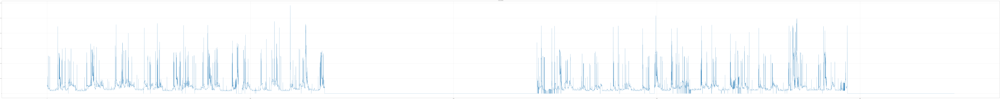

In [20]:
import matplotlib.pyplot as plt
plt.figure(figsize=(400,40))
plt.grid()
plt.title("13_Jan_by_1Minute")
plt.plot(range(len(ONE_MONTH_LIST)), ONE_MONTH_LIST)
plt.savefig('./13_Jan_by_1Minute.png')
plt.show()

#### 확인 필요 결손 시간

In [ ]:
"""
2013-01-04 12:40

2013-01-07 12:54:03 -> 2013-01-07 15:46:37

2013-01-10 11:32:04 -> 2013-01-17 17:52:02

2013-01-28 08:16:05 -> 2013-02-08 18:07:00
"""

### 보관안

In [ ]:
import csv
import time
import sys
month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}

"""
print("해당 전력 데이터는 2012년 11월 10일부터 2017년 4월 25일까지 온전한 데이터가 존재합니다.\n")
time.sleep(0.5)
print("데이터는 사용자가 선택한 기간 중 1년 단위로 처리됩니다.\n")
time.sleep(0.5)
global TARGET_YEAR_START 
TARGET_YEAR_START = int(input("목표로 하는 처리 기간의 시작 연도를 4자리 숫자로 입력해주세요. : \n"))
time.sleep(0.5)
global TARGET_YEAR_END
TARGET_YEAR_END = int(input("목표로 하는 처리 기간의 종료 연도를 4자리 숫자로 입력해주세요. : \n"))
time.sleep(0.5)

if(TARGET_YEAR_START<2012 or TARGET_YEAR_START>2017 or TARGET_YEAR_END>2017 or  TARGET_YEAR_END<2012):
    print("\---기간을 잘못 설정했습니다!---")
    print("---프로그램을 종료합니다.---")
    sys.exit()

if(TARGET_YEAR_START==2012 or TARGET_YEAR_END==2017):
    print("\n---해당 기간은 현재 서비스하지 않습니다!---")
    print("---프로그램을 종료합니다.---")
    sys.exit()

global HANDLE_MINUTE
HANDLE_MINUTE = int(input("데이터들은 기본적으로 1분 단위 최댓값으로 정리됩니다.\n추후 가공될 분 단위를 5분과 10분 중 골라 숫자만 입력해주세요. : \n"))
if(HANDLE_MINUTE!=5 and HANDLE_MINUTE!=10):
    print("\n---잘못된 시간 처리 단위를 선택했습니다!---")
    print("---프로그램을 종료합니다.---")
    sys.exit()
"""
EMPTY_HOUR_LIST=[]
for _ in range(60):
    EMPTY_HOUR_LIST.append(0)
    
EMPTY_DAY_LIST=[]
for _ in range(1440):
    EMPTY_DAY_LIST.append(0)
        
TARGET_YEAR_START = 2013
TARGET_YEAR_END=2013

def value (data, num):
    list0 = data.loc[num].values.tolist()
    date = list0[1]
    YYYY = date.year
    MM = date.month
    DD = date.day
    hh = date.hour
    mm = date.minute
    watt = list0[2]
    return YYYY, MM, DD, hh, mm, watt, date

print(value(ch1_dated,431369)[0])

#i1=0
i1=431369
while(i1 < len(ch1_dated)):
    print("전체 과정 시작")
    YEAR0 = value(ch1_dated, i1)[0]

    if(YEAR0>=TARGET_YEAR_START and YEAR0<=TARGET_YEAR_END):
        print("<<<<<{0}년 데이터 시작 {1}>>>>>".format(YEAR0, value(ch1_dated, i1)[6]))
        MONTH0 = value(ch1_dated, i1)[1]
        
        REAL_DAY = 1
        ONE_MONTH_LIST=[]
        while(MONTH0<13):
            print("<<<<{0}월 데이터 시작 {1}>>>>".format(MONTH0, value(ch1_dated, i1)[6]), i1)
            MONTH1 = value(ch1_dated, i1)[1]
            DAY1= value(ch1_dated, i1)[2]
            
            if DAY1==REAL_DAY:
                while(REAL_DAY<=month[MONTH1]):
                    print("<<<{0}일 데이터 시작 {1}>>>".format(REAL_DAY, value(ch1_dated, i1)[6]), i1)
        
                    REAL_HOUR = 0
                    ONE_DAY_LIST=[]
                    while(REAL_HOUR<24):
                        print("<<{0}시 데이터 시작 {1}>>".format(REAL_HOUR, value(ch1_dated, i1)[6]), i1)
                        HOUR1 = value(ch1_dated, i1)[3]

                        REAL_MINUTE = 0
                        MIN_60_LIST=[]
                        if HOUR1==REAL_HOUR:
                            while(REAL_MINUTE<60):#특정 시간대 안에서 분단위 데이터를 60개 처리
                                MINUTE1 = value(ch1_dated, i1)[4]
                                HOUR2 = value(ch1_dated, i1)[3]

                                print("<{0}분 데이터 시작 {1}>".format(REAL_MINUTE, value(ch1_dated, i1)[6]),i1)
                                SEC_60_LIST=[]

                                if MINUTE1==REAL_MINUTE and HOUR2==REAL_HOUR:
                                    while(True):#특정 분대 안에서 초단위 데이터를 처리
                                        MONTH2 = value(ch1_dated, i1)[1]
                                        DAY1 = value(ch1_dated, i1)[2] #여기 넣는게 맞나......??
                                        HOUR3 = value(ch1_dated, i1)[3]
                                        MINUTE2 = value(ch1_dated, i1)[4]
                                        SEC_60_LIST.append(value(ch1_dated, i1)[5])
                                        i1+=1

                                        if MINUTE1!=MINUTE2:
                                            if MINUTE2-MINUTE1==1 or MINUTE1-MINUTE2==59: #직후 분으로 넘어가거나 59분에서 다음 시로 넘어가는 경우
                                                print("*{0}분의 값들 >> {1}\n".format(MINUTE1, SEC_60_LIST))
                                                i1-=1
                                                break

                                            else:#진행되다가 분대가 넘어가긴 했으나 다음 분으로 넘어가지 않고 점프해버린경우
                                                print("*{0}분의 값들 >> {1} (결손 후 점프 시각 => {2})\n".format(MINUTE1, SEC_60_LIST, value(ch1_dated, i1)[6]))
                                                break

                                if MINUTE1!=REAL_MINUTE:#아예 해당분대가 결손된 경우
                                    if HOUR3==REAL_HOUR:
                                        print("같은 시각대 내 분 결손")
                                        SEC_60_LIST.append(0)
                                        print("*{0}시 {1}분의 결손치는 0으로 처리됨.\n".format(REAL_HOUR, REAL_MINUTE))
                                        
                                    if HOUR3!=REAL_HOUR:
                                        print("결손 + 타 시각대 점프")
                                        for _ in range(60-len(MIN_60_LIST)):
                                            MIN_60_LIST.append(0)
                                            print("*{0}시 {1}분의 결손치는 0으로 처리됨.\n".format(REAL_HOUR, REAL_MINUTE))
                                            REAL_MINUTE+=1
                                        break
                                
                                MIN_60_LIST.append(max(SEC_60_LIST))
                                REAL_MINUTE+=1

                        # 어떤 경우든 간에 시간이 바뀌는 경우, 정상이든 결손이든
                        if HOUR1!=REAL_HOUR:                
                            if DAY1==REAL_DAY:
                                print("시각 불일치! 점프됨!")
                                for i in EMPTY_HOUR_LIST:
                                    ONE_DAY_LIST.append(i)
                                print("*{0}시의 결손 데이터는 60개의 0으로 처리됨.{1}".format(REAL_HOUR, "\n"*3))
                                
                            if DAY1!=REAL_DAY:
                                print("시각 불일치! 점프됨!")
                                if REAL_HOUR==0:
                                    break

                                FAKE_HOUR=REAL_HOUR
                                for _ in range(23-REAL_HOUR+1):
                                    for i in EMPTY_HOUR_LIST:
                                        ONE_DAY_LIST.append(i)
                                    print("*{0}시의 결손 데이터는 60개의 0으로 처리됨.{1}".format(FAKE_HOUR, "\n"*3))
                                    FAKE_HOUR+=1
                                REAL_HOUR=23
                                

                        if REAL_MINUTE==60:
                            if len(MIN_60_LIST)==60:
                                for i in MIN_60_LIST:
                                    ONE_DAY_LIST.append(i)
                                
                            if len(MIN_60_LIST)<60:
                                for i in range(60-len(MIN_60_LIST)):
                                    MIN_60_LIST.append(0)
                                for i in MIN_60_LIST:
                                    ONE_DAY_LIST.append(i)
                                    
                            print("*{0}시의 분별 최댓값 {1}개 >> {2}{3}".format(REAL_HOUR, len(MIN_60_LIST), MIN_60_LIST, "\n"*3))
                            
                        REAL_HOUR+=1

                    if REAL_HOUR==24:
                        if len(ONE_DAY_LIST)==1440:
                            for i in ONE_DAY_LIST:
                                    ONE_MONTH_LIST.append(i)
                        if len(ONE_DAY_LIST)<1440:
                            for _ in range(1440-len(ONE_DAY_LIST)):
                                ONE_DAY_LIST.append(0)
                            for i in ONE_DAY_LIST:
                                ONE_MONTH_LIST.append(i)
                                
                        print(len(ONE_MONTH_LIST), len(ONE_MONTH_LIST)//1440)
                        print("*{0}일의 분별 최댓값 {1}개 추가됨.{2}".format(REAL_DAY, len(ONE_DAY_LIST), "\n"*5))
                            
                    if DAY1!=REAL_DAY and REAL_HOUR!=24:
                        break
                    
                    REAL_DAY+=1
                    #print("Real Day 1 더해짐! 현재 정상일 => {0}{1}".format(REAL_DAY, "\n"*5))
                    
            if DAY1!=REAL_DAY:
                if MONTH2==MONTH1:
                    #for _ in range(DAY1-REAL_DAY-1):
                    for _ in range(1440-len(ONE_DAY_LIST)):
                        ONE_DAY_LIST.append(0)
                    for i in ONE_DAY_LIST:
                        ONE_MONTH_LIST.append(i)
                            
                    print(len(ONE_MONTH_LIST), len(ONE_MONTH_LIST)//1440)
                    print("*{0}일의 분별 최댓값 {1}개 결손 처리됨(1).{2}".format(REAL_DAY, len(ONE_DAY_LIST), "\n"*5))
                    REAL_DAY+=1
                    
                if MONTH2!=MONTH1:
                    while(REAL_DAY<=month[MONTH1]):
                        print("일자 불일치! 점프됨!")
                        print(REAL_DAY, month[MONTH1])
                        if REAL_HOUR==0:
                            ONE_DAY_LIST=EMPTY_DAY_LIST
                            for i in EMPTY_DAY_LIST:
                                ONE_MONTH_LIST.append(i)

                        if REAL_HOUR!=0:
                            for _ in range(1440-len(ONE_DAY_LIST)):
                                ONE_DAY_LIST.append(0)
                            for i in ONE_DAY_LIST:
                                ONE_MONTH_LIST.append(i)
                                
                        print(len(ONE_MONTH_LIST), len(ONE_MONTH_LIST)//1440)
                        print("*{0}일의 분별 최댓값 {1}개 결손 처리됨(2).{2}".format(REAL_DAY, len(ONE_DAY_LIST), "\n"*5))
                        REAL_DAY+=1
                        
                    if REAL_DAY==month[MONTH1]+1:
                        break
                
                
        print("{0}월의 전체 데이터 {1}개 CSV 파일 저장 완료 {2}{3}".format(MONTH1, len(ONE_MONTH_LIST), len(ONE_MONTH_LIST)//1440, "\n"*10))
                
    else:
        i1+=1
        pass

### 아래가 원본

In [ ]:
import csv
import time

month = {1:31, 2:28, 3:31, 4:30, 5:31, 6:30, 7:31, 8:31, 9:30, 10:31, 11:30, 12:31}

# 1. 
i = 431369#431369가 맞음
print('Running!', '\n'*4)


# 2. 
while(i < 20284837):
    try:
        list1 = ch1_date.loc[i].values.tolist()
        date = list1[1]
        y1 = date.year
        M1 = date.month
        d1 = date.day
        H1 = date.hour 
        n = 0 

        # 3. 
        while(H1 < 24):
            H0 = 0 

            # 3'. 
            while(H0 < 24):
                watt_list=[]
                h = date.hour

                # 3.1. 
                if(H1 == H0):

                    # 3.1'. 
                    while(h < h+1):
                        n=n+1
                        list2 = ch1_date.loc[i].values.tolist()
                        date = list2[1]
                        watt = list2[2]
                        y = date.year
                        M = date.month
                        d = date.day
                        h = date.hour
                        m = date.minute
                        s = date.second

                        j=h-H1

                        # 3.1'.1. 
                        if(j==0):
                            watt_list.append(watt)
                            i = i+1

                        # 3.1'.2.
                        elif (j==1):
                            max_watt = max(watt_list)

                            hourly_date2 = '{0}년 {1}월 {2}일 - {3}시'.format(y, M, d, H1)
                            hourly_date5 = '{0} {1} {2}'.format(y, M, d) 
                            hourly_list = []
                            hourly_list.append(hourly_date2)
                            hourly_list.append(max_watt)

                            with open("./Electirc_Data_CSV/"+str(y)+'_'+str(M)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                writer = csv.writer(file)
                                writer.writerow(hourly_list)       

                            H1 = H1+1 
                            H0 = H0+1
                            break

                        # 3.1'.3. 
                        elif(d1+1==d and h ==0 and H1 ==23):
                            d=d-1
                            h=h+24

                            max_watt = max(watt_list)

                            hourly_date3 = '{0}년 {1}월 {2}일 - {3}시'.format(y, M, d, H1)
                            hourly_list = []
                            hourly_list.append(hourly_date3)
                            hourly_list.append(max_watt)

                            with open("./Electirc_Data_CSV/"+str(y)+'_'+str(M)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                writer = csv.writer(file)
                                writer.writerow(hourly_list)       

                            H1 = H1+1 
                            H0 = H0+1                   
                            break

                        # 3.1'.4.
                        elif (n>600):
                            list(hourly_date5)
                            listed = hourly_date5.split()
                            y4 = listed[0]
                            M4 = listed[1]
                            d4 = listed[2]

                            max_watt = max(watt_list)

                            hourly_date = '{0}년 {1}월 {2}일 - {3}시'.format(y4, M4, d4, H1)
                            hourly_list = []
                            hourly_list.append(hourly_date)
                            hourly_list.append(max_watt)

                            with open("./Electirc_Data_CSV/"+str(y4)+'_'+str(M4)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                writer = csv.writer(file)
                                writer.writerow(hourly_list)       

                            # 3.1'.4.1. 
                            if(d1==d):
                                jc=j

                                while(jc>1):
                                    h=h+1
                                    hourly_date = '{0}년 {1}월 {2}일 - {3}시'.format(y4, M4, d4, h-j)
                                    hourly_list = []
                                    hourly_list.append(hourly_date)
                                    hourly_list.append('Null')

                                    with open("./Electirc_Data_CSV/"+str(y4)+'_'+str(M4)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                        writer = csv.writer(file)
                                        writer.writerow(hourly_list)  

                                    jc=jc-1
                                    H1 = H1+1
                                    H0 = H0+1

                                H1 = H1+1
                                H0 = H0+1

                            # 3.1'.4.2.
                            if(d1!=d):

                                while(H1<23):
                                    hourly_date = '{0}년 {1}월 {2}일 - {3}시'.format(y4, M4, d4, H1+1)
                                    hourly_list = []
                                    hourly_list.append(hourly_date)
                                    hourly_list.append('Null')

                                    with open("./Electirc_Data_CSV/"+str(y4)+'_'+str(M4)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                        writer = csv.writer(file)
                                        writer.writerow(hourly_list)  

                                    H1 = H1+1
                                    H0 = H0+1

                                H1 = H1+1
                                H0 = H0+1

                                # 3.1'.4.2.1. 
                                if(int(d4)+1 != d):
                                    D = int(d4)+1 

                                    # 3.1'.4.2.1.1. 
                                    if(int(M) == int(M4)):
                                        while(D<d):
                                            for x in range (0,24):
                                                hourly_date = '{0}년 {1}월 {2}일 - {3}시'.format(y4, M4, D, x)
                                                hourly_list = []
                                                hourly_list.append(hourly_date)
                                                hourly_list.append('Null')

                                                with open("./Electirc_Data_CSV/"+str(y4)+'_'+str(M4)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                                    writer = csv.writer(file)
                                                    writer.writerow(hourly_list)  

                                            D=D+1

                                    # 3.1'.4.2.1.2.
                                    if(int(M) != int(M4)):
                                        while(D<=month[int(M4)]):
                                            for x in range (0,24):
                                                hourly_date = '{0}년 {1}월 {2}일 - {3}시'.format(y4, M4, D, x)
                                                hourly_list = []
                                                hourly_list.append(hourly_date)
                                                hourly_list.append('Null')

                                                with open("./Electirc_Data_CSV/"+str(y4)+'_'+str(M4)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                                    writer = csv.writer(file)
                                                    writer.writerow(hourly_list)  

                                            D=D+1

                                        D2 = 1
                                        while(D2 < d):
                                            for x in range (0,24):
                                                hourly_date = '{0}년 {1}월 {2}일 - {3}시'.format(y4, M, D2, x)
                                                hourly_list = []
                                                hourly_list.append(hourly_date)
                                                hourly_list.append('Null')

                                                with open("./Electirc_Data_CSV/"+str(y4)+'_'+str(M)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                                                    writer = csv.writer(file)
                                                    writer.writerow(hourly_list)  

                                            D2 = D2+1

                            break


                # 3.2. 
                if(H1 != H0):
                    list3 = ch1_date.loc[i].values.tolist()
                    date = list3[1]
                    watt = list3[2]
                    y = date.year
                    M = date.month
                    d = date.day
                    h = date.hour
                    m = date.minute
                    s = date.second

                    j=h-H1           

                    hourly_date3121 = '{0}년 {1}월 {2}일 - {3}시'.format(y, M, d, H0)
                    hourly_list3121 = []
                    hourly_list3121.append(hourly_date3121)
                    hourly_list3121.append('Null')

                    with open("./Electirc_Data_CSV/"+str(y)+'_'+str(M)+'_'+"House1_Ch1_Electric_Data.csv", 'a', newline='') as file:
                        writer = csv.writer(file)
                        writer.writerow(hourly_list3121)       

                    h = h+1
                    H0 = H0+1

                    if (H0 ==23 and h!=24 and H1!=23):
                                break

                    if(h==24 and H0==23 and H1==23):
                        hourly_date3121 = '{0}년 {1}월 {2}일 - 23시'.format(y, M, d)
                        hourly_list3121 = []
                        hourly_list3121.append(hourly_date3121)
                        hourly_list3121.append('Null')

                        with open("./Ch"+str(Total_num)+"_Electirc_Data_CSV/"+str(y)+'_'+str(M)+'_'+"House1_Ch"+str(Total_num)+"_Electric_Data.csv", 'a', newline='') as file:
                            writer = csv.writer(file)
                            writer.writerow(hourly_list3121)

            break
    except:
        pass
    
print('Job Done!!')
time.sleep(5)